In [1]:
%load_ext autoreload
%autoreload 2

from statsmodels.base.model import GenericLikelihoodModel

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import statsmodels.api as sm
import scipy.stats as stats
import sys

from scipy.interpolate import make_interp_spline, BSpline
from scipy.stats import multivariate_normal

sys.path.append("../")
import vuong_tests_fast

In [2]:
class JointNormal1(GenericLikelihoodModel):
    
    def loglikeobs(self, params):
        data = np.concatenate([[self.endog],self.exog.transpose()],axis=0)
        mult_rv = stats.multivariate_normal([params[0], 0.0], [[1,0],[0,1]])
        return mult_rv.logpdf(data.transpose())
    
    
class JointNormal2(GenericLikelihoodModel):
    
    def loglikeobs(self, params):
        data = np.concatenate([[self.endog],self.exog.transpose()],axis=0)
        mult_rv = stats.multivariate_normal([0.0, params[0]], [[1,0],[0,1]])
        return mult_rv.logpdf(data.transpose())


def setup_shi(yn,xn):
    # model 1 grad, etc.
    nobs = yn.shape[0]
    model1_param = np.array([yn.mean()])
    model2_param = np.array([xn.mean()])
    
    model1_deriv = JointNormal1(yn,xn)
    ll1 = model1_deriv.loglikeobs(model1_param)
    grad1 =  model1_deriv.score_obs(model1_param).reshape( (nobs,1) )
    hess1 = model1_deriv.hessian(model1_param)
    
    
    model2_deriv = JointNormal2(yn,xn)
    ll2 = model2_deriv.loglikeobs(model2_param)
    grad2 =  model2_deriv.score_obs(model2_param).reshape( (nobs,1) )  
    hess2 = model2_deriv.hessian(model2_param)
    
    return ll1,grad1,hess1,model1_param,ll2,grad2,hess2,model2_param

def gen_data(beta= 1.5, nobs=1000):
    cov = [[25, 0], [0, 1]]
    data = np.random.multivariate_normal([beta,beta], [[25,0],[0,1]],  nobs)
    return data[:,0],data[:,1],nobs

yn,xn,nobs = gen_data()
ll1,grad1,hess1,params1,ll2,grad2,hess2,params2 = setup_shi(yn,xn)
print(grad1.shape,hess1.shape)
#NOTE! Weird size distortions with shi's test when theta = .5....

(1000, 1) (1, 1)


In [3]:
nsims= 700
trials =1000
skip_boot=False
skip_shi=False
refinement_test=True
linspace=40
smoothing =5
adapt_c= True


#calc_c =lambda nobs: (2/100*nobs**(1/4)/np.sqrt(nobs), 1/2000*nobs**(1/3))
calc_c =lambda nobs: (nobs**(1/4)/np.sqrt(nobs), .1*nobs**(1/3))
print(calc_c(200))

(0.2659147948472494, 0.5848035476425731)


# Size stuff

In [4]:
betas = np.linspace(0,3,linspace)
nobs = 500
c1,c2 = calc_c(nobs)

results = []

for beta in betas:
    setup_shi_ex  = lambda yn,xn: setup_shi(yn,xn,num_params=num_params)
    gen_data_ex = lambda : gen_data(nobs=nobs, beta =beta)
    mc_out = vuong_tests_fast.monte_carlo(nsims,gen_data_ex,setup_shi,trials=trials,
                                          skip_boot=skip_boot,skip_shi=skip_shi,refinement_test=refinement_test,c1=c1,c2=c2)
    reg,twostep, refine_test, boot1,boot2,boot3,shi, llr,std, omega = mc_out
    results.append([reg,twostep,refine_test,shi,boot1,boot2,boot3])
    print(boot3)

-0.029986882408829962 0.004752901169360283 0.05023429434278376
-0.0544759691164379 0.004752901169360283 0.025743674198185015
---
0.0027850662342298275 -0.0073726063045690005 0.022149886173163755
-0.022703620745186344 -0.0073726063045690005 -0.003339452720035981
---
-0.017901602565711786 -0.002744054574914378 0.04596389621232949
-0.04680317150031156 -0.002744054574914378 0.017039799251120966
---
-0.010074180938277999 -0.0043016777679575685 0.036694806325392605
-0.036251308368697006 -0.0043016777679575685 0.010516568907846026
---
0.009292629338401678 -0.009589980613653725 0.015262226020038652
-0.01521412084429946 -0.009589980613653725 -0.009243689078014015
---
-0.037803131218062856 0.014442896670210207 0.0672991594119259
-0.06409161491071043 0.014442896670210207 0.04103111089064464
---
-0.010329873423858691 -0.002900087831627952 0.03633282476015881
-0.0344854225834564 -0.002900087831627952 0.01218952649028813
---
-0.027314050213801854 0.005811550597620229 0.05756464718106602
-0.053689924

-0.00818115896173717 -0.005664573773563059 0.03730023756950235
-0.036049282221836954 -0.005664573773563059 0.009438143592437064
---
0.008392231661055577 -0.0073050981419468565 0.014967631062895217
-0.015028491384671383 -0.0073050981419468565 -0.008454719180220381
---
-0.03449055618727747 0.009652644813733706 0.06250843698416962
-0.06013741373932574 0.009652644813733706 0.03682935694786403
---
0.004655192306200214 -0.00991500469013015 0.024059984230919398
-0.024829142542985825 -0.00991500469013015 -0.005410443095214005
---
-0.03764778652969782 0.013292165326747957 0.06629033106039776
-0.062211589836600155 0.013292165326747957 0.04166623924828411
---
0.004814788662672085 -0.011748997031379141 0.02400170605377724
-0.02271152436070793 -0.011748997031379141 -0.0035269286932767415
---
-0.058096732635684836 0.03637172563533144 0.08776585197812047
-0.0817498604780134 0.03637172563533144 0.06417547316823578
---
-0.027774847459133906 0.006396362359021794 0.04865442259855
-0.05136526899282977 0.0

0.00409011047378039 -0.007093075190517302 0.020049980079547898
-0.0198434681156311 -0.007093075190517302 -0.0038876448683232696
---
0.008843150655251389 -0.009078943128952662 0.01646073625687665
-0.01676943935363749 -0.009078943128952662 -0.009153993975523857
---
-0.03247968457986356 0.007145203352842377 0.06042704061155822
-0.058677025559354806 0.007145203352842377 0.03420887181075199
---
0.012228151844811488 -0.008415792784306632 0.014014820909979466
-0.014069651203045838 -0.008415792784306632 -0.012283324087744863
---
-0.0070628429346712325 -0.005437361376667022 0.032862148263034185
-0.03321777050877088 -0.005437361376667022 0.006692165500127308
---
-0.028078424800476474 0.005875543596172364 0.05554167825291213
-0.05349980208650559 0.005875543596172364 0.030135059344464973
---
-0.014062032440196204 -0.0035750458049596053 0.03886903346867852
-0.04106488084071124 -0.0035750458049596053 0.01186071143167394
---
-0.049745939540180716 0.020520730846280175 0.0674458033643898
-0.07306375855

-0.02830333578675513 0.0037308956792119034 0.052912685892375466
-0.05460018248132543 0.0037308956792119034 0.026619603593109983
---
-0.0639641301250627 0.032870056133896805 0.08995894927262213
-0.09172247560990988 0.032870056133896805 0.06220093150242971
---
-0.0013445809823580005 -0.006158914700970194 0.024346686979921116
-0.025195122701772602 -0.006158914700970194 0.0004974396077084092
---
-0.01757146450996054 -0.0007432028427267075 0.041802707085577505
-0.04123917556770898 -0.0007432028427267075 0.018137808920092653
---
-0.045515431396253636 0.015007051132892676 0.07297036867010635
-0.07378584655925821 0.015007051132892676 0.044681642659695826
---
-0.00944982964628655 -0.005494153093655479 0.035522483580049835
-0.037793431245738446 -0.005494153093655479 0.0071781511978758015
---
-0.026771594473264097 0.0033351411748955306 0.04983152774941069
-0.05268659560226823 0.0033351411748955306 0.02395407854254895
---
0.0038526450643468512 -0.008021890817224342 0.022558061589443505
-0.02290681

-0.007344249408812529 -0.005081780517453399 0.03382942020197303
-0.03392712678161618 -0.005081780517453399 0.007235087805813703
---
0.010428960769123388 -0.007905260844844962 0.01449793146928958
-0.014630363509405225 -0.007905260844844962 -0.01056149623733817
---
0.010241862144192955 -0.007642726346574698 0.013599938856063634
-0.013782681765864814 -0.007642726346574698 -0.010424562455020096
---
0.0009903811298231035 -0.006518890788355628 0.022668264568787268
-0.022495659252182977 -0.006518890788355628 -0.0008153097319082175
---
-0.016142779033037548 -0.000838817362099635 0.04109631855304521
-0.040200667527082616 -0.000838817362099635 0.01705166407155999
---
0.002716136406964433 -0.007058110838569575 0.02206744985114691
-0.021873621757947968 -0.007058110838569575 -0.00253545486238313
---
0.008493385803351584 -0.00900840250179844 0.019439624188898705
-0.019188954854011914 -0.00900840250179844 -0.008241630964000867
---
0.007464228404807737 -0.007273579740590319 0.01629332213614554
-0.0160

0.004812605592521118 -0.007299316342687489 0.019018300911053554
-0.0193140547546682 -0.007299316342687489 -0.0051093389543294164
---
-0.02840252976564863 0.004598189907614314 0.0513637879806866
-0.053520431582622194 0.004598189907614314 0.02625809445604023
---
-0.013327648047009671 -0.0025156137483302015 0.03561192438248442
-0.03856178085850117 -0.0025156137483302015 0.010376421418957203
---
0.01005263516689933 -0.007570526814331174 0.013923757091730013
-0.013924040694120914 -0.007570526814331174 -0.01005361736354358
---
-0.032701917786839015 0.00594114522604341 0.056161396211110784
-0.05933561751399337 0.00594114522604341 0.029509319184517723
---
0.00024088177272122417 -0.006227738302170547 0.024200748169103566
-0.022937833894399868 -0.006227738302170547 0.0010314699564315626
---
-0.07532128945554188 0.04885329816050766 0.09821809352223848
-0.09991180837855627 0.04885329816050766 0.0735935503762619
---
-0.03310787759117868 0.007338356827421094 0.06443879819908363
-0.06096939341552064 

-0.002896213518573782 -0.00524753170094968 0.025340496890118067
-0.02522995319324755 -0.00524753170094968 0.0030142515190883855
---
0.00037435448197867114 -0.0068961446968814405 0.024735753723931917
-0.02525040141555701 -0.0068961446968814405 -0.0008921276820372931
---
-0.023737775628305376 0.0036390605576067563 0.04547553896254218
-0.04798945410744771 0.0036390605576067563 0.021200161617738682
---
0.0011848808337971192 -0.007133494559709946 0.022415476298671896
-0.02324311955102603 -0.007133494559709946 -0.0020149008490457825
---
-0.052308464808795516 0.023085191509813058 0.07442092521244115
-0.0775791601733051 0.023085191509813058 0.049081027319199055
---
-0.007440328722382319 -0.005255609890142968 0.03429769017231526
-0.03405181261418631 -0.005255609890142968 0.007692915609831944
---
-0.03450286509849653 0.010516731643829673 0.06138907555485055
-0.05969418240420312 0.010516731643829673 0.03620373714107916
---
-0.03715515949975186 0.01781952900041844 0.0657961659333435
-0.06066153895

-0.008186653923952892 -0.004695769872798724 0.03351653922972558
-0.032876133339519144 -0.004695769872798724 0.008832271199734641
---
-0.0021645079006508273 -0.006490669346809248 0.0323235348904855
-0.029528150341328156 -0.006490669346809248 0.004978989130913976
---
-0.011443724489179942 -0.005087936371084845 0.04018627848173298
-0.03954831142344209 -0.005087936371084845 0.012083414423187973
---
-0.0017215084181914219 -0.006583419896729688 0.02685095564932555
-0.027213563362824125 -0.006583419896729688 0.0013635509375124846
---
-0.008249665102415787 -0.005396765946595947 0.036749812985899015
-0.0357443286172033 -0.005396765946595947 0.009224602825183937
---
-0.01411749074417482 -0.0035195330230902923 0.03552194156367473
-0.039435047839215726 -0.0035195330230902923 0.010198083553663584
---
-0.021217001479617748 0.0008348753086282119 0.04401766958353154
-0.045532486090652274 0.0008348753086282119 0.0197117345449456
---
-0.010214484574308073 -0.004771958270149695 0.03788247940363298
-0.037

-0.010785508996928586 -0.004207931477135751 0.036598110445111874
-0.03833277845773528 -0.004207931477135751 0.009055300826914326
---
0.011689731126657572 -0.008419482074576492 0.014268354268559574
-0.014313898150514407 -0.008419482074576492 -0.011735705385405373
---
-0.01577608304234616 -0.0005135982957967903 0.04399035471344565
-0.04157092894541645 -0.0005135982957967903 0.0181818639564302
---
-0.031136571482447566 0.007759950341007213 0.05686388914193912
-0.056056342620228884 0.007759950341007213 0.03195372217898924
---
0.0015073022473568193 -0.008181153030116198 0.02211779600326151
-0.02249861935243263 -0.008181153030116198 -0.0018882455639588765
---
-0.016649324079075618 -0.0006401047834183962 0.04218073046527435
-0.04258214047880166 -0.0006401047834183962 0.016268367896169325
---
0.005130389814874068 -0.008244214428451597 0.020098029409811594
-0.019285405398245355 -0.008244214428451597 -0.004320009230029294
---
-0.013721611113762355 -0.00402363863319501 0.041153307745320215
-0.042

0.0021746226784263114 -0.007311859605998104 0.023054021741588337
-0.022520942834857473 -0.007311859605998104 -0.0016331620668406143
---
-0.009768623367693283 -0.0035777907954195527 0.03471972274589432
-0.03412449891968358 -0.0035777907954195527 0.01038716609778227
---
-0.051791749145237743 0.025446167926283597 0.08229645712926684
-0.0786043050231616 0.025446167926283597 0.05546076208813538
---
-0.02070935697421818 -0.00025033696785850795 0.04327532004257641
-0.04596371286699096 -0.00025033696785850795 0.018032031822938034
---
0.010592269482396801 -0.009786533970759313 0.018287348572853957
-0.018150076714408398 -0.009786533970759313 -0.01045732686945258
---
0.008599662083961061 -0.008036687810342037 0.01715613812604927
-0.016839198882172588 -0.008036687810342037 -0.008281611616552614
---
0.002352457728534239 -0.006920204879214744 0.02166961832887303
-0.0220732964827015 -0.006920204879214744 -0.002750821746324916
---
0.0043283854513734505 -0.007895045196072302 0.022841650035359703
-0.022

0.009382103300112833 -0.007715502521486553 0.014813185485917308
-0.014824693074574211 -0.007715502521486553 -0.009393904000972546
---
-0.013042697220523033 -0.004321106538764073 0.04041535199258503
-0.041305272586564586 -0.004321106538764073 0.012132697430954529
---
0.010197414938627776 -0.008730276170832382 0.01495217854655563
-0.015014166766957117 -0.008730276170832382 -0.010260500750044877
---
-0.02104238042116542 -0.0014382156343219678 0.045823013625617144
-0.04786803859482102 -0.0014382156343219678 0.019007985046052313
---
-0.05050160951522242 0.027740197623255608 0.0712451113740206
-0.0724744402375641 0.027740197623255608 0.04925006387776838
---
0.007674769761429808 -0.0076359320547134775 0.016371764942844175
-0.01664233255916825 -0.0076359320547134775 -0.007945577077104414
---
-0.07259125458549442 0.03951527354796017 0.09491111871772345
-0.09893955232107471 0.03951527354796017 0.06850517306575266
---
0.0003777550532115642 -0.0070666205052393695 0.02386187390356597
-0.02446606912

-0.0279935903359753 0.004718594156213194 0.05395146350014047
-0.0525763107662539 0.004718594156213194 0.029372677949366065
---
-0.012846329585053023 -0.0018587080436144306 0.03746982588217968
-0.03579122715363016 -0.0018587080436144306 0.014526567031043673
---
-0.04505546777613318 0.020965052733821998 0.06757786963844348
-0.06767745376232534 0.020965052733821998 0.04495004282745293
---
-0.007858833785235742 -0.00472549498187686 0.03333456568340769
-0.033409617752553876 -0.00472549498187686 0.007755966877883759
---
-0.04794386801364618 0.02495639077336738 0.07772286475247887
-0.07273706218520258 0.02495639077336738 0.052911440131101675
---
-0.0037818254053023598 -0.006617119899209894 0.03031313714336583
-0.031081090837929815 -0.006617119899209894 0.0030032810653578858
---
0.0004174033514983514 -0.008028633285518649 0.026119234281013922
-0.028559721051959072 -0.008028633285518649 -0.0028557646420461977
---
0.005338512809698907 -0.00806356124540199 0.021147182186377428
-0.0215726690178745

-0.012738064657849399 -0.004271087635906696 0.03580057683978412
-0.03649414400468345 -0.004271087635906696 0.012012094074665988
---
-0.03939106381193899 0.015830838011401564 0.06598552777022665
-0.0632550603462817 0.015830838011401564 0.04211614108806921
---
-0.024041625986593967 0.0009270820124788381 0.051655483876308333
-0.05070306426832734 0.0009270820124788381 0.024961521285386968
---
-0.02794677609116769 0.004324021521788079 0.060143617612143783
-0.05644303504794158 0.004324021521788079 0.03166738719451765
---
-0.017187517700610586 -0.002123900107652417 0.04462156788590092
-0.04443716663954188 -0.002123900107652417 0.017368283141931
---
0.0007245810999142437 -0.008165544490862545 0.026799726189330915
-0.026561909960823308 -0.008165544490862545 -0.0004981763547051454
---
-0.030930361440240126 0.007855807909007688 0.06436797122360124
-0.05631909985699006 0.007855807909007688 0.038964310119604106
---
-0.030322000602708225 0.0027834266719489824 0.05411019478751686
-0.05648790404973581

0.007958311672281334 -0.008887219314022041 0.017276307035962897
-0.01765508388428708 -0.008887219314022041 -0.008334273576918662
---
-0.006133334660944938 -0.007241253693346632 0.03102991286199235
-0.030175646798475945 -0.007241253693346632 0.006981233791586776
---
-0.010775232705268253 -0.0037759476903124855 0.0362862967180626
-0.034626603143598264 -0.0037759476903124855 0.012436999413194554
---
0.011519470510489536 -0.008384715346458784 0.014181708918939686
-0.014260762569110325 -0.008384715346458784 -0.011598170315760775
---
-0.04746911813500929 0.013933035851444 0.07257914935570874
-0.07390155384444852 0.013933035851444 0.04614269689227753
---
-0.005222983942686381 -0.006105060604578159 0.030831739009827514
-0.031236271405925203 -0.006105060604578159 0.004825861470841646
---
-0.029001218407626823 0.006703553600090854 0.05869705689096026
-0.05473096246096201 0.006703553600090854 0.032976920531863456
---
-0.022803627697777707 0.0023053583502507273 0.047800633541682944
-0.048908672900

0.000959453010883459 -0.007100073794082813 0.023716147568141794
-0.0237916541685539 -0.007100073794082813 -0.001033117369051573
---
-0.006098090161742287 -0.006257855948722887 0.03290996752316421
-0.03106413786400792 -0.006257855948722887 0.007948994442762147
---
-0.009217615879191518 -0.005083456513133753 0.03440395049976258
-0.034231998138872365 -0.005083456513133753 0.009386301515388946
---
0.011043556321488669 -0.008294151289102622 0.014377412789912463
-0.01467174113505454 -0.008294151289102622 -0.011337233087717885
---
-0.038990686440123455 0.012457890085929858 0.0706102087066204
-0.066116011908624 0.012457890085929858 0.04350763198001363
---
-0.010439900498075683 -0.005034811261137136 0.03575098079449488
-0.03691222948801329 -0.005034811261137136 0.009295347641873118
---
-0.013079476247589953 -0.001947886048288139 0.03658087063017735
-0.03615315977993225 -0.001947886048288139 0.013502132786128971
---
-0.02422608743288279 0.0028254112126669356 0.055042263143135456
-0.0525313366923

-0.04385776246276369 0.012342909844702647 0.06739338439497464
-0.06883572406279315 0.012342909844702647 0.042445138769001904
---
-0.049574773064940236 0.018013410762799775 0.07383178919142419
-0.0779074198527779 0.018013410762799775 0.0454839935466988
---
-0.01610849569321275 -0.0012580628261326739 0.04080147238986375
-0.040505061648953726 -0.0012580628261326739 0.016396075409316997
---
-0.02399025304082876 0.0011436681391029874 0.04480566218206332
-0.048649325747013736 0.0011436681391029874 0.020142856174058102
---
-0.01104373789858784 -0.004224538590074089 0.03618551254391913
-0.03517695643284074 -0.004224538590074089 0.012075092837189447
---
-0.026777588223190037 -0.0002930985826460056 0.05060392269122101
-0.05034480931663754 -0.0002930985826460056 0.02704169608948748
---
0.0035496654667124474 -0.007608328433611607 0.021754860766695576
-0.021757705568590656 -0.007608328433611607 -0.003555321337249749
---
0.0025498118072563403 -0.007466815854356774 0.0226777263775362
-0.0215436653637

-0.02837175182217235 0.008018724657030213 0.05595391310473267
-0.05178118864273348 0.008018724657030213 0.03253327666435212
---
-0.03934514372350142 0.012855304642600348 0.06736915566667427
-0.06456570605903149 0.012855304642600348 0.04217615930440588
---
-0.0633769659488719 0.03017486602913781 0.08664061432076493
-0.08891876186267063 0.03017486602913781 0.0611242632183666
---
-0.027823432619603964 0.0054847404571823095 0.051975724660669326
-0.05158971522077761 0.0054847404571823095 0.02822203785998555
---
-0.03363790687280378 0.01046656685422793 0.057288413978563504
-0.05709004741317958 0.01046656685422793 0.03384772268479402
---
-0.02299957284937051 0.0001859572358567854 0.04990605877802162
-0.04919210754649445 0.0001859572358567854 0.023734058487330126
---
-0.047184141305471244 0.016416010765413235 0.07841231841970212
-0.07617417054802246 0.016416010765413235 0.0494614522890497
---
0.007250952612894746 -0.00843247894318759 0.017029878403591003
-0.017263572019629206 -0.00843247894318

-0.018351718740926913 -0.0017005932536989022 0.0443485235275212
-0.04452555857904268 -0.0017005932536989022 0.01819042382025119
---
-0.07253341670570443 0.049236250517747084 0.09812146915875473
-0.09665963753696709 0.049236250517747084 0.0740793841666787
---
-0.009884185551494831 -0.0043166872317071895 0.03650303172838382
-0.03597771615557484 -0.0043166872317071895 0.010429589289635948
---
-0.016497563247196406 -0.0018337934668720514 0.03811326462739982
-0.03909348051216576 -0.0018337934668720514 0.015514648578554618
---
0.002476623421019272 -0.007598886265527978 0.02196646856098999
-0.02251181850592596 -0.007598886265527978 -0.003026600051687981
---
-0.022052149634917285 -0.00045707926462127606 0.04276472448571052
-0.045262876359083604 -0.00045707926462127606 0.01954152227065207
---
-0.00943469598808325 -0.003980775747118176 0.03663764891389953
-0.03576289214420243 -0.003980775747118176 0.01030993305060129
---
-0.020725920078897477 -0.0011720744480339547 0.04463175036443439
-0.0459380

-0.008341301801348004 -0.0053898944250350194 0.033319629399706494
-0.03502787346693049 -0.0053898944250350194 0.006630243961146736
---
-0.02394854114953311 0.0009093580476976686 0.052002121350059195
-0.05115027897953465 0.0009093580476976686 0.024812386059333853
---
0.0074766592132582375 -0.007845574629421126 0.01583794033585396
-0.01605019448773718 -0.007845574629421126 -0.007685400313818839
---
-0.04360533770882163 0.01579099067287095 0.06907444124473491
-0.06752278664337699 0.01579099067287095 0.045159999348132085
---
-0.006861266995416296 -0.004114085123921735 0.031548559872230854
-0.030396826721377796 -0.004114085123921735 0.008014987418327747
---
-0.02296839654073887 0.0018544747931060997 0.051467842043956026
-0.04786185137516053 0.0018544747931060997 0.026568709854786002
---
0.006381648338258478 -0.00866174679389522 0.022890313669827914
-0.022625748400677746 -0.00866174679389522 -0.006121186168059777
---
-0.02780551245303263 0.004204561156895951 0.0493420170640352
-0.05199986861

-0.03358000548757254 0.0021285564943521293 0.06169042001750884
-0.06040167135441203 0.0021285564943521293 0.034851215592732174
---
0.003481160966816327 -0.007054770641904385 0.019028749054486795
-0.01911924115250896 -0.007054770641904385 -0.003573091512701384
---
-0.012514597696945835 -0.003708169432211246 0.03919455401541477
-0.03799713694169397 -0.003708169432211246 0.013711109465157063
---
-0.03012119841393369 0.005584302865526765 0.0545932907643374
-0.05552371560128755 0.005584302865526765 0.029213353020662077
---
-0.018531840700707684 -0.0017712499559359293 0.04205518369257401
-0.04433947024532513 -0.0017712499559359293 0.01626786066380304
---
-0.04487602654741957 0.021618209552102346 0.06963693574567549
-0.06645476091616864 0.021618209552102346 0.048040211519867
---
0.002309637158394508 -0.008880493820522768 0.022271922819228376
-0.02268189443761609 -0.008880493820522768 -0.002721121721073362
---
-0.07800939891593865 0.049753063293823604 0.10735257179221191
-0.10563853621541368 0

-0.007101925562048086 -0.007641071309065704 0.0320919568447006
-0.032312152091739633 -0.007641071309065704 0.00689834565129718
---
-0.02805785100168009 0.004158809731355732 0.051802846921238266
-0.052533490344496066 0.004158809731355732 0.02728577739720041
---
-0.010641538677266726 -0.0041824686232806545 0.03526916650365648
-0.0354613545980905 -0.0041824686232806545 0.010440289911472346
---
-0.007781036899506885 -0.005898549669850848 0.031469784211229236
-0.031400606749755686 -0.005898549669850848 0.007854547947826841
---
-0.014200356981235111 -0.0023656102171142703 0.04063823148632727
-0.039849003656634685 -0.0023656102171142703 0.014991070458494233
---
-0.0015034048483713164 -0.006125986090690363 0.024254606934143434
-0.025314762501611313 -0.006125986090690363 0.0004327989009545872
---
-0.009827567432547084 -0.004209978046799654 0.03431042480404171
-0.0338894418304514 -0.004209978046799654 0.010234657475431784
---
0.003554511285778614 -0.008655323584704703 0.023754943909353544
-0.024

-0.015814067077472217 -0.006304855270702698 0.04085552488724298
-0.04280811316076228 -0.006304855270702698 0.01386886467303221
---
0.004966905962316379 -0.011265290421442621 0.020521880042817006
-0.020703144028464394 -0.011265290421442621 -0.005142030217594301
---
-0.026361925929611986 0.00404786243938982 0.05552940142456058
-0.05378690357383218 0.00404786243938982 0.028100943450116662
---
-0.043483430550087965 0.009022100187416126 0.06908444194274112
-0.07039289339719339 0.009022100187416126 0.04218054438987867
---
-0.04915459596045598 0.02016756982356757 0.07836547064819702
-0.07476105190188678 0.02016756982356757 0.05276771970823558
---
-0.039010477212769165 0.01125075306392265 0.06181019218952022
-0.06380145210294198 0.01125075306392265 0.03703631729552893
---
-0.007229589831293859 -0.00684490184107512 0.02924131775782822
-0.031020665054314663 -0.00684490184107512 0.005446680758175973
---
0.000685463331080981 -0.010114058292177507 0.026363532030443945
-0.025818401365960034 -0.01011

-0.02639174848095155 0.0004272255364479659 0.05213470854828791
-0.05138571638439098 0.0004272255364479659 0.02713215922381433
---
-0.004159561251255736 -0.006225403124687615 0.028920764919604578
-0.028509453446305084 -0.006225403124687615 0.004563863410011548
---
-0.03237665830601061 0.008565512147623076 0.057759172966991
-0.056237783543467854 0.008565512147623076 0.03386064041478094
---
0.001478844739077901 -0.007793592025160383 0.02489049207991765
-0.024563035940277048 -0.007793592025160383 -0.0011386617650769018
---
-0.0050368754368825715 -0.009860107293747013 0.02969897331917212
-0.031004557082378717 -0.009860107293747013 0.003720960689673012
---
-0.009987690062469752 -0.00489102746472949 0.033087742557912005
-0.032862833495811594 -0.00489102746472949 0.010207489924763688
---
-0.02830078287026933 0.004947078971117187 0.05093008939866737
-0.051301963636038936 0.004947078971117187 0.027943836861678582
---
-0.031880189305339104 0.007135847325093578 0.0586596378140943
-0.05670630353616

-0.024455867230250866 0.000329706151990702 0.04346767102365826
-0.048293468257635475 0.000329706151990702 0.019627809811537094
---
0.006647901957543071 -0.013705164340015483 0.017871018069315903
-0.01784404325070601 -0.013705164340015483 -0.0066214173555055695
---
-0.043703777924634805 0.01302780081151288 0.07193898855659926
-0.0698204671838531 0.01302780081151288 0.04580754059625901
---
-0.029153166204326217 0.004095837389439566 0.056811202928913014
-0.05367831095764738 0.004095837389439566 0.032276831614281666
---
-0.02345694516916702 -0.004527861348992109 0.045292463310395555
-0.046442958326062656 -0.004527861348992109 0.02233409975404709
---
-0.051217808380854414 0.02276563530067774 0.0797363081327704
-0.07454695649720493 0.02276563530067774 0.05640514561187592
---
-0.00844044308701298 -0.008723725292581273 0.036305427556663425
-0.03446956160030252 -0.008723725292581273 0.010295910560292897
---
-0.010978614414168112 -0.011765135012378055 0.03829723308576711
-0.03876656775262982 -0.

-0.020552793595501582 0.0007998486705431463 0.047825456715490204
-0.044850363110921 0.0007998486705431463 0.02354497232339207
---
-0.02111435969446507 -0.0039358444150046695 0.04900633937792317
-0.04912293115838005 -0.0039358444150046695 0.02100355427661663
---
-0.029534834073752 0.0013237637239585935 0.05341150510045185
-0.0562835923369657 0.0013237637239585935 0.026636986139746927
---
0.0039770648996672155 -0.012308236018860618 0.01949313858952861
-0.01944758149979802 -0.012308236018860618 -0.003928588178353391
---
0.008914530105586512 -0.011525074843215249 0.017569328711715633
-0.017603049315850893 -0.011525074843215249 -0.008950016473657348
---
-0.006525683915282752 -0.008002491418598032 0.03407447291544326
-0.0323322793518925 -0.008002491418598032 0.008267148650904504
---
-0.06169949389032555 0.03336637298003802 0.08702055846132131
-0.08539530356857887 0.03336637298003802 0.06331416111520254
---
0.006898319402029114 -0.015132325624481994 0.018238443952683557
-0.017855594506387264 

0.008239318562152575 -0.008113005132743756 0.015520445826581217
-0.01563498510205818 -0.008113005132743756 -0.008354445041664417
---
-0.011056111452933481 -0.0159948417038588 0.039550689741946136
-0.037716769002547654 -0.0159948417038588 0.012906627040781634
---
-0.09605462173484741 0.07408590840809194 0.13253677396018074
-0.12121195339383949 0.07408590840809194 0.10732592177558144
---
0.004365388151984383 -0.009760750334828767 0.019253865278115095
-0.019054230580324835 -0.009760750334828767 -0.0041590583660233195
---
0.003746728221271731 -0.01159173902139559 0.02108344007825333
-0.021187141668962253 -0.01159173902139559 -0.003848667291706809
---
-0.059259029863748876 0.028258542761302415 0.08233281927885187
-0.08329272305285268 0.028258542761302415 0.058252828633894235
---
0.00491051712050687 -0.012064958680366123 0.021488253438459157
-0.02209546607511889 -0.012064958680366123 -0.005524881752761177
---
0.0069721447337088216 -0.010776325832133143 0.020018137016216898
-0.020122811695050

0.005837100396213242 -0.014438339099506349 0.0226097692558464
-0.022801217135981697 -0.014438339099506349 -0.00603241125623977
---
-0.04387658992489395 0.021867596502718273 0.06456905141216966
-0.06593594646019554 0.021867596502718273 0.04254298876497082
---
-0.04314957093532951 0.01675958228859112 0.06541065563736279
-0.06690962508959825 0.01675958228859112 0.041652256668090304
---
-0.009097239207475382 -0.010997679661639958 0.034149151621565496
-0.03347937139310978 -0.010997679661639958 0.009759501070452809
---
-0.0023415689531110454 -0.013629481271857317 0.028462877667185853
-0.028750236974956874 -0.013629481271857317 0.0020687584717122964
---
-0.039247580970105486 0.006155552909072459 0.0651637041446182
-0.06624579230885012 0.006155552909072459 0.038224179755436835
---
0.004262705050667839 -0.02088510786609516 0.02322885996267663
-0.022826221960604867 -0.02088510786609516 -0.003857343704177568
---
0.008409990563311081 -0.013441403915332195 0.021940385328594585
-0.021903644401385522

-0.04360032162662633 0.013472342901347334 0.07328538757927652
-0.06924854703534655 0.013472342901347334 0.047635500129216184
---
0.0036490030156115993 -0.010479745188961186 0.02405891182585018
-0.023930965332668423 -0.010479745188961186 -0.0035203637202621887
---
-0.0018124526514314084 -0.013705358973178088 0.024346325328960992
-0.02512035918557191 -0.013705358973178088 0.0010225243066442635
---
-0.005981889274002991 -0.009095723520619207 0.02798922848335098
-0.029635420698840186 -0.009095723520619207 0.004334907287601542
---
0.008752072851276927 -0.010998541286497987 0.016614752268328124
-0.016408920968359313 -0.010998541286497987 -0.008549065009677411
---
-0.0005934723491537616 -0.012329215523930945 0.02582106073713507
-0.02658190059222145 -0.012329215523930945 -0.0001613889683672913
---
-0.013356633669594766 -0.005940897531111494 0.03891142496556895
-0.0388557516932459 -0.005940897531111494 0.013392775652113378
---
-0.0025861539749608415 -0.007743213670412951 0.027315675954619572
-0

0.005419799000546282 -0.01085114587400495 0.019098848156588126
-0.019254871765098536 -0.01085114587400495 -0.005578789551002684
---
0.002532539319077242 -0.01275109344190267 0.021251216743664016
-0.02170722967989954 -0.01275109344190267 -0.0029943082618136448
---
-0.008682455257257684 -0.01107567079912776 0.033585055007161205
-0.034538568449346684 -0.01107567079912776 0.007741294926413993
---
-0.01959377082220919 -0.0017679874786676775 0.044916932906544485
-0.045454355887651995 -0.0017679874786676775 0.019067286676589
---
0.004023597399721454 -0.01244511719820199 0.021520733936958882
-0.021781761167830885 -0.01244511719820199 -0.004289146904411729
---
-0.023120600622322875 -0.003241909888501184 0.04567934454027703
-0.04794320666290506 -0.003241909888501184 0.020883684129279878
---
0.0031667667266517567 -0.009552780948370893 0.02097105079834477
-0.021600467044304322 -0.009552780948370893 -0.0037984265379136656
---
0.0071435277123653405 -0.011595393775897227 0.018290803957183226
-0.01851

0.001940676505050178 -0.010529255300739377 0.024223264917746193
-0.024740792862039722 -0.010529255300739377 -0.0024512384038509034
---
-0.03127011159349093 -0.0017352647209129136 0.05999782623635588
-0.05875667983224505 -0.0017352647209129136 0.03254102281944397
---
0.004819992567332331 -0.01077833078530661 0.01988256822052121
-0.02071333232194146 -0.01077833078530661 -0.005652733117502529
---
-0.02347678842175048 -0.007883979349216965 0.046848502733439566
-0.05099669730278609 -0.007883979349216965 0.019318638693323207
---
-0.018324965910140763 -0.010112466875051856 0.04382062459525162
-0.04434242037501749 -0.010112466875051856 0.01780585026141786
---
0.001902474520351983 -0.00837132076825192 0.02450245046137046
-0.023427662004662505 -0.00837132076825192 -0.0008341139176068904
---
-0.00637536849432805 -0.008798628947152796 0.031310046775386305
-0.03171890310761872 -0.008798628947152796 0.0059817858462273684
---
-0.010855979602291028 -0.012221209993717902 0.0361164548117459
-0.037424010

-0.0012451645820051565 -0.009261174454613878 0.02661544353925788
-0.026537403069919537 -0.009261174454613878 0.0013216704700816106
---
-0.018783067592921438 -0.009362968120584424 0.04714847669066502
-0.04568559429478938 -0.009362968120584424 0.02024215842428204
---
-0.03845531901887671 0.005254448856726149 0.062051830855191864
-0.06399950071163618 0.005254448856726149 0.03651207773368642
---
-0.034058620911823885 0.0036414163272313915 0.053867363988436584
-0.058264011441046974 0.0036414163272313915 0.029653566358727134
---
-0.022578624920228493 0.00014608185646963607 0.05993380254294093
-0.04975809567476178 0.00014608185646963607 0.032770308575253815
---
-0.0575552174641654 0.025707244499134866 0.07582063154643062
-0.08279257203716697 0.025707244499134866 0.05061752143359745
---
0.007502260779360147 -0.011250327036078285 0.017445134163954438
-0.017365494814818187 -0.011250327036078285 -0.007421667767384718
---
0.0048073403399354064 -0.013117245357788455 0.021137008998227798
-0.02081930

-0.015701602066820954 -0.0013868143736545859 0.04007300251884252
-0.039502359910292925 -0.0013868143736545859 0.016286193427276448
---
-0.0042947233405636435 -0.009414709381421848 0.02868480885138918
-0.02775938759114067 -0.009414709381421848 0.005223778783669122
---
-0.011547578877675074 -0.005820162801087887 0.04009080384127555
-0.03742121693210072 -0.005820162801087887 0.01424850401203185
---
-0.0324963565478011 0.005824811994576634 0.05390451861507165
-0.05737143515583096 0.005824811994576634 0.029036068226359506
---
-0.047467347042376526 0.012009614100331245 0.07165613388555546
-0.07325368992261456 0.012009614100331245 0.04588901256142836
---
0.0005483977616744213 -0.013934730215155657 0.02495360705292909
-0.025337513870615263 -0.013934730215155657 -0.0009386592194851342
---
-0.044204878532824635 0.015265786270426449 0.06952525737435788
-0.06861740910149516 0.015265786270426449 0.04510942757292991
---
-0.011174627301085599 -0.006529794330177372 0.035161031408748225
-0.034746436566

-0.019236029032538945 -0.003065226077662091 0.04397737233318044
-0.04399789684509254 -0.003065226077662091 0.019260506657328057
---
-0.022307838930053538 -0.0020425604053360027 0.04713833257047239
-0.046855773113505805 -0.0020425604053360027 0.022574815852567244
---
-0.012024056017842037 -0.005041440332635688 0.04132917127260433
-0.03854098810458619 -0.005041440332635688 0.014827925499299146
---
0.002677526445985509 -0.012335970179413546 0.02365650222362265
-0.024168153152597894 -0.012335970179413546 -0.0031871225253529345
---
0.00695599789664491 -0.016115847601408807 0.021414455584545695
-0.020505950487792125 -0.016115847601408807 -0.006047139808468432
---
-0.005951947002927867 -0.010068493437757953 0.03225766181544369
-0.03144533130096003 -0.010068493437757953 0.006776789280796205
---
-0.04555400972636999 0.015573755404450816 0.06714491361398303
-0.0691575922978519 0.015573755404450816 0.04348162140149722
---
-0.026646586230641988 0.006558890947159625 0.048625148438433304
-0.04880854

-0.0037759145254799204 -0.010909232509623014 0.028846725596882585
-0.029553198394046926 -0.010909232509623014 0.003063563661028316
---
-0.002806992681833366 -0.014845273818871229 0.02736135889588408
-0.027501814057216308 -0.014845273818871229 0.0026706116973346143
---
0.002193324438652723 -0.013506126185426716 0.02287167194594731
-0.022679051246285154 -0.013506126185426716 -0.0019969481380488156
---
-0.05670484503762164 0.02600941474648192 0.07921466934976945
-0.0810875404414378 0.02600941474648192 0.054907561426517565
---
-0.015037326782771143 -0.0112926652781728 0.044199499021624795
-0.04189105582162849 -0.0112926652781728 0.017340335925956286
---
-0.026448977220545344 0.0038947806532698206 0.05191481994486684
-0.05108252473534119 0.0038947806532698206 0.027322605382043282
---
-0.018592554827713364 -0.002786019086064024 0.04359915936846778
-0.04321301431822685 -0.002786019086064024 0.018991908270436998
---
0.002860899527558943 -0.012273167482111986 0.0226858865632821
-0.0227852241596

-0.023474704405197905 -0.006532244748515259 0.0501774253586592
-0.05090999503886197 -0.006532244748515259 0.02274378623860085
---
0.0008245534060532916 -0.015138586596912284 0.02450313218512545
-0.02590138835479789 -0.015138586596912284 -0.0022308225658904343
---
-0.0003589518296512218 -0.016956939566592166 0.027018885987858537
-0.02643142231605788 -0.016956939566592166 0.0009419706170002463
---
-0.0467047096088323 -0.0015292967417043625 0.07248251093258584
-0.07511444474801728 -0.0015292967417043625 0.04408062171447452
---
-0.00555083584346874 -0.018705601301697024 0.029532872459515528
-0.030919736159769663 -0.018705601301697024 0.004167593576558391
---
-0.021108742190781574 -0.004684296484496053 0.04371780065478323
-0.04368865738004148 -0.004684296484496053 0.021152497824333167
---
0.005152107117916948 -0.014531924179300094 0.020874622035120787
-0.02061170884541942 -0.014531924179300094 -0.004890755980915227
---
-0.025018160013794376 -0.011589780963192112 0.0544380431684535
-0.052495

-0.028208907972671646 -0.0023406120362286726 0.04949640728005044
-0.05165585509248346 -0.0023406120362286726 0.026048369523207337
---
-0.05997741059469283 0.024678768870214175 0.07893416767052228
-0.08366041686182375 0.024678768870214175 0.055198279385441154
---
-0.05798863695376862 0.02576580917341595 0.08050952859562634
-0.08394054679010016 0.02576580917341595 0.05459826547565605
---
-0.06923190066932723 0.045341122704037645 0.09948775718285971
-0.09417903216434007 0.045341122704037645 0.07453662705583182
---
0.0040071302635061356 -0.014302221895326768 0.02253393918307577
-0.022630097208670017 -0.014302221895326768 -0.00410043180612463
---
-0.023430183759194093 -0.00513113764963216 0.043559777210287906
-0.04771889631391689 -0.00513113764963216 0.019284282120406757
---
-0.005779193518669674 -0.016856741348957358 0.03488337962067339
-0.03250631458154425 -0.016856741348957358 0.008147365948167203
---
-0.07461660525000827 0.04818465197403633 0.10016666935789012
-0.09980678009613186 0.048

-0.005421257077133997 -0.021455626723987136 0.02918615921408669
-0.02916314242134022 -0.021455626723987136 0.005446013818662787
---
-0.07374471357926281 0.040886517916663256 0.10046370018742137
-0.1005192940508219 0.040886517916663256 0.0737199796101814
---
-0.002597943914742781 -0.012119036005951577 0.027299725857587765
-0.025954583592637394 -0.012119036005951577 0.003953485631946348
---
-0.018908325813587396 -0.009515106631233266 0.04073606104882278
-0.04223531111810633 -0.009515106631233266 0.017415652880203605
---
0.001380351443737309 -0.017660894086368815 0.025624517575312408
-0.02573276098751958 -0.017660894086368815 -0.0014898749862508123
---
-0.08952158811784564 0.06897120703429667 0.12010022869633442
-0.11469295594852222 0.06897120703429667 0.09482531496438998
---
-0.06691352344830176 0.02453387824147191 0.09757018607825027
-0.09337463678598888 0.02453387824147191 0.07106830153028791
---
-0.020366757339511567 -0.012731259135230091 0.04823374134661237
-0.04866412038108601 -0.01

-0.061903091027550906 0.03189814291703483 0.0894911811693654
-0.08568388751175322 0.03189814291703483 0.06567885455220403
---
-0.019318277745102534 -0.005835516510504617 0.04932634595337948
-0.04522339385231445 -0.005835516510504617 0.02340740832880604
---
-0.0036467117331170137 -0.012166389888537339 0.030825712987531766
-0.029057927092784496 -0.012166389888537339 0.0054067690368087735
---
-0.012781763571443143 -0.016665072175498112 0.03804199765209866
-0.03718876826655605 -0.016665072175498112 0.01363701815636561
---
0.002940720294638308 -0.015252287002370715 0.021193043692623835
-0.021116071282185282 -0.015252287002370715 -0.0028664887781382994
---
-0.013479629081482886 -0.021307237293013245 0.04080027034521241
-0.040991023384750275 -0.021307237293013245 0.013252770286513395
---
-0.023857172139940375 -0.0029781962733175654 0.04960493279408026
-0.04967857330476473 -0.0029781962733175654 0.02377814510103422
---
-0.0021032249635791317 -0.015379415194258537 0.02730740431676328
-0.0286694

-0.021559956163695757 -0.007823754988663199 0.04617133076884671
-0.04854246661932926 -0.007823754988663199 0.01921379495992662
---
-0.035955668096370956 -0.0007747089118970438 0.06560761207260937
-0.059625302374523466 -0.0007747089118970438 0.041948805323005156
---
-0.029923253740966865 0.0025029888416673775 0.05370542544711895
-0.053665902724297165 0.0025029888416673775 0.029938996223639942
---
-0.0069407019514389065 -0.016627695331694056 0.03277723487596953
-0.03185924122261137 -0.016627695331694056 0.007851070894557175
---
-0.03449071312239945 0.004843809252012339 0.057833291483836397
-0.05917630597479559 0.004843809252012339 0.03310743167547887
---
-0.04539901871074191 0.008602991360768312 0.06309977290675198
-0.0686080189563765 0.008602991360768312 0.039884883592166104
---
-0.005908655325938069 -0.014288541259010818 0.029885275053574824
-0.030539993303935052 -0.014288541259010818 0.005258119699193938
---
-0.028519033278164508 -0.005333891943975134 0.051795252079074074
-0.052270273

-0.004063387720458982 -0.015263925221058247 0.029970688558939404
-0.030896716036570807 -0.015263925221058247 0.003144639278758804
---
-0.04144499345633645 0.006745664207240445 0.06780900125381586
-0.0671760173389719 0.006745664207240445 0.042054880971513935
---
-0.06263341787190958 0.022956080016299486 0.07889820432556009
-0.08658548904376152 0.022956080016299486 0.05494261104774145
---
-0.04022847411488085 -0.0011049234355072772 0.06129810747840033
-0.06546464335979292 -0.0011049234355072772 0.036076519713021775
---
-0.02630415589346136 -0.0035242422924852725 0.05542537458472068
-0.05296939265958475 -0.0035242422924852725 0.028779277446231828
---
-0.04277076848461048 0.014255753559402968 0.06779501699760568
-0.06782045678419224 0.014255753559402968 0.04274302152950631
---
-0.08113395997149811 0.05319803690470179 0.10855796332035278
-0.10564430221493634 0.05319803690470179 0.08417506242890967
---
-0.01918499770582341 -0.013994985118121863 0.049005415442777145
-0.04452115527222515 -0.01

-0.020894522998758647 -0.006800764183038409 0.048991219467326985
-0.04652534368191149 -0.006800764183038409 0.023381169994666638
---
-0.019874716496085958 -0.018802153551241197 0.047786585520731915
-0.04578055840178616 -0.018802153551241197 0.021873165776752867
---
-0.005363886239367281 -0.015919054903916492 0.02999296776431132
-0.03063668152592162 -0.015919054903916492 0.004718896384864247
---
-0.01923058371243578 -0.007253665284379817 0.046103482247890425
-0.04518336644711702 -0.007253665284379817 0.020130512110483632
---
-0.03592968414167321 -0.007951093895280174 0.059633284604403855
-0.0623414538457886 -0.007951093895280174 0.033232294804395685
---
-0.052950123002530304 0.02028358755073342 0.0804784448962895
-0.07929590893483959 0.02028358755073342 0.054114413142776645
---
-0.011826193185003463 -0.010338367472884321 0.03555653858800038
-0.037030066847706856 -0.010338367472884321 0.010352585921957074
---
-0.030718385687311507 -0.002727234469511467 0.060369170903218805
-0.05791552379

-0.0277890652990209 -3.373511243728641e-05 0.057705068332076025
-0.05326261129280889 -3.373511243728641e-05 0.03224017910765082
---
-0.0076862212471135605 -0.009789947604432398 0.03237498915353304
-0.03377541435294863 -0.009789947604432398 0.006295418373250419
---
-0.021217438673697887 -0.005579671251927491 0.04340023643328685
-0.04414059423302249 -0.005579671251927491 0.02048690801025775
---
-0.03359485402024973 -0.006328664248072747 0.0582596576175662
-0.057035179251730135 -0.006328664248072747 0.03483948452944066
---
-0.009385495746579028 -0.019272442115611643 0.03555604346266903
-0.03511384817330603 -0.019272442115611643 0.009823978416474635
---
-0.03245237011356065 0.0050361613948821495 0.04879098275531684
-0.05575026815618003 0.0050361613948821495 0.025477236997925132
---
0.005744997978548664 -0.012403912308642798 0.019487055160487037
-0.018667779470496852 -0.012403912308642798 -0.004926962240179361
---
-0.04520087285435216 0.00857936705337353 0.06511563718209504
-0.0685657405829

-0.0329131002237382 0.0008822512760706667 0.055580322587627684
-0.05776745516066104 0.0008822512760706667 0.03072990407562739
---
-0.01848261988369032 -0.017771469714353318 0.04085064461879197
-0.043813586474824466 -0.017771469714353318 0.015501829127630517
---
-0.06752215257565218 0.036149541792327905 0.09834836979953471
-0.09317002363490523 0.036149541792327905 0.07265772364431002
---
0.0008555447735717324 -0.020566869246703593 0.025921313465978712
-0.026046064940069672 -0.020566869246703593 -0.0009811538736279313
---
-0.03601102905792945 -0.008135508375339837 0.06203825228906642
-0.06369177802322425 -0.008135508375339837 0.03435118793386056
---
-0.024472825814022953 -0.0012689835383799673 0.05185149883946168
-0.05134540773137039 -0.0012689835383799673 0.02495535774537357
---
-0.024033079594136225 -0.008204810431663266 0.05313888869307065
-0.0493572057012872 -0.008204810431663266 0.02780989604495813
---
-0.01789932199762117 -0.005637918210340141 0.04143291393336713
-0.042007442524391

-0.08925152751542655 0.061175137454601604 0.1183726833610542
-0.11591278296113554 0.061175137454601604 0.09175090509050227
---
0.005711068359429301 -0.01842701141478207 0.020305040895417143
-0.020566747195751744 -0.01842701141478207 -0.005966896117076655
---
-0.01615525416117432 -0.015855266737888892 0.043896969372426466
-0.04243213043384678 -0.015855266737888892 0.017599426226838903
---
-6.693870938158311e-05 -0.010106267427996727 0.026696413157734262
-0.02601610878749751 -0.010106267427996727 0.0007409206025553393
---
-0.0017996594709755714 -0.02005998663287036 0.02770555019750837
-0.027310763618114478 -0.02005998663287036 0.0021798268196570186
---
-0.045023910230870476 0.012782801587731905 0.0696465010797795
-0.06887559533884961 0.012782801587731905 0.04580073897834126
---
0.003167096899350832 -0.013276167529516351 0.02196482689296692
-0.021866493977539786 -0.013276167529516351 -0.003069721383918341
---
-0.006457191948556253 -0.009647009358507451 0.031102273429944965
-0.030678332045

0.005102793669513688 -0.01675690966579521 0.0190825464273892
-0.01927181754944709 -0.01675690966579521 -0.0052973571686769335
---
0.0006892775511864177 -0.013317272085908563 0.02354255617970802
-0.022996116983383608 -0.013317272085908563 -0.00013752367809447604
---
-0.012113526692901956 -0.005421932293835709 0.03640016971790567
-0.03673455134063467 -0.005421932293835709 0.01176930927452545
---
-0.03060181051036143 -0.0018512787392643184 0.05670875518544954
-0.05516820356527668 -0.0018512787392643184 0.03210287338841019
---
-0.0194835436647586 -0.011954095892619821 0.048168990118633126
-0.04603756504395496 -0.011954095892619821 0.02162623104466384
---
0.001948495898887704 -0.02339658848066376 0.02432655685690978
-0.024415117332621295 -0.02339658848066376 -0.0020359291448148634
---
-0.014697103842234754 -0.007051617255138217 0.040849842763036194
-0.0408101486675123 -0.007051617255138217 0.014729651021642625
---
-0.021905770218718187 -0.01309246460455751 0.04588171407684797
-0.04831264908

0.006691758280411418 -0.01335343005647853 0.016720002802185694
-0.01695963590541279 -0.01335343005647853 -0.006931919275031645
---
-0.030037002041097532 -0.013150300354576653 0.05576444339620549
-0.0545356641925885 -0.013150300354576653 0.031268613945930945
---
-0.017460287042303516 -0.01304819859102793 0.04296639931708863
-0.042096256728207604 -0.01304819859102793 0.018325128568333855
---
-0.020565874611975322 -0.008522516083228588 0.04451440682277596
-0.045329742073560504 -0.008522516083228588 0.019729890962595514
---
-0.029764137167366866 -0.0032043180182640294 0.05739575891714309
-0.05317102435545532 -0.0032043180182640294 0.03403420666127869
---
-0.06766434083791278 0.021861686945149086 0.08604140576689523
-0.09379860503743917 0.021861686945149086 0.05995321900223568
---
-0.05390154762963506 0.001148748031414881 0.07991278088300745
-0.07772751827581804 0.001148748031414881 0.056051769594148294
---
-0.02884942557550186 -0.015295010688594308 0.053419217078344114
-0.05452270674109407

-0.04929610067068901 0.011750458651669758 0.07427228358292437
-0.07351634948410188 0.011750458651669758 0.0500665854570752
---
-0.073714459356145 0.0376337234471684 0.09955688226193617
-0.09815958347938236 0.0376337234471684 0.07506849770488631
---
-0.022227735213518993 -0.016527967479341595 0.04647411444656464
-0.046854282019800395 -0.016527967479341595 0.02184059401674243
---
-0.05122188341537262 0.0033615040061819187 0.07843384210491064
-0.07646579794821545 0.0033615040061819187 0.05317544015795929
---
-0.015029315845239581 -0.02512227888568712 0.0416626299616049
-0.0418623771167485 -0.02512227888568712 0.014850070963830809
---
0.0015257568046678272 -0.027901980750899107 0.02276045758707064
-0.02215024330114936 -0.027901980750899107 -0.0009164719193688091
---
0.003968939709497171 -0.023163288120751305 0.022620844454928082
-0.02231217052024545 -0.023163288120751305 -0.0036590836954024414
---
-0.0353044578736173 -0.00281759675555957 0.05815059470814573
-0.06085291095057966 -0.00281759

-0.037866703815397744 0.0044045400621175275 0.06493700695577129
-0.06145969474108952 0.0044045400621175275 0.04133346021745775
---
-0.07631735529121123 0.0421630176856647 0.10072000707428139
-0.10170108979598069 0.0421630176856647 0.07531889997977598
---
-0.06902006273929416 0.03348101630962626 0.09648679014210153
-0.09368572154694003 0.03348101630962626 0.07180878246499058
---
-0.060694413842452895 0.020416580882831502 0.08215316950038788
-0.08486575359505799 0.020416580882831502 0.05800645224001388
---
-0.002094496632598614 -0.021412952291292135 0.025544648260009795
-0.026106419217768906 -0.021412952291292135 0.0015355439857927357
---
-0.062104330403065795 0.01183691548951341 0.08774341663230366
-0.08807541166264289 0.01183691548951341 0.06179803735128764
---
0.00046339386213777316 -0.02096615748312569 0.024433394944044264
-0.02470283193043124 -0.02096615748312569 -0.0007268785535816467
---
-0.03869679791189001 0.006535270264155913 0.060124592017567376
-0.06226086872367944 0.00653527

-0.0029153307446522004 -0.018419010083370366 0.02922333990998497
-0.028159795038833618 -0.018419010083370366 0.0039633886701149045
---
-0.029152444258530242 -0.0020020234841243074 0.0579571311347338
-0.05547849856330432 -0.0020020234841243074 0.03167504327593048
---
-0.004816985393901594 -0.01735646826464731 0.027624525145388847
-0.02928204552631546 -0.01735646826464731 0.00316278193427757
---
-0.10229191407394728 0.08284609534196778 0.13099803699829987
-0.12689704775786867 0.08284609534196778 0.10634724468738972
---
-0.002797636366617273 -0.016821504879819097 0.029259410474786435
-0.028921397102664236 -0.016821504879819097 0.0031427974653928654
---
-0.03362218184161672 -0.01169076313966186 0.05843751541256417
-0.059662661937924834 -0.01169076313966186 0.03238965088860138
---
-0.030756384632545597 -0.00761673783452883 0.0534096901897253
-0.053199797840535176 -0.00761673783452883 0.030941995416934015
---
-0.006313104706587606 -0.01605602866254654 0.02849197687164686
-0.03073092866796628

-0.0017453001819039261 -0.020369277417694502 0.026059923318094175
-0.026726762122837044 -0.020369277417694502 0.0010808475175646567
---
-0.028742048996559525 -0.00894556045170622 0.05407209638213699
-0.05459681034171761 -0.00894556045170622 0.02821471297380184
---
-0.049066222650998234 -0.00120781900898974 0.06980259994450715
-0.07431986398880064 -0.00120781900898974 0.04460203446568566
---
-0.022787374560711563 -0.008146533552840047 0.05120579411108413
-0.048290194966613804 -0.008146533552840047 0.025717449942624676
---
-0.035687752199726204 -0.0025392956768034857 0.06189012608181907
-0.061055381640167924 -0.0025392956768034857 0.03651771718262528
---
-0.03715752227972195 0.00014746144790971725 0.06587385958070485
-0.06331929720137182 0.00014746144790971725 0.039725163534735417
---
-0.027395459591379408 -0.015116906608823357 0.04893233715737844
-0.053204538679745006 -0.015116906608823357 0.02312876846378716
---
-0.03702673350398215 0.005646839324298781 0.06612621924855643
-0.061612698

-0.04884437343066342 0.0022742074803551336 0.07461498031658692
-0.07530362111780399 0.0022742074803551336 0.04808586827037863
---
-0.002397574521837369 -0.02967658902306249 0.026445518510078366
-0.027013414857131483 -0.02967658902306249 0.0018197939635265406
---
-0.06415778902471872 0.027305729957000008 0.09075988660344306
-0.08975166674835336 0.027305729957000008 0.06517730044979725
---
-0.011212231175527746 -0.025303024151976976 0.040607741706075826
-0.039435447262708666 -0.025303024151976976 0.012397277751658409
---
-0.0019875663067630243 -0.026335661985158906 0.027967396578873753
-0.02660274469919265 -0.026335661985158906 0.003379100857739278
---
-0.010515900665134277 -0.02203245633536634 0.036963873846654345
-0.035406447624156394 -0.02203245633536634 0.012084293176376396
---
-0.06592571266888321 0.013135618770791292 0.09235420751318149
-0.09299269594123019 0.013135618770791292 0.06534688849753086
---
-0.0442768951699425 0.0011409596876520145 0.06739671460560691
-0.0685900495342172

-0.012528731488083688 -0.02726625413937501 0.03480805372302404
-0.0359647357800536 -0.02726625413937501 0.011381206392142922
---
-0.03630103580225955 -0.016345523058422972 0.06949653314252963
-0.06265068394066887 -0.016345523058422972 0.043175411160704454
---
-0.03607449481816589 -0.0064002816153952155 0.059913262795721255
-0.06150111384439388 -0.0064002816153952155 0.03448597753023243
---
-0.03298513040799543 -0.011832573789378274 0.05724174950804084
-0.057816019004393406 -0.011832573789378274 0.03240103034613329
---
-0.018916848085806702 -0.02358150827351885 0.04576172546384362
-0.04539282909675846 -0.02358150827351885 0.019294834047858107
---
-0.028042252170190636 -0.031087012581574997 0.05146474837035808
-0.055815573428125306 -0.031087012581574997 0.02370556962909982
---
0.0006299255656768516 -0.021745173967856454 0.02450479609584617
-0.023763351892552353 -0.021745173967856454 0.00011418652066717952
---
-0.012464793358105271 -0.015862811815033045 0.03594497104031525
-0.037026463611

-0.06129652284308214 0.014194124942231323 0.09764256153293097
-0.08616265041794051 0.014194124942231323 0.0728398690182435
---
-0.04132486444458453 -0.0020745399877772504 0.07202731717940199
-0.06952181031250208 -0.0020745399877772504 0.04385149302895722
---
-0.016677510903994327 -0.014379392382513193 0.04267425398004851
-0.041697306522184015 -0.014379392382513193 0.017645407614618695
---
-0.04300879254941093 0.00625015535747022 0.06492234689713702
-0.06709458792615912 0.00625015535747022 0.04080335339156726
---
-0.06770254797895137 0.01986745592439526 0.09416162404954977
-0.09399597641796754 0.01986745592439526 0.06787708808415743
---
-0.047516693166443386 0.002118187709990894 0.06316126901462614
-0.07117544862442028 0.002118187709990894 0.039494259920544186
---
-0.04719290604521974 0.00032932238161435465 0.07754855173604833
-0.07317865263849445 0.00032932238161435465 0.051593898515457065
---
-0.0264804798642806 -0.013824223497110436 0.050775892001748334
-0.05130923989333967 -0.013824

-0.07499112942550835 0.036629209159567064 0.09070485187441957
-0.09989507824170213 0.036629209159567064 0.06584643306187905
---
-0.05382559820746826 0.007765345524766562 0.07352685309367078
-0.07832340115101281 0.007765345524766562 0.04898398621126926
---
-0.050306457190819054 0.014015726343429794 0.07192348727623826
-0.07423875840150665 0.014015726343429794 0.04797360470685855
---
-0.04395843105860072 0.0023212080187013737 0.06944582934217011
-0.06699185443222072 0.0023212080187013737 0.04642059243978168
---
-0.026248660009278446 -0.012539221595863398 0.05145868876710193
-0.05099907412342857 -0.012539221595863398 0.026705149990370967
---
-0.02974065097588327 -0.008459750801588665 0.05370725713889209
-0.05423805266894832 -0.008459750801588665 0.02923974555808102
---
-0.004749479702419097 -0.027537443246937948 0.028010948755558387
-0.029682372525542827 -0.027537443246937948 0.0030611626442523356
---
-0.018016463971344602 -0.01362451725535496 0.03914567943166746
-0.042887265279448056 -0.

-0.06570005481733165 0.019422569030503795 0.09354075523092475
-0.09155084871215492 0.019422569030503795 0.06770781412817758
---
-0.0653232265229665 0.03020995857810775 0.08801331353116003
-0.08997466389405845 0.03020995857810775 0.06340168894759722
---
-0.040880021050097186 -0.005526303765147174 0.059328243777473866
-0.06499155627457866 -0.005526303765147174 0.03519959093854418
---
-0.07509299186870194 0.03975230545255279 0.09546670818603373
-0.09951559616018356 0.03975230545255279 0.07102730003744573
---
-0.042541478834855324 0.007054735362124095 0.07437073248566073
-0.07004087807625956 0.007054735362124095 0.046900696479324606
---
-0.0006975671423324168 -0.025815000595528097 0.02685651773574246
-0.02688993637458906 -0.025815000595528097 0.000646645223037555
---
-0.008584752431514828 -0.018648359150246218 0.03590515082060235
-0.035877106680064566 -0.018648359150246218 0.008619979084841042
---
-0.07614806508719521 0.04814166744584373 0.09791632706136262
-0.10055967831511593 0.048141667

-0.026653422495838373 -0.007863352584206925 0.052342363634762225
-0.051369170787459235 -0.007863352584206925 0.027622901348515517
---
-0.04094119773995857 0.002211255579043862 0.06524180371057753
-0.06490376459546407 0.002211255579043862 0.041304370270452424
---
-0.03843395526491103 -0.011213606063034039 0.06686880597429895
-0.06622548670876287 -0.011213606063034039 0.03910437581498286
---
-0.03247496151081705 -0.008555559426601281 0.05544842639629153
-0.053861629849450775 -0.008555559426601281 0.03407108777770648
---
-0.016859346455367137 -0.017291407409803845 0.043075605347127496
-0.04191277259715549 -0.017291407409803845 0.01803904541595425
---
-0.031024274850483934 -0.016234411460730545 0.05535128774325022
-0.05629728104091019 -0.016234411460730545 0.030088932557400288
---
-0.04879047490906564 0.006869612670419524 0.07324202513919176
-0.07312359738653776 0.006869612670419524 0.04895267081007128
---
-0.02122136523027975 -0.017590321903859247 0.047210934075306105
-0.04458822871053055

-0.01346178760061961 -0.02313779693414524 0.03498113002905472
-0.038636036745739795 -0.02313779693414524 0.009803621271721916
---
-0.07138050800134213 0.03856471559149913 0.0981578792867383
-0.09466496714658783 0.03856471559149913 0.0748558548883288
---
-0.10018929409043485 0.06446374173759233 0.11514718440897383
-0.12410315510340303 0.06446374173759233 0.09124380930646961
---
-0.05569855356115543 0.006352189314191098 0.07846172490416062
-0.08207242607169872 0.006352189314191098 0.05212844702101973
---
-0.04721182729901303 4.285637890617803e-05 0.0746192345174059
-0.0697136911244154 4.285637890617803e-05 0.052149279564969765
---
-0.10444730847336993 0.06723179050090053 0.12525352754237898
-0.12985950540661256 0.06723179050090053 0.09977807876008206
---
-0.06423989529145235 0.006215125389439903 0.09618990390957238
-0.08957124424045489 0.006215125389439903 0.07082718009389095
---
-0.024668577768132756 -0.04205146953716557 0.05804067153448964
-0.052041439903733076 -0.04205146953716557 0.0

-0.02952851880485793 -0.022762616028226195 0.058265703399794894
-0.055335237728207774 -0.022762616028226195 0.03244400610722362
---
-0.01952112673314459 -0.027096851189288312 0.0431725772116402
-0.0450028236921645 -0.027096851189288312 0.017703825159871938
---
-0.046702258444732365 -0.021837492104148516 0.07776905245026337
-0.07432429354954483 -0.021837492104148516 0.050125810372558005
---
-0.026329186955694434 -0.01398419830260672 0.050343819026527986
-0.05022068834940091 -0.01398419830260672 0.0264237363459365
---
-0.044298797230474286 -0.020706636121823652 0.07923928010347503
-0.07151942776655273 -0.020706636121823652 0.05202642019461994
---
-0.037469950419219654 -0.0013045427593661296 0.06170352221377506
-0.06109895446524607 -0.0013045427593661296 0.03803001065818657
---
-0.06130165052620336 0.005412887573725719 0.0869050203090866
-0.08658106409189424 0.005412887573725719 0.061620518923931444
---
-0.05707171140474041 0.022517001587798416 0.0781328546695319
-0.07911216652322378 0.02

-0.06235775699187004 0.020415755609113163 0.08776450869311324
-0.08659995773668377 0.020415755609113163 0.06350653061633034
---
-0.1047392517208638 0.08056618322967782 0.11996784440249457
-0.12876814623719393 0.08056618322967782 0.09588036707625863
---
-0.07228001772867287 0.03237899806990167 0.10535097128068417
-0.0977244355418369 0.03237899806990167 0.07989499324134698
---
-0.11639541921626897 0.08800686912246954 0.13029400198956165
-0.14086342868094462 0.08800686912246954 0.10582293238776133
---
-0.0407617141023925 -0.011145579219904835 0.0660101060896214
-0.06635414853767317 -0.011145579219904835 0.04037760452548911
---
-0.06585682795867555 0.0030084246929124796 0.09380121332611725
-0.09244636959802227 0.0030084246929124796 0.06717936936554791
---
-0.012726469289908452 -0.013548135383982259 0.0367450976254617
-0.03746110601432559 -0.013548135383982259 0.012020200043060517
---
-0.03384771897655324 -0.024646691873266856 0.05610602963187711
-0.05804864230672756 -0.024646691873266856 0

-0.0133223484591883 -0.029792149732333326 0.03834197805976036
-0.03704170277114018 -0.029792149732333326 0.014644298457030113
---
-0.007301632531425499 -0.04322984441379862 0.0333267116061514
-0.034830520368840795 -0.04322984441379862 0.005785792583411827
---
-0.07218266229891283 0.02496505508618334 0.10492948378796117
-0.09844028507441244 0.02496505508618334 0.07863890984940977
---
-0.07437316875500335 0.03269841805118427 0.10206231175112397
-0.1001936560049588 0.03269841805118427 0.07627602344959315
---
-0.07531751918698405 0.03235881110473236 0.10183455800596089
-0.10067636752965414 0.03235881110473236 0.0764640309612381
---
-0.0017445701307452148 -0.05056048295111963 0.027583196056547105
-0.027910109128904848 -0.05056048295111963 0.0014008250541483406
---
-0.05922195966578771 0.005372376683514396 0.07036164418153462
-0.082545848707588 0.005372376683514396 0.04710879789833492
---
-0.03527835628984623 -0.001954863707375993 0.06502495828826255
-0.05797195027675328 -0.00195486370737599

0.0010987929007048045 -0.03488907884268791 0.02655492955123129
-0.026175566361005983 -0.03488907884268791 -0.0007280562171294326
---
-0.030183277672308415 -0.009324952884703988 0.05581004909267043
-0.0556512699514808 -0.009324952884703988 0.03033481250913642
---
-0.010439180038084141 -0.03374241689058608 0.03437520181107296
-0.03493184996349615 -0.03374241689058608 0.009871800456236281
---
-0.024091146940698926 -0.02807393777388827 0.04907890833814868
-0.049489001514998035 -0.02807393777388827 0.023672799687914737
---
-0.019013995646946277 -0.022199621049299834 0.04423698895321096
-0.04439797474394259 -0.022199621049299834 0.01886713195353659
---
-0.012992340057673659 -0.02525276618477176 0.038263110223151944
-0.038232640637961925 -0.02525276618477176 0.013012536848677215
---
-0.04069754825875614 -0.006112149716509309 0.06736645631575827
-0.06342954097385335 -0.006112149716509309 0.04465623754291811
---
-0.11673738144980716 0.13777517638935038 0.1489971437244131
-0.13997523166342693 0.

-0.007079624459348476 -0.031432187233330466 0.03462763115581194
-0.034673998647261325 -0.031432187233330466 0.007025941344304272
---
-0.057151687695740555 0.003973839385992505 0.08063879796023929
-0.08334990783442249 0.003973839385992505 0.05442888868052527
---
-0.054280152482830524 0.0012934180864406111 0.08146172730395715
-0.08069806507194163 0.0012934180864406111 0.05502842456067846
---
-0.04976537902451566 -0.00024107788239369145 0.07815205488894876
-0.07427559508565199 -0.00024107788239369145 0.05360563438447321
---
-0.06130289150674744 0.014858079970814467 0.09065881989214354
-0.08491510093256012 0.014858079970814467 0.06709619524805457
---
-0.08614633014293126 0.032333306190721015 0.10262238819814132
-0.1107901477232201 0.032333306190721015 0.07794255211162353
---
-0.006616252448206999 -0.040520134753949846 0.03440244299603006
-0.03343810096409134 -0.040520134753949846 0.007566115392279688
---
-0.039548012819857134 -0.0242228337369415 0.0647286765776046
-0.06468092766348653 -0.0

-0.08765137202026549 0.06013429634804246 0.11345950787487644
-0.11039350417616352 0.06013429634804246 0.09073991618108544
---
-0.04448369469717438 -0.022532340563582866 0.06947777590721498
-0.0694788836626002 -0.022532340563582866 0.044508504002627604
---
-0.008726524277146496 -0.0345591081671501 0.03572972475844244
-0.03496672176129059 -0.0345591081671501 0.009504385230129024
---
-0.05175065610659717 0.016502614080817518 0.08040055135326872
-0.07493509905787929 0.016502614080817518 0.05724197400449622
---
-0.07191133874441989 0.035065528395787554 0.09976165592078455
-0.0974584769938997 0.035065528395787554 0.07416700612813855
---
-0.04220766836282039 -0.015031841731608745 0.071389159997558
-0.06891232217762415 -0.015031841731608745 0.04466568162504495
---
-0.03964196989508585 -0.014333872876574612 0.06575422233394876
-0.06520255763187657 -0.014333872876574612 0.04023648533872689
---
-0.034853931387978036 -0.022842493508198947 0.062071149577048984
-0.06111068215386283 -0.02284249350819

-0.11602966706204827 0.09748051354004922 0.14488774587818307
-0.1425053974169734 0.09748051354004922 0.11835887216209588
---
-0.054149378114382675 0.0023884126666853327 0.08500656065376681
-0.08079685982502298 0.0023884126666853327 0.058345628557829404
---
-0.03786514354857601 -0.001114125610795351 0.06460433456025827
-0.06157704619151802 -0.001114125610795351 0.04086369763362687
---
-0.012446622801425273 -0.019089043738331733 0.036328319508817014
-0.03625525195689071 -0.019089043738331733 0.01249826456022914
---
-0.06669107020250911 0.018744857321893175 0.093543459244892
-0.09174321239854918 0.018744857321893175 0.06846966436672296
---
2.8836503894331723e-05 -0.03214236275341587 0.025090090580084254
-0.024926614868925646 -0.03214236275341587 0.00014211946107699162
---
-0.02046787379574944 -0.017556968166374635 0.04231357654825637
-0.042711678453874476 -0.017556968166374635 0.020056826799840034
---
-0.08029488691904285 0.038371338970132875 0.10306889885197708
-0.10328881986826008 0.038

-0.06990528312833295 0.008170955334231896 0.0976691877197346
-0.09486729512596256 0.008170955334231896 0.07269883292254423
---
-0.025299346643177813 -0.015596591272551308 0.0500023439075273
-0.050182734178321496 -0.015596591272551308 0.025108748228558096
---
-0.09392802037141504 0.062374397919184886 0.128429010502682
-0.12044793425748296 0.062374397919184886 0.1019283972488145
---
-0.07055942581369004 0.03638312788355779 0.09771393031059826
-0.09461976435016069 0.03638312788355779 0.07363358576787211
---
-0.005571394641616084 -0.03681655343127775 0.03386541745059599
-0.031245580463886907 -0.03681655343127775 0.008195075125944282
---
-0.06744239329372294 0.03025918214583324 0.09154975898265992
-0.09053562184236448 0.03025918214583324 0.06845760464381268
---
-0.07330308221596352 0.031138356929616633 0.10007084628581192
-0.09695378441747189 0.031138356929616633 0.07643138572934628
---
-0.09572589620625861 0.057232519051211864 0.11890214549777106
-0.12027277376649569 0.057232519051211864 0

-0.0766509727889322 0.027560811095703512 0.09648239638435414
-0.101010085281697 0.027560811095703512 0.07211583591743746
---
-0.031697528882341064 -0.007401721707341642 0.05256108693176117
-0.05529663933921686 -0.007401721707341642 0.028964200884324054
---
-0.06812334231914459 0.014150727748115795 0.08950214949778007
-0.09367663744794254 0.014150727748115795 0.06397724983857024
---
-0.09207533927582925 0.05016539028925302 0.11669800631350949
-0.11757616934509282 0.05016539028925302 0.09114644625277102
---
-0.08850795225041264 0.06049504622303298 0.10142208171075433
-0.11073002848458742 0.06049504622303298 0.0791167655970245
---
-0.06564366916226266 0.0013776950592276009 0.09800874496729377
-0.09219560646589464 0.0013776950592276009 0.07147336505697419
---
-0.004785848369696368 -0.04221012464509696 0.03127166440474984
-0.030651530978250553 -0.04221012464509696 0.005406513616007518
---
-0.06920746361117412 0.02120209934801518 0.09488960670149801
-0.09419695344291919 0.02120209934801518 0

-0.07103055736036065 0.022464984237145356 0.09874115378743717
-0.09547806484955933 0.022464984237145356 0.07424154272166346
---
-0.05344229386616127 -0.0032623571748612757 0.07775012634098573
-0.07794289636129895 -0.0032623571748612757 0.05326450828066672
---
-0.043585903031123675 -0.010550027627491479 0.06608481817481063
-0.06882179671270074 -0.010550027627491479 0.040836439309431136
---
-0.08936424164460632 0.039049307899762756 0.11011010338716784
-0.11505355875439248 0.039049307899762756 0.08437997895159197
---
-0.046729258276711406 -0.002933392794267254 0.07210842007891065
-0.0708646938821963 -0.002933392794267254 0.04791467553668857
---
-0.08547066958172009 0.05022488503770733 0.10528526110394881
-0.11109217662994669 0.05022488503770733 0.07972389315521934
---
-0.0012280589187400226 -0.03705862178388237 0.02729988659354683
-0.027766394176213467 -0.03705862178388237 0.0007679377595152739
---
-0.006942539965102646 -0.02275163575190992 0.034363155809504664
-0.03264608101544424 -0.022

-0.011114335414469545 -0.0371806718942588 0.03390323168442428
-0.034962037333781 -0.0371806718942588 0.010045652416963653
---
-0.10485896778147195 0.04545346320858726 0.11904949374792287
-0.1299597587582927 0.04545346320858726 0.09398992598788461
---
-0.027734077220746292 -0.04519047002395062 0.05981184701293204
-0.05354876108018988 -0.04519047002395062 0.033996795589018046
---
-0.005087091354135744 -0.03953202848651897 0.03032837704115878
-0.029714560047910815 -0.03953202848651897 0.0057145603447772446
---
-0.028562973161718373 -0.025946057359730646 0.056339730631602684
-0.05239121240020683 -0.025946057359730646 0.032527301162438634
---
-0.0980676785402428 0.08615475385711477 0.12161651340104737
-0.12171731420438912 0.08615475385711477 0.09799802113298713
---
-0.06059838482073688 0.011532014933690504 0.08788899578110175
-0.08311100777286899 0.011532014933690504 0.06544847547273537
---
-0.06444262312193508 0.010316431899614325 0.08923236001553807
-0.08991280500662904 0.0103164318996143

-0.09711352713745845 0.030607967066941126 0.11884401918990044
-0.12302582309782657 0.030607967066941126 0.09310651202350118
---
-0.051654721207729244 -0.017216894066490244 0.07074373620054099
-0.07659297297309964 -0.017216894066490244 0.04582767523796433
---
-0.06180319100809937 0.0030047201171433434 0.08518028176894259
-0.08538105248876303 0.0030047201171433434 0.061649577651373536
---
-0.046374307170886024 -0.020410181685466672 0.07634248031323622
-0.07040598042743994 -0.020410181685466672 0.05234361176782634
---
-0.04604740597660209 -0.010837497669736225 0.07197393054751237
-0.07015223505189584 -0.010837497669736225 0.04789710480139646
---
-0.04657523283005397 -0.008140992407496704 0.07064181313725922
-0.07072975071136861 -0.008140992407496704 0.04650689004228171
---
-0.08294610946737553 0.0494777952331367 0.1123578153518204
-0.10571533779023289 0.0494777952331367 0.08962781069570278
---
-0.03708203842219485 -0.026167431132924555 0.06491634641061046
-0.06270041578430466 -0.026167431

-0.0723298541771668 0.013928326700238183 0.09796601745444795
-0.09647016298678115 0.013928326700238183 0.07388554868593554
---
0.00031598790763406165 -0.037597431878896484 0.02801271601476182
-0.027281491167386478 -0.037597431878896484 0.0004180469819848459
---
-0.05525055661645169 0.0028657496690498996 0.08801267765170354
-0.08181156726882256 0.0028657496690498996 0.061472672135223776
---
-0.05755656252751509 0.001930055115705947 0.07625037662484352
-0.08110228309762922 0.001930055115705947 0.05268051202174796
---
-0.048991893119129305 -0.02681703462551382 0.072551966897834
-0.07556437272381726 -0.02681703462551382 0.04596612842355805
---
-0.022791820642978782 -0.032421603226476685 0.05086001114472968
-0.047379505447678924 -0.032421603226476685 0.026266856449655693
---
-0.030042972584713973 -0.029998275415544003 0.05530321572626075
-0.055379920352629564 -0.029998275415544003 0.029953895656401712
---
-0.05090863274132657 -0.008233225806381332 0.07598388053559321
-0.07658658416386148 -0

-0.05989782868210132 0.0026010504620418303 0.07750361692303435
-0.0857834797795115 0.0026010504620418303 0.051632459585409136
---
-0.08104049617784588 0.01444542936768632 0.10743890642669782
-0.10537621821150671 0.01444542936768632 0.08303568915889709
---
-0.03762342460506814 -0.031390638070508244 0.062114669303252316
-0.06285724989573944 -0.031390638070508244 0.03688149923349734
---
-0.055280799283348996 0.00565887280973454 0.07742399169364304
-0.07765027003179809 0.00565887280973454 0.055051240183267236
---
-0.08421202292462081 0.008640092529489486 0.10803469841311507
-0.11064727859996897 0.008640092529489486 0.08170018995303553
---
-0.052415112678417454 -0.012285794273653766 0.07808127453146924
-0.0765087762727039 -0.012285794273653766 0.05398307309232724
---
-0.0818855927176548 0.009681089512908306 0.0963099303396408
-0.10726713248815045 0.009681089512908306 0.07085281715922824
---
-0.05216468234656443 0.006529206519221124 0.08231003823217746
-0.07562251610070918 0.0065292065192211

-0.04227907773488256 -0.029014374150809118 0.06163022354186159
-0.06859212226504284 -0.029014374150809118 0.03533041190779721
---
-0.06636693768133739 0.012156524408653441 0.09341069903761808
-0.09102639980654953 0.012156524408653441 0.06867788280601461
---
-0.06602875277331918 -0.012609469081681606 0.08612269308269917
-0.09317340294692335 -0.012609469081681606 0.058859658918007304
---
-0.017795211453231305 -0.03884557604406016 0.04298036906727474
-0.04361160857219594 -0.03884557604406016 0.017176322417560216
---
-0.04188050350884216 -0.005494095861228646 0.06657749475258971
-0.06494676720775822 -0.005494095861228646 0.04353589834824379
---
-0.01802203071054597 -0.04951304970102969 0.05038631969335849
-0.04739161489189665 -0.04951304970102969 0.02100837042336861
---
-0.0673230011106521 0.0053590626368681575 0.08418244221164314
-0.09177799839040308 0.0053590626368681575 0.05969166711333857
---
-0.03905934458039918 -0.016737568542088133 0.06380809439189099
-0.06483442360204242 -0.0167375

-0.04975121066469393 -0.006252304645608176 0.06823592276347883
-0.07221060880884186 -0.006252304645608176 0.04581661618061848
---
-0.04089314678463973 -0.033276966840991976 0.06451132537881524
-0.0674397903678709 -0.033276966840991976 0.03797233253538833
---
-0.08043932820806532 0.029128042349592476 0.10443726567946716
-0.10328602351210223 0.029128042349592476 0.08164970860932334
---
-0.018957099250393294 -0.04186192261873205 0.04992949552792193
-0.04413308935085783 -0.04186192261873205 0.02479766414966866
---
-0.047036896730101065 -0.01696303082885848 0.0758198099038463
-0.0721023419861624 -0.01696303082885848 0.05074183935111022
---
-0.04332892842971756 -0.011707517601885648 0.06647112567475343
-0.06814581883139093 -0.011707517601885648 0.04163642421168908
---
-0.0073847081805130214 -0.03206049776796227 0.032773779201564254
-0.03166851656994645 -0.03206049776796227 0.008503228898115407
---
-0.024694086436407126 -0.032344391404247046 0.05451257152721677
-0.053204966146562345 -0.032344

-0.08418703721914211 0.02628488142558163 0.11117113495999485
-0.10965249698287897 0.02628488142558163 0.08573475061948223
---
-0.04753511368927748 -0.02551523123010914 0.08094067376494007
-0.0723109730477583 -0.02551523123010914 0.05614211189290702
---
-0.0850945724322888 0.016793310039343774 0.10485463391531735
-0.10977516321070654 0.016793310039343774 0.08025490692130009
---
-0.08346479729542812 0.02979196037919694 0.10082194311807317
-0.10860606126208042 0.02979196037919694 0.07570440903953017
---
-0.06005089208433648 -0.014635877332454994 0.08147463225383846
-0.08535754716427092 -0.014635877332454994 0.05613142628959316
---
-0.016845523920798168 -0.025686473409833464 0.037969635051407165
-0.04081788052187401 -0.025686473409833464 0.014000776441444858
---
-0.08103757453851639 0.014936793268214147 0.10733695152677199
-0.10552621129862609 0.014936793268214147 0.08276621801868875
---
-0.09065795731436939 0.05088074571508152 0.12150218058821256
-0.11412244925840995 0.05088074571508152 0

-0.0623840699265825 0.013664985957063825 0.09038705098527115
-0.08664557945467247 0.013664985957063825 0.06605585414165713
---
-0.018250187774099168 -0.032992456214444923 0.047808023127495686
-0.04391001495737323 -0.032992456214444923 0.02217411581597879
---
-0.05231929919071428 -0.0011571786727572427 0.07127747592938652
-0.07683640698246089 -0.0011571786727572427 0.046772859736782656
---
-0.0663933899385824 0.003971913052971208 0.08783159025997063
-0.09195829296002082 0.003971913052971208 0.06222964069616352
---
-0.07590376916223357 0.013151527145610523 0.09080206728288291
-0.10005104867233566 0.013151527145610523 0.06659822057992133
---
-0.05766967831911945 -0.0006421252897626203 0.08253884084486261
-0.08153724321778807 -0.0006421252897626203 0.05865410886382944
---
-0.09652588376339323 0.0473067475879333 0.11200739137700379
-0.12184963252035544 0.0473067475879333 0.08669436845744428
---
-0.031686665576340686 -0.029716044553429438 0.06084233166026566
-0.05738838954747859 -0.029716044

-0.04749270822622468 -0.003773110997942202 0.07364389701568541
-0.07148806376498316 -0.003773110997942202 0.04969323479551418
---
-0.03517886178973882 -0.018720576914258612 0.05773837356297698
-0.05928516772124405 -0.018720576914258612 0.03364964350383667
---
-0.07013417609746773 -0.004995898510249912 0.094434880888968
-0.09747292139988896 -0.004995898510249912 0.06710356455557623
---
-0.04863196430334079 0.0023963847624156303 0.06568337279579058
-0.07020665429651475 0.0023963847624156303 0.044135166310141534
---
-0.039793570125578125 -0.020369883469157437 0.07423399920133976
-0.06523110418714671 -0.020369883469157437 0.048819005631919654
---
-0.0290007041722738 -0.02848668903380285 0.05280242613427218
-0.054669013620825595 -0.02848668903380285 0.0271364841588184
---
-0.06574326891839469 0.0048802772983543045 0.08944000135329895
-0.09064993447948244 0.0048802772983543045 0.06453660103072538
---
-0.023204098137146145 -0.026413712242135776 0.04252622557897815
-0.046972533876074266 -0.026

-0.08613148510073494 0.019988747304956582 0.1111811853012817
-0.11243310188078921 0.019988747304956582 0.08488040663760735
---
-0.010171577848713104 -0.028602474182931863 0.03557800893183018
-0.03414824947243042 -0.028602474182931863 0.011598297228167482
---
-0.09774042545661164 0.04214564906621663 0.12926735597827294
-0.12439752083252568 0.04214564906621663 0.10261103634644597
---
-0.05766436616458672 0.019852743273993282 0.09010950391476562
-0.08185767379842722 0.019852743273993282 0.06597213970399281
---
-0.029928348770318837 -0.02430074900994976 0.05472048360946719
-0.05346985937949366 -0.02430074900994976 0.031161180153018424
---
-0.0479507884549017 -0.013370053922299988 0.07453534677895143
-0.07256973792443414 -0.013370053922299988 0.04993451118836228
---
-0.05579863517415155 -0.0026184956922610378 0.07598546663977568
-0.08083331368661723 -0.0026184956922610378 0.05096233599492415
---
-0.11812240417726344 0.07209933262119674 0.14338224037408062
-0.14376964839191358 0.072099332621

-0.052834693518156346 -0.010889234200185914 0.07639007030283573
-0.0765610341198615 -0.010889234200185914 0.052654459396250075
---
-0.03752244702636207 -0.028418566896350268 0.06213740550807612
-0.06120812645031492 -0.028418566896350268 0.038464775544247036
---
-0.08192030168632111 0.03749539233005513 0.10049155903000889
-0.104377102843065 0.03749539233005513 0.07811281944092985
---
-0.03558589158574642 -0.017765798635599902 0.05937852695155311
-0.05911716474767534 -0.017765798635599902 0.03583323739817548
---
-0.019576799752041164 -0.023593914788519167 0.041947480544916364
-0.0411452104626522 -0.023593914788519167 0.020372516404748933
---
-0.05620238959356328 0.008170535771367723 0.07689739133056128
-0.07811601842053369 0.008170535771367723 0.055007294306395
---
-0.006877476377512391 -0.056063908883403395 0.034698727360544385
-0.033898195343214976 -0.056063908883403395 0.0076787144674950415
---
-0.11011476759084417 0.0388936708097211 0.12692362925907716
-0.13633771603039263 0.03889367

-0.1183156127582689 0.06980434011739331 0.1479837316748395
-0.1455328071430914 0.06980434011739331 0.12055180439580485
---
-0.06509971560320514 7.732129417607983e-05 0.08822298786199265
-0.08803882660790087 7.732129417607983e-05 0.06533189180096055
---
-0.06868074943951413 0.016227629438461476 0.09549993356307164
-0.09094925430193461 0.016227629438461476 0.07326486517673564
---
-0.08419496091572332 0.01715823856763172 0.10873131440575752
-0.10937384695469858 0.01715823856763172 0.08360661670203536
---
-0.09414949776278436 0.003062384435501803 0.12605531174819748
-0.12090431018974619 0.003062384435501803 0.099462714035234
---
-0.07374763359900381 -0.030697130449632216 0.09965751847359999
-0.10005827625146652 -0.030697130449632216 0.07337263596144322
---
-0.08960653992830954 0.006776774252655182 0.12131467323863328
-0.11747215428381229 0.006776774252655182 0.093519648065488
---
-0.0724746879441329 0.008919818320417034 0.089217996173925
-0.09640084724461852 0.008919818320417034 0.06529432

-0.09048876215791875 0.03231337355676645 0.12825055759508752
-0.11619376318689872 0.03231337355676645 0.10252826786097137
---
-0.06265097583553969 -0.0013214674172537936 0.08844304145881599
-0.08689061784169354 -0.0013214674172537936 0.06421520638273313
---
-0.11593243895628633 0.09258798458710152 0.13557684821175026
-0.13867432033064597 0.09258798458710152 0.11281009941137415
---
-0.06159443003173229 -0.010097281485029528 0.08863120328148362
-0.0861559089737136 -0.010097281485029528 0.06404070855675086
---
-0.09483092144663813 0.033491312641427705 0.11727802342510094
-0.11979337618782931 0.033491312641427705 0.09232086735658124
---
-0.051297332075156646 -0.02442950724221202 0.072744265298548
-0.0753305889837103 -0.02442950724221202 0.04872180880281275
---
-0.0824018844774515 0.03275280159116518 0.10781223665354664
-0.10607131831051533 0.03275280159116518 0.0841541373484548
---
-0.09451284878423895 0.04700985058071425 0.11989763019860354
-0.11817165865253502 0.04700985058071425 0.09622

-0.10072025585944887 0.015668500237516304 0.11364136737298415
-0.1251760062297796 0.015668500237516304 0.08911984293504223
---
-0.03665747739685338 -0.025760243613747312 0.058497676560573385
-0.058196092705437526 -0.025760243613747312 0.036972991221853546
---
-0.11694966003704367 0.08606923884273658 0.1503304058826032
-0.14105673468656038 0.08606923884273658 0.12633690719331814
---
-0.023066328993962246 -0.036872290487236815 0.05192199349963292
-0.047030347398716234 -0.036872290487236815 0.027935240566558498
---
-0.03951298624626429 -0.075211566229219 0.06437700416933836
-0.06820669521176967 -0.075211566229219 0.03571074569129907
---
-0.10457392478123681 0.04503499138385524 0.13929520836057308
-0.1307129019141864 0.04503499138385524 0.11316781175046538
---
-0.07426885752989593 0.00776133873955951 0.09895000091339866
-0.0978192708769752 0.00776133873955951 0.07540895008161322
---
-0.0483116153305598 -0.02056560677882906 0.06899551665831949
-0.0718393741293323 -0.02056560677882906 0.0454

-0.03626222850590535 -0.04781291732713735 0.06396679072335426
-0.062356582513921247 -0.04781291732713735 0.03789927347762836
---
-0.044718446883981335 -0.003105654234868573 0.08360614831912612
-0.06843965388751132 -0.003105654234868573 0.059929024206809976
---
-0.04840282814248261 -0.04524864399915264 0.06635964035955315
-0.07443952461212912 -0.04524864399915264 0.04033139234381926
---
-0.06698096419628365 -0.0014362203003620351 0.09351214246487008
-0.09081917841025978 -0.0014362203003620351 0.06970000405695127
---
-0.10046638567284046 0.03197086228281476 0.10873935730476371
-0.12588336656000182 0.03197086228281476 0.0833504841145811
---
-0.03060371487671261 -0.04806701157676314 0.05830160396177025
-0.055739483912053175 -0.04806701157676314 0.03316007359928305
---
-0.0873034336678187 0.022421358973251336 0.12549668108368547
-0.11489600003223008 0.022421358973251336 0.09777646303303533
---
-0.05021292617454458 -0.010928673948907475 0.07582284968481706
-0.07395017022814247 -0.01092867394

-0.0379596369787687 -0.020486753439615514 0.05947116085060786
-0.060421148122569386 -0.020486753439615514 0.036982390150472326
---
-0.0901392900595843 -0.01227639843792022 0.12195058522619688
-0.119570591335926 -0.01227639843792022 0.09247598692106383
---
-0.015193046373202596 -0.06545531870487875 0.04206964074950813
-0.042215368320288986 -0.06545531870487875 0.015040523702697388
---
-0.08030060454003249 0.00958981579073885 0.10059561482426856
-0.10442164735316804 0.00958981579073885 0.0764591978812405
---
-0.06598624671880275 -0.009702439920491602 0.09516347394536316
-0.09046214303148034 -0.009702439920491602 0.07071644645736863
---
-0.07606844662822161 0.0024470006813848287 0.10448547640252577
-0.10158956580780634 0.0024470006813848287 0.0790913222703261
---
-0.008067126964695004 -0.0827201781329215 0.03470365126488533
-0.03549597775689244 -0.0827201781329215 0.007272161797324219
---
-0.11849852228932087 0.10631977396544352 0.13761470068692133
-0.14109904989178038 0.10631977396544352

-0.08174927514953231 0.02909867946934286 0.10534536805450896
-0.10556179779372356 0.02909867946934286 0.08154307848319443
---
-0.08980579045268132 0.009296777861415875 0.1170680048224763
-0.1156523107350325 0.009296777861415875 0.09126655765350575
---
-0.11811104549548457 0.06270879236347843 0.15044024339141054
-0.14487472807417362 0.06270879236347843 0.12371460628850377
---
-0.11397869108202381 0.054418395640982706 0.13976263314943288
-0.140267162619057 0.054418395640982706 0.11358138319657637
---
-0.07958952700705364 -0.00044422215371993693 0.10174220833603421
-0.10531219234772901 -0.00044422215371993693 0.07603042494071786
---
-0.1274708328542006 0.10945403397739724 0.14964539154550424
-0.15095001457210658 0.10945403397739724 0.1259695063033072
---
-0.0932979314284161 0.036580963894849404 0.11183363342270976
-0.11666704757479915 0.036580963894849404 0.08856711743780762
---
-0.07802451979195835 0.0066206349193645335 0.10838205700915611
-0.10329550102564056 0.0066206349193645335 0.083

-0.05995341538516802 -0.029231408274320636 0.08067294146930257
-0.08619285833445249 -0.029231408274320636 0.054375877421575756
---
-0.06225613417868396 -0.020031845842744155 0.08617784414012848
-0.08800694292685265 -0.020031845842744155 0.06044971852449003
---
-0.05143387747094671 -0.011222543889498608 0.0760426170846384
-0.07611859240049235 -0.011222543889498608 0.05135666278206254
---
-0.10052563740744704 0.08383798197641137 0.13096751982721933
-0.12210326279595099 0.08383798197641137 0.10936514082232171
---
-0.03601509995362578 -0.048914755001377715 0.059591920008685205
-0.062084303127202874 -0.048914755001377715 0.03352616672913168
---
-0.09825134488191543 0.03765423752475893 0.1352613575477903
-0.12342225874501292 0.03765423752475893 0.10999920989665507
---
-0.09645216266637482 0.006666767443455273 0.12589641722031455
-0.12299062426593282 0.006666767443455273 0.09929476858567564
---
-0.07684721603256493 0.013319765147115598 0.10316473621801472
-0.09977218834808056 0.01331976514711

-0.09719746638943842 0.023808800515575507 0.11605126867406788
-0.12087427875268564 0.023808800515575507 0.09242129225032768
---
-0.06189820640525661 -0.019529667822115945 0.08966667524342765
-0.08815483078364014 -0.019529667822115945 0.06336095909883852
---
-0.07327464209549209 0.005643094948482773 0.10426076962397876
-0.09754163595096409 0.005643094948482773 0.07993653971461341
---
-0.11067462819878031 0.04835732024312915 0.14524882093891836
-0.13629408742763122 0.04835732024312915 0.11971359906793788
---
-0.08374116134528785 0.016289338201015836 0.10732438371413444
-0.10840935048728806 0.016289338201015836 0.08271701577084294
---
-0.08086466803602382 0.023906377257712996 0.1054633802553215
-0.10529041613736048 0.023906377257712996 0.08110089714764179
---
-0.05154757460683056 -0.03790894683784466 0.07200076113752724
-0.07599282261816637 -0.03790894683784466 0.047513343834068876
---
-0.0653144405672867 0.011741976893712999 0.09317262660663848
-0.08940525599260833 0.011741976893712999 0

-0.08486059417542911 0.036663179503453776 0.10079426997765112
-0.10791500826449092 0.036663179503453776 0.07773119485390292
---
-0.07529028817133313 -0.010677150457220333 0.09698750963319432
-0.10097804526752616 -0.010677150457220333 0.07123726371908681
---
-0.008311559560878852 -0.06107737895248175 0.035797684673653025
-0.03560123871527049 -0.06107737895248175 0.00850850870586139
---
-0.05395905819802313 -0.011888145450043746 0.08164663795197646
-0.07904137477631293 -0.011888145450043746 0.05651865590336262
---
-0.11981387160191537 0.07240221360644092 0.13670056259496632
-0.14474316718204655 0.07240221360644092 0.11173411580255631
---
-0.08539452047687399 0.024810614123214173 0.10415438749292115
-0.10979838008762355 0.024810614123214173 0.07981198879114448
---
-0.08950772936927216 0.021052418620358452 0.11204592859638726
-0.11454897445282793 0.021052418620358452 0.08699222250133215
---
-0.07205308778435665 -0.0003344778218356546 0.10035283945940586
-0.09733510710606554 -0.000334477821

-0.0195252836758729 -0.05816432784545806 0.042895788180224985
-0.045677403863248374 -0.05816432784545806 0.01677270485366904
---
-0.04871736972868198 -0.03272533537923736 0.06941110837068216
-0.07431792594545282 -0.03272533537923736 0.04378724843979839
---
-0.10283065281854605 0.03848925476420877 0.1280419199435721
-0.1271988480811298 0.03848925476420877 0.1036365446713157
---
-0.03243506612752532 -0.02834382972686352 0.053160378859917604
-0.056188177452609865 -0.02834382972686352 0.029416411867456974
---
-0.060690841318193314 -0.02698866288539901 0.08940640411300757
-0.08624143720060844 -0.02698866288539901 0.06382322542543367
---
-0.08098647933054993 0.02101103612124038 0.10327116659086666
-0.10493457416621119 0.02101103612124038 0.07929119822308174
---
-0.024839207036027395 -0.04470894307197388 0.04768028018544958
-0.048884049061438124 -0.04470894307197388 0.02364010786199092
---
-0.08404946636322563 0.019330274655302255 0.11515097040249553
-0.1093937743086661 0.019330274655302255 0

-0.04451276877879672 -0.025623213758652924 0.06493135073840328
-0.06754796238083993 -0.025623213758652924 0.0419065477206566
---
-0.14676122705015482 0.188078084636973 0.1916210391837234
-0.17191268864154668 0.188078084636973 0.1663289260214257
---
-0.08282668149708497 0.030858102279849326 0.1049908922041442
-0.10633142542843756 0.030858102279849326 0.08140569712035567
---
-0.12693702220969508 0.08281805724303068 0.15824720818544138
-0.1527523938267001 0.08281805724303068 0.13234978035699005
---
-0.13538035066613283 0.07686002557678781 0.14937192210707353
-0.1611442870176838 0.07686002557678781 0.12365244075601038
---
-0.07969823665426996 0.028746412838218573 0.09996966257755814
-0.10354628042790372 0.028746412838218573 0.07602417875891666
---
-0.06170341154355766 -0.015100786658529408 0.0807584279379373
-0.08617748062181912 -0.015100786658529408 0.05627810956079936
---
-0.026696832400055607 -0.031128144819539034 0.051375980437858196
-0.05056106495540037 -0.031128144819539034 0.0275079

-0.07785845129854486 0.010284049333080934 0.10143779092447316
-0.10116692839282623 0.010284049333080934 0.07817610293969841
---
-0.044294662994481065 -0.023933112851342146 0.06369354750540697
-0.06733228481785847 -0.023933112851342146 0.04070492069437193
---
-0.10811726145286467 0.031264513083612014 0.1264528151752821
-0.13253453001018373 0.031264513083612014 0.10206290585351876
---
-0.037732612681657576 -0.055028165060320426 0.06345116126226406
-0.0628955725537159 -0.055028165060320426 0.038351337038831285
---
-0.09408716390472234 0.004104796336856612 0.11545800770353629
-0.11919099415131632 0.004104796336856612 0.09026068172660288
---
-0.084414228844335 0.02166879890564246 0.10887215304774424
-0.10710208124215731 0.02166879890564246 0.08611246484747599
---
-0.06716846621440896 -0.004291011187459907 0.09859988028534718
-0.08881203755865799 -0.004291011187459907 0.07697239790210543
---
-0.058469241886392194 -0.01771568861319308 0.08199642083808033
-0.08437558345219957 -0.01771568861319

-0.045468147470441825 -0.04668461471023372 0.07024718748291177
-0.06967152909494691 -0.04668461471023372 0.04606678103502575
---
-0.11748829275142691 0.07228390358615035 0.1430149205257558
-0.14208962092274233 0.07228390358615035 0.11848145241506801
---
-0.13609894074937587 0.06278098939236201 0.17181441457610616
-0.1646484698301356 0.06278098939236201 0.1431228699141946
---
-0.05098330424017726 -0.04662075856456275 0.08178588824583932
-0.07652751007905333 -0.04662075856456275 0.0562412782317118
---
-0.08833536209369156 0.0025565858536748223 0.11932380483134276
-0.11298944458922977 0.0025565858536748223 0.09467974346900616
---
-0.044778689848388356 -0.023729760144695123 0.06522158703228524
-0.06821406323594034 -0.023729760144695123 0.041797690735286504
---
-0.06378907975059929 -0.016437620652259444 0.09219314008221831
-0.08940396590941437 -0.016437620652259444 0.06653204895685416
---
-0.07253437684270089 -0.015233227126453981 0.09354385172250347
-0.09790827507343465 -0.0152332271264539

-0.07623699397815399 -0.0017727737159952731 0.0959278194030962
-0.09927276584016889 -0.0017727737159952731 0.07292499642472774
---
-0.06569248650192935 -0.027972035682541058 0.08847385819981732
-0.09071442295143775 -0.027972035682541058 0.06347473415256857
---
-0.041099903002001385 -0.05941854904044612 0.06457909910806432
-0.06631277484780529 -0.05941854904044612 0.03937579665311935
---
-0.087680978301361 0.017553745264245045 0.11289772762235603
-0.11246298282445254 0.017553745264245045 0.08822267261301119
---
-0.08072438360679657 0.0012736114810051695 0.10265004057549694
-0.10461877721000658 0.0012736114810051695 0.07874258568842678
---
-0.05231393192100547 -0.011812036548061821 0.07141337856255991
-0.07551762179991227 -0.011812036548061821 0.048216978546991945
---
-0.06688735891423946 0.002084234311389462 0.09687697062319864
-0.0899209296337417 0.002084234311389462 0.0737736454313478
---
-0.06437110674980873 -0.004562944638664125 0.08587896919397905
-0.08822615089094449 -0.0045629446

-0.016547289564594093 -0.05826155558696928 0.043176022753774905
-0.039832526400989346 -0.05826155558696928 0.019906258858010284
---
-0.09457295112384856 0.03829661418251802 0.1174834293702006
-0.11728344498308456 0.03829661418251802 0.09479480042379039
---
-0.08994151490119008 0.01881460999439156 0.1152794960335246
-0.11384368478104995 0.01881460999439156 0.09133055063126008
---
-0.08442582458025101 -0.02397244720378872 0.09797335378349246
-0.10969560614900277 -0.02397244720378872 0.07268268443406688
---
-0.035215930582731134 -0.04733493431950156 0.058272261131026994
-0.058109456400153046 -0.04733493431950156 0.03539283781383011
---
-0.08559967742260355 0.027922801165841147 0.10850004222313134
-0.10915995123524483 0.027922801165841147 0.08496063291046776
---
-0.08646683870866327 0.029011999552411096 0.10784056259338898
-0.1087371931862163 0.029011999552411096 0.08564613761037426
---
-0.08887318312302789 -0.0012921548097557416 0.10123460883199464
-0.11256559367129794 -0.0012921548097557

-0.01598395978032169 -0.07315722663633671 0.04116900186251268
-0.04428090252069379 -0.07315722663633671 0.01288297963475021
---
-0.03188472613784733 -0.053334001491756315 0.054559287991856165
-0.055931330666503055 -0.053334001491756315 0.030512443388877816
---
-0.05225194101984508 -0.01344374397310595 0.07851287223484944
-0.0767872154909749 -0.01344374397310595 0.05405831510110261
---
-0.0815182649384719 -0.0027343920495954757 0.10578883757996826
-0.10483080545305065 -0.0027343920495954757 0.08251651545116102
---
-0.018462931253942154 -0.06141092724310495 0.04573770876670968
-0.04376592701844843 -0.06141092724310495 0.020438861691096696
---
-0.02345768729609788 -0.07571659552219949 0.048338534003363465
-0.04968776899914414 -0.07571659552219949 0.022092015965531907
---
-0.09112039165557305 -0.01593083160400031 0.12125550126529226
-0.1188390623672615 -0.01593083160400031 0.09354579496257374
---
-0.046040848074330225 -0.05523176039555394 0.07442194607695221
-0.07259019338175123 -0.0552317

-0.09698183451825412 -0.0010536149957498504 0.12305798879936854
-0.12339595149424101 -0.0010536149957498504 0.09670896242344004
---
-0.08833886920354546 0.026652079232277245 0.10820418653970339
-0.1113410162148033 0.026652079232277245 0.08518240863477086
---
-0.09003034520214179 -0.0033529458079907012 0.11334484487150799
-0.1149765306311998 -0.0033529458079907012 0.08830225313415474
---
-0.08017309185259891 -0.021320509587836798 0.09855389868867664
-0.10435168006406599 -0.021320509587836798 0.0743762833395539
---
-0.11164525022466772 0.03737092466108301 0.12476262160553626
-0.13689937019410708 0.03737092466108301 0.09945523106059509
---
-0.09666902781189524 0.037601105156680324 0.11136010331308108
-0.11849411431039253 0.037601105156680324 0.08948329822879625
---
-0.09408041503020712 -0.0007118974686241755 0.11408489792893954
-0.12062469390255681 -0.0007118974686241755 0.08750100955544204
---
-0.058844824001303364 -0.01477665674446681 0.07990453440979697
-0.08327999633176292 -0.01477665

-0.038465268275428566 -0.05683352456384031 0.06050860129037549
-0.06486711915623167 -0.05683352456384031 0.03411746567927535
---
-0.0816037232590635 -0.023190209212206055 0.1043291775312904
-0.10761507764486396 -0.023190209212206055 0.07834655285089
---
-0.08527013973918557 0.01198883245837978 0.10996971271148032
-0.10910012017493619 0.01198883245837978 0.08617364713245869
---
-0.12041524186555122 0.05477884812693143 0.14659261082510955
-0.14673927978346443 0.05477884812693143 0.12036150370903223
---
-0.04694433236845668 -0.05431994736443692 0.07826080140822286
-0.07235734352225147 -0.05431994736443692 0.05278650058455155
---
-0.08266860654695489 -0.004980351456160852 0.1037894364934601
-0.1078821194029271 -0.004980351456160852 0.07858420805195897
---
-0.06538108210573293 -0.010132310832697972 0.08678985125008436
-0.08732958299611945 -0.010132310832697972 0.06490389061121309
---
-0.0901162357568997 0.022723050717695387 0.1102070888910208
-0.11352034205110248 0.022723050717695387 0.0867

-0.09038645947573284 0.01285534272603885 0.1264594946660523
-0.11673007928839137 0.01285534272603885 0.10010463951629231
---
-0.07712305661530518 -0.003980026084927061 0.09722087827729381
-0.10263209355806781 -0.003980026084927061 0.07174684397068401
---
-0.03675676454864939 -0.06480870555058459 0.06480151250631552
-0.06422259149093267 -0.06480870555058459 0.03738450175396438
---
-0.056129842402331216 -0.02813795066656615 0.07523809945894812
-0.08122368837958358 -0.02813795066656615 0.05014025009468481
---
-0.07315287689105475 0.0071820423036217575 0.0989736835282377
-0.09636585174471013 0.0071820423036217575 0.07574235369114392
---
-0.07289280818464967 -0.004144619996764358 0.10041877870109299
-0.0956078050668174 -0.004144619996764358 0.07772546449204507
---
-0.064069823108873 -0.014686104873542298 0.08586121047870457
-0.08715709980643511 -0.014686104873542298 0.06275813713749137
---
-0.04195407952242073 -0.04551563861979288 0.06436585208447516
-0.06556707117275422 -0.0455156386197928

-0.06628266888695647 -0.015272634382170195 0.08790266600481451
-0.09336960599677854 -0.015272634382170195 0.060800679628812984
---
-0.07089727056063283 0.017485971335984257 0.10504214762549112
-0.09548884849300555 0.017485971335984257 0.08048420642310915
---
-0.05059809676771548 -0.03500017103131065 0.07727517629967642
-0.07684838694995318 -0.03500017103131065 0.051047831607060085
---
-0.07071203230259994 -0.009628633680036327 0.09163358452798535
-0.0945377728180359 -0.009628633680036327 0.06784189129373593
---
-0.06619147210502993 -0.033711051264319274 0.08666268862671314
-0.09153942385672988 -0.033711051264319274 0.06130116146653459
---
-0.08395120386594232 -0.019848900125545365 0.11580465153405334
-0.10979279780162568 -0.019848900125545365 0.09006865691297838
---
-0.041215551194700155 -0.04277824496882023 0.06492048427183947
-0.06528377797020561 -0.04277824496882023 0.040840884126359535
---
-0.09269675076838893 0.023320514236529352 0.1170280275981031
-0.11624537090095957 0.023320514

-0.07486727765681325 -0.00777784535128505 0.10914832657714375
-0.1013122192574642 -0.00777784535128505 0.082674556477129
---
-0.11400452283184846 0.04776131045356761 0.12849833159042517
-0.13971549721569518 0.04776131045356761 0.10279001469920204
---
-0.06464306192526266 -0.03396629605069241 0.09318764901451586
-0.09099978570451463 -0.03396629605069241 0.06686902451182282
---
-0.08037642671090749 -0.015767645777315875 0.10805890488124938
-0.10762866988913707 -0.015767645777315875 0.08084955041853076
---
-0.053816683054016164 -0.02380344004211571 0.08484376045908505
-0.07885045770848281 -0.02380344004211571 0.05979195647912693
---
-0.018679960607037548 -0.0577796063349131 0.042892041962873786
-0.043103900381366377 -0.0577796063349131 0.018472151706418336
---
-0.016330795767442383 -0.06920886563481267 0.04278163939336152
-0.04146718833146134 -0.06920886563481267 0.01762811532369571
---
-0.046930790474166026 -0.04264841172489587 0.07305267999567187
-0.073063514729659 -0.04264841172489587 

-0.053226553237524184 -0.0457122772389903 0.07004554343569612
-0.07855944954400731 -0.0457122772389903 0.04473019995268705
---
-0.10321082736030508 0.04859175237287567 0.1277151028634096
-0.12701181561352473 0.04859175237287567 0.10397625189817514
---
-0.0737080089570566 -0.003993077838874816 0.09606677899302545
-0.09672173001326015 -0.003993077838874816 0.07296981417480985
---
-0.08640993636238622 0.002500729798571855 0.12180249521067661
-0.11255863876640917 0.002500729798571855 0.09574721090495224
---
-0.03133845263332911 -0.06393711618462279 0.05550052152999721
-0.05591355299588116 -0.06393711618462279 0.030926645839897765
---
-0.06102353413237709 -0.020534586130981615 0.08093299618811414
-0.08586698978588882 -0.020534586130981615 0.05597199475648998
---
-0.06007054637696188 -0.04757169322091179 0.0859337192115837
-0.08767423969160573 -0.04757169322091179 0.05827969983603464
---
-0.08649379887475032 0.020738296306237088 0.11328063156712029
-0.11003616398805571 0.020738296306237088 0

-0.10253026040922311 0.0031801649288844074 0.13138740272221378
-0.12901714788068336 0.0031801649288844074 0.10485506379952408
---
-0.09632140618268986 0.01675073201712691 0.1202148576358081
-0.11947837473502156 0.01675073201712691 0.09698282421066544
---
-0.07326788557139674 -0.022074495360009487 0.09840692504587827
-0.09719130615931387 -0.022074495360009487 0.07449700331954104
---
-0.08008492022394814 -0.007410218054756422 0.09645902028758015
-0.10305425076261543 -0.007410218054756422 0.07352803846137171
---
-0.09888951346476149 0.007978596889146082 0.12213948455752772
-0.12395573757723213 0.007978596889146082 0.09700089983845096
---
-0.12138247575667611 0.02902390276760017 0.15690939677715843
-0.14725346899533 0.02902390276760017 0.13098682674155115
---
-0.08438290508976626 -0.04332391056769788 0.10549816836404466
-0.10962469724666452 -0.04332391056769788 0.08020915614473433
---
-0.12890250521543242 0.06827061302112299 0.1473959782229759
-0.15353201294528784 0.06827061302112299 0.122

-0.050450741767889974 -0.052680289683458226 0.0727203488548054
-0.07366403462630977 -0.052680289683458226 0.04946864477067151
---
-0.056597675030639755 -0.06576048259209494 0.08328023094863188
-0.08319318046411592 -0.06576048259209494 0.0566798462343434
---
-0.09190151638592078 0.003666679802749323 0.12692914880460485
-0.1179928090760764 0.003666679802749323 0.10085957766773179
---
-0.07897590969817735 -0.003673246904357467 0.10417289841850669
-0.10250754680616705 -0.003673246904357467 0.08063796682809271
---
-0.13228317999013264 0.09937668935073361 0.15640036220325312
-0.1551957944184466 0.09937668935073361 0.1335165092507541
---
-0.1481153676027196 0.12502203505164103 0.1784556522343794
-0.17319206459660993 0.12502203505164103 0.15329061391027216
---
-0.08672758456738207 0.0190397745782188 0.10665304981961525
-0.10956730765627219 0.0190397745782188 0.08381841044742613
---
-0.003474656245994412 -0.06122194447419955 0.027056380469853394
-0.02854624171487235 -0.06122194447419955 0.00199

-0.03913617005636181 -0.0544903377529017 0.06499885162806031
-0.06346467687385525 -0.0544903377529017 0.04067557805256883
---
-0.017981814443179325 -0.06992871217489606 0.044366817550299746
-0.04207873260405888 -0.06992871217489606 0.020257287199659444
---
-0.09184739636860763 -0.006628767375313322 0.1104591708761455
-0.1163317561348643 -0.006628767375313322 0.08591750152188492
---
-0.08601548342848728 -0.018958357937160168 0.10744860995012791
-0.11138284046841136 -0.018958357937160168 0.08207877957046607
---
-0.05833828483444237 -0.06479662478980165 0.08346185753409974
-0.08393397629493098 -0.06479662478980165 0.05786746039287535
---
-0.05037077141676302 -0.06582080046783723 0.08609031887223048
-0.07654618213332327 -0.06582080046783723 0.059921813791178904
---
-0.049772154871687686 -0.05138469305601389 0.07558725855195118
-0.0745016306350056 -0.05138469305601389 0.050908699767703694
---
-0.12167274781444212 0.037322092566755935 0.15255659926056608
-0.14760193299218724 0.03732209256675

-0.04668624270750832 -0.06596932367332334 0.06979801204472172
-0.07209243170603279 -0.06596932367332334 0.04440889274337654
---
-0.045641634280688625 -0.05673427892790203 0.07091710447745402
-0.07073737457053784 -0.05673427892790203 0.045798816322359534
---
-0.0658269452637799 -0.04564460190540229 0.0914612301917635
-0.08913202440641811 -0.04564460190540229 0.06817236669486215
---
-0.12171972902623676 0.09707152718211544 0.13643731382781016
-0.14367447994237473 0.09707152718211544 0.11448409473130855
---
-0.1308686715524044 0.06736654503559097 0.16102575678783665
-0.15591119990118377 0.06736654503559097 0.13603082563949925
---
-0.09342352159530375 -0.00882495777502236 0.1167278389063058
-0.11875876284743032 -0.00882495777502236 0.0914045601626998
---
-0.07268709675878185 -0.01719405757206727 0.09716949018217551
-0.09611503641895082 -0.01719405757206727 0.07372333483987246
---
-0.055045379337669655 -0.030728138715148567 0.0821719708455211
-0.07725409232369419 -0.030728138715148567 0.059

-0.07721963324121689 -0.010259814911049487 0.103514820345332
-0.0998901207887396 -0.010259814911049487 0.08078398324054704
---
-0.09792866427338714 -0.02434663318010273 0.1145701942663928
-0.1235095133261156 -0.02434663318010273 0.08904699730494273
---
-0.11475002233997084 0.052157006393727286 0.13018111182682576
-0.13776470980370115 0.052157006393727286 0.10711115059407661
---
-0.08948648970868081 -0.01745011839027065 0.10635051909745523
-0.11270549671968613 -0.01745011839027065 0.08311228497969696
---
-0.1059521314608321 0.044655507867384536 0.1455706002109169
-0.12981888429298644 0.044655507867384536 0.12173351300551821
---
-0.11069219045861887 0.04803329315253514 0.1370199672956004
-0.13598351279474483 0.04803329315253514 0.11180489491757942
---
-0.10172961684396453 0.005892634805412042 0.1218954405859862
-0.12874656135467355 0.005892634805412042 0.09508736490617388
---
-0.0974481939024972 0.044560034980442434 0.12842818526911484
-0.1197653020149343 0.044560034980442434 0.106098148

-0.09030774792724225 -0.03395919062636842 0.11894796043202172
-0.11751385786678999 -0.03395919062636842 0.09172121093152935
---
-0.05106930825443349 -0.05991375474549888 0.07191939715005725
-0.07574617255136773 -0.05991375474549888 0.0472356692233777
---
-0.15135348545355265 0.1373432525312629 0.18109214767077883
-0.17613643045530508 0.1373432525312629 0.1563563724795931
---
-0.07433296737387589 -0.02022755975471832 0.10634323460265377
-0.09840967724731038 -0.02022755975471832 0.08229587454406521
---
-0.09607715612708616 0.015138255654167314 0.12008790216214614
-0.12070156956382988 0.015138255654167314 0.09536630499468156
---
-0.10208630004495056 0.015143413301686203 0.13879858356975489
-0.12767083379937316 0.015143413301686203 0.11323628511957853
---
-0.0714605570141845 -0.011094529287894724 0.10235746358041073
-0.0950444351223791 -0.011094529287894724 0.07877040975850666
---
-0.1287377344040379 0.07601232113138823 0.13638144949930814
-0.15095590096049585 0.07601232113138823 0.1141235

-0.08537366107892062 -0.0040807920025445745 0.10736715929531762
-0.1105794519327797 -0.0040807920025445745 0.08220993960787712
---
-0.05357256154386018 -0.07496791702809351 0.07553187088778929
-0.07859903401775899 -0.07496791702809351 0.05048534739669189
---
-0.06927558104043889 -0.03218637009315444 0.10224957340600013
-0.09499948920539097 -0.03218637009315444 0.07654894691458056
---
-0.05782372513487979 -0.03143424656217502 0.08506357382927338
-0.0827349760710763 -0.03143424656217502 0.06012368071588126
---
-0.04925756745220745 -0.0597562757056721 0.0723418642315239
-0.07312066489826154 -0.0597562757056721 0.0484540782223183
---
-0.08460322274300817 -0.028713646356184837 0.11598762553446285
-0.10900118125415162 -0.028713646356184837 0.09165839125817776
---
-0.08701044735701384 -0.02988051758094147 0.10764950497338659
-0.11293363361567167 -0.02988051758094147 0.08185472231874812
---
-0.08942159868076746 0.00033295110879366386 0.1113336939727877
-0.11362322784592499 0.000332951108793663

-0.09741295352152465 -0.014078810534645277 0.12362843797201434
-0.12225239701025298 -0.014078810534645277 0.09886123039178632
---
-0.05597133827082878 -0.05987517442906781 0.08684672318048714
-0.08212254624930386 -0.05987517442906781 0.06066457255293561
---
-0.08834902260142215 0.006730708534440617 0.11236174935268588
-0.11266278143751175 0.006730708534440617 0.08804416571180701
---
-0.07637693099660793 -0.03935189404574135 0.10139471368101725
-0.10210622268763747 -0.03935189404574135 0.07557348072406203
---
-0.017100574459418337 -0.08846837448440732 0.04086717961188734
-0.04212553579117108 -0.08846837448440732 0.015817075853779707
---
-0.06065618020437699 -0.05120433970093002 0.08468561293859152
-0.08404046830352588 -0.05120433970093002 0.06125780816767262
---
-0.09976886035645893 0.013410994070059532 0.12848515365301744
-0.12473644952716258 0.013410994070059532 0.10350864539659117
---
-0.07665782274625818 -0.03521950917578655 0.09612361788007885
-0.10134598623349898 -0.03521950917578

-0.07946868236293331 -0.02827270320121872 0.09659278206451519
-0.10376555140906289 -0.02827270320121872 0.0722779575211123
---
-0.12546486626823825 0.05033647700836114 0.15997062912162802
-0.1524309783089148 0.05033647700836114 0.1329836987692002
---
-0.04349158340265632 -0.03323923446095024 0.07092255769837065
-0.06406819129196374 -0.03323923446095024 0.05034669498372196
---
-0.06322736992635317 -0.04583720146382663 0.08541743428804731
-0.08731127783275078 -0.04583720146382663 0.061359009684253916
---
-0.09501033151439098 0.015049384955204607 0.12183881982954532
-0.11764338199426155 0.015049384955204607 0.09921157932224078
---
-0.10121525740254703 0.03261019562639385 0.11053698738986727
-0.1244013552725257 0.03261019562639385 0.08737502053498035
---
-0.07806162882071062 -0.04270626580123661 0.1051850838525946
-0.10432534643702587 -0.04270626580123661 0.07903062405446734
---
-0.13844072925369147 0.10462627949203016 0.1610511574297993
-0.16195770895964803 0.10462627949203016 0.137572257

-0.09575835722431006 0.040444415352982245 0.12634212472945802
-0.11869341199645606 0.040444415352982245 0.10334847599369011
---
-0.058308333185351884 -0.0317654965581646 0.0779331240442262
-0.08235839715951676 -0.0317654965581646 0.05383133508705912
---
-0.0695171377993273 0.008645858898609521 0.10115943731196565
-0.09259051613810719 0.008645858898609521 0.0780638471449964
---
-0.08489576122135337 -0.0211955506139524 0.10360670146725774
-0.1108314933978381 -0.0211955506139524 0.07767078876675687
---
-0.07504675591491844 0.024814313372833612 0.10275930334342394
-0.09544884281730706 0.024814313372833612 0.08228542832738933
---
-0.11812222447040777 0.046758039208957394 0.1279489865566229
-0.14255424682435747 0.046758039208957394 0.10351691819560493
---
-0.05897476267226876 -0.05525536630540579 0.0805718628114072
-0.08401112483875209 -0.05525536630540579 0.05552148309582356
---
-0.030279194575582157 -0.06676527493987162 0.05515474802204713
-0.05420979802590921 -0.06676527493987162 0.031218

-0.09255574964441782 -0.006912715140109428 0.11393339680492227
-0.11547687799346144 -0.006912715140109428 0.09103872491621541
---
-0.13936680488082637 0.11678954492552904 0.15750289417576774
-0.16040100205732077 0.11678954492552904 0.1365439447243034
---
-0.0422029186337429 -0.05828095475847735 0.06920699215583018
-0.06423340629749029 -0.05828095475847735 0.04716213365393188
---
-0.09902583339342082 -0.008520981274820089 0.12258460368791418
-0.12367903241364858 -0.008520981274820089 0.09795822722666138
---
-0.13281361181986973 0.05419167150106988 0.16090293358744856
-0.1579592078850024 0.05419167150106988 0.13585070325937884
---
-0.1236809513578048 0.044563378530220174 0.14495695957767124
-0.1486427584699773 0.044563378530220174 0.1199539599771699
---
-0.11792589053996906 0.026043760505652273 0.1344570350460689
-0.14261165252104316 0.026043760505652273 0.10978458061573909
---
-0.11967592304767338 0.05901281855597312 0.14156740541105253
-0.14261338268122026 0.05901281855597312 0.1186042

-0.11417636659912733 0.04683480316596018 0.14164070636069148
-0.13708829334000552 0.04683480316596018 0.1188053407860998
---
-0.11646583349804325 0.0411583770802796 0.13159798098190942
-0.13916158850945162 0.0411583770802796 0.10895136145248789
---
-0.07383115315571216 -0.05464090471695873 0.0918310440852694
-0.09923342535581914 -0.05464090471695873 0.06640607618014172
---
-0.07050887467642711 -0.04494542136282755 0.09788430119694809
-0.09399174786721268 -0.04494542136282755 0.07439332816741093
---
-0.09207615569454138 0.0181186684842074 0.11674650533843352
-0.11495726661146181 0.0181186684842074 0.0939249862323691
---
-0.13426680303983357 0.10825466596387281 0.17254671896275267
-0.15755031980819917 0.10825466596387281 0.14921117153553146
---
-0.08171561028524732 0.001437932327976046 0.09653460471954116
-0.10506182909049404 0.001437932327976046 0.07316238028159813
---
-0.06316192774690706 -0.04678162472665223 0.09206109779447404
-0.08764476042054964 -0.04678162472665223 0.0675639118280

-0.1546889886248241 0.1016570488475863 0.18225815640698356
-0.1793672897599474 0.1016570488475863 0.15744364657980198
---
-0.11174183670575787 -9.764252606345548e-05 0.13783941155635324
-0.13636519084255952 -9.764252606345548e-05 0.11315705363902313
---
-0.06220788285008267 -0.051365447784883965 0.08549416126672889
-0.08590782181234655 -0.051365447784883965 0.06183508516886007
---
-0.1530147060737728 0.10461342914168427 0.17317159694828943
-0.17847052064950944 0.10461342914168427 0.14756689930063333
---
-0.07506196395713212 -0.037776653032873975 0.09845680634749751
-0.09819168909712658 -0.037776653032873975 0.07533595511457936
---
-0.13613104937302684 0.03221000427816471 0.1416956495938941
-0.1608131013538989 0.03221000427816471 0.11715970407567447
---
-0.08704254267185225 -0.0016966253770091804 0.11871964612148896
-0.1103657293455026 -0.0016966253770091804 0.095329664364758
---
-0.09784637080669259 -0.013130945016969537 0.12402004239016508
-0.12216528807616825 -0.013130945016969537 0.

-0.09038467974759264 0.02589306458906644 0.11515736810966722
-0.1125199967176444 0.02589306458906644 0.09302849060170224
---
-0.10504049300956438 0.004844138285051202 0.12493076774660923
-0.12937641259376986 0.004844138285051202 0.10057172706374352
---
-0.06910034316209436 -0.03985111692289053 0.10112257118714493
-0.09433600955883191 -0.03985111692289053 0.07589226357507015
---
-0.07789141145045925 -0.02884675804153721 0.11099480611057733
-0.10276499818117252 -0.02884675804153721 0.08620922503158009
---
-0.08465341138410969 -0.05053697804192424 0.10786036150296976
-0.1100695148520021 -0.05053697804192424 0.08244719260074966
---
-0.10527731571211373 0.031282298464129714 0.12263199272133656
-0.12795395634021345 0.031282298464129714 0.09991333952731611
---
-0.081834747724718 -0.011991201277584665 0.10252439922553311
-0.10475769083403061 -0.011991201277584665 0.07962836545020346
---
-0.09737110062114451 -0.010984142587575877 0.11085731748912202
-0.12152469280648637 -0.010984142587575877 0.

-0.1038842978050309 -0.03577582055917803 0.13175958520650463
-0.12986345739249353 -0.03577582055917803 0.10582487279437539
---
-0.07214936285192604 -0.035570397764606625 0.10221990043776591
-0.09688361111412604 -0.035570397764606625 0.07744592885165981
---
-0.06277120876562721 -0.06519737287964705 0.08395600238909587
-0.08711558618470192 -0.06519737287964705 0.05960026368913928
---
-0.0631504436702968 -0.08627094788614277 0.08970930836441164
-0.08913497328849272 -0.08627094788614277 0.06372078228238046
---
-0.11227690832596848 0.018137848211312053 0.13715769220928806
-0.13717914241168122 0.018137848211312053 0.11230721851561173
---
-0.07607510673413793 -0.05674401782459756 0.09791818701807724
-0.10060485197416132 -0.05674401782459756 0.07339975442552539
---
-0.11046999996005097 0.037573645119613516 0.1378164138026961
-0.1339441340916938 0.037573645119613516 0.11439914287696443
---
-0.08766695083450438 -0.011460850277588903 0.11620827907979431
-0.11212079745018873 -0.011460850277588903 

-0.06292917429992885 -0.08320897406486519 0.09254766827302961
-0.08811207901761728 -0.08320897406486519 0.06735343747207749
---
-0.05730580876465376 -0.10536672919866423 0.08234203995673738
-0.08412128169584689 -0.10536672919866423 0.05547148032458248
---
-0.09132451181629299 0.021440769359305462 0.1113867246184208
-0.1139057986285851 0.021440769359305462 0.0888725728585369
---
-0.030121048172676478 -0.10846084592968161 0.05635429938417066
-0.05553459989132817 -0.10846084592968161 0.03093849936634979
---
-0.13063534328721865 0.03480495984328862 0.1591585979923054
-0.15678899457648898 0.03480495984328862 0.1328804632881382
---
-0.10173929278486313 0.022901661565416082 0.12407670984996706
-0.125777088501829 0.022901661565416082 0.10009666711469757
---
-0.028206890725249876 -0.07960853008265024 0.05023130032600468
-0.05110027290763844 -0.07960853008265024 0.027318861076457042
---
-0.12648503160636443 0.09092539066231232 0.16093822199770952
-0.14929427201447923 0.09092539066231232 0.138117

-0.012731756200098884 -0.11782785054131824 0.036334747568780065
-0.03752209634985384 -0.11782785054131824 0.011541083834638779
---
-0.1326903227552378 0.06092845791537323 0.15169944574473707
-0.1574309068680005 0.06092845791537323 0.1269499651155219
---
-0.0533839857164691 -0.06307738465957799 0.07892438196259616
-0.07842546544561249 -0.06307738465957799 0.053902629966424295
---
-0.07786595738443676 -0.04460182814213119 0.10225197011122979
-0.1026308281857024 -0.04460182814213119 0.07749311515652774
---
-0.09428319782976764 0.02439943823844156 0.12994868174734267
-0.11707249117343785 0.02439943823844156 0.10726951826873841
---
-0.0982888921107401 0.0190810075897501 0.13123885178293637
-0.12177571278159459 0.0190810075897501 0.10778019631160743
---
-0.1129490673651844 0.08296369576677701 0.13706771919372548
-0.13429742865623695 0.08296369576677701 0.11576359904171772
---
-0.09004705476774723 -0.0033472911085558276 0.11472623200225267
-0.11471349347182706 -0.0033472911085558276 0.0901559

-0.06749300664645955 -0.030512168715516635 0.09207637672232336
-0.0904944158022406 -0.030512168715516635 0.06915265005291157
---
-0.08859208568256507 -0.015327912625263056 0.11900582291472572
-0.11376898164362752 -0.015327912625263056 0.09387643294988077
---
-0.07896646124163095 -0.014178998220669828 0.10267821641775171
-0.10448966756052663 -0.014178998220669828 0.07714887593024677
---
-0.09931073617234545 -0.01586097024874124 0.1204570264757316
-0.12333304916391806 -0.01586097024874124 0.0964648345329825
---
-0.08746588124415872 -0.012748214064027858 0.10964974640163418
-0.11036440813291774 -0.012748214064027858 0.08676105821820647
---
-0.06784784642036705 -0.05004924695764791 0.09467300457691484
-0.09123710182782509 -0.05004924695764791 0.07128582992578282
---
-0.08706776161758785 0.003814091620018377 0.11504156257798369
-0.10997987410373097 0.003814091620018377 0.09213087163604855
---
-0.03278757606607386 -0.07908897187412357 0.05304007413928515
-0.05652283219251144 -0.0790889718741

-0.11219871934962976 0.012478245622285195 0.13776293563859365
-0.13706438119546493 0.012478245622285195 0.11294327454630047
---
-0.11299606956208261 -0.0032154949826673916 0.1382085133238993
-0.13961492275997694 -0.0032154949826673916 0.11161279553451064
---
-0.13468329040686944 0.117646914828985 0.15339422898985075
-0.1559732660669415 0.117646914828985 0.13203139341161238
---
-0.15969570904142819 0.14029010772087266 0.18270020014001873
-0.18415755916703985 0.14029010772087266 0.15818957983244897
---
-0.07584826508317291 -0.03509519152019863 0.0975916075606404
-0.09936196715702125 -0.03509519152019863 0.07412517314706221
---
-0.06821364623371985 -0.08540981108722205 0.09268345630975194
-0.09575879834663682 -0.08540981108722205 0.06519134440656787
---
-0.12597934030044033 0.0951757872094586 0.14358134402967507
-0.1488228653149692 0.0951757872094586 0.12080194685623782
---
-0.17468996274021625 0.18663559663842602 0.19359558284204884
-0.19753141311994818 0.18663559663842602 0.170485729568

-0.10663919132559832 0.02643035036410532 0.12766376854663564
-0.1314678094925533 0.02643035036410532 0.10286376542466988
---
-0.0604613745638696 -0.0621975051355513 0.08586406876481154
-0.0841382794235319 -0.0621975051355513 0.062130345301358594
---
-0.058777803300559886 -0.03453592886206313 0.07713379752576896
-0.08156599920076596 -0.03453592886206313 0.054376112922957694
---
-0.09057716132488096 -0.02526149247416524 0.10943448611537142
-0.11580848461927229 -0.02526149247416524 0.0842087090746191
---
-0.09338463522418676 -0.054820446928325994 0.11776810055612784
-0.1200923135772099 -0.054820446928325994 0.09111395480083806
---
-0.12858341664915018 0.05860662777950956 0.1568235862081689
-0.15251406455061756 0.05860662777950956 0.13290493191068148
---
-0.06144002448962789 -0.05525093655972576 0.09462808999971044
-0.08648658019342266 -0.05525093655972576 0.0695469963874659
---
-0.07318209595902293 -0.03714048092595704 0.09691245161710176
-0.09615041414908783 -0.03714048092595704 0.073983

-0.1053969406725376 -0.008553651998664475 0.13554741597476244
-0.1306367930886342 -0.008553651998664475 0.11025865365874898
---
-0.0547222082583343 -0.040549621925634244 0.07998414886992651
-0.07721099086909192 -0.040549621925634244 0.05751162150471735
---
-0.1041720117289725 0.010141679769832934 0.1325431846497219
-0.128036763445902 0.010141679769832934 0.10880720375309788
---
-0.045290810266956735 -0.08519448023058086 0.0712672150529951
-0.06952399882512268 -0.08519448023058086 0.04703521994979208
---
-0.04326477950825829 -0.06877490440216522 0.06384937299726826
-0.06626768072380852 -0.06877490440216522 0.040800587202300155
---
-0.09046620849761382 0.00020870075026794416 0.12155489233174198
-0.1145065360752148 0.00020870075026794416 0.0974894422056389
---
-0.07177019943628199 -0.05451220808332276 0.08939041044643282
-0.09528347775261521 -0.05451220808332276 0.06585017890378625
---
-0.10364792178831449 0.017147148654332887 0.13457549286512305
-0.12760481802624796 0.017147148654332887 

-0.11264612928887976 -0.027629564782565123 0.13427934256450147
-0.13748535848503948 -0.027629564782565123 0.10936260416243448
---
-0.13867398420955065 0.05493294135939358 0.15773536540158847
-0.16203513535392383 0.05493294135939358 0.13438713023560742
---
-0.11863719311417487 -0.0066562341166685555 0.14517493878655294
-0.1443323694744645 -0.0066562341166685555 0.11936837600289467
---
-0.06694427574035976 -0.05812499102984582 0.08663881886280866
-0.09172407231430874 -0.05812499102984582 0.06190110949039974
---
-0.13942626629463659 0.07960795670375072 0.15923205828423628
-0.16260685530698207 0.07960795670375072 0.1360077437099651
---
-0.12742628005138154 0.013572936654649802 0.15815334178463025
-0.15221743236004534 0.013572936654649802 0.13331664649420685
---
-0.08625790784173036 -0.00940141503510831 0.11014983811522437
-0.10797400915680641 -0.00940141503510831 0.08845679853243121
---
-0.10287626745402077 -0.037946034921818736 0.11495609659498364
-0.12762578199843524 -0.03794603492181873

-0.10942081159497473 -0.000390936889889197 0.13079717439605448
-0.13222777089202792 -0.000390936889889197 0.10786456292745321
---
-0.07870529531167474 -0.024936783470594193 0.09412973219419588
-0.10080936358225427 -0.024936783470594193 0.07204726240817022
---
-0.13501263570009378 0.06401763847537757 0.15970478252941353
-0.15902627813291617 0.06401763847537757 0.13575206447697416
---
-0.0996737444721667 0.016057272363523136 0.12360396136855033
-0.12430142013008469 0.016057272363523136 0.0990517116629459
---
-0.1410055967789592 0.041580392506061 0.15417595524035796
-0.1647737647912073 0.041580392506061 0.13044641154215217
---
-0.16908771302183762 0.12683592912867345 0.1745634908967529
-0.19265528885934438 0.12683592912867345 0.15094732017179724
---
-0.07182880550066593 -0.07046657444904693 0.09278491448686975
-0.09490514269663668 -0.07046657444904693 0.06965885025583114
---
-0.09111614969303365 -0.02719618180601619 0.12187347184371759
-0.11777510574850751 -0.02719618180601619 0.095185032

-0.08859191020111223 -0.052090949248580966 0.10896552450429042
-0.11406866145673049 -0.052090949248580966 0.08346339298628129
---
-0.11764512940251041 0.08001206875107571 0.1480409599121853
-0.13941159848840376 0.08001206875107571 0.12623681205255016
---
-0.08710848554787443 -0.06341553075305643 0.1165179152202555
-0.11139956306429799 -0.06341553075305643 0.09225149365491091
---
-0.17562078193922234 0.09645218162568318 0.19803249273179913
-0.20198578604742842 0.09645218162568318 0.1716580807077306
---
-0.133069904869179 0.051949692619431165 0.16715302233832174
-0.15727072373310974 0.051949692619431165 0.14289138899666068
---
-0.12069896511679752 0.060320024003628445 0.1522094347020123
-0.14363141932101617 0.060320024003628445 0.129212703210828
---
-0.0919247764181833 -0.05263897940098413 0.11470005222787548
-0.11778131373150394 -0.05263897940098413 0.08883084536874704
---
-0.08183613310898283 -0.09222887466557139 0.10765236829992507
-0.10943237295270415 -0.09222887466557139 0.080014559

-0.12251026174812042 0.04545375377683745 0.1401146395468531
-0.14487760887603357 0.04545375377683745 0.11767978096084983
---
-0.12549885919279072 0.036806729962059255 0.14594795936079719
-0.15034955315611098 0.036806729962059255 0.12101225313930315
---
-0.05875066601219207 -0.09801352054807978 0.0835828960321526
-0.08429993309992866 -0.09801352054807978 0.05809207737514664
---
-0.08941964659983578 -0.03467270454786697 0.1071444683019777
-0.11338749005719859 -0.03467270454786697 0.0832004876329096
---
-0.08783671321721725 -0.06256472579838049 0.11471302224685746
-0.11310214494945657 -0.06256472579838049 0.08940287683736618
---
-0.06893987567711686 -0.03428368574115069 0.08875269360892674
-0.0903247746706767 -0.03428368574115069 0.06733070321130025
---
-0.16735389415811694 0.08489127358343197 0.1948681702484998
-0.1938156191687164 0.08489127358343197 0.16843537063679964
---
-0.12016727951567807 0.05716255633403434 0.15917791557570643
-0.1437738851359755 0.05716255633403434 0.135440379789

-0.09660108644567414 -0.029115812580948655 0.12246054116268276
-0.11995927335272137 -0.029115812580948655 0.09908793674887792
---
-0.12840103700200936 -0.0029298660329596764 0.1588112893042501
-0.15341743968776028 -0.0029298660329596764 0.1338038110877848
---
-0.08999481135282979 -0.06393733792392484 0.10535639831707169
-0.11511700130807198 -0.06393733792392484 0.08026905103623763
---
-0.09552413794193096 -0.03616874485476085 0.13095641340795874
-0.12076483302366606 -0.03616874485476085 0.10584833703831385
---
-0.08080223189670693 -0.03249060087829584 0.09783880067246681
-0.10315141116932217 -0.03249060087829584 0.07555360085357517
---
-0.1043843702628585 0.000591724035899296 0.12641895851477036
-0.12679409373051487 0.000591724035899296 0.10403721098242155
---
-0.05619526079027917 -0.09679968959868777 0.08690797537463028
-0.08271664561705375 -0.09679968959868777 0.060332031405144634
---
-0.08914979144003785 -0.05283196993516949 0.10314875859276416
-0.11341783349242561 -0.05283196993516

-0.10878889261460845 -0.05665298574724955 0.14371640362318827
-0.13439295846929825 -0.05665298574724955 0.1180825111795881
---
-0.12193991515345884 0.022306545225132313 0.1346846109811003
-0.14467695323460156 0.022306545225132313 0.11179443842034617
---
-0.11960318182041549 0.05400477093351337 0.14053709831657119
-0.14327059624760985 0.05400477093351337 0.11693879342877986
---
-0.10293272691805114 -0.0715462523929185 0.11841535975645147
-0.12924553055788188 -0.0715462523929185 0.09202822688191946
---
-0.0991541435969137 -0.030403830227428433 0.12432328973715939
-0.12462657850678766 -0.030403830227428433 0.09880813843756059
---
-0.06134742917880137 -0.10820573358248073 0.08754084134339594
-0.08673943179549744 -0.10820573358248073 0.06212180049226779
---
-0.11504721592345335 0.02652920601787531 0.13381087365417046
-0.13871750140044403 0.02652920601787531 0.11019294111860549
---
-0.10935781123752084 -0.011884217279600026 0.1337799155829246
-0.13428655866695288 -0.011884217279600026 0.1088

-0.1595258327583761 0.09272169788101596 0.1681792042717775
-0.18395625582242914 0.09272169788101596 0.14387254250433262
---
-0.08767046359312795 -0.02308928777660926 0.1156240342082415
-0.11045477087597844 -0.02308928777660926 0.09280257468365617
---
-0.12405472534280387 -0.021897777937200647 0.16333365513758796
-0.1517186225484384 -0.021897777937200647 0.1356174022667131
---
-0.08263382323034014 -0.027208279899757232 0.11016139269673685
-0.10665769728672916 -0.027208279899757232 0.08608936016870691
---
-0.05830914922828504 -0.08803007039054056 0.08281232278336902
-0.08299631735583694 -0.08803007039054056 0.05814847268524429
---
-0.16894168508820517 0.1702070278306352 0.19792938648576616
-0.1945155396429566 0.1702070278306352 0.17233119566837216
---
-0.14672133846904592 0.12194120806902303 0.17659707603464847
-0.1701025982409387 0.12194120806902303 0.15321823579787244
---
-0.060042763852416976 -0.10639172627247068 0.09176177599814414
-0.08713664724804385 -0.10639172627247068 0.06465637

-0.09544806305152509 -0.03227796931284672 0.12031844998927614
-0.11849300656291817 -0.03227796931284672 0.09729510842580283
---
-0.07285633663854353 -0.04632337208872063 0.09666681843230322
-0.09582674558347838 -0.04632337208872063 0.0737377069004354
---
-0.0701600986531925 -0.07924845365981972 0.09804981054820014
-0.09413594709710739 -0.07924845365981972 0.07405676681572922
---
-0.09303262856010652 -0.06306071081433902 0.11167772235080876
-0.11803660884385449 -0.06306071081433902 0.08668162841364598
---
-0.09670098431761165 -0.046652398937918484 0.12861751810749175
-0.12227897231711196 -0.046652398937918484 0.10300681046798259
---
-0.0804292782737505 -0.03620073000298665 0.1101882291094573
-0.10373653676623854 -0.03620073000298665 0.08689400635017179
---
-0.07929703181451833 -0.020915591693338006 0.11351925739399935
-0.10236544202997606 -0.020915591693338006 0.09048744345356614
---
-0.11741931713857956 0.024046577703118348 0.13525710302327973
-0.1397996300958466 0.024046577703118348 0

-0.07965248213337613 -0.06937424100618632 0.10596097647299049
-0.10491477228616844 -0.06937424100618632 0.08069799617472578
---
-0.08819102538869122 -0.011906101572347364 0.10409300573740159
-0.11024776371676659 -0.011906101572347364 0.08200452222908629
---
-0.10658444606822995 -0.015915311859105448 0.1404134641564673
-0.1305886229047018 -0.015915311859105448 0.11645230776803077
---
-0.13618948352438784 0.03491317342539523 0.160552447654703
-0.16190552932621138 0.03491317342539523 0.134716734493839
---
-0.10056843061937161 -0.03376182126660954 0.12059750365203892
-0.12446037446343111 -0.03376182126660954 0.0967193526545819
---
-0.10220191545897495 -0.007897346867935228 0.12946844805472504
-0.12669145674258464 -0.007897346867935228 0.1049295237776205
---
-0.10085010380116165 -0.017783999622140757 0.13800244917798193
-0.12486860851808496 -0.017783999622140757 0.11400157729643041
---
-0.08522051068642612 -0.06828651222823147 0.10111891753642648
-0.11015463932497528 -0.06828651222823147 0.

-0.12794553059756358 0.016752303914895076 0.1466971276706056
-0.15269203729022826 0.016752303914895076 0.12186677363076796
---
-0.07500078079325426 -0.07012748886020717 0.10267353305089458
-0.10020173582695158 -0.07012748886020717 0.07745257750184673
---
-0.14656627049451168 0.0641525908996572 0.15771562128986832
-0.1708488101859146 0.0641525908996572 0.13338857049602043
---
-0.07185071581463842 -0.0598497559470697 0.09939219667451392
-0.09451185809828443 -0.0598497559470697 0.07668106480605351
---
-0.1571362845919921 0.1032097352261149 0.18453201071627592
-0.18200821991606533 0.1032097352261149 0.1597028071986949
---
-0.08916199999494409 -0.005406904514190959 0.11490387503275942
-0.11174916354113056 -0.005406904514190959 0.09226436475143508
---
-0.12604317138360238 0.0014464092063862293 0.14829756586132178
-0.15112393708018867 0.0014464092063862293 0.1231544616448761
---
-0.10535035974274422 -0.017529735922280847 0.1208250234883718
-0.12921232763257884 -0.017529735922280847 0.09705383

-0.12419785608624752 0.023857642074850992 0.14824588836769478
-0.14811620853276178 0.023857642074850992 0.1242920878560379
---
-0.07958270623932598 -0.009742402617370648 0.10418746810792989
-0.10254634368448563 -0.009742402617370648 0.08128901360549398
---
-0.13660298179040287 0.0562758886855155 0.18465337442284133
-0.16151611905568247 0.0562758886855155 0.1596495554047507
---
-0.10622754692475515 0.0023625466635906383 0.12451845563567521
-0.12850944747758236 0.0023625466635906383 0.10231689344990438
---
-0.1515573833921285 0.11613690686103804 0.16856132859398398
-0.17440423540580627 0.11613690686103804 0.14572477834525935
---
-0.09660714007829511 -0.001248555953426224 0.11644715216132248
-0.11927567490351884 -0.001248555953426224 0.09378236647467503
---
-0.108046342821452 -0.01393335367785827 0.1499133826532727
-0.1332297704495104 -0.01393335367785827 0.12470884860372988
---
-0.13668478293175432 0.05202119724315392 0.1676390668935254
-0.16284362036387673 0.05202119724315392 0.14148437

-0.06776884638178131 -0.0863842653617525 0.10085898644844672
-0.09257698470727015 -0.0863842653617525 0.07600840261733567
---
-0.10552251441485598 -0.013648105137764032 0.11981660262178886
-0.12858505954421512 -0.013648105137764032 0.09675869431011486
---
-0.10874177961528032 -0.021221182391342814 0.1354694159711249
-0.13203306821943603 -0.021221182391342814 0.1121230604213892
---
-0.09937414488776176 -0.028854534074336295 0.12744510240888746
-0.1227102911929168 -0.028854534074336295 0.10404898695290371
---
-0.15486073771538433 0.08620244486559192 0.2058551600483296
-0.1799947937841592 0.08620244486559192 0.180688820660303
---
-0.07759543973018973 -0.06702321014299804 0.0911718553992933
-0.10138961423619425 -0.06702321014299804 0.06731667127606421
---
-0.147866205534939 0.08314377223827248 0.1767941187525161
-0.1722734379508968 0.08314377223827248 0.1525178659607316
---
-0.15011370967616158 0.03803687025008939 0.16820783623424257
-0.17471695857505498 0.03803687025008939 0.1435852225836

-0.0671091520060956 -0.1236528087966416 0.10116340897734472
-0.09268721781527305 -0.1236528087966416 0.07553742100900866
---
-0.15019183739548936 0.04993811462333324 0.17476625299690313
-0.17491456408583406 0.04993811462333324 0.1500335403558427
---
-0.09229066292975122 -0.07315692275905106 0.10779341603044161
-0.1161332005166454 -0.07315692275905106 0.08396483315045415
---
-0.11623821521456806 0.013725745404164404 0.15879819134074416
-0.13937991655536924 0.013725745404164404 0.13559296815594762
---
-0.11725399656342783 -0.03612847554894427 0.14071620144061553
-0.14153103063926514 -0.03612847554894427 0.11651941752799183
---
-0.14337993787520667 0.06689082645079217 0.18077499975965453
-0.16667700655285925 0.06689082645079217 0.1574978294807863
---
-0.1535232437823911 0.07332974290738958 0.16109092427294652
-0.1775792309724314 0.07332974290738958 0.13704972688416456
---
-0.10180721243846405 -0.06913501993375448 0.1292940873231421
-0.1276258364958177 -0.06913501993375448 0.10341391305174

-0.11943026985202104 0.044216692484605746 0.14822269739992494
-0.1422370455527782 0.044216692484605746 0.125473410022798
---
-0.10426535672554837 -0.014635707358928494 0.12999146063846248
-0.12779393301681183 -0.014635707358928494 0.10642172097087793
---
-0.0936211243981779 -0.016453398380704743 0.11553789747383371
-0.11574443806651087 -0.016453398380704743 0.09344125114202043
---
-0.1540188552562296 0.08251639492356001 0.1854188759536434
-0.1776436759343461 0.08251639492356001 0.16187453543014715
---
-0.10837310636893242 -0.0585327847433301 0.13031767565880756
-0.13316528351446486 -0.0585327847433301 0.10553591109067667
---
-0.1584652715190538 0.08960193319964879 0.19761165238824765
-0.18396156484710388 0.08960193319964879 0.17220642026707367
---
-0.1420041862330112 -0.01874860870785946 0.17381302338649948
-0.16763262212914198 -0.01874860870785946 0.14828195972298866
---
-0.10714999627281428 0.002916809083278827 0.13103593379265194
-0.13028146119000483 0.002916809083278827 0.107948514

-0.10054026542762798 0.003776941581744415 0.12771425392810856
-0.12301958418004631 0.003776941581744415 0.10526748297664523
---
-0.13378857640931777 0.022463263405552013 0.15168872081862042
-0.15700690064891562 0.022463263405552013 0.1286060932772862
---
-0.186681809388247 0.15775051192680994 0.21303181470536864
-0.21110087304490838 0.15775051192680994 0.18875629113557701
---
-0.08658015550461573 -0.08691091628936008 0.10854059414941618
-0.11088363538504031 -0.08691091628936008 0.08419080978825995
---
-0.12417937582517855 -0.046965210838394875 0.14611358516835318
-0.14979876778559859 -0.046965210838394875 0.12037817236599896
---
-0.10244672203385569 -0.019619717654908327 0.12117649431464766
-0.12442891035994527 -0.019619717654908327 0.09917634408989989
---
-0.13443649102929603 0.024087293636387692 0.15394824239636432
-0.15956853296791249 0.024087293636387692 0.12873830737999636
---
-0.16154437766256327 0.027526618848852692 0.18600027264037544
-0.18845588141647282 0.027526618848852692 0

-0.0975546747462207 -0.07454266063838355 0.11096946510923224
-0.1216729252705857 -0.07454266063838355 0.0868642089736574
---
-0.1564724969854708 0.13993034100039195 0.17532257662542425
-0.17931637050882424 0.13993034100039195 0.1523431218431891
---
-0.03053202868579092 -0.09523714846561765 0.05219997964838786
-0.05272332535912398 -0.09523714846561765 0.030018462475102228
---
-0.10731241726209331 -0.0317707282759944 0.12563636353957988
-0.13242941384566892 -0.0317707282759944 0.10056888468223639
---
-0.10484280638300196 -0.06703345572535432 0.13232590549305764
-0.12982177927104874 -0.06703345572535432 0.10734612700886269
---
-0.14590192835204754 0.10681669416055976 0.16855646730031348
-0.16760943722569874 0.10681669416055976 0.14691137476306645
---
-0.12067076757668159 -0.015604283826251359 0.16146409564940237
-0.1458963832868201 -0.015604283826251359 0.13620763949798328
---
-0.0860048317894216 -0.047298992097485004 0.11456869444344335
-0.10968043896570134 -0.047298992097485004 0.090959

-0.1335446984639744 0.006476220966720652 0.14972586011717243
-0.15864031224110867 0.006476220966720652 0.12458237145793508
---
-0.13597812170523596 0.053830214191867155 0.17170661678027027
-0.1594437449455281 0.053830214191867155 0.14817447957228466
---
-0.08708326031448851 -0.05955970744201296 0.11917396865913225
-0.11219326195824746 -0.05955970744201296 0.09405588935805966
---
-0.10205375330053919 -0.03375443983823648 0.12304690236705247
-0.12518257219660475 -0.03375443983823648 0.099846693627199
---
-0.11511463572552402 -0.06184725841102735 0.14671251586194703
-0.14079875959493646 -0.06184725841102735 0.12086526855354147
---
-0.1361633252600615 0.046135199888336816 0.1689304836896114
-0.15999423466133647 0.046135199888336816 0.14510490912476465
---
-0.10256641042245308 -0.041844948893153405 0.1205363002981393
-0.12615626135169145 -0.041844948893153405 0.09689321526480232
---
-0.10823989039178583 -0.0023369386017912594 0.12765953068349228
-0.13148990497652077 -0.0023369386017912594 0

-0.15756655309233367 0.0708566024571364 0.16589780757110012
-0.18029800541575167 0.0708566024571364 0.14322899976720788
---
-0.09334110666322006 -0.04705645987746132 0.1140608945648918
-0.11767371718617595 -0.04705645987746132 0.08971734073773366
---
-0.11182139706923934 -0.0747323411325764 0.12626239751063292
-0.1382612307941242 -0.0747323411325764 0.09974594413508513
---
-0.10980077681715672 -0.024776156783026585 0.14222701689825926
-0.13470108183434337 -0.024776156783026585 0.11728584477259324
---
-0.09665915792169202 -0.009819224117371043 0.13712200093356955
-0.11916699761213073 -0.009819224117371043 0.11459201642980653
---
-0.11992071287641283 0.07477662776665427 0.1546490146776465
-0.14187855173292488 0.07477662776665427 0.13257074442616792
---
-0.1276759224570057 0.005312609966231526 0.1558962207945444
-0.1529606912604079 0.005312609966231526 0.1307768285756024
---
-0.18172338240261893 0.09569767668351357 0.2243579523251486
-0.208212043323953 0.09569767668351357 0.19800565926546

-0.14488069417243743 0.01991030802503029 0.1557011916389415
-0.16853054785196472 0.01991030802503029 0.13199426976651454
---
-0.09865964439465064 -0.029036998996083942 0.12215133608376448
-0.12367915351976101 -0.029036998996083942 0.09709487763839014
---
-0.03194285553804999 -0.11275018011825527 0.05721691344484885
-0.05402922017157063 -0.11275018011825527 0.03515235557008304
---
-0.1499244740423689 0.0917416750010836 0.1860637892835699
-0.17442038381480085 0.0917416750010836 0.16154456229139233
---
-0.17744283529743038 0.12316633356295599 0.19554786392657483
-0.20168462776046123 0.12316633356295599 0.1713798360679991
---
-0.08798813065763908 -0.08903455666370816 0.11052050656652501
-0.1131847878553425 -0.08903455666370816 0.08522255258145835
---
-0.12777188550786725 0.05766191184146486 0.1618871845013497
-0.15107075811811077 0.05766191184146486 0.13850324537391645
---
-0.11806581167462195 -0.013173962480104847 0.1549131170385854
-0.14317506957607037 -0.013173962480104847 0.12975631751

-0.07905319091796478 -0.06192937660683524 0.11134211496199202
-0.10317163243964352 -0.06192937660683524 0.0871589138388994
---
-0.12998225520831685 -0.022328607525751 0.13835405967617817
-0.1546370397933883 -0.022328607525751 0.11376702279240969
---
-0.13569959877083654 -0.0406163266327804 0.167919666679348
-0.16207262275017795 -0.0406163266327804 0.14162805644117593
---
-0.1268883531539993 0.002743182150862821 0.1425316731602694
-0.1508417340268872 0.002743182150862821 0.11861063469822988
---
-0.13557954940382697 -0.0001814887635585505 0.17141795722527498
-0.1607293417244989 -0.0001814887635585505 0.14618569162122974
---
-0.17817690940344608 0.09072105425291929 0.2052177599500253
-0.20406087992319613 0.09072105425291929 0.1795456645508434
---
-0.09243353372970672 -0.024793468165668173 0.10961711580167018
-0.11533183246387595 -0.024793468165668173 0.08671777870641502
---
-0.0908808051481978 -0.0319240001704416 0.11354776864354178
-0.11261581101056323 -0.0319240001704416 0.0918768195222

-0.12775108468093774 0.04453630803856123 0.1408171108691631
-0.1497758205098608 0.04453630803856123 0.1187407133456012
---
-0.01818340788942649 -0.16254672755101895 0.04317824424379145
-0.043939595002754045 -0.16254672755101895 0.017424772685091697
---
-0.08716421287550684 -0.06802270364711173 0.12201951141699881
-0.11266004749295054 -0.06802270364711173 0.09650024717066268
---
-0.10509215981739489 0.01576583978349339 0.12029000227780341
-0.1271926387833334 0.01576583978349339 0.0981897043377598
---
-0.12355876244897834 -0.005422853610714177 0.1353200784198347
-0.14789287965712847 -0.005422853610714177 0.11100805637194837
---
-0.08337474508655043 -0.10270277340757873 0.11095307133978215
-0.10935716069517165 -0.10270277340757873 0.08496435562693366
---
-0.10432276223839533 -0.035193976988132994 0.13350026953412902
-0.12978256737967922 -0.035193976988132994 0.10802753838356992
---
-0.12132965797429246 0.0013989751213153128 0.14485387168409014
-0.14632920322435392 0.0013989751213153128 0.

-0.15084957156427856 0.1050994315430935 0.18247715778714194
-0.17449267908203794 0.1050994315430935 0.1588341199183684
---
-0.13356470833867637 0.024806441509307033 0.14756609193843662
-0.1569614263697933 0.024806441509307033 0.12427630566337818
---
-0.07052876350440576 -0.08626159453840934 0.10479190285141256
-0.09392781841854594 -0.08626159453840934 0.08140032533409872
---
-0.11146001172291964 -0.016944769338426813 0.1449792066384588
-0.1349613724584582 -0.016944769338426813 0.12152152561530578
---
-0.1078619799836424 -0.023095941921990285 0.12241315026717557
-0.13088610423041422 -0.023095941921990285 0.09942786676626282
---
-0.11746583338956042 0.015305159658712451 0.12906022838062092
-0.14072194865228874 0.015305159658712451 0.10585475466821882
---
-0.1137505410026577 -0.036742281494335144 0.12891241118874966
-0.13945051074101625 -0.036742281494335144 0.10319066812289364
---
-0.1284616512504964 -0.03516694345725555 0.1594396039786859
-0.15324547655454754 -0.03516694345725555 0.1345

-0.1424199868062544 0.02714176475024334 0.16876667847783353
-0.16609409252115825 0.02714176475024334 0.14520176919959354
---
-0.11711330633461095 -0.007335605857918069 0.14316061010630995
-0.13953556356232122 -0.007335605857918069 0.12071922056692852
---
-0.10212722599965827 -0.0014373648674814415 0.12937729851658591
-0.12448806322387537 -0.0014373648674814415 0.1069243733577965
---
-0.14775405083089588 -0.019442517521798874 0.16087591130175644
-0.17287612557927687 -0.019442517521798874 0.13561609312376846
---
-0.1773197390237283 0.13033900553385752 0.20993078482222874
-0.2011345755032513 0.13033900553385752 0.18616749512728795
---
-0.1563392431033322 0.013249581176315079 0.1799254065449706
-0.18149550850306612 0.013249581176315079 0.1546232928302805
---
-0.14118154582646905 0.07886054157016474 0.18223137452739763
-0.16481068766010912 0.07886054157016474 0.1585739507756696
---
-0.1102533255401565 -0.06227484641984509 0.13245455222249045
-0.13401810651997498 -0.06227484641984509 0.10861

-0.101559783659736 -0.014872473475601396 0.12308880443818167
-0.1238859670051291 -0.014872473475601396 0.10084369520767768
---
-0.10645055949142938 -0.01892903388503163 0.14941149031275466
-0.1312905298520582 -0.01892903388503163 0.1244889260465466
---
-0.09938070105677982 -0.03928928258756905 0.1085700486859966
-0.12253093979742735 -0.03928928258756905 0.08534703660526907
---
-0.0974905317388098 -0.10239968847914419 0.11092990057912278
-0.12267902453964742 -0.10239968847914419 0.0857354057669082
---
-0.15262166882586223 0.08958841413735598 0.1745251838835352
-0.1755924225742558 0.08958841413735598 0.151370212330522
---
-0.12428793347331495 -0.023160895793574 0.15832798439353155
-0.14772375079058347 -0.023160895793574 0.13481387627010333
---
-0.13097659818701562 0.005815563256327585 0.16026539281669874
-0.15473247327589235 0.005815563256327585 0.13647619022945315
---
-0.16548206442467894 0.0858356141864609 0.1728815155024643
-0.18917532643684581 0.0858356141864609 0.1491069620909335
--

-0.14982782855562854 0.019960057588534606 0.17932960938365472
-0.17368543954709192 0.019960057588534606 0.15551168581026462
---
-0.18900923994697216 0.10595974901776342 0.1962811059993362
-0.21388283938063507 0.10595974901776342 0.17140209483129418
---
-0.10268371778803943 -0.08107704080627515 0.12223612756070444
-0.12803686460060265 -0.08107704080627515 0.09682386416797446
---
-0.16084714318460083 0.06108389240460627 0.17856045691299943
-0.1854134669280294 0.06108389240460627 0.15406295238223075
---
-0.1129806616407734 -0.03585435378624588 0.13793585413098147
-0.13695763378012046 -0.03585435378624588 0.11388325485535165
---
-0.138296504444147 0.04275230275753249 0.16172097114873293
-0.16190220693173069 0.04275230275753249 0.13808460297619177
---
-0.19045934725286917 0.22901926390613905 0.19850279918228925
-0.21244918765226456 0.22901926390613905 0.17642052021185076
---
-0.1649385030788423 0.10315739160168273 0.18286402745763689
-0.18955636125460545 0.10315739160168273 0.15825086820774

-0.14966933368671534 0.05690736365467407 0.16847707976575202
-0.1739769681065258 0.05690736365467407 0.14429894646004143
---
-0.14681990288795477 -0.020512061977845386 0.15776825118330937
-0.17121734825174412 -0.020512061977845386 0.13319467517106162
---
-0.13708265092021815 0.024953528824458907 0.16434681913399127
-0.16088620899505104 0.024953528824458907 0.14045350659033293
---
-0.13798551700482217 0.000957364783336274 0.1576709859400806
-0.16039508872393127 0.000957364783336274 0.1352796597569048
---
-0.1218514061460737 -0.007400097376248163 0.14840915667858937
-0.14568853303710305 -0.007400097376248163 0.1245657512289204
---
-0.12146001674487902 0.010772886887609101 0.15139547304414985
-0.14449542951633518 0.010772886887609101 0.12832615344546303
---
-0.20955408120216093 0.08260273447966372 0.2167138173446533
-0.23517301902113932 0.08260273447966372 0.1910632660650718
---
-0.11471870886648067 -0.06078863831162755 0.14333540054336805
-0.14027729598311975 -0.06078863831162755 0.11770

-0.1413364211754255 0.07634737074348308 0.16799332292375085
-0.16404404701327835 0.07634737074348308 0.14524723553536895
---
-0.10242345352497252 -0.08777236940052323 0.14457874701968687
-0.12831498780162456 -0.08777236940052323 0.11866732611230985
---
-0.14563207111734972 0.00395297420126792 0.1650622316539374
-0.16999882420378387 0.00395297420126792 0.1406342251152635
---
-0.16564870901055953 0.07638566024425704 0.17876008640588206
-0.190109229257882 0.07638566024425704 0.1542888820585931
---
-0.142396217243461 0.07023304367202578 0.16764708423057065
-0.16472377979975744 0.07023304367202578 0.14539949342514455
---
-0.15344949963126375 0.06269911486271251 0.17308134872508615
-0.17621827025692588 0.06269911486271251 0.1502954658088608
---
-0.07950025436396488 -0.10987486871554593 0.1028261280748618
-0.1048939209012486 -0.10987486871554593 0.07739998656786382
---
-0.08460106348584498 -0.1275929081906258 0.11032004137608813
-0.10867793358038352 -0.1275929081906258 0.08625891911276953
---

-0.15744285650102216 0.08541809252848222 0.17369409908758304
-0.18105100462591175 0.08541809252848222 0.15017612715202577
---
-0.1592320528855686 0.05378591094497517 0.1479874723600238
-0.18164734274019542 0.05378591094497517 0.1255751414063487
---
-0.11119354593625702 -0.06717912508394146 0.13587804859978267
-0.13417364692393682 -0.06717912508394146 0.112839054644152
---
-0.14854713840870654 -0.016620323402322265 0.17359673152117397
-0.17429386740789007 -0.016620323402322265 0.14770383571163942
---
-0.1427533704584082 -0.030630331108789793 0.18069657153437252
-0.16845723422102366 -0.030630331108789793 0.1549123379821494
---
-0.09698343946501237 -0.08426651373590503 0.11729305168444051
-0.12158897525194551 -0.08426651373590503 0.09274491969227693
---
-0.12467114358862895 -0.027111153314965886 0.15348522436092177
-0.14836995097337885 -0.027111153314965886 0.12981634074718013
---
-0.10619469530332966 -0.04615289277135875 0.13184479094108073
-0.13175018670842922 -0.04615289277135875 0.106

-0.13545635637607087 -0.01718991681131301 0.158446642557661
-0.15997185914220843 -0.01718991681131301 0.13394511859240246
---
-0.18234033461595245 0.11943123239528666 0.19920861919990843
-0.20586663829654883 0.11943123239528666 0.17569622458000406
---
-0.07897824742632319 -0.07303183069132423 0.10627940390425299
-0.10234885690446346 -0.07303183069132423 0.0828462451005045
---
-0.08643394444656644 -0.06235090326869572 0.10653560554747545
-0.10907656311394659 -0.06235090326869572 0.083956641134711
---
-0.1290331718728315 -0.03717422864819537 0.15080157433746852
-0.15468964366055057 -0.03717422864819537 0.12519274616984474
---
-0.1267632750743623 0.01131338638706931 0.14234824572199978
-0.14847030732103259 0.01131338638706931 0.12063102744518253
---
-0.1588581021142319 0.11282831107540355 0.17865610316402802
-0.18103391768903387 0.11282831107540355 0.1564293719287742
---
-0.12381195955365601 0.008583834151152783 0.1472031787106995
-0.14638801577559368 0.008583834151152783 0.12466016470963

-0.0855458794193049 -0.08529904168748076 0.11959898724367675
-0.109275169846834 -0.08529904168748076 0.0958583241126772
---
-0.14310848853560237 0.01212911295974006 0.16897959599615198
-0.16849330825752537 0.01212911295974006 0.14342331783411338
---
-0.13070489968219723 -0.007590152413505597 0.15674057937019628
-0.15446599532761687 -0.007590152413505597 0.13300681921755286
---
-0.14321289036572693 0.04818616040624383 0.1622466197378798
-0.16489543560401462 0.04818616040624383 0.14045672351477462
---
-0.20449204188880996 0.1299463698109897 0.2196056013105215
-0.22851901726610466 0.1299463698109897 0.19562232808707447
---
-0.10943225245536853 -0.029022788506903402 0.12976141011543485
-0.13245055078902798 -0.029022788506903402 0.10683557707261648
---
-0.07785141186475823 -0.11729547519649093 0.1034067277930534
-0.10341299656535079 -0.11729547519649093 0.07790431622874872
---
-0.1346558335519685 0.023696265571107326 0.1795347414949209
-0.16014939810897316 0.023696265571107326 0.15406151194

-0.13461605748358949 0.01069258628057342 0.14563912367373177
-0.1571517364223227 0.01069258628057342 0.12309469382257208
---
-0.11371966043172288 -0.04160152800376933 0.13893092910843258
-0.1394130954037046 -0.04160152800376933 0.11331762138177011
---
-0.13938271903035448 0.05361608620079479 0.1692190268822001
-0.16238125741643586 0.05361608620079479 0.14626366204796679
---
-0.09848332477790414 -0.07606122936034523 0.11657394922367494
-0.12338608856487697 -0.07606122936034523 0.09175637470213913
---
-0.10588675499135704 -0.0450636046850394 0.13097221466125653
-0.12975480081050844 -0.0450636046850394 0.10717058057557584
---
-0.0796903795379908 -0.08601026864159424 0.10395881912504425
-0.10293041429104965 -0.08601026864159424 0.08069128873322601
---
-0.1155116955634985 -0.04895040582874217 0.16107917927919452
-0.1418112770171601 -0.04895040582874217 0.1349080655532438
---
-0.09623129123655436 -0.09859919403952389 0.12520183223942485
-0.12206446507688556 -0.09859919403952389 0.09935992492

-0.13389580756499883 0.0319883035772044 0.15016069698899873
-0.1566068205083797 0.0319883035772044 0.1274081171671657
---
-0.11574540443609148 -0.020808445733833524 0.15430563468317793
-0.13928320865184934 -0.020808445733833524 0.13075165281120396
---
-0.10799189436682054 -0.07398517978934599 0.13246309645448764
-0.1324898608535883 -0.07398517978934599 0.10799963147684626
---
-0.11406010462314971 -0.0009997881184183322 0.1430071192293964
-0.1359566876043783 -0.0009997881184183322 0.12111629692642933
---
-0.10662492305208016 -0.03331655607751094 0.1317378571396275
-0.12928509726151866 -0.03331655607751094 0.10910421979952274
---
-0.11288963998678286 -0.014133969678905168 0.14927409932472338
-0.1349508795728192 -0.014133969678905168 0.1271842132188446
---
-0.06061054557855391 -0.12062618689244443 0.08058979487156918
-0.08445124973675085 -0.12062618689244443 0.05677908675794441
---
-0.08914367380063241 -0.04171937943191788 0.11655090222168396
-0.11113407156541671 -0.04171937943191788 0.09

-0.17595430049486024 0.07239070827585475 0.18689642574431248
-0.20035165056382004 0.07239070827585475 0.16246568416720925
---
-0.138293548595615 0.006131079760858897 0.16587592818231212
-0.16149308025011516 0.006131079760858897 0.14258707793452555
---
-0.10790861971794133 -0.06949697347053886 0.1379361880062032
-0.13253894452228032 -0.06949697347053886 0.11329181847169449
---
-0.11004659491211612 -0.004255753731248291 0.13368146426423722
-0.13115780912566533 -0.004255753731248291 0.1125794791884755
---
-0.16933054428866437 0.08547024126014773 0.20987281057517865
-0.1924298771766766 0.08547024126014773 0.18674749821152598
---
-0.21583014081949678 0.08834876916140956 0.21572712176875952
-0.24296721323298634 0.08834876916140956 0.18845014818832842
---
-0.1832828826486871 0.014028083630049829 0.19545151701294652
-0.20910324852490908 0.014028083630049829 0.1696940163279596
---
-0.13245216088146997 -0.06634355091246548 0.1577300401829432
-0.1587699242066886 -0.06634355091246548 0.13148002509

-0.11199165530217174 -0.06287481578596493 0.13296114629904374
-0.13566082502072171 -0.06287481578596493 0.10924544693135808
---
-0.1427265837452923 0.005446433707962022 0.16574677326597906
-0.16603160588389726 0.005446433707962022 0.1424228267884546
---
-0.1591965149550224 0.05417632600532233 0.18333663231211886
-0.18310263008445 0.05417632600532233 0.15933054213769868
---
-0.13814921502181246 -0.037359018695961366 0.16691192031974403
-0.16343347166341374 -0.037359018695961366 0.14146755614465728
---
-0.1430675186636426 -0.10677733269206591 0.15942123535688132
-0.17010112826714255 -0.10677733269206591 0.13242271435722
---
-0.15552640139400561 -0.010037427185044214 0.17542810083773122
-0.18051015757839492 -0.010037427185044214 0.15048750082341522
---
-0.09475733527891272 -0.0975021094643603 0.10478787272848317
-0.11784746199567256 -0.0975021094643603 0.08177065299860402
---
-0.12628785437612805 0.074886749208683 0.16399152952288631
-0.14849667740308276 0.074886749208683 0.14161950782607

-0.14846868825361448 0.07403512126477595 0.17046166754880962
-0.1704055060026335 0.07403512126477595 0.14852298997404795
---
-0.13796125926601466 -0.0007778510132099127 0.16194773068750323
-0.1609466287270106 -0.0007778510132099127 0.13901540829707598
---
-0.19268658280623155 0.1547836948524568 0.23002084725491137
-0.2166921687092727 0.1547836948524568 0.20627379443374827
---
-0.20274686442018489 0.1611698041491922 0.22054285640466217
-0.22841601841727485 0.1611698041491922 0.19497244446464537
---
-0.14853028817871128 0.03812659136317382 0.17901390303427717
-0.17125316791063003 0.03812659136317382 0.1562457473765347
---
-0.1251378743477495 -0.04725339002857544 0.14628844401867913
-0.14865303848411238 -0.04725339002857544 0.12286827529472935
---
-0.10814638109531646 -0.09398988193880627 0.1489991254382181
-0.13209836334023298 -0.09398988193880627 0.1251007219941406
---
-0.1647777901466105 0.032907929799187594 0.19422255261879554
-0.18941194196739364 0.032907929799187594 0.16959824651653

-0.13832931448345617 -0.030152048541447915 0.1636277254320714
-0.16187317476503224 -0.030152048541447915 0.14008668252888667
---
-0.12324642761561065 -0.0728393173989836 0.1449283867096616
-0.1482640008463565 -0.0728393173989836 0.11988672562189355
---
-0.12543364860436057 -0.05068417926739546 0.14837984017715128
-0.14970986211684303 -0.05068417926739546 0.12407652633145816
---
-0.15962323515993448 0.0715042664194954 0.17647236086322507
-0.18168910206116284 0.0715042664194954 0.15426617338729487
---
-0.17491474341392246 -0.019615501097932017 0.18438963917990592
-0.19985285552578913 -0.019615501097932017 0.15950758936756007
---
-0.11544798741716651 -0.05104231534737422 0.13387939343371524
-0.13868279402725725 -0.05104231534737422 0.11069172663020013
---
-0.14040882593585174 0.01267119685639569 0.1631728012889006
-0.16290905740077846 0.01267119685639569 0.14063115484408942
---
-0.1314202214742213 0.016366805839276997 0.14662231518000315
-0.1546206158649714 0.016366805839276997 0.12338328

-0.13019384656504415 -0.013700605089780136 0.16008963699987536
-0.1533330778582561 -0.013700605089780136 0.1370207182372512
---
-0.14393660820316562 0.04917751798427912 0.18598924746646933
-0.16704428674060562 0.04917751798427912 0.16301870629898482
---
-0.14598242991430396 -0.033259715385886686 0.16598936073447518
-0.17069919340177503 -0.033259715385886686 0.14131095543736627
---
-0.20225317968574616 0.07690983580288897 0.20459423818173259
-0.22707427060867832 0.07690983580288897 0.17971058892330855
---
-0.13828449149758967 0.08884755097678508 0.16170599720344775
-0.15975664462574732 0.08884755097678508 0.1403436909165148
---
-0.15396511559479426 0.0038002154099061663 0.17977377992242202
-0.17794299262526503 0.0038002154099061663 0.15578928381878485
---
-0.13094805737866336 -0.0190444486302687 0.1597575332590236
-0.15540445820248164 -0.0190444486302687 0.13517926125827875
---
-0.11785909614950915 -0.044900049169862684 0.14651363986335217
-0.1411878040507538 -0.044900049169862684 0.123

-0.09293848884183131 -0.07066108273233655 0.1266032468914758
-0.11565026604376434 -0.07066108273233655 0.10394622253827578
---
-0.1844884714500586 0.15001325929714387 0.20240614376935245
-0.20770566753003794 0.15001325929714387 0.17915893169041078
---
-0.2082541828124428 0.13932585040056011 0.2489247396018845
-0.23382095345053275 0.13932585040056011 0.22351152254925324
---
-0.12856339594309074 0.04013660168623692 0.14857731699768326
-0.14980094105823097 0.04013660168623692 0.12737410633653987
---
-0.07204941215550865 -0.12499229422625849 0.10013974617261238
-0.09639293799977731 -0.12499229422625849 0.07573158626022615
---
-0.18270582615301853 0.11852614052861848 0.21203030255320982
-0.20674726255570525 0.11852614052861848 0.1880412884231476
---
-0.10558383016392033 -0.041450050181889464 0.12879669913935712
-0.12870796045607158 -0.041450050181889464 0.10564007179473588
---
-0.10306771163324703 -0.038654261458379226 0.1261424365778468
-0.12588674440756217 -0.038654261458379226 0.10322534

-0.11003249334235787 -0.08748236282155672 0.1307150213953266
-0.13575979948893294 -0.08748236282155672 0.10497717252622044
---
-0.08843282643460088 -0.08071101469293084 0.10683226449367476
-0.1106362685393716 -0.08071101469293084 0.08461197891505097
---
-0.11692309641012455 -0.02136696290978651 0.15675772808801128
-0.13976553320442786 -0.02136696290978651 0.1339533091827662
---
-0.14725573443333972 0.07122589163035993 0.1565932201569709
-0.1695842908143803 0.07122589163035993 0.13436210997659442
---
-0.14910447251310874 -0.015345035445837634 0.17133816976963093
-0.17373484040536685 -0.015345035445837634 0.1467774823684006
---
-0.1381293090066332 -0.055675674538044416 0.16952372415610886
-0.1640124426003479 -0.055675674538044416 0.14363527079517652
---
-0.21430972734488724 0.19868366461396822 0.2355041162008711
-0.2383514825824057 0.19868366461396822 0.21147506164872207
---
-0.13631375028360987 0.022413357532848614 0.16661027895807665
-0.16020944125184167 0.022413357532848614 0.14270243

-0.0985083469334374 -0.0731311293871215 0.12242293183064583
-0.12190381976087546 -0.0731311293871215 0.09906207044043779
---
-0.11103926786292392 -0.04561791955495986 0.15293709493096913
-0.1349532064537902 -0.04561791955495986 0.1290587178560693
---
-0.14889440548228997 0.0488748242836046 0.16683052607339272
-0.1716011939648518 0.0488748242836046 0.14393428886299345
---
-0.18256291898096266 0.15150704163370696 0.21106060494771106
-0.2065967876565712 0.15150704163370696 0.18703224323368162
---
-0.12694198058133968 -0.08501140000617875 0.15190133872463493
-0.1508887072630923 -0.08501140000617875 0.12792303863441215
---
-0.11522510885802671 -0.007054682417976253 0.1467432685327672
-0.13772337971751067 -0.007054682417976253 0.12433119738226962
---
-0.19030617413118098 0.1544569497353386 0.21134733948414872
-0.21316367039543527 0.1544569497353386 0.18857944492007184
---
-0.14121862375836658 0.016683569458850456 0.16583712186156455
-0.1642689697240046 0.016683569458850456 0.1428257566828612

-0.1218310054502204 0.014584824450211569 0.1554366038471906
-0.1439105204653655 0.014584824450211569 0.13335699214712401
---
-0.11092147289598049 -0.057567411057516754 0.12686060742295843
-0.13456487492378652 -0.057567411057516754 0.10319506225233234
---
-0.1832599520912068 0.07655363500943817 0.2089660482015898
-0.207881964936935 0.07655363500943817 0.18419552223187005
---
-0.1511073034554593 -0.007602126814677899 0.1754717489230773
-0.17667106843827282 -0.007602126814677899 0.14986999310614474
---
-0.12706448414862775 -0.05165099865792216 0.15125346969422843
-0.15168620956236079 -0.05165099865792216 0.12658225894095276
---
-0.11929225750730299 -0.06616304354880503 0.1476431190404434
-0.14310338701278355 -0.06616304354880503 0.12367735260668747
---
-0.15071596756042835 -0.0011469385014803723 0.17256807464584822
-0.17581163874979264 -0.0011469385014803723 0.14758466613270357
---
-0.13383284962316486 -0.16049452762638344 0.17370238007751956
-0.16220015963706796 -0.16049452762638344 0.14

-0.15351000460131595 0.07726500026443256 0.18251952961227513
-0.1748732744149952 0.07726500026443256 0.16113959318439994
---
-0.13776714421359712 -0.06163572688735444 0.16147726978291907
-0.16302211396003133 -0.06163572688735444 0.13623597989056926
---
-0.1541619567312223 0.04411521629724365 0.17285581833834868
-0.17674215478431418 0.04411521629724365 0.1501390743723465
---
-0.13892478321146626 0.016966298940352027 0.1659955763088808
-0.16164199459756173 0.016966298940352027 0.14343989353935688
---
-0.13112679981176847 -0.017503955235861172 0.14325405051371592
-0.15459575509687634 -0.017503955235861172 0.11972357755445032
---
-0.10784267877126769 -0.020082216395863006 0.1296358470399097
-0.1298489507503956 -0.020082216395863006 0.10760282267573873
---
-0.11680661751111023 -0.09135863587557347 0.1237341149965288
-0.1401746617681756 -0.09135863587557347 0.10033874876678966
---
-0.1418605415526831 -0.027628549758502076 0.16845841799129257
-0.16625225778362682 -0.027628549758502076 0.14401

-0.1037368210323169 -0.0640593103201646 0.11273093939387252
-0.12531964354518882 -0.0640593103201646 0.09116027189931067
---
-0.12312767016686835 -0.021405470752107043 0.1481666313296593
-0.14702777541684214 -0.021405470752107043 0.12420731299155136
---
-0.08242246690374318 -0.13813917268319734 0.1007002136494009
-0.10626563400413963 -0.13813917268319734 0.07682735353309131
---
-0.09282715584655499 -0.05195408669413832 0.1303327611598073
-0.11580868407107552 -0.05195408669413832 0.10734181953027552
---
-0.21417446898090084 0.21454356741915734 0.23832933837633827
-0.23792192133169013 0.21454356741915734 0.21461999184535388
---
-0.15684890891836448 0.10028806856481572 0.19474433610214326
-0.17984051660221254 0.10028806856481572 0.17177264496795855
---
-0.14619820482954543 -0.02984321237649768 0.17329788721159528
-0.17102598331431268 -0.02984321237649768 0.14853675698006308
---
-0.0780072930080175 -0.134685840656072 0.09920177972973801
-0.10217825640686652 -0.134685840656072 0.07500494576

-0.18804778327853372 0.1369339061568732 0.21344798110216556
-0.21075901601177055 0.1369339061568732 0.1907595164633582
---
-0.14559906067842712 -0.06060841805280948 0.18232573275444486
-0.170571141191285 -0.06060841805280948 0.1573866868769038
---
-0.0946804127175636 -0.06775875519559516 0.12260283621753879
-0.1154024522512035 -0.06775875519559516 0.10188047370342657
---
-0.11442346507553987 -0.08163871871860952 0.13801464984504686
-0.1382623486309444 -0.08163871871860952 0.11424474562743649
---
-0.1401541242031375 0.021501388612841968 0.15832226273248362
-0.16269886130034455 0.021501388612841968 0.1357184113533824
---
-0.16651982207821298 -0.0643210315338077 0.18406041638459358
-0.19283011681199294 -0.0643210315338077 0.15799737046836776
---
-0.11862959418816563 -0.09110930629100089 0.1397367490264036
-0.14235228441532283 -0.09110930629100089 0.11598434123630515
---
-0.19724774020767707 0.06441212863309648 0.1952985157448752
-0.22077747924391752 0.06441212863309648 0.17189161381531173

-0.1247645100608589 -0.04697841589760286 0.14470786400568417
-0.14702988618444182 -0.04697841589760286 0.12247140496216083
---
-0.07656982354703526 -0.2085845596781865 0.10555888946944407
-0.10198089641760004 -0.2085845596781865 0.080176499897818
---
-0.12288546055788806 -0.11515324655667292 0.155338910792878
-0.14861879457339075 -0.11515324655667292 0.12954312036391613
---
-0.11318754560013361 0.008257143917587488 0.1435210547332203
-0.13505721994790673 0.008257143917587488 0.12161939782912333
---
-0.11194794553972856 -0.09455787474647148 0.1457396281532894
-0.13540479650963708 -0.09455787474647148 0.12225183241148256
---
-0.10284097551598269 -0.08817090013754297 0.13674053887530196
-0.12584185888326366 -0.08817090013754297 0.11375063528059448
---
-0.17280453906420465 -0.03366217537098848 0.2025050250861765
-0.20012593051663108 -0.03366217537098848 0.1754065604488438
---
-0.14034881457328166 0.007860036999436607 0.18447916865495573
-0.16293560784327185 0.007860036999436607 0.161931761

-0.15028885468663178 -0.02488134440897593 0.17445627120324064
-0.17335914731097554 -0.02488134440897593 0.1514046226288073
---
-0.159401067707832 0.006553212962076195 0.18073903590350734
-0.18442333379053044 0.006553212962076195 0.1556059929269869
---
-0.20254681344958855 0.12180699341962022 0.23279065318518308
-0.22849631580974983 0.12180699341962022 0.2069343930606009
---
-0.09140488122807128 -0.12274772460790055 0.12508119127218253
-0.11495840600093299 -0.12274772460790055 0.10145202319787083
---
-0.19261417483616916 0.110296969267566 0.2262253902232434
-0.2163068357406083 0.110296969267566 0.20255197493350455
---
-0.1672204404845703 -0.0092937527915495 0.2035643172833227
-0.19312137613570846 -0.0092937527915495 0.17757659528964734
---
-0.10076024696552793 -0.09906942967278728 0.13236335667062518
-0.12405218756585504 -0.09906942967278728 0.10906965161800297
---
-0.20172171504609201 0.07768838390120371 0.20595972177830169
-0.22707628362740298 0.07768838390120371 0.18043229233571595
-

-0.13581536428375465 0.002503842173296034 0.14708963622879245
-0.15949711950539572 0.002503842173296034 0.12358341035126444
---
-0.1018881737082159 -0.10625376818133997 0.11977619261280129
-0.12452145078060005 -0.10625376818133997 0.097080559917945
---
-0.19252090291250357 0.11483447018558492 0.2230758111985831
-0.2161712256542058 0.11483447018558492 0.19939054275959459
---
-0.09775581694788688 -0.10846260915506474 0.1100593526407238
-0.12104372494980292 -0.10846260915506474 0.0868084391216899
---
-0.15131956947631472 -0.030297463782287513 0.1725983060942907
-0.1746472153688139 -0.030297463782287513 0.14914258179038473
---
-0.14306705842154988 -0.02930666953645073 0.16259261865121524
-0.16674948018119823 -0.02930666953645073 0.13885431936843706
---
-0.08557328694510943 -0.17618423124341756 0.11209617709650278
-0.10995391614077338 -0.17618423124341756 0.08772701212592197
---
-0.17358428975591672 0.13427967502953644 0.20084463751946482
-0.19595436352218967 0.13427967502953644 0.178444813

-0.14934434695971346 0.041522542680619855 0.16329835708578946
-0.17154779690997865 0.041522542680619855 0.1410385159128136
---
-0.1703287048278825 0.057717079389202244 0.17132423579125605
-0.19245998199507505 0.057717079389202244 0.14923275887955773
---
-0.1944812094930088 0.06436037468099723 0.2155298261399101
-0.21994666184964282 0.06436037468099723 0.1901450828856442
---
-0.1582841290880703 0.04551797256651209 0.18477421345242648
-0.18152184621748285 0.04551797256651209 0.16143667733895545
---
-0.11595311824853093 -0.05711211565062397 0.15771248759692943
-0.1397977562804711 -0.05711211565062397 0.13392924084308155
---
-0.11567376220126963 -0.046757687062206024 0.13818995866341657
-0.13815390229239163 -0.046757687062206024 0.11573382505881477
---
-0.12707246725423582 -0.042478329409117194 0.15206227962486696
-0.15058884077445653 -0.042478329409117194 0.12850412105964337
---
-0.19973413024391165 0.11421726399133328 0.22172512267336691
-0.22458109937459134 0.11421726399133328 0.1968223

-0.13360755142033737 -0.15443493040823464 0.14754023338683933
-0.16083486663023933 -0.15443493040823464 0.12016180935662818
---
-0.1329280849478638 0.022731609782942024 0.16354770560701004
-0.15456860215807192 0.022731609782942024 0.1419696721732038
---
-0.12049040613096906 -0.12135105714438345 0.1600509766690311
-0.14539240903053083 -0.12135105714438345 0.1352596204268129
---
-0.17780635558376998 0.06503672761058009 0.20279760337503272
-0.20158133299087766 0.06503672761058009 0.17893793950776926
---
-0.13525268346083255 0.04133006316835988 0.1715386880683686
-0.15866298835064901 0.04133006316835988 0.14814883744642005
---
-0.1254188277002593 -0.03370624596969542 0.13277650460355744
-0.14896095823411448 -0.03370624596969542 0.1092378273688176
---
-0.12992166107800857 -0.08192907478703665 0.15608688796309053
-0.1542845693271853 -0.08192907478703665 0.13174902044197292
---
-0.14292566389618638 -0.011857411979552212 0.1629053312327764
-0.16736768845524858 -0.011857411979552212 0.138526820

-0.11653806127096426 -0.1141164169690064 0.1482707775360664
-0.14230274130429615 -0.1141164169690064 0.12243767227670888
---
-0.17507821054033088 0.14406233372333022 0.1911172396707935
-0.1985865716849921 0.14406233372333022 0.1675423828409381
---
-0.1675987715843076 0.07200055067672632 0.18276925776793904
-0.19029838309257754 0.07200055067672632 0.1600113823355627
---
-0.11191874446565367 -0.08684874352683895 0.12416906758199718
-0.13535967373011606 -0.08684874352683895 0.10074919666042126
---
-0.20951406610496393 0.1835364482428447 0.24256320331456127
-0.23450789946632258 0.1835364482428447 0.2176936920078175
---
-0.15974077173107254 0.0354567015445281 0.19408925167616292
-0.1822598987784681 0.0354567015445281 0.17146908011453746
---
-0.17429224074438104 0.05422918311969827 0.19299293253499444
-0.19853611987868636 0.05422918311969827 0.1687937457868397
---
-0.1765925180360383 0.07780055254951013 0.20419620391867724
-0.20065355364998846 0.07780055254951013 0.18003562085972602
---
-0.1

-0.1241887069071896 -0.05461347853296194 0.14594210427373702
-0.14861579305587544 -0.05461347853296194 0.1215031923401835
---
-0.14262477805934953 -0.04655678976105487 0.160433865094282
-0.1666630803302412 -0.04655678976105487 0.1364876119120475
---
-0.09764636896259805 -0.07095407136888539 0.1383986804530371
-0.12072476288657141 -0.07095407136888539 0.11543639361528368
---
-0.21923645468013092 0.15607323760526384 0.2544433726616201
-0.24363381025624115 0.15607323760526384 0.2299242970565148
---
-0.11801132824475118 -0.058414587436563706 0.13870699697423158
-0.14154553075956092 -0.058414587436563706 0.1152198952860689
---
-0.18106561383034322 0.09456326822900271 0.20292648302505076
-0.20442154596513143 0.09456326822900271 0.17947085926805353
---
-0.12672989269672771 -0.10982287149637314 0.14333204714293735
-0.15164337703206177 -0.10982287149637314 0.11842517827532806
---
-0.1691660488890347 0.027920622041287615 0.19989908823107322
-0.1927524562102166 0.027920622041287615 0.176368122166

-0.13235532792606924 -0.06913888476021954 0.15361765103970246
-0.15753733377520962 -0.06913888476021954 0.1283407516187352
---
-0.22586594994567472 0.1829683854163255 0.24221751043968898
-0.24993475105638774 0.1829683854163255 0.21818993117197588
---
-0.1745216893735147 0.06370548737821255 0.17723492955678033
-0.1972972016946904 0.06370548737821255 0.15456818879669051
---
-0.14659761435572885 -0.023344248547288775 0.17407426162615788
-0.170185947142645 -0.023344248547288775 0.15044208617049756
---
-0.21509836949566352 0.1133643741999618 0.2336056315529106
-0.240003268037109 0.1133643741999618 0.20867845412401692
---
-0.15118118266880734 -0.02629810957759377 0.1742438839229207
-0.1747365305499387 -0.02629810957759377 0.15074142968738932
---
-0.182342967056612 0.09721923104671033 0.20087803452878683
-0.20530430452597573 0.09721923104671033 0.17794919594917674
---
-0.10811250600226115 -0.12384805399236222 0.13551421477676792
-0.13244455935047453 -0.12384805399236222 0.11127272871662221
--

-0.15796980958175474 0.02243252253255108 0.17435378004118546
-0.18150725078421193 0.02243252253255108 0.15083686908475977
---
-0.12919210053307323 -0.028061207772753862 0.1593206849227708
-0.1521686777527963 -0.028061207772753862 0.13638743687521696
---
-0.13969714912132164 -0.05501440972173 0.15960021935565918
-0.1635343892196134 -0.05501440972173 0.13567475302276616
---
-0.13469889882525876 -0.05889854808795341 0.15407424217986151
-0.15841343554472323 -0.05889854808795341 0.13043447827197963
---
-0.17784413771650703 0.085246335335224 0.22233274000375075
-0.2033488844606567 0.085246335335224 0.19691684648682714
---
-0.1908983853964618 0.08406584800765426 0.2098522583896922
-0.21591629273094312 0.08406584800765426 0.18488160472564708
---
-0.11726040692128566 -0.036925913415632755 0.13548366533578324
-0.13840799061126544 -0.036925913415632755 0.11434448952533878
---
-0.135474575193984 -0.023506836777195037 0.16778171329588656
-0.15852796771220423 -0.023506836777195037 0.1447690845544931

-0.13788511337745643 -0.030574747215515202 0.18020607495689492
-0.16115531769031335 -0.030574747215515202 0.15690124204117326
---
-0.09392053306774407 -0.12789534881014455 0.1106750886519817
-0.11759409156328993 -0.12789534881014455 0.08701418545763051
---
-0.16150841200483435 0.06660672416825053 0.19462738444049452
-0.18515984074617112 0.06660672416825053 0.17095421825800325
---
-0.12827605519347782 0.010451696213916312 0.14984000649829796
-0.15036904420577524 0.010451696213916312 0.12796493777763085
---
-0.12183366040966442 -0.07511915116750674 0.1274251949648585
-0.14575809268828385 -0.07511915116750674 0.103563673602788
---
-0.11828590827938561 -0.08289959056590882 0.15206079772062062
-0.14221516707005558 -0.08289959056590882 0.12810118947229018
---
-0.12950464192839772 -0.07921255514208478 0.16461658574302357
-0.15462344694442248 -0.07921255514208478 0.1395750229374722
---
-0.11171398492246369 -0.11945196191187459 0.14548358819299603
-0.13735593447195393 -0.11945196191187459 0.119

-0.17645696025930724 0.12273877088359682 0.2009932386535942
-0.1981136116871792 0.12273877088359682 0.17926649644233184
---
-0.20845426459671274 0.08626074854094475 0.2502539262617363
-0.23366927770576001 0.08626074854094475 0.22498328922210892
---
-0.12099284696961934 -0.011788525796479323 0.15814514748706915
-0.14267347871559954 -0.011788525796479323 0.13647625978954242
---
-0.0904386906730047 -0.16279186603487308 0.11914655568377634
-0.11479949247412084 -0.16279186603487308 0.09481647131727446
---
-0.1406452251116986 -0.029936588281100237 0.16025155462601726
-0.16355275736551664 -0.029936588281100237 0.13735849616346638
---
-0.13253005405336873 -0.07171848687111036 0.16136687100824706
-0.15738788955118824 -0.07171848687111036 0.13653672457705182
---
-0.1714220664978348 0.06308055012698396 0.20735603726060525
-0.19449761520846062 0.06308055012698396 0.18420763620009678
---
-0.10273378892084041 -0.21950673831216821 0.12371447440097458
-0.12890305499235621 -0.21950673831216821 0.097648

-0.14343210093951608 -0.047671232514430804 0.18055031476111386
-0.16790094241903586 -0.047671232514430804 0.1562782738227022
---
-0.1408343937504183 -0.06411282810878892 0.1604735906741005
-0.1651792078684461 -0.06411282810878892 0.1362224638188779
---
-0.12209482001013688 -0.14378434590483513 0.1462146203769831
-0.14678896982041667 -0.14378434590483513 0.12156290844194961
---
-0.14501588994189044 0.03911150120992838 0.17725383126916433
-0.1661332986574288 0.03911150120992838 0.1560499408105901
---
-0.16423119731393954 0.06256006012421046 0.20256301946371352
-0.18685608489934216 0.06256006012421046 0.17992467507243015
---
-0.1986679524108742 0.2676209363896424 0.23780617319113312
-0.21958689668973874 0.2676209363896424 0.21684232892216582
---
-0.15616897806632185 -0.07765030502514271 0.17037506311837733
-0.1816436091824472 -0.07765030502514271 0.14488118616760404
---
-0.14903273819931734 0.04477594972173059 0.15308701959592777
-0.17097293184638396 0.04477594972173059 0.1312825428438505

-0.12822330411783417 -0.06343720672435477 0.16036831764242865
-0.15253549921729737 -0.06343720672435477 0.13604709750713967
---
-0.11585101135266992 -0.0979888892196251 0.14378538587477208
-0.13967876452754094 -0.0979888892196251 0.11990621030925781
---
-0.15506657104945504 0.0007597827631011887 0.18278538016804763
-0.1787296247492104 0.0007597827631011887 0.1591328728937944
---
-0.14607897795249086 -0.14956357096438222 0.1708487320908026
-0.17154773648092841 -0.14956357096438222 0.14520865410518544
---
-0.16036089792989358 0.004883163812566687 0.20655951421141558
-0.18506642132762563 0.004883163812566687 0.18173601038058151
---
-0.09499080561908865 -0.1268921640772667 0.1155305595724141
-0.11889924374131844 -0.1268921640772667 0.0916046306736901
---
-0.22586386089373428 0.18437742664311507 0.22687323029444648
-0.24902987366701687 0.18437742664311507 0.20353718971798082
---
-0.15907019468661807 -0.04287083231404113 0.17005685674216856
-0.18314750684728343 -0.04287083231404113 0.1460222

-0.1332118362973376 -0.07201274608783634 0.15119032635943083
-0.15691904204068988 -0.07201274608783634 0.1274907495133325
---
-0.20587063714671816 0.11247564420898336 0.2118557681162243
-0.22915200356051743 0.11247564420898336 0.18860415813876721
---
-0.23430664008266577 0.18146576501633996 0.24006781065959365
-0.25654308277938853 0.18146576501633996 0.21764645618673434
---
-0.1533875310641266 0.004970432586758692 0.20492585234724908
-0.17806205657863902 0.004970432586758692 0.18021380589472713
---
-0.1354848103217139 -0.044809878870560725 0.17251474817399415
-0.15874485277690084 -0.044809878870560725 0.14924148551898436
---
-0.15060121479344038 0.04487188099423125 0.1786519799887451
-0.17182686418286527 0.04487188099423125 0.1574759298674342
---
-0.19793385491902218 0.10382043422775632 0.21581083230060172
-0.2214121245112716 0.10382043422775632 0.1920791612789959
---
-0.09798342119293488 -0.12049179416531015 0.12535852764562397
-0.12027319038337642 -0.12049179416531015 0.1030099868793

-0.11892103394382776 -0.10856984277071116 0.14868346037511007
-0.14378983843107637 -0.10856984277071116 0.12384656962545675
---
-0.13575059788935323 -0.11241979526550296 0.14939626556169178
-0.16206949666986004 -0.11241979526550296 0.12309464639490353
---
-0.12593684187265772 -0.0490949841095694 0.14240276850890227
-0.14714856760142003 -0.0490949841095694 0.12108090009389119
---
-0.1244691683447537 -0.08416497796265283 0.1453040600386937
-0.14788662751046075 -0.08416497796265283 0.12191510441322165
---
-0.16345282450844886 0.04698726432903295 0.17819806149223902
-0.1854894922427426 0.04698726432903295 0.15611745960737475
---
-0.1386670644959785 -0.028521430195909872 0.16061467907156493
-0.16168232543890396 -0.028521430195909872 0.1376044849695379
---
-0.1457640219905045 -0.007327580655160772 0.18233579302236344
-0.16974857897508744 -0.007327580655160772 0.15837665032899975
---
-0.17115071381782754 0.10608591070318159 0.18948743354995878
-0.1925857316046729 0.10608591070318159 0.1681322

-0.12821025181304305 -0.045220849898481345 0.1647340807486452
-0.1506935659720107 -0.045220849898481345 0.14226182396515635
---
-0.1850735660279006 0.0658285536505358 0.21663243175879487
-0.20773140951990968 0.0658285536505358 0.19406098578567416
---
-0.18706275622244553 0.007889317098500177 0.22383281920845427
-0.21209254636324423 0.007889317098500177 0.19895596442867655
---
-0.11050407719944778 -0.12140662538089009 0.1350079213270937
-0.13422477467819705 -0.12140662538089009 0.11115413929848539
---
-0.12673639116507573 -0.0469702146735381 0.15693685061960688
-0.14950174498870003 -0.0469702146735381 0.13423353612029854
---
-0.15979493518387605 -9.388211345491067e-06 0.18711977947890762
-0.18321458000462917 -9.388211345491067e-06 0.16366192562901521
---
-0.19101871827144398 0.11299486485220706 0.22826635658901298
-0.21396367449015555 0.11299486485220706 0.20541548710890875
---
-0.1368438410358526 -0.006480896165774865 0.15044796825235804
-0.15798855051754057 -0.006480896165774865 0.129

-0.13000286467809014 -0.05203844601511164 0.15622379709975098
-0.15274495631212406 -0.05203844601511164 0.13345008433826006
---
-0.1176295445982824 -0.12988380745717493 0.14820076853490127
-0.14229747885269411 -0.12988380745717493 0.1233659353878102
---
-0.12879948892473045 -0.10617965115497158 0.1553248991496139
-0.15397733674902256 -0.10617965115497158 0.13014601246389923
---
-0.14405080423376593 -0.07955699511227621 0.16825068493156298
-0.16908439544867573 -0.07955699511227621 0.14324375392706062
---
-0.14571476149900353 -0.04419852249880145 0.1498903904332749
-0.16858370463133462 -0.04419852249880145 0.12704191068423049
---
-0.1600331239005874 0.02584360840365507 0.18761433528321608
-0.18421117821622002 0.02584360840365507 0.16352193702376266
---
-0.08958436932299951 -0.13719495238495621 0.11773942430035846
-0.1126620641172693 -0.13719495238495621 0.0946969691521306
---
-0.1559970375815974 0.057776608932048355 0.19584908451327296
-0.17776093677580165 0.057776608932048355 0.17405040

-0.15452967691761424 0.019358582982329828 0.18760643937341287
-0.17826474849444243 0.019358582982329828 0.16366404460173511
---
-0.16719343627544056 0.03986560854613566 0.19059272799657223
-0.19001672635435832 0.03986560854613566 0.1676352936562806
---
-0.14953873916477897 0.019270704864056278 0.16917642434566518
-0.17306791531131205 0.019270704864056278 0.14563577173854814
---
-0.11903403042478343 -0.1451529110926451 0.13735394116321523
-0.14343996674983878 -0.1451529110926451 0.11281365379613649
---
-0.2137245504878644 0.1602401070252931 0.2472794408492673
-0.23788173906428423 0.1602401070252931 0.22286251206260263
---
-0.18302436218520582 0.041801298806922876 0.19075719897524376
-0.205848550902373 0.041801298806922876 0.16787078760362023
---
-0.1198519477425398 -0.1437669474874131 0.14521800520670808
-0.14386733331977936 -0.1437669474874131 0.12122688703341779
---
-0.12520554417893126 -0.04565903194658178 0.16098653887897696
-0.14853446880200757 -0.04565903194658178 0.13777700478795

-0.13576256127852698 0.005671525131359331 0.1496385777176644
-0.15603325662552 0.005671525131359331 0.1293319568039987
---
-0.08954510970357096 -0.18910366660966435 0.10822749719787877
-0.11379636410677081 -0.18910366660966435 0.08397832714629612
---
-0.17081275190057096 0.09521259444974066 0.1845378738538682
-0.19368730963049696 0.09521259444974066 0.16175947686741826
---
-0.1758800243086451 0.02309785220012925 0.1892830390193808
-0.19951609251015875 0.02309785220012925 0.16570732985237724
---
-0.1860067691980531 0.19475976660005997 0.235235519981262
-0.20785249926287197 0.19475976660005997 0.21332274029435205
---
-0.17545833392851318 0.03218011382890361 0.209040819043833
-0.19920404606373918 0.03218011382890361 0.18515029037562186
---
-0.15040942903845086 -0.055879138338893866 0.17536205716742498
-0.17534741491289785 -0.055879138338893866 0.15053192180145225
---
-0.15921215807252567 0.0031392903645380103 0.17588185142539356
-0.1823244236885296 0.0031392903645380103 0.1526262383780827

-0.181406067451845 0.08734677212572448 0.1959438494556077
-0.20400797728932266 0.08734677212572448 0.17344319531285216
---
-0.14030067962015993 0.018425106121719062 0.16410570839442892
-0.1620662209922389 0.018425106121719062 0.14238201604758888
---
-0.1582463621483231 0.008179921315224627 0.1689114801011904
-0.1814367355603562 0.008179921315224627 0.14579327220859456
---
-0.14007099415852506 -0.05666826418635091 0.1691119281216625
-0.16399769676777504 -0.05666826418635091 0.1452281441108804
---
-0.17211032886634586 0.10451922935641167 0.19697224498669696
-0.19415584001370048 0.10451922935641167 0.174889688409136
---
-0.20414688696644132 0.09241350923870385 0.21440995735334287
-0.22771981408901049 0.09241350923870385 0.1908072118351995
---
-0.1843158182023747 0.097317641472712 0.20586826747975814
-0.2074640789210504 0.097317641472712 0.18262960165282618
---
-0.14682363226097953 -0.04920541674341456 0.1655867296953726
-0.17096284337605494 -0.04920541674341456 0.14139608143267565
---
-0.

-0.13794053695522943 0.054077202848327934 0.16884449637646046
-0.159460360853981 0.054077202848327934 0.14727568090305398
---
-0.13710449037098388 -0.023003051596426002 0.15272171444519975
-0.15855977194341825 -0.023003051596426002 0.13113741990793815
---
-0.1791042429467505 -0.027509326452358415 0.21698052134492113
-0.20495085395643584 -0.027509326452358415 0.19122185632501307
---
-0.14827421136368715 0.010867631531245417 0.16583801996567943
-0.16967501227729734 0.010867631531245417 0.14451119034117324
---
-0.14010551287892106 -0.04870892320516833 0.1672686543138915
-0.16370396398687356 -0.04870892320516833 0.1436874571751083
---
-0.12015317951155528 -0.0859670326923335 0.14327646479999728
-0.14406916725837396 -0.0859670326923335 0.11937008042059796
---
-0.17552753919936465 0.04517451802048693 0.19029982788706168
-0.19865314352666547 0.04517451802048693 0.16734697542867025
---
-0.09148307073077537 -0.1130434908122611 0.11833931006395189
-0.11458284940139966 -0.1130434908122611 0.09519

-0.14434668663078995 -0.08218652844661375 0.16692750651392924
-0.16823653125276417 -0.08218652844661375 0.14308894328489977
---
-0.21334182359102774 0.1421230903576882 0.2480163493028219
-0.23745912419391177 0.1421230903576882 0.22414797478662055
---
-0.20996128121125054 0.12592876267041087 0.2593699950522944
-0.23487610843767723 0.12592876267041087 0.2340895385177487
---
-0.18470400396779457 -0.07626294352546757 0.20349275136109474
-0.21041530731971103 -0.07626294352546757 0.17766963071036204
---
-0.14559587714158495 -0.039910141219679854 0.1705956450133217
-0.16744252594940487 -0.039910141219679854 0.1487468485877071
---
-0.21174129241420242 0.16492389325024676 0.21832179180273625
-0.2338215184296384 0.16492389325024676 0.19628967734929637
---
-0.1348899387266035 -0.07126197532691317 0.14988339276991416
-0.15804002101997977 -0.07126197532691317 0.12678453840471682
---
-0.21301739855524296 0.1114133920102529 0.22892551083386814
-0.2367453056118691 0.1114133920102529 0.2055100448418670

-0.21053486092475204 0.10251373915830164 0.23339634356921354
-0.23532307611683498 0.10251373915830164 0.2087095282111213
---
-0.16557939903228894 0.04037909844371696 0.16934880043505668
-0.1865324318323288 0.04037909844371696 0.14835491909099602
---
-0.12727142155325905 -0.04720203702423245 0.15544991257150184
-0.1489750495447133 -0.04720203702423245 0.13361317589761898
---
-0.14983668525322422 -0.07352158489983206 0.1788459766139763
-0.17431966248106376 -0.07352158489983206 0.15436180179558684
---
-0.18633703467781929 0.0813784745476098 0.21146289629315912
-0.20988404027720756 0.0813784745476098 0.18785430518940138
---
-0.1541580734349591 -0.04137126578865495 0.15812575243215185
-0.1775867261288944 -0.04137126578865495 0.1346913193791957
---
-0.13167409515307943 -0.0861753939690848 0.15958401429714328
-0.1554582354797666 -0.0861753939690848 0.1357589089604939
---
-0.12747425653608604 -0.06500684965627089 0.15478612545353027
-0.14982765584771662 -0.06500684965627089 0.13227221844805734

-0.15785965406972183 -0.06219930817691768 0.18113791179134847
-0.18239192053234665 -0.06219930817691768 0.1564778616021607
---
-0.16816907316075483 -0.03909012826443011 0.17903700592077065
-0.19217314295023255 -0.03909012826443011 0.15501996367727178
---
-0.15279622254741257 0.038511016234011666 0.17164372070913408
-0.1749614790558427 0.038511016234011666 0.149551597922436
---
-0.17633064236732757 0.1017816185208504 0.1872981776656246
-0.1975522223658069 0.1017816185208504 0.16622653047852087
---
-0.17574689363165352 0.04495357598039494 0.19899933874242365
-0.19838966799417365 0.04495357598039494 0.17634690810614279
---
-0.1368763623272337 -0.03704138917300289 0.16807483075687957
-0.15930404445611915 -0.03704138917300289 0.14566776034007828
---
-0.18358140367515635 0.08970110095056807 0.2083929537617675
-0.20638261834178342 0.08970110095056807 0.18555328481547761
---
-0.12452044058664442 -0.11048758019136201 0.14301513329423068
-0.14772430197114356 -0.11048758019136201 0.11981394467615

-0.2680076876659818 0.2490082979763227 0.2863565799657126
-0.29329770204525585 0.2490082979763227 0.260881500495898
---
-0.13190438982682157 -0.07475462440967362 0.15552102172533572
-0.155968161952621 -0.07475462440967362 0.13145516654402548
---
-0.12827570886263098 -0.03540170618579205 0.1529150502492554
-0.15035250358754557 -0.03540170618579205 0.13075044539861036
---
-0.13304585507391445 -0.10837658345947494 0.15188908106479163
-0.15660335614795937 -0.10837658345947494 0.1283048790430243
---
-0.23057314073836702 0.1774073459144607 0.24189198841464382
-0.25322070800786134 0.1774073459144607 0.2192723103947145
---
-0.17032592695764429 -0.022008424146754923 0.19974652308255458
-0.19376693709386184 -0.022008424146754923 0.1763164352986339
---
-0.16219557541784302 -0.08445722770942968 0.18866633594431625
-0.18694022833700089 -0.08445722770942968 0.16398363610842567
---
-0.11242261991460913 -0.14542479717444137 0.13984995207352635
-0.13611246272526342 -0.14542479717444137 0.11619282395827

-0.23688477950912 0.3487169076734649 0.26573738891508897
-0.25961000724333355 0.3487169076734649 0.24312357798678447
---
-0.19485707582115036 0.02610145488713236 0.2433696370116587
-0.22153666936029756 0.02610145488713236 0.21674877036961546
---
-0.1508329496199826 -0.03196318034404314 0.17382368637578996
-0.17354561376441704 -0.03196318034404314 0.15102618578174562
---
-0.17916958976744188 0.006175794180907317 0.1883860796042999
-0.20357343584623963 0.006175794180907317 0.163865970399385
---
-0.19321590271160619 -0.003833532585003676 0.20056364933762863
-0.21755793262739037 -0.003833532585003676 0.17611266865788727
---
-0.1931809745390229 0.10788218319223715 0.21101441587187528
-0.21491725934375758 0.10788218319223715 0.18911293619655895
---
-0.1249635012511802 -0.049859321001310915 0.13173744595856546
-0.14649739678905688 -0.049859321001310915 0.11012876140026058
---
-0.130346033708159 -0.02947335670884245 0.15894963657877523
-0.15291097832168235 -0.02947335670884245 0.13642691363029

-0.12342783823177121 -0.1208327445510491 0.13215075219464845
-0.14675129881007004 -0.1208327445510491 0.10894364500123911
---
-0.15790777893132438 0.008736222399284956 0.17837342492914698
-0.1801010118680221 0.008736222399284956 0.15609528612794943
---
-0.08381382817083737 -0.17850433819356928 0.10198490713322027
-0.10656214247776548 -0.17850433819356928 0.07915694185965645
---
-0.14775102987245564 -0.12473454705239219 0.1666655778180025
-0.17301584241217027 -0.12473454705239219 0.14163264137706244
---
-0.20446018816750366 0.10569901111594328 0.24357737561381265
-0.2282521352434482 0.10569901111594328 0.21969119857239772
---
-0.16887694084531082 0.044677805964172375 0.1972251433634759
-0.19181887818640325 0.044677805964172375 0.1742368339337176
---
-0.16646059135025512 0.0370786534094304 0.19912045872876463
-0.18864223006403097 0.0370786534094304 0.17686631861325633
---
-0.12954260148533006 -0.07023631472654299 0.15907718315006186
-0.15132963816042516 -0.07023631472654299 0.13732237076

-0.1293463891995742 -0.09344644222422147 0.15552676777188792
-0.15197111383142245 -0.09344644222422147 0.13285698875622887
---
-0.12896483582659007 -0.11726588731025311 0.1450332361475758
-0.15177959686122794 -0.11726588731025311 0.12222280831462179
---
-0.15845228660321217 -0.014971354587862813 0.17910663272636165
-0.18190389455607983 -0.014971354587862813 0.155573216384281
---
-0.20257003779084667 0.18006399825715144 0.21971018941019146
-0.22403044017640608 0.18006399825715144 0.19814534977319037
---
-0.19496369166937672 0.006007853890921376 0.2208093805082541
-0.2197334019828353 0.006007853890921376 0.19615626568163724
---
-0.1913953270626834 0.04450415577974459 0.20219775810467852
-0.2155002242277796 0.04450415577974459 0.17803894114227853
---
-0.2092115103863101 0.1476572938865782 0.24271287966690178
-0.231352353416919 0.1476572938865782 0.22056776939891334
---
-0.20176648282355408 0.10200424485310175 0.238562608902528
-0.22529454114685496 0.10200424485310175 0.2150776041696626
--

-0.166971395994892 0.036886556075747465 0.18139945013456038
-0.18876093551094658 0.036886556075747465 0.15964818679609838
---
-0.11377878181709183 -0.06863438346513928 0.15391143186910564
-0.1361482003666875 -0.06863438346513928 0.13154967699371078
---
-0.19440665172565563 0.06567839167125544 0.2167918299806381
-0.21766617476564434 0.06567839167125544 0.19354092340712423
---
-0.11656647259915741 -0.1527018214145284 0.1560799109258654
-0.14158851640139958 -0.1527018214145284 0.13105098834516268
---
-0.09177685657470831 -0.157653083334769 0.11691375330747553
-0.11478165785026388 -0.157653083334769 0.09383941849123932
---
-0.13030156935261042 -0.08291283396097009 0.15965333666574968
-0.15359437287758568 -0.08291283396097009 0.13627939875148992
---
-0.178374909800586 0.11513329965221318 0.21352195232882867
-0.20027944414735885 0.11513329965221318 0.19146899202459441
---
-0.17858525445707463 0.07192419509714953 0.2065835087743758
-0.20095341404077038 0.07192419509714953 0.18429698374597772


-0.1322332833504477 -0.11634977910458641 0.14046554679179407
-0.15543881690859618 -0.11634977910458641 0.11726580360663293
---
-0.17625750851510327 0.06710064330522125 0.19124239477270397
-0.19969526108267815 0.06710064330522125 0.16785339588210982
---
-0.13726981641786645 -0.02705304524874497 0.15897571664265572
-0.15896295829265567 -0.02705304524874497 0.13714060153943042
---
-0.17302839872110085 0.06583740433296828 0.1925460341504893
-0.19522665227535263 0.06583740433296828 0.17041989308597552
---
-0.15204917201628665 0.02397351694144517 0.17867414038286616
-0.1732400301932741 0.02397351694144517 0.15734434002511974
---
-0.17597810168804798 0.035376670295739356 0.1968624160039483
-0.1996253169658128 0.035376670295739356 0.17335752826190676
---
-0.18265323119656918 0.09455602327355205 0.230520837760558
-0.2064811679645032 0.09455602327355205 0.20689608985247393
---
-0.1755063186971783 -0.003163931454730801 0.1983336079753342
-0.19966917174893867 -0.003163931454730801 0.17430590490915

-0.1421723406453255 -0.10979742169318128 0.16833737670168944
-0.16644120654185593 -0.10979742169318128 0.14401254561397328
---
-0.15545306523135893 -0.07854329182408928 0.1738639851030988
-0.1788734958640179 -0.07854329182408928 0.15051241425964218
---
-0.16609466154884056 -0.016932327953258133 0.19426813674119764
-0.19047322033138 -0.016932327953258133 0.16989791919399752
---
-0.22976314840643908 0.09171981668772149 0.24394376101866963
-0.2551423848555186 0.09171981668772149 0.2184066321268037
---
-0.2240401991212872 0.1433022900577269 0.2371772199260757
-0.2466546539337296 0.1433022900577269 0.21456011419393564
---
-0.16456509856308768 0.03926430734438653 0.19725415991950662
-0.18701459604140147 0.03926430734438653 0.17470835762757736
---
-0.17029553056540325 -0.014158417934987517 0.1855503383211869
-0.19439075689056615 -0.014158417934987517 0.16141240823947497
---
-0.16941540542808572 0.0569018166968129 0.18309235872975885
-0.19155172783303853 0.0569018166968129 0.1609145795280212
-

-0.16946200388714855 0.049239495101028485 0.20114242935508883
-0.19114497592669652 0.049239495101028485 0.1795244362198065
---
-0.1485115250358973 -0.013912062306845416 0.17799885670434487
-0.16993615624382866 -0.013912062306845416 0.15661528570348968
---
-0.15413305677122166 -0.034026680636126086 0.17663417000533183
-0.1768677443727355 -0.034026680636126086 0.1539150466725919
---
-0.20990604537771174 0.11043604156084069 0.21842299809271126
-0.23330504395523957 0.11043604156084069 0.19481029034080513
---
-0.19729638321979825 -0.08134060214791176 0.2044931091633687
-0.22348257033262572 -0.08134060214791176 0.178439002313428
---
-0.17140533251506038 -0.07374219124555434 0.18856428688816476
-0.1953957917193575 -0.07374219124555434 0.16442876191754746
---
-0.179329893143681 0.04284646366674365 0.20701827777502055
-0.20203416854693976 0.04284646366674365 0.18441985874167718
---
-0.20040107964876389 0.08864543757303356 0.22313828415639064
-0.22379662352019716 0.08864543757303356 0.1997293757

-0.19635581977077893 0.09186318402331749 0.21558609258663797
-0.21805690405692574 0.09186318402331749 0.19384938087785722
---
-0.1519958563078771 -0.014838249811213495 0.1740423791232754
-0.17439108957368352 -0.014838249811213495 0.15162543809269358
---
-0.18196113938284966 0.009588321145004016 0.1715660677643543
-0.20361853687380307 0.009588321145004016 0.1499614035519776
---
-0.14621684960594336 0.003023487695135288 0.1727850793023603
-0.1680562404645944 0.003023487695135288 0.1508826807135546
---
-0.18641976048984732 0.028738253764550133 0.21599153835209375
-0.20983575701966378 0.028738253764550133 0.19264689721244127
---
-0.1719990383135796 -0.04408084056220951 0.18379853912867283
-0.19501908704456375 -0.04408084056220951 0.1608335687669872
---
-0.16700332331111212 0.06349558538733308 0.19655178267020612
-0.18826762970387384 0.06349558538733308 0.17524951018940016
---
-0.17944270777377358 0.05379458276572219 0.19564370547070692
-0.20101702619888637 0.05379458276572219 0.17404740558

-0.2184338319664907 0.1463708984197271 0.22978798192692926
-0.2412443052921566 0.1463708984197271 0.20707481959134919
---
-0.21332579394382578 0.0506393744694351 0.2354394955891777
-0.2377254875717857 0.0506393744694351 0.21115939978364462
---
-0.18276290740380788 -0.04582834494395515 0.22139015572799028
-0.20782734442704628 -0.04582834494395515 0.19641125890139782
---
-0.21788774817974513 0.017061987796838252 0.2300617679382619
-0.24358292738884907 0.017061987796838252 0.2042839259335965
---
-0.13580134595177926 -0.02453283552318724 0.17975376224925355
-0.15811134435697327 -0.02453283552318724 0.15728716254725647
---
-0.17665354725100202 0.0011948742694426293 0.20014590499095686
-0.19920326836935387 0.0011948742694426293 0.1776960796354239
---
-0.19733202013471682 0.0097307544949252 0.21601734916400725
-0.2205867735703548 0.0097307544949252 0.1928618827761149
---
-0.17575576496403827 0.02011205611575923 0.2047685900775991
-0.19936343875360488 0.02011205611575923 0.1812265979053047
---

-0.20387944754854948 0.04800457763427613 0.2144157488004921
-0.2273304894887009 0.04800457763427613 0.19075413243172437
---
-0.20463263816025715 0.0553365612067414 0.23671206674015163
-0.22803503821017843 0.0553365612067414 0.2133826126124487
---
-0.17362938116781984 0.0910420518882712 0.19872919889581997
-0.19452620081650024 0.0910420518882712 0.1780017719953807
---
-0.1713971482938732 -0.02861203866079435 0.1923065553668639
-0.1944133554946182 -0.02861203866079435 0.16923166604307435
---
-0.21105218519461216 0.04873469191048959 0.22483056338337437
-0.23426863193716416 0.04873469191048959 0.20141984653984543
---
-0.19576352120602306 -0.06817164148088693 0.1898590379338122
-0.22060782758120945 -0.06817164148088693 0.16520054852704097
---
-0.1596019039956443 -0.02023502586268157 0.18198073942821705
-0.18304195491288913 -0.02023502586268157 0.1587410160101498
---
-0.17976316102840256 -0.037951439488652976 0.19601567933392575
-0.20285189850478844 -0.037951439488652976 0.17296597907493347


-0.19392042698836767 -0.006103210785319116 0.21711457058351347
-0.21772221001458505 -0.006103210785319116 0.19333600896260666
---
-0.10573540938706835 -0.2208764548341237 0.13691902072375103
-0.1297151428030529 -0.2208764548341237 0.11283162668902458
---
-0.1664487692462331 -0.1400277564279831 0.18544931285299207
-0.1908703632426253 -0.1400277564279831 0.16105963783514618
---
-0.2449098886828141 0.07916216766933587 0.2611948811871056
-0.2707874173970885 0.07916216766933587 0.23557123633612634
---
-0.16198840270078682 -0.12923025290904805 0.18067862031800647
-0.1864953894720042 -0.12923025290904805 0.15606924544640122
---
-0.16565451713863652 0.013871811405185792 0.18751002402302916
-0.18877125926753335 0.013871811405185792 0.16418905612126494
---
-0.16595226258144938 -0.032485661918640975 0.19082427774246666
-0.18887161100505523 -0.032485661918640975 0.16794006205014567
---
-0.2044670401118748 -0.043912073187988794 0.23937180241676048
-0.22987140558480032 -0.043912073187988794 0.214144

-0.1959065142874711 0.1009325345656149 0.24112022317964582
-0.21915814426540012 0.1009325345656149 0.21790808469734047
---
-0.21562525429994697 0.022722649274381168 0.22445270182014748
-0.2399393507126613 0.022722649274381168 0.20002492013139078
---
-0.15543496727243786 -0.0694524236616445 0.18056359121398585
-0.17921906322220665 -0.0694524236616445 0.156838775855572
---
-0.14088272497299387 -0.12296514973276368 0.16941186368561278
-0.16466599433404366 -0.12296514973276368 0.1456251974987276
---
-0.1250644983835808 -0.0767656717272381 0.15254442246958552
-0.1466524721275194 -0.0767656717272381 0.13107034803094492
---
-0.15610969843606573 0.07304059910851901 0.164906046534596
-0.17578833766926025 0.07304059910851901 0.1451082885542588
---
-0.159159273490884 -0.05528006604510507 0.19348693636297726
-0.18269773021572286 -0.05528006604510507 0.16987126353972742
---
-0.1781504015499542 -0.03561933399266878 0.20086455207278353
-0.2016224061146666 -0.03561933399266878 0.17757022192755018
---


-0.19065616938237714 0.034125478168936324 0.2060940265879323
-0.21412269610381587 0.034125478168936324 0.18265199143534058
---
-0.1621677537853756 -0.02856885399752621 0.17915507674710446
-0.18529013317687934 -0.02856885399752621 0.15606422482938817
---
-0.14127748720240307 -0.19727690445054866 0.16930191573763773
-0.16606154260926256 -0.19727690445054866 0.1444358267697431
---
-0.18792776437810269 -0.0007981800361964424 0.2073499218636027
-0.2118951832963534 -0.0007981800361964424 0.18356421507389947
---
-0.16261710456134515 -0.013282900238621886 0.1797032727140377
-0.18470232642974554 -0.013282900238621886 0.15770497248235535
---
-0.23514520577270745 0.0937576092323671 0.27834861787428294
-0.2599485057615249 0.0937576092323671 0.25367223982157483
---
-0.17595457240477388 -0.059853233405184524 0.187280402328619
-0.20005055003268007 -0.059853233405184524 0.1632970193705982
---
-0.19115186146228416 -0.00023055122201737387 0.22324371182810135
-0.21421176996941443 -0.00023055122201737387 

-0.1655706947002752 -0.07036606962853892 0.20228941398013434
-0.1904041263477106 -0.07036606962853892 0.17755401677370022
---
-0.19131218449383766 -0.026254492186798286 0.22070230961089807
-0.21477453941822935 -0.026254492186798286 0.19713573367284412
---
-0.13376147246995368 -0.07742916464722627 0.1725716497596574
-0.15666221937551378 -0.07742916464722627 0.14976074218473906
---
-0.21382389719947753 0.1284678507834149 0.22938650507564962
-0.23745953966164887 0.1284678507834149 0.20575041036225944
---
-0.13803228206978452 -0.15556541198112103 0.15267442242775225
-0.16209680656490905 -0.15556541198112103 0.12851529117436092
---
-0.13885063139405285 -0.09252833101482183 0.17187561458012995
-0.16153599274512861 -0.09252833101482183 0.14916548753567932
---
-0.1549351271475581 -0.025655313029824073 0.17697147106126368
-0.1774640161188684 -0.025655313029824073 0.1545892980524755
---
-0.20825599998411662 0.08181271833712674 0.24380927175390324
-0.2324606344576859 0.08181271833712674 0.2194895

-0.17467735442925914 -0.049438470882322824 0.17350831482369913
-0.19862289124188548 -0.049438470882322824 0.14967697292735865
---
-0.1330657653731401 -0.0471317642928041 0.16530018986271322
-0.1546600270141643 -0.0471317642928041 0.1437263070407022
---
-0.1747811540879519 -0.018109929272244564 0.2157185195595731
-0.19934645269871076 -0.018109929272244564 0.19111893815489167
---
-0.19170261421786725 -0.050725991505539636 0.22240540103036477
-0.21570042146285504 -0.050725991505539636 0.19834469757745796
---
-0.2512463181078599 0.2449989537236665 0.28083888074066155
-0.2753899371134897 0.2449989537236665 0.2567509401608291
---
-0.15042391839398642 -0.001957654459568176 0.18716232192047294
-0.17246654700245498 -0.001957654459568176 0.16513261741876847
---
-0.12476688505136234 -0.09877695198625369 0.15975022039869366
-0.14719904236840714 -0.09877695198625369 0.13738485361545194
---
-0.17021610583264746 -0.08070823106573813 0.19584062130790608
-0.1954742022748331 -0.08070823106573813 0.17064

-0.1322885170393148 -0.11890359624789933 0.1509049268706323
-0.15531596847480544 -0.11890359624789933 0.12795536786914388
---
-0.1833483179990842 0.02155829106814658 0.20361533080058067
-0.20569069970898246 0.02155829106814658 0.18122899739625392
---
-0.17298737704976858 0.032835329933205065 0.2034969623978561
-0.19662910063509945 0.032835329933205065 0.1799475002373801
---
-0.11722354292131942 -0.17751767095655568 0.14722554216073244
-0.14099656215188 -0.17751767095655568 0.1234707087972702
---
-0.16123373704741203 -0.060294769745296475 0.17915407464702263
-0.18423564202688458 -0.060294769745296475 0.1561729888909854
---
-0.22216999397637718 0.17221193235355461 0.2615169612877705
-0.245814058569851 0.17221193235355461 0.23775236107610961
---
-0.21057703842038344 0.17762926927365855 0.23475150904611522
-0.23199744233322814 0.17762926927365855 0.21335718629010547
---
-0.12121272787932942 -0.04945112179516324 0.14556826311023605
-0.1426872238470915 -0.04945112179516324 0.1240323893772873

-0.15686594412952637 -0.07138755304026816 0.16524353060778332
-0.17928311846745404 -0.07138755304026816 0.14283573570358157
---
-0.13964490012226602 -0.13025136744764154 0.1675366162303215
-0.16537390639863597 -0.13025136744764154 0.14190045315698008
---
-0.17414278894862897 -0.033912245255880394 0.205703532628709
-0.19723777345374433 -0.033912245255880394 0.18255634930668704
---
-0.1634956383965004 -0.008077965341370098 0.18369697357164513
-0.1860356212796467 -0.008077965341370098 0.1612745685894268
---
-0.17427480206921864 0.019556357635350928 0.1882289097129016
-0.19599365449698414 0.019556357635350928 0.16645537432463645
---
-0.14492710523025007 -0.1309796680074113 0.17694388413026457
-0.17003608943816073 -0.1309796680074113 0.1518966783648822
---
-0.2331595773273936 0.03309125259678899 0.23576281147338177
-0.25829488146619195 0.03309125259678899 0.21068242992386937
---
-0.21624909097527834 0.060477515271213166 0.22346860686935147
-0.23951313100576235 0.060477515271213166 0.2001108

-0.18725235642677623 0.029060085282296772 0.21087646988690764
-0.21043724710668035 0.029060085282296772 0.1877149025704708
---
-0.1643855609830638 -0.08309048428923295 0.1832621815277534
-0.18773852095243526 -0.08309048428923295 0.16002284790110283
---
-0.23257368952840674 0.16853964482407727 0.2647759011712293
-0.2574890985740498 0.16853964482407727 0.23980526938707844
---
-0.12805034222086828 -0.15731197097932464 0.16314298938003688
-0.1511385363247355 -0.15731197097932464 0.13998778863582934
---
-0.16200003433271426 -0.028961317480060676 0.1963866260318283
-0.18477253155298806 -0.028961317480060676 0.1736325547955225
---
-0.19908016160870054 0.07871071963824053 0.22926379527162838
-0.2214908153492959 0.07871071963824053 0.20702397977576578
---
-0.18260122493741085 -0.007795996737935727 0.19045513386775875
-0.20446949726897531 -0.007795996737935727 0.16876684198959196
---
-0.22614939332845205 0.020081030024726575 0.22204609166913722
-0.2508513050727588 0.020081030024726575 0.19712282

-0.1653309371653157 -0.10356753184958188 0.1885799460192567
-0.18895260683173454 -0.10356753184958188 0.16491095130548283
---
-0.13188483466860793 0.009886456198812255 0.16647582856884607
-0.15114471698361823 0.009886456198812255 0.14722251070652873
---
-0.1558982327262759 -0.1090635027545744 0.18517696625645635
-0.17994862300796893 -0.1090635027545744 0.16123216314174213
---
-0.18421891956464678 0.04872767708355367 0.2209092513047907
-0.20791497008033455 0.04872767708355367 0.1971631061157967
---
-0.1651374668656717 -0.037645633264851465 0.19467510280665573
-0.18813469470571959 -0.037645633264851465 0.17153656766412156
---
-0.201272033911215 0.049652857559379475 0.22631106919205912
-0.2245112710836709 0.049652857559379475 0.20290164849901215
---
-0.10094034182572963 -0.20658396480262964 0.13363196217002565
-0.12459005935117748 -0.20658396480262964 0.10995047114983555
---
-0.20328742697362093 0.15186198851905863 0.22968952101174703
-0.2243373731632495 0.15186198851905863 0.208459002218

-0.11839924645128524 -0.1449205943476832 0.14018854878602865
-0.14105068962713627 -0.1449205943476832 0.1175348061315407
---
-0.18552005116173984 0.01508740730400918 0.2067719186183353
-0.2091599879190253 0.01508740730400918 0.1831592962439615
---
-0.2048843797265918 0.09271768463752908 0.22843772593766015
-0.22676395225316148 0.09271768463752908 0.20642357023815736
---
-0.1821225172374041 0.008242594298111706 0.21090287310415293
-0.2058418827578836 0.008242594298111706 0.1872882689029512
---
-0.15357989328036237 -0.04516405212063358 0.17963951269467432
-0.17486069348088482 -0.04516405212063358 0.15832272614792048
---
-0.2281224056552244 0.16497767862345422 0.26285069933190014
-0.25129949599940005 0.16497767862345422 0.23990624140879394
---
-0.174906221413494 -0.037985718587477284 0.20948787438907815
-0.1992472552020573 -0.037985718587477284 0.18517071610749453
---
-0.1726378726075472 -0.055341050854713955 0.19428363514836866
-0.19532792757684933 -0.055341050854713955 0.171526692153161

-0.14888163583557473 0.006215621669822586 0.16902628199863978
-0.17028271634368097 0.006215621669822586 0.1476306872800054
---
-0.1675569536359217 -0.0016555362409086307 0.18921005766983073
-0.18919943370335784 -0.0016555362409086307 0.16757593642504118
---
-0.21696242359462153 0.0478852705982982 0.22074391032953888
-0.24110072632719232 0.0478852705982982 0.19649137008807155
---
-0.21316849120528727 0.04334989625871964 0.2428374943165218
-0.23773832822638843 0.04334989625871964 0.21830900904719586
---
-0.2187693652947163 0.007972228259808445 0.2597396013500078
-0.24438934898170753 0.007972228259808445 0.23416219513458386
---
-0.1483362104679788 -0.05718335824830049 0.17044787198535172
-0.17001115124279842 -0.05718335824830049 0.14878808569671934
---
-0.21425195312683085 0.10840282682117514 0.2361301204117131
-0.23721966038649017 0.10840282682117514 0.21310006064644932
---
-0.1476607083905098 -0.04994658593183074 0.21647908127877188
-0.1706722724219832 -0.04994658593183074 0.19341451842

-0.20521255879559694 0.11010866557009906 0.2527855987974516
-0.2285506462253279 0.11010866557009906 0.22935157171448206
---
-0.20106379019567783 -0.02529604382939034 0.2421441612860341
-0.22483440475125088 -0.02529604382939034 0.21851593001276468
---
-0.13416890515918153 -0.10730463660418363 0.16455865204598868
-0.15654042351575945 -0.10730463660418363 0.1422289014891401
---
-0.17102884002593274 -0.07505169613952538 0.19283695029358391
-0.1951669385194759 -0.07505169613952538 0.16869806145456837
---
-0.23767289550350917 0.11464124771508573 0.26368623062925356
-0.26098665315425995 0.11464124771508573 0.24007921863978662
---
-0.1541376947802278 -0.11207985917181489 0.16411080740824868
-0.17759690973319114 -0.11207985917181489 0.14075545532035297
---
-0.1603221128287881 0.0117488388028626 0.19465404809818795
-0.181713321522497 0.0117488388028626 0.17322779205530126
---
-0.18275636437622997 0.0610107484357937 0.24339807623584478
-0.20491956265039596 0.0610107484357937 0.22112689500951113
-

-0.16042666628085062 0.05212171713104386 0.2051097888411095
-0.1813554363350238 0.05212171713104386 0.18412946029296773
---
-0.20054066480221241 0.06925207915841547 0.232228511530087
-0.22460422389863138 0.06925207915841547 0.20817950816293512
---
-0.17771155417826848 0.11926729375919014 0.21299505392583248
-0.19867743845798616 0.11926729375919014 0.19199799712238153
---
-0.17271910250409486 -0.06734470375705287 0.21406408184119982
-0.1975722386414513 -0.06734470375705287 0.18939086790558882
---
-0.21010948261279405 0.13278698296447103 0.2262546787442143
-0.23325603381060508 0.13278698296447103 0.20314879056624402
---
-0.19013827526448537 0.09345409406894908 0.21635695421656645
-0.21202051469507793 0.09345409406894908 0.1944605937178644
---
-0.22861811281882882 0.08968596659836897 0.2542398233434349
-0.2536477661965345 0.08968596659836897 0.22930622711408225
---
-0.20371347698364978 -0.03901907056105726 0.22150033607132572
-0.22814199908046642 -0.03901907056105726 0.19713446361849124
-

-0.16777381231952346 -0.047531518520894746 0.20559872899328951
-0.19088246158055866 -0.047531518520894746 0.18239510124705932
---
-0.18162863995737183 0.011404118679321354 0.1985340353355661
-0.2037862160011728 0.011404118679321354 0.17628772665431464
---
-0.26795408150116207 0.2756554886235719 0.29130838095670797
-0.2923155512899544 0.2756554886235719 0.2667821972556727
---
-0.22292989481667438 0.1929953528944677 0.25370083699060003
-0.24535546476682457 0.1929953528944677 0.23115964247398854
---
-0.18054175360878771 -0.07395312116690636 0.2121135654750736
-0.20451749044578146 -0.07395312116690636 0.1881474679796844
---
-0.1794381968394387 -0.030856798513380808 0.1902464045484696
-0.20161849871185314 -0.030856798513380808 0.16817962365473732
---
-0.21119943360655302 0.08239397583652248 0.22839366895514843
-0.23431599647713133 0.08239397583652248 0.20538160958573012
---
-0.18289368661739144 0.02360884466956062 0.22172053127853736
-0.20613727303638563 0.02360884466956062 0.19846150972448

-0.16868792387747086 0.03647666983286177 0.1881070405235342
-0.18917533683625895 0.03647666983286177 0.16768989358557257
---
-0.15443417508090976 -0.012267185206806157 0.1974024420571805
-0.1766410593503507 -0.012267185206806157 0.17516877088589355
---
-0.14895113212215494 -0.04727397662838606 0.18820442100776053
-0.1716547129604421 -0.04727397662838606 0.16551473714254702
---
-0.17841470205281157 0.03421908197769531 0.18975849708824866
-0.19935837764563163 0.03421908197769531 0.16872320979438046
---
-0.26584715902893075 0.2207945944846328 0.27879731111715944
-0.2884820658207589 0.2207945944846328 0.25624964912680703
---
-0.1304471920750504 -0.12656251990196532 0.16693067602217038
-0.15396053287423275 -0.12656251990196532 0.14344568708510366
---
-0.1941183137563709 -0.016050453573005337 0.2054906577587916
-0.21878056135550608 -0.016050453573005337 0.18070296987348047
---
-0.2621909153374502 0.2656556384338941 0.27354765841405854
-0.2849963525846103 0.2656556384338941 0.2508829555457404

-0.12885958464078506 -0.17805806061588247 0.14814821515948406
-0.15234083833844644 -0.17805806061588247 0.1248156904628709
---
-0.22725861914549944 0.14476666280798992 0.25484855254482275
-0.25006964027177936 0.14476666280798992 0.23204974824993377
---
-0.14583051837747443 -0.04413758058690851 0.16637056131281497
-0.16715631300440123 -0.04413758058690851 0.1451270123303354
---
-0.19072373512180707 0.11569566466882435 0.23649382233220317
-0.21312196978725254 0.11569566466882435 0.2141188711000424
---
-0.15437166952714773 -0.06261736956354497 0.1726642679645421
-0.17644753354195156 -0.06261736956354497 0.15059810818181216
---
-0.24260133999990868 0.049361735302021 0.2677156944689115
-0.2682206655558413 0.049361735302021 0.24219781553248915
---
-0.1479274311246412 -0.15774338922601377 0.17282725399086257
-0.17269579439943178 -0.15774338922601377 0.14791484799641894
---
-0.21297077284884877 0.026350328802889587 0.24160606689974218
-0.23729821215716146 0.026350328802889587 0.217336267873152

-0.1463935297516813 -0.16466305797087022 0.1863274752406532
-0.17141040030046403 -0.16466305797087022 0.1612957534160802
---
-0.17488366283436146 0.013958205976030216 0.18982833920025005
-0.19715434552807617 0.013958205976030216 0.1675671498076436
---
-0.19248435409667541 0.0701582063765839 0.2233037706171485
-0.21439040305012713 0.0701582063765839 0.20130945248108068
---
-0.1802586069394554 -0.08781276098484628 0.20335052104896592
-0.20423884092199912 -0.08781276098484628 0.1792257056658232
---
-0.1988499113965535 0.01709530925028565 0.20536575660336578
-0.22055245272501817 0.01709530925028565 0.18360368994543774
---
-0.18837057897071324 -0.06309664277286431 0.19829725172436027
-0.21259935520721318 -0.06309664277286431 0.1740138789235665
---
-0.17281041155653237 0.0010876270593645522 0.2021325675053576
-0.1953980938239614 0.0010876270593645522 0.1796757421687334
---
-0.2511055858940906 0.13184194650223355 0.2777129527030562
-0.27586866696929196 0.13184194650223355 0.2526194428112812
-

-0.20809187997967762 0.034440907596768766 0.22523623360995942
-0.23229052312563792 0.034440907596768766 0.20087247926833365
---
-0.24030737849445435 0.21428478039595789 0.2655942315865819
-0.2626849301767744 0.21428478039595789 0.24321276893526433
---
-0.21092122525552232 0.055434360248904524 0.23277648559355518
-0.23493180975698788 0.055434360248904524 0.208617443051281
---
-0.15945419770876554 -0.0620151844354249 0.18872918562526
-0.1819395688520523 -0.0620151844354249 0.16622849478873106
---
-0.24145285336278774 0.1336891080003904 0.2630272920713224
-0.26674635455618345 0.1336891080003904 0.23764097909817036
---
-0.14799180629369585 -0.1002295770275572 0.16600441003062272
-0.17064799421571494 -0.1002295770275572 0.14325711921136117
---
-0.2035019162234906 0.01307959052887022 0.2360173662679566
-0.22827458957719812 0.01307959052887022 0.2110752881516388
---
-0.23215482614902122 0.23274376093667978 0.2416950167282026
-0.2541699351447488 0.23274376093667978 0.21966508954491354
---
-0.1

-0.21852524136125015 0.15748135798563806 0.2513737493944883
-0.2404561129623005 0.15748135798563806 0.22929329849428573
---
-0.18755788544450547 -0.03560475552354702 0.22227362697862826
-0.2102952387869491 -0.03560475552354702 0.19946435788112662
---
-0.24208311793905568 0.06584081035889985 0.26446578441018137
-0.26693407684636755 0.06584081035889985 0.239611227545347
---
-0.1823270018928211 0.0009596842232500351 0.18762550097402414
-0.2046037964415972 0.0009596842232500351 0.1652950989177066
---
-0.21273314562317383 0.11222681217051461 0.2414315726631253
-0.2345406559467466 0.11222681217051461 0.2197161837693825
---
-0.1919764759438151 -0.07093247776856496 0.2089138437307418
-0.21528017716863185 -0.07093247776856496 0.18564754201431174
---
-0.15440107660730734 -0.09428756514692815 0.1905082635839323
-0.17736468662346921 -0.09428756514692815 0.1675155719393871
---
-0.228211515893374 0.11063351624627502 0.2426411149805199
-0.2513244238773909 0.11063351624627502 0.21952435747857338
---
-

-0.17642444368538607 0.009091766818229804 0.20228331972747798
-0.19844378538582153 0.009091766818229804 0.18029171982036668
---
-0.16276056109341888 -0.09801586280211931 0.18175306898748078
-0.185292142227358 -0.09801586280211931 0.15933289211125154
---
-0.21965792126220035 -0.08440406309704206 0.24392705034419462
-0.24579459718863592 -0.08440406309704206 0.21784867858794074
---
-0.2278570504307832 0.15636680413491255 0.2692523096239497
-0.2502054363718075 0.15636680413491255 0.24672829807083815
---
-0.2503022018804232 0.13431861221200772 0.25730548584935586
-0.27318004084130454 0.13431861221200772 0.23431310819639692
---
-0.09916220650883564 -0.22995437755430356 0.12426576486166188
-0.12178729366227917 -0.22995437755430356 0.10175542368505733
---
-0.17332029716927955 -0.06794609957947839 0.21363533924591857
-0.19597479726959302 -0.06794609957947839 0.1908494111202061
---
-0.1659209764367283 -0.016471918997634432 0.17777988220530613
-0.18777452694288993 -0.016471918997634432 0.15599559

-0.2670679412784504 0.18058651383675448 0.30929104179295086
-0.29200950121241853 0.18058651383675448 0.28458466165611046
---
-0.2142757970782406 -0.004843530292893339 0.2670670944035988
-0.2395202306988156 -0.004843530292893339 0.2419185630763214
---
-0.26561491653276637 0.30927329648876023 0.26859189960688984
-0.28688916171320666 0.30927329648876023 0.24721358186721148
---
-0.1905218944246169 -0.0344592328274199 0.20247577600792704
-0.21312636042794494 -0.0344592328274199 0.17988864284391445
---
-0.2435169517537347 0.06047874863119063 0.26357719685681213
-0.2678336012147333 0.06047874863119063 0.2391218897084656
---
-0.21056854715880632 -0.062134414505808075 0.23218743084190932
-0.2349904346730866 -0.062134414505808075 0.20782311294073097
---
-0.19103254266870298 -0.09050745483331443 0.2216667008794217
-0.21616437895755944 -0.09050745483331443 0.1966347106946057
---
-0.199465519077569 -0.10564681627493622 0.2118537248509455
-0.2235967711599173 -0.10564681627493622 0.18773515035867264


-0.16119829574711927 -0.04849832618398387 0.17847842959666724
-0.18316501503241184 -0.04849832618398387 0.15644892215121375
---
-0.23970210699914218 0.07891117548289446 0.256482443907874
-0.2638047352246776 0.07891117548289446 0.23243543151687404
---
-0.1648157642877239 -0.07379503724054125 0.17681072477480606
-0.18726249483143062 -0.07379503724054125 0.15425852828792358
---
-0.20330014310085295 0.08375293895882188 0.22241398913809723
-0.2251947746725109 0.08375293895882188 0.20040509759198463
---
-0.21360012822854496 0.02843899308803274 0.2157988465564957
-0.23652798312866602 0.02843899308803274 0.19280374135533077
---
-0.19336123495296018 0.08574063573835826 0.2265345413795772
-0.21501398599828947 0.08574063573835826 0.20485468589234757
---
-0.20176631849110307 -0.005445700883420626 0.21494095342269837
-0.22482497521985348 -0.005445700883420626 0.19167166787474008
---
-0.20940109726320225 0.07453833945925524 0.22989042684251423
-0.23069849760809996 0.07453833945925524 0.2084139330218

-0.14189584605735303 -0.10887321813713093 0.16884191480188318
-0.16405565599495456 -0.10887321813713093 0.14678337940431616
---
-0.17409981406577488 -0.1486767206551253 0.19832799399716752
-0.19857860794934298 -0.1486767206551253 0.17374299802442633
---
-0.19750988486920512 0.03364763057515293 0.2273646929769986
-0.22077813783547415 0.03364763057515293 0.20396356387513626
---
-0.21757371320890168 -0.04999533380247021 0.23427327439804121
-0.2418630579053333 -0.04999533380247021 0.20989370905146273
---
-0.1330420922793958 -0.07834052194091813 0.1722761767771042
-0.1544922789809214 -0.07834052194091813 0.1507863743254108
---
-0.22693984400197612 -0.004310401371350975 0.2448922864984268
-0.2504562875266037 -0.004310401371350975 0.22141011710118338
---
-0.19637938402439456 0.024954235810971493 0.20369872741013434
-0.21884686038985846 0.024954235810971493 0.18128337053528204
---
-0.1346265603103801 -0.1419574068403191 0.14522774555239681
-0.15638180175190705 -0.1419574068403191 0.12347004057

-0.16506901429504667 -0.11828636040671305 0.1975815508239741
-0.18847334542678584 -0.11828636040671305 0.17394912492284056
---
-0.2536253098343643 0.12819625126525344 0.2583836229726799
-0.27685263535445037 0.12819625126525344 0.23510836765105247
---
-0.23247897117276192 -0.012265464190316308 0.24957452696328272
-0.25700798709514444 -0.012265464190316308 0.22492491916021715
---
-0.23530754136014279 -0.038138095525561765 0.23389975522379433
-0.26024305448419477 -0.038138095525561765 0.20908266535265452
---
-0.17246394281707317 -0.0985785786467458 0.20268730344261648
-0.19599068729328809 -0.0985785786467458 0.17920365574342967
---
-0.1632092572574038 -0.15735433377306632 0.20721240323259194
-0.18804193377712175 -0.15735433377306632 0.18236546843933987
---
-0.20567044022699746 0.12699346265944877 0.2365370808008634
-0.22702040470382334 0.12699346265944877 0.2152361753886278
---
-0.21338005580419753 0.13731064270921045 0.2438644203142193
-0.23550022949510552 0.13731064270921045 0.221725012

-0.15260567048920143 -0.09151710486229563 0.18463516051899218
-0.17555409986077097 -0.09151710486229563 0.16173561830155717
---
-0.16888250246476674 -0.021489680018137287 0.17739337662026855
-0.1888726515891809 -0.021489680018137287 0.15739308910798222
---
-0.24397985894927385 0.25532029191601496 0.2566343142962084
-0.2655832883381575 0.25532029191601496 0.23543599381723532
---
-0.22315040950689793 0.1235062419703772 0.2613073074780551
-0.24614725213760913 0.1235062419703772 0.23819413790071328
---
-0.19203806876209922 0.05468055296930578 0.21277263314208403
-0.2138819268079583 0.05468055296930578 0.1909945323911893
---
-0.22386351074146552 0.07166769015308808 0.23925036568029684
-0.2472405935498639 0.07166769015308808 0.21591509391997352
---
-0.1477055723348038 -0.08502224722677362 0.1802314928835802
-0.16993135692427827 -0.08502224722677362 0.15798370070850629
---
-0.18402621813038503 -0.07382074367932012 0.226673669039219
-0.20810804996948698 -0.07382074367932012 0.2023991886887247


-0.15447088019034838 -0.21959851457915724 0.1679478037971615
-0.17866179136912963 -0.21959851457915724 0.14369625659125954
---
-0.20922180420093042 -0.04542961902780341 0.21417584150326527
-0.2330594569830701 -0.04542961902780341 0.19031845944289724
---
-0.22030766605937593 0.03244771621883955 0.23897348987722908
-0.24342655485811543 0.03244771621883955 0.21580032294721813
---
-0.24288026354482703 0.16443722453896728 0.2550067780841418
-0.2661500305441689 0.16443722453896728 0.23178960663157383
---
-0.21719962270169033 0.038432187911608455 0.22264067468163684
-0.23985325089394527 0.038432187911608455 0.19989774404978636
---
-0.18545809822224035 -0.008257865028935997 0.18983726736275924
-0.20689552992066731 -0.008257865028935997 0.1683846982882537
---
-0.26006403227322794 0.3003658049737799 0.26220520809365216
-0.2818218454993703 0.3003658049737799 0.2404722634167085
---
-0.19821602150352685 -0.014213181602961754 0.2225515582955403
-0.22214970181585006 -0.014213181602961754 0.1984428134

-0.18793926336596353 -0.1973824088572601 0.20595769603268557
-0.21353103720537642 -0.1973824088572601 0.18027128460124198
---
-0.2453480776691799 0.13415671989789615 0.27054516868240264
-0.2683741193842514 0.13415671989789615 0.2471768829331283
---
-0.15500842027825854 -0.14128294819325213 0.16403396591103986
-0.17707981221487734 -0.14128294819325213 0.1419217255659641
---
-0.12768411244722977 -0.20105495097387954 0.14412472871430468
-0.1502542054168978 -0.20105495097387954 0.12158155068621355
---
-0.19621349216056497 -0.153566192863828 0.20713861838555173
-0.2206518245490694 -0.153566192863828 0.1827130869130577
---
-0.1611702134329789 -0.1167326308900956 0.1706167989076156
-0.18390626388741405 -0.1167326308900956 0.14787758026638026
---
-0.1546223363542096 -0.049405706130792135 0.18320128750702025
-0.1763963502158795 -0.049405706130792135 0.1614032323364206
---
-0.1682955480118278 0.030094822891204097 0.1971463357050083
-0.188669637345161 0.030094822891204097 0.1767977394058067
---
-

-0.18092761725796727 -0.1031073095335461 0.19857840993141773
-0.203755654551407 -0.1031073095335461 0.17570029078313038
---
-0.2286762679298704 0.15753161055540146 0.24806526614230073
-0.25046930409256174 0.15753161055540146 0.2262607183867431
---
-0.1961664346555076 0.027691745837404604 0.2100491908750885
-0.21892996599280248 0.027691745837404604 0.1873366726456561
---
-0.21100823129497873 0.10985893555597036 0.2624413063414875
-0.2343440152087744 0.10985893555597036 0.2390478054545332
---
-0.2350864093545553 -0.06371915285774636 0.23862327110567055
-0.25985060275377464 -0.06371915285774636 0.21388042113862304
---
-0.22223578527437227 0.11226392876816893 0.2679980732465677
-0.24555963432192054 0.11226392876816893 0.2447565503796935
---
-0.21083582509139923 0.06873670094590931 0.22975682591244714
-0.2330099623331597 0.06873670094590931 0.20770869750133916
---
-0.19706658022850748 -0.08465083470200965 0.2135625621187639
-0.22129454072135057 -0.08465083470200965 0.18931658861333162
---
-

-0.20815346867060971 -0.055774173737881017 0.2190258522027792
-0.23195985583422446 -0.055774173737881017 0.1952702064300871
---
-0.15684375169780612 -0.10745541892398824 0.1697156800460982
-0.1786175112467771 -0.10745541892398824 0.14789129921532962
---
-0.17789370401241017 0.04849254212512193 0.21077181880042706
-0.19903734919179927 0.04849254212512193 0.18959682669348446
---
-0.23188721510949784 -0.07496518487198164 0.24965520884666678
-0.25719032366349615 -0.07496518487198164 0.22438327535682612
---
-0.16673596627598872 -0.08565724641679902 0.17694304736191724
-0.18844806877564102 -0.08565724641679902 0.15531365735566655
---
-0.1757354909626059 -0.0603587222634172 0.20703759593252846
-0.19801135549492815 -0.0603587222634172 0.1846813591346464
---
-0.19287275965447978 0.13759024230219286 0.21309470917330378
-0.21351871186682794 0.13759024230219286 0.19248781332668213
---
-0.2584672021828925 0.09334056846216457 0.26919782915808016
-0.28258751670890914 0.09334056846216457 0.24485634971

-0.1710916877243837 -0.22193244845749566 0.19678157133752344
-0.19548865110489516 -0.22193244845749566 0.17235874577500057
---
-0.15373141901851442 -0.10676140258327274 0.17487764564243652
-0.17610402271153222 -0.10676140258327274 0.15254664438611207
---
-0.1779812238773616 -0.027751441770338812 0.22255563580644652
-0.20000641269475908 -0.027751441770338812 0.20048118626862296
---
-0.2530042580120924 -0.03348466507063727 0.2633886629434949
-0.2777311392812217 -0.03348466507063727 0.23862021384909354
---
-0.26197778710603875 0.26434631067346437 0.3120906794160235
-0.2847588383608697 0.26434631067346437 0.2894757383258674
---
-0.16115912484924633 -0.18444749615273515 0.19438238812492292
-0.1843758012349957 -0.18444749615273515 0.17119907547642516
---
-0.18015502235391398 0.024260063604877678 0.21841194740105138
-0.202180544921588 0.024260063604877678 0.19629891411574762
---
-0.21238551582538212 -0.0016093554772682488 0.22789904162947378
-0.23587522642877057 -0.0016093554772682488 0.20452

-0.25103632068053816 0.18915994243921178 0.27727228974755247
-0.2743697260888609 0.18915994243921178 0.25414015032160586
---
-0.13032409363762762 -0.3137003002304553 0.15299563672868446
-0.15514473985795585 -0.3137003002304553 0.12830497498504942
---
-0.1819505760587227 0.013422105407413936 0.20230699678703948
-0.20320482821616528 0.013422105407413936 0.1810338523521368
---
-0.1808140391253517 -0.009472037617313864 0.21660375508201665
-0.20346561641532748 -0.009472037617313864 0.19384857310663536
---
-0.24282953243633656 0.04912708350486126 0.2602379283957274
-0.2671636292268312 0.04912708350486126 0.23589311778636513
---
-0.17858373203529554 -0.003939368338500919 0.20484076975042526
-0.19969051307614144 -0.003939368338500919 0.18372411722866513
---
-0.24464335772189752 0.17151745744547373 0.2547726424977244
-0.26686561161851974 0.17151745744547373 0.23235062808007798
---
-0.2483420642192007 -0.0011226148256081978 0.25552116274109227
-0.27359036337300974 -0.0011226148256081978 0.230367

-0.24128732741146175 0.10021617730058648 0.2392252784485317
-0.26348321373710587 0.10021617730058648 0.2169034890986668
---
-0.1891418715853221 -0.03417690743151638 0.1987992507401465
-0.2115555934764441 -0.03417690743151638 0.17659761995742843
---
-0.23016398535081087 0.20468569643162918 0.25136841691706047
-0.25190402317328364 0.20468569643162918 0.22974657771643586
---
-0.22851567349027638 -0.004451742929414398 0.2382904711112049
-0.25218839566737006 -0.004451742929414398 0.2147001410563401
---
-0.2203023329815055 -0.015588833521468396 0.2581042176101534
-0.24491855163100332 -0.015588833521468396 0.23342586537246057
---
-0.17072344925043756 -0.02041309679407021 0.18293811967141363
-0.19175493793069218 -0.02041309679407021 0.1620919669644497
---
-0.11984281616987984 -0.14835752401903476 0.14157993567175228
-0.14138947301189086 -0.14835752401903476 0.12004423697589109
---
-0.1704723491802313 -0.08819349861178923 0.20367876805569474
-0.19326845620581123 -0.08819349861178923 0.180965055

-0.2700433015958325 0.2219807472824603 0.29386906708046895
-0.29385445963153295 0.2219807472824603 0.2698059373189869
---
-0.2047147873829733 0.00991786578230147 0.23806181229918016
-0.22717261286622936 0.00991786578230147 0.2155355710551943
---
-0.20622687274433257 0.13799478664482873 0.23946216792545041
-0.22746158223584304 0.13799478664482873 0.21837144958446095
---
-0.2756156533416909 0.3376237190245109 0.27341926943046396
-0.2983813222592784 0.3376237190245109 0.25059692852822724
---
-0.22963768888920194 0.05682632797382135 0.24042228690718564
-0.2521363238699474 0.05682632797382135 0.21773902297631506
---
-0.2206534365067402 0.029489340871996953 0.24410034809948092
-0.24328809289536385 0.029489340871996953 0.22146184904760466
---
-0.184934965940357 -0.07548531399532876 0.2037354528905698
-0.20788174078960356 -0.07548531399532876 0.180768963327581
---
-0.19781876151819072 -0.07990141944008296 0.2261703340338419
-0.22294139645576136 -0.07990141944008296 0.20093909189271839
---
-0.2

-0.19044766284231446 -0.13023820428554353 0.21209943162620826
-0.21439423074790176 -0.13023820428554353 0.18809859447687705
---
-0.21921940737783785 0.09063951774211414 0.23673733475236436
-0.24093471632337735 0.09063951774211414 0.21506862215373557
---
-0.13598828210689748 -0.18307692979497026 0.16048416381875924
-0.15928493132738517 -0.18307692979497026 0.13719491576347997
---
-0.19361637641594073 -0.0962691947040646 0.21831460745863393
-0.21797844687865114 -0.0962691947040646 0.19392514374896624
---
-0.18943509549546986 0.004336856173108844 0.21960418927591197
-0.21152395820408906 0.004336856173108844 0.19738382153704753
---
-0.24253501978506664 0.1536605334064572 0.24362314404922955
-0.2640976077510768 0.1536605334064572 0.2217768871993082
---
-0.20028977587231278 0.020868045355466415 0.2087335218495895
-0.2221721784094812 0.020868045355466415 0.18673709607675973
---
-0.26048533280351427 0.22255313878755278 0.2771841571023739
-0.28346181117452973 0.22255313878755278 0.2540341707050

-0.2000939022149077 -0.029565355339236855 0.22484967828277103
-0.22274790175569123 -0.029565355339236855 0.20205608785273602
---
-0.1679426252945888 -0.11354571153194479 0.19782440546556807
-0.19084732785972044 -0.11354571153194479 0.1748915255650603
---
-0.21692675964316624 0.14335738615771232 0.24614837687797803
-0.23864403719182015 0.14335738615771232 0.22465182835875164
---
-0.27033471209717536 0.222377077009427 0.313398769232869
-0.2950184971599161 0.222377077009427 0.2887366341673581
---
-0.15013070586237123 -0.15371180430897166 0.17189047737756336
-0.1725173531974597 -0.15371180430897166 0.14965157191178668
---
-0.205124491130356 -0.08993351953138305 0.2231951418430097
-0.23014583841138994 -0.08993351953138305 0.1981961239822402
---
-0.23024750784849995 0.010284226303384726 0.24179016130672787
-0.25381130517986217 0.010284226303384726 0.2183329862595301
---
-0.29509508611240753 0.17136581372959347 0.3040204149952584
-0.3198359405008751 0.17136581372959347 0.2795555457929934
---


-0.16841228165089447 -0.029926526073805002 0.19124667253388958
-0.19027539482642108 -0.029926526073805002 0.16945901227613738
---
-0.20402577658314955 -0.0009045649619805985 0.23493369249289348
-0.22668269624896467 -0.0009045649619805985 0.2122637962684276
---
-0.1892245972212138 0.043808789306506245 0.21635416781796413
-0.2104500609010508 0.043808789306506245 0.19511985193173972
---
-0.18198262682552305 -0.06438487595536573 0.22858436484901135
-0.20441551500416041 -0.06438487595536573 0.20621247276214885
---
-0.19412864593490936 -0.2149687289078795 0.2285891300035419
-0.22068639615759278 -0.2149687289078795 0.2019688278426996
---
-0.2392377227948998 0.1399367753432662 0.2621331068803161
-0.26251488336630696 0.1399367753432662 0.23900249147028915
---
-0.20491756939359743 -0.08667484138245451 0.21832837120494314
-0.22921620278403226 -0.08667484138245451 0.19383653234387904
---
-0.14376840964464882 -0.11142614821878297 0.1769226177615156
-0.16674058780324588 -0.11142614821878297 0.153903

-0.2472038211402741 -0.0021897353630938262 0.22728245053487903
-0.26982718048361604 -0.0021897353630938262 0.2048967512901955
---
-0.14767775439400813 -0.12849777777263127 0.18283139925835834
-0.1701485508838868 -0.12849777777263127 0.1604969258972622
---
-0.13670385457553957 -0.1630118505564831 0.18334480279178325
-0.16025468875422003 -0.1630118505564831 0.1598333741639453
---
-0.1789298052498024 -0.10851465781965329 0.1889026232866329
-0.2026188927716602 -0.10851465781965329 0.16534178385973994
---
-0.20333537807076354 -0.04983659632549939 0.22413598866927265
-0.22659822329747245 -0.04983659632549939 0.20099891946044035
---
-0.19292150901298122 -0.03944564086153214 0.22299880610641873
-0.2153376881944624 -0.03944564086153214 0.2006538458395513
---
-0.3018284195545928 0.21440563888339528 0.3133383194719771
-0.3254306752908328 0.21440563888339528 0.2894700959466182
---
-0.25201732148046846 0.09376578847873122 0.28939044872017744
-0.27686493634526166 0.09376578847873122 0.26447803875044

-0.18480458823510296 -0.05200099336784207 0.23131223893424796
-0.20766971519825925 -0.05200099336784207 0.20830283995736384
---
-0.2326708894153609 0.07903556328700942 0.25248259513368154
-0.255863649633676 0.07903556328700942 0.22925342878453617
---
-0.16468358130435443 -0.14295838722201182 0.1944483913313408
-0.18829974537562286 -0.14295838722201182 0.17078992699998008
---
-0.20755043337358614 -0.12144455581859732 0.22332310295309363
-0.23131944399019286 -0.12144455581859732 0.19955836231532956
---
-0.14351606968536196 -0.25299357064020034 0.16218901999899393
-0.16714909425588909 -0.25299357064020034 0.13846446651132288
---
-0.20290878611284813 -0.06836696130426996 0.20612742380644705
-0.2262168928647704 -0.06836696130426996 0.1828518579917488
---
-0.18846285668281998 0.020199860842634032 0.2250727881312915
-0.21145886156312285 0.020199860842634032 0.20205314057251095
---
-0.19268750081983246 -0.031217536803962168 0.20836991479863273
-0.21461917644815262 -0.031217536803962168 0.18635

-0.17308297981941914 -0.059104913963246665 0.18708426341879322
-0.19559957701823066 -0.059104913963246665 0.16455271556157944
---
-0.2089655350138129 -0.04198787653443636 0.24295437635317862
-0.2330512175537478 -0.04198787653443636 0.21906066497843768
---
-0.2092154403482526 0.05062809832178024 0.23191545675019257
-0.23113983502575394 0.05062809832178024 0.2099844018487558
---
-0.21000159724885284 -0.07451959285663201 0.23168940821506337
-0.23427395119872585 -0.07451959285663201 0.2075756251451969
---
-0.20544369142845964 -0.19954690245582815 0.2156717048571412
-0.2302398920619602 -0.19954690245582815 0.19088494314461352
---
-0.23669205596643142 0.16623392279866567 0.25222528036659847
-0.25801242089378973 0.16623392279866567 0.23101484129732439
---
-0.21545508774382555 0.12198281006201718 0.262571592954448
-0.2383682452866951 0.12198281006201718 0.2395922569758182
---
-0.17561753560419247 0.021101560136509784 0.1936943709390206
-0.1963558302306074 0.021101560136509784 0.172870051619445

-0.21754505005267688 0.054503904356762396 0.23457437131030265
-0.24041744373460874 0.054503904356762396 0.21161861318897526
---
-0.18519417549968328 -0.17430502315231264 0.18669070624303502
-0.20821486880133205 -0.17430502315231264 0.16374396279817272
---
-0.24694917504488545 0.20789420059572183 0.26358962992180185
-0.2681008252515841 0.20789420059572183 0.24236310864632984
---
-0.200761188413747 -0.10300637896556844 0.21947658535841097
-0.22398349284521704 -0.10300637896556844 0.19640798109316812
---
-0.2458337224609131 -0.05371677810141883 0.2576383208765017
-0.26994902037126234 -0.05371677810141883 0.23349451289841616
---
-0.16138133503974705 -0.09357388965689561 0.18731085495623231
-0.18247786642893385 -0.09357388965689561 0.16623438969413765
---
-0.1910885941118365 -0.01646916700557413 0.19767668474739078
-0.21168466710730593 -0.01646916700557413 0.17705182636163222
---
-0.24303371843956376 0.1768606290230777 0.2667153635805662
-0.2649262940369085 0.1768606290230777 0.244704325194

-0.17444462375086997 -0.11475162075280469 0.19123380895713743
-0.19713544121548965 -0.11475162075280469 0.16846505647661528
---
-0.20144354987169852 -0.13791547006549648 0.22281478600964422
-0.22561333397493963 -0.13791547006549648 0.19860381539415312
---
-0.22146986235548413 -0.1071175442652269 0.24410195933141304
-0.24560202302081954 -0.1071175442652269 0.2199631873757604
---
-0.23979154181934237 0.04722305641283737 0.24344472188208252
-0.2627770671206245 0.04722305641283737 0.22059932404444613
---
-0.20326973647822758 -0.06119228125412235 0.23801694066220866
-0.22631924542080695 -0.06119228125412235 0.2148933741684469
---
-0.21386074114045564 -0.02034998092396217 0.2687084483523104
-0.23687047048599658 -0.02034998092396217 0.24562176656216886
---
-0.2138621111753294 -0.03188704416474498 0.23858518170704965
-0.2374277101366275 -0.03188704416474498 0.21503936648156335
---
-0.2566425031771997 0.0894287119943737 0.2765504040195321
-0.28037095716720495 0.0894287119943737 0.25256604211211

-0.2115903930112724 -0.03421877692636974 0.2289171738916477
-0.23478063495189472 -0.03421877692636974 0.2056849944603014
---
-0.16489746465298696 -0.10380896321740986 0.196465777584744
-0.18637827708916038 -0.10380896321740986 0.17503908583424962
---
-0.19245961572857112 -0.13196534116629688 0.21181221143303858
-0.21655062751683202 -0.13196534116629688 0.18756319146503522
---
-0.2138493403303357 -0.023929159474859234 0.24425552654729746
-0.2387182967171779 -0.023929159474859234 0.21921311267064322
---
-0.25707270831810913 0.03921363638727851 0.288899098563102
-0.28196902848059624 0.03921363638727851 0.263970537641346
---
-0.2141186275789361 0.020453594050207493 0.22786895430705373
-0.236082691417806 0.020453594050207493 0.20587080689468842
---
-0.18029613828721772 -0.07290477750343625 0.19510917045536888
-0.20242269479279212 -0.07290477750343625 0.1729386321327014
---
-0.2107934541412221 0.047491893249925726 0.21714999153988532
-0.2324143206692629 0.047491893249925726 0.195633714587694

-0.19095744976380938 -0.17296241138899252 0.18865781458014183
-0.2139181644055869 -0.17296241138899252 0.16567646568525077
---
-0.21066359042595798 0.034097665790880555 0.22827251705029472
-0.23289075800117215 0.034097665790880555 0.20614710659894275
---
-0.24664892730359117 0.15566809571953963 0.2509064575914385
-0.2691093624278642 0.15566809571953963 0.2282980837217177
---
-0.20489203198779124 -0.039179326039015125 0.2148176749706619
-0.22771748525393848 -0.039179326039015125 0.19215967198871345
---
-0.23691208456879603 0.07058461058673314 0.24352745736567033
-0.2596993688077604 0.07058461058673314 0.22058438062802688
---
-0.234835925906439 0.0633708627989828 0.2547939447244152
-0.25830961815203857 0.0633708627989828 0.23136265663665956
---
-0.2008261476872603 -0.1824928090593673 0.21047045481734206
-0.22581074445231214 -0.1824928090593673 0.18564533195196475
---
-0.23839873280983742 0.033219955832432604 0.26824059038136394
-0.26245974532706073 0.033219955832432604 0.2440917049735095

-0.24661116005616643 0.14721766291207591 0.252568340412924
-0.26879437806203016 0.14721766291207591 0.23033879463497162
---
-0.19721519704764118 0.04393247943395917 0.2703016069304715
-0.22017473931250478 0.04393247943395917 0.24720852970510654
---
-0.21943753391615434 -0.0009574604376782608 0.24505110950716089
-0.2428905396201499 -0.0009574604376782608 0.22147944532479447
---
-0.23254821341794366 -0.14705437826828266 0.23550945113839097
-0.2579099701845788 -0.14705437826828266 0.21037540173062286
---
-0.19810203735036483 -0.017371567022744793 0.23710150158202037
-0.22022088647316065 -0.017371567022744793 0.2148133200236307
---
-0.19406910304450098 -0.1063301095595173 0.20264421211087724
-0.21774169432427176 -0.1063301095595173 0.17874513081835003
---
-0.16173178276164366 -0.14173578251737654 0.19184770394065895
-0.18437168126868445 -0.14173578251737654 0.16924010286115962
---
-0.18625005947861523 -0.01882682150518842 0.2056146325615011
-0.20733974783800854 -0.01882682150518842 0.18449

-0.2260007974455272 0.05672244474311357 0.24466954428777637
-0.2479979020563172 0.05672244474311357 0.22277326800473032
---
-0.1462521218703637 -0.23915294131328632 0.16699688008710353
-0.17019193379854225 -0.23915294131328632 0.14312138817517087
---
-0.2084178624829331 -0.03207501477455107 0.27860394483951845
-0.2326328413602713 -0.03207501477455107 0.25430278028543907
---
-0.15256680017926655 -0.15087955650530852 0.19154642218072312
-0.17566655248401777 -0.15087955650530852 0.16852454896271432
---
-0.22256733899269693 0.04568831165900679 0.24851151469793586
-0.24542069034358607 0.04568831165900679 0.22568862258551675
---
-0.23733201797000905 0.038737784122061095 0.2852326465397785
-0.26120766412293595 0.038737784122061095 0.26124767493878875
---
-0.17416838187379755 -0.025759281213594235 0.18947836765764345
-0.19505247409643106 -0.025759281213594235 0.1685756491004156
---
-0.23843323006984385 0.10550854402828141 0.27366274684224884
-0.26145492557605954 0.10550854402828141 0.250599228

-0.14828495629817176 -0.19084450012031445 0.17658050490578425
-0.17112317382158587 -0.19084450012031445 0.15369743117216506
---
-0.21663903567730897 -0.06766632651042002 0.23531747615494186
-0.24037124651533262 -0.06766632651042002 0.21170588672873022
---
-0.1838618728772299 -0.2290591119330543 0.21491824488444072
-0.207503074350673 -0.2290591119330543 0.19125742553901784
---
-0.2088719182994506 0.014778218215387606 0.2385768201448115
-0.23134209514376072 0.014778218215387606 0.21615222321878147
---
-0.16467050894068191 -0.13704863329341657 0.18572023019168335
-0.18715398026966246 -0.13704863329341657 0.16321496354039694
---
-0.23775494478956172 -0.00430400412818664 0.24826895778063682
-0.26218708047362693 -0.00430400412818664 0.2241142049043912
---
-0.17286348527044954 -0.24503326563380992 0.22107720410663584
-0.19644286219900742 -0.24503326563380992 0.19752018741791208
---
-0.2169227203659883 0.09143506952087282 0.2580730849611534
-0.23837381597313484 0.09143506952087282 0.2365588753

-0.22150592320499551 -0.09872329630678808 0.230286603557352
-0.24562834685048826 -0.09872329630678808 0.20627140682869036
---
-0.17125322853574887 -0.14413330627874024 0.19630041823882777
-0.19422583196903942 -0.14413330627874024 0.17353828951511757
---
-0.1855603627686537 -0.051664125724926076 0.22353901341729
-0.2070178743921961 -0.051664125724926076 0.20188409587228615
---
-0.2111070972806814 0.03548746253641446 0.24866404647752963
-0.23309599223742916 0.03548746253641446 0.22686802069433187
---
-0.16984916552855214 -0.07398121600429534 0.20804678395750612
-0.19125474574353477 -0.07398121600429534 0.1867407401246679
---
-0.22916331780687757 -0.02832549592129797 0.24697476345465302
-0.25253549891800964 -0.02832549592129797 0.22337115316137351
---
-0.18557689641089212 -0.03623463073068642 0.21509590723276156
-0.2077343527503074 -0.03623463073068642 0.192957272827081
---
-0.22884257004162903 -0.07085684917583586 0.23256399752118403
-0.25264670821496515 -0.07085684917583586 0.2088608934

-0.16542080950042887 -0.03077369445245685 0.19741715545838565
-0.18694835700676063 -0.03077369445245685 0.1760012489055717
---
-0.15934546971620808 -0.13441007139721275 0.18664958368746415
-0.1815607310797249 -0.13441007139721275 0.16432197493576067
---
-0.15281943382385219 -0.25259139347443316 0.17846995990911596
-0.17748074839857714 -0.25259139347443316 0.15381483756093123
---
-0.16837479744772038 -0.08248201157133607 0.19320050279516976
-0.1898713727903551 -0.08248201157133607 0.17154271819817946
---
-0.20730537960829534 -0.059068822731699944 0.23177393671441487
-0.22997102151962323 -0.059068822731699944 0.20915198461234707
---
-0.18028520204764364 -0.14765011967899094 0.18874845442990754
-0.2028445216882173 -0.14765011967899094 0.16629421588491036
---
-0.19750110991434264 0.06010970110456784 0.21491567802193284
-0.21942231778042465 0.06010970110456784 0.19283159120586568
---
-0.22456697210658466 0.06125010951740719 0.2597467095596261
-0.2471554876308363 0.06125010951740719 0.237273

-0.23062133434022314 0.02868951384887497 0.23916972716289972
-0.25255471896569837 0.02868951384887497 0.21708992733402863
---
-0.1944524948117732 -0.058201575798097184 0.2229015492067989
-0.216718184350585 -0.058201575798097184 0.20073530707282908
---
-0.1871823029452918 -0.1579057911756314 0.17233776475391974
-0.2101635197318652 -0.1579057911756314 0.14948431225913303
---
-0.2169865966895057 -0.08554024085876125 0.23922964341255815
-0.24101041837297751 -0.08554024085876125 0.21516672674679466
---
-0.1315457279620161 -0.17670379197860944 0.15338460148501384
-0.15329886747029306 -0.17670379197860944 0.1315555244060546
---
-0.2168041349098153 0.06013003218819474 0.22798781854976416
-0.23850698253910985 0.06013003218819474 0.2062986798550067
---
-0.2902710060270178 0.28019625148943944 0.2997391198442119
-0.31201277655215354 0.28019625148943944 0.27815817187123637
---
-0.1894889923330826 -0.0651052392591461 0.2159156443355575
-0.21197934451716735 -0.0651052392591461 0.19342881003391793
---

-0.19834839634537438 0.06014172760596017 0.2335970680395463
-0.21988072971309308 0.06014172760596017 0.21205256434563205
---
-0.2103040322344889 0.1203547439629954 0.24626548541727067
-0.23154505660961094 0.1203547439629954 0.2252014392277343
---
-0.28161056505544324 0.11604484426600634 0.2803601993254701
-0.30496809058023333 0.11604484426600634 0.25715298302144496
---
-0.2138304115715841 0.10107072247489764 0.23699864843808988
-0.2352691045153098 0.10107072247489764 0.21554277357633492
---
-0.20961430258258043 0.04403726647708592 0.23326558146101461
-0.23139295839167506 0.04403726647708592 0.21155124975230416
---
-0.1693187209720575 -0.07253155416393499 0.18750048718038942
-0.19029948187859957 -0.07253155416393499 0.16652418086691292
---
-0.2590470219881824 0.3096738693401599 0.31862019412205334
-0.28208571400807025 0.3096738693401599 0.29568874429252406
---
-0.16871570994625915 -0.1489921990542477 0.18681054669857758
-0.19197983711983843 -0.1489921990542477 0.16357987110625685
---
-0

-0.2777959713660156 0.30130125519923656 0.2850373394518157
-0.29938181693287497 0.30130125519923656 0.26352020080776895
---
-0.1836024921779152 -0.03109772460894769 0.212182574632773
-0.20562411419474538 -0.03109772460894769 0.1901206248723556
---
-0.22328029357491375 0.002851144457685729 0.24021606688272368
-0.24656064948588452 0.002851144457685729 0.21698162514313143
---
-0.1792065642047515 -0.1382323945676904 0.20467103355748736
-0.2006979631762956 -0.1382323945676904 0.183180767718901
---
-0.21312228489449142 -0.10970394378567896 0.25592185151665725
-0.2364068608933641 -0.10970394378567896 0.23253305325680218
---
-0.2626643103569453 0.1573271161395878 0.27857243515616265
-0.28448059978025847 0.1573271161395878 0.25676702699362036
---
-0.21470421885350618 0.0010163308935996632 0.24823584830238565
-0.2365966268781565 0.0010163308935996632 0.22634493531405406
---
-0.2705300829542468 0.20495869783013337 0.2855061383968506
-0.29285046200743137 0.20495869783013337 0.26327938339831886
---

-0.24072854662650256 0.05311801365490252 0.2462100007683737
-0.26317857387086413 0.05311801365490252 0.22380470403191088
---
-0.21787500013359584 0.025284495900138922 0.2542793693073429
-0.2394878999514284 0.025284495900138922 0.23247034277001025
---
-0.1846388244447217 -0.18820357696860118 0.21042138415606368
-0.20756002376880045 -0.18820357696860118 0.187637874181742
---
-0.260992377921086 0.19956754539592123 0.3196746747489484
-0.2838508417023962 0.19956754539592123 0.2966717352754008
---
-0.1793513136775077 -0.14310323594355875 0.20988743117918882
-0.20225998311662494 -0.14310323594355875 0.18701822885213243
---
-0.24520965000303158 -0.018542542313579238 0.24265260879597064
-0.26903698497473266 -0.018542542313579238 0.21884580017957478
---
-0.2758095661786516 0.07950536141367351 0.2979668687630107
-0.29875500919612596 0.07950536141367351 0.27497142425539717
---
-0.19689383862626325 -0.15575961161117843 0.22327163482756893
-0.22061479636498305 -0.15575961161117843 0.1997521305024228

-0.17375953045122697 -0.2977514514470764 0.19009221463263326
-0.19751320149000615 -0.2977514514470764 0.1662346026028951
---
-0.289485097205267 0.10918750629394175 0.31717752343273536
-0.315017896896209 0.10918750629394175 0.29158767671372987
---
-0.20739241494474286 -0.003278741450838048 0.22494961563785698
-0.22859593228263902 -0.003278741450838048 0.20371756137359878
---
-0.24977020879915116 0.0501617183735903 0.3162551071463977
-0.27348565404051617 0.0501617183735903 0.2925571595330016
---
-0.20326807687454446 -0.1576252862278702 0.21967724243587253
-0.22648342168652838 -0.1576252862278702 0.1964274566564435
---
-0.20576282157952303 0.01359974789279235 0.20827990168490065
-0.2268812952110909 0.01359974789279235 0.18710063653599304
---
-0.2281417614346934 0.035524716371411386 0.23302945321751045
-0.2510896895089115 0.035524716371411386 0.21017584343101872
---
-0.2171189420837095 -0.09395751687773349 0.2625701635197906
-0.2411459417457951 -0.09395751687773349 0.23848802410793368
---


-0.20184888094662765 0.06661046513558533 0.24250021260992258
-0.2227219954879507 0.06661046513558533 0.2215556207550505
---
-0.21458479955731502 -0.07727498293084002 0.2176053797133837
-0.23694448408924812 -0.07727498293084002 0.19529044353456926
---
-0.19694541963644568 -0.061009756213575635 0.2183178683908116
-0.21968426348235356 -0.061009756213575635 0.1956849707719512
---
-0.22598670897168913 -0.04486251841689987 0.2644117986737761
-0.2494820301638471 -0.04486251841689987 0.24093487873913136
---
-0.21512251750900477 -0.027439564127948846 0.24647339147871625
-0.2383646584755074 -0.027439564127948846 0.22311331200560805
---
-0.20515412619998016 -0.09874800653634984 0.22949140474918425
-0.22889352664739937 -0.09874800653634984 0.20577194852850814
---
-0.20204764113121823 -0.02551387215878963 0.22154194317000334
-0.2249908397778835 -0.02551387215878963 0.19865039699839743
---
-0.19932616018586458 -0.19032805133229339 0.21314296034645894
-0.22257704254597463 -0.19032805133229339 0.18997

-0.2286117532745498 -0.08166477944067577 0.2423656952410458
-0.25215178916973124 -0.08166477944067577 0.2186759683108737
---
-0.20021840019954912 0.004220431529213818 0.2165525433072627
-0.22120707180009 0.004220431529213818 0.1956228425670707
---
-0.25575890242764776 0.15679408481408777 0.26623673872089304
-0.2774982383081254 0.15679408481408777 0.24442291116548717
---
-0.2504118338909872 -0.015449908072821972 0.2753172013420611
-0.27469720794973634 -0.015449908072821972 0.250936846583708
---
-0.2673905864073301 0.14761875457471335 0.27846318519202945
-0.29002853159115616 0.14761875457471335 0.2558163444132993
---
-0.2174337886485946 0.026632593233607716 0.2366725048301792
-0.2402077867979355 0.026632593233607716 0.21394487961057626
---
-0.2752469476828805 0.10638579976905042 0.2878287839137191
-0.2994341612715407 0.10638579976905042 0.26381094695532126
---
-0.2985714917705274 0.07211415339846211 0.28892669251302633
-0.32333410176041555 0.07211415339846211 0.26414559566479534
---
-0.2

-0.18520372744040922 -0.007856083788767518 0.2038222803069524
-0.20507670944504647 -0.007856083788767518 0.18404822647917776
---
-0.19091259313577308 -0.041931682447361965 0.21217215621949753
-0.2124350035694856 -0.041931682447361965 0.19068941003525208
---
-0.20768706216542726 0.047537629525359656 0.2361501555390199
-0.2293213213229886 0.047537629525359656 0.21455172308740997
---
-0.1728207179726618 -0.1834055817571855 0.19768732744822243
-0.19559631758254323 -0.1834055817571855 0.17495044272545313
---
-0.26145637455422094 0.222806567340649 0.30623148414693224
-0.28422995122738853 0.222806567340649 0.2832688068467728
---
-0.22387962558459912 -0.07642599238768026 0.259681083406555
-0.24759653027027229 -0.07642599238768026 0.2358646753988484
---
-0.19983969827900266 -0.13507068301631409 0.22251512131442783
-0.2237062060723029 -0.13507068301631409 0.19856344254535344
---
-0.2537218948639697 0.15095384411242554 0.2565925915531421
-0.2742218860583294 0.15095384411242554 0.23610462751514172

-0.21216629426152978 0.1091347758331088 0.22990191964861717
-0.23260386368761304 0.1091347758331088 0.2095336744405811
---
-0.14543305921559596 -0.20079399241983195 0.17000570490164613
-0.16776500438652722 -0.20079399241983195 0.14770977542968322
---
-0.24194797362005466 -0.01529821135993198 0.2591500307279161
-0.2654817064550195 -0.01529821135993198 0.23557463083778774
---
-0.2616481079754791 0.14333748224157083 0.298148153427174
-0.28460074082304615 0.14333748224157083 0.275253124902297
---
-0.2589707155611933 0.04513703091513149 0.26528238742867194
-0.2820673574629439 0.04513703091513149 0.2420854354499814
---
-0.19827787060077184 -0.047573831033837256 0.23306562084894916
-0.2209528168090036 -0.047573831033837256 0.2103736695051196
---
-0.23727125751496397 0.0966305558024418 0.2745080569095007
-0.26064500928709183 0.0966305558024418 0.25126305072360566
---
-0.19426230250644239 0.056517479565141845 0.2521123586491495
-0.21575046723265728 0.056517479565141845 0.23050455833173156
---
-

-0.14538472532918256 -0.29988790944483423 0.1579319400984149
-0.16935450123136747 -0.29988790944483423 0.13398957428013214
---
-0.23280012173524606 -0.023497257309217416 0.22964312051773622
-0.2555906823986709 -0.023497257309217416 0.2069192290031152
---
-0.20395132891926904 0.017402566248768795 0.24759190824175423
-0.22593199758995294 0.017402566248768795 0.22557852341866863
---
-0.1930657943700343 -0.1662032956232508 0.2128084286860879
-0.21664978734661136 -0.1662032956232508 0.18913658932753735
---
-0.22583882725596446 -0.16105156605650617 0.25516451339203206
-0.2507445852814635 -0.16105156605650617 0.2303889949070861
---
-0.22975097011893925 -0.10331491150003531 0.25508953446709115
-0.25336351186117395 -0.10331491150003531 0.23149710150304217
---
-0.22589573726669057 -0.0377538692222259 0.26513032398520875
-0.25038668646616097 -0.0377538692222259 0.2406085965841023
---
-0.21981792075936832 -0.019697213815471563 0.23222199164645538
-0.24166783300201186 -0.019697213815471563 0.210398

-0.21008712811100858 -0.03543976012794141 0.22481954521205036
-0.23225949213497693 -0.03543976012794141 0.20281413249334374
---
-0.16098900384133394 -0.22539757651554504 0.18996613539121346
-0.18421283197893143 -0.22539757651554504 0.1668626500273843
---
-0.23798601056403595 -0.006371368033854634 0.23919214721896792
-0.26094227471059 -0.006371368033854634 0.2163946110210008
---
-0.2297570206203973 -0.16374291712227318 0.24993477334310435
-0.25364863087725364 -0.16374291712227318 0.2258047546665845
---
-0.1512042456601789 -0.16758763704312507 0.18196581489425842
-0.17266982388634483 -0.16758763704312507 0.16038942843063686
---
-0.23407460080495648 0.2627286983459741 0.2652123572437599
-0.25436438278840806 0.2627286983459741 0.24498796399171394
---
-0.19621543313270215 0.0018548236155820385 0.23169236390015968
-0.21791932327149685 0.0018548236155820385 0.21021135570734617
---
-0.20776782857048848 -0.11297583824259011 0.21507087946669937
-0.23127187578424668 -0.11297583824259011 0.1916950

-0.20219443926756633 -0.1171495725814626 0.22703885843081567
-0.22561849497583708 -0.1171495725814626 0.2035436992187283
---
-0.2530106306278336 -0.05207092599806703 0.28279230672409456
-0.2782999040632206 -0.05207092599806703 0.25768149356751263
---
-0.270185538563012 0.1548806474230434 0.26217854871340224
-0.29227073229414446 0.1548806474230434 0.2400886711525944
---
-0.2209163335610192 -0.07089922791402047 0.23720507230007404
-0.24424157397152116 -0.07089922791402047 0.21384349553055645
---
-0.17382600498672907 -0.18020647901961398 0.19146931361400552
-0.19658465751364806 -0.18020647901961398 0.16876928060618282
---
-0.25263841843453644 0.03148425922608301 0.28336927818833163
-0.2762978620919279 0.03148425922608301 0.26005482908966926
---
-0.20837722362991903 -0.28124041910545644 0.2125400607587048
-0.23346831014482475 -0.28124041910545644 0.1874566588081363
---
-0.23675083741026584 0.06951166225696048 0.2748360276940065
-0.2593428485567158 0.06951166225696048 0.25195871188737357
--

-0.18311154820569006 -0.07072321270465927 0.2178402705130768
-0.2044403520659031 -0.07072321270465927 0.19664103542424127
---
-0.2429765450335601 0.05195742757546405 0.2669524893166719
-0.2660001106668158 0.05195742757546405 0.24400161942823184
---
-0.22245418406311585 -0.1368367121456412 0.24978885272507703
-0.2462205098047585 -0.1368367121456412 0.2259559238034212
---
-0.25244083202319473 0.07053726933299681 0.2861869576890215
-0.27542448912861295 0.07053726933299681 0.2631173894417177
---
-0.23390729957484008 -0.05708943423817928 0.23626598181732208
-0.25759059532824397 -0.05708943423817928 0.2122436353821049
---
-0.2678694107651962 0.06863168014861806 0.26754255490814643
-0.29134401327371884 0.06863168014861806 0.24399701936117058
---
-0.23230336914725597 -0.0817878641698432 0.26660440281729464
-0.25517459420165234 -0.0817878641698432 0.24368935574428682
---
-0.21934566063035912 0.09511804389933745 0.257002470730772
-0.24047734594480855 0.09511804389933745 0.23589350028967865
---
-

-0.2718773640812029 0.09360685697128775 0.28985030380708454
-0.2956404438067568 0.09360685697128775 0.2661367463998614
---
-0.2713534424987254 0.03756857893326835 0.2542244417022372
-0.2941160465546204 0.03756857893326835 0.2313345246322718
---
-0.24487430077669903 -0.02966466888430716 0.2652073611854961
-0.26871510410417965 -0.02966466888430716 0.2411907726131547
---
-0.21711312187207668 -0.09315358568003534 0.24163438682439314
-0.2387322886700563 -0.09315358568003534 0.2201761446313997
---
-0.24502367192000402 -0.03744085123951316 0.2745800379988315
-0.2687030534938416 -0.03744085123951316 0.25093706668776744
---
-0.220456869958236 0.03248665861882059 0.2503766894782317
-0.24142758021607713 0.03248665861882059 0.22932658821884147
---
-0.27539872299404766 0.09016889469990172 0.29234261314712806
-0.2978463389557418 0.09016889469990172 0.26984903764911006
---
-0.2056186879544774 -0.18486865645735354 0.21636704090977368
-0.22953080643207688 -0.18486865645735354 0.19238569835822963
---
-0

-0.2159157164637197 -0.06925131479700569 0.23478601605368005
-0.2389291370574041 -0.06925131479700569 0.21176670175236506
---
-0.20789300300055819 -0.019174716106442436 0.23868041638970042
-0.22935576628846094 -0.019174716106442436 0.21712745346417303
---
-0.23717576557980186 0.08975347832146542 0.27578450195345633
-0.2597489855251445 0.08975347832146542 0.25318578505816
---
-0.19027361811314225 -0.04052372637308225 0.2205968769057503
-0.21121522602786968 -0.04052372637308225 0.19971126571304196
---
-0.21551281977886777 0.044846687360028746 0.24614896478834158
-0.23756977328244427 0.044846687360028746 0.2239094356657431
---
-0.24398755217620527 -0.0032877826266140826 0.2534209977051333
-0.26712172530537714 -0.0032877826266140826 0.2303435810380726
---
-0.14974958354536588 -0.14204720429888387 0.1896936181251327
-0.17101869025999591 -0.14204720429888387 0.16840050536684392
---
-0.22691385858180702 0.001956749076493533 0.25275717570453665
-0.24992475596687727 0.001956749076493533 0.22996

-0.2831398620078584 0.1427486492377553 0.27120069262297086
-0.3051069075634642 0.1427486492377553 0.24926181427543115
---
-0.2909893575501928 0.3383516096401973 0.3151021323392456
-0.3134089775955109 0.3383516096401973 0.29262581193287807
---
-0.23794660287828104 0.027174907474446973 0.25958599152414913
-0.2613090435902649 0.027174907474446973 0.2361621272082987
---
-0.2102858486035508 -0.2376926494304232 0.2253942233729462
-0.2337908216594079 -0.2376926494304232 0.20181851966793193
---
-0.22556369032253198 0.011648388956007883 0.25185822961775817
-0.24740974502059004 0.011648388956007883 0.22990550135317575
---
-0.20357614538261043 -0.1598452118989939 0.22117983898264484
-0.22634172714467887 -0.1598452118989939 0.19835600004723677
---
-0.2401409791929088 -0.031826718457437224 0.25985070491539003
-0.2622913232721929 -0.031826718457437224 0.2376438773732214
---
-0.2644147116047021 -0.0011873689984264963 0.2835764461332457
-0.2878602589492155 -0.0011873689984264963 0.2600506774924494
---

-0.25352324393458975 0.09559444952408977 0.2631847363969113
-0.27521308772508724 0.09559444952408977 0.2414473264525346
---
-0.214550422756768 -0.03675444780057537 0.23734528798903146
-0.23620206078709288 -0.03675444780057537 0.21593385495988027
---
-0.24848690226831777 0.22865360012389244 0.25910169624141166
-0.26921480842803774 0.22865360012389244 0.2384351910369303
---
-0.22057323265337453 0.022963985749532165 0.2539067118095092
-0.24243458650566704 0.022963985749532165 0.231859558792338
---
-0.2675225326059316 0.13904013272708637 0.28600706478909255
-0.28982249078078526 0.13904013272708637 0.2637880407668548
---
-0.24669234816406263 -0.0010146744934486386 0.2747588409994714
-0.2702336966907526 -0.0010146744934486386 0.2512396959062638
---
-0.21318907704419046 -0.22798243828453588 0.2301026139233196
-0.23710404288739054 -0.22798243828453588 0.20617321187011955
---
-0.21769458679515608 -0.031750011949707155 0.2598491099253342
-0.24028827938604627 -0.031750011949707155 0.2373439347209

-0.2963319308903785 0.19626839856519718 0.3050391007816334
-0.3190904082157033 0.19626839856519718 0.2824018492242751
---
-0.2182068172745785 0.026064946982136683 0.2430089267650454
-0.2399467970123825 0.026064946982136683 0.2212004444455772
---
-0.19962468621658402 -0.09767253683730522 0.2489425979527387
-0.22231818706310408 -0.09767253683730522 0.22627371351050726
---
-0.20925112397512766 -0.10536041258243921 0.25009624923986
-0.232092041470871 -0.10536041258243921 0.22719536234467874
---
-0.22354021485102574 -0.049390145749870204 0.2460082839222614
-0.24657560769218595 -0.049390145749870204 0.22288824358305342
---
-0.20673211114742385 0.018149509284823083 0.22861431523372266
-0.22757902994475057 0.018149509284823083 0.2077873056224289
---
-0.23725438332822998 -0.12207653196680068 0.25196184855104636
-0.2615508981458023 -0.12207653196680068 0.2277294334020533
---
-0.21312422089246133 -0.07881428745726007 0.25175839828223023
-0.23650065539970058 -0.07881428745726007 0.2283172212598029

-0.2560001928942009 0.16212753289537776 0.2885926147676925
-0.2785453298261693 0.16212753289537776 0.26579547512682367
---
-0.22772529513553133 1.8550186204252019e-06 0.25601607872650994
-0.24958121771184255 1.8550186204252019e-06 0.23420289598504748
---
-0.2971750579611566 0.26499619550130643 0.30074643470941625
-0.31950750913106307 0.26499619550130643 0.2783206180076167
---
-0.21193537048822172 -0.03081842596300307 0.21359429424875012
-0.23261313589070765 -0.03081842596300307 0.19296361945975374
---
-0.22994848730234205 0.061516749902458485 0.2587727037469335
-0.25190103370686695 0.061516749902458485 0.23694727695462706
---
-0.1457679789640988 -0.1611049762173178 0.177664327699961
-0.16700611216640335 -0.1611049762173178 0.15651957182094522
---
-0.24770986108673934 0.18569632619357695 0.2817886837521431
-0.26894955349898514 0.18569632619357695 0.260726163778176
---
-0.2626699892411904 0.14937686371904116 0.2859453136789473
-0.2854739523170082 0.14937686371904116 0.2629460137373564
--

-0.1884523190550855 -0.24415857757275614 0.2082886906010455
-0.21201591983449045 -0.24415857757275614 0.18478834831250984
---
-0.303969685544411 0.08691263399174713 0.31035370551263375
-0.3284107062533611 0.08691263399174713 0.2859851291587627
---
-0.2774527839852151 0.11721912498632135 0.2895073411593057
-0.2999388966492694 0.11721912498632135 0.26717267608473055
---
-0.24670953195550324 -0.019088735925682974 0.30134556861973316
-0.2712814529840559 -0.019088735925682974 0.2768913963555046
---
-0.2572599500261908 0.026039507092978448 0.2540997989316776
-0.280126793580398 0.026039507092978448 0.23151125097122743
---
-0.1791591228820583 -0.11618590038923983 0.22760180252597162
-0.20153773615240342 -0.11618590038923983 0.2050877249775244
---
-0.24385288688958018 0.13140419734945857 0.2657823976746506
-0.265177309073843 0.13140419734945857 0.2444144835709512
---
-0.2118504941655105 -0.010675801451963961 0.24149827964513362
-0.23359935982831104 -0.010675801451963961 0.21991187001429352
---


-0.20081069237224133 -0.14834617072350137 0.21360289574356633
-0.22344270213941123 -0.14834617072350137 0.19106610184036352
---
-0.24259974430457076 0.04734738771477017 0.24256054211817885
-0.2644232226142405 0.04734738771477017 0.22068173322799128
---
-0.18558552287884575 -0.11161165067946978 0.22995249712679966
-0.20712419127190632 -0.11161165067946978 0.20833641718676732
---
-0.1884681322648778 -0.12337837911277216 0.1958407901192809
-0.21008178664469385 -0.12337837911277216 0.17431904370938778
---
-0.19801503102925413 0.018927220841309524 0.2323929344611271
-0.21911411444532153 0.018927220841309524 0.21122164556411993
---
-0.2469003332942901 0.16928892422628916 0.2517348515990676
-0.26800751225108094 0.16928892422628916 0.2306040965140912
---
-0.25323493080281556 0.07680469680528869 0.2812294154054925
-0.27549078732260474 0.07680469680528869 0.2589760431067767
---
-0.3011532232025331 0.15144448721213583 0.3271485483240615
-0.32444816742870625 0.15144448721213583 0.3036608474072933


-0.19390943715124528 -0.22686051400858673 0.21154403307231384
-0.21766006025601975 -0.22686051400858673 0.1877708806179596
---
-0.21740527962153566 -0.02449750432482985 0.22298296770534792
-0.23826056181874683 -0.02449750432482985 0.2022650080101754
---
-0.2451596048488915 0.01621559968927467 0.27250935643817786
-0.2681586416783865 0.01621559968927467 0.24943972340633955
---
-0.2116253802112456 -0.054615678230545486 0.23299117161086544
-0.23382013518621003 -0.054615678230545486 0.21072386278524827
---
-0.2148497013887812 -0.06008607119957142 0.2240371571197664
-0.23741977685754806 -0.06008607119957142 0.20162869368467393
---
-0.24729686336557596 -0.03971284563472576 0.27861483885342175
-0.27099395136244236 -0.03971284563472576 0.25512046678043554
---
-0.20962123752948322 0.09148013947942235 0.2646439491466789
-0.23044258349952843 0.09148013947942235 0.24367781187263252
---
-0.20739572721848196 0.005823121333785378 0.23542114161533548
-0.22810321856189902 0.005823121333785378 0.21472043

-0.25735892958217643 0.006695369478004797 0.25939149909454484
-0.27996896723748027 0.006695369478004797 0.2369129800782074
---
-0.21689926952852653 0.03761315233130474 0.2306630166987461
-0.23800570204701155 0.03761315233130474 0.209609768858219
---
-0.18780194221296684 -0.11021958361178812 0.20353802718554245
-0.20954168284734606 -0.11021958361178812 0.18179674922388447
---
-0.18867266492614213 -0.17972723927904613 0.2255709452865429
-0.21141188158350782 -0.17972723927904613 0.20296580746086715
---
-0.19426458009000136 -0.0688787218267912 0.23362005258566573
-0.21714254728425592 -0.0688787218267912 0.21074619950062196
---
-0.2502168357606565 0.07927411838396012 0.24814097408182564
-0.27150735561111095 0.07927411838396012 0.22681022128897682
---
-0.2032979858930529 -0.024881505069353497 0.2171432631355004
-0.22477993840984092 -0.024881505069353497 0.19563140558074732
---
-0.23026825674919343 -0.14733522206964597 0.26754188177259214
-0.2552458375322128 -0.14733522206964597 0.24249331691

-0.30406715610125346 0.43953703508808606 0.34432962273679896
-0.326189272458924 0.43953703508808606 0.3222844184049023
---
-0.21888321985784934 -0.14560474298692747 0.24240858648400485
-0.24166648356597756 -0.14560474298692747 0.21973777513263815
---
-0.24047811678261605 -0.07760879513018473 0.25528574291629347
-0.2642514063143442 -0.07760879513018473 0.23167002688359414
---
-0.20981387798375575 -0.17038865872790193 0.2249516887311297
-0.23299937248268146 -0.17038865872790193 0.2020222070375799
---
-0.24687877150103474 -0.09371782404625853 0.27247727872108035
-0.270710333399592 -0.09371782404625853 0.24859091140844772
---
-0.3196733241531037 0.2251126256534964 0.3937887713672227
-0.34488631505471457 0.2251126256534964 0.3688190424163397
---
-0.2158841239579925 -0.0906893145974785 0.25587422078690425
-0.23901879760405603 -0.0906893145974785 0.2327121606875767
---
-0.2017826358253164 -0.13913000207682188 0.23132575433796307
-0.22421455356679673 -0.13913000207682188 0.20881699509024687
--

-0.28600046372997284 0.09576285224513868 0.31446761864929684
-0.309777685735216 0.09576285224513868 0.2903851046907
---
-0.28531328361729036 0.08133480576583736 0.2983516331564453
-0.30875937842222184 0.08133480576583736 0.2749016000943499
---
-0.2473595035166178 0.12729165638377438 0.30043513750876505
-0.26957283547538347 0.12729165638377438 0.2781109447365238
---
-0.21325434928808473 -0.08313685932989674 0.21593663828454052
-0.23478128337779308 -0.08313685932989674 0.19445987049690852
---
-0.2238762883419667 0.04819621670932596 0.22791738832648406
-0.24506372875603855 0.04819621670932596 0.20678433613451147
---
-0.24538140418382415 -0.10958943521261161 0.26218585245288134
-0.2683926311657895 -0.10958943521261161 0.23918618720840087
---
-0.21944388549074167 -0.042990830629838196 0.2248915463758171
-0.24030070802599035 -0.042990830629838196 0.20401093851519128
---
-0.24134465090475005 0.004469816403324542 0.2770913271494671
-0.2642447309983776 0.004469816403324542 0.2541692350302859
--

-0.21431473798507553 -0.1116366640065386 0.2352647517980786
-0.23626037790804513 -0.1116366640065386 0.21323653195944398
---
-0.2114324901398274 -0.17760966746707127 0.23687321119687144
-0.2348446413308314 -0.17760966746707127 0.21359279078238935
---
-0.2078253591237792 0.008455919094633784 0.2385140647358757
-0.22879821508260623 0.008455919094633784 0.21759314190445114
---
-0.2068005866823436 -0.04587277932398892 0.2281599129196829
-0.22890206325283013 -0.04587277932398892 0.2059797785642021
---
-0.1873302769557315 -0.17405155990822244 0.22851838226997248
-0.20985190619368943 -0.17405155990822244 0.20619738470603652
---
-0.37295518891496343 0.5869006384725528 0.41300395972915144
-0.39590049826238066 0.5869006384725528 0.3897334197040657
---
-0.26230713545742695 0.09319271831421648 0.28944174606571393
-0.28510697530830587 0.09319271831421648 0.2666446233327843
---
-0.18345688342965905 -0.22745237075072297 0.22750078734673268
-0.20694412825104766 -0.22745237075072297 0.20391736250750056

-0.2786626139180999 0.19770363817721384 0.29770137206039227
-0.30090112613341724 0.19770363817721384 0.27551098503195354
---
-0.21672229723028552 -0.06174575824807029 0.2358225163419608
-0.23912447182643137 -0.06174575824807029 0.21351099963519907
---
-0.2303459205462807 -0.020852203098839815 0.26096582471092866
-0.2536054524720144 -0.020852203098839815 0.237611109734569
---
-0.2014081773730089 -0.15716895485194973 0.21343454925157057
-0.22394317469370412 -0.15716895485194973 0.1910038078355973
---
-0.210073920543772 -0.1431085112805838 0.2350352452690175
-0.23323787223056822 -0.1431085112805838 0.21171596112912125
---
-0.2681609748820488 0.2375507366212043 0.3184450997321801
-0.2901835892339307 0.2375507366212043 0.2964780455790775
---
-0.26129595723128773 0.08921882174703842 0.3117666840289461
-0.28420196140093795 0.08921882174703842 0.2888929182218319
---
-0.2705960655936084 0.05065568367943095 0.27130373568321425
-0.2929381401416038 0.05065568367943095 0.2490114519604546
---
-0.208

-0.2522747037224423 -0.20733374988476294 0.2731019295065217
-0.2766461599938091 -0.20733374988476294 0.24867247727620045
---
-0.29821643011171545 0.04655882735139626 0.3034468399324824
-0.32110418465804663 0.04655882735139626 0.28035243440225055
---
-0.21913945535606144 -0.09348105508886674 0.24721718531909107
-0.24213631773883848 -0.09348105508886674 0.22423559095143203
---
-0.2367172913369525 0.08837641061432185 0.23749867745951792
-0.25693651636165943 0.08837641061432185 0.21713571325264722
---
-0.25835729590229334 0.048358825207451155 0.27977269182665027
-0.28141010897742286 0.048358825207451155 0.256868527488216
---
-0.23929134108048658 -0.09055794427280815 0.25123729186610905
-0.26194859177959917 -0.09055794427280815 0.22873662045782658
---
-0.2675714897581985 -0.08878336851991574 0.2556918359639945
-0.29155997624957736 -0.08878336851991574 0.23163809200723307
---
-0.24334984305842963 -0.043898154873521576 0.28084504345094374
-0.26702925731394384 -0.043898154873521576 0.257251952

-0.21997203908458224 0.14525345995779615 0.24370804145235606
-0.2400050105563302 0.14525345995779615 0.2236714427734016
---
-0.2020364660580663 -0.0058790001042944295 0.21449299528458246
-0.222598253914058 -0.0058790001042944295 0.19420958359528268
---
-0.2240980440247892 -0.01799435581622883 0.25400574358396855
-0.24645830786427053 -0.01799435581622883 0.2314919223457001
---
-0.24137874489988298 0.06608486494474099 0.25667882910378065
-0.26231702938060125 0.06608486494474099 0.23551242818502588
---
-0.24484192294223986 0.03929510224355224 0.2712106777849557
-0.2677421779585402 0.03929510224355224 0.24843364739390572
---
-0.3172433284783503 -0.06634793591328425 0.29940511819745774
-0.3426486659304471 -0.06634793591328425 0.27370715283578606
---
-0.21997042340851106 -0.03067389400306485 0.24843881914499935
-0.2428808186534358 -0.03067389400306485 0.22551231428638158
---
-0.19190521199387436 -0.05144595458650593 0.2381127608941248
-0.21306619322340092 -0.05144595458650593 0.2171205990190

-0.23877974518917136 -0.009956225133754345 0.29128828226320697
-0.26201666002211754 -0.009956225133754345 0.2682587286507416
---
-0.186118454335346 -0.2874985391443954 0.21225829161047532
-0.21038172228752208 -0.2874985391443954 0.18776896840574472
---
-0.22558683415252653 -0.03778904917120706 0.2576523149391983
-0.2485654090737027 -0.03778904917120706 0.23458377164259103
---
-0.25330173895126457 0.009146701694155386 0.277875529948877
-0.27728679555341595 0.009146701694155386 0.2541298543094877
---
-0.2834653938568679 0.23653363113962375 0.30213773107157477
-0.3047105046868546 0.23653363113962375 0.28108702801793467
---
-0.24106240076960145 -0.013689038091399276 0.25315145576583953
-0.26389006331660525 -0.013689038091399276 0.23032392651621872
---
-0.21992340957577056 -0.011566688634153149 0.29243706113888773
-0.24260339364032582 -0.011566688634153149 0.2699204467835857
---
-0.2756248580925946 0.07296633963602571 0.2778435776730639
-0.2978047787218259 0.07296633963602571 0.255546158402

-0.22102400557199675 -0.02094465977789297 0.218176553372458
-0.2424971807393101 -0.02094465977789297 0.1967871433305656
---
-0.22749260425888274 0.009363454741756889 0.27361015645927683
-0.24955085109666494 0.009363454741756889 0.2516396603143039
---
-0.2600790356009648 0.03921133475531424 0.2710757954613093
-0.28343503446008594 0.03921133475531424 0.24766015811719508
---
-0.24932824546556803 0.008579120356315193 0.27160403300476454
-0.2713555347297677 0.008579120356315193 0.2496016476402845
---
-0.2238053066619716 0.14494857347182236 0.2613986398917403
-0.24476003982451083 0.14494857347182236 0.24060384991472875
---
-0.2535546809499307 0.09692132545960903 0.2748735561982619
-0.27546960404238036 0.09692132545960903 0.25317306650992
---
-0.25568789787188273 -0.02763368718111301 0.2719418270160202
-0.2786451803006669 -0.02763368718111301 0.24903119446794694
---
-0.25490644376934823 0.031474116298175356 0.25064780860326075
-0.27706504385576974 0.031474116298175356 0.228491545359133
---
-0

-0.23822501597325899 0.09392474753131641 0.27194130500904184
-0.25966926626801895 0.09392474753131641 0.250477456008346
---
-0.25150140050618314 0.12095693474373474 0.28217729076499576
-0.27317536005304716 0.12095693474373474 0.26056099555137563
---
-0.28209876242405124 0.09661211767442719 0.30617856052707665
-0.3055768721181151 0.09661211767442719 0.2826859738886557
---
-0.20033210301043064 -0.18646392430873532 0.22318949032601856
-0.22369824117411588 -0.18646392430873532 0.1998863314237201
---
-0.2024708068110253 -0.32048711033921023 0.2177358488057907
-0.22655567518220213 -0.32048711033921023 0.1937546046435206
---
-0.24029690962392936 0.04863610099626551 0.2716264232896051
-0.26360842379103633 0.04863610099626551 0.24831992860439137
---
-0.28508615729088216 0.18729992478487134 0.32223291580964564
-0.3071419928138009 0.18729992478487134 0.29994119767300914
---
-0.2643523270094684 0.06622257596926219 0.2813328506046962
-0.2874998137693097 0.06622257596926219 0.25830996634503267
---
-

-0.2352707222556279 -0.012472558464038736 0.2396601540437437
-0.25644060138724645 -0.012472558464038736 0.21823515425558762
---
-0.24664617313908066 0.058541469332609 0.25717774828081386
-0.2689317192003985 0.058541469332609 0.23485517086743488
---
-0.26385957163667473 -0.060528917091386476 0.29200564835872767
-0.2885872074627048 -0.060528917091386476 0.2672003651887747
---
-0.2682545282018712 0.10471458753640822 0.29517413470255843
-0.2905211751367237 0.10471458753640822 0.2730965976032574
---
-0.23384144444666366 -0.11705024690120724 0.27221280995882985
-0.2578470666071095 -0.11705024690120724 0.24814934599758998
---
-0.21673067379543545 -0.19139473651191108 0.2159891272292004
-0.24029834531536565 -0.19139473651191108 0.19251861596298844
---
-0.20151772666754825 -0.07022767729970482 0.2401076076325367
-0.22258485811339385 -0.07022767729970482 0.21894948297095826
---
-0.2956996494498955 0.23720077194030292 0.319987037590085
-0.3175829859344204 0.23720077194030292 0.29821650366612645
-

-0.2608173172025829 0.15313719363828818 0.28443413273379314
-0.2832533146031946 0.15313719363828818 0.26196677556027564
---
-0.22743827269298822 -0.07743072139128632 0.24650532307812192
-0.25048566692359736 -0.07743072139128632 0.22349656632584244
---
-0.21194224259248087 -0.04967322653414927 0.2190443228262026
-0.2336918246052095 -0.04967322653414927 0.19737638308393204
---
-0.29311426120371425 0.21141998181624141 0.33107156373037105
-0.31610282251365696 0.21141998181624141 0.3079695146697004
---
-0.24119578311487816 -0.010277937734392683 0.2497854361654045
-0.2631356523999063 -0.010277937734392683 0.22783269602725773
---
-0.2778980103533283 0.09296871052160101 0.30861537916011056
-0.3010642280814599 0.09296871052160101 0.2855332049416072
---
-0.23208302074103923 -0.10925733199159007 0.23801956386275866
-0.2552098031394543 -0.10925733199159007 0.21475677449269054
---
-0.2120693236390501 -0.03023813064634836 0.2331340129114409
-0.23294884873433871 -0.03023813064634836 0.212222870969014

-0.27594564683604467 0.07560903056282355 0.2983611721783038
-0.2990681467451734 0.07560903056282355 0.27516846679816204
---
-0.2283905045179694 0.012075012192501516 0.24514795286989446
-0.24957290772234528 0.012075012192501516 0.22395084094228293
---
-0.18700044320960924 -0.2628844475360533 0.21282915178709122
-0.21003735802174922 -0.2628844475360533 0.18983524108320465
---
-0.2619287151472664 -0.0054637276344036735 0.29720680665449933
-0.28419710486950966 -0.0054637276344036735 0.2749763401800954
---
-0.2622342330936912 -0.11387525330688125 0.28503219173970096
-0.28658113676047187 -0.11387525330688125 0.2607485151653634
---
-0.23339280423031436 -0.03791697914010104 0.26956426991519833
-0.25657738587217405 -0.03791697914010104 0.24644391643344363
---
-0.2687832559061816 0.15813636850031249 0.31412733153819883
-0.2909452133406241 0.15813636850031249 0.29195039869698314
---
-0.28084692227849023 0.09054517409387981 0.28778500792962575
-0.3039641279722535 0.09054517409387981 0.265027336610

-0.30601587729071045 0.17397503012559665 0.293728818804022
-0.3276348138093197 0.17397503012559665 0.2718853771969991
---
-0.2543323392373717 0.02122043781160391 0.28822865664373043
-0.276864559679745 0.02122043781160391 0.26566476882042883
---
-0.22914667116257598 0.05723876866289063 0.25985126536169234
-0.24970532447972735 0.05723876866289063 0.23934338682611414
---
-0.23221271310123465 -0.015423810637550325 0.2815663124647161
-0.2552089547089935 -0.015423810637550325 0.25856924495332284
---
-0.26390413023595466 0.28118726853109605 0.29801345127985557
-0.285113158378311 0.28118726853109605 0.27673740901808
---
-0.20959234197556137 -0.11358208809954669 0.23477958424045073
-0.23164003801059904 -0.11358208809954669 0.2126248536627835
---
-0.2769987624511854 -0.017225190457069696 0.3000343229617481
-0.30127992925295755 -0.017225190457069696 0.2756811703842384
---
-0.25051641217296444 -0.047071815363436215 0.25233855256442
-0.27249428374185297 -0.047071815363436215 0.23035090263405664
---

-0.25560082117423355 -0.04143167180146743 0.2804224403062087
-0.27840873066899385 -0.04143167180146743 0.25746872363713086
---
-0.20000646563459443 -0.1609750716894894 0.21641392217585928
-0.22204755996243952 -0.1609750716894894 0.1943421672650736
---
-0.2914941614316187 0.15793795256735987 0.28218577582097765
-0.31346876799814594 0.15793795256735987 0.26016013145736017
---
-0.2467792855962507 0.017963543285641856 0.27882229213228216
-0.2697601389190527 0.017963543285641856 0.2559582305126946
---
-0.2235575499404984 -0.1531153711156597 0.24176530985947525
-0.2461621952875944 -0.1531153711156597 0.21932806437284597
---
-0.1954055357972225 -0.13357381329152648 0.21824567588907445
-0.21672272741932308 -0.13357381329152648 0.1968641098005673
---
-0.24120226948489343 0.21105090418200556 0.2568797952436159
-0.2614763332429783 0.21105090418200556 0.23647032258142214
---
-0.21297905210010615 -0.21639625220679895 0.2440209057922763
-0.23651472824685532 -0.21639625220679895 0.22061176769739022
-

-0.17776134519377673 -0.20913386486796579 0.19487524011405608
-0.19962999797474104 -0.20913386486796579 0.1729620050820603
---
-0.24231476621097303 0.01943669739523957 0.2809674960656897
-0.26327015420208627 0.01943669739523957 0.259774451903212
---
-0.22387075293727737 0.047290680108168 0.2601328308386108
-0.24514484414875565 0.047290680108168 0.23856213436396834
---
-0.31149732113231277 0.03641382209739799 0.31133948537416034
-0.33631793944151467 0.03641382209739799 0.28655366787229075
---
-0.28664467038930264 -0.03329728873393641 0.31430614298151666
-0.31100929079984757 -0.03329728873393641 0.28986738805813445
---
-0.256438172187947 -0.15514044575094016 0.25127485378992187
-0.2808322086848449 -0.15514044575094016 0.22696300076291923
---
-0.19389824062619423 -0.06389944760280981 0.23240274340253325
-0.21487726848429298 -0.06389944760280981 0.21142241338580112
---
-0.22663451542601995 -0.01931839267280589 0.25156775158586586
-0.24831699585338418 -0.01931839267280589 0.2296782359973517

-0.2557375709014662 -0.10450557903190903 0.2744701711264968
-0.28035602381324676 -0.10450557903190903 0.24961376364751145
---
-0.274960177209429 0.21339952785329547 0.2890911512328721
-0.29599703286415446 0.21339952785329547 0.26828168658183615
---
-0.2837179727199265 -0.08559526365208672 0.25958559276016174
-0.30686272389378555 -0.08559526365208672 0.2363092921231551
---
-0.23035158671173356 0.04636636304741405 0.25679784761080093
-0.25088366205286977 0.04636636304741405 0.23618999952865813
---
-0.2600821492385725 0.13923168155824572 0.26716721062369936
-0.2807535972813286 0.13923168155824572 0.24632982491870675
---
-0.22904680715553363 0.022277028124884322 0.2729473464328894
-0.25092741802668395 0.022277028124884322 0.2511196999593158
---
-0.25650162732702986 0.03868905415338537 0.2868968389601332
-0.27950643815443094 0.03868905415338537 0.26404699107126856
---
-0.2635868522474522 0.02803486778913804 0.2757269121851033
-0.28669703005783004 0.02803486778913804 0.2527032442912372
---
-

-0.2553566525401611 0.22293271475778426 0.3033128881119894
-0.27605541650813736 0.22293271475778426 0.2825257053221223
---
-0.2539599739924866 0.05883125021214229 0.26634050412093907
-0.2755223631327187 0.05883125021214229 0.24461228964091244
---
-0.2599008799658625 -0.0574447613681963 0.27679597104513887
-0.2829354279222289 -0.0574447613681963 0.2537777590571161
---
-0.28016775838233726 0.012985288545557897 0.339871193057915
-0.305072119811812 0.012985288545557897 0.31495994253399645
---
-0.28604010050807427 0.15479309319150272 0.28501996268646046
-0.3081057845106685 0.15479309319150272 0.26307780323080043
---
-0.2346269802619198 -0.02999907773726243 0.2493833437915406
-0.2566942546744392 -0.02999907773726243 0.22755505557403571
---
-0.25706430254558027 -0.23088889179478042 0.277804374456236
-0.2827765079196171 -0.23088889179478042 0.2521640301584849
---
-0.25360549804168026 -0.21606240803327462 0.2639724531213029
-0.27791915463037986 -0.21606240803327462 0.23945598065333087
---
-0.25

-0.2308290006888464 -0.048927260584701295 0.24774891294593268
-0.252233467505447 -0.048927260584701295 0.22620187545812398
---
-0.23538501488837046 0.06335062028845709 0.27204586158467753
-0.25618739068395757 0.06335062028845709 0.2514340072886756
---
-0.2628753285174091 0.11696410817440736 0.30998348324979774
-0.2852369501653754 0.11696410817440736 0.28767854332473747
---
-0.23995037161635036 -0.1088698337957276 0.25805336167141435
-0.2615094984795701 -0.1088698337957276 0.23641613458045635
---
-0.24760611685302344 -0.006914802770304647 0.27144796083161776
-0.2693262301872853 -0.006914802770304647 0.24956462062134724
---
-0.22367430716645412 -0.015155658622286313 0.25308170921877104
-0.24562208471989885 -0.015155658622286313 0.2311795008127964
---
-0.29814834581558985 0.2550715102950242 0.34572873545075367
-0.3209873999925229 0.2550715102950242 0.322892090921026
---
-0.24599543147172753 -0.08670713325552813 0.2644565153038444
-0.2687157811146131 -0.08670713325552813 0.2415424322686755

-0.23631362885798451 0.10306914169921473 0.2708510359645537
-0.25739450087529087 0.10306914169921473 0.24988594013530602
---
-0.27135814906271627 -0.07035224758313907 0.28543040419146104
-0.2952547388465984 -0.07035224758313907 0.2616707054726549
---
-0.24803522480920395 0.12359030621862371 0.2580187517125757
-0.2690916748657705 0.12359030621862371 0.23680420710532302
---
-0.30083996322981416 0.06217001473458911 0.3459751787024939
-0.3246288257866579 0.06217001473458911 0.3222277215229529
---
-0.23746463690923827 0.028689758272325644 0.26986279439009986
-0.2592086758947394 0.028689758272325644 0.2480870998356505
---
-0.2016316199589146 -0.2576573800009422 0.23939660155219367
-0.22504308527853922 -0.2576573800009422 0.21594663350287902
---
-0.27753622349128654 0.16023327549883185 0.3455851718367018
-0.3000191784488437 0.16023327549883185 0.3230189425899252
---
-0.14633948528759855 -0.24645955480156398 0.16085834486886533
-0.16704460369143945 -0.24645955480156398 0.14019233696744002
---


-0.2852698767298786 0.08864353368787219 0.30855849872627383
-0.3076088658996859 0.08864353368787219 0.28603589998703305
---
-0.19533188327273615 -0.12507166840158707 0.22699346019640493
-0.21686742364882497 -0.12507166840158707 0.20553037003656713
---
-0.27160935577753864 0.13164927844826665 0.2850361129377077
-0.2935290674008545 0.13164927844826665 0.2632360791049604
---
-0.22550030564700874 -0.06113718624411011 0.24543624465147085
-0.24698613640302716 -0.06113718624411011 0.22389405739791882
---
-0.3151711301912673 0.11644414313280663 0.3229250538127101
-0.3389670067757815 0.11644414313280663 0.2993109148397689
---
-0.2255324955993116 -0.010086812858468621 0.28778888777546396
-0.24848371080987428 -0.010086812858468621 0.2649829659507957
---
-0.23478376054556016 -0.34805124677991817 0.25503063062159337
-0.2597674802961696 -0.34805124677991817 0.23007218858251616
---
-0.22989740734641514 -0.1352721908365293 0.2561409827687503
-0.2533996790621058 -0.1352721908365293 0.23267915514442705


-0.25744668204554666 0.011807121214184342 0.2789668738278102
-0.27945727090905603 0.011807121214184342 0.2567975672770642
---
-0.1928749346439169 -0.14608883642879367 0.2085867023282016
-0.21416246665938812 -0.14608883642879367 0.18735633889373443
---
-0.30799044538205383 -0.0012293674290929446 0.3084467977932335
-0.33115821883310537 -0.0012293674290929446 0.2854653301333593
---
-0.21480279585373038 -0.05942855510374181 0.24566998246055485
-0.23665789748145094 -0.05942855510374181 0.2239948399580332
---
-0.28098239945886 0.09689292851189285 0.29283589264887155
-0.302968149417044 0.09689292851189285 0.27082799844388333
---
-0.3383046667233915 0.2894370176666901 0.3813721984081633
-0.36247930253466537 0.2894370176666901 0.3570113754508049
---
-0.23129629162341003 -0.1158832702453433 0.257128663406256
-0.25331691544715496 -0.1158832702453433 0.23510207259207996
---
-0.27287405619266364 0.14914992535588092 0.2470958261877146
-0.29312597871888346 0.14914992535588092 0.22676047258705812
---


-0.23838518105228657 -0.03181797739816817 0.264149201575456
-0.2595835367706834 -0.03181797739816817 0.24296578700622942
---
-0.32078824925501276 0.2304230017932493 0.34966165168082186
-0.3433029203326189 0.2304230017932493 0.3271912924434737
---
-0.2145435175463564 -0.060480059752253075 0.24041803455178185
-0.2353748931482444 -0.060480059752253075 0.21953647272612586
---
-0.28070490782377977 0.06010314904829377 0.29430216559136474
-0.30359822459107827 0.06010314904829377 0.2711898948335753
---
-0.2637247617996867 0.0657605712811428 0.3308405614426956
-0.2854112363156759 0.0657605712811428 0.3092715355339339
---
-0.2399740624456308 0.03472299822398994 0.26345877412454954
-0.2613010927140108 0.03472299822398994 0.2423162454896728
---
-0.30353195803287336 0.10851340512012468 0.3443393477604032
-0.326542420864034 0.10851340512012468 0.3215015367460396
---
-0.2574217985909902 0.17795194537152922 0.2841068918439822
-0.277497283918746 0.17795194537152922 0.2640952007884369
---
-0.25129565221

-0.31959784841778416 0.05560123679885208 0.3094939848710788
-0.34234583194340806 0.05560123679885208 0.28688563749345763
---
-0.27148274996766475 -0.06268355092555893 0.292656819751648
-0.29455629566785924 -0.06268355092555893 0.2695958798985946
---
-0.2653536154275801 0.1231888590198093 0.2835915298583941
-0.2866981313714519 0.1231888590198093 0.26211591732215106
---
-0.32524669025168695 0.09318207052425831 0.31988893646815886
-0.34868833808796246 0.09318207052425831 0.2964731534801565
---
-0.2379308496462642 0.009749283706385772 0.2824282483825643
-0.25999417257772406 0.009749283706385772 0.260282867636879
---
-0.265458950309129 -0.21026279077300927 0.3002833414424022
-0.28913540638442664 -0.21026279077300927 0.2764357578353303
---
-0.29953273885636933 0.10763599389120324 0.29112142336347746
-0.3223397429470784 0.10763599389120324 0.26840168337084386
---
-0.28213620747658635 0.001936350764849887 0.29683712094186193
-0.30428609768972986 0.001936350764849887 0.274777836111962
---
-0.22

-0.24302921686552514 0.004127793617052265 0.2718451153814876
-0.2653225612690499 0.004127793617052265 0.2495248967219587
---
-0.2994005493467829 -0.10665372007463438 0.31745946456529484
-0.32469398135272626 -0.10665372007463438 0.2922616405617781
---
-0.20057684390165093 -0.10102881619409833 0.2228604007913526
-0.22134774239848892 -0.10102881619409833 0.20226159930356047
---
-0.27313665902289996 -0.05650834656011913 0.312375792112214
-0.29659806359976565 -0.05650834656011913 0.28875610409968105
---
-0.2673193053398018 0.04903661661048656 0.2995602801703021
-0.289618921803335 0.04903661661048656 0.2770049993577609
---
-0.24767425208402802 -0.0764548075500435 0.27709080259596514
-0.26947988781959376 -0.0764548075500435 0.255395857899472
---
-0.2582054794825797 -0.023347725917023707 0.26103409786893517
-0.28090883575193676 -0.023347725917023707 0.2384822100388597
---
-0.23964137624613444 -0.11259839547946 0.2548714487102696
-0.26149034838312013 -0.11259839547946 0.2330346234119989
---
-0.

-0.2415428438239161 -0.04052110451942035 0.24594704903313055
-0.26339501922105923 -0.04052110451942035 0.22412985339495212
---
-0.32402154648910914 0.15127821471169442 0.3413543051256952
-0.34749858306805365 0.15127821471169442 0.318144096202625
---
-0.2913154855011493 0.15515307048786658 0.3074098469456794
-0.3133809928855179 0.15515307048786658 0.2853928720982816
---
-0.2409584345305603 -0.19748726102295927 0.2663149602633654
-0.26484317860752576 -0.19748726102295927 0.24248343692734156
---
-0.2688264075408977 -0.10238345011599749 0.2784362225589222
-0.2922740111073627 -0.10238345011599749 0.25504574666592206
---
-0.2850264460012005 0.06030309753834195 0.29977557680739236
-0.30741817981310016 0.06030309753834195 0.27720460866066066
---
-0.29152134050921874 0.05354647814743842 0.3290444793865683
-0.3142230315862013 0.05354647814743842 0.30616507280850275
---
-0.29900516176949804 0.07754389473848507 0.29961457441709394
-0.32099736177271415 0.07754389473848507 0.27773417737414596
---
-0

-0.2565285066935269 0.15566206076400435 0.2940806361027478
-0.27754905088327714 0.15566206076400435 0.2729318724134123
---
-0.2658784817833565 0.12044404044765954 0.2744748641224313
-0.28663453021923574 0.12044404044765954 0.2536793267753318
---
-0.24672602469031152 -0.08023600578198871 0.2473825546641285
-0.26875220170657294 -0.08023600578198871 0.22547680132728842
---
-0.2584850449900203 -0.21380725919011462 0.2710016080039346
-0.28258730183444003 -0.21380725919011462 0.24685252127863366
---
-0.24210585474027463 0.011281997502898352 0.2539527543128814
-0.26332831083231345 0.011281997502898352 0.23270920808745413
---
-0.30078888559192724 -0.19278759140238383 0.295504741645834
-0.3260317318128243 -0.19278759140238383 0.27038543331715087
---
-0.2387777992096282 -0.027922034186470428 0.2536637140000814
-0.26033492159933597 -0.027922034186470428 0.2320253201694494
---
-0.28784011260872633 0.17333386029986667 0.3154728485987233
-0.3102859266849494 0.17333386029986667 0.2930660505065799
---

-0.22868583435169454 -0.07663217412776703 0.2420369508444442
-0.25015079491607334 -0.07663217412776703 0.2204576021026342
---
-0.23665427133245137 -0.18423738955729455 0.2680029677102936
-0.25978211881783897 -0.18423738955729455 0.24473354629359925
---
-0.26544526887736924 0.043488343607608004 0.2694319146932769
-0.28745783588792395 0.043488343607608004 0.2471723165844438
---
-0.2491681304998369 -0.04916864862400296 0.28567852989219167
-0.2723464775580442 -0.04916864862400296 0.26235884333699916
---
-0.2400941695199295 -0.04971808498706245 0.26538462556082154
-0.26220719450061875 -0.04971808498706245 0.2433687297253514
---
-0.2223490238415943 -0.13824446136445218 0.26161691643147583
-0.2444819436552287 -0.13824446136445218 0.23936615127172137
---
-0.22700847369205227 -0.02603837223654108 0.2343936954497136
-0.24698115452003452 -0.02603837223654108 0.21430037281749809
---
-0.19795226366072396 -0.2496462163430526 0.250321013077281
-0.22122435277688673 -0.2496462163430526 0.22675435083792

-0.3015079436876446 0.26967864553893656 0.3295469583955469
-0.32362002297220116 0.26967864553893656 0.3076614006421461
---
-0.3309732949896896 0.09325476706538836 0.35499449511910164
-0.35548090821622236 0.09325476706538836 0.33063791331698483
---
-0.2782591523173548 -0.056825463975794126 0.2808045724602753
-0.3009662730197214 -0.056825463975794126 0.25811201249534477
---
-0.2746500510547606 0.03413162234502268 0.30868307418383645
-0.2976899394274342 0.03413162234502268 0.2857913273623231
---
-0.217975151893894 -0.06401611771451138 0.24848436995351084
-0.23878107096385506 -0.06401611771451138 0.22758911750037494
---
-0.3114965225309949 0.24841866353423603 0.36961824906918994
-0.3339201361867725 0.24841866353423603 0.34704952374552434
---
-0.3004420309805889 0.1005752462520943 0.31869800573681195
-0.32327334315042794 0.1005752462520943 0.2957828714559463
---
-0.24601527559087305 -0.11912806880325172 0.2646111601093523
-0.26877242571032506 -0.11912806880325172 0.2421311564431566
---
-0.3

-0.19987955514933037 -0.1023798290362232 0.2360057306289771
-0.2205222926972399 -0.1023798290362232 0.2153511993043111
---
-0.30702397470200127 -0.004584437075063044 0.321679650333148
-0.3310218283926429 -0.004584437075063044 0.29785726541554974
---
-0.29145361396306446 0.17823246606950038 0.29609312316376873
-0.31290486345196405 0.17823246606950038 0.27464944010754844
---
-0.2206129538766759 -0.08010798834151107 0.2593607085516426
-0.2422513793855631 -0.08010798834151107 0.23778695849420786
---
-0.3477822927323578 0.1361312003362208 0.31216261722705374
-0.3708639248229454 0.1361312003362208 0.2893001971163583
---
-0.22999320159576417 -0.07957455617759569 0.2582082763598199
-0.2520290218971555 -0.07957455617759569 0.2360173068127969
---
-0.28536741656768166 -0.019506613351177687 0.30936701584542914
-0.30871608665550465 -0.019506613351177687 0.2861629377636348
---
-0.2086805364937684 -0.15004606864279968 0.22305246008028234
-0.2300536476534077 -0.15004606864279968 0.20157350347223257
--

-0.2342197438103345 -0.07483295092172362 0.290910678313135
-0.2563320275638308 -0.07483295092172362 0.26883883396869285
---
-0.21093386199985495 -0.029789002713252723 0.23351998708800042
-0.23088118035871064 -0.029789002713252723 0.2135810053125286
---
-0.24406223119307838 -0.040816130100522846 0.2990391733945955
-0.2670681201864041 -0.040816130100522846 0.27608432273550193
---
-0.2329084081412218 -0.03542063171387572 0.2606184987656783
-0.2547388534222378 -0.03542063171387572 0.23883984506201567
---
-0.22016272468630202 -0.1277812415723756 0.24690772964696514
-0.24225915563688716 -0.1277812415723756 0.2247967345513781
---
-0.2791130780026488 0.02343253420491729 0.2699166264161824
-0.3003874516296364 0.02343253420491729 0.24872488398781484
---
-0.2657472051873092 0.17286887755448202 0.30529151588546966
-0.2866417883137074 0.17286887755448202 0.284428473046233
---
-0.261010632569963 0.0797201144976796 0.3036995934019201
-0.2825458741586946 0.0797201144976796 0.2821991215741305
---
-0.34

-0.28819496935134237 0.08116450955782431 0.3102890793151655
-0.31097685706887 0.08116450955782431 0.2874434183025998
---
-0.2515464767809519 0.03497627000048999 0.2809947186955708
-0.2735830892362161 0.03497627000048999 0.2591350607154167
---
-0.2223132749133254 -0.20211331459748794 0.2677261252767754
-0.2449816203726101 -0.20211331459748794 0.24499953401208954
---
-0.24704647511902061 -0.19954541621216243 0.2770887655489232
-0.27157198553616135 -0.19954541621216243 0.25271420257412114
---
-0.21009672203530377 -0.3151943249620317 0.23164615528992422
-0.23374287615921802 -0.3151943249620317 0.20784108969643078
---
-0.2047311619779786 -0.14835485430049314 0.2334423180647767
-0.22569408465507654 -0.14835485430049314 0.2123259685256346
---
-0.21684659000420795 -0.038829694266329665 0.25063237507494024
-0.23777782876011633 -0.038829694266329665 0.2295735140789657
---
-0.2342246516383903 -0.08678742716880225 0.242465705018722
-0.2563277591422014 -0.08678742716880225 0.2204199427088543
---
-0

-0.2481510427340341 -0.07598376193846511 0.2840819958651584
-0.2707961943521765 -0.07598376193846511 0.26130524024578966
---
-0.2681232430667017 -0.10341583571437886 0.2584458089072767
-0.29126205013782586 -0.10341583571437886 0.2354547681830908
---
-0.25181156812936056 0.041316196706919384 0.2751173779957563
-0.27397472406686907 0.041316196706919384 0.25304595583006345
---
-0.2632192218192931 -0.08040054728572298 0.2892916170033276
-0.28597590179822574 -0.08040054728572298 0.2664396025716217
---
-0.24271307257779817 -0.01608750980574867 0.27051689817595853
-0.26475433676631327 -0.01608750980574867 0.24852526292692886
---
-0.31061040025615855 0.3212140407266393 0.327300878679829
-0.3317808114660659 0.3212140407266393 0.30623293083201897
---
-0.3021365186222452 -0.11486976469286596 0.345122206217731
-0.3269507214195764 -0.11486976469286596 0.32036122373161147
---
-0.2699043893661002 0.05050472601822344 0.29327590531909453
-0.2920335565496094 0.05050472601822344 0.27115566897956844
---
-

-0.31763231913048784 0.11021980914366794 0.3121490800468906
-0.3401223952136673 0.11021980914366794 0.2897666934650946
---
-0.1935397612712404 -0.1204366683752761 0.22968653510052747
-0.21464555622052672 -0.1204366683752761 0.2088533116962949
---
-0.3156993482133508 0.25567042167253484 0.3633961276838352
-0.3372160672209538 0.25567042167253484 0.3416132993078852
---
-0.2329479392364055 -0.1509027101717352 0.2504765650399468
-0.2551409360331967 -0.1509027101717352 0.22822166957176945
---
-0.30962595069136806 0.06439096262567615 0.327119186286003
-0.33304827958112015 0.06439096262567615 0.3035584621158195
---
-0.22606836863157054 -0.1619723715862432 0.2569309418592737
-0.24806811302229426 -0.1619723715862432 0.23503216760835996
---
-0.2685063137240837 -0.03808522624528836 0.28752807779836187
-0.29024105328840305 -0.03808522624528836 0.2655376778984101
---
-0.3133149028464456 0.2331084633065025 0.3427761465772747
-0.3349560635215177 0.2331084633065025 0.3211551433582256
---
-0.28741000126

-0.2516154342925743 0.05316170008916692 0.30252197515617507
-0.2730254673570998 0.05316170008916692 0.2811761706885406
---
-0.27150820084722205 -0.10617788857352391 0.2897932271135622
-0.2949355910598313 -0.10617788857352391 0.2665768093842658
---
-0.30634675824944274 0.08662077511268007 0.30796165848737866
-0.32925854458156373 0.08662077511268007 0.28522785875232176
---
-0.2204812372773358 -0.12711859909174625 0.26455959035574356
-0.24225280188531886 -0.12711859909174625 0.24270897329776153
---
-0.2805346356845674 0.13929848829165142 0.3206634948719814
-0.302634820205601 0.13929848829165142 0.29869047697111617
---
-0.28432153912127867 0.051509668355247305 0.3166198455278139
-0.30640153113142843 0.051509668355247305 0.2948167651205121
---
-0.22989586961010483 -0.23090402629735232 0.28019308094471074
-0.2541084052065294 -0.23090402629735232 0.256245569562499
---
-0.2991811870042216 0.13401627178637543 0.3121474371934487
-0.32161539969001834 0.13401627178637543 0.2898359132769242
---
-0.

-0.19973467030438927 -0.17744668806855435 0.24152711795910825
-0.2220638585196352 -0.17744668806855435 0.21929138111360202
---
-0.24264492770737292 0.000667970529988506 0.23631824997949313
-0.26364401785695146 0.000667970529988506 0.21521745136976375
---
-0.2786558420846306 0.11462276937432818 0.2841283860534811
-0.30010806323561234 0.11462276937432818 0.2626089183006054
---
-0.30743864226570844 0.006840398693199459 0.31593149122560876
-0.33034162053744465 0.006840398693199459 0.29309764978222247
---
-0.29198160218070074 0.25738703321822265 0.2690501474452447
-0.31214855488277277 0.25738703321822265 0.24866883155524472
---
-0.20840870250792717 -0.21475462889707603 0.24681744723929927
-0.23091705937328658 -0.21475462889707603 0.22399897169474775
---
-0.17418055329898863 -0.18179876207587767 0.20269398320031617
-0.1940648986842991 -0.18179876207587767 0.18285905721306894
---
-0.24137133872493022 -0.09943636163230032 0.24544748499722754
-0.2629132244778759 -0.09943636163230032 0.224028073

-0.2751369791209246 -0.16701913164695292 0.28049089702383484
-0.29939496797493664 -0.16701913164695292 0.25613057309396153
---
-0.27250694423704147 0.1100453216285287 0.28576510503325636
-0.29425972591689725 0.1100453216285287 0.2640269081297097
---
-0.22790410452195276 -0.011926404648232549 0.2577455281461667
-0.2486290363182785 -0.011926404648232549 0.23703725519740687
---
-0.2523588541090646 -0.09169747548443917 0.3067918824968932
-0.27615065806010997 -0.09169747548443917 0.28295818389763894
---
-0.2583571723358443 -0.09712251019441942 0.27242370743503386
-0.28041843132932714 -0.09712251019441942 0.2506106584646786
---
-0.2630733697740252 0.20448242609192357 0.28683633857642643
-0.2834789285984693 0.20448242609192357 0.266397788421153
---
-0.25566398243841276 -0.11729016629630536 0.2786404297222249
-0.27753748062161837 -0.11729016629630536 0.25668680637031993
---
-0.18960949412941247 -0.1670103400034891 0.24702357211649761
-0.21142651487220807 -0.1670103400034891 0.2251580812019591


-0.29931086027407067 0.0012748446593595052 0.3502267958013125
-0.32248856204177334 0.0012748446593595052 0.3269555725195549
---
-0.23315914856032083 -0.14149933149947042 0.26944450748111737
-0.25536527216555327 -0.14149933149947042 0.2472168897820193
---
-0.30946492790686836 0.17228772397776423 0.3461175091692495
-0.3324587235841974 0.17228772397776423 0.32308619432524044
---
-0.21376293473637667 -0.012444779581763042 0.22339154146595033
-0.2333011728699779 -0.012444779581763042 0.20389514436804915
---
-0.3349378894222452 0.37653597972842046 0.3700400904486333
-0.3570881579722948 0.37653597972842046 0.3479295331042311
---
-0.25354155136966067 0.09601598381216518 0.296745883390157
-0.2747589238575531 0.09601598381216518 0.27556722534552686
---
-0.24754685928291026 -0.16625578381441783 0.27223417437621744
-0.2707552429762413 -0.16625578381441783 0.24902798346118585
---
-0.22804743636163263 -0.02234391218480561 0.2528674929005258
-0.24808169020712909 -0.02234391218480561 0.232882726870137

-0.2525241130173122 0.1941084415156033 0.2884434095179054
-0.273249851153374 0.1941084415156033 0.26791267798220086
---
-0.1754692591296752 -0.14541634421306593 0.2200401755044979
-0.19544123249068174 -0.14541634421306593 0.2000056966630914
---
-0.2487442378760057 -0.31854329922793345 0.2814019955197293
-0.2729196205507013 -0.31854329922793345 0.257216624736864
---
-0.2424432585203947 -0.15123497140195813 0.2706803118732665
-0.2651561570388156 -0.15123497140195813 0.24790692437373574
---
-0.30376956803907773 0.21141371494823266 0.32515402355149087
-0.32545078700757657 0.21141371494823266 0.3034862956041711
---
-0.2893277873311106 0.22287193094001864 0.3196844949207734
-0.31085765462450976 0.22287193094001864 0.2978556602195498
---
-0.29643339291282966 0.008879379308761913 0.3386805440976374
-0.32058363016252794 0.008879379308761913 0.3144749853201692
---
-0.2437889376381418 -0.21783611757493038 0.29656860466417345
-0.2673392124570916 -0.21783611757493038 0.27303814109218794
---
-0.2875

-0.24304781800766215 -0.16154113363816056 0.2576624789479245
-0.2651974142050784 -0.16154113363816056 0.2356488725560348
---
-0.23047325708788882 -0.19748023092984 0.24499031585272532
-0.2536545227717678 -0.19748023092984 0.22179478657260654
---
-0.2454301966933857 -0.2422462016203721 0.25082456947490656
-0.26895566984412567 -0.2422462016203721 0.22712996327079876
---
-0.34909238543069676 0.09675364501356977 0.34850107569055916
-0.3733511692881439 0.09675364501356977 0.32414178322650533
---
-0.22651020409332237 -0.11178185174572347 0.2622526171514322
-0.24813592260652828 -0.11178185174572347 0.24049097375410206
---
-0.23434161442268922 -0.04174736034176846 0.26491709135327074
-0.2556800999334452 -0.04174736034176846 0.24373197705221053
---
-0.250664112723407 -0.07212695358090622 0.240789618869135
-0.27182114389221934 -0.07212695358090622 0.21953730320562576
---
-0.24916797822466955 -0.14651915754513573 0.2686556468786709
-0.27173757302104207 -0.14651915754513573 0.2461715055103106
---


-0.23219845403004524 0.05667003482772895 0.25438307093339313
-0.2524489608429629 0.05667003482772895 0.23440376610000355
---
-0.2906812026730024 0.21124678873290867 0.3188426846665578
-0.31271348290129153 0.21124678873290867 0.29678778102761894
---
-0.2990594373296564 0.17835480326241654 0.29289894709726294
-0.32054953532598895 0.17835480326241654 0.271451322695256
---
-0.2490175683635324 -0.150954383270531 0.2953290916981365
-0.2724142427104752 -0.150954383270531 0.27203502565475396
---
-0.22648652842665618 -0.21620371999419485 0.2659150413672753
-0.249449739639433 -0.21620371999419485 0.24285509852621587
---
-0.24251118377388958 -0.056996277791988424 0.2673272564407414
-0.26478553938490546 -0.056996277791988424 0.24508293399397554
---
-0.3122734380997381 0.1961798805286408 0.33069679545698294
-0.33494455556165714 0.1961798805286408 0.3077530483720942
---
-0.25801958877494097 -0.04208665048041916 0.3006262360656773
-0.28048568058171247 -0.04208665048041916 0.2781760990215392
---
-0.29

-0.20563373638197435 -0.06998641586277936 0.22248035587063744
-0.22520533497790773 -0.06998641586277936 0.20278456859561714
---
-0.2503291649269958 -0.05859062903823494 0.25099429950792945
-0.2716141743809591 -0.05859062903823494 0.22959710422026441
---
-0.27660672850432994 -0.053605469132981275 0.30798768361001994
-0.29908390254616757 -0.053605469132981275 0.28543863180526163
---
-0.19099527219827983 -0.21678469081892898 0.21826926632152313
-0.21224139435901077 -0.21678469081892898 0.19688948404762616
---
-0.26523971555913417 0.11809591786115275 0.2587000661844654
-0.28530158411511064 0.11809591786115275 0.23845765558255735
---
-0.30327627680702524 0.11404106042821613 0.34501593832504185
-0.32699876173139875 0.11404106042821613 0.32152903323586335
---
-0.20244211933902082 -0.1454479787969845 0.24480957653244795
-0.22411405619920927 -0.1454479787969845 0.22304278327259153
---
-0.21173415428277598 -0.09697109702272254 0.25191710315879945
-0.23263486287670973 -0.09697109702272254 0.23097

-0.2864887590308518 0.16585368267536152 0.3031613657412818
-0.3074533200672784 0.16585368267536152 0.28197490711105094
---
-0.287909630374555 0.15130329483780305 0.3222672593401417
-0.31006498829952106 0.15130329483780305 0.3001672764657214
---
-0.2730736892420782 -0.06875581986653294 0.29593569017228727
-0.2960359664944597 -0.06875581986653294 0.27342142505739314
---
-0.3326560762304329 0.2457398908378802 0.3231773720557295
-0.3554248128672836 0.2457398908378802 0.30022712968328286
---
-0.2745827977790866 0.0089413168908742 0.30958416920091575
-0.2969606901532773 0.0089413168908742 0.2872193232142266
---
-0.3019959168848698 0.2954507497691722 0.3309527612465269
-0.3237939692737391 0.2954507497691722 0.3090453534845783
---
-0.2943160061751862 -0.03707219437050927 0.34806126865590387
-0.3183792467500897 -0.03707219437050927 0.32391833648126644
---
-0.2720525379452968 -0.0387075520424223 0.2757904758756498
-0.2942408789845201 -0.0387075520424223 0.25368927612610487
---
-0.243803936232018

-0.3160210979805056 0.36233278599681834 0.3269864234668243
-0.3369739833696294 0.36233278599681834 0.30605524839539455
---
-0.21995494384649117 -0.13588824286051243 0.24115850548813142
-0.24108399941749256 -0.13588824286051243 0.22015992030430204
---
-0.294506246706494 -0.015279797927664896 0.31428349577316744
-0.3166153853690464 -0.015279797927664896 0.29214215172077124
---
-0.29122675304555123 0.11585857823922432 0.2805712929684238
-0.31205061953150887 0.11585857823922432 0.2599512375537382
---
-0.3087685561737135 -0.08902654561758505 0.30040345473240465
-0.33176225486528754 -0.08902654561758505 0.27736069626947013
---
-0.25718382905941073 -0.0013978845766869307 0.3028726927394243
-0.27915359767041376 -0.0013978845766869307 0.2809586959448917
---
-0.3170410099801472 -0.04197574438793452 0.31936965341815043
-0.3412499667532908 -0.04197574438793452 0.2955266306155255
---
-0.3136866786859729 0.3586553792680357 0.35140979034147507
-0.33574182588077706 0.3586553792680357 0.329290630795666

-0.20134846873835557 -0.2935327765890624 0.2277124833992882
-0.2238221593991739 -0.2935327765890624 0.2053205648479829
---
-0.3109255690123559 0.15221523520777355 0.3456649793934684
-0.3328553952722342 0.15221523520777355 0.323738936382086
---
-0.27985273830422097 -0.05169982045965767 0.30242025424158087
-0.3024702859587952 -0.05169982045965767 0.27981333992886986
---
-0.2637343848873243 -0.055935990609206884 0.2905287006722869
-0.2863000544306344 -0.055935990609206884 0.2680947343580599
---
-0.27780763172026646 0.050052061599989726 0.2810398869718078
-0.29890741250116204 0.050052061599989726 0.25986723347050583
---
-0.2581472031105389 -0.001474942611734093 0.2720256781451928
-0.27888260607513793 -0.001474942611734093 0.2512580148820557
---
-0.2802607470830289 0.15421460452151436 0.30692713313199876
-0.301160061910256 0.15421460452151436 0.28607445709666046
---
-0.2842462783654519 -0.0021358225639572406 0.33073229138834204
-0.30701043614555623 -0.0021358225639572406 0.3079107036542487


-0.2574307013291009 -0.10663094635222578 0.275420936077371
-0.2798786783874643 -0.10663094635222578 0.2527081918540691
---
-0.264510842713158 0.04796165932115257 0.2663350185098666
-0.2853233476223522 0.04796165932115257 0.24558593436157042
---
-0.2546775676280053 -0.26190345575636953 0.27833334531419524
-0.2782647606071599 -0.26190345575636953 0.25471473634094893
---
-0.2730223517314372 0.07398915363075532 0.3246941433209043
-0.2950032774194123 0.07398915363075532 0.30261302111422
---
-0.28657125355899254 -0.11412912641932088 0.29274206770070577
-0.30965334297010566 -0.11412912641932088 0.2696667345684654
---
-0.22937627472022015 -0.1530170440528708 0.23748303795353243
-0.2510734937671542 -0.1530170440528708 0.2158821765738878
---
-0.23606592944140112 -0.2766485175397535 0.27147840782515414
-0.25882008162599546 -0.2766485175397535 0.24863421905126576
---
-0.3297536860454032 0.24664901349323423 0.34673183918833345
-0.35165853667981867 0.24664901349323423 0.32475039255798177
---
-0.2648

-0.26644809036201594 0.01967118721749066 0.30942262905861173
-0.28833173771538123 0.01967118721749066 0.2873370147122375
---
-0.20456232731273205 -0.03082259375109822 0.2401698189655794
-0.22413608454771022 -0.03082259375109822 0.22051253349449318
---
-0.32176876908754243 -0.08770767362433779 0.3323740795869702
-0.3458550640030253 -0.08770767362433779 0.3083953379818871
---
-0.33506760129397634 0.23276366375145408 0.35093537384684886
-0.35717540485101973 0.23276366375145408 0.3287633084178798
---
-0.27932153485842276 -0.027374978545795 0.2838805299513709
-0.30062621060738154 -0.027374978545795 0.26239072802746183
---
-0.27472442030616395 -0.06998401006199681 0.3101677920109567
-0.29773248710923644 -0.06998401006199681 0.2873701488809584
---
-0.255582007787139 -0.020219571823509527 0.27919045360875566
-0.2764763776200063 -0.020219571823509527 0.2582228562291396
---
-0.26691712322874933 -0.01066219554966374 0.2867956527908051
-0.2888687647309137 -0.01066219554966374 0.26486455268297027
-

-0.23779253764590483 -0.22333307356757826 0.26393416071452
-0.2598672581148311 -0.22333307356757826 0.2418878733834519
---
-0.27783646399290585 -0.1665615384297868 0.26885211340317905
-0.3003512242362195 -0.1665615384297868 0.24618004796490434
---
-0.2779218715351046 -0.02136322363712948 0.30101477262308757
-0.2999826476649795 -0.02136322363712948 0.27894610767222217
---
-0.2924047202571085 0.1956704667727378 0.346661525445641
-0.31435515642880757 0.1956704667727378 0.3249058491099568
---
-0.2031156100688451 -0.22537875924172296 0.23944656303051995
-0.224146720999526 -0.22537875924172296 0.21845016472159418
---
-0.2615048616819799 -0.1550877050950984 0.29121074699166233
-0.28417723695541086 -0.1550877050950984 0.2683629176305819
---
-0.2565257456588218 -0.14171998158917284 0.27462199306485613
-0.2789707187303283 -0.14171998158917284 0.25213485340552266
---
-0.23211780902239434 0.043521885844342266 0.2571641196527197
-0.2519577398593838 0.043521885844342266 0.237387306344949
---
-0.2496

-0.2710883517033746 0.06303528860000304 0.2953128705525602
-0.293255536236662 0.06303528860000304 0.2732218323643767
---
-0.31638666251819086 0.1159968864405703 0.3605510808146641
-0.3398985256083174 0.1159968864405703 0.3371011530953351
---
-0.2477425650959264 -0.012210453502840928 0.28164284910859677
-0.2695290264254338 -0.012210453502840928 0.2599609392782675
---
-0.28912856341539317 0.135724137384857 0.33626447062353587
-0.3108896671050167 0.135724137384857 0.3144877181449757
---
-0.23694551815322984 -0.14343355519161385 0.25060468359173826
-0.2581893380125531 -0.14343355519161385 0.2296014128292297
---
-0.30756238357951604 0.19621810373843715 0.34563396537401375
-0.3289122172207335 0.19621810373843715 0.3240270842258641
---
-0.22861946041080994 -0.33647050294038616 0.24369367921568255
-0.25171935245480465 -0.33647050294038616 0.2205044795952592
---
-0.25098891365603004 -0.30866804837424844 0.24963479082014065
-0.2747213940278817 -0.30866804837424844 0.22597975389943845
---
-0.2941

-0.3336982437265728 0.13515283595340566 0.3544733384329644
-0.35622028794662663 0.13515283595340566 0.3320700710150189
---
-0.2790763294144073 0.08086800503464361 0.31447098700330844
-0.301069364370941 0.08086800503464361 0.29256984942902586
---
-0.22347121354038524 -0.029512116351981196 0.2510135041858777
-0.24336450434007284 -0.029512116351981196 0.23098590378208786
---
-0.2837146956951547 -0.004590267556360862 0.28270322109224416
-0.3058593866489329 -0.004590267556360862 0.2606096590262394
---
-0.23902307595040695 -0.16324312109209252 0.2623708028118077
-0.26093333078116737 -0.16324312109209252 0.2404750408041997
---
-0.23036061747544487 0.16561862470873964 0.25760004290220556
-0.24945691282973878 0.16561862470873964 0.23840633252282406
---
-0.32558421664357745 0.2400784401140936 0.35465768679652016
-0.34902043685502043 0.2400784401140936 0.3314269852016129
---
-0.28783049731956206 0.06301064934557896 0.2972713096739965
-0.30926879213488945 0.06301064934557896 0.27578592648945616
--

-0.24486199305563697 -0.04739810768219048 0.25983797322781377
-0.26590420940760406 -0.04739810768219048 0.2386845681356415
---
-0.2787855564855789 -0.027953946942982706 0.28090446521288615
-0.30074283056295337 -0.027953946942982706 0.25889287697868474
---
-0.27308880000381563 -0.10690981247248799 0.29660965215258533
-0.29575614826819363 -0.10690981247248799 0.27416955336779836
---
-0.2980260220332849 -0.23687392387044667 0.32234994466982936
-0.32157909684788955 -0.23687392387044667 0.2984871883646227
---
-0.2988456451974996 -0.02387785234682073 0.3300908288191127
-0.32160780399764033 -0.02387785234682073 0.30736069722612763
---
-0.18981407960399652 -0.08908044236501557 0.23964948665934144
-0.2095648248563579 -0.08908044236501557 0.21990081277799647
---
-0.28385185280754843 -0.027186581647890874 0.30079600443425153
-0.3063087639276776 -0.027186581647890874 0.2785300683592533
---
-0.2686038782809067 -0.0711159522158667 0.2698065946687176
-0.2905943621583568 -0.0711159522158667 0.24757010

-0.2598411518275606 -0.09449071732056033 0.2907716091901841
-0.28240389401042576 -0.09449071732056033 0.2681460981880147
---
-0.2760564175667901 0.0972931496733202 0.3045242419338607
-0.2974791452503484 0.0972931496733202 0.28319502856018214
---
-0.3117217095768917 0.06808743516383525 0.3078447292078705
-0.3338498871157894 0.06808743516383525 0.28580604236821777
---
-0.31407426813676353 0.14790175942810793 0.31434866392446503
-0.3360273786646642 0.14790175942810793 0.2921554519377894
---
-0.20592492238929944 -0.14392617983298878 0.2225251444676788
-0.22638353728146235 -0.14392617983298878 0.20215178976250583
---
-0.2783951909324559 -0.17857408366055125 0.31063029030178757
-0.3017606010581531 -0.17857408366055125 0.2874310350752561
---
-0.255968348930933 -0.17312280702100344 0.3026793538540005
-0.2794842277346424 -0.17312280702100344 0.27950866842620825
---
-0.2672509573029779 0.03637938021462658 0.26197040035489855
-0.2875751259998754 0.03637938021462658 0.24164065043242589
---
-0.2493

-0.27045386232117197 0.05751017283116246 0.31615403237466194
-0.29246552867495945 0.05751017283116246 0.29429082992418354
---
-0.22734503451750818 -0.2640166252816741 0.2514273877404938
-0.2496698428693454 -0.2640166252816741 0.22903325951179898
---
-0.31356079827925715 0.16073426176952316 0.32030030621840233
-0.33501168185232943 0.16073426176952316 0.29889562148537496
---
-0.3390607423461354 0.03658818104728865 0.39705084011784364
-0.36398276878938285 0.03658818104728865 0.37242651518919145
---
-0.23732449113429338 -0.15854433329962656 0.24727204996689553
-0.25861018665832886 -0.15854433329962656 0.2259462756745227
---
-0.29442522925621817 -0.10679641447355749 0.3171397893868445
-0.3175892638477069 -0.10679641447355749 0.2938146852451991
---
-0.28912334307782556 0.09602383435226867 0.3473742591705328
-0.31208692612764893 0.09602383435226867 0.3246125430664946
---
-0.26544473544116476 -0.026381461074310532 0.2526169315708632
-0.2865451941599769 -0.026381461074310532 0.23148372575669504

-0.2670955085909524 -0.1760010160114275 0.2787354321672601
-0.29003086719492016 -0.1760010160114275 0.25592280678192025
---
-0.2973929591321738 0.16237847564749525 0.34138042252537276
-0.3198875870283875 0.16237847564749525 0.3185689141112526
---
-0.20501645254853415 -0.06763632457359876 0.2541502912359354
-0.2258566147815669 -0.06763632457359876 0.2333393923809026
---
-0.23498598429944875 -0.12612325795886606 0.2598647918672401
-0.25585908916978245 -0.12612325795886606 0.23901651312813513
---
-0.23813050930820523 -0.12406887231674656 0.24352165012836816
-0.259807402611593 -0.12406887231674656 0.22196112223962328
---
-0.2533932908388091 -0.03289697277955647 0.296531410756947
-0.27466281151849653 -0.03289697277955647 0.27540623095136385
---
-0.21184005575623352 -0.05633831268184969 0.2445372053655734
-0.23196578425090314 -0.05633831268184969 0.22440224897489067
---
-0.332402221028396 0.18677768418933724 0.3251629660786525
-0.3540911633264425 0.18677768418933724 0.30338893336106937
---
-

-0.23665285354768026 -0.2469194912127659 0.26793861672926433
-0.2585838452656709 -0.2469194912127659 0.24624597833322107
---
-0.2925402797404244 0.10614298043423481 0.318068451949276
-0.31344231156393976 0.10614298043423481 0.29713888058267224
---
-0.2561136746294305 0.02883719252677913 0.3040752245266947
-0.2771241358467677 0.02883719252677913 0.2830837871396442
---
-0.2942192540204319 0.010733575715609863 0.3174846348469633
-0.3163845428074685 0.010733575715609863 0.2955589709720001
---
-0.26454432363945496 -0.30363659856887487 0.27396378967502244
-0.2872382537387603 -0.30363659856887487 0.2510543038260595
---
-0.26062656645339544 -0.029065779336562996 0.271333130259212
-0.2815915627492404 -0.029065779336562996 0.25031173829512177
---
-0.3094226987189469 0.09556879537252819 0.3133253370939098
-0.3308840792590604 0.09556879537252819 0.2918922948969334
---
-0.25528884896396503 -0.16604264924923468 0.2513667228801602
-0.2769763182556067 -0.16604264924923468 0.22952145120232728
---
-0.25

-0.26424217489342644 -0.010437729435926215 0.27121946938316427
-0.2857221948419488 -0.010437729435926215 0.249836573159034
---
-0.2753625052213644 0.07153790276441072 0.30044346873692335
-0.29692039934819314 0.07153790276441072 0.27904041970451743
---
-0.267632077941774 -0.010269641411497365 0.30015576919630105
-0.2885879154337846 -0.010269641411497365 0.2792247594571198
---
-0.24821945277767044 -0.09344102323010027 0.2625621388457986
-0.2692044779872576 -0.09344102323010027 0.24152849937732296
---
-0.265374560813489 0.0418584793161312 0.300697653215459
-0.28661108724685996 0.0418584793161312 0.2795497017330046
---
-0.34035002621182203 -0.05556968949614261 0.35748228131821747
-0.3639400644395151 -0.05556968949614261 0.33400414246557525
---
-0.2914415992248876 -0.1294500904634176 0.29720923939883925
-0.3141840090317213 -0.1294500904634176 0.27445149891851967
---
-0.370619221422492 0.31363853124221636 0.41319005621782606
-0.39383450305347584 0.31363853124221636 0.3900962997814326
---
-0.

-0.2689370856783816 -0.09715940291755376 0.289795695032696
-0.29151845463668097 -0.09715940291755376 0.26707905424629447
---
-0.2871236657003337 0.1115358001378147 0.31990566516466373
-0.30886449076927847 0.1115358001378147 0.2984203227980437
---
-0.2804925836580423 0.13575136670612847 0.34735080874934426
-0.30314669570623615 0.13575136670612847 0.3248022421794817
---
-0.30180750073100493 0.01601681256488543 0.3003624566884704
-0.32373204053996163 0.01601681256488543 0.27828591711131445
---
-0.24813549919272251 -0.06359175821015786 0.25929261030985923
-0.2692734670987562 -0.06359175821015786 0.23825617801300802
---
-0.3589915281715889 0.2329680090704319 0.36732114692595613
-0.38151620204328074 0.2329680090704319 0.3448320674912904
---
-0.2728644151980606 -0.01427520736073594 0.29069596664137987
-0.2943543655079048 -0.01427520736073594 0.2691226371729459
---
-0.3157237788354866 0.08196323135577768 0.33985700580337047
-0.33869740031973516 0.08196323135577768 0.31656766921415785
---
-0.25

-0.2692086544291847 0.009749489058739225 0.2933740896981841
-0.29083483911042773 0.009749489058739225 0.27180349304927387
---
-0.25146339710105997 -0.32826612432819735 0.2577440446546706
-0.27452484673245425 -0.32826612432819735 0.23475431902514451
---
-0.34919355790040385 -0.042587933546775876 0.3373253763394787
-0.37252962061624145 -0.042587933546775876 0.31390438570482043
---
-0.30035634218180973 -0.26935284944794013 0.2799298544369943
-0.32350882943552933 -0.26935284944794013 0.25679260686377053
---
-0.24193462827675727 0.018595674766101623 0.2800801324162551
-0.26254687262951404 0.018595674766101623 0.2596342252955667
---
-0.35580795192399406 0.3061192178814225 0.3726536779333593
-0.37781081391909155 0.3061192178814225 0.350660411524045
---
-0.3089408582842476 0.10168228541972517 0.31159797528431976
-0.3302740719935921 0.10168228541972517 0.2902276387652342
---
-0.3302341992875705 -0.1627778066619996 0.3406426166425781
-0.3544257505418759 -0.1627778066619996 0.31638263505740355
--

-0.3104336596315663 0.012582937717233844 0.3289106575876203
-0.332716301002502 0.012582937717233844 0.30653037684415946
---
-0.2692181514303824 -0.08060022277807728 0.3130723531721179
-0.2915555412704562 -0.08060022277807728 0.2909765553288973
---
-0.3474427967694893 0.0662492284676651 0.3757682803798284
-0.3712109844813093 0.0662492284676651 0.35167957084943685
---
-0.28488338355301734 0.09251183865902385 0.2965518631867391
-0.30626412230030503 0.09251183865902385 0.2751335890174149
---
-0.3047395562937451 -0.028563795983651764 0.33896237707957144
-0.32836411369503127 -0.028563795983651764 0.3152480040041493
---
-0.3342160470761482 0.12175121881596562 0.35251896595464677
-0.3570826159413353 0.12175121881596562 0.32939828018589157
---
-0.2494782568474837 0.0467714981665653 0.2870909631542362
-0.26917780570574773 0.0467714981665653 0.2672338024312647
---
-0.2205487805732721 -0.1447201928348425 0.2396796531315538
-0.24102665386220737 -0.1447201928348425 0.2192200955385915
---
-0.27625806

-0.2987803506547745 0.3372937657100398 0.3760019685253239
-0.31995129970563785 0.3372937657100398 0.3548407593924612
---
-0.25610821575192194 -0.09595463863225319 0.2936637795178854
-0.27783623811755803 -0.09595463863225319 0.27193824359217866
---
-0.3515944702818504 0.34388126622277027 0.30400195472393304
-0.3723026694808816 0.34388126622277027 0.28298246030210467
---
-0.3047196014937199 -0.05861870903378357 0.31980516046269014
-0.3275828022181713 -0.05861870903378357 0.2965000601564672
---
-0.25770043898899214 0.1164414229058627 0.27003100599891006
-0.27749069317356795 0.1164414229058627 0.2501511095094156
---
-0.3295891171343705 0.18849064867888393 0.34073110812087914
-0.3515796495968416 0.18849064867888393 0.31862388806095676
---
-0.3428384297531911 0.15598580603488466 0.3429777384087947
-0.36595942458891706 0.15598580603488466 0.3200634250104405
---
-0.27636149444052965 -0.12965147232040128 0.3024496651203403
-0.2982606433875204 -0.12965147232040128 0.28046530920216
---
-0.2737489

-0.23577573194212156 -0.1202572677960084 0.2583757228456175
-0.25604556818758384 -0.1202572677960084 0.23800965028820012
---
-0.2695942215825915 -0.2583717388695949 0.2711851574390305
-0.29328711577246563 -0.2583717388695949 0.24760507152210492
---
-0.28838242390114255 0.13707219702238935 0.3033895555887199
-0.30969126830528143 0.13707219702238935 0.282026690659569
---
-0.35914738255436834 0.0501389977267161 0.35822081456421806
-0.38233765996883057 0.0501389977267161 0.33506538997831464
---
-0.3199588680844926 -0.09108084560806347 0.3128461544754875
-0.34324346626705077 -0.09108084560806347 0.28981576449461083
---
-0.32528873203669656 0.21952363004285153 0.3490837527876094
-0.34755717036182465 0.21952363004285153 0.32681762524380836
---
-0.2808356171680959 -0.156869731366902 0.31336413440712263
-0.30406306292352786 -0.156869731366902 0.2898686059485601
---
-0.2427899700696892 -0.08754474930701762 0.28827011788282697
-0.26465869811638304 -0.08754474930701762 0.26632593482000466
---
-0.2

-0.24058621332111735 -0.21070046906988477 0.2739447786886415
-0.2628286491613234 -0.21070046906988477 0.2518347032302897
---
-0.26023295740263563 -0.17099257285033218 0.2733478359928706
-0.2821621608968762 -0.17099257285033218 0.25136967939865773
---
-0.24340294980990804 -0.20728565308244207 0.2542384349297267
-0.26560583376301694 -0.20728565308244207 0.23216853278378174
---
-0.28342631962715464 -0.08260098667299683 0.308795324771987
-0.30552289236491553 -0.08260098667299683 0.2865783162846163
---
-0.2637616440901595 -0.3312550948595343 0.30429051661854106
-0.28815596506877617 -0.3312550948595343 0.279832900999275
---
-0.3155682238823912 0.06996889707306331 0.32523051363607614
-0.3374817044419003 0.06996889707306331 0.3034742456690897
---
-0.2667490400314536 -0.09810837059000227 0.32903524150570074
-0.289640909900802 -0.09810837059000227 0.30605980374399766
---
-0.3299927222013228 0.05759573625075535 0.3289114960147546
-0.3523774848880352 0.05759573625075535 0.3064129890413003
---
-0.3

-0.26700863666831676 -0.046524406179042174 0.2795684502986114
-0.28859678884596107 -0.046524406179042174 0.2581150729222012
---
-0.33781589846876664 0.21977637933690392 0.3600095241297055
-0.3592530493185407 0.21977637933690392 0.3383917060766995
---
-0.23637101619197218 0.07328520340206438 0.2447078675023447
-0.2549105444783182 0.07328520340206438 0.22611148305720333
---
-0.29955065932458774 0.05228855671718306 0.32432997879409103
-0.32149623649954434 0.05228855671718306 0.30240474966996955
---
-0.36290536345793506 0.12042765013633558 0.35233173169025456
-0.3853480763184632 0.12042765013633558 0.3298319245987207
---
-0.2777439668841392 0.010932209078505804 0.29656565899886705
-0.29853739366231014 0.010932209078505804 0.27592774052961105
---
-0.31797168895223754 0.0898840223689099 0.29688046178093014
-0.34037999302967176 0.0898840223689099 0.27423809730909504
---
-0.27792098672814974 -0.10280561309771542 0.28418513581272803
-0.30087225074921226 -0.10280561309771542 0.26145901568122093


-0.2959864473815654 0.13139430750541956 0.33553159100479596
-0.31804244852999086 0.13139430750541956 0.313621094419903
---
-0.29286794591738335 0.025545557974139436 0.28969774360716294
-0.31339790655441846 0.025545557974139436 0.2690731354898564
---
-0.2827612667359411 -0.14273773238441742 0.2913973654910569
-0.30552272404048103 -0.14273773238441742 0.26849184376266844
---
-0.3006838116957332 -0.02710055456265536 0.317439403261098
-0.32365738869124966 -0.02710055456265536 0.29449219655383185
---
-0.34305985795935556 0.17605944783805563 0.3724849440541612
-0.36605420652772586 0.17605944783805563 0.3496215554343224
---
-0.25030319919328725 -0.08831989378942905 0.28609668663749976
-0.27261987394167136 -0.08831989378942905 0.26360067546516447
---
-0.271089560469686 -0.004473466818212376 0.2973933063104497
-0.2920707126805499 -0.004473466818212376 0.2763630705155729
---
-0.29798451685628435 0.054900285636405595 0.3251217788071624
-0.3205762527453061 0.054900285636405595 0.3025384121842915
-

-0.2533684317039389 -0.04780301934229798 0.2831700339659828
-0.2751054300319427 -0.04780301934229798 0.26147894436502794
---
-0.2104126130376294 -0.19972813566751577 0.2249712860912961
-0.2319873632737142 -0.19972813566751577 0.20331998447702465
---
-0.3232031391058258 -0.11671925897524961 0.33476567078600994
-0.3476791517954929 -0.11671925897524961 0.3103025594867987
---
-0.2662212984064752 0.22361480144645454 0.30428583703309675
-0.28615713116765257 0.22361480144645454 0.28456958042122127
---
-0.2691494402015036 -0.030265075448017056 0.29611694315938114
-0.29115270320535014 -0.030265075448017056 0.2742165814880721
---
-0.27861130968488673 -0.011781985647817017 0.28749858087120483
-0.3002423850938333 -0.011781985647817017 0.26600250808477965
---
-0.3282787778617329 -0.09606001577449333 0.3545657753568666
-0.35144011810736026 -0.09606001577449333 0.33141366155088664
---
-0.2604233469909849 0.07354397134479077 0.3067014948809484
-0.281292522865926 0.07354397134479077 0.28583248737114625

-0.3823555476394828 0.4215987672779782 0.35278036144028246
-0.4044618109750983 0.4215987672779782 0.33100490884733835
---
-0.3034886081267897 0.08093417469953462 0.3277865466366633
-0.32433125745933095 0.08093417469953462 0.30690819695424243
---
-0.2005026010049034 -0.21452191388360045 0.243225633129542
-0.2210634863404009 -0.21452191388360045 0.2226363862134403
---
-0.3140132578536039 -0.12293935135919967 0.31220800733999593
-0.3368092754500193 -0.12293935135919967 0.2893960681685504
---
-0.3122910338356038 0.06771158087282322 0.32563923393143973
-0.3336459288913221 0.06771158087282322 0.3045415114836072
---
-0.3305525558191225 0.2704700293804229 0.37507433828014614
-0.3518086692075528 0.2704700293804229 0.3538750087669254
---
-0.2780241754967946 -0.3112285722215921 0.2848696059205928
-0.300852404315651 -0.3112285722215921 0.26220537487737994
---
-0.2664807169646573 -0.12563700640425352 0.30771022776475054
-0.28889714537456623 -0.12563700640425352 0.285360420678912
---
-0.290342120237

-0.3275231160032364 0.0282257195405856 0.3373709780233867
-0.35127260974714547 0.0282257195405856 0.31387257453194967
---
-0.3203526721836646 0.08292944258013826 0.3470011840905914
-0.3425180432285746 0.08292944258013826 0.32485064687578075
---
-0.3372511798520635 -0.20895375602736296 0.3219149273423437
-0.3616799118643952 -0.20895375602736296 0.2977659050215494
---
-0.2483941405502701 -0.44624876227151505 0.26231589923379867
-0.2718482138232393 -0.44624876227151505 0.2388856960409435
---
-0.2508430130334858 -0.03078248848308466 0.28904844180303885
-0.27147079752070824 -0.03078248848308466 0.2684595125963869
---
-0.2801153969479634 -0.14242160229985223 0.31914469059159895
-0.303234288996463 -0.14242160229985223 0.29611364390814304
---
-0.20177055184902107 -0.15082512077297258 0.24368730130664767
-0.2221615644807232 -0.15082512077297258 0.22335075108923544
---
-0.2526641231347957 -0.07023943915372045 0.26444809461936075
-0.27329932916377975 -0.07023943915372045 0.2438823714315912
---
-0

-0.33901167744680755 0.06321413710525238 0.3692771126970465
-0.36141698679119116 0.06321413710525238 0.34675990239897475
---
-0.2798469300102761 -0.028385934004469985 0.29850627375608013
-0.30119298147554857 -0.028385934004469985 0.2770847100907612
---
-0.3073647569056075 -0.12470595751515227 0.3189829121724873
-0.3299339747445569 -0.12470595751515227 0.29639730341063375
---
-0.32917767421698885 0.19757179004364187 0.3535814430203341
-0.35135694916096794 0.19757179004364187 0.3311628344202346
---
-0.27689972549885494 -0.035742328639806906 0.2844301747434386
-0.29824266318247694 -0.035742328639806906 0.2629806815625627
---
-0.32635251393509546 0.02552977800340826 0.35075469527705916
-0.3495853405419781 0.02552977800340826 0.32792513806812307
---
-0.3197296876695575 0.09545977994898922 0.3421260485318511
-0.3417518062086746 0.09545977994898922 0.3201773193824595
---
-0.32744315423518233 0.07096541778680783 0.3712515450152385
-0.3507307268194779 0.07096541778680783 0.3481064934364054
---


-0.24142965812235853 -0.12405773685411874 0.2575817125661653
-0.26199159098192837 -0.12405773685411874 0.2370179851050815
---
-0.29416282818708284 -0.0796847549323594 0.3280455553149941
-0.31692607682748575 -0.0796847549323594 0.30527189237935154
---
-0.3153607500006859 0.059476056691918223 0.3070152999478826
-0.33596394981879607 0.059476056691918223 0.2864858918952624
---
-0.30115527091798905 -0.027108981836114238 0.3347423721860383
-0.3238240285643105 -0.027108981836114238 0.31202573285988244
---
-0.2757813992928079 -0.027268296531344216 0.2832857976824368
-0.29694256636651367 -0.027268296531344216 0.2621501507529779
---
-0.3251388539402135 0.04805338488782233 0.33629757330082505
-0.3478017696881083 0.04805338488782233 0.3134633539050007
---
-0.34816053551181075 0.1448352162590914 0.37593484108427655
-0.3705338455817913 0.1448352162590914 0.3534551746609603
---
-0.3116084538880792 0.2565543592814483 0.32593020833897357
-0.3325985188996961 0.2565543592814483 0.3050238740482232
---
-0.

-0.22118931514967863 -0.10651402777941588 0.26281807978295596
-0.2419531777357081 -0.10651402777941588 0.2422338761252857
---
-0.23628236541548828 -0.14352019830290758 0.27012709749164404
-0.25763255140614794 -0.14352019830290758 0.24870682015826925
---
-0.27945738380170276 0.013263352609782874 0.3079924708703859
-0.30093718228817545 0.013263352609782874 0.2862181038097615
---
-0.33814497724309 -0.005915008139092956 0.3645845239689142
-0.36050173088078247 -0.005915008139092956 0.3422690640659146
---
-0.2774470386040342 -0.09432755542776843 0.2807688454169254
-0.3001253102660558 -0.09432755542776843 0.2581806151584687
---
-0.2540257519087233 -0.21982322624413145 0.25859302918407884
-0.2756384614358752 -0.21982322624413145 0.23692580297956115
---
-0.3039258499585279 -0.06761680140332182 0.31957881592906423
-0.32736983335182324 -0.06761680140332182 0.29617955951172714
---
-0.35761923293636355 0.3628984067549745 0.3942652162859738
-0.380116838776554 0.3628984067549745 0.371925428248473
---

-0.2674499810620471 0.10010704903535483 0.27987921349754735
-0.28729253416544964 0.10010704903535483 0.26007924668877097
---
-0.2972875348291711 -0.09033587865211071 0.31976039637355846
-0.32042027988768756 -0.09033587865211071 0.29679523164012883
---
-0.3007987964743345 -0.10298061572739978 0.34921878792222116
-0.32375917163537243 -0.10298061572739978 0.3263306385251451
---
-0.27535583036078487 0.0321541172908702 0.3165442420843142
-0.2972143275039055 0.0321541172908702 0.29460337212991317
---
-0.282846079006132 0.16020093658580056 0.3191633791594864
-0.304105438114997 0.16020093658580056 0.29778178888532375
---
-0.28099319473059375 0.04898319439592641 0.302868565947359
-0.3018114573366573 0.04898319439592641 0.2820217107218735
---
-0.2939560795911182 0.025461623355643104 0.2926321840654
-0.3149904314552238 0.025461623355643104 0.271660676240366
---
-0.24202994462931401 -0.14371367513744487 0.2599611466497017
-0.2632506632262794 -0.14371367513744487 0.2387027059891839
---
-0.230794821

-0.2997278160408184 -0.02923528215148251 0.29502981838495973
-0.32267989917320716 -0.02923528215148251 0.27222246865856065
---
-0.2909920344123923 0.1771071159210946 0.33409426645122714
-0.3121140384577635 0.1771071159210946 0.312941756603336
---
-0.35432625912018867 0.025948401731778026 0.3386047611561996
-0.37673145104457245 0.025948401731778026 0.31609959223600004
---
-0.3067653063304492 -0.04151328067969053 0.3372677844564417
-0.32857729320205903 -0.04151328067969053 0.3152835397911927
---
-0.29150347205246924 0.03702596278506423 0.3007845336751281
-0.3130237600349234 0.03702596278506423 0.2795479588521334
---
-0.2646187336612561 0.11750036981469329 0.30587063212720994
-0.2852282971336352 0.11750036981469329 0.285366397971568
---
-0.31139370705933306 0.07582455960678103 0.30298986975886943
-0.33248267185065566 0.07582455960678103 0.28186106338443295
---
-0.25068295867396745 -0.14634509660143066 0.26962162389539357
-0.272846582303204 -0.14634509660143066 0.24749277775213452
---
-0.2

-0.2725513061525527 -0.017523952412654174 0.29162788632282816
-0.2928406152121122 -0.017523952412654174 0.27118814640767247
---
-0.2797626154031637 -0.21466727426390356 0.3077576854889262
-0.3030250652570663 -0.21466727426390356 0.284334597477852
---
-0.29162617570789184 0.050430779220242944 0.3202274911010644
-0.3133738855477395 0.050430779220242944 0.29858019173134737
---
-0.21879714685035667 -0.3383406908130037 0.2510704410272713
-0.2407102238617501 -0.3383406908130037 0.22899651205746344
---
-0.33086880504943156 0.0029127849616742774 0.33099275194866296
-0.3538337027812942 0.0029127849616742774 0.3080445490156551
---
-0.24637863310161917 -0.19004483919635995 0.2911753280315453
-0.2690538210824647 -0.19004483919635995 0.2686571976844168
---
-0.2751283301363851 -0.13216360228789106 0.2911418362001044
-0.297310596585464 -0.13216360228789106 0.2688910107380493
---
-0.2825503669747568 0.17547967949527643 0.32129111160694085
-0.3025665193370201 0.17547967949527643 0.3011392838443293
---


-0.3310272155337219 -0.01879327591955875 0.3283322653252773
-0.35368590582200665 -0.01879327591955875 0.3055647975186796
---
-0.3132973887148853 0.0628171916195675 0.3495652490787763
-0.3356867493599637 0.0628171916195675 0.32726401498415625
---
-0.30353987929060017 -0.16707865915592085 0.2633318502576172
-0.32628309138323 -0.16707865915592085 0.24051880972123427
---
-0.3372493917386701 0.07499625235456671 0.34867316729039255
-0.3593414304411565 0.07499625235456671 0.326254952664073
---
-0.28980200277441565 0.18589405357593747 0.2954227550721171
-0.30988115425410656 0.18589405357593747 0.2754064436682717
---
-0.23046830770528248 -0.1426865934811764 0.26221149384602027
-0.25159809595038496 -0.1426865934811764 0.24115332521860453
---
-0.26551025972260495 0.045893566936766696 0.30217893656731704
-0.2858574621394857 0.045893566936766696 0.28150088788246325
---
-0.27147933815735836 -0.15378804695191564 0.2730146477017117
-0.2929944544869953 -0.15378804695191564 0.2516507719087951
---
-0.278

-0.3163495175061276 0.14670663662368547 0.31447815661834555
-0.3371481261764746 0.14670663662368547 0.293778376780029
---
-0.2613847826650983 -0.05384076576747597 0.26953618200716556
-0.28231037816416077 -0.05384076576747597 0.24847703017425044
---
-0.30994072502599546 0.005563992016018267 0.3337154415537886
-0.3331957267043508 0.005563992016018267 0.31073725883029363
---
-0.2781544227197161 -0.15139264894273843 0.2840764527650682
-0.3006989140379458 -0.15139264894273843 0.2615986817322036
---
-0.25477644592706605 0.06421355134172108 0.3152584225925391
-0.2748617609977028 0.06421355134172108 0.29506227114055034
---
-0.31481201866553554 0.1484129792539879 0.3405807761584123
-0.33568630043756875 0.1484129792539879 0.3196873755962246
---
-0.21364503141547195 -0.22879073392201435 0.24354832934713072
-0.23426266828480252 -0.22879073392201435 0.22299455373421542
---
-0.323307606152231 -0.03200906410439893 0.3158092865944524
-0.3454109036578767 -0.03200906410439893 0.2936555843528205
---
-0.3

-0.3279556337448697 0.04345991498065395 0.3753750930581426
-0.3501301578165987 0.04345991498065395 0.35291596144116727
---
-0.3444670649182114 0.15733049162524823 0.36069854914253136
-0.3673307525351087 0.15733049162524823 0.3377396269866201
---
-0.2739141614798744 -0.020913422196141045 0.2964097686434081
-0.2950755999976605 -0.020913422196141045 0.27545602450700146
---
-0.30731026497371033 0.044106543807132595 0.33367300286518753
-0.32807657347301244 0.044106543807132595 0.31299257354352755
---
-0.32994178138679175 -0.037858961414773316 0.36030735264425945
-0.35274229980445354 -0.037858961414773316 0.3376106037084219
---
-0.32955443842984694 0.1623497667229387 0.3565504304619692
-0.35086720536180854 0.1623497667229387 0.3350441732226718
---
-0.23420000565786403 -0.10807987165122702 0.2596934560529628
-0.25466429454554396 -0.10807987165122702 0.23928014415540697
---
-0.31326765617502156 -0.03974302958911113 0.32963401622368077
-0.33556652531254416 -0.03974302958911113 0.307138189073637

-0.2959922340756492 0.13511188899351148 0.33573864386511404
-0.31721965515388534 0.13511188899351148 0.31466098481987315
---
-0.2885646236842819 -0.08826139491579608 0.3443992196105902
-0.3108594395905244 -0.08826139491579608 0.3220760912320984
---
-0.3395610947135216 -0.12885521680357748 0.3310293880811287
-0.36298297581057365 -0.12885521680357748 0.3079215204674059
---
-0.32273264679100183 -0.043990061968520254 0.3411173079224977
-0.34478719924945506 -0.043990061968520254 0.319013787689415
---
-0.30855204225020233 0.16083168844718856 0.34110970100009225
-0.33066073272461827 0.16083168844718856 0.3189972797116431
---
-0.36360618499094666 0.23541669446090757 0.35508089776478174
-0.38485544306240593 0.23541669446090757 0.3339593498104183
---
-0.35126721196408267 -0.1588814952530891 0.35502802702292463
-0.3749360750978318 -0.1588814952530891 0.3313749322118553
---
-0.25687442078062567 -0.004840253685188955 0.2929600995209333
-0.2775273346193837 -0.004840253685188955 0.2721910782193344
--

-0.2737787143369827 0.08714514489248378 0.3064824820674516
-0.2935486818677133 0.08714514489248378 0.2866923225987701
---
-0.29826477585975064 0.12234679740741501 0.36473661424991183
-0.32068890684582174 0.12234679740741501 0.34265527528788164
---
-0.299494751215367 0.10299414151367282 0.3108751289317509
-0.32023649442452473 0.10299414151367282 0.2902457863008618
---
-0.31456738241015186 0.2307352826401738 0.32616993908084274
-0.33439104048895135 0.2307352826401738 0.3062613129862537
---
-0.280885897381468 0.07729910767964326 0.29883734050093813
-0.30151770260007726 0.07729910767964326 0.27822849963328694
---
-0.25351200307982213 -0.1874495994324553 0.2800949768982589
-0.2747593272840823 -0.1874495994324553 0.25885901138033995
---
-0.2608912949635001 -0.07936052855258388 0.2763024682490956
-0.28165011873986423 -0.07936052855258388 0.2557684739239203
---
-0.29153165239531337 -0.16936521661718068 0.2937054392423381
-0.3137190062843655 -0.16936521661718068 0.27151840726374515
---
-0.32421

-0.3155364205088862 0.18388412831803289 0.3461779028941452
-0.3363579069035469 0.18388412831803289 0.3255114762371862
---
-0.24987728918656496 -0.12160815390760225 0.25771757393392025
-0.27022185720073005 -0.12160815390760225 0.23741437320301229
---
-0.2225049561343492 -0.09341341350442413 0.24816361085681085
-0.24239260407594304 -0.09341341350442413 0.22813160087789755
---
-0.28997438038957185 -0.2582632860044599 0.3395194369196728
-0.31333031463848865 -0.2582632860044599 0.316256536032507
---
-0.29574090849973755 -0.14912123165351024 0.2981691358525741
-0.3182154040480746 -0.14912123165351024 0.27564042044355525
---
-0.3225081379376799 0.10610395134630782 0.35795719114452296
-0.3442532414855446 0.10610395134630782 0.33601881808708745
---
-0.35614801344330865 0.11007839246048959 0.3713701533502227
-0.37778160074946193 0.11007839246048959 0.34954912422454953
---
-0.30971787370043324 -0.03276234229260504 0.35737657546465146
-0.33229767277796896 -0.03276234229260504 0.3348933812840776
--

-0.2860813494699222 0.11579875394671825 0.3487254551236976
-0.3077753784535237 0.11579875394671825 0.32704824509980474
---
-0.32242472448318893 -0.03576944703660912 0.36461621179524517
-0.3455100723892659 -0.03576944703660912 0.3415769687851978
---
-0.2810665647850585 -0.03080491456654991 0.29621946158333223
-0.3022088602921032 -0.03080491456654991 0.2751064066149929
---
-0.28545309360931936 -0.13864804921452997 0.3031484933208001
-0.30739351284289096 -0.13864804921452997 0.2811037294057371
---
-0.24638166790072796 -0.16000032456793664 0.2949053366277376
-0.26860591427898495 -0.16000032456793664 0.2724479416296314
---
-0.3862651043599408 0.30804670470572343 0.4109943457237224
-0.4080192062595905 0.30804670470572343 0.3893586283611336
---
-0.35064641057506635 0.262807513434543 0.39106483020824717
-0.3728636600459774 0.262807513434543 0.3689596724813109
---
-0.2819212602464986 0.07826485656898034 0.272159504127412
-0.30193056911007726 0.07826485656898034 0.2519692238005768
---
-0.2700582

-0.3463195167905482 0.1671690694217209 0.346473638825361
-0.36815416431366116 0.1671690694217209 0.3246090945097564
---
-0.2489596792290401 -0.05739241629376895 0.2996859098202958
-0.26947947468781985 -0.05739241629376895 0.27909671231083066
---
-0.29013075291007456 -0.08962900387520674 0.3003716710588407
-0.3118669225016859 -0.08962900387520674 0.2785727888292877
---
-0.26745874186290236 -0.30695072367000226 0.2922170060778076
-0.2904078758042165 -0.30695072367000226 0.26923719584561495
---
-0.28769676765912866 -0.2400974677439336 0.28613197987791394
-0.3103523126625406 -0.2400974677439336 0.2634799922369076
---
-0.29904223103794014 -0.14428501150884185 0.33485849500470016
-0.3217382502053255 -0.14428501150884185 0.31193626886319453
---
-0.2691776303076128 -0.0875192552915888 0.3348047309974051
-0.29095826381879625 -0.0875192552915888 0.3129704480825593
---
-0.26975619142228674 0.025289232104797797 0.30366313443443893
-0.29038750549665127 0.025289232104797797 0.283147961723994
---
-0.

-0.2562302465303176 -0.08142172914486195 0.2998982162892009
-0.27711283065257075 -0.08142172914486195 0.27886994167250323
---
-0.29567148088760603 0.19965933583285475 0.34289098526584144
-0.3165504405385064 0.19965933583285475 0.32199147520563215
---
-0.33541681601142836 -0.10395816195997643 0.328415512482763
-0.35842160912935056 -0.10395816195997643 0.3053471600282282
---
-0.3314050756748747 0.12038883926648061 0.39230006593526573
-0.35422275904362627 0.12038883926648061 0.36958898116676203
---
-0.25181377454082476 -0.21293202224301025 0.30159999052306286
-0.2737839846053888 -0.21293202224301025 0.2799944049688868
---
-0.28443633662105355 -0.14824277593656848 0.30806419397721024
-0.306271264820254 -0.14824277593656848 0.2862173091353654
---
-0.286976143703891 0.025246384842486674 0.2941515525970502
-0.3075624695092503 0.025246384842486674 0.27365309698907125
---
-0.3158752938162658 0.017848494141270453 0.3249643972210385
-0.3375286727602855 0.017848494141270453 0.30316515068768374
---

-0.32037802419609634 0.14600862557438077 0.33462899749827135
-0.34139329412700203 0.14600862557438077 0.313551241300959
---
-0.3050334416851155 0.23727528291140032 0.33596869202397217
-0.32511323794246516 0.23727528291140032 0.31590259760129524
---
-0.28720572362721775 -0.007116935401625282 0.3120182237994118
-0.30825375895652013 -0.007116935401625282 0.2911367078543685
---
-0.3520000717443335 0.22160167027412817 0.34642683885640063
-0.372865262452004 0.22160167027412817 0.32526485632616364
---
-0.28467957325756843 -0.028665084786576648 0.26877623769150827
-0.30527076280955595 -0.028665084786576648 0.24799304229028676
---
-0.3197622061469222 -0.020002723376197674 0.3380761792471696
-0.3418536165042465 -0.020002723376197674 0.3159923412203013
---
-0.2833487488622052 0.07369164409221826 0.338000707075946
-0.3041601213799485 0.07369164409221826 0.3171857184259041
---
-0.34586116008430656 0.015281110981995952 0.373118908416203
-0.36865660797075267 0.015281110981995952 0.35065134041190976
-

-0.3203779610044416 -0.0153090313575722 0.3261365696954037
-0.3423398689827808 -0.0153090313575722 0.304107439053969
---
-0.261782004136164 -0.06937603629543213 0.2994543953337012
-0.2833402091635612 -0.06937603629543213 0.277963392621055
---
-0.32518922294601843 0.017334647737748607 0.3416412060698966
-0.34763564895193794 0.017334647737748607 0.31957585787467313
---
-0.38793447604952375 0.1076817098513643 0.3829266985648607
-0.41102601405557365 0.1076817098513643 0.3598540156576583
---
-0.2656905849553215 -0.028401226353041455 0.2738405327176273
-0.28591555328190743 -0.028401226353041455 0.2534420082718242
---
-0.2931001171709373 -0.15194967803812612 0.3174694273703763
-0.31586495598153597 -0.15194967803812612 0.29455630003474503
---
-0.37155571984251373 0.10052811495852274 0.3481963526788935
-0.39383486716077176 0.10052811495852274 0.32573994559140446
---
-0.3214814862256958 -0.17732308014389347 0.3639071953838111
-0.3453506540292525 -0.17732308014389347 0.34016823706416144
---
-0.32

-0.36776718244661555 0.057728417371061554 0.3284888174194941
-0.39068564411071527 0.057728417371061554 0.30548078100280085
---
-0.25644499357834544 -0.24440137550395946 0.2578477420097423
-0.27787957943163516 -0.24440137550395946 0.23620930538916005
---
-0.2389110286776783 -0.19356581618821195 0.24595193788335667
-0.2594960039338633 -0.19356581618821195 0.22544949585142632
---
-0.2970055778812712 0.1235938709288978 0.330583247739442
-0.317608952529655 0.1235938709288978 0.31024979616530807
---
-0.2591727139388848 -0.057717601655782526 0.26803536709168374
-0.27964140892605 -0.057717601655782526 0.24780893158596295
---
-0.32148228297643244 0.023878362540928677 0.35499672745831756
-0.3442906864918313 0.023878362540928677 0.3324377544457419
---
-0.3510763526155805 -0.1385061541400912 0.3652461016447646
-0.37493542722533396 -0.1385061541400912 0.3416420354090075
---
-0.3676880736977974 0.08600439607358142 0.3779684145371121
-0.39127065566903646 0.08600439607358142 0.35436513883467374
---
-0

-0.3012026280288424 0.023859867134958305 0.3004135104615091
-0.3221522875911549 0.023859867134958305 0.2792164294990485
---
-0.2718725798811763 0.03846169536653676 0.28347144308945804
-0.29217086227015154 0.03846169536653676 0.26325723355449515
---
-0.25889619879337933 -0.14761878949708826 0.26913038156584146
-0.2801394035114633 -0.14761878949708826 0.24787949587607055
---
-0.28413442724706445 0.06850706408093392 0.29249864638988304
-0.3040998476496375 0.06850706408093392 0.2724718995590087
---
-0.2826580646277666 0.09553103866234207 0.323113446515775
-0.30296153929692343 0.09553103866234207 0.30278785385081725
---
-0.30071243168537193 -0.0329366577159722 0.33095083962782
-0.3224443266054832 -0.0329366577159722 0.3089760850713393
---
-0.28030716036787257 0.09148537876591592 0.32286860433344244
-0.3009131807620307 0.09148537876591592 0.302444286094177
---
-0.30484721042783797 -0.003632394646039912 0.3398507082318929
-0.3260332260193318 -0.003632394646039912 0.3185328973419433
---
-0.242

-0.30577526689676127 0.16964068466790364 0.33414170311756064
-0.3270101863044065 0.16964068466790364 0.31289900163348566
---
-0.37939999393962454 -0.04806073740667886 0.4080263411459462
-0.4028540885691628 -0.04806073740667886 0.3846411098475127
---
-0.35383379970730955 0.1272353363683549 0.33729600437109336
-0.37579163566007073 0.1272353363683549 0.3154869922374963
---
-0.23730050844559275 -0.1750121380092705 0.31284110856829983
-0.258734658129559 -0.1750121380092705 0.29133020670523624
---
-0.26362373709610953 0.02229839165075294 0.2734221709194133
-0.2832425437626776 0.02229839165075294 0.2537608487243565
---
-0.3458265788371807 -0.1185220702879035 0.3521950380648422
-0.3692987514818751 -0.1185220702879035 0.328107667088034
---
-0.2988283189442575 -0.02254819378346278 0.33109738201285605
-0.3204533807987829 -0.02254819378346278 0.3096501884030119
---
-0.29152296291044894 -0.07104731921611541 0.2799515440365973
-0.3118436390496902 -0.07104731921611541 0.2595082680658332
---
-0.336994

-0.3112891512640129 0.12338603391785859 0.32008530728549034
-0.3317220926842769 0.12338603391785859 0.29984180626258566
---
-0.2722886463012081 0.16195799508626052 0.3024428676826253
-0.2919052063393734 0.16195799508626052 0.2830405871834928
---
-0.3191622553674947 -0.027562205118419888 0.326324568272411
-0.34082684707390914 -0.027562205118419888 0.3045985088123209
---
-0.3221486987295974 -0.06013239177459718 0.3399865202813989
-0.3443048193997533 -0.06013239177459718 0.3177179574558932
---
-0.28005901503468117 -0.11309756531322791 0.28762058672170565
-0.301245074951522 -0.11309756531322791 0.26657252732803216
---
-0.2644666785604776 0.026757988657197557 0.25591811984436025
-0.28396466989211994 0.026757988657197557 0.23632472586445
---
-0.4208320307826913 0.3331059733692332 0.45952218817033225
-0.44396384334557526 0.3331059733692332 0.4361593918848194
---
-0.2776287859455809 -0.16144643971391842 0.31264903367031216
-0.29871369182169866 -0.16144643971391842 0.29166069191461963
---
-0.29

-0.3753130788563269 -0.005014132574649998 0.3887535065594409
-0.39835888053290824 -0.005014132574649998 0.3655254999137275
---
-0.34594417117351833 0.1528775686799448 0.326832786695904
-0.36637470913789644 0.1528775686799448 0.3065164501964362
---
-0.25326052545997896 -0.13441001303825847 0.2732176587934317
-0.27383559866936624 -0.13441001303825847 0.2526771054469724
---
-0.31359929433712735 0.22013160373496016 0.3519744353387898
-0.33454072976341814 0.22013160373496016 0.3310116371020889
---
-0.3085186161157267 0.13946025045396046 0.3337798273118833
-0.32943678259080467 0.13946025045396046 0.3128307844191456
---
-0.32454396724706686 0.18513661963431288 0.34142585237861117
-0.3451403008213786 0.18513661963431288 0.32071065295012324
---
-0.31933446847153263 0.07129754913965543 0.3291777742825979
-0.34043833540032054 0.07129754913965543 0.3080022480847815
---
-0.3603639404793659 0.2212668849819433 0.42397424870253164
-0.3829662230624875 0.2212668849819433 0.4013541263269807
---
-0.265808

-0.31785530622219116 -0.04990061686162482 0.34099746875779935
-0.3400171873337005 -0.04990061686162482 0.31881857771350386
---
-0.3403627620321845 0.24558609319461025 0.37265866436846706
-0.36240975858048446 0.24558609319461025 0.35096977112113203
---
-0.34967980637762563 -0.09701197286819967 0.37495282531353985
-0.3725014307014181 -0.09701197286819967 0.3520198138865995
---
-0.28503214762748275 -0.03066361959934999 0.29476514689560473
-0.30524400567015525 -0.03066361959934999 0.2746710841470557
---
-0.3128965128486441 0.11464912181482705 0.329056751885695
-0.33351932002096646 0.11464912181482705 0.3084373864792274
---
-0.3631601381178384 0.40703148805167344 0.4052813420332422
-0.3848366218912119 0.40703148805167344 0.3837108761498872
---
-0.32040225994431626 0.20335144274164305 0.35443614878178104
-0.3414091001697545 0.20335144274164305 0.3333276462526287
---
-0.3246856075617348 0.08309555308365812 0.3441054287624205
-0.3460111867728662 0.08309555308365812 0.3228597940629811
---
-0.29

-0.29861051217913087 -0.08880862922993447 0.3032274375987993
-0.3201015857733465 -0.08880862922993447 0.28182521853574
---
-0.33399305289330455 0.09461505455920814 0.3377292545311355
-0.35562593182089075 0.09461505455920814 0.3161355489801456
---
-0.2780614685478238 -0.12069289875001377 0.31085729650896105
-0.2998929150457769 -0.12069289875001377 0.2890539835818611
---
-0.34190346792716175 -0.0807632061869056 0.36669235579939885
-0.3656813691505072 -0.0807632061869056 0.34314436580869523
---
-0.34196376856745403 0.08257680170990515 0.3300788627478317
-0.36392200635505334 0.08257680170990515 0.30831205241887255
---
-0.34995696518529773 0.10708969382764691 0.35583747174208574
-0.3718657301735985 0.10708969382764691 0.3337607252893124
---
-0.29361725152139895 -0.07298479258283226 0.34001702470793
-0.3155893963736584 -0.07298479258283226 0.31795870093465606
---
-0.33162314601124043 0.09652941575256384 0.36248278598291234
-0.35304229868051185 0.09652941575256384 0.34102748619496154
---
-0.2

-0.3315773966035995 0.10554070391230967 0.32717047247887937
-0.35248533623822875 0.10554070391230967 0.3061831746978833
---
-0.3020873990868858 0.04536353208049933 0.34044529968636494
-0.32336225538091584 0.04536353208049933 0.31933888213249795
---
-0.26410827562472755 -0.0976648137086567 0.2798452174305517
-0.2842021647765021 -0.0976648137086567 0.25956627801311255
---
-0.2371359218213276 -0.32289428327915276 0.2555004226572173
-0.25890943661054916 -0.32289428327915276 0.2335881996464688
---
-0.3066661750700173 -0.03647415386110166 0.3031481230953336
-0.32774422975062434 -0.03647415386110166 0.28193740901835196
---
-0.274533401447411 -0.04099744108083138 0.296267989992884
-0.29474225114162905 -0.04099744108083138 0.2758957202625637
---
-0.289273733214386 -0.12259577600154697 0.3179206960086665
-0.31102379702554284 -0.12259577600154697 0.29601211843538006
---
-0.21814253891830337 -0.11346093460387123 0.2407247978183565
-0.2375414427847098 -0.11346093460387123 0.22131008810688285
---
-0

-0.27724204979092243 0.03563754267325998 0.31310743504545296
-0.29793578260611214 0.03563754267325998 0.29232176455405595
---
-0.2881046783915978 -0.19146818525191747 0.29012987523574624
-0.31018928325755885 -0.19146818525191747 0.26810433084079677
---
-0.35421065705572935 0.10635498636208891 0.32502488440792726
-0.37566728744843253 0.10635498636208891 0.3035536378227706
---
-0.307723052094516 0.0587920246354549 0.3415188802431465
-0.328386019277184 0.0587920246354549 0.32103474842368124
---
-0.3306869978283031 0.26851135834564377 0.37368023613403933
-0.35279171875948534 0.26851135834564377 0.3515047243063042
---
-0.24560699147637138 -0.2437161942193512 0.2721908354003398
-0.2667917167424101 -0.2437161942193512 0.2509469877011454
---
-0.3022066679466334 -0.15287686474628617 0.30045807346492054
-0.3236654695639763 -0.15287686474628617 0.2791404909256369
---
-0.3141509693375674 -0.22815467918490262 0.3521423628018214
-0.3373173353294786 -0.22815467918490262 0.3290046791466276
---
-0.2452

-0.2653805792924723 -0.11199869278314104 0.32071844505145547
-0.28658447702004997 -0.11199869278314104 0.29934033732414017
---
-0.339383460309445 0.12617722813386079 0.35554180873894564
-0.3614285435599289 0.12617722813386079 0.33322090566157875
---
-0.32509090783345373 0.08233402148331746 0.3372996290871
-0.34698097072735273 0.08233402148331746 0.31536889454405026
---
-0.3068291988298986 0.20831323557339754 0.3300074803640365
-0.3275064559782301 0.20831323557339754 0.3091300476282932
---
-0.29697304092704935 -0.08009399893723365 0.33811846128293277
-0.3189868910660454 -0.08009399893723365 0.31570393234962557
---
-0.35437319781576493 -0.2042803536022582 0.32322567245383305
-0.37812130905650587 -0.2042803536022582 0.29963503466005637
---
-0.2968397738798846 0.036247026509180595 0.3547805078383152
-0.3189062542600902 0.036247026509180595 0.33289367316153207
---
-0.2455211019083341 -0.06208856917236198 0.27950115556666316
-0.2653412843834928 -0.06208856917236198 0.25962872119551345
---
-0

-0.2884516741425606 0.22055433567659558 0.3475761993542859
-0.308469426746176 0.22055433567659558 0.3275558376339274
---
-0.36996291798844766 0.048130116366737884 0.38317640354320986
-0.39307352593265416 0.048130116366737884 0.36021243401653097
---
-0.2693920194681428 -0.41152544879026065 0.29983386279173824
-0.2925092343342576 -0.41152544879026065 0.27655525144915355
---
-0.33006646332090667 0.24348237351819807 0.37658888900976534
-0.3507483778813645 0.24348237351819807 0.35587982790984124
---
-0.3517819563061555 0.042542625673107855 0.3459608026281163
-0.3739655061097927 0.042542625673107855 0.32373240455540236
---
-0.25893342132316854 -0.045414931169253867 0.3002345580261209
-0.27926229366790334 -0.045414931169253867 0.27972281970855645
---
-0.30831885711302565 -0.18727055801685913 0.31651464037440935
-0.330652291784051 -0.18727055801685913 0.294014439416944
---
-0.3519703696107093 0.22342580753996608 0.39827283240089867
-0.37349248863757867 0.22342580753996608 0.3766096227307026
--

-0.2857230922288563 -0.018193085585052185 0.28345737375562396
-0.30642331216686897 -0.018193085585052185 0.2626725958043314
---
-0.286578765329333 -0.1403711635686281 0.3083227234561916
-0.30825571924596096 -0.1403711635686281 0.28672722530732914
---
-0.37704738481104877 0.3964151754093045 0.43341944853907677
-0.398837192388673 0.3964151754093045 0.4117705463263378
---
-0.3540994318134406 0.07523290311880494 0.3981616625160346
-0.37702077655549426 0.07523290311880494 0.3752677877312725
---
-0.26990075025793525 0.02125786044720191 0.29085060731062734
-0.2893152911006493 0.02125786044720191 0.27142545558496
---
-0.31973217582568747 -0.10701709665431694 0.33783238950974837
-0.34221360508519655 -0.10701709665431694 0.3153523824070062
---
-0.29137263879241854 0.10869059953521971 0.31189087178128505
-0.31216448040971434 0.10869059953521971 0.29100510909725114
---
-0.31339421971293024 0.08275092170502178 0.31327587615470054
-0.3342618702953527 0.08275092170502178 0.292630226917587
---
-0.2803

-0.4672170132974187 0.29428155010312207 0.4619302434721965
-0.49175893980126756 0.29428155010312207 0.4376779077350679
---
-0.31176040493132595 -0.016637512183036135 0.31819467624696923
-0.3333686332268813 -0.016637512183036135 0.2965647158745927
---
-0.31469642432426936 0.004987828013290231 0.3307805583066032
-0.336338236415827 0.004987828013290231 0.3093391731347135
---
-0.3019080307607584 0.013278315574838566 0.36319282697378835
-0.3231646557997594 0.013278315574838566 0.3420841929358604
---
-0.28023140878616937 -0.10612618208489054 0.29736777691194904
-0.30024543512404106 -0.10612618208489054 0.2773731152584991
---
-0.33651738073635185 0.09423923094276883 0.3557574265657756
-0.3579120355759379 0.09423923094276883 0.33446008086063633
---
-0.30724557907204975 -0.039323726290850534 0.34212892439706083
-0.3285059358253108 -0.039323726290850534 0.32098334297161374
---
-0.28102239115003785 -0.19224351687783592 0.3039461948332333
-0.3025586686161955 -0.19224351687783592 0.2827319094815743

-0.34231241154413017 0.16241766584830447 0.3667890633520971
-0.36467770531597393 0.16241766584830447 0.34444445689356706
---
-0.36168852153610703 0.047516406082846144 0.3410451539357217
-0.3834393735178439 0.047516406082846144 0.31965198858097643
---
-0.29435469886866455 -0.0898349947037921 0.3531031088438217
-0.31605795316092405 -0.0898349947037921 0.3315848527195031
---
-0.35552923182972207 0.152847078809569 0.38386634019184007
-0.3781385042406715 0.152847078809569 0.36150912245381495
---
-0.2963018613362409 0.1562169224402947 0.28870654428461984
-0.3152903188689182 0.1562169224402947 0.2696952309591287
---
-0.3199805636017724 -0.2697907673098583 0.3236911212137266
-0.3431995342344595 -0.2697907673098583 0.3006313555726894
---
-0.3018201756604197 0.024903212196412443 0.3200911640026178
-0.3225596625642987 0.024903212196412443 0.2991374069227925
---
-0.3015796525758159 0.11311651473913852 0.3190922497502264
-0.3217664956926945 0.11311651473913852 0.2987471596136602
---
-0.334067570141

-0.3924153926132981 0.2818909179472771 0.38286119013783915
-0.41387496630078063 0.2818909179472771 0.36134544391245443
---
-0.3088900191771067 0.2321889656817821 0.33664381297684964
-0.3290586939639944 0.2321889656817821 0.3165599562316425
---
-0.2948794425568543 -0.10656588442475964 0.3238179363879288
-0.3170308996346997 -0.10656588442475964 0.3018576156533007
---
-0.3865996135808917 0.1273692025129134 0.3697220433103664
-0.40809634906300507 0.1273692025129134 0.3480816328684998
---
-0.30513426180620845 -0.16071513120513511 0.3202287781713797
-0.32756817110741915 -0.16071513120513511 0.2977591283091687
---
-0.34852955045122164 0.09157866661559208 0.32969702417297464
-0.369700371236169 0.09157866661559208 0.30866099448208967
---
-0.31139871711862255 -0.07250502858835126 0.31655407312944345
-0.3334886799407916 -0.07250502858835126 0.2945421398370737
---
-0.4094163712062989 0.4906242628118007 0.41111519611460984
-0.43050689631367606 0.4906242628118007 0.3896902577302913
---
-0.2808109580

-0.31170596262367295 0.10918391153746387 0.32527508431020624
-0.33200347375295186 0.10918391153746387 0.30487627054048205
---
-0.28530593410823496 0.15423787006169473 0.31886979670803844
-0.3049948239680313 0.15423787006169473 0.29912565635439
---
-0.378963978973292 0.08358201543575665 0.3948963055507786
-0.40193584077507294 0.08358201543575665 0.3718342168112023
---
-0.31364302879753414 -0.06547888745253078 0.33483791530258145
-0.3358732358093608 -0.06547888745253078 0.31268488671580835
---
-0.27907042060921305 -0.1428267051953659 0.32250348183425476
-0.3007113656290192 -0.1428267051953659 0.3008463487779572
---
-0.33296163673318513 0.07674390399536908 0.33575372479582893
-0.3535448806809071 0.07674390399536908 0.3150588929623384
---
-0.30535391761551195 -0.013785428248658726 0.3303623548150464
-0.3258236246743035 -0.013785428248658726 0.30968384315172104
---
-0.3854967277696612 0.11819934596070675 0.3928910921048028
-0.4081892330631592 0.11819934596070675 0.3703928753649591
---
-0.31

-0.3094197394315807 -0.025198566099339712 0.3286903800482055
-0.3307922278432547 -0.025198566099339712 0.3074606914854451
---
-0.32077747133529005 -0.3003601141558396 0.32793505736106254
-0.34411678059818945 -0.3003601141558396 0.30451392437044306
---
-0.39224854953187577 0.3527675333785165 0.4031355544297789
-0.41424902617620496 0.3527675333785165 0.3812612686809393
---
-0.2942397983556044 -0.04409215443306668 0.3370055967953188
-0.31537861239921977 -0.04409215443306668 0.31562549162465664
---
-0.31978431577322447 0.06768903943563616 0.322327347878857
-0.3406281079480025 0.06768903943563616 0.30145365689019
---
-0.2757912313073775 0.016850855131593456 0.3050330426098955
-0.2962757659523493 0.016850855131593456 0.28462656520671126
---
-0.31801595701307334 0.1981849314384743 0.3390283645835393
-0.3386788024713848 0.1981849314384743 0.31831952516836176
---
-0.3328012468005947 0.11292783837102706 0.3632073110049575
-0.3542803488914317 0.11292783837102706 0.3418606646210104
---
-0.30659578

-0.4203183177454445 0.2065809165442765 0.4335656344846771
-0.4432300669933248 0.2065809165442765 0.4105088944144734
---
-0.35404125232176725 0.23563250827354254 0.37112103518282696
-0.3752904926601897 0.23563250827354254 0.3496701430172099
---
-0.34464374416559074 0.22092189306160614 0.37731156379172326
-0.36609121315781806 0.22092189306160614 0.35594737389755743
---
-0.32821806691183864 0.24388858787826365 0.32328942706623
-0.3485313583569654 0.24388858787826365 0.30301528111073767
---
-0.29039608550828516 -0.0509555512166244 0.2948979832019809
-0.31093394282727815 -0.0509555512166244 0.27416125835433597
---
-0.3150939085590084 -0.1460685340457728 0.3218799751709427
-0.33728638946240325 -0.1460685340457728 0.29969999081330656
---
-0.35650590084102657 0.13199889890217228 0.3766174237678059
-0.3777197889396309 0.13199889890217228 0.35541687696451274
---
-0.37152453931743656 0.05960716253274567 0.3794433162165176
-0.3947322927928286 0.05960716253274567 0.35615761984811223
---
-0.37686163

-0.31636066558246106 -0.09079068044149248 0.3471130251323302
-0.3385926628295039 -0.09079068044149248 0.3249140080597425
---
-0.31303748436495527 -0.022774531871838595 0.35346140315284014
-0.3349320659604203 -0.022774531871838595 0.3314275655808379
---
-0.31106454770398667 0.12750276457762055 0.34808536338688795
-0.3318470855454978 0.12750276457762055 0.3274497042516755
---
-0.34765488278768975 0.13431181793090657 0.37533378685591423
-0.369765433170205 0.13431181793090657 0.35315971510435523
---
-0.299975563063818 -0.15673688391803306 0.3006646335424481
-0.32142074138574306 -0.15673688391803306 0.27918617899789533
---
-0.3260336320444869 -0.17266150449092948 0.34758355525971546
-0.3484157187010966 -0.17266150449092948 0.3253140268650456
---
-0.3100970593927016 0.005999157698175627 0.3040976378918392
-0.33029366886919237 0.005999157698175627 0.2837435786497752
---
-0.3491878070346287 0.08137553080535266 0.3636708537127594
-0.371660017423338 0.08137553080535266 0.3408766227177331
---
-0.

-0.3354358440858376 0.12732734083928768 0.3604235030764208
-0.35734029668217293 0.12732734083928768 0.338523132636471
---
-0.3276639709050646 0.28549747380795193 0.3894101477976742
-0.3485049765309647 0.28549747380795193 0.3686080545615477
---
-0.3410632178250971 0.17138455856131424 0.3682859913152786
-0.3622626897163237 0.17138455856131424 0.3470765396841313
---
-0.30918523922267166 -0.10657598046421587 0.31527629549495617
-0.33086988152463237 -0.10657598046421587 0.29378578577218006
---
-0.3163467998141565 -0.3201410718932672 0.32906794454359833
-0.3398508807204825 -0.3201410718932672 0.3054321471047388
---
-0.28937554714633973 -0.05305694922405501 0.3162940600235205
-0.310385201951808 -0.05305694922405501 0.2952507039744529
---
-0.3184695445715257 -0.09014446377468663 0.3195721188289094
-0.33960310265092764 -0.09014446377468663 0.29834131401742375
---
-0.38245009868142926 0.2747655414352495 0.38945253392255597
-0.4037756731289988 0.2747655414352495 0.3677582430730009
---
-0.38535967

-0.3338436172065153 -0.13095090841848636 0.3455923078855993
-0.3564149702068246 -0.13095090841848636 0.3227585782748723
---
-0.33819860801859525 -0.0069754732053433155 0.3412604260095475
-0.36019015053298625 -0.0069754732053433155 0.318922206929787
---
-0.2879121324761897 -0.04452616267715233 0.2910448080277566
-0.30815869828562664 -0.04452616267715233 0.2704767867579814
---
-0.3624426745886095 0.00020015655991498018 0.3908478963016562
-0.38461465804135425 0.00020015655991498018 0.3684026271503044
---
-0.3300874766941234 0.13496737029191203 0.3760581970874866
-0.35169302713091904 0.13496737029191203 0.3547813382551626
---
-0.3054788067083204 -0.27028803494231346 0.33073832503192807
-0.3287683778160876 -0.27028803494231346 0.30726755391684124
---
-0.3445906349316663 -0.09456703389678393 0.35794304561939555
-0.36729908874339096 -0.09456703389678393 0.3352544307733017
---
-0.3243826066798415 0.007895217108059857 0.3481325850924069
-0.3452066592572 0.007895217108059857 0.32731970176358166


-0.32157484992091395 -0.05438395001629251 0.32514458585909567
-0.3431719934200611 -0.05438395001629251 0.30356718725071313
---
-0.37111614385653724 0.4231953739366065 0.36552185445127483
-0.39119543598064965 0.4231953739366065 0.3454485998933898
---
-0.29006943350252595 -0.20073122002877358 0.293871595848399
-0.3118328162980682 -0.20073122002877358 0.27201959283203847
---
-0.2902767515431182 -0.015977528318594558 0.329777031691167
-0.3108922785297119 -0.015977528318594558 0.3090345111202691
---
-0.32885220888356215 0.1403831100523797 0.37941572531668166
-0.3497763201673165 0.1403831100523797 0.35818825870660753
---
-0.3736752137871192 0.2906568283090457 0.3400071461073419
-0.3950911389619829 0.2906568283090457 0.3188513306880586
---
-0.3800315720593388 0.11348480090134175 0.4000608176200892
-0.40230542571415806 0.11348480090134175 0.37761907299609115
---
-0.3221185706409786 -0.004254345821718065 0.32056157442477906
-0.3431652053966883 -0.004254345821718065 0.29956963418982857
---
-0.28

-0.3823841826812342 -0.01340129262096313 0.3674897837981006
-0.4043765009801006 -0.01340129262096313 0.3455398563910813
---
-0.34578632893047884 0.21645326264914216 0.3683325313780379
-0.36609394959490144 0.21645326264914216 0.34819167482706304
---
-0.27092118787832997 -0.29044282470413385 0.2836195637676634
-0.29340561871802456 -0.29044282470413385 0.26099665720312637
---
-0.2789348407896016 -0.1709722301914335 0.2956416974555748
-0.30000238145483726 -0.1709722301914335 0.27455165287141386
---
-0.342492221660386 0.027513921855437842 0.3899398761972499
-0.3655573095495926 0.027513921855437842 0.3668664713490241
---
-0.3082777127909905 -0.2866539600911785 0.32464531263754864
-0.33168511553039953 -0.2866539600911785 0.3014811369960943
---
-0.3249261903514994 0.12410932163977124 0.3234567821563187
-0.3462488910230114 0.12410932163977124 0.30225733961024526
---
-0.3580869656376555 0.07450391193572842 0.36103490742570166
-0.3797454070961294 0.07450391193572842 0.33936292508622756
---
-0.331

-0.3185676537548254 0.1001227476320949 0.32969969418842004
-0.33898013290481616 0.1001227476320949 0.3092804484106325
---
-0.28794005233716924 0.11023644844769774 0.36086461116354096
-0.3085894016742753 0.11023644844769774 0.3402200734537226
---
-0.3223914672064216 -0.14239686948703648 0.33045224336283546
-0.34448201216985147 -0.14239686948703648 0.3081855366782378
---
-0.33644649535672266 0.07599331723078101 0.31416384996079394
-0.35704147912353695 0.07599331723078101 0.2935915659333685
---
-0.36507267660298165 0.21231311812470205 0.3500589264128876
-0.3862081135560973 0.21231311812470205 0.32891703213024737
---
-0.33595490812398426 -0.10492651614841998 0.3378012820438435
-0.35781213211540225 -0.10492651614841998 0.3161659925968477
---
-0.3497677133618084 0.06659261587476181 0.35144470530623345
-0.3708275723205727 0.06659261587476181 0.3302833406560492
---
-0.2513011636226941 -0.23339357488162138 0.27180518437602197
-0.2720882191045802 -0.23339357488162138 0.2509379549643374
---
-0.27

-0.2909039150088914 -0.050780287961260745 0.30085045700863583
-0.31097826238745857 -0.050780287961260745 0.2808382960202599
---
-0.3298988656507572 0.10601127080307785 0.3873449997138727
-0.35112495232633334 0.10601127080307785 0.36619930509205095
---
-0.3287137745199415 0.05673273887985427 0.3889913730536773
-0.35042033405999506 0.05673273887985427 0.36704932178915917
---
-0.27894299774377285 -0.007289362997112216 0.3134081390712768
-0.29937212171092664 -0.007289362997112216 0.29319599712805344
---
-0.36512492812220126 0.08676277952243304 0.3671659627662479
-0.38663311316994825 0.08676277952243304 0.3456521854347759
---
-0.41231362488807616 0.2837101458827611 0.41880717825974756
-0.4341529474509682 0.2837101458827611 0.3970552232719581
---
-0.35000242657188013 0.23604537782246832 0.3788781072355176
-0.3710329647948541 0.23604537782246832 0.3579622240478829
---
-0.395423825964798 -0.21788363030072944 0.3952599215997905
-0.419981474001503 -0.21788363030072944 0.37079374024957634
---
-0.

-0.33081011635069507 -0.0590831131285345 0.3550957058257488
-0.35288368767337386 -0.0590831131285345 0.3327960588639706
---
-0.2849744938140241 -0.1901418488399496 0.3320000130469471
-0.3061654426576043 -0.1901418488399496 0.3108530059735486
---
-0.33425591889896483 -0.12513095312181688 0.3518484136235207
-0.35676539827999926 -0.12513095312181688 0.3294048224974721
---
-0.27897432717825316 -0.16102193210146953 0.30479379122463335
-0.2987230989058926 -0.16102193210146953 0.2848286416121802
---
-0.3315421338301503 0.041652032820945456 0.35842686440242943
-0.35350901208609065 0.041652032820945456 0.33660622700334913
---
-0.3986397332047241 0.4286926701603729 0.44281537996929105
-0.42024584911508767 0.4286926701603729 0.42148442311047585
---
-0.34083307109651345 0.07900702643847306 0.3646505765107926
-0.36132389915012136 0.07900702643847306 0.34405645315091865
---
-0.3028068769621977 -0.042966896097872256 0.3025254420569391
-0.3234649438098338 -0.042966896097872256 0.2818334477323153
---
-

-0.32924433299409084 -0.22013497695871628 0.3510861482915139
-0.3517371106626255 -0.22013497695871628 0.32806991408197445
---
-0.3579094580780788 -0.000545595182892465 0.3690302954673445
-0.3797003179037663 -0.000545595182892465 0.34720840323069446
---
-0.3104907887486586 0.025108130550445546 0.3234740234481027
-0.3309649400561607 0.025108130550445546 0.3032912071059005
---
-0.3103264262263008 0.029211819593290566 0.34975665159439717
-0.33155340076525736 0.029211819593290566 0.3284836491664776
---
-0.4122662881968083 -0.07231338131326055 0.3658075379198542
-0.4346824428234444 -0.07231338131326055 0.34341098283770044
---
-0.3535469455318226 -0.21199130010358608 0.37070942168967774
-0.37673468432057644 -0.21199130010358608 0.34752632711846787
---
-0.3102515044561109 0.11038787768218959 0.36201374871034464
-0.33116012511142784 0.11038787768218959 0.34119424121098363
---
-0.2974821382874258 -0.02275959559758327 0.313356823315989
-0.3178062087470809 -0.02275959559758327 0.2929724631243066
-

-0.3113777560531501 -0.02711857931522111 0.33491173835873106
-0.3333223134756767 -0.02711857931522111 0.3131571439680866
---
-0.2684266724684782 -0.2520192470348693 0.29982931447844663
-0.2900477746180613 -0.2520192470348693 0.278444768398604
---
-0.2917689030069954 0.05728157198702328 0.32082275295272483
-0.3119277948645405 0.05728157198702328 0.3006880284423785
---
-0.27937434996113253 -0.1922516300539058 0.2829114944210653
-0.3001657915680954 -0.1922516300539058 0.2622615430604806
---
-0.27933110973737435 -0.29022729924112123 0.32685957065274085
-0.3012074175235226 -0.29022729924112123 0.3049642681625204
---
-0.3391650819723358 -0.06443457088766989 0.3862643795281675
-0.36153137401912533 -0.06443457088766989 0.3638272177865069
---
-0.2959783655094295 -0.18534204213739586 0.31174150409339396
-0.3174384602828232 -0.18534204213739586 0.29009671905939227
---
-0.29305937075522076 -0.14044348536870607 0.31672746699083637
-0.3141871399314511 -0.14044348536870607 0.2958122537870139
---
-0.3

-0.37992067914076116 0.03903531985799153 0.40080614032542894
-0.40277471783444135 0.03903531985799153 0.37787310490093795
---
-0.411567415700911 0.45162244200715645 0.42678125397031186
-0.4330211588012347 0.45162244200715645 0.405438351202623
---
-0.3202052658717131 -0.08904263556770467 0.32460128578621816
-0.3415957985366728 -0.08904263556770467 0.30320515844044343
---
-0.3307472070848808 -0.30986855408575464 0.34797017748166736
-0.3546167985070351 -0.30986855408575464 0.3240678522327649
---
-0.33513065365073924 0.07326823100168993 0.35691575268465314
-0.35570297774586307 0.07326823100168993 0.3367040510692912
---
-0.31834706583318956 -0.24415329524797624 0.3558518192316633
-0.34019709545577653 -0.24415329524797624 0.3341100097382717
---
-0.28253384029680606 0.04936780789459239 0.32098705848656334
-0.30296481380122264 0.04936780789459239 0.3005008853506527
---
-0.2880361394179699 0.10026212045828285 0.3319208331752299
-0.3089508759903817 0.10026212045828285 0.3111730211220066
---
-0.3

-0.33921240838162875 0.1311473051151449 0.34114786102095157
-0.3597303897106219 0.1311473051151449 0.3202053467657133
---
-0.3538789888246151 0.37375133267881827 0.411249932471516
-0.37512503124843927 0.37375133267881827 0.39016063170499227
---
-0.2978819506158482 -0.2511139708800806 0.3414041388167244
-0.32014772664767654 -0.2511139708800806 0.31939308322126875
---
-0.32630931429041143 0.038383124463044496 0.3627757745576305
-0.34720627203190385 0.038383124463044496 0.34165944948303806
---
-0.3169502688956185 -0.10246300283178529 0.36657680867582554
-0.3399604652308296 -0.10246300283178529 0.34342208629179144
---
-0.33534693629454876 0.04671897176392388 0.35933650723032245
-0.356907724367402 0.04671897176392388 0.3377621460535301
---
-0.3895556703071638 0.4241009885343048 0.38016327746522643
-0.41074368693722574 0.4241009885343048 0.3587502906081856
---
-0.29481230032296063 -0.007771340681328248 0.3010274077286449
-0.31469912440938685 -0.007771340681328248 0.2811171013561647
---
-0.33

-0.36858806569386726 -0.12402496858546867 0.3615091768433354
-0.3910320125094915 -0.12402496858546867 0.3392741140841666
---
-0.25429064621413894 -0.5190085304214794 0.2759102511285348
-0.27644150691505454 -0.5190085304214794 0.2537800012408844
---
-0.3498275343570106 0.03186940647862203 0.37160987449033217
-0.3714377227752598 0.03186940647862203 0.3494272940014873
---
-0.320145801156267 -0.049036486031326466 0.3526459266828262
-0.3422221236809449 -0.049036486031326466 0.3302728756152979
---
-0.3258122747314891 -0.010856752570874467 0.3189483629612864
-0.34755613125719875 -0.010856752570874467 0.29701174357090165
---
-0.3682234944867123 0.4439075928956263 0.3988769534934519
-0.3886346543608718 0.4439075928956263 0.3783583388716272
---
-0.30405492018267277 -0.1333346217257156 0.31358855922906476
-0.3259387474623542 -0.1333346217257156 0.2921860904423298
---
-0.297006012109885 0.020224328838578092 0.3348210785696625
-0.3179373330583354 0.020224328838578092 0.31373856543774087
---
-0.3699

-0.35136008151449233 0.05561953052580656 0.37403546709310037
-0.37395491590014324 0.05561953052580656 0.351423909480321
---
-0.3877933947271193 0.21675405594272618 0.41608866598080746
-0.40986706697111835 0.21675405594272618 0.39414671705147875
---
-0.28615528588525074 0.19300462382842698 0.35358965808151843
-0.30630608849136454 0.19300462382842698 0.3333132358444292
---
-0.2985738503568469 -0.21067319341210441 0.29683447626199194
-0.31939156431757526 -0.21067319341210441 0.2757332240064868
---
-0.3291123752838279 -0.07400475709986201 0.31176314638085734
-0.3505008308850059 -0.07400475709986201 0.2902558316395837
---
-0.400475110641802 0.2752359205678579 0.4401241674136907
-0.42296906644904564 0.2752359205678579 0.41746000246073756
---
-0.30966669029946703 -0.15193707016313815 0.3235794235896625
-0.3310927494255279 -0.15193707016313815 0.30213749543576435
---
-0.37755685486268364 -0.01552533655963712 0.41847438354682964
-0.40035834248218216 -0.01552533655963712 0.3959981903523426
---
-

-0.30300488863737995 0.29210491022689683 0.37761644850961096
-0.32303130018843357 0.29210491022689683 0.3577787157368533
---
-0.28575966353952054 -0.2765428325309918 0.27926830436959404
-0.30728634297482155 -0.2765428325309918 0.25776245843930445
---
-0.31008461920057223 -0.008962414240739057 0.33401945661763777
-0.3311318097240163 -0.008962414240739057 0.3128558235454317
---
-0.3093688552121493 -0.0955034084374426 0.3108462148737162
-0.33114842947915446 -0.0955034084374426 0.28914687429100505
---
-0.3891449258126998 0.21048958757911748 0.43934862454524287
-0.41179905272198697 0.21048958757911748 0.4161983783990371
---
-0.36435307978985493 0.3868576538087746 0.390074061818175
-0.38568876766111604 0.3868576538087746 0.36867596215773824
---
-0.36733041424761853 -0.14069240945723863 0.4021846359586323
-0.39060986055432523 -0.14069240945723863 0.37859575779836246
---
-0.2662030101747812 0.08128864988228823 0.3436660740693163
-0.28632269146995826 0.08128864988228823 0.32356076212663987
---


-0.3114182152399072 0.023668226808163582 0.3335489633396143
-0.3325408209988217 0.023668226808163582 0.31248577553891893
---
-0.27165518146061046 -0.03624293914069876 0.3100353015610598
-0.29184413381246077 -0.03624293914069876 0.28988379676124787
---
-0.32016901002821885 0.10106285618224255 0.3328708877446171
-0.3407850262929347 0.10106285618224255 0.3121589412071555
---
-0.3112462841462761 -0.2476535406770435 0.33273906654543883
-0.33319660934022194 -0.2476535406770435 0.31051316321651184
---
-0.2977283575575313 0.11391955986053039 0.3247507131688346
-0.3171421914335026 0.11391955986053039 0.3052344362708406
---
-0.3086729032906728 -0.10775913515027413 0.31833292307323585
-0.3302954092761705 -0.10775913515027413 0.29657759673713024
---
-0.2407479528862693 -0.1517246121089422 0.2630126624959896
-0.26088313124283014 -0.1517246121089422 0.24299195412794802
---
[0.93571429 0.03142857 0.03285714]
-0.32005991733888134 -0.20458844016699732 0.2975299040894202
-0.3419263377699283 -0.204588440

-0.31578396830034283 0.06706450290690691 0.34409726057069695
-0.33622228381259117 0.06706450290690691 0.3237696524832745
---
-0.3857842108379091 0.3224434244285712 0.4371036906099014
-0.40770477792992443 0.3224434244285712 0.41509949688052844
---
-0.3533409064305729 0.09359090723380899 0.34324726131001315
-0.37384160814703715 0.09359090723380899 0.3226558752232083
---
-0.3699846078715977 -0.21794717559230833 0.37123540495027524
-0.39288535549999076 -0.21794717559230833 0.34824032213218026
---
-0.3169211964473855 -0.005336930560308024 0.33414197009440244
-0.3374242950992473 -0.005336930560308024 0.3136481261442904
---
-0.3747658553893328 0.3511035127769127 0.4312262097388656
-0.3967050955886304 0.3511035127769127 0.40953943283229705
---
-0.3645639077973241 0.20107731194602005 0.3964884633914659
-0.38614948275264177 0.20107731194602005 0.3751541248650038
---
-0.34718629332783163 0.05619891279759006 0.35698400521485424
-0.36872475339841626 0.05619891279759006 0.33561561714034965
---
-0.25

-0.3683311087177148 0.036113200096080066 0.40224300143546443
-0.39063960486420446 0.036113200096080066 0.3801355334265493
---
-0.3783144696214349 0.37590726714297906 0.3688757624024052
-0.399398664872365 0.37590726714297906 0.3479004743321247
---
-0.24992462946000796 -0.11826406676507466 0.28083937075797516
-0.26951114626955863 -0.11826406676507466 0.2612203817681889
---
-0.3225534205448889 -0.07736839029736088 0.34456109066224605
-0.3434843876106614 -0.07736839029736088 0.323723736438756
---
-0.36733956687241465 0.26193722558642024 0.42756901713774154
-0.3892388174280486 0.26193722558642024 0.40588224028876246
---
-0.3880353790662098 0.49700985342859066 0.41873856773272755
-0.4083767885869817 0.49700985342859066 0.39823197940774563
---
-0.29361862481813455 -0.12889307796688407 0.32801856787821676
-0.31423352128566606 -0.12889307796688407 0.30712224483495376
---
-0.33553051222160163 -0.4517683911984146 0.3551929113529492
-0.35887177759690886 -0.4517683911984146 0.3320641507707366
---
-

-0.3209933509702825 0.049060736064512944 0.3604328314842963
-0.34176879674333344 0.049060736064512944 0.33943090570950674
---
-0.31230000316499895 0.02047936264684458 0.30920848838753784
-0.3325986201905215 0.02047936264684458 0.28896379695816127
---
-0.339121829125872 -0.011932633742670715 0.341601053280094
-0.36014873523439134 -0.011932633742670715 0.3203426041004329
---
-0.37164482487952777 0.06173497820064333 0.3585262818650773
-0.39394766298765554 0.06173497820064333 0.3362203576819353
---
-0.35351818736178386 0.20807042881998336 0.35557132871319924
-0.3742605742194295 0.20807042881998336 0.3349090479310057
---
-0.29591944340593 -0.04616163250175512 0.3618159360611468
-0.31700181029520014 -0.04616163250175512 0.3405927240201099
---
-0.36212298387706465 -0.32702749590640545 0.35535117531018967
-0.3854581925280948 -0.32702749590640545 0.3318522754494068
---
-0.25459013316549706 -0.11487274424700596 0.2915358814877436
-0.27388002154940705 -0.11487274424700596 0.27229048417185925
---


-0.37258826808632617 0.17663357624396328 0.39206037965534235
-0.3935676368307169 0.17663357624396328 0.3710928106889835
---
-0.3188064285154583 -0.2852167046658064 0.31132779284392564
-0.3405002742405847 -0.2852167046658064 0.28942498313342635
---
-0.39761903743591026 0.32299268471634834 0.42981169008386444
-0.4197659118403305 0.32299268471634834 0.40755052331443387
---
-0.3150868728039578 -0.15595072485804023 0.33618420699953927
-0.3363533735071069 -0.15595072485804023 0.3149513454042526
---
-0.40793334244694696 0.13597650549839443 0.39973326987240443
-0.4304625603410654 0.13597650549839443 0.3774313848751664
---
-0.3498974881028577 0.018475993388737 0.39702752231847577
-0.371810386829269 0.018475993388737 0.37486258153432805
---
-0.36722345083290814 0.04931931684587958 0.4089303491751642
-0.3898732946095041 0.04931931684587958 0.3861676004195485
---
-0.32621994854740183 -0.4024935708272657 0.35211338590101215
-0.34928089150968267 -0.4024935708272657 0.32885152097116255
---
-0.3475404

-0.2911165662077885 0.05356453059564709 0.295782696580912
-0.3107747972612657 0.05356453059564709 0.2761340055987042
---
-0.3254556513113223 -0.0430610998429888 0.3305054453221374
-0.3472217249141459 -0.0430610998429888 0.30892450257617077
---
-0.3659465322116698 -0.04390917867420815 0.40373913040018095
-0.3877801769976674 -0.04390917867420815 0.38189675285671165
---
-0.2680456493999043 -0.1998390513208092 0.2642932776405138
-0.28759801583335215 -0.1998390513208092 0.24473920230299756
---
-0.2886471751240023 -0.038624231348886276 0.34728521994284517
-0.3093659502082753 -0.038624231348886276 0.3266351123153136
---
-0.3657350001366161 0.08222249299917815 0.3460858357749489
-0.3866088196083771 0.08222249299917815 0.3248564589261252
---
-0.26350617198904364 -0.0639311844479461 0.3089195424886702
-0.28325913625060595 -0.0639311844479461 0.2892412846688266
---
-0.42249474639178336 0.18858042225530847 0.4350505037539318
-0.44534393609611034 0.18858042225530847 0.41240147064690114
---
-0.30169

-0.37497956726817466 0.036325658854872746 0.36761101991606776
-0.39695902492617835 0.036325658854872746 0.3458535747719997
---
-0.3158540307474374 -0.04158701685454083 0.32907010018062804
-0.33710304232542077 -0.04158701685454083 0.3077365827101922
---
-0.3250749046147611 -0.0376866667669955 0.3760301799122584
-0.3466162487196353 -0.0376866667669955 0.35458946810732783
---
-0.3448496087009655 0.2171325541085113 0.35311991896611644
-0.3651966835601653 0.2171325541085113 0.3329037129302499
---
-0.36729415773181506 -0.17070149751398744 0.41931232558221054
-0.3910076246042387 -0.17070149751398744 0.39562893926561793
---
-0.3114623585624017 0.015025792171508352 0.36586729043828625
-0.3323409720134973 0.015025792171508352 0.34484103218809736
---
-0.32917404329234995 -0.040635484166361556 0.33216898782513016
-0.3505224751519541 -0.040635484166361556 0.31073973157497725
---
-0.33996083184851955 -0.13403657075554848 0.36082500319026056
-0.36199935800423394 -0.13403657075554848 0.338811027616135

-0.3459216498318471 0.0006062323956262238 0.38191918951090914
-0.3678233810221712 0.0006062323956262238 0.3600186843583498
---
-0.36018857121090414 0.14580437289490283 0.3437839121257943
-0.38024869461295985 0.14580437289490283 0.3238397478663261
---
-0.3246937237074856 0.12651188664209181 0.37004345845836106
-0.34549698696347897 0.12651188664209181 0.3492548254472642
---
-0.3660977489076487 0.07035377163971128 0.3750394020815643
-0.38767927530582846 0.07035377163971128 0.3531247893747618
---
-0.34291378516193094 0.03591127616088555 0.35425260193452107
-0.3644373053401834 0.03591127616088555 0.33303813302405305
---
-0.3456857573720041 0.21732009707194494 0.3911723990713684
-0.3664634588097385 0.21732009707194494 0.3703255942109039
---
-0.34556707710419465 0.28566493687170763 0.35071306290248044
-0.36580030791739865 0.28566493687170763 0.3304940054007925
---
-0.37911501589192187 -0.006409613290807606 0.36970300043791
-0.4012596567487305 -0.006409613290807606 0.3473362913939191
---
-0.31

-0.3023246770416863 -0.06329738121755481 0.3342885085916169
-0.3234912532004042 -0.06329738121755481 0.31306228020660176
---
-0.4052571590208009 0.23083858299495422 0.4017384513926924
-0.42681242062210806 0.23083858299495422 0.3803264693266196
---
-0.3426054596230626 -0.34411992181827217 0.36170528689310616
-0.3650620702447204 -0.34411992181827217 0.3391822311330573
---
-0.3181973683119109 0.047298917526967334 0.3583546349444526
-0.3392558407235626 0.047298917526967334 0.33717783386005584
---
-0.3370530045853772 0.024474428929201382 0.3510208275457635
-0.35793617264001015 0.024474428929201382 0.33009844122933
---
-0.32912806766194075 -0.06914075009083864 0.3237435325479693
-0.35070185926011854 -0.06914075009083864 0.30197575647748187
---
-0.2734826702885255 -0.29702991817097546 0.2905515970899212
-0.2948352227225558 -0.29702991817097546 0.26925809700473363
---
-0.31812573374081893 0.0496910868776894 0.31857094624945387
-0.3385108290863399 0.0496910868776894 0.29820143921720077
---
-0.3

-0.266541847388358 -0.17149571306139277 0.27801903632473196
-0.2860858448858051 -0.17149571306139277 0.25854170744576743
---
-0.30587193168953575 -0.2630133122529084 0.3382996799638772
-0.3276660167554547 -0.2630133122529084 0.3166605420728083
---
-0.31593341370651484 0.07612866160621543 0.35027803010849057
-0.33636947875000206 0.07612866160621543 0.3297339656456463
---
-0.3258488212612413 -0.020816857335290956 0.33022909049597615
-0.3463466570786735 -0.020816857335290956 0.3094035398007567
---
-0.3345651449559219 0.16911369891347094 0.33773480811450024
-0.3548738651258732 0.16911369891347094 0.3173937467838473
---
-0.31103505509595 -0.07712156339684892 0.33768514898496915
-0.3316312855706437 -0.07712156339684892 0.31695525422043214
---
-0.35527606025198566 0.11533419427972412 0.37790683339442066
-0.3764191498177951 0.11533419427972412 0.3566823763991005
---
-0.33942140031565377 -0.3034642244811313 0.34401741531058144
-0.3619590876614345 -0.3034642244811313 0.3213777881709293
---
-0.31

-0.2873342283560318 -0.15807193941922504 0.31612637549405964
-0.30777018092910113 -0.15807193941922504 0.29572108007660486
---
-0.33382161866842136 -0.002012969503770265 0.3561332112667872
-0.3551034534236458 -0.002012969503770265 0.3351123676328011
---
-0.39672267714446136 0.2814365531725492 0.3660819575507383
-0.41770260819507027 0.2814365531725492 0.3449115764127985
---
-0.2734867951064107 -0.26059710275065473 0.3011763443639689
-0.29511658533417384 -0.26059710275065473 0.2796702558834496
---
-0.33224513246649623 0.10839544998673242 0.3434760405395978
-0.3529842115146214 0.10839544998673242 0.32273699187452665
---
-0.30657832534489415 0.0012579521023766689 0.35688196227751834
-0.32689015375074554 0.0012579521023766689 0.3364958030639802
---
-0.3371709333044468 -0.257474106722411 0.3288333534426264
-0.3591451906626369 -0.257474106722411 0.30685558352084863
---
-0.34823714110962933 0.18102446566168648 0.3265027370865936
-0.3679308778794275 0.18102446566168648 0.3066818588256242
---
-0

-0.34841939539396316 0.07965372462231698 0.3546329770264726
-0.3687712542905149 0.07965372462231698 0.3343824706238005
---
-0.3469908309090954 0.07594999473583104 0.3862721934029251
-0.3689321227012491 0.07594999473583104 0.36433760683042726
---
-0.2992995211000252 -0.41214819021589927 0.33518667463702206
-0.32154957243416676 -0.41214819021589927 0.31313704708381535
---
-0.29030878828520357 -0.278146589240958 0.3101590140475026
-0.3117562587554058 -0.278146589240958 0.28861113291764934
---
-0.33488911518363557 -0.2915343113688583 0.369700296765184
-0.3569850872776605 -0.2915343113688583 0.3474243119396938
---
-0.36929002757034013 0.01573264820552449 0.3713767208709615
-0.3910977739424472 0.01573264820552449 0.34999177270924237
---
-0.29217526316292125 0.0754620170853404 0.32029347394112767
-0.3116377665037858 0.0754620170853404 0.3007399282713012
---
-0.2570125596429903 -0.2708966709012267 0.3133393299535296
-0.27786861303972993 -0.2708966709012267 0.29252690406791765
---
-0.2747654895

-0.34283005174613973 0.18284533140912557 0.35857316601020417
-0.36313741801488225 0.18284533140912557 0.3381758476518186
---
-0.2785821510328562 -0.3220624031971592 0.3146960443774728
-0.29968925217968084 -0.3220624031971592 0.293660282881471
---
-0.38987232445823367 0.25464620914218 0.396697801483053
-0.41085739843064545 0.25464620914218 0.3753802504023683
---
-0.42137640786386144 0.25104194595310875 0.43079478910505453
-0.44370753888641995 0.25104194595310875 0.4089112197185318
---
-0.4041244669537436 -0.03213407658516683 0.370934340974176
-0.4264038974455149 -0.03213407658516683 0.34863867513406144
---
-0.2604393110223494 -0.05623355832166528 0.2932083848666961
-0.2795994324010332 -0.05623355832166528 0.2739210459955451
---
-0.2929720044125648 -0.22707946497016498 0.3324882866622799
-0.3144975719252522 -0.22707946497016498 0.3110224552665384
---
-0.3270460429590036 -0.04767528961556759 0.3580144799052264
-0.3476977186671984 -0.04767528961556759 0.3372642172175441
---
-0.401710732760

-0.2933372300876725 -0.13605251374018473 0.3055265096367014
-0.31333264570911973 -0.13605251374018473 0.28552343409297665
---
-0.3457892510495412 0.054655286305916706 0.3579118379608319
-0.36649682269191053 0.054655286305916706 0.3372081227140053
---
-0.35790964943556675 0.05502310943358334 0.39553440814134444
-0.37926691905386367 0.05502310943358334 0.37391255505469395
---
-0.331771063741755 -0.2880276320364768 0.3428136129764374
-0.3548925326261684 -0.2880276320364768 0.3199837745955323
---
-0.31749455212236155 -0.21444831902475606 0.3357837999196739
-0.338570368762167 -0.21444831902475606 0.3144788580738129
---
-0.35311121105299254 0.03492063120547323 0.36272385778393623
-0.37407307323121824 0.03492063120547323 0.3419285738495988
---
-0.3271786283517595 -0.025564271316639683 0.3665173656856265
-0.3477961172789286 -0.025564271316639683 0.34585862923832256
---
-0.3123776258000473 0.2022073594915699 0.35358173716435143
-0.33237090762418425 0.2022073594915699 0.3339014440305655
---
-0.2

-0.3309807813231851 0.07174286913655484 0.3827577530997465
-0.3511705229170825 0.07174286913655484 0.3624390257401183
---
-0.39453631736074146 0.08924043105127058 0.4224074694149013
-0.4170218956972557 0.08924043105127058 0.39994679505398995
---
-0.3827447513883376 0.013004477866955246 0.4128263112586892
-0.40443254277216156 0.013004477866955246 0.39112684098126227
---
-0.3116500004822733 -0.2241013079769706 0.3431443794365691
-0.3330165269144636 -0.2241013079769706 0.32176559069106087
---
-0.30932861060494254 -0.18202820478297788 0.3214311191704258
-0.3299596301718411 -0.18202820478297788 0.30097835601746864
---
-0.31108307799330204 -0.14379552264773243 0.32392324357708063
-0.33186647587896567 -0.14379552264773243 0.3031781232685911
---
-0.3697642979085955 0.3921633029329573 0.3983248149247107
-0.3898264902564845 0.3921633029329573 0.37799918761617834
---
-0.2933836628520201 -0.3377260112965972 0.3068657404206012
-0.3149397667495585 -0.3377260112965972 0.28527493971328916
---
-0.40942

-0.30994076528850995 0.008669661709646012 0.3518305762092927
-0.3298568956036931 0.008669661709646012 0.33207510441212473
---
-0.32259402939118786 -0.18244582158891898 0.360790981293615
-0.34420946045521295 -0.18244582158891898 0.3392395034873591
---
-0.32346383254201094 -0.24986702072140243 0.3174252881584348
-0.34505569475387965 -0.24986702072140243 0.29574202159602203
---
-0.3218655174864944 -0.14299898934294603 0.3628151458658935
-0.3429077638500961 -0.14299898934294603 0.3416108803853729
---
-0.3195520644646999 -0.031786701800646244 0.35415025519522686
-0.3404480745703274 -0.031786701800646244 0.3332330961182878
---
-0.3407096806414871 -0.04281395840937298 0.3546081620679751
-0.36216245998953767 -0.04281395840937298 0.3331724380785174
---
-0.347066631186699 -0.19547855315919355 0.3673150696936963
-0.369361272425692 -0.19547855315919355 0.3449639419560553
---
-0.3017704537034199 -0.3125956704335878 0.30757707624970354
-0.3228317814338285 -0.3125956704335878 0.2866017300208591
---
-

-0.33443760743733747 -0.1892508241134436 0.3523782835817354
-0.35670330046164855 -0.1892508241134436 0.32999944440426104
---
-0.28573765458588113 -0.16262526862783433 0.3041920641336753
-0.3070211361180055 -0.16262526862783433 0.2827112870931999
---
-0.3248886591284192 0.07328702593929343 0.34403756256278695
-0.3451528223109848 0.07328702593929343 0.3235091589480022
---
-0.32392484855283604 0.17414078671723185 0.35736628398700476
-0.3437766014801715 0.17414078671723185 0.3375211318909594
---
-0.3158955794027368 -0.001390774005486986 0.36170780050157664
-0.3365186958363031 -0.001390774005486986 0.34103979923783173
---
-0.3305147007054213 0.03094961088555312 0.3325979596807456
-0.351113766716271 0.03094961088555312 0.31217485009503876
---
-0.3142312804506101 0.022112527298868957 0.3201068521662289
-0.3336977585945023 0.022112527298868957 0.3005720004007271
---
-0.37464071583941366 -0.16693395065089664 0.39730777196306377
-0.39763430325504173 -0.16693395065089664 0.3744318791661216
---
-0

-0.3103226211436299 0.015826765938323734 0.33503366228024306
-0.3302742781377106 0.015826765938323734 0.31500935355690646
---
-0.36347921533938227 -0.00866298226082427 0.3457762169176165
-0.3844667990145711 -0.00866298226082427 0.32474617815734874
---
-0.4639836185916038 0.39720815807862225 0.4610511333614328
-0.4854565245623129 0.39720815807862225 0.4397356282917577
---
-0.3773490769389819 0.18239030815118115 0.38611053452901384
-0.3981845489652523 0.18239030815118115 0.36539711204122205
---
-0.40574092175596405 0.08692531522008991 0.4055654443915583
-0.42777080257132527 0.08692531522008991 0.3836431057125053
---
-0.30616435417453736 -0.08738498795379979 0.3472689076449368
-0.32693260622966913 -0.08738498795379979 0.326358016900473
---
-0.35096353731478036 0.06624047695088103 0.34226175803773645
-0.37197259606169164 0.06624047695088103 0.3213291092116207
---
-0.4201305615425135 0.15125682051160677 0.445469566261221
-0.44154930753578525 0.15125682051160677 0.4239770598624079
---
-0.386

-0.30037136255073604 -0.20826635638675703 0.3522515785000573
-0.3224668563259616 -0.20826635638675703 0.3301292699983829
---
-0.36402220168882443 0.026193039831664083 0.38734893673683757
-0.3856272374233304 0.026193039831664083 0.3654860058354976
---
-0.2744273775336927 -0.3252419678144901 0.28253583246666375
-0.2955672080582897 -0.3252419678144901 0.2613450928474349
---
-0.2715926473964674 -0.32525245495253846 0.3018965846593586
-0.2931693129342917 -0.32525245495253846 0.28066862087726896
---
-0.3376292925182463 -0.03739751760116532 0.39464837342372533
-0.3591967191485321 -0.03739751760116532 0.3730559641542652
---
-0.3003434302065564 0.08352904172520349 0.31673398612566706
-0.31999216513667916 0.08352904172520349 0.2970788266643724
---
-0.32895060124389525 0.09855362640084549 0.3573388498895745
-0.3494547595341152 0.09855362640084549 0.3368756041208661
---
-0.3424295789459085 0.15674825429915837 0.3404722614285481
-0.3624498784395231 0.15674825429915837 0.32036058438908027
---
-0.375

-0.36265396928916327 0.09739609285118427 0.39715281167885896
-0.38512885082640785 0.09739609285118427 0.37478756176778105
---
-0.31354578552063533 0.0656480279444338 0.3587960044556384
-0.3338778538611742 0.0656480279444338 0.33841730173778845
---
-0.34389227108305964 -0.4125898192026652 0.3714771582211416
-0.3671736198248573 -0.4125898192026652 0.34806066956419884
---
-0.32173893702002476 -0.10536375238346207 0.34810628265477633
-0.34301765022912906 -0.10536375238346207 0.3267423822619646
---
-0.30965020074406857 0.0989387970609206 0.3035956097547336
-0.3295152460888303 0.0989387970609206 0.2837059245954228
---
-0.3413986467571387 -0.3575232080394951 0.34185280356595676
-0.36464859769189145 -0.3575232080394951 0.3186091295006833
---
-0.39807388218317474 0.3157265137882067 0.406844774833575
-0.41886988317570073 0.3157265137882067 0.3860991385437921
---
-0.32591049653230497 -0.15080649027961673 0.34427650179356223
-0.34718478557006244 -0.15080649027961673 0.32273740682767127
---
-0.3679

-0.28167598980861325 -0.3777100695754778 0.30691602034917137
-0.30325082981858476 -0.3777100695754778 0.2855160530828816
---
-0.3383431170879016 0.10788996270639037 0.3890451776684387
-0.3594319242535511 0.10788996270639037 0.36788805562826865
---
-0.3418258394197338 0.34387566755585375 0.38027659258295593
-0.3614787637429855 0.34387566755585375 0.36078449626847225
---
-0.3469805740584763 0.055220323255677425 0.36744578528784927
-0.3673091247820894 0.055220323255677425 0.3471950596832523
---
-0.3165806762974185 -0.027349413713882144 0.3310392664105993
-0.33733217811729105 -0.027349413713882144 0.3102178228905802
---
-0.3088274175983366 0.016640533155230234 0.3112987859345554
-0.3284769839813814 0.016640533155230234 0.291575658114118
---
-0.36550803433599455 0.00753734408242798 0.3790287208148039
-0.3867624528023539 0.00753734408242798 0.35741376806429326
---
-0.31566137007803935 -0.18563676510981178 0.3212965796140589
-0.33704704626901894 -0.18563676510981178 0.3000512363180516
---
-0.

-0.35532841136570836 -0.15381228653785173 0.40382955505748197
-0.3779053594647907 -0.15381228653785173 0.381190154839623
---
-0.33616856576409415 0.07314211588978492 0.3365439230467944
-0.35638649143961654 0.07314211588978492 0.31655647095370576
---
-0.38875698159642114 -0.04486815968092409 0.3953710242438252
-0.4109671911904151 -0.04486815968092409 0.3734168469106378
---
-0.37395522336260534 -0.2639416999075996 0.38082040360222874
-0.3973302348179974 -0.2639416999075996 0.35770700480935624
---
-0.3709359157000043 0.13025579767874196 0.3551840002761193
-0.3913918319465754 0.13025579767874196 0.3347018731761271
---
-0.33261634327915757 -0.10601402363572487 0.3607136062362173
-0.35414293640127803 -0.10601402363572487 0.33906986390178173
---
-0.3061355726317789 0.024757300315886417 0.35662403828932937
-0.326588832704437 0.024757300315886417 0.3360527704048499
---
-0.31078024119850456 -0.028297853365311845 0.3099683447504113
-0.33054609831421716 -0.028297853365311845 0.290133042438798
---


-0.3938304813779447 -0.10114413579884571 0.3914089809869093
-0.41645074835087414 -0.10114413579884571 0.36864436681345375
---
-0.3053945055376785 -0.25173740181576615 0.34852214475530885
-0.32712743462482347 -0.25173740181576615 0.32681531086508786
---
-0.32668785896975144 -0.11128655450027873 0.3191392656634998
-0.34788286375451166 -0.11128655450027873 0.29782152168055076
---
-0.4452673258406458 0.12107557055763 0.43027786442324634
-0.46761587126399856 0.12107557055763 0.40807625420186944
---
-0.36799972065690895 0.15254990896924583 0.413006409195772
-0.3890050509665453 0.15254990896924583 0.3916719597328878
---
-0.3292666265820671 -0.01572415278032694 0.4024627338368815
-0.3506158209751746 -0.01572415278032694 0.38104572915751356
---
-0.4046911617112134 0.264504400799872 0.4087064711112949
-0.4261196513682807 0.264504400799872 0.38741796411222523
---
-0.3255490266714351 -0.10125422389741022 0.342491835326817
-0.34602546971001363 -0.10125422389741022 0.32184795364158025
---
-0.3669827

-0.35213444339834143 -0.06561041093752674 0.36790506117653704
-0.37324981459276274 -0.06561041093752674 0.34676407315178287
---
-0.34175784542186377 -0.08411811676197534 0.3645660489329387
-0.3628084381873321 -0.08411811676197534 0.343426096681737
---
-0.39546609850726006 0.07693727814154899 0.38238300048489
-0.41745780394835086 0.07693727814154899 0.36056179545798633
---
-0.3779134516188547 0.07259658182361442 0.3976308150169564
-0.398918187620757 0.07259658182361442 0.37647017323013027
---
-0.2834948947590929 -0.5565666963202561 0.3130085648953415
-0.30555452169630065 -0.5565666963202561 0.2909861303441745
---
-0.31589868726611847 -0.23503450317374672 0.3180152777022916
-0.3366606788508799 -0.23503450317374672 0.29737036196512734
---
-0.35360071777356933 0.2165115417186026 0.3693385788298159
-0.3728294615527431 0.2165115417186026 0.3501431279983548
---
-0.3561354226500805 0.056683643182014895 0.36702796916243186
-0.37696940263350726 0.056683643182014895 0.34580741788226793
---
-0.373

-0.29906172762528266 -0.0553639692112458 0.3179067800953606
-0.31929148957438525 -0.0553639692112458 0.29773573054276703
---
-0.3152895415544406 -0.12202609090385476 0.3411557454568136
-0.3357221476259917 -0.12202609090385476 0.3206563616583948
---
-0.38250070262147 -0.19468853281802145 0.4068901928704684
-0.40554967171522677 -0.19468853281802145 0.3839567610958991
---
-0.33172653424148874 0.0003950510090336885 0.31281404310820204
-0.35175711674370685 0.0003950510090336885 0.29264328185887994
---
-0.3744301931612812 0.25929001548534647 0.40807130465074154
-0.39530937208536676 0.25929001548534647 0.38739344857752256
---
-0.281584042092083 -0.2741605835993854 0.27306346175095736
-0.3014288038883342 -0.2741605835993854 0.2531129230757263
---
-0.335172773443298 -0.021959398498822672 0.37777184100127476
-0.35667925050827776 -0.021959398498822672 0.3559266970803709
---
-0.3641105020810109 0.4340908403751349 0.39696819102363046
-0.38366332861534935 0.4340908403751349 0.3771944756164102
---
-0

-0.36050571377805146 -0.11741928001958846 0.4045898733581004
-0.38282903999012075 -0.11741928001958846 0.3822935189861666
---
-0.2918068544699802 -0.1038245103215132 0.31465715630649455
-0.31193342587204737 -0.1038245103215132 0.29440591603298055
---
-0.3232577985482229 -0.24775608132780397 0.340758846471801
-0.3445619371894759 -0.24775608132780397 0.3195504818635971
---
-0.2846053279838071 -0.07387660578921126 0.2953879953949523
-0.3049571928265357 -0.07387660578921126 0.27524027327601563
---
-0.31399939758082085 -0.09841649457577005 0.32177184285017746
-0.3340012483064813 -0.09841649457577005 0.30188401732927306
---
-0.4172780122283944 0.3735244166141111 0.44245181808216066
-0.43863897570498483 0.3735244166141111 0.42122806004820273
---
-0.3607788404272054 -0.08223676074171021 0.3742583024561959
-0.382198867516011 -0.08223676074171021 0.35283933987443683
---
-0.35849299109622595 -0.009412327494485005 0.39463008908028147
-0.3799125083143228 -0.009412327494485005 0.3732561240633623
---

-0.34407195137518654 -0.03957222678164851 0.3366814344922786
-0.364934485117902 -0.03957222678164851 0.3156342632068787
---
-0.28716092907971374 -0.2570026030257008 0.32318894075756155
-0.30815104283960837 -0.2570026030257008 0.3020065961977068
---
-0.3379540091000463 -0.03328592211365509 0.35591354709896833
-0.3587163055325849 -0.03328592211365509 0.33546157912373503
---
-0.3142969367811221 -0.2674386262712281 0.30611550036065693
-0.3353303867978852 -0.2674386262712281 0.28510270588101627
---
-0.324020543391708 0.06316775106828182 0.3829650046421365
-0.3445866218654121 0.06316775106828182 0.36258372913326736
---
-0.3344892428306039 -0.016045455468268403 0.36745461336462026
-0.3552709982189076 -0.016045455468268403 0.3464740069480247
---
-0.3209823998979332 -0.4352742091365024 0.3312092468576015
-0.34337413509376347 -0.4352742091365024 0.30886222806283264
---
-0.3701936464591402 0.054114989082406854 0.37972842274746343
-0.3917049924061659 0.054114989082406854 0.3580845931718388
---
-0.

-0.3623962820021707 -0.1276806856064176 0.38795501176213804
-0.3845646519180076 -0.1276806856064176 0.36590152835630774
---
-0.3260627840002154 0.0660691506599828 0.323679071184213
-0.34590615398044805 0.0660691506599828 0.3040018732668853
---
-0.3896425732093738 0.30275948188771945 0.4404429780582789
-0.41112818711119387 0.30275948188771945 0.4190324171633131
---
-0.4097437101753437 0.22757987074216998 0.368718804059775
-0.42979851569491656 0.22757987074216998 0.3488452147813062
---
-0.29444337543895593 -0.14799916304379437 0.3388220918790637
-0.31465480077512986 -0.14799916304379437 0.31867992720202176
---
-0.2700768167659293 -0.20185665102512593 0.30260562421273784
-0.2905058592348987 -0.20185665102512593 0.28228405294102155
---
-0.33445335494370887 0.19606032176290103 0.3457982946657448
-0.35326255638924015 0.19606032176290103 0.32713377809316985
---
-0.3655628523926306 0.43931149241295075 0.4061471249789694
-0.3863492765238764 0.43931149241295075 0.385311875842209
---
-0.345452557

-0.2862013626598515 -0.3485834958500846 0.3132966469804898
-0.30749787794455796 -0.3485834958500846 0.2919013298616277
---
-0.3689945175013915 -0.16121852773015055 0.3667128383465521
-0.3913300719332294 -0.16121852773015055 0.3442970551764987
---
-0.4036478133951849 -0.07988824226888505 0.4078974317901684
-0.4258736123677926 -0.07988824226888505 0.3856182863641713
---
-0.3124519787760409 0.17763759013615948 0.3773768365384608
-0.3323101224049949 0.17763759013615948 0.3578215599912402
---
-0.3861502871326577 -0.27603641104812443 0.3949939039412048
-0.40934374158525644 -0.27603641104812443 0.37168001427170466
---
-0.33071942609313076 0.023325226721576154 0.33152720002852426
-0.35123719768762623 0.023325226721576154 0.3112168202165011
---
-0.32623727428455696 -0.16865613449647443 0.3257166425518342
-0.34694875728401375 -0.16865613449647443 0.3053134657615863
---
-0.3042899042380294 -0.328753161604539 0.3568976275492928
-0.3261212896277888 -0.328753161604539 0.33510339920548543
---
-0.3104

-0.310250785120657 0.07248519054821752 0.35637201708263955
-0.32974420025179796 0.07248519054821752 0.3367615147628407
---
-0.39907971350021354 0.13506127107672986 0.408824456215182
-0.4205650460879121 0.13506127107672986 0.3869888043874681
---
-0.34252439704782034 -0.05559909386348079 0.37738234814088245
-0.36358671305550433 -0.05559909386348079 0.35643847605370826
---
-0.3168588006664237 0.10553267546968037 0.32604455780129177
-0.33668773686345915 0.10553267546968037 0.3062355398568385
---
-0.2876245138319773 0.05033992431506837 0.3030275531845008
-0.30713321967004287 0.05033992431506837 0.28356256879381
---
-0.2843874723503529 -0.07673638669401459 0.3025257716555478
-0.3036513651547346 -0.07673638669401459 0.2831805404030595
---
-0.3387360791621243 -0.010008387504385496 0.33650731764431696
-0.3594888117135002 -0.010008387504385496 0.31558848527001576
---
-0.38455893735020696 -0.05109818767377445 0.4052207332077019
-0.4068472018451887 -0.05109818767377445 0.38303383708235916
---
-0.3

-0.36375342868111415 -0.029981282186041475 0.3309588342831505
-0.38471887968632157 -0.029981282186041475 0.30993958769025604
---
-0.388414633155496 0.258520817366992 0.401815215462642
-0.40946073713676173 0.258520817366992 0.38076541397431923
---
-0.3060745318923897 -0.07127146510008038 0.33964856639771884
-0.3267927165091394 -0.07127146510008038 0.3187721505034834
---
-0.33154850372444616 0.05987509188585866 0.37954926746488216
-0.3525057037381129 0.05987509188585866 0.35868886425661484
---
-0.3636341908731598 -0.1205221749780328 0.43592544924856785
-0.3866197131844788 -0.1205221749780328 0.41291888298435586
---
-0.38197699442317784 0.14447845348037264 0.38235223593307965
-0.4021903451427796 0.14447845348037264 0.3622565568525125
---
-0.34333713763112844 -0.0709527616387573 0.33109088429733247
-0.3635938809227381 -0.0709527616387573 0.31092977502279406
---
-0.2947159887005737 0.06957773450371561 0.3172890510215993
-0.313899104245849 0.06957773450371561 0.2980925679801729
---
-0.324515

-0.352771470774312 0.12889953912524177 0.3847402540970697
-0.37378460530456625 0.12889953912524177 0.3637025231727578
---
-0.2828315311951505 -0.19953508636358194 0.3257375740510567
-0.3028746687584801 -0.19953508636358194 0.30557234239781395
---
-0.4120027866502895 0.026315572154637965 0.3933252290317489
-0.4338784780388364 0.026315572154637965 0.3713695777015012
---
-0.32102467861242334 -0.0718140898494381 0.3263238686697959
-0.34165709175319764 -0.0718140898494381 0.3058021724861328
---
-0.4373852769919841 -0.0033023333533806053 0.45291407889112456
-0.45990307589056345 -0.0033023333533806053 0.4303140508436162
---
-0.37642367069247157 -0.026402371180917338 0.42799298409585484
-0.3991105713178377 -0.026402371180917338 0.4052336855319647
---
-0.4050484029335574 -0.04669239984856159 0.3774432825304774
-0.4271113092937276 -0.04669239984856159 0.35539214208620723
---
-0.3006490419113007 0.025217598604508003 0.3380833657508856
-0.32069362722871975 0.025217598604508003 0.31774310075159967


-0.33555973421827034 -0.06645240798354841 0.3583780201098681
-0.35646321952906235 -0.06645240798354841 0.33773099284353886
---
-0.41064491238383943 0.27048758640517373 0.4273510595537923
-0.431354093572142 0.27048758640517373 0.4064174986535866
---
-0.3008333980398684 0.06578551103744278 0.3291694152585643
-0.31987136236139707 0.06578551103744278 0.3098866696479408
---
-0.3914626168304515 0.2256994956632268 0.4100001098145702
-0.41198407738448733 0.2256994956632268 0.3892522766080941
---
-0.31844962746889816 -0.10080608293837927 0.34503191387311133
-0.33886334039196864 -0.10080608293837927 0.3247629022171397
---
-0.35035303130262346 0.1784415119884844 0.4439843504103245
-0.37119293476531656 0.1784415119884844 0.4231349152257451
---
-0.32688821183407907 0.008723555049939574 0.3673442162173885
-0.34733069921672693 0.008723555049939574 0.3471570770917914
---
-0.3479756543970464 -0.08930314333421509 0.34756991124686804
-0.3688563345215243 -0.08930314333421509 0.32664229206128115
---
-0.295

-0.3513492733239942 -0.06944363768365987 0.37260574169989674
-0.3724506510845861 -0.06944363768365987 0.35145471220821245
---
-0.39985221369277757 -0.04269153634115691 0.368477237981468
-0.42161485371056984 -0.04269153634115691 0.346444047048953
---
-0.3165594136819115 -0.07784641510752288 0.34765710348396117
-0.3362993869836695 -0.07784641510752288 0.32772961211696805
---
-0.34283151939229395 -0.14214499627894683 0.32682941093504214
-0.3640261989932252 -0.14214499627894683 0.30524006868127634
---
-0.3516125321677555 0.27345100536286837 0.3942654833415478
-0.3716024162945508 0.27345100536286837 0.3741935969324433
---
-0.46989562144927877 0.36397863407219583 0.4952307527321621
-0.4925317727865167 0.36397863407219583 0.4729378370293236
---
-0.3230848599355712 -0.04108781866178946 0.34494341088850516
-0.34328729107334427 -0.04108781866178946 0.32505827192607983
---
-0.3343304575936646 0.009973375991004908 0.36180124330086955
-0.3550315159807093 0.009973375991004908 0.3410149326827752
---


-0.34193009260941304 -0.1684437997763424 0.3401589719747811
-0.3635223992133412 -0.1684437997763424 0.31857625085964364
---
-0.39848498578982244 -0.024712152742441634 0.4075890619230734
-0.4207766587572399 -0.024712152742441634 0.38535808923302634
---
-0.3954346383971047 0.21370204109512234 0.40365727825876585
-0.4153571478487464 0.21370204109512234 0.38383552672701704
---
-0.373628559458898 0.06678624861201193 0.37971203945367976
-0.39426776417924575 0.06678624861201193 0.3590065487971497
---
-0.29928895804177424 -0.10210671674716963 0.28980946507411
-0.31888934857670925 -0.10210671674716963 0.2701149113035817
---
-0.38245728334696644 -0.19535779628884029 0.4032390819847788
-0.4051627867095905 -0.19535779628884029 0.38079647827322155
---
-0.29298584793847854 -0.025131606831074998 0.34026388425412124
-0.31281382472940555 -0.025131606831074998 0.3206657766551803
---
-0.4038803683742089 0.06938993978174575 0.3998054993328809
-0.42515235553711644 0.06938993978174575 0.3782330349088734
---

-0.39430979915892234 -0.3691056726279453 0.4004945264009448
-0.41717731317619355 -0.3691056726279453 0.3777513417988881
---
-0.4503245950217795 0.19966751961636997 0.44407591324350315
-0.473203280747489 0.19966751961636997 0.4212061035805233
---
-0.36947161122881256 0.025713553608226768 0.38821262483733643
-0.3910310395486441 0.025713553608226768 0.3668128207352087
---
-0.4191365361497485 0.026891914745511537 0.4175056263352125
-0.4412126209824376 0.026891914745511537 0.39556608525011056
---
-0.28619602168869557 -0.17890442544400925 0.2986641830245495
-0.306097523670952 -0.17890442544400925 0.27833266938357676
---
-0.3289000300875945 0.006622358294739575 0.32538996398872655
-0.34888169612560316 0.006622358294739575 0.30540026244358226
---
-0.37617307152193935 -0.04801708718114455 0.4070449213641157
-0.39730949184685627 -0.04801708718114455 0.3860072557986737
---
-0.3336551970422753 0.048371379050951964 0.35554068365375
-0.35352827831360306 0.048371379050951964 0.33570597492655446
---
-

-0.4140344380607943 0.4678998632480049 0.4918082319116942
-0.4356511229605796 0.4678998632480049 0.470003878478599
---
-0.306944620734154 -0.0577354302213853 0.30955294637709313
-0.3259657894006172 -0.0577354302213853 0.29046625913006185
---
-0.39273553504950803 0.1253480357828693 0.41306562564494365
-0.4137979710922002 0.1253480357828693 0.3917698971425228
---
-0.36050570958842926 0.11796334790042662 0.37132861373605297
-0.38052866714317135 0.11796334790042662 0.3516209804149012
---
-0.32707499999894973 0.33598045127247317 0.4101179246723904
-0.3472185779512577 0.33598045127247317 0.39002266251125456
---
-0.28838524549171274 -0.19582715295773903 0.3068550794498912
-0.30805734278553426 -0.19582715295773903 0.2871195389080112
---
-0.3872928793443282 0.2943887539373183 0.37969206948143736
-0.4070770714759694 0.2943887539373183 0.3599638942501687
---
-0.3551910020396584 -0.034763152463185176 0.3629735400023871
-0.3767023735958933 -0.034763152463185176 0.34173676090020777
---
-0.3804975037

-0.33005681772240825 0.029177879240456193 0.3817680080446782
-0.3507922292219963 0.029177879240456193 0.361123961694558
---
-0.38511170248263754 0.2000764012574298 0.3912097472043557
-0.406342670322128 0.2000764012574298 0.3701302081909148
---
-0.3607072282023342 0.022421336955015393 0.34099246500495384
-0.38105711218069316 0.022421336955015393 0.32056558571627464
---
-0.2987384497825733 -0.3639166797871616 0.36192793088490355
-0.3207594969795696 -0.3639166797871616 0.33989268084053614
---
-0.344361735013346 -0.2346713481342162 0.36374495642524574
-0.3658951165094277 -0.2346713481342162 0.3423437159032403
---
-0.3700166158269336 -0.3112809836840295 0.3886607128670531
-0.3925098537674314 -0.3112809836840295 0.36587356780553637
---
-0.3666713190649125 0.04768497148686104 0.38452266550002595
-0.38722834228517605 0.04768497148686104 0.3642180416718503
---
-0.3206522171705482 -0.3445086828220783 0.31917306407280216
-0.3418918395039513 -0.3445086828220783 0.2977047065878592
---
-0.4124983949

-0.3223332074464254 0.03226930856459309 0.3465840529165011
-0.3424779625947612 0.03226930856459309 0.32637297957047884
---
-0.40608363447757523 0.3341716870477998 0.4329345350811396
-0.42706509507258544 0.3341716870477998 0.4117841677968267
---
-0.3123524839866023 0.0935928000867821 0.3709603722019853
-0.3319511659568429 0.0935928000867821 0.35139902459521843
---
-0.36453622388827445 -0.35907034834982204 0.37267549630548236
-0.38681066322234803 -0.35907034834982204 0.35058715971017335
---
-0.3463979426138016 0.09311356263840459 0.3227247607628473
-0.365948611936816 0.09311356263840459 0.3033697951074401
---
-0.34191855236019286 0.006497817365995902 0.34870291109320567
-0.36240141322027786 0.006497817365995902 0.3281745509855577
---
-0.3300728681810239 0.010482252047595538 0.37280856191028316
-0.3505317262368335 0.010482252047595538 0.35198348701601473
---
-0.3467377236878408 0.19080107775504992 0.38946145004626914
-0.36668065974703545 0.19080107775504992 0.3696176600190243
---
-0.35344

-0.4625888042627303 0.42244628250403765 0.4571015242946869
-0.4843087606620904 0.42244628250403765 0.43532926307677167
---
-0.374417453347538 0.0018220978824222327 0.38629574114148313
-0.3954373782620111 0.0018220978824222327 0.36499801506484675
---
-0.3634723768874439 0.19022187902082 0.41196064423749085
-0.38521616508934203 0.19022187902082 0.39022671769525713
---
-0.31443095570168017 -0.15478381811822012 0.3152151649489374
-0.33492928678317846 -0.15478381811822012 0.2947815914963633
---
-0.35778296660758674 -0.08779467128955103 0.3717857687384085
-0.3792937465210154 -0.08779467128955103 0.350124778268257
---
-0.3333792998522121 0.0073058568398889625 0.3639101415017225
-0.3540644568008538 0.0073058568398889625 0.3432667375123866
---
-0.27753860740992914 -0.7744553477098949 0.3086538909443536
-0.3003199254595805 -0.7744553477098949 0.28597473927159245
---
-0.3338334458255523 0.08117033496258612 0.37741599326309955
-0.3534942722209182 0.08117033496258612 0.357653695289852
---
-0.338267

-0.3941135582701739 0.05493642012099378 0.4199530997658013
-0.41565714394300535 0.05493642012099378 0.3985264769420737
---
-0.3737225307093215 -0.020992950619943777 0.40916288950597823
-0.3957473846217498 -0.020992950619943777 0.3873042897038951
---
-0.33925322976749117 -0.15929190407028554 0.32392664126960846
-0.35996713393164675 -0.15929190407028554 0.3032746498281907
---
-0.2825414510706051 -0.16631237653421568 0.3183317309230997
-0.3021373687639831 -0.16631237653421568 0.29856889182353485
---
-0.41767147854760284 -0.2716882507044412 0.42153045821922114
-0.4409098315576764 -0.2716882507044412 0.39830107709611556
---
-0.3326395159538305 0.06943004694851138 0.362009997959246
-0.3528419279856012 0.06943004694851138 0.3416803481078411
---
-0.3819086610800436 0.0137042512038066 0.3980994055778983
-0.40336096805049076 0.0137042512038066 0.3769603487599007
---
-0.38511580596482325 0.0722218907550705 0.39375053547363403
-0.40608213630294304 0.0722218907550705 0.37284608452641393
---
-0.3787

-0.3682746606156517 0.00581935270476981 0.3864922927668335
-0.38933185291920586 0.00581935270476981 0.3657317102728603
---
-0.36525659991973136 0.09180702716527123 0.3897751700111649
-0.3861549446926983 0.09180702716527123 0.36865569461825665
---
-0.44775840716894777 0.04713092377032919 0.44548965781716965
-0.4708733987576968 0.04713092377032919 0.4221472517772213
---
-0.3638834471079965 0.11046319273476388 0.3413775968308982
-0.3840966086055872 0.11046319273476388 0.32119108611729896
---
-0.3966461772638763 -0.23024816202562315 0.41845589665380734
-0.4190283610142291 -0.23024816202562315 0.39570119206160437
---
-0.4235511283256446 0.17337634973985516 0.43987731381285966
-0.4451100062303394 0.17337634973985516 0.4184190208746388
---
-0.4276007490056048 0.4594809882917292 0.419488867580677
-0.44784683586264273 0.4594809882917292 0.3993088338807211
---
-0.3753192427460417 0.36357107046932946 0.41518826221856814
-0.3959108887787326 0.36357107046932946 0.3944437518315216
---
-0.31271223231

-0.35521045518649896 0.015707514770319474 0.3902884600851369
-0.3759610810867496 0.015707514770319474 0.369235757487477
---
-0.45123487035319043 0.751434254191347 0.4977509069918233
-0.4720622518178311 0.751434254191347 0.4771516770632433
---
-0.3634307659867615 -0.3304063517862491 0.37321525936371774
-0.38542906203214217 -0.3304063517862491 0.35119805457541414
---
-0.35456723366058046 0.08742464656064712 0.32851152590306526
-0.3745236648754191 0.08742464656064712 0.3084420399910392
---
-0.3443896234166343 -0.05687375307812433 0.3222838847961919
-0.3649365779673265 -0.05687375307812433 0.30177642679737476
---
-0.354933895733915 -0.0896116406154499 0.38722605600459764
-0.3764639826981611 -0.0896116406154499 0.3656788689350258
---
-0.3897354785181822 -0.16827116084729243 0.4085048002727091
-0.4123232695851333 -0.16827116084729243 0.3860303729566907
---
-0.32967494423422505 -0.08052863908898068 0.31746414016892416
-0.3503824297434002 -0.08052863908898068 0.2968145020438391
---
-0.33675170

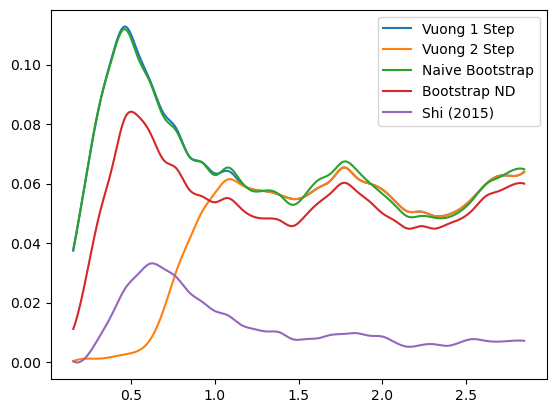

In [5]:
def create_fig(params,res,name='test.png'):
    results2 = np.array(res)
    
    col_labels = ['Param','Vuong 1 Step','Vuong 2 Step', 'Refinement Test','Shi (2015)', 'Naive Bootstrap','Bootstrap TIC','Bootstrap ND']



    np_results = np.concatenate((params.reshape(params.shape[0],1),results2[:,:,0]),axis=1)
    df_results = pd.DataFrame(data=np_results,columns=col_labels)
    df_results.to_csv("paper_figs/"+name[:-4]+".csv")
    
    ma2 = lambda x : np.convolve(x,np.ones(smoothing)/smoothing, mode='valid')
    params_new = np.linspace( ma2(params).min(),  ma2(params).max(), 300) 
    interp = lambda x: make_interp_spline(ma2(params), ma2(x), k=3)(params_new)


    plt.plot(params_new, interp(1-results2[:,0,0]) ,label='Vuong 1 Step')
    plt.plot(params_new, interp(1-results2[:,1,0]) ,label='Vuong 2 Step')
    
    if not skip_boot:
        plt.plot(params_new,interp(1-results2[:,4,0]),label='Naive Bootstrap')
        plt.plot(params_new,interp(1-results2[:,6,0]),label='Bootstrap ND')
        
    if not skip_shi:
        plt.plot(params_new,interp(1-results2[:,3,0]),label='Shi (2015)')

    plt.legend()
    plt.savefig('paper_figs/'+name,dpi=300)
    plt.show()

name = 'size_nobs%s_c1%s_c2%s_trials%s.png'%(nobs,c1,c2,trials)
create_fig(betas,results,name=name)

# Power stuff

-0.04048673946753591 0.003931460483295757 0.05802994326783522
-0.059010032225904514 0.003931460483295757 0.03947876419562069
---
-0.04468914841147326 0.004836425389038487 0.06633179944252403
-0.06737000810351139 0.004836425389038487 0.0436786031838624
---
-0.02068410265591265 -0.010150509965519153 0.051371985675100484
-0.04959018312601971 -0.010150509965519153 0.022510489968088906
---
-0.02932641285986746 -0.005247155975173418 0.05235903236122387
-0.051381843885201846 -0.005247155975173418 0.03032338636297955
---
-0.007079940733187811 -0.009285720095224114 0.02779772383852314
-0.027457186333800974 -0.009285720095224114 0.007433381232041805
---
-0.009562838137042522 -0.008556368058372659 0.030202031083298633
-0.029144771626417362 -0.008556368058372659 0.010636640814375313
---
-0.040072941357958684 0.003745918681107941 0.062217687292160935
-0.06029721104439408 0.003745918681107941 0.042032362556737514
---
-0.02746246240243242 8.104952369425254e-05 0.045239817483108104
-0.0452372026105178

-0.008666453379301862 -0.011783841431444545 0.027997749185867952
-0.03172975220022349 -0.011783841431444545 0.004929263875194301
---
-0.036696676345068686 0.0028577945791893756 0.0652882815142773
-0.057894074943185526 0.0028577945791893756 0.04411439755731996
---
-0.034476430825237596 0.0002038984710953638 0.055273496465727184
-0.054111828109368765 0.0002038984710953638 0.03565190272957281
---
-0.0817776072544003 0.028779626421681158 0.09810386515062103
-0.10456269150265124 0.028779626421681158 0.07526051521319842
---
-0.047944409001872725 0.001403851305659326 0.0735746370330117
-0.07503482558372802 0.001403851305659326 0.04646218182393596
---
-0.01713834345037465 -0.009145556347290728 0.041196939189181325
-0.04123533073714058 -0.009145556347290728 0.017094105857345825
---
0.005188363447422499 -0.01636013964682562 0.0227433174905613
-0.022754091539836055 -0.01636013964682562 -0.005193431042690143
---
0.007887267814681753 -0.013652627154129867 0.01652785128391782
-0.01660991651690915 -0

-0.007917235770666104 -0.01680322863309594 0.03839475113513614
-0.03639255742855587 -0.01680322863309594 0.009952899151104805
---
-0.032040985908559756 0.00017251834726189313 0.05640898384909476
-0.05318108587251098 0.00017251834726189313 0.03533489221135487
---
-0.02913859746497458 -0.0014803815727067347 0.04531265330203943
-0.048107791546984205 -0.0014803815727067347 0.026316139165652667
---
-0.028727519557909725 -0.00031174355753797424 0.04592986493556868
-0.046326785783374035 -0.00031174355753797424 0.02840821454228083
---
-0.0764985380434948 0.018701489525857398 0.10734325786734317
-0.10350962019342992 0.018701489525857398 0.0800991262214392
---
-0.004767728308219835 -0.00871010179658768 0.024594768137839236
-0.023270437978028347 -0.00871010179658768 0.00609614972837861
---
0.005029590641537962 -0.017864864371247607 0.024965120400090694
-0.025909060289509588 -0.017864864371247607 -0.005968943480788532
---
-0.10166346368213437 0.04941177363261748 0.12254170874715907
-0.123941425334

-0.08804164472710393 0.030074701211265223 0.11891878674093381
-0.11536102442610094 0.030074701211265223 0.09131354448848276
---
-0.01782316363019399 -0.0059922006095850895 0.039253172720017625
-0.03834128619709989 -0.0059922006095850895 0.018725477309158623
---
-0.01994029256833658 -0.006920333659737831 0.04193089619015197
-0.04194933447486076 -0.006920333659737831 0.01987155281157889
---
0.008488861712253241 -0.013161156094173655 0.015204193582755921
-0.015571731178068917 -0.013161156094173655 -0.008857471998577917
---
-0.06375076648351433 0.019448568029579717 0.08559975364541547
-0.08626469677918887 0.019448568029579717 0.06316819329318078
---
-0.07000779368365062 0.018420215488695345 0.08502499346077878
-0.09258407880490274 0.018420215488695345 0.06232209335060201
---
-0.011012425888569164 -0.010441874011668763 0.03680242622620206
-0.03541671250010137 -0.010441874011668763 0.012415876711277926
---
-0.009451405565034425 -0.010666126043420883 0.034652464925800264
-0.033896692621209625

-0.023974359684230798 -0.005743648366121722 0.04415751926533259
-0.04558961111672124 -0.005743648366121722 0.022545512600254128
---
-0.01917393569529516 -0.007699577202179093 0.043488008959517516
-0.041265264224280056 -0.007699577202179093 0.021323387696680424
---
0.006633028526561307 -0.011868434994778429 0.014777830525529069
-0.014715268454320586 -0.011868434994778429 -0.006570765299687501
---
-0.017823476246044485 -0.007868720883407784 0.036454875357294025
-0.03961359651893301 -0.007868720883407784 0.01465698659042089
---
0.007675139972057457 -0.014140138216701568 0.015948314338609514
-0.015623139191233454 -0.014140138216701568 -0.007338036083621865
---
0.004400405038325099 -0.013026285141004543 0.020495559548287162
-0.020268942156722338 -0.013026285141004543 -0.004173939259379234
---
-0.04543455663103183 0.007265979575149718 0.0650666239789988
-0.06531371808424759 0.007265979575149718 0.04518308230342165
---
-0.017493590087688284 -0.0077478260617854615 0.03798099097127639
-0.038941

-0.10287333824821211 0.04071069559660714 0.11302360248459452
-0.12445934257069353 0.04071069559660714 0.09134055137322769
---
-0.010977957213140372 -0.008449133242381116 0.030690242951518145
-0.03156433051430363 -0.008449133242381116 0.010081309792762932
---
0.00404165316663607 -0.011289513110650396 0.0170486584055603
-0.017035970227737975 -0.011289513110650396 -0.00402306162043218
---
-0.10648759784786166 0.05152037096069666 0.12620363134066817
-0.1293273414151389 0.05152037096069666 0.10328664879515582
---
-0.005067484915340006 -0.008482151254189621 0.022142770003410646
-0.022835271384441178 -0.008482151254189621 0.004371544395514411
---
0.006204200762287879 -0.014550982783309373 0.020343880329960467
-0.020334320206836218 -0.014550982783309373 -0.006205250843039431
---
-0.013063734684449694 -0.007675713244980298 0.03307259390589566
-0.03195810852114576 -0.007675713244980298 0.01417386555280958
---
-0.005754243687897077 -0.00936238077338539 0.024452126744718743
-0.02560547387193247 -0

-0.010800189156805954 -0.009795873151474252 0.03113177756129177
-0.0331189707827748 -0.009795873151474252 0.008818133452349787
---
-0.0170230951857369 -0.007013784786301175 0.04091149108912049
-0.03848494831796684 -0.007013784786301175 0.0194518667647621
---
-0.017789168523684992 -0.009026076555804284 0.04274718786544365
-0.04191516976286641 -0.009026076555804284 0.018648356368158394
---
0.0041013433806072865 -0.013669351581936261 0.020865293457266156
-0.021489042635419467 -0.013669351581936261 -0.004733906258463161
---
-0.0032901274940476677 -0.010963867803340644 0.02615237421131411
-0.025675915303767092 -0.010963867803340644 0.0037752089313678088
---
-0.05582806920921561 0.016621605301584734 0.08335660122228021
-0.07692545819842882 0.016621605301584734 0.06214138053927169
---
0.010474791993720119 -0.012456685731629143 0.01250712097817407
-0.01249739834651973 -0.012456685731629143 -0.010467570383919609
---
0.004089846595710024 -0.010809544373301134 0.016702328683457075
-0.016276569144

-0.049667547576463356 -0.0017183673554829406 0.07907992161239376
-0.07990085356192878 -0.0017183673554829406 0.04894436862721587
---
-0.026859766330639682 -0.0037064393452625258 0.042693104571109426
-0.046673445185597864 -0.0037064393452625258 0.022930248946052723
---
-0.013748756511084596 -0.00852772130037368 0.035118675384055255
-0.03550968129397946 -0.00852772130037368 0.01338757182294995
---
-0.0018402345901542374 -0.009567356276454525 0.021547458486274443
-0.021119290078832897 -0.009567356276454525 0.0022812034764452503
---
-0.1059807485161725 0.050321711084905234 0.11980036989153851
-0.13025873856389755 0.050321711084905234 0.09547613282414318
---
-0.0678790285215047 0.02491847119782359 0.09471653715163512
-0.08939935496672885 0.02491847119782359 0.07314277117426413
---
-0.01782663699886739 -0.007830049170243578 0.037696118803776275
-0.04036828397423445 -0.007830049170243578 0.015141227996674602
---
0.010683930800110462 -0.013429745619369004 0.014131845302945364
-0.01418460342642

-0.0039971214513030194 -0.008969486932820582 0.021931563777082396
-0.0224003541941962 -0.008969486932820582 0.0035352538157739856
---
-0.049945828695012205 0.009955518301600758 0.05911724215628386
-0.06756402235774493 0.009955518301600758 0.0415009435133088
---
-0.040263771831305 0.0023690173214541716 0.06982439499446694
-0.06369308114934238 0.0023690173214541716 0.04651733301957147
---
-0.02020420725755722 -0.00933828626055857 0.04386649818234781
-0.04514329964685899 -0.00933828626055857 0.018929398291855307
---
0.004253347669032051 -0.010232652107442456 0.01472651409498243
-0.015086377757045605 -0.010232652107442456 -0.004615357317149737
---
-0.009152717261811686 -0.012286708051302095 0.03879534425421267
-0.03669883783491754 -0.012286708051302095 0.011250028664327822
---
-0.03565809104591703 0.0010926046426540704 0.05542907029989538
-0.05536971308062035 0.0010926046426540704 0.035726650517246744
---
-0.024581531411558562 -0.006853466291888533 0.052071757877001724
-0.04942474371912152

-0.040523413168569763 0.0016754496359464124 0.06748537418360141
-0.0621831144966458 0.0016754496359464124 0.04576805169968128
---
-0.03866385058033074 0.00021888862326838724 0.05689191415065582
-0.06012391328745233 0.00021888862326838724 0.03533950263282961
---
-0.006040084989020954 -0.010291994493466126 0.02957436531565506
-0.028622532521287995 -0.010291994493466126 0.007016667637225139
---
0.0074827522483440975 -0.011999933451839546 0.012906928277009214
-0.013047200996096915 -0.011999933451839546 -0.007619711232261942
---
-0.028511154692610417 -0.0030026785249188796 0.05519791804641493
-0.051202941262608194 -0.0030026785249188796 0.032466995867569765
---
-0.07378625800961919 0.024511657986883997 0.09640163565377013
-0.09532313534885395 0.024511657986883997 0.0748462202211719
---
0.004553748014262976 -0.018168167501843215 0.019381326291159358
-0.01943862107086754 -0.018168167501843215 -0.004597471381637601
---
-0.034510595340983635 0.0033981249459285943 0.054781074331424796
-0.0542766

-0.04027216469451287 0.0022429201447832724 0.06392452359066815
-0.061623545003915946 0.0022429201447832724 0.0424906416926996
---
-0.04938796541881454 0.003216447963121046 0.07274143318846409
-0.07509001663009529 0.003216447963121046 0.04701309774176184
---
-0.02628520734630943 -0.001585439993591322 0.04505266550486745
-0.04420557784218378 -0.001585439993591322 0.027117640919846746
---
-0.010535046086653494 -0.011382369178423508 0.03559336488895036
-0.03586461408967317 -0.011382369178423508 0.010234471647557907
---
-0.03437929403411482 -0.004572459836322829 0.06362151080017028
-0.0616771601045735 -0.004572459836322829 0.03633638963619765
---
0.0025177534800502606 -0.012930991144523783 0.021911538588749273
-0.02165425927415728 -0.012930991144523783 -0.0022884869655479647
---
-0.00503723665899374 -0.010684274976318749 0.02887598748432448
-0.026924611693458007 -0.010684274976318749 0.0069554759428799235
---
-0.024911315090809006 -0.005457074205369464 0.04366763246902327
-0.046556053997719

-0.0395297452886998 0.0030074031033303834 0.06164847840969081
-0.05921340151692327 0.0030074031033303834 0.04192520623679639
---
-0.05288356021199877 0.006707532908059988 0.07187566207501175
-0.07543766918763632 0.006707532908059988 0.04935311967064891
---
-0.029252644179890687 -0.001732963338733499 0.05030638250523827
-0.04959768703033316 -0.001732963338733499 0.02994919347895112
---
-0.005074383745765578 -0.010306629434344915 0.02676399690316256
-0.026502415354996225 -0.010306629434344915 0.0053410545687049655
---
-0.07247479706291039 0.02981403583670655 0.09311827363866174
-0.0927792929443824 0.02981403583670655 0.07267434014489992
---
-0.008836841673289323 -0.009404618984316843 0.028851956348932957
-0.029930970532309812 -0.009404618984316843 0.007749363257944503
---
0.004025670131819648 -0.020297956309953152 0.023240805012420273
-0.023112912337736404 -0.020297956309953152 -0.0038869509601241834
---
-0.0688918622983085 0.012040270122096752 0.09034351500116951
-0.0952933147611604 0.0

0.0010095069451656988 -0.013168135857283214 0.021093547939398355
-0.0203704579794989 -0.013168135857283214 -0.0002952189803775289
---
-0.06789182160841278 0.03046083169894817 0.1011438010104187
-0.08858948180684499 0.03046083169894817 0.08021923206463387
---
-0.027572178569925446 -0.0030277535311377325 0.05013522002481064
-0.049211188771157696 -0.0030277535311377325 0.02851681172032799
---
-0.04226632172281215 -0.005738539245090039 0.07513483278143222
-0.07330416366243346 -0.005738539245090039 0.04401038662755871
---
-0.03172420526121726 -0.007216172281256483 0.06272756693663835
-0.05996744795688892 -0.007216172281256483 0.034418899572453365
---
-0.08104632196023259 0.03385108937772965 0.10838077619195531
-0.10421924032968778 0.03385108937772965 0.08521607634514768
---
-0.05123983552497878 0.005313051785675588 0.07928926941356022
-0.0764763747643957 0.005313051785675588 0.054068268041024006
---
-0.11364037011000477 0.06424382610428651 0.14099675355847024
-0.13592190439262206 0.06424382

-0.017982993252704867 -0.015783077405017273 0.05161997490670475
-0.04944101401497647 -0.015783077405017273 0.020232372478823146
---
-0.17379505108447796 0.14636356558345684 0.19963519061748466
-0.1998698646263127 0.14636356558345684 0.1733948148803378
---
-0.02189661999717418 -0.008931601210112935 0.03985956246530113
-0.04238530243481316 -0.008931601210112935 0.019363958022411403
---
-0.12376844218894946 0.09983436745077293 0.14669850221799507
-0.1427555505856567 0.09983436745077293 0.12779334483731467
---
0.005696086619131564 -0.013449705623875548 0.02027635467602603
-0.01969051504488144 -0.013449705623875548 -0.005125342432543532
---
-0.04300853434202393 0.006155915006131243 0.06044615300798101
-0.061870862260586204 0.006155915006131243 0.041568559435684854
---
0.0022819528392883583 -0.012564963546048864 0.0208195649761585
-0.020740289349215495 -0.012564963546048864 -0.0021817778307416965
---
-0.0640901698291088 0.011889270096219762 0.07836507984732079
-0.08643798787198567 0.01188927

-0.03411803390741908 0.002693010003079912 0.05304538543029779
-0.053662846217517025 0.002693010003079912 0.03342544131146084
---
-0.041065629260886326 -0.0014956002430003385 0.06371997503541499
-0.06481409212502293 -0.0014956002430003385 0.04010770683454624
---
-0.007360382963047175 -0.011031523379192904 0.03367714935379922
-0.03167968439865856 -0.011031523379192904 0.009394537713708948
---
-0.017314743638818856 -0.007205942826740892 0.03582331942904746
-0.03751178969325693 -0.007205942826740892 0.01560956911079374
---
-0.06451337533070382 0.01900891922663084 0.08402771207210431
-0.08479841515326719 0.01900891922663084 0.06387505913476743
---
-0.11566512208755284 0.05848951047994406 0.14296080805369413
-0.14221773848335922 0.05848951047994406 0.11633253937361378
---
0.003787952160863964 -0.013782984124931048 0.02233950081178168
-0.022514306632522723 -0.013782984124931048 -0.003958971956033748
---
-0.0655311469416943 0.017714804627687434 0.08550311840079468
-0.086873816470239 0.01771480

-0.08508557963242706 0.029248269805524172 0.12140275080974214
-0.1100658203534782 0.029248269805524172 0.09660838341872728
---
-0.03581142042800812 0.000712034333096595 0.05317222533704649
-0.05552171749802432 0.000712034333096595 0.03352509128035601
---
-0.01054662799628132 -0.010492186190970719 0.036692903845056316
-0.03482612920380112 -0.010492186190970719 0.012457436807918429
---
-0.032677406384014465 -0.0028996651377042803 0.05926873422650404
-0.05592110736143591 -0.0028996651377042803 0.03596827188335909
---
-0.05570592527715436 0.006279719126658556 0.07936918316526045
-0.08133955557107445 0.006279719126658556 0.05381595344280189
---
-0.014531382679770525 -0.009048810162163813 0.0379572605029148
-0.03720212596602646 -0.009048810162163813 0.015281850023991515
---
-0.058314487074070574 0.014005164591600243 0.07463337384516802
-0.07893001949199324 0.014005164591600243 0.054177056088816684
---
-0.0432762436875664 0.0029189950024965453 0.0627252589515634
-0.06363649483850757 0.0029189

-0.021911857001414497 -0.004564016962368472 0.04799848229317903
-0.043481077625433504 -0.004564016962368472 0.026491442055168894
---
-0.10745455872095483 0.058270746082561074 0.13718411433233493
-0.13173712171805185 0.058270746082561074 0.11283210235679283
---
-0.03706543477015325 0.0021650072796739646 0.05759434411874612
-0.057770374813077535 0.0021650072796739646 0.03687410173196652
---
-0.01493092174918273 -0.007085280397317454 0.03238672849107361
-0.03251219004049399 -0.007085280397317454 0.014784727259183703
---
-0.06884513594003629 0.012434147833303108 0.0922306419203203
-0.09236872933635634 0.012434147833303108 0.06866940603206938
---
-0.0357945489912536 -0.0027370733126692594 0.058065350730803766
-0.05866050255677839 -0.0027370733126692594 0.03516195007230386
---
-0.029274671671485245 -0.00174965731116009 0.04820752403676928
-0.04940503607770791 -0.00174965731116009 0.028124095814820855
---
-0.05336534088774131 0.016064216415563163 0.06834986404295937
-0.0701974555796745 0.0160

-0.057988541327152913 0.012250257258609256 0.07600962239542657
-0.07894150884049946 0.012250257258609256 0.05506547364015751
---
0.009976773372739453 -0.014389917122674444 0.015471454801956738
-0.01545122961224176 -0.014389917122674444 -0.009956972638444332
---
-0.049668431953446 0.006227031349993708 0.07818189722455648
-0.07337984726712374 0.006227031349993708 0.05457709249777683
---
-0.12407708141802441 0.06724130939247511 0.14324857222364779
-0.14938260903460437 0.06724130939247511 0.11798251865573796
---
-0.02760027026931776 -0.0005789615877834298 0.045741428416810434
-0.04407748361010172 -0.0005789615877834298 0.029257949829092057
---
0.007240925362285619 -0.011586501142405014 0.01425400217422611
-0.01404384849387621 -0.011586501142405014 -0.007029938657683561
---
-0.03000135550788116 -0.00464602552109038 0.05081952321794848
-0.051859272630292025 -0.00464602552109038 0.028997994844295535
---
-0.012409526039257391 -0.010150433059357387 0.03714335452493724
-0.03495722427269808 -0.01

-5.8287332660489846e-05 -0.01291138331580407 0.020596575576412285
-0.0198560533109969 -0.01291138331580407 0.0008060069722600808
---
-0.009543481321229114 -0.00998695206274858 0.02862562239863527
-0.029431753241939838 -0.00998695206274858 0.008704534226944817
---
-0.00808999420913756 -0.00940657297037912 0.027021584426357177
-0.02797526092330394 -0.00940657297037912 0.007143962160087261
---
-0.05485138166569555 0.008254296455585603 0.07966255270800508
-0.07868157534094591 0.008254296455585603 0.05599559223817821
---
-0.0166748686341734 -0.008759263782563061 0.04141755991594289
-0.03956599160935546 -0.008759263782563061 0.018511730781258763
---
0.004729697236178807 -0.011581792385636615 0.014997880120733595
-0.014306350174683288 -0.011581792385636615 -0.0040444761940031555
---
-0.013634970706005285 -0.008550371763483722 0.037551979560978214
-0.03586371279362333 -0.008550371763483722 0.015335584393525014
---
-0.018552859439876897 -0.011293138873322846 0.04915666942523557
-0.0474058226744

-0.009696729760944876 -0.01506799098675927 0.03317660781079507
-0.0327007925092018 -0.01506799098675927 0.010151978867367073
---
-0.05781649430084659 0.025663000468875347 0.07445544546740754
-0.07406412706971001 0.025663000468875347 0.058194273875153905
---
-0.007808156062029335 -0.009832796212342386 0.028860228254678526
-0.0281967885052726 -0.009832796212342386 0.008475328725321777
---
0.0007673418863972224 -0.01513166334152587 0.02882332893034847
-0.028670780808138053 -0.01513166334152587 -0.0006341975408765758
---
-0.05893561427407725 0.012896169584615045 0.08144416426155719
-0.0828420110161806 0.012896169584615045 0.057485033916537066
---
-0.02954365777510358 -0.01040337184172712 0.05425562109403397
-0.05487680970884317 -0.01040337184172712 0.028906727518154363
---
-0.0185273010004293 -0.007561966807019743 0.03649154521773604
-0.03840325765806247 -0.007561966807019743 0.016640006475455174
---
-0.03957839530690243 -0.0007137566790918178 0.06899872741529003
-0.06349711778738178 -0.00

-0.06241364909226739 0.010269343333390945 0.08106824500310704
-0.08507597719805193 0.010269343333390945 0.0583352256958102
---
-0.017885165518936996 -0.009471168761393577 0.039652526790737164
-0.04137837076891844 -0.009471168761393577 0.016169272166659737
---
-0.026050374550179854 -0.005303047249519735 0.04750908500222664
-0.048571053212864146 -0.005303047249519735 0.025014591827286145
---
-0.032563425267157 -0.0012648757792216145 0.05097439080312352
-0.05241471272905225 -0.0012648757792216145 0.031047854206734258
---
-0.011962918276580534 -0.010608289394769743 0.034512097337257866
-0.03590586655473448 -0.010608289394769743 0.010592453020884483
---
-0.058902300772213846 0.009078228723024795 0.0776784210290906
-0.08204220668006298 0.009078228723024795 0.05462762156019207
---
-0.013143644537669029 -0.00732546317369436 0.030945121121975915
-0.03235320093794239 -0.00732546317369436 0.01170363079372771
---
0.0014498181816364098 -0.013374597486320501 0.026142163715463112
-0.02462706493130417

-0.054199823472313405 0.006265005381322497 0.08020895435186563
-0.07950555423988906 0.006265005381322497 0.05486309421650023
---
-0.04222833274367529 -0.002363426661698297 0.06958925590324619
-0.06949582790314209 -0.002363426661698297 0.042407321189964105
---
-0.05506560853771513 0.01326637447011919 0.07592653750028844
-0.07465258411642313 0.01326637447011919 0.056280624351979495
---
0.0060899906746744534 -0.009946629640364728 0.012163843865552297
-0.012177549124284922 -0.009946629640364728 -0.006107628711006146
---
-0.024560093812650428 -0.0046897342157204945 0.043397199377777036
-0.044708189783515415 -0.0046897342157204945 0.023229307593126244
---
0.0008009939787280572 -0.013310577814683274 0.023244956051410606
-0.023503816120298678 -0.013310577814683274 -0.0010657252195329322
---
-0.005102162369722367 -0.011270373851599192 0.0256074040034929
-0.026480576590785856 -0.011270373851599192 0.004221696742301064
---
0.003760336102717539 -0.015060254765427297 0.021756430695591585
-0.0217940

-0.022221072805104106 -0.006051949580426644 0.044364367786512225
-0.04412196812012371 -0.006051949580426644 0.022469964521601833
---
-0.000164881298800935 -0.01052980573684912 0.02007004372405834
-0.020563007040913066 -0.01052980573684912 -0.00033407086351566653
---
0.009968653944229904 -0.014484499269294567 0.015323152405956992
-0.015511917843458614 -0.014484499269294567 -0.010154820379003173
---
-0.006684133556202023 -0.010707953576891374 0.02806654283570954
-0.0286090823496074 -0.010707953576891374 0.006150764485158026
---
0.0069289157910978425 -0.01545963349244071 0.016699273919355884
-0.016602538745741833 -0.01545963349244071 -0.006835303037531001
---
-0.07954977304994588 0.027886895735426607 0.10941866692154684
-0.10385032477330651 0.027886895735426607 0.08521395202558003
---
-0.013045594726995216 -0.0134752751294225 0.04403010452324311
-0.04266164226306141 -0.0134752751294225 0.01442312373253836
---
-0.021099389392737686 -0.005148525188752467 0.040958853443305486
-0.040838620965

0.004809682918444415 -0.012375536554981222 0.016552157228878903
-0.01606069523097907 -0.012375536554981222 -0.004324341594296121
---
0.005009988560770833 -0.011529820271244147 0.01590273146595812
-0.01616066957479959 -0.011529820271244147 -0.005276369883395744
---
-0.020809600515752213 -0.01070621745592088 0.04482250427937553
-0.04489584937120382 -0.01070621745592088 0.020713552412386937
---
-0.026418257790501054 -0.005292037704418377 0.056911270813972736
-0.05118492110237137 -0.005292037704418377 0.03210982760805211
---
-0.044453580164054964 -0.0032215269980675454 0.07292640182364371
-0.07292977875178114 -0.0032215269980675454 0.04454462529764801
---
-0.03503045154952978 0.00014608381276113018 0.05309163658609048
-0.05549989214709565 0.00014608381276113018 0.03254177635102308
---
-0.005953134799640106 -0.008768887841878502 0.021210632428593765
-0.0236180173190717 -0.008768887841878502 0.0035364927004789552
---
-0.02566994102269751 -0.013737879791050255 0.05974279052092054
-0.056472179

0.004941878986858816 -0.016787972920471603 0.019075122295332796
-0.018911819731245786 -0.016787972920471603 -0.004781618272543813
---
-0.005209244216155878 -0.013542134858163255 0.030797657867057106
-0.029360889148684018 -0.013542134858163255 0.006624027797218311
---
-0.007776761157554506 -0.01090118284639509 0.025032009104335704
-0.02758921382000661 -0.01090118284639509 0.00522980331751765
---
-0.0013296283804054092 -0.01541873372940087 0.02733608965736653
-0.028928593866058564 -0.01541873372940087 -0.0002364999940170246
---
-0.06357265405061514 0.02033965437140853 0.08563185999942582
-0.08383157884936257 0.02033965437140853 0.0654398265032253
---
-0.050851367837229336 0.012904978048913752 0.07763252869948255
-0.07099975731739168 0.012904978048913752 0.05751762739907094
---
-0.07006478877327417 0.0191511726443289 0.09564684498397828
-0.09154668894587767 0.0191511726443289 0.07431421401575389
---
0.0016377437572968623 -0.012303968641589617 0.021754206010980198
-0.021862544896921726 -0.

-0.0277684369618815 -0.008805904989734003 0.0480428222132163
-0.04977940031499601 -0.008805904989734003 0.02606056377400034
---
-0.008355590430737227 -0.020950038713182927 0.03978440089950722
-0.03895329986609625 -0.020950038713182927 0.009177675968162843
---
-0.060979167960895225 0.01406226943223526 0.08701805742441003
-0.08457487892526536 0.01406226943223526 0.06343856892014854
---
-0.0027066928194994333 -0.01527385805575033 0.02518551434592218
-0.025469866263101503 -0.01527385805575033 0.002414400973852105
---
-0.04260061711179979 0.0024280511423454185 0.07103015674596667
-0.06581540282734828 0.0024280511423454185 0.04783200362948482
---
0.005761627270782887 -0.009751179986724765 0.011239990477595583
-0.011590314717323816 -0.009751179986724765 -0.00611033460668405
---
-0.04658408686325115 -0.002595045327003254 0.0757453519377501
-0.0725881452535273 -0.002595045327003254 0.04977197528791705
---
0.008015554205549476 -0.010945812166773957 0.01203907686762645
-0.012243749539809036 -0.01

-0.04627298127257253 -0.0011336040689042801 0.0689372270160876
-0.07489695837918244 -0.0011336040689042801 0.040254470050448285
---
-0.08578790659943895 0.02109518755142363 0.10564691666635405
-0.11281907096430316 0.02109518755142363 0.07831047759810282
---
-0.06934391168162353 0.01499269308716237 0.08897334485245463
-0.09294216508912377 0.01499269308716237 0.06532494893928013
---
-0.005998878939230114 -0.007973796070125168 0.023336384937368594
-0.023450688297205324 -0.007973796070125168 0.005866579234080842
---
-0.042436766176733386 0.0015746902893580507 0.06817413211780272
-0.06615438595132073 0.0015746902893580507 0.044544109131952614
---
0.003662574575579609 -0.01464809687228579 0.01822700328595099
-0.018673402314771194 -0.01464809687228579 -0.004125129000171293
---
0.008624984640970735 -0.012506581071627724 0.014546491828916956
-0.014684936583415825 -0.012506581071627724 -0.008759965218943736
---
0.0014775622157778682 -0.010433992780741367 0.018323673047585986
-0.01865904833481983

-0.030239344835845106 -0.0018892776852382602 0.04889353789282748
-0.050420033131010636 -0.0018892776852382602 0.028704189615314242
---
-0.009988318519408628 -0.010870960891210455 0.030512197746370692
-0.03199033603793184 -0.010870960891210455 0.008501737651267209
---
-0.032749977212894424 -0.0016012065630076244 0.053206716613254254
-0.054274010896971515 -0.0016012065630076244 0.031701647123483626
---
-0.05378967726325873 0.015998249774486918 0.07183640652227266
-0.07173984963287275 0.015998249774486918 0.05386457596852778
---
0.0023055051179986514 -0.013775044928616241 0.021035525853454293
-0.021198890875079337 -0.013775044928616241 -0.002470506086501381
---
-0.005580953787186329 -0.013291022743831872 0.02996068342685225
-0.030767189043329028 -0.013291022743831872 0.004748413730943781
---
-0.021757691216843886 -0.004717011880747374 0.04952948852267363
-0.042132065884360054 -0.004717011880747374 0.02917373508585303
---
-0.07172123037499308 0.031333045926241754 0.09042150380536082
-0.091

-0.006940361493816329 -0.01477811650099575 0.033240450790312945
-0.033001024365563396 -0.01477811650099575 0.007125700247064024
---
0.007114632127861596 -0.016479897674753007 0.017767389152905978
-0.017823255834216564 -0.016479897674753007 -0.00715985201299923
---
-0.10136339754425566 0.054236735241029656 0.12513098296493688
-0.12143226367368275 0.054236735241029656 0.10494144255234014
---
-0.006992628187022677 -0.010035518606577169 0.02771647042728947
-0.02730814583487691 -0.010035518606577169 0.007392971126227157
---
-0.0020337602639818562 -0.007582680035936386 0.016928990730316798
-0.017174775618160554 -0.007582680035936386 0.0017713039089684631
---
-0.01918425804407675 -0.007696541690810621 0.046016402754559906
-0.04237004007083291 -0.007696541690810621 0.022802605884473002
---
-0.004306227187977824 -0.009393766703799272 0.022369569750444296
-0.022600819757856674 -0.009393766703799272 0.004058666603061645
---
-0.055913366199526936 0.007674742151805785 0.06997560232741441
-0.0782122

-0.0318868312972541 -0.0020684180854629564 0.05445911471595522
-0.05308170118268197 -0.0020684180854629564 0.03322799480661415
---
-0.012375543383243941 -0.007623340338779006 0.03385098135163781
-0.0320805099876255 -0.007623340338779006 0.014158504086867358
---
-0.0008257467247940655 -0.01282107279322249 0.026884255641398513
-0.02594570653885896 -0.01282107279322249 0.0017333874242263976
---
-0.028123863217300083 -0.009508928431489597 0.05296203505330231
-0.05506683410744838 -0.009508928431489597 0.026048009130844273
---
-0.021996452182748476 -0.008920622629053264 0.046338641530242655
-0.04402060514442101 -0.008920622629053264 0.024326619634902305
---
-0.011347502963889393 -0.012929145752674535 0.03525433182011143
-0.03328794404402798 -0.012929145752674535 0.013274385006606663
---
-0.06081249970558158 0.014556006656472774 0.08455916596434358
-0.08166853912621791 0.014556006656472774 0.06361277619595114
---
-0.030320376320217616 -0.002607216910696251 0.04972583916260012
-0.0507770075485

-0.04968356587846191 0.0053850868339893904 0.06612110227965273
-0.07211212247926842 0.0053850868339893904 0.04372354532138646
---
-0.0732204535486629 0.023205733084187625 0.10534229630075406
-0.09706338298160418 0.023205733084187625 0.08164599610276402
---
-0.006213275284866593 -0.01171086784251191 0.03265389559413234
-0.031202646440104995 -0.01171086784251191 0.007656132798912107
---
-0.06750459583429443 0.013802339544520089 0.0897045906719147
-0.09293638388093653 0.013802339544520089 0.06423920237184305
---
-0.05356342370594801 0.008059413650324709 0.07581216666232117
-0.07627947442859011 0.008059413650324709 0.05295495717137285
---
-0.010124448693813686 -0.010956140308422508 0.03357523031088284
-0.03350398228298189 -0.010956140308422508 0.010180054529937668
---
-0.017422776943911665 -0.00851745804578842 0.04149599537941474
-0.03994514129707056 -0.00851745804578842 0.01901373632226033
---
-0.04799695197163812 -0.010053479276212689 0.08098349436186922
-0.0797116030130319 -0.0100534792

-0.04058938649710983 0.0004734324864693863 0.06598580621502333
-0.06422091134740149 0.0004734324864693863 0.042288913874678834
---
-0.02389138862778138 -0.005227404280021387 0.04161376182846304
-0.04380060733469262 -0.005227404280021387 0.021677938815967784
---
-0.08027821862553323 0.028413223460637353 0.09948855388700639
-0.10363498293347902 0.028413223460637353 0.07626662318387606
---
-0.02030508346883229 -0.005891454453944204 0.03896684272861579
-0.04038008809942508 -0.005891454453944204 0.01882648359031792
---
-0.05274372265537271 0.00793024505035458 0.06218213004874259
-0.07183037883782188 0.00793024505035458 0.0430477693965271
---
-0.014532541833957724 -0.012436498610288336 0.04155543819981272
-0.040540270072820406 -0.012436498610288336 0.015615745600689594
---
-0.03713987475840318 -0.0021724898272838795 0.06216234970483559
-0.05901720657649894 -0.0021724898272838795 0.04028845542976953
---
-0.14978407618876596 0.09137065995510257 0.17148471991182085
-0.17744903504669568 0.091370

-0.015399454565256506 -0.009654804189355399 0.039477196837967674
-0.03854119083111874 -0.009654804189355399 0.016301203553063772
---
-0.023313470904228875 -0.0015738316294717344 0.03953375150390055
-0.040012553864495114 -0.0015738316294717344 0.022816926459285295
---
-0.04978406880778534 -0.0005866392633658641 0.075220278839722
-0.0784239575903553 -0.0005866392633658641 0.046587341722626345
---
-0.01796138446086494 -0.00607564984841797 0.03626212260219964
-0.036475430907695 -0.00607564984841797 0.01773647853306461
---
-0.026241146747915108 -0.004897014226904604 0.04747484443874585
-0.04595852310143057 -0.004897014226904604 0.0277519560619528
---
-0.011610741291642832 -0.009181833449099638 0.03137013115976225
-0.03304708776518468 -0.009181833449099638 0.009905186097472157
---
-0.03967352927217821 0.0036380013217403788 0.06106417615873266
-0.05918635066301468 0.0036380013217403788 0.04152612199069887
---
-0.04315348351120892 0.006997731415077995 0.06953112817304767
-0.06354288310791766 0

-0.07155317548112756 0.03341962590176044 0.08866336935237086
-0.09022215564148423 0.03341962590176044 0.07007770825176643
---
-0.006310996495675775 -0.01162966788116979 0.026074568555790094
-0.026202541782214653 -0.01162966788116979 0.006189407911552525
---
0.004349018535571447 -0.01275861575406322 0.018243168166254323
-0.018411934421560618 -0.01275861575406322 -0.004517880531485193
---
-0.018803157254473003 -0.016857957521830103 0.04099588215564143
-0.04063669699081966 -0.016857957521830103 0.01911962194158328
---
-0.06640844046849716 0.01676243279582964 0.08889091478165645
-0.08846759752682783 0.01676243279582964 0.06686186906355567
---
-0.04917426665793062 -0.00577903618192436 0.06999291765152747
-0.07769786865973843 -0.00577903618192436 0.04138561973792283
---
-0.07081500857621682 0.030138948535661413 0.08765470301553348
-0.08842372781594082 0.030138948535661413 0.07004983825346488
---
-0.013070815693432358 -0.012219953855248399 0.0359333867623005
-0.03544655937340793 -0.0122199538

-0.02535199471747088 -0.007319317985396515 0.04274938919353306
-0.04438810288808102 -0.007319317985396515 0.02370100623494374
---
0.003978875104300767 -0.014322619218876483 0.01877111168591125
-0.018866205002202895 -0.014322619218876483 -0.00405565674744375
---
-0.01455247114551773 -0.02112301089803606 0.03596955123612893
-0.038137293711385356 -0.02112301089803606 0.012359344832268655
---
-0.02256859615291742 -0.011944390258865437 0.04578794968547869
-0.04806331334768871 -0.011944390258865437 0.02024120851078605
---
-0.05941009069843725 0.01809994275742286 0.0860824881628829
-0.07958654450037046 0.01809994275742286 0.06584805457006773
---
-0.005424093647006084 -0.011943728279190826 0.02768931052588489
-0.02761776392319692 -0.011943728279190826 0.005508647639627285
---
-0.04654804588105446 0.000991366429270372 0.06803054176310276
-0.06809448197820106 0.000991366429270372 0.046423141606487986
---
-0.01848091811914033 -0.01595486871997809 0.04184610743593646
-0.042693874197471594 -0.01595

-0.019581495481934816 -0.00998297051401862 0.04212225126660309
-0.041854286599931775 -0.00998297051401862 0.01978726132311706
---
-0.002921207784271746 -0.012979171218275014 0.02523431987017621
-0.024802887374406377 -0.012979171218275014 0.0033356135770781356
---
-0.0033629385517845857 -0.012833500367070882 0.02632762357933913
-0.02697271077027828 -0.012833500367070882 0.0027072970019883483
---
-0.027541460231215727 -0.005799928579361711 0.04875269725169128
-0.05052539165781192 -0.005799928579361711 0.025734941886582183
---
-0.07199666649980146 0.025180033734733497 0.09398170319591699
-0.0936244798896333 0.025180033734733497 0.07219573738345504
---
-0.01704584204276867 -0.010142347489919335 0.0402781303207924
-0.03902494234123762 -0.010142347489919335 0.01827656625764925
---
-0.04939754918531238 0.0041115757765346345 0.07202348076319917
-0.07392343144747343 0.0041115757765346345 0.04749143220397253
---
-0.09177113015362728 0.043395180155597984 0.10928815603289341
-0.11292778727908213 0

-0.050749884187580856 0.009306681840289759 0.06932173575717498
-0.07006620043921152 0.009306681840289759 0.05004914415532191
---
0.004403236717496486 -0.015241784211075714 0.019188971848731882
-0.019103599151995332 -0.015241784211075714 -0.004303175606083485
---
-0.02734471567841582 -0.0028487698930494683 0.04554494148658897
-0.045936372657284806 -0.0028487698930494683 0.027008503474944903
---
-0.035950741308493045 -0.002289499113809559 0.05927084999586749
-0.058498080082805874 -0.002289499113809559 0.03672461393021283
---
0.0031990724222366765 -0.014328175943697978 0.02041786607788992
-0.01938054598014237 -0.014328175943697978 -0.0021605400313294714
---
0.0022462430828444333 -0.015272886040681236 0.0197031981835319
-0.0190607865483756 -0.015272886040681236 -0.0015926718685126988
---
-0.02843648317645521 -0.008500575451678982 0.052735127461348626
-0.0533044010355474 -0.008500575451678982 0.027845468196869658
---
-0.13298654152078834 0.09186382079043046 0.1473609310731667
-0.15560092043

-0.04832072396653141 0.0002084450955789545 0.07804927204548513
-0.07351008870079459 0.0002084450955789545 0.05280887902423056
---
-0.029657731938326548 -0.003257754927828487 0.0484961045447879
-0.05073105574365527 -0.003257754927828487 0.02745297454157637
---
-0.021437409315503 -0.010609620301177002 0.04411445297360098
-0.04329936485066039 -0.010609620301177002 0.022255189382455954
---
-0.019027042699877924 -0.010963011098864706 0.04079100125566749
-0.040182442719732314 -0.010963011098864706 0.019609360377202085
---
-0.011327792205327675 -0.011760986679361762 0.034786606870870845
-0.03552307940417197 -0.011760986679361762 0.010559195501218107
---
-0.08901958203349955 0.017848008871402195 0.11088069473984746
-0.1155603414055089 0.017848008871402195 0.08441797528707927
---
0.006643319770918724 -0.010401416655464563 0.010951623898269957
-0.010893595988508151 -0.010401416655464563 -0.006584462442375385
---
-0.005608768433112122 -0.013946256479121106 0.03389108687538049
-0.03163440881105287

-0.09085710331230354 0.02903281069575964 0.12646995387367094
-0.11478892835021565 0.02903281069575964 0.10264353466322801
---
-0.20609291116288822 0.21722934724049084 0.2465365694706442
-0.23503808613422525 0.21722934724049084 0.21858922033530218
---
-0.03696298504689586 -0.0020888577902705113 0.05511226147705832
-0.058121298371003424 -0.0020888577902705113 0.03391238075968014
---
-0.009947733809361014 -0.016070587773396507 0.03387923711055679
-0.03307411304525702 -0.016070587773396507 0.010737607977577886
---
0.008863829763243318 -0.017853036943717385 0.019026711209958923
-0.019375545250775818 -0.017853036943717385 -0.009220241860460422
---
-0.06373818779545798 0.01914438454091177 0.08012963954483862
-0.08393075423627591 0.01914438454091177 0.06001703562654718
---
-0.025405138865280848 -0.0032366323178998034 0.05016249698119452
-0.04600625317209714 -0.0032366323178998034 0.029555419011719306
---
-0.030333940206547137 -0.007274354666736734 0.05147473073282077
-0.05226179777531799 -0.00

-0.041632505595144045 -0.00033969607190737107 0.06857166400646088
-0.06662158346973458 -0.00033969607190737107 0.04363585079249998
---
-0.01935496378916711 -0.010896017120190008 0.0442699735260581
-0.044497317754866615 -0.010896017120190008 0.01913772997590805
---
-0.014939440129312353 -0.014545964167905075 0.039261008444489216
-0.03827683987325436 -0.014545964167905075 0.015963916460030994
---
-0.056957991293595946 0.011378075964224584 0.08121607705289821
-0.07745668619226018 0.011378075964224584 0.060864141706228524
---
-0.0518127179868644 0.010092832928479907 0.07577987498333855
-0.07369284968256279 0.010092832928479907 0.05386787720088881
---
-0.03857108393319761 -0.004776646559684016 0.06291148347556176
-0.06242569729351251 -0.004776646559684016 0.03896830227784453
---
-0.02754902531769761 -0.008541355902981856 0.0489872256493447
-0.0497038598935384 -0.008541355902981856 0.026881583850047113
---
-0.05146463344586804 0.0042154526216678055 0.08190031602159849
-0.075965642043368 0.00

-0.03229853733403266 -0.001769926448633345 0.0593908204830527
-0.05427915474094391 -0.001769926448633345 0.03749254630623756
---
-0.04684920408494901 0.004783877580885493 0.06459454733761157
-0.06747076277176751 0.004783877580885493 0.04394160874252416
---
-0.049640996787282565 0.010524734049626824 0.06566889640732664
-0.06719791166048554 0.010524734049626824 0.04813134082289462
---
0.007678217049837992 -0.013128181642468132 0.015490154021735134
-0.015240060650268058 -0.013128181642468132 -0.007426579332190149
---
-0.0012243034356406095 -0.009307034420261769 0.018654940426526854
-0.01858396794623731 -0.009307034420261769 0.0012879749019233762
---
-0.032828375207639794 -0.007034893489404119 0.06018503828478368
-0.060060628955092524 -0.007034893489404119 0.032926937735222844
---
-0.0742202571855025 0.012270638789395058 0.09651590897658004
-0.09897409920859952 0.012270638789395058 0.07171280967171542
---
-0.020739194509251935 -0.007426739572201877 0.03986148775834121
-0.04047893560524733 

0.005071326358476644 -0.016798292977218864 0.019850279914660197
-0.01925708179767575 -0.016798292977218864 -0.004480928178488185
---
-0.08668761730901348 0.03183941136948167 0.1184926537233411
-0.11068876090401757 0.03183941136948167 0.09449572334408364
---
-0.13625741822460577 0.11504797855577044 0.15212085238448078
-0.15768949200244683 0.11504797855577044 0.13063303359389186
---
-0.028728415000884355 -0.003990840215622759 0.05267922168160683
-0.05144504696261008 -0.003990840215622759 0.02996458004151313
---
-0.006854779803131606 -0.011369269667394846 0.029007129320101296
-0.029111235575239314 -0.011369269667394846 0.006747108794159953
---
-0.050448464995783135 0.0035147344562619074 0.07272700131796335
-0.07174437722314289 0.0035147344562619074 0.051514257531358014
---
-0.022138075600935475 -0.008364465272727594 0.04462477047027369
-0.04426412016231399 -0.008364465272727594 0.022435310543057023
---
-0.014705313322450538 -0.009036349273711303 0.032049038835956126
-0.032907213747843056 

-0.06860763400517397 0.009926568598925201 0.10253135816992683
-0.09606685933019442 0.009926568598925201 0.07523193528652566
---
-0.005400461844413788 -0.011313729250347076 0.02514441871030838
-0.025649956250413206 -0.011313729250347076 0.004888435897415579
---
0.0038465753418821776 -0.016862358844339568 0.016163820051833422
-0.01629295850972485 -0.016862358844339568 -0.003972931193594592
---
-0.014584288977227081 -0.006352920857897079 0.03168427709611799
-0.03125469084073556 -0.006352920857897079 0.015048765142442369
---
0.006515194609293385 -0.017409199143997137 0.0194545859821603
-0.019136014014374966 -0.017409199143997137 -0.0061987415161241285
---
0.0016871442532272916 -0.023760067443610006 0.026473344228907566
-0.026678466237023288 -0.023760067443610006 -0.0019204100217020206
---
-0.04714882175038015 0.0031044994028163676 0.07160390140019436
-0.06863503806095476 0.0031044994028163676 0.05022075900854176
---
-0.019482874118632146 -0.013344818970120013 0.04295884481893379
-0.0458257

0.006708238979810417 -0.012151181561220307 0.012965369234724035
-0.012703812807907786 -0.012151181561220307 -0.006448113341505181
---
-0.05883098017782144 0.009566024025790827 0.0688439995613486
-0.0784280818425883 0.009566024025790827 0.0492203773501707
---
0.0027793936799392406 -0.013217672831635507 0.019485412318470795
-0.019369453341297686 -0.013217672831635507 -0.002676108380671503
---
-0.005889253541853951 -0.012112553179541614 0.03009139351003203
-0.029336202062069355 -0.012112553179541614 0.006644008047641113
---
-0.01818642190320743 -0.008651048319725931 0.03859801964275924
-0.0388039346678529 -0.008651048319725931 0.01801379340380079
---
-0.009014995143376812 -0.015801712824577267 0.03209836059584597
-0.029812233364835256 -0.015801712824577267 0.011343035570145921
---
0.0015890823835510177 -0.014082790534258717 0.01918537495788305
-0.019704809242183666 -0.014082790534258717 -0.002095276577481067
---
-0.016202520663644988 -0.011036798433331154 0.039640410989890754
-0.039060916

-0.042259769913869975 0.004100709061927687 0.06309242050861122
-0.06474980596571303 0.004100709061927687 0.04066758712841941
---
-0.05223119182942521 0.013294537499651765 0.07668206120053496
-0.07222853506823697 0.013294537499651765 0.05667305341328908
---
-0.017095254227551086 -0.01049152388165182 0.041386084692695134
-0.038100853791164936 -0.01049152388165182 0.020357599695209887
---
-0.007761576929533546 -0.016909929047797468 0.03313377883254048
-0.034282916141884494 -0.016909929047797468 0.0065777588195489916
---
-0.016840711140040123 -0.012168421152885583 0.044226412001616214
-0.04296613872069785 -0.012168421152885583 0.018089054349851644
---
0.00809377837384413 -0.016282692926206144 0.019840166403139858
-0.020268259610505365 -0.016282692926206144 -0.008533326323311498
---
-0.0022546310269002437 -0.014753133407885045 0.02573492874197687
-0.02667930330173813 -0.014753133407885045 0.001304848844771008
---
-0.0533744175175674 0.006052262710716819 0.07687772092140203
-0.07369053021479

-0.06322826125529486 0.011770607102482424 0.0830781377745489
-0.0886322659089732 0.011770607102482424 0.05778635758999512
---
-0.05899701090497583 -0.006067473987137016 0.08083477069406905
-0.08401226212013446 -0.006067473987137016 0.05586346439683692
---
-0.016841100141312283 -0.010028840012441184 0.03743517947279045
-0.03764094669089334 -0.010028840012441184 0.016610315440181343
---
-0.03115918199099221 -0.004469384193764958 0.05059362623606249
-0.05121052769642758 -0.004469384193764958 0.030575943712882473
---
-0.015630144092265673 -0.01763568632265383 0.038105314344403785
-0.03778820931483858 -0.01763568632265383 0.016013193800981332
---
-0.04545159719814088 -0.0007602940825994694 0.06817999834252189
-0.06552285818993057 -0.0007602940825994694 0.048122400992981235
---
-0.08340725792312324 0.03573719117603835 0.10579794261040229
-0.103656315513546 0.03573719117603835 0.0857226318620335
---
-0.02772613329140453 -0.009057506279349663 0.04795997180200002
-0.05045233873351615 -0.0090575

-0.0756446296124006 0.011595388427242781 0.09382615331989323
-0.0992183189827928 0.011595388427242781 0.07029584267655492
---
-0.042203343778396574 -0.0005350734000951907 0.06048470365782448
-0.06113470164653558 -0.0005350734000951907 0.041604007859988724
---
-0.04488133145643984 -0.010700715638508778 0.0740185743823854
-0.06987784537085688 -0.010700715638508778 0.04904389079499271
---
-0.05276117919124156 -0.001349334589915475 0.07642351037615787
-0.07608356491655029 -0.001349334589915475 0.05314262367059281
---
-0.008999390929664728 -0.009121329962715691 0.02619749925402505
-0.026242654250749044 -0.009121329962715691 0.00894030378772857
---
-0.029161116334640948 -0.010529942659141487 0.05787460315838558
-0.05397643368001306 -0.010529942659141487 0.03306608713296513
---
0.006926045925729762 -0.013987961171530219 0.014647522634630015
-0.014996918421642247 -0.013987961171530219 -0.007273343522799799
---
-0.02216853924566154 -0.00550699871984625 0.039960098441185164
-0.04050626946969946 

-0.12834208127578334 0.07740810129111254 0.15279773078520878
-0.15482383733056074 0.07740810129111254 0.12644547141196702
---
-0.004761233057545119 -0.017827159173515367 0.027034820127159874
-0.025694749139144445 -0.017827159173515367 0.006096088552332586
---
-0.04832448494082511 0.007295850751809225 0.06605004155883717
-0.0656965463021407 0.007295850751809225 0.04870643871459361
---
-0.035624583819515644 -0.012340861958427658 0.058939803308560856
-0.05768339540564108 -0.012340861958427658 0.03686239701262181
---
-0.03137079057634525 -0.012155637170437019 0.059429788410066686
-0.05945604845580648 -0.012155637170437019 0.031355529109519595
---
-0.04939330453492884 0.0034058477256767566 0.07157637235496947
-0.07390535149647796 0.0034058477256767566 0.04699559761707221
---
-0.01826133515253543 -0.019096051326590667 0.041002465153360555
-0.04333168947246246 -0.019096051326590667 0.015903324282923462
---
-0.026754971282289323 -0.009786842186485317 0.05094933566941894
-0.050977519496039715 -

0.00542206013437537 -0.012150418048443681 0.015545251836988697
-0.015672909349288076 -0.012150418048443681 -0.005546201215748037
---
-0.022654570709177917 -0.006906659554121332 0.043891526241371444
-0.04232677605559399 -0.006906659554121332 0.02417972159916041
---
-0.019301120882063476 -0.009852862130671727 0.04312512327790239
-0.04209201093997074 -0.009852862130671727 0.020306387974727138
---
0.004700434642433533 -0.014073279397925865 0.020128134726808147
-0.01968894131281097 -0.014073279397925865 -0.004258883659469953
---
-0.011264356431911657 -0.01762067824506529 0.038313922038939775
-0.03664037759266211 -0.01762067824506529 0.012954431236895495
---
-0.04274751045315435 -0.002432538885348708 0.06038077201458635
-0.06549247234146884 -0.002432538885348708 0.03761378716443044
---
-0.030332561883358315 -0.011466870448271963 0.045732073702580894
-0.05107473635901847 -0.011466870448271963 0.024992308126150897
---
-0.08066956093887917 0.019788407930298568 0.09699150068201574
-0.10142104336

-0.011129904150437096 -0.015312484755385077 0.033169105265083904
-0.03353538734678466 -0.015312484755385077 0.010835581669590469
---
-0.006825921065966776 -0.011681869090673402 0.025292859762008596
-0.026023199283134145 -0.011681869090673402 0.006083251745627619
---
-0.046135583529488246 -0.029306609847802062 0.08278210503502112
-0.07974455737835293 -0.029306609847802062 0.049219603211343076
---
0.0005463273334784849 -0.013849914587752235 0.019603262075176164
-0.01897790100196529 -0.013849914587752235 7.388997163381961e-05
---
-0.04968570050366024 0.004229931451467492 0.06985440697521685
-0.06905355219425904 0.004229931451467492 0.05046360448749595
---
-0.06721551171798408 0.014648678199055451 0.09030662353553857
-0.09204790497617253 0.014648678199055451 0.0656687788363663
---
0.006421544429170695 -0.012421318993283727 0.01334857239268145
-0.013153444023412389 -0.012421318993283727 -0.0062235804659891356
---
0.003272472463692046 -0.01640948329805568 0.016281218931416708
-0.016497647622

-0.09643813322828924 0.027594590919460777 0.13069990306984852
-0.12532632557843953 0.027594590919460777 0.10206896723778831
---
-0.005348539919160406 -0.01310775479786858 0.026283488189853654
-0.026634106692180644 -0.01310775479786858 0.004996482849503989
---
0.003951825834007029 -0.016897734188869914 0.018507085054384236
-0.018463305467731547 -0.016897734188869914 -0.003903016217103577
---
-0.08747736416389383 0.025875227172655568 0.11570357315278967
-0.11255947983413347 0.025875227172655568 0.09082028720425916
---
-0.05137023427440483 0.0017071896874432744 0.07741446758287769
-0.07833554584990458 0.0017071896874432744 0.05053679059033408
---
-0.04086483478508517 -0.004248613002356902 0.06782642425262049
-0.06501777011155288 -0.004248613002356902 0.04387274183141249
---
-0.03707489760788552 -0.004451217629323949 0.058967096518621566
-0.05739762979240893 -0.004451217629323949 0.038635178310371235
---
-0.1211319729242371 0.05026592168079905 0.1544162398378238
-0.15206526450379607 0.0502

-0.05194114448085307 0.0020818630407274177 0.07799218388881152
-0.07580441842964503 0.0020818630407274177 0.054180910549760646
---
-0.017692255450246733 -0.005715714901361473 0.036274745522101075
-0.03562273492136298 -0.005715714901361473 0.018360050813839335
---
-0.044369038733431315 -0.020407702779218096 0.06303956196562843
-0.07168399798705079 -0.020407702779218096 0.03563136525899998
---
-0.002888857359306744 -0.013787279348359532 0.023230329391585234
-0.024064464070767105 -0.013787279348359532 0.0020493668478662086
---
-0.000398165100813911 -0.02364696492408291 0.02233943780421935
-0.022074803146509312 -0.02364696492408291 0.0006712365005959487
---
-0.03859293744679048 -0.002008491410310763 0.059897020554933074
-0.05865579985710279 -0.002008491410310763 0.039874056935600345
---
-0.025540747507097724 -0.002618930316514217 0.04291493675689935
-0.04195366013764299 -0.002618930316514217 0.026508352416236457
---
0.0006198417128328519 -0.02063065778142781 0.018959403860645246
-0.0196244

-0.02053323761495219 -0.02509045327427411 0.04726430227785174
-0.0464020645424259 -0.02509045327427411 0.021446445742790414
---
-0.030031483481158097 -0.009191575952993237 0.0509993530700974
-0.05226972500744485 -0.009191575952993237 0.02874261092691267
---
-0.08288381218669442 0.02392481570317312 0.09666147691504948
-0.10375585688761776 0.02392481570317312 0.07574712786992051
---
-0.011733817734532016 -0.012771796023724092 0.02952917662860518
-0.03098822716001781 -0.012771796023724092 0.01027488454492692
---
0.001874125279969232 -0.016412058880043896 0.017940800137783722
-0.018584589120554818 -0.016412058880043896 -0.002523301483945819
---
-0.04571861351934747 -0.0010088138616603337 0.06458110698544003
-0.06918089011515488 -0.0010088138616603337 0.040986102782950326
---
-0.04438137398139229 -0.004390988962020384 0.0684920791448813
-0.0707319708690308 -0.004390988962020384 0.04215854467550499
---
-0.06087186774574413 0.017611593317392676 0.08564360715366988
-0.08081396213233397 0.01761

-0.14470386490938186 0.11221122893433944 0.17311799006987502
-0.16885055179009212 0.11221122893433944 0.14904838321177075
---
-0.06907011191842638 -0.004965579505095312 0.10183040159190712
-0.09720124218345706 -0.004965579505095312 0.07385778956385283
---
-0.009461337809716577 -0.007387425327440937 0.023429812490317368
-0.023831561877980533 -0.007387425327440937 0.009084127926710294
---
-0.055716925118120444 0.008173787421044085 0.08254965598412933
-0.07825206818455567 0.008173787421044085 0.05995403964737242
---
-0.004697297767392964 -0.010125424030813875 0.02360994811362513
-0.02294094560473138 -0.010125424030813875 0.005352916192078231
---
-0.00410359955263299 -0.012812528599916669 0.026011154210706246
-0.025916152561039865 -0.012812528599916669 0.00421701044004544
---
-0.07576475339608911 0.03217178245666916 0.08736790069548583
-0.0938070700626041 0.03217178245666916 0.06921568428242801
---
0.0007006313502995003 -0.015145185619720971 0.019744358349900577
-0.019621280685716905 -0.01

-0.13509677278788132 0.08201018218240469 0.13903466239213416
-0.15597228384258424 0.08201018218240469 0.11807622965347143
---
-0.0028423442080377876 -0.012444127921595296 0.0240670047621356
-0.023848860225124266 -0.012444127921595296 0.0030468254766174313
---
0.0008393961533641263 -0.01570975938917573 0.024090436334139147
-0.023910553666014835 -0.01570975938917573 -0.0006458580058020302
---
-0.0037769617259685315 -0.026435845893937465 0.03229669136360964
-0.03139651832879966 -0.026435845893937465 0.0046993508709787645
---
-0.036614455868729634 -0.009996270487514336 0.0592996115096609
-0.05873322298981776 -0.009996270487514336 0.03724836301066889
---
-0.045932142198347466 -0.0022052760343612005 0.06928142512235806
-0.07202702384557566 -0.0022052760343612005 0.04324179691653879
---
-0.018717476999774642 -0.012239388180985453 0.039464304234531074
-0.03945319803668944 -0.012239388180985453 0.01879889198515231
---
-0.007153544430566612 -0.02127760674992639 0.03552758087927223
-0.03402755284

-0.054832286504435473 0.010767464993794 0.06867822781354134
-0.07451171902222409 0.010767464993794 0.04902986924053175
---
-0.034972414901385473 -0.005083074502215703 0.051767745083030524
-0.054899908840754165 -0.005083074502215703 0.03177237664127181
---
-0.08834499304381484 0.0153776061337438 0.11324763261757533
-0.11467363270255605 0.0153776061337438 0.08705800417320428
---
-0.05541581753523148 0.008967453302195835 0.07875738324465584
-0.07673119091473077 0.008967453302195835 0.0575008386046609
---
-0.053265651091294684 -0.007131229905060744 0.08101638866501575
-0.08268287103818696 -0.007131229905060744 0.051679768824047706
---
-0.04131965477127439 -0.00521692412854072 0.06217096049916627
-0.06449440014225089 -0.00521692412854072 0.03911647573285133
---
-0.03480524039268385 -0.0026482679734976086 0.06517050903086709
-0.054962710926643475 -0.0026482679734976086 0.04502171114339554
---
-0.08816502262704058 0.0019112502110516536 0.11419851722637148
-0.11511460111499022 0.00191125021105

-0.01584132777967317 -0.01448742485947366 0.038606972701186404
-0.038229611235546954 -0.01448742485947366 0.01633726266077873
---
0.0008980773478065254 -0.014021551673038151 0.020160948004286233
-0.019235477270167542 -0.014021551673038151 1.6278964100515844e-05
---
0.0002433060270953482 -0.021377876771935138 0.022974434781059858
-0.022301884820386905 -0.021377876771935138 0.00043374272047609554
---
-0.013964831202500557 -0.0324606695680283 0.04636071675000494
-0.04624945699019551 -0.0324606695680283 0.013997320643714579
---
-0.005052169698518121 -0.016813599125414677 0.02666958670500861
-0.026510492488217668 -0.016813599125414677 0.005208582805430518
---
-0.0021573928131595147 -0.021683255989401427 0.027258180771557377
-0.02625864490344435 -0.021683255989401427 0.0031433380853505004
---
-0.010886241990173025 -0.016496568615381336 0.03270600155658965
-0.03149703562100025 -0.016496568615381336 0.012082700653633274
---
-0.02708448464770248 -0.023461974413289545 0.050041302774659534
-0.053

-0.0038457877788035917 -0.016376243093534464 0.022575451527761706
-0.02268049627673677 -0.016376243093534464 0.0037508290975410267
---
0.004644820568573655 -0.018153748757928186 0.018787195121500334
-0.019279347306014515 -0.018153748757928186 -0.005131928887215372
---
-0.054009048817540616 0.0016742526089696518 0.0830783249491048
-0.07798211850476666 0.0016742526089696518 0.05913502492442732
---
-0.03855716118437517 -3.440825922405434e-05 0.058113177616002376
-0.05905231188907422 -3.440825922405434e-05 0.037631042976228386
---
-0.04837858210743339 -0.0021770213006620915 0.06682271338278374
-0.0698095178888665 -0.0021770213006620915 0.04537890888148677
---
-0.04400004384688174 -0.015296502258681406 0.06828628300233033
-0.0700758617630247 -0.015296502258681406 0.04220521866934473
---
-0.06642714978738726 0.014885867338078652 0.09295964294907942
-0.08974456071714189 0.014885867338078652 0.06989506558052778
---
-0.07342348512453759 0.0018195349162266688 0.10693368647463675
-0.1041467264536

-0.019605331553157253 -0.014161804594776083 0.042960721880406526
-0.042591991307971325 -0.014161804594776083 0.019961585148192088
---
-0.0901557802099868 0.029339150868721253 0.11620320093987177
-0.114980285327323 0.029339150868721253 0.09151445888068559
---
-0.007512022961902289 -0.016427039104986847 0.030559816889720242
-0.030330567033452546 -0.016427039104986847 0.007720914270187177
---
-0.05600396571859672 -1.598121439376289e-05 0.07719795802980528
-0.08114836914364536 -1.598121439376289e-05 0.0522290024533896
---
-0.057832827446644995 0.004049600405283263 0.0794118042207816
-0.08127071824645782 0.004049600405283263 0.05606362623889125
---
-0.007383223516114291 -0.016635399379155313 0.02855539690196935
-0.028201059191062975 -0.016635399379155313 0.007743672845861464
---
0.0015585054250636078 -0.02106505826731878 0.02100644745440906
-0.020470763610345468 -0.02106505826731878 -0.0010163567912596328
---
-0.03541604537888826 -0.007783542338237182 0.060009291645604174
-0.058206283422667

-0.058029887451081064 0.006804037866039675 0.07846221312633285
-0.08076454217046017 0.006804037866039675 0.05575867232553303
---
-0.0071138144347872795 -0.013108753219535557 0.02792663062056079
-0.026666099211226688 -0.013108753219535557 0.008388140110031026
---
-0.027842287667066198 -0.012244453767281145 0.05103949334202195
-0.05138061753558264 -0.012244453767281145 0.027538214956991013
---
-0.023955101906795808 -0.013870243034548159 0.050450929331540835
-0.04810814357174909 -0.013870243034548159 0.026203527288649005
---
-0.020772101807116812 -0.013390650870192887 0.04204861556653085
-0.04386386533687589 -0.013390650870192887 0.018959683166628796
---
-0.044150201033371375 -0.011503525911937245 0.06316020323963764
-0.0664934540366877 -0.011503525911937245 0.0408028172038862
---
-0.06063887102512899 -0.009007395805040539 0.07628846042099631
-0.08643262113304548 -0.009007395805040539 0.05037843805831268
---
-0.03338414342132587 -0.005605996551842126 0.05427794275158137
-0.053080906212317

-0.00045966703368266763 -0.02202390257551346 0.020780438051305274
-0.02199617345385475 -0.02202390257551346 -0.0007579623935218484
---
-0.029378986920500755 -0.02496569138959882 0.05606965512832023
-0.05691302252307529 -0.02496569138959882 0.02856983448723539
---
0.001980381757876138 -0.023181933580793044 0.01967829477971406
-0.019725548055024144 -0.023181933580793044 -0.0020303758668236958
---
-0.004967218136791252 -0.011623084683935463 0.023748705537324943
-0.022749932500358415 -0.011623084683935463 0.005953311599551429
---
-0.040233323672324246 -0.0013637783052164064 0.06352775450931443
-0.060751476347463966 -0.0013637783052164064 0.04306301865313751
---
-0.032602118358752596 -0.0069526366202660875 0.053211021982114665
-0.05648427496488979 -0.0069526366202660875 0.029214621687150617
---
0.004226170097064626 -0.015808005929813795 0.015860212436488847
-0.01622198460049625 -0.015808005929813795 -0.004592321125638126
---
-0.001637328836165239 -0.01692142667712209 0.024930351835913453
-0

-0.03132121101032107 -0.007394611009358352 0.05430248974577002
-0.05462797112817119 -0.007394611009358352 0.030967971392256797
---
-0.04839440988407573 -0.010211747620250365 0.0714261044135979
-0.07297639755288493 -0.010211747620250365 0.04684005675465736
---
-0.059090910034443604 0.01023917649871731 0.0695194650236403
-0.07814549544607864 0.01023917649871731 0.05033941364222533
---
-0.006803206643114849 -0.019251783972335342 0.026929566783339146
-0.02799621428747274 -0.019251783972335342 0.005705257180615405
---
0.0018168845396108267 -0.020855755031104633 0.019170699327570557
-0.01820522899362345 -0.020855755031104633 -0.0008416581899125175
---
-0.055593717262762896 -0.009917575138073387 0.08850561572932553
-0.07985534326852349 -0.009917575138073387 0.06433223557725856
---
-0.015446802436716176 -0.021250945697056118 0.039496069329319
-0.039040663225193444 -0.021250945697056118 0.015858599806900426
---
-0.040565625118059806 -0.01517743118169573 0.06656362818948472
-0.06330101415998157 

-0.04186251403238988 -0.003794114353415484 0.06267762820124724
-0.06179790639298904 -0.003794114353415484 0.04271216968431038
---
-0.0414964130168824 -0.007273382760360748 0.06247587248217657
-0.06660577415174028 -0.007273382760360748 0.03749935057553943
---
-0.001045915433391896 -0.018555163282125347 0.02658216897960279
-0.02642908702596111 -0.018555163282125347 0.0011919601249803207
---
-0.04782966578150702 -0.00037075888780215135 0.06466400946219177
-0.06887603402048763 -0.00037075888780215135 0.04372611796056424
---
-0.014210047243660553 -0.015174380805320162 0.032828582117038436
-0.032820903677714494 -0.015174380805320162 0.014196370231942415
---
-0.032973690751910645 -0.02481563169312864 0.05454019765789375
-0.05728666680392291 -0.02481563169312864 0.030267722001883813
---
-0.036612424665494525 -0.008116840028619931 0.05662421669244338
-0.05686863181810072 -0.008116840028619931 0.036334699301842084
---
-0.04705438018667349 -0.010475811504989151 0.07646675303252451
-0.078015699826

-0.0031365495831369343 -0.019736636644918804 0.024621674554533197
-0.025033600154495943 -0.019736636644918804 0.0027317205623946295
---
-0.013440476391287409 -0.016012917523725724 0.041186087220310925
-0.03618145942610417 -0.016012917523725724 0.01846543109836117
---
-0.03003797194778593 -0.00881897242330609 0.05679913554067483
-0.054641274422888846 -0.00881897242330609 0.03215779289200821
---
-0.013307986971696833 -0.015299505176259054 0.03153187813590256
-0.03239334353031555 -0.015299505176259054 0.01241853589779555
---
0.002810710466381616 -0.014793430491709284 0.018898931144998982
-0.019309049972349772 -0.014793430491709284 -0.003206499521635541
---
0.003077290670270644 -0.013862668123405279 0.013331909451766384
-0.013857372071880342 -0.013862668123405279 -0.003605048872803271
---
-0.0192433555564947 -0.008948119398930057 0.04079362790953184
-0.04146486646881355 -0.008948119398930057 0.018569174405984618
---
-0.01774929178099322 -0.025137927615196225 0.04498546894674474
-0.04298800

-0.048274877571726944 -0.000955563237022939 0.07290652616741337
-0.07044896013302819 -0.000955563237022939 0.050726203247573376
---
-0.10655164094589879 0.051159434483038946 0.13415184427441934
-0.13103596021253017 0.051159434483038946 0.10992504742669881
---
-0.050726206114509995 -0.01714119984598249 0.08287351166386953
-0.0785736758710896 -0.01714119984598249 0.055085443704640934
---
-0.0023612843264644145 -0.022871755451948257 0.02492275756704454
-0.025172839723542062 -0.022871755451948257 0.0021273377456970974
---
-0.0008412767233930799 -0.026611418185144932 0.029725484566170496
-0.0307924374759485 -0.026611418185144932 -0.00022274609641583036
---
-1.0997200007296218e-05 -0.019951984874035808 0.022282970565880907
-0.020857080843276563 -0.019951984874035808 0.0014438829392694548
---
-0.027394362535967564 -0.015038211948350295 0.0536204643085884
-0.05373234349524815 -0.015038211948350295 0.027331181320624932
---
-0.006347798463866347 -0.01742337176787198 0.029929028677357222
-0.03094

-0.08464183598200244 0.029308959296058444 0.10646248672314847
-0.10779265316539481 0.029308959296058444 0.0833833493345932
---
-0.13438425449931973 0.05340239612328872 0.14350148251919775
-0.16039917567841075 0.05340239612328872 0.11736099385318054
---
-0.023630376777862772 -0.01015395824575688 0.04810164220412488
-0.04374527262809887 -0.01015395824575688 0.027979757562730093
---
-0.07993073731579402 0.028555285211429377 0.10407668705308298
-0.1012710265923344 0.028555285211429377 0.08268130244473958
---
-0.020721121746511337 -0.020241889596635147 0.04231548930164707
-0.044977880590797194 -0.020241889596635147 0.018029463902925688
---
-0.08893424768509152 0.036009676204759915 0.11274611854678261
-0.11191374411026246 0.036009676204759915 0.08969258481734894
---
-0.07712685718683199 0.009895880285787955 0.10867283157190445
-0.10751303977437239 0.009895880285787955 0.07828414304813729
---
-0.0853403200131494 0.03544722281457898 0.11249909870332722
-0.10532191147850874 0.03544722281457898 

-0.009985375006892842 -0.020485197517341857 0.03418251722058497
-0.03567418715699076 -0.020485197517341857 0.00852299257926028
---
0.007035471474479644 -0.016598545334935835 0.01872370823582024
-0.01856584615010819 -0.016598545334935835 -0.0068684946922524664
---
-0.025616504673629546 -0.014095360028117844 0.04958648319655058
-0.04970747068732904 -0.014095360028117844 0.025475277339762865
---
-0.040101568682821165 -0.0062956764017235035 0.06990792459056067
-0.06501599454742246 -0.0062956764017235035 0.04506375205658097
---
-0.0006498443226972842 -0.026966473030109878 0.027114359527042806
-0.02790570616301236 -0.026966473030109878 -0.00013047075892657077
---
-0.005788401558586996 -0.014195458581767609 0.02743543343537382
-0.027449954483742517 -0.014195458581767609 0.005775193404964889
---
-0.11054818636822303 0.06183039059346497 0.12878808294274913
-0.1317206122839947 0.06183039059346497 0.10758795943132013
---
-0.05560298655116673 -0.004975086470701501 0.08222195400938417
-0.0802518171

-0.02645294744543237 -0.022273313392628964 0.047947276292853176
-0.0483874010433973 -0.022273313392628964 0.026021897278216993
---
-0.0076625635568963076 -0.04605993690334026 0.04115634727717618
-0.03929236838976288 -0.04605993690334026 0.009508360591455297
---
-0.06549491254869304 -0.0034066074291587397 0.09596536218564346
-0.09270367174913005 -0.0034066074291587397 0.06891904814607709
---
-0.007400864966036413 -0.02746082095779262 0.027664769081253076
-0.026935581677094655 -0.02746082095779262 0.008115459730880889
---
-0.04117309695604083 -0.0005239077494900437 0.05282750824503296
-0.05884395588035487 -0.0005239077494900437 0.03517698991691006
---
-0.02579783627302505 -0.018244462520395396 0.04762510273912654
-0.05026493590353406 -0.018244462520395396 0.02314441214977396
---
-0.03241794481879918 -0.010865490595988967 0.0527886259188487
-0.05505132535271924 -0.010865490595988967 0.030174465141198224
---
-0.02008357660810782 -0.02349242845862108 0.044051709210694213
-0.0451993011606159

-0.013341819015760835 -0.02385640413827382 0.03556080071202232
-0.03562223312249377 -0.02385640413827382 0.013267821747325314
---
-0.0011504341234677275 -0.02730367685158035 0.026757111926845
-0.026722439884986685 -0.02730367685158035 0.0011612361455129211
---
-0.06676905844565306 0.006300184052704465 0.08938469041330846
-0.0906163856723034 0.006300184052704465 0.06566629722628196
---
-0.0007247729055754093 -0.015493786324019484 0.022561384129703686
-0.022382440859346844 -0.015493786324019484 0.0008851144473421743
---
-0.02973952099968822 -0.034973405019133444 0.05633069407525581
-0.06021782591096822 -0.034973405019133444 0.02588481784470099
---
-0.03967631785419961 -0.005480510053096294 0.06433038421479621
-0.06415749371918107 -0.005480510053096294 0.03997094480280939
---
-0.007504537878846825 -0.021009099156927145 0.03196990648243464
-0.033540957368107256 -0.021009099156927145 0.005948222140048004
---
-0.0027286538055005874 -0.02094087101510313 0.025226655720610017
-0.024124251406228

0.0033057646216261534 -0.013579280928299367 0.0165578887362588
-0.016763419140062498 -0.013579280928299367 -0.003507399022197979
---
-0.0030719619257250624 -0.018018441418416783 0.02623337737144415
-0.0260251359813902 -0.018018441418416783 0.003283703318704594
---
-0.04009893961979566 -0.002199943609388774 0.05959312967216626
-0.059878031079883536 -0.002199943609388774 0.03982848340959596
---
-0.016486575146374745 -0.013124544330195147 0.03571865894970836
-0.03680207951635224 -0.013124544330195147 0.015392453658778235
---
-0.010812607665257571 -0.01727114878902184 0.03210663278364285
-0.03144797984096187 -0.01727114878902184 0.01146676325450502
---
-0.09995683337617556 0.044954925736147906 0.14029652208038637
-0.12333087338123176 0.044954925736147906 0.1167993596000845
---
-0.01752314743223617 -0.02797821387858223 0.04370391974013216
-0.046069922605104355 -0.02797821387858223 0.015168243719350596
---
-0.03980231336445009 -0.003719741670938204 0.06530842091953395
-0.0624765840361332 -0.

-0.059124199368074566 0.008959673670245477 0.07619181325774714
-0.08084550972068924 0.008959673670245477 0.05448444764951165
---
-0.011509851547515219 -0.0184030534059857 0.03021652902035392
-0.0320009677362069 -0.0184030534059857 0.0096919410753822
---
-0.004938449112834748 -0.015494074059309393 0.0247873412319493
-0.024922832977501166 -0.015494074059309393 0.004805924345708173
---
-0.0013986588018143368 -0.0333812480941034 0.021358699400641733
-0.021556208510865395 -0.0333812480941034 0.001226712349040669
---
-0.030561079290921542 -0.00653758813913683 0.04960151238830579
-0.048183547650498676 -0.00653758813913683 0.03198465317144894
---
-0.006294446280371205 -0.04385844744727865 0.0337472126766911
-0.03236099639527566 -0.04385844744727865 0.007689499191631031
---
-0.04204238227110646 -0.008435705437600166 0.06598767581818021
-0.06702889560453668 -0.008435705437600166 0.041033001331694706
---
-0.01715102074776669 -0.018596263225808807 0.03116559250629132
-0.03483324202203355 -0.018596

-0.059277259176919846 0.003489608586075228 0.08552841989007952
-0.08186491220930277 0.003489608586075228 0.06294305284972425
---
-0.030411179742488623 -0.011766883305046688 0.04520225449185737
-0.0481725229157578 -0.011766883305046688 0.02743102649936451
---
-0.057810149122775115 -0.00654954982396398 0.09142388548718759
-0.0837017897855959 -0.00654954982396398 0.06550479621575667
---
-0.03310850024960201 -0.013907852074836953 0.05516105188708535
-0.053578585579096255 -0.013907852074836953 0.03469839888478022
---
-0.02597830639841252 -0.01724345422782974 0.049628583997707594
-0.05218196594658808 -0.01724345422782974 0.023417679570262254
---
-0.04297940579190071 -0.004895845298358054 0.06723026709440151
-0.06278653301591088 -0.004895845298358054 0.04754639193729507
---
-0.056767502271431784 0.0022172406535516174 0.07058836060349961
-0.07695788108155965 0.0022172406535516174 0.050506911211998885
---
-0.0314574278834496 -0.02510285516185251 0.06481993530917295
-0.06012621065659441 -0.02510

-0.0030163429091053717 -0.02903087422331759 0.024302158813390245
-0.025914640714095605 -0.02903087422331759 0.0014011870773505822
---
-0.0026722847515827813 -0.017595950219129047 0.019722016398823015
-0.020350506332365532 -0.017595950219129047 0.002053522606450172
---
-0.03942240688281083 0.000787709178839286 0.06002899857362534
-0.05737841617049904 0.000787709178839286 0.04212303814436712
---
-0.058349442774942084 -0.0017712500682859882 0.08004608467253982
-0.0849684068639821 -0.0017712500682859882 0.05347991055258924
---
-0.02945463604220643 -0.017230283798484826 0.05414490105693874
-0.05609746225102705 -0.017230283798484826 0.027469714274701542
---
-0.0020533883802978142 -0.03574733279651377 0.027372142648102758
-0.02675597079447776 -0.03574733279651377 0.002632261888355602
---
-0.013263067612678425 -0.03915005890030014 0.04228650467650114
-0.04331667676105725 -0.03915005890030014 0.012261462971223661
---
-0.08349047108080784 0.040676493234179684 0.09514949809279036
-0.1009077918155

-0.07137125820216109 0.01338739661345296 0.09404658489197713
-0.09372296898203918 0.01338739661345296 0.07169797663477781
---
-0.03616618403229563 -0.01506804935076993 0.05479686606915637
-0.058076457498655754 -0.01506804935076993 0.032911955905601344
---
-0.005637600754036178 -0.03029082800673869 0.0317278909921648
-0.029410428584835772 -0.03029082800673869 0.007949821723096506
---
-0.006081880125348615 -0.022911398570803404 0.029305707850434216
-0.028933472837505872 -0.022911398570803404 0.006479211899721394
---
-0.007010286454253567 -0.017264305334032767 0.025547348495942212
-0.02718671514411325 -0.017264305334032767 0.005357387696259543
---
-0.02601603726323226 -0.012243703097901886 0.04611010178696092
-0.04797019956570898 -0.012243703097901886 0.024293741195849566
---
-0.06657921039776027 0.020583578095783404 0.0870593933260514
-0.08686608539063738 0.020583578095783404 0.06667815704079562
---
-0.09056499125863104 0.025491512186303675 0.11964188457850342
-0.1167655255724434 0.02549

-0.062419022726810595 -0.005273156207032393 0.082381415828673
-0.08830264397268221 -0.005273156207032393 0.05653208389726054
---
-0.027970606972268962 -0.0230821087283907 0.058837089877586554
-0.05796922591918415 -0.0230821087283907 0.0288571463380956
---
-0.031259446560059835 -0.018067432024294595 0.05101188289052622
-0.05537590533256579 -0.018067432024294595 0.026897303145114394
---
-2.5099863989613392e-05 -0.02212511517446149 0.02206703600540237
-0.021422010186042277 -0.02212511517446149 0.000672668614362546
---
-0.04611140560101402 0.005119646386333168 0.072745442201913
-0.0668875926587125 0.005119646386333168 0.05202722372940653
---
-0.04249818581240695 -0.017760318360682367 0.0626484430599282
-0.06584720938798035 -0.017760318360682367 0.039376097714074514
---
-0.01996526153347432 -0.01204363253334275 0.0422825493738041
-0.04134518464710319 -0.01204363253334275 0.020882405109765245
---
-0.11112754112005402 0.04380183811499765 0.13093456580590965
-0.13422726299094484 0.043801838114

-0.027694080914111182 -0.013366898561896412 0.047829306563207094
-0.0484237716873214 -0.013366898561896412 0.02709880881170799
---
-0.01606135649488465 -0.009142311953667511 0.03346974113993427
-0.03281412856711057 -0.009142311953667511 0.01673119464738876
---
0.0014994002566045407 -0.02040713427212236 0.0203119810514962
-0.021656897436590824 -0.02040713427212236 -0.002851405541652472
---
-0.029460887114302618 -0.014940016200160871 0.051025333620942075
-0.05415312564660168 -0.014940016200160871 0.026360087414318483
---
0.0037071231037104375 -0.016889570093522904 0.014626511130387048
-0.014948640868928198 -0.016889570093522904 -0.0040354165855218255
---
-0.03482484678500329 -0.016561286293939277 0.053676230668313764
-0.055755618916317085 -0.016561286293939277 0.03275803065379105
---
-0.01712276143241159 -0.013146945305658025 0.035802563260669454
-0.03852819383266538 -0.013146945305658025 0.014376334860692232
---
-0.002773958702508755 -0.025983607486244918 0.021960336246670892
-0.0235413

-0.01930643234523024 -0.0170016973989681 0.04053097712138672
-0.03913124830942919 -0.0170016973989681 0.020717790768982697
---
-0.001539492607168113 -0.0312393627385167 0.021596670852813617
-0.02179222523143658 -0.0312393627385167 0.0013523180232422659
---
-0.011085342735911862 -0.03367365334305984 0.039560423951139664
-0.04037661103259532 -0.03367365334305984 0.010253386491181009
---
-0.012347126465369004 -0.03228562121869418 0.038822132516818486
-0.03750450650465622 -0.03228562121869418 0.013689134622244125
---
-0.015959491125450784 -0.0300524724920085 0.04330024803988517
-0.04189262561750733 -0.0300524724920085 0.017360109740954352
---
-0.05679244156240881 -0.018427893539377162 0.07937643070570928
-0.08528526609279966 -0.018427893539377162 0.05071334769609776
---
-0.0010335299250003275 -0.028552871792097208 0.029889964326003608
-0.02983021196932155 -0.028552871792097208 0.0010805649151058535
---
-0.013840785192294794 -0.028255038802998133 0.03977118481856148
-0.03765607115629014 -0.

-0.02470028455896302 -0.021592252894333256 0.04916705459981695
-0.04749322533022018 -0.021592252894333256 0.026358201427821623
---
0.0026131550902425624 -0.023241268903611733 0.023625758705815642
-0.02356789070647478 -0.023241268903611733 -0.0025274207842168246
---
-0.0812851745499043 -0.019489972527349374 0.11330631071324665
-0.1131673205814567 -0.019489972527349374 0.08134608461421314
---
-0.06242058270323432 0.00827364143767658 0.09497621737689597
-0.08603263583843171 0.00827364143767658 0.07147152007599451
---
-0.055865976222592956 0.011769071370132366 0.07698975466534387
-0.0746058301074103 0.011769071370132366 0.058245997998849046
---
-0.02538350666117911 -0.01647983769082198 0.047728342508462605
-0.04772415916196122 -0.01647983769082198 0.025403729183879484
---
-0.0030490890078990985 -0.013535030485765676 0.0228225773931622
-0.022725282471815655 -0.013535030485765676 0.003140902221896163
---
-0.08707718114834004 0.03939536594660741 0.10189975648754077
-0.10566322538222764 0.0393

-0.09935884870107567 -0.0014855104789300516 0.1208666114764697
-0.12501640385532997 -0.0014855104789300516 0.09502284945422258
---
-0.025042816797077212 -0.012547569683713322 0.0467039843922721
-0.04591728769473359 -0.012547569683713322 0.025796079415492702
---
0.0018116972184451564 -0.019713462968201683 0.018855079431508045
-0.01889542925989555 -0.019713462968201683 -0.0018652600421245466
---
-0.012533699482388558 -0.03081629714437126 0.03570649598679254
-0.035084157226230504 -0.03081629714437126 0.013183991071356956
---
-0.07716614759991676 0.017627955873796206 0.09718061765368761
-0.09980700943133 0.017627955873796206 0.07449932344172434
---
-0.08413404685703839 0.00351601033435049 0.1089490417652026
-0.11020741818081814 0.00351601033435049 0.08279802453303939
---
-0.0011334141586951552 -0.03012090551600487 0.021695752109539574
-0.023345351623774078 -0.03012090551600487 -0.0005372544918005938
---
-0.03680194457362629 -0.013440814425391318 0.05395289496418772
-0.057242948389235944 -0

-0.06011813455426289 0.0016413059556679064 0.08137696803123085
-0.08248664464690529 0.0016413059556679064 0.05892338570959481
---
-0.02975534131715334 -0.007486260643624522 0.04789716441873259
-0.0491359784152257 -0.007486260643624522 0.028562025601198818
---
-0.06527973190378387 -0.006500919649414122 0.08986097767200386
-0.09085780829402183 -0.006500919649414122 0.06425944736173668
---
-0.03947917354068964 -0.01370094179513914 0.05798467486143905
-0.05966205254255111 -0.01370094179513914 0.03770606958259812
---
-0.005820721913628156 -0.02783385539981758 0.028394074306834844
-0.026146390117960237 -0.02783385539981758 0.008070607088119812
---
-0.04882060809485068 -0.016379674024266957 0.07156563426959281
-0.07077438927506957 -0.016379674024266957 0.04950746149075862
---
-0.02643399628272698 -0.016067413960533156 0.04577090906489015
-0.04977301242703255 -0.016067413960533156 0.022435066850187344
---
-0.016756815380376617 -0.016725071100749514 0.03459362562207087
-0.0362846113350087 -0.01

-0.03202675204496339 -0.006111639699685669 0.047303271472068004
-0.04987670806958198 -0.006111639699685669 0.029432261488442028
---
-0.0239844306232083 -0.013685847207263544 0.04127389825461635
-0.04348909595520161 -0.013685847207263544 0.02176071598879015
---
-0.014002755743428809 -0.03085449014792817 0.04136454025477281
-0.04002982489814774 -0.03085449014792817 0.015344958293983963
---
-0.045295184992776474 -0.006068841375023723 0.06135010753125219
-0.06316341258526481 -0.006068841375023723 0.04351820179817305
---
-0.004280164604135718 -0.015606797142597087 0.025334168166761917
-0.02597074504567675 -0.015606797142597087 0.003652717173090992
---
-0.010912785390606172 -0.02315599653642829 0.03298590390070878
-0.03336602908962308 -0.02315599653642829 0.010529752394149935
---
-0.03321091720976965 -0.00667280861619659 0.050993065341288286
-0.054952962812996616 -0.00667280861619659 0.02931896574950162
---
-0.01702310085757924 -0.022784508898403034 0.04181446465879512
-0.03958159569076108 -

-0.02145355747232179 -0.022135547410454016 0.045245922747238244
-0.04554073942009113 -0.022135547410454016 0.021138189755073093
---
-0.038965374439981375 -0.0297551404627812 0.06239143507802453
-0.06354673796233756 -0.0297551404627812 0.037806984118556486
---
-0.019877396643349202 -0.015109099091565171 0.04826407248443459
-0.0451657408248411 -0.015109099091565171 0.023002151801458686
---
-0.022015758314159178 -0.04312089689317496 0.04394764928351489
-0.04607627038984296 -0.04312089689317496 0.019926675411734634
---
-0.013955041858833754 -0.0157469003853579 0.03296417285677801
-0.03307346992308894 -0.0157469003853579 0.013787974948249725
---
-0.06243060717391843 0.00946010090366968 0.07937403987289876
-0.08278000934306332 0.00946010090366968 0.05900202129292038
---
-0.01669264642155011 -0.0249638570659629 0.03595206162421197
-0.03590434585075268 -0.0249638570659629 0.016731175454172707
---
-0.0309611617134093 -0.027207808084711054 0.05083384103620525
-0.05230256161699 -0.027207808084711

-0.029579213209622833 -0.008921496851027366 0.052802611616833715
-0.05216158629006079 -0.008921496851027366 0.03026052883655515
---
-0.005900119051213866 -0.02155110525158318 0.0291445376803072
-0.0278476238702829 -0.02155110525158318 0.007190158859498013
---
-0.02421068162073849 -0.018116990630058987 0.043595763086529626
-0.046953606276769214 -0.018116990630058987 0.020809207429310934
---
-0.006358865638611366 -0.04527796437619012 0.03724206965012884
-0.035273480948001534 -0.04527796437619012 0.008356579198909392
---
-0.011221485370404145 -0.04901824957368228 0.03808854662473202
-0.03834105074334087 -0.04901824957368228 0.010940591650627704
---
0.0012862536214001106 -0.025277232907801275 0.022302244431234745
-0.022113572436036257 -0.025277232907801275 -0.0010904694814763362
---
-0.0013753506695451084 -0.019071465979717046 0.022670917353396238
-0.02315326409091075 -0.019071465979717046 0.0008871575572711043
---
-0.02093145428486764 -0.01694420027103738 0.047590420326567344
-0.046958275

-0.018198006311739758 -0.021411413087217578 0.040433153423502614
-0.03949984752377908 -0.021411413087217578 0.01911052680088869
---
-0.04147205431038342 -0.0015953124358687018 0.05874279034053756
-0.061055134151298866 -0.0015953124358687018 0.03918701638318282
---
-0.14450073805394278 0.11455054165678133 0.16232313598526688
-0.16530554349220633 0.11455054165678133 0.14162943440006792
---
-0.03484216658342319 -0.022842255897674232 0.06111879107406989
-0.05912852136226886 -0.022842255897674232 0.036903953681366626
---
-0.04164154594572991 -0.0003592389199795229 0.06651717595208546
-0.0654869710430992 -0.0003592389199795229 0.042744066352034225
---
-0.001845489431992523 -0.03581186841585153 0.025951920215801918
-0.02649026451300315 -0.03581186841585153 0.001294998003535333
---
-0.08835690515958194 -0.008545353362736418 0.11116232433142754
-0.11673597749641355 -0.008545353362736418 0.08276744183826884
---
-0.04229045732696061 -0.023668046746610095 0.06303911651885931
-0.06407907891640365 -

-0.0709321929197762 0.027682705869390284 0.08716538542137559
-0.08786597136375707 0.027682705869390284 0.07011538070365486
---
-0.009775224433066188 -0.02486172429795508 0.03294349837119752
-0.03227676369143846 -0.02486172429795508 0.01046204944789627
---
-0.04135218881113466 -0.01214373562579527 0.057537731587124934
-0.06467267472016344 -0.01214373562579527 0.03414349408183013
---
-0.026374159399875495 -0.02264677100780565 0.05023574860390801
-0.05041430623376486 -0.02264677100780565 0.02620822626727899
---
-0.02138130307524836 -0.019630598046344986 0.0376512511842503
-0.04209674210245508 -0.019630598046344986 0.016964802594692737
---
-0.02963051310675788 -0.01877075445640329 0.05542406968487685
-0.05218829374346025 -0.01877075445640329 0.0329089359533752
---
-0.0363020483101078 -0.006004775061110832 0.05297682933975665
-0.05599442679550955 -0.006004775061110832 0.03324194223625438
---
-0.011466907470859338 -0.02591763382248233 0.03386511574769609
-0.034126844877008365 -0.025917633822

-0.012923749287846427 -0.024947175660515956 0.03721198104952288
-0.03754423501645752 -0.024947175660515956 0.012586177578892634
---
-0.04479175576782997 -0.005954104973544991 0.06407760013253075
-0.06707877760092225 -0.005954104973544991 0.04170968994627172
---
-0.00019813060347402724 -0.018079987512803385 0.019048855913873286
-0.019192263011167287 -0.018079987512803385 4.620701746296563e-05
---
-0.00159038273131211 -0.026822343928379885 0.023842245821386197
-0.02465995384336945 -0.026822343928379885 0.000766495087154925
---
-0.017041114555644027 -0.013498634075135737 0.0319312704768737
-0.03395107323580888 -0.013498634075135737 0.015054479023089068
---
-0.00038142579970116625 -0.0185603732898196 0.01947145182480365
-0.020379528929791595 -0.0185603732898196 -0.0005382393159685642
---
-0.015069022809134393 -0.02672724866796063 0.04016012666901269
-0.03914320425929052 -0.02672724866796063 0.01609343793277718
---
-0.10445324779365903 0.026891782965698455 0.10748942917877255
-0.12558212248

-0.13351558684468232 0.04835865574413025 0.1381433039383823
-0.15784033984423423 0.04835865574413025 0.11334186622376015
---
-0.011062884032229811 -0.022023216936609576 0.032830404313461896
-0.03321154205293759 -0.022023216936609576 0.010661381730975635
---
-0.058834881940387385 0.0003853791244203038 0.08332638707236978
-0.08246589006042737 0.0003853791244203038 0.05968028868274093
---
-0.04327202909920422 -0.006468447403043632 0.0667128247436231
-0.06578178069927673 -0.006468447403043632 0.044315088771739466
---
-0.04371030059594721 -0.021856351141668322 0.06993467279105359
-0.06823242286031876 -0.021856351141668322 0.04546065991163404
---
-0.04667554617973749 -0.016094360725983043 0.07087985338739444
-0.06946625913744697 -0.016094360725983043 0.04814627371057429
---
-0.013107301662251698 -0.021447024891619842 0.036038800403355865
-0.03546958249792066 -0.021447024891619842 0.013708471697394892
---
-0.0662566526067746 -0.008795460891410601 0.10042050980109316
-0.09269224919711226 -0.00

-0.02801248448329422 -0.02351600276155468 0.04906061673241696
-0.05136064221527763 -0.02351600276155468 0.025715596521501523
---
-0.0009027723769349696 -0.03287216103967865 0.02556375755167403
-0.026997988869282383 -0.03287216103967865 -0.0005339324496592856
---
-0.13623737822557885 0.07776557170523772 0.15166144423541916
-0.15855003587807553 0.07776557170523772 0.12946975658691495
---
-0.07809129838099894 0.001912718772934442 0.09979380185080264
-0.10295601650990589 0.001912718772934442 0.07490163434333184
---
-0.003149223212157401 -0.021737881502788377 0.028213654558503592
-0.026723721755329322 -0.021737881502788377 0.004628963164712805
---
-0.039141233142743065 -0.005329575670682763 0.053290262025886805
-0.0568711564693771 -0.005329575670682763 0.03556669049600055
---
-0.01767403868235191 -0.014096444918202536 0.03576803856610204
-0.037040754900606154 -0.014096444918202536 0.0163509799810899
---
-0.015161945669033165 -0.03465656683849617 0.04268888670410714
-0.04162562080456443 -0.0

-0.060508972331253505 -0.0021506950919185307 0.08247405005556083
-0.08242182309112962 -0.0021506950919185307 0.06054707874402686
---
-0.09933628170434476 0.025204865242570516 0.11779794119730855
-0.12272551262426334 0.025204865242570516 0.09447869516828618
---
-0.08087817876046804 -0.004089635863972065 0.09777559712716029
-0.10612284896427249 -0.004089635863972065 0.07255098411580492
---
-0.03760827798936776 -0.01841925059624478 0.055997256939802544
-0.0611935303318706 -0.01841925059624478 0.03247421344493932
---
-0.01960822052688119 -0.036432869167513635 0.04404981622619269
-0.04480099879603873 -0.036432869167513635 0.01874329160371726
---
-0.010361254709518077 -0.019798961820575348 0.03933720464876332
-0.03595379785152181 -0.019798961820575348 0.013750135193218811
---
-0.040543175882988954 -0.007389769272992979 0.062176668925916244
-0.060754528931745794 -0.007389769272992979 0.041997303369181935
---
-0.01985159965062057 -0.04617338602428568 0.049853618070519426
-0.04793698233664165 -

-0.04433145686468989 -0.01783266468003119 0.07853373447933132
-0.07028578453747097 -0.01783266468003119 0.052454681358494064
---
-0.017583260819062887 -0.023723064053690627 0.03820719342400467
-0.040551736697984564 -0.023723064053690627 0.015270997583321889
---
-0.010467729000562614 -0.021598031182407863 0.03476890408869565
-0.03294994525159561 -0.021598031182407863 0.012364425857116577
---
-0.0007157357524092483 -0.030565770746398477 0.021622991212964765
-0.020935165088035803 -0.030565770746398477 0.0014283886552049635
---
-0.01916098196803606 -0.02852999698400417 0.04070366685953478
-0.03951578857690309 -0.02852999698400417 0.020329756361065498
---
-0.00244192070911154 -0.030951137929073096 0.028604385999079236
-0.027371736517101654 -0.030951137929073096 0.003666311083803392
---
-0.03696956756846779 -0.0010000057687320708 0.05347528673783212
-0.052961899215558 -0.0010000057687320708 0.037490720553117016
---
-0.05675267499100017 0.0016992200290578128 0.08346900976292639
-0.07933397169

-0.04683233489872199 -0.016538444576550557 0.0666337352402513
-0.06962537089527385 -0.016538444576550557 0.04386959271671507
---
-0.1009855824383456 0.01115974991491249 0.14355835947224493
-0.12984235925876472 0.01115974991491249 0.1147455070699116
---
-0.044504856775701034 -0.021442500079450574 0.06361552727354261
-0.06332736125940323 -0.021442500079450574 0.044710209367695826
---
0.002576276773304295 -0.025676412295524375 0.01811742162523848
-0.018447647562709838 -0.025676412295524375 -0.002897791886737327
---
-0.027886165711343003 -0.026307807378824852 0.04678086210956223
-0.04863677396664579 -0.026307807378824852 0.026085451092799437
---
-0.026050748755964023 -0.03914548505257448 0.048672705438608924
-0.04912528827592182 -0.03914548505257448 0.02561858695901127
---
-0.004456881762629809 -0.030526201621706946 0.025193311132554495
-0.02639628530839714 -0.030526201621706946 0.003281041694416091
---
-0.04510420733193599 -0.00011400305000065741 0.06499203679374702
-0.06359306223413128 -

-0.031103139378862724 -0.023096900811413596 0.052835842592785155
-0.05417748510156915 -0.023096900811413596 0.029780710023881406
---
-0.022297961419840796 -0.03871160321550574 0.04606119004113658
-0.0475201602478945 -0.03871160321550574 0.02081436561060795
---
-0.06580886866285868 -0.04185148130965139 0.08753451769041651
-0.08946324730581087 -0.04185148130965139 0.06386401073607337
---
-0.05493849154242749 -0.0045536779447778565 0.07382162897529826
-0.07495920723769851 -0.0045536779447778565 0.05386004840374584
---
-0.052828868443380264 -0.014377295072270526 0.07603288321312511
-0.07259559919733317 -0.014377295072270526 0.056253716290864814
---
0.003476500062624699 -0.024371188893051586 0.02263451236794137
-0.021742406737229904 -0.024371188893051586 -0.0025793133977088253
---
-0.05301632208079601 -0.027333894846916625 0.0755499863938659
-0.07822243143404418 -0.027333894846916625 0.05039558942820852
---
-0.051824067740026646 0.0008169575746752911 0.06870531723893424
-0.07024208159619263

-0.049669583963574446 0.00029200389471762127 0.06855949005256769
-0.0669405431912077 0.00029200389471762127 0.05128458762656704
---
-0.01373745139624124 -0.024053541442068883 0.03129733186247731
-0.035341494926374624 -0.024053541442068883 0.009691720260093812
---
-0.04110326673830795 -0.013682257120032322 0.06821240434361599
-0.06541503549874071 -0.013682257120032322 0.04390867828534751
---
-0.019401256108462574 -0.021922816432093754 0.04026869746327188
-0.0374302395520994 -0.021922816432093754 0.022195985750588926
---
-0.06283031865488396 0.005570307806590164 0.08925099277195422
-0.08395482908304082 0.005570307806590164 0.068087621903595
---
0.0023100462929820545 -0.020784414834550007 0.020280708479509302
-0.021181064002385744 -0.020784414834550007 -0.0032221479086362048
---
-0.003485209734562331 -0.03268287172538879 0.025116694054305246
-0.024158195389313467 -0.03268287172538879 0.004455994660163622
---
-0.028997856056112103 -0.0167534697688984 0.04998914517867388
-0.0498094908899587

0.0009086388512507989 -0.02044344123281428 0.01580619143258382
-0.01565958950633368 -0.02044344123281428 -0.0007665588806130551
---
-0.014451881755592607 -0.013453941522947243 0.037721703868399965
-0.03445392518872784 -0.013453941522947243 0.017718601568443636
---
-0.004664955453756103 -0.02770330234818699 0.024960943680223807
-0.025303397730856467 -0.02770330234818699 0.004301690276572257
---
-0.025285202829406595 -0.029200305848825325 0.045239239817787796
-0.048350734089778746 -0.029200305848825325 0.02217280651499063
---
-0.028362492385634666 -0.04895741847617571 0.06514914219329736
-0.061969408386855385 -0.04895741847617571 0.031601626843261926
---
-0.05247563797095184 -0.008155321048080155 0.07748500673244353
-0.0748078704213918 -0.008155321048080155 0.05513742838390653
---
-0.045954916830275645 0.006270136287705007 0.0625795184676827
-0.061644660502949186 0.006270136287705007 0.04693593312021403
---
-0.008493065112349065 -0.04484318915817312 0.03039499279862029
-0.030468664114868

-0.023142342248482314 -0.022004031040183416 0.046626343424829325
-0.04810568138820528 -0.022004031040183416 0.02167031072139479
---
-0.018459927564699434 -0.015812825944088494 0.036595416241620514
-0.03758128296785039 -0.015812825944088494 0.017467683526048744
---
-0.0043516462591025405 -0.01614334053528993 0.02186601933350823
-0.022841660566401092 -0.01614334053528993 0.003369860386876742
---
-0.038482909541269365 -0.03569534669420769 0.06371980447116268
-0.06742448812769872 -0.03569534669420769 0.034740115530861364
---
-0.02271032345541082 -0.017071734243052448 0.04257173152625377
-0.042853164709938135 -0.017071734243052448 0.022409903508974583
---
0.0025115379776794997 -0.021084565212618898 0.018090177063912985
-0.017597965931907062 -0.021084565212618898 -0.0020184385038494583
---
-0.04422898951731129 -0.03245909395479012 0.06769943863310471
-0.07001431664924401 -0.03245909395479012 0.04191343370434212
---
-0.0676225088073587 0.01481749354379818 0.08087500769295398
-0.08654146045480

-0.042856834229771004 -0.008329375723568382 0.06031304193025706
-0.06169260481505057 -0.008329375723568382 0.04151720920570749
---
-0.08534611269704862 0.013061301100436556 0.10356881941317142
-0.11231612310472226 0.013061301100436556 0.0766962423320848
---
-0.05508691581804361 0.008401138247817708 0.07847819928336637
-0.07441263339130721 0.008401138247817708 0.059193985330298196
---
-0.023977774457258422 -0.017863918856554546 0.047579128927767285
-0.045130801698061544 -0.017863918856554546 0.02639408319402474
---
-0.018496554955991274 -0.0218736984746113 0.040662495774233066
-0.04016247622785371 -0.0218736984746113 0.019059215937482627
---
-0.10491401842616656 0.009990716921446248 0.13835777911824024
-0.13223685630786108 0.009990716921446248 0.1112167615933439
---
-0.013020416244005031 -0.01842555850757099 0.03253140597603037
-0.03223351680106004 -0.01842555850757099 0.013339978891180779
---
-0.0240381853530429 -0.03817753160874677 0.050210337197373126
-0.050528078976373444 -0.0381775

-0.0480982812099877 -0.032729784491065374 0.07945012381470652
-0.07312359122130685 -0.032729784491065374 0.05453371834085503
---
-0.001642393278044284 -0.02389997559266975 0.019964885912530896
-0.02010266782726756 -0.02389997559266975 0.0015131419947462072
---
-0.007518589940397224 -0.04573951023225417 0.02793292958821403
-0.028698381310308635 -0.04573951023225417 0.006758783115215908
---
-0.0422052776406962 -0.013997937857049295 0.06465217700662465
-0.06339954239398254 -0.013997937857049295 0.043467123909727325
---
-0.055604190075993924 -0.00929196887685561 0.06853511891529465
-0.07557348322537338 -0.00929196887685561 0.04856466632016868
---
-0.037364078477884845 -3.908666204327079e-05 0.06167247842586424
-0.0557137602465411 -3.908666204327079e-05 0.043340490744190226
---
0.0016782535871914675 -0.022121613126685907 0.020055289492568473
-0.020430306133581492 -0.022121613126685907 -0.002038402320648645
---
-0.018232870398620638 -0.06043011093747412 0.04094578109608259
-0.043329192079827

-0.1010835234953142 0.009365024726385304 0.1317212435000095
-0.12864888312900136 0.009365024726385304 0.10407576557657568
---
-0.1095554954675101 0.03470920207140185 0.14545625285111927
-0.13716346822086087 0.03470920207140185 0.1179538873809004
---
-0.0039984445478577066 -0.022091016969411327 0.0223378830449294
-0.02280519074946955 -0.022091016969411327 0.0035236096222716704
---
-0.04528063123131025 -0.0022966572500311374 0.06313687120801847
-0.06436357967323872 -0.0022966572500311374 0.04413263001400411
---
-0.050039225905825886 -0.00988222726341035 0.0706839806959275
-0.07159388586509748 -0.00988222726341035 0.04904371872721584
---
-0.017055730645161846 -0.024178665091612577 0.03734960077291432
-0.039309462193646345 -0.024178665091612577 0.015087398136818982
---
-0.02337736293151465 -0.010116931761489227 0.04046218349898219
-0.04189558003471707 -0.010116931761489227 0.021938368250504586
---
-0.029501415869616517 -0.02644821608379178 0.054305298013996396
-0.05346116388850774 -0.02644

-0.017930177121802154 -0.023163429855873344 0.041542877094070035
-0.03897091597480047 -0.023163429855873344 0.020481291617027365
---
-0.054841730430742044 -0.021739374668143324 0.08077874119812628
-0.07967254255862442 -0.021739374668143324 0.056208755785069626
---
-0.019518906407808123 -0.02689177612138859 0.043638210522871916
-0.04335055016788731 -0.02689177612138859 0.01985823925215223
---
-0.025428032265498994 -0.03618825726778545 0.04953855928498747
-0.04895837168764289 -0.03618825726778545 0.025966958979212786
---
-0.07718853700197753 0.008300809707456697 0.10207429081694284
-0.10129505546816099 0.008300809707456697 0.07792850832572354
---
0.0014022682117876164 -0.021545218505962974 0.017862491805576367
-0.01783085210415055 -0.021545218505962974 -0.0013713556736858188
---
-0.05788917810463883 0.005663451052315883 0.07396676530293585
-0.07606949390913574 0.005663451052315883 0.05585268997092988
---
-0.08130617182337307 0.030918556197384723 0.09552904103825105
-0.10052995972219633 0

-0.0065524385335728 -0.02577132394157957 0.02930789299291262
-0.029364730676207033 -0.02577132394157957 0.0064973405458554415
---
-0.07204079151660235 0.019948943490234232 0.08504342103299234
-0.0898891230804971 0.019948943490234232 0.06716841903746607
---
-0.042439169585936236 -0.013214157042034543 0.06181559805963619
-0.06059110735811428 -0.013214157042034543 0.04368022876302489
---
-0.07897612279745665 0.01768947667166428 0.09238949970206224
-0.10060188711701712 0.01768947667166428 0.0708610174472417
---
-0.009452530317142526 -0.01667825300791194 0.027727730864087242
-0.02764954995180029 -0.01667825300791194 0.00954948361402662
---
-0.01068342468272645 -0.02070279382203433 0.029376972533799423
-0.029940671326503816 -0.02070279382203433 0.010130255388701251
---
-0.015148029544983616 -0.023816106185368453 0.03604247447222724
-0.037190605358317856 -0.023816106185368453 0.013971775211060326
---
-0.012707776971687798 -0.02504794060289639 0.034773156839823426
-0.034255048060823995 -0.0250

-0.01662102370289785 -0.04942169530138668 0.04227229981563734
-0.04306657580488545 -0.04942169530138668 0.015864703458579845
---
-0.0017428144305954392 -0.034881633525779214 0.02373362232227012
-0.023526135258688602 -0.034881633525779214 0.0019799825278328164
---
-0.1136939450643752 -0.009656630553775596 0.1503154647790034
-0.14011498887301194 -0.009656630553775596 0.12364266945506105
---
-0.050804625148239434 -0.0171052602266842 0.07883315383023694
-0.07551973303001673 -0.0171052602266842 0.05416397968271255
---
-0.012174816690443705 -0.046798466998117655 0.040965674310581686
-0.041420622900612575 -0.046798466998117655 0.011772538020510873
---
-0.0189726700652655 -0.03798201219275295 0.04602519208953751
-0.04474074769886882 -0.03798201219275295 0.02029645753971751
---
-0.014515773179349847 -0.040429760038491296 0.03419524983255941
-0.03782427139673563 -0.040429760038491296 0.01084752129876977
---
-0.004528491888323366 -0.03985004749363455 0.025147757252308823
-0.025303712632416413 -0.

-0.0030616919314057195 -0.026991614324034834 0.02193895486332676
-0.022008065689965578 -0.026991614324034834 0.0029930109389669267
---
-0.002300305516139285 -0.02757380467644888 0.02499747370814892
-0.024775077262924678 -0.02757380467644888 0.002529145176886932
---
-0.023727248153970308 -0.034652719056950256 0.043974675636459584
-0.04688564716308258 -0.034652719056950256 0.020789499638359115
---
-0.05392688858668214 -0.01009513050824094 0.06897845028546122
-0.07364862605820159 -0.01009513050824094 0.04919089171270229
---
-0.04346425279437516 -0.010029218532707508 0.0672359938135695
-0.061672880849460286 -0.010029218532707508 0.049086652374784163
---
-0.023093589414355083 -0.04928895056227494 0.05539789128421057
-0.05080002510589301 -0.04928895056227494 0.027672198157661122
---
-0.01616861358977871 -0.03976398377907248 0.03576638874672231
-0.03831567423213439 -0.03976398377907248 0.013619323611235246
---
-0.029032660577116634 -0.02562084974656462 0.04611888100462714
-0.04899160513443933

-0.02239313158467315 -0.049336770743824955 0.04885276134281958
-0.04647667824903266 -0.049336770743824955 0.02475098906671495
---
-0.042768888736786206 -0.00736069318698536 0.05996338697928087
-0.06228684724701529 -0.00736069318698536 0.040426326307875245
---
-0.04279182857666088 -0.040293855519852644 0.06724551685823477
-0.06777926318301186 -0.040293855519852644 0.04222983274161057
---
-0.02747859824822968 -0.03668497133211207 0.04814086260312253
-0.0508948806547058 -0.03668497133211207 0.024713083494259946
---
-0.13737969629104835 0.018557173270970843 0.16059221377047195
-0.16520128804909098 0.018557173270970843 0.13309903899147743
---
-0.002335046656317645 -0.03905097709409444 0.02446232484856735
-0.024813488413136818 -0.03905097709409444 0.001969574359157305
---
-0.04321595842109402 -0.03592629539746558 0.07665660116694449
-0.06652122592050454 -0.03592629539746558 0.05342524249829965
---
-0.014089835207420152 -0.02579264591352854 0.037381923419757976
-0.03586299333049137 -0.0257926

-0.05121737373968503 -0.009741655273739802 0.06743921990163287
-0.07035496863865792 -0.009741655273739802 0.048292083155979465
---
-0.0074376090514107675 -0.028800725373060783 0.027845356355517062
-0.027818343669356323 -0.028800725373060783 0.0074821540097127475
---
-0.047801302424321165 -0.0016905287487736622 0.07748218640210582
-0.06853655774936222 -0.0016905287487736622 0.056779222940376385
---
-0.04667957639008063 -0.0302810764351327 0.06489756808430167
-0.07097566705910296 -0.0302810764351327 0.04060000298460135
---
-0.014093286054800303 -0.0516645732707015 0.042878585539908365
-0.04441393565828009 -0.0516645732707015 0.012574160657641753
---
-0.05241248145929699 -0.017838760910511908 0.07878072375224295
-0.07637635185316134 -0.017838760910511908 0.054707476616396064
---
-0.03795421947254571 -0.013328816137946524 0.057478401760250986
-0.057217762577983534 -0.013328816137946524 0.03823529813153457
---
-0.005575833038124413 -0.02664096684689156 0.026922899570936097
-0.02490349777662

-0.06026371272041813 -0.006370346674053741 0.08739414908475293
-0.0843142884769586 -0.006370346674053741 0.0631670991055224
---
-0.020633688778545486 -0.029777597503517616 0.037732676950084164
-0.03983008210336932 -0.029777597503517616 0.018517942385180033
---
-0.00986218197355059 -0.062270086067044955 0.03877582512360771
-0.03550127798324662 -0.062270086067044955 0.01316582436619538
---
-0.06891451284939484 -0.002890615143196153 0.09432756526908025
-0.09024894943153003 -0.002890615143196153 0.07285452493567426
---
-0.0726793619758953 0.010038018534709847 0.10141936071712557
-0.09523815075632329 0.010038018534709847 0.07893308316098631
---
-0.013233396586939622 -0.01987408245835185 0.029891355805763072
-0.03141807804046875 -0.01987408245835185 0.011733258875984011
---
-0.008154875173389458 -0.029994488105937633 0.028481562672488487
-0.029485410604106387 -0.029994488105937633 0.007159181849677418
---
-0.02156779367338462 -0.020834432442610268 0.042202468287701266
-0.04199928563604045 -0

-0.08111425066338517 0.018419237542177527 0.09983734426465082
-0.10236163617847845 0.018419237542177527 0.07882513095139897
---
-0.009647935266921344 -0.038655936049515366 0.03099462777129086
-0.03197431038256748 -0.038655936049515366 0.00871670439544258
---
-0.06753245404520748 -0.03129428223187636 0.08934012887858528
-0.09398133451665229 -0.03129428223187636 0.06304656532553375
---
-0.03269480029575063 -0.01470813693613781 0.05209569522043328
-0.05156736072232755 -0.01470813693613781 0.033193414708732175
---
-0.05931052801122192 -0.03362468011367694 0.08148729759082875
-0.08662085748984677 -0.03362468011367694 0.054128769621457504
---
-0.018269669805902045 -0.021928736355316773 0.039229445247266806
-0.03970650680167585 -0.021928736355316773 0.01776222591227532
---
-0.04863392215872157 -0.009251732844357912 0.07611239309370309
-0.07232837880973675 -0.009251732844357912 0.05237325295113245
---
-0.07978181554431876 0.0015788828350656063 0.1080926271427365
-0.10455280520915342 0.00157888

-0.00456065498392367 -0.04990964212411161 0.03208946030433253
-0.029543958128975062 -0.04990964212411161 0.007111984651389925
---
-0.0018128530461260126 -0.021107729351721616 0.01885358718919878
-0.01986914446094129 -0.021107729351721616 0.0007828488009418742
---
-0.07559730512374489 -0.00751264482781196 0.10109340536314393
-0.10211710358434398 -0.00751264482781196 0.07438862078073691
---
-0.004794428121109369 -0.029173056846627996 0.023612719795425584
-0.023652865287469276 -0.029173056846627996 0.004748831095980198
---
-0.03600906608278154 -0.013830921396248192 0.06144451931649047
-0.058514745270402964 -0.013830921396248192 0.038931071485033976
---
-0.007176587086271194 -0.035941994068095756 0.029633644212186488
-0.029601510028316604 -0.035941994068095756 0.00723247857896164
---
-0.004332786257724076 -0.04194411539334631 0.02783744149149402
-0.028096172198840235 -0.04194411539334631 0.004091045001963543
---
-0.02005863922032452 -0.05281145213055614 0.043659262880170864
-0.044244771617

-0.011031265652489295 -0.02388781554310321 0.028461555568699937
-0.030100394975933274 -0.02388781554310321 0.009398932536279736
---
-0.022816173776685003 -0.01542325774598364 0.03816528396482425
-0.03988922450940712 -0.01542325774598364 0.021086549391996206
---
-0.030275609083535902 -0.037422536417184 0.05833116907018358
-0.057814202358798666 -0.037422536417184 0.03084971314258969
---
-0.0024952455833360645 -0.03413037855320583 0.021905796153147066
-0.022640333646725228 -0.03413037855320583 0.0017696885929114746
---
-0.03224900269540657 -0.022225117889834955 0.05118965814238555
-0.05382608851374917 -0.022225117889834955 0.029557246902209393
---
-0.0753194400421487 0.009191896022321617 0.10041556484848833
-0.09675082275210815 0.009191896022321617 0.07913779948770536
---
-0.17158055332205358 0.10609173683423875 0.19953737796467103
-0.19617223228714398 0.10609173683423875 0.17507513371626987
---
-0.009785687605242859 -0.02512319478476079 0.0312910979741301
-0.031996094830999036 -0.0251231

-0.008041237685429638 -0.0242305342312545 0.026581771449773833
-0.027329628265512284 -0.0242305342312545 0.007304264977104764
---
-0.016408455963487573 -0.06513183634462949 0.04164419792604805
-0.04395715813367887 -0.06513183634462949 0.014124819119865184
---
-0.02186636074725217 -0.03759099345679108 0.04115161237940377
-0.04358654966113826 -0.03759099345679108 0.019437042139250835
---
-0.07316116207755148 -0.018802295899655142 0.09580870861438054
-0.09814505236404852 -0.018802295899655142 0.07087169267780788
---
-0.021876972958996068 -0.028837543696768626 0.04126745141607517
-0.043792330075473125 -0.028837543696768626 0.019365702994717626
---
0.0015524667834211602 -0.02107531728026636 0.01636115941642062
-0.01595502106629932 -0.02107531728026636 -0.0011383127622091637
---
-0.02952837520227158 -0.013533128101165198 0.04812846115139735
-0.04741277878106957 -0.013533128101165198 0.03026083921330726
---
-0.0029257277405220442 -0.03834731038633776 0.029210259876212695
-0.0286707264266719 -

-0.045311472313087214 -0.03174738703915039 0.07314448466971986
-0.07265609564797697 -0.03174738703915039 0.04585317611916463
---
-0.012636867225323188 -0.05858190444540903 0.037010791297033455
-0.037690143065670666 -0.05858190444540903 0.01194769798467377
---
-0.005192402170460058 -0.02775665195256574 0.028016103299245986
-0.026403053164644637 -0.02775665195256574 0.0068195207669642195
---
-0.017698642584181263 -0.026478125958672025 0.038483210469774494
-0.039304931576434624 -0.026478125958672025 0.01686630431552836
---
-0.02217870206687507 -0.03858879381448 0.0499647543381266
-0.04657429748449273 -0.03858879381448 0.02559075775733322
---
-0.03305176256183787 -0.025330055728140514 0.0596957986549295
-0.05667076434953321 -0.025330055728140514 0.03612291522470006
---
-0.034026392029000284 -0.015405495359780778 0.060293085557141975
-0.05613622798814869 -0.015405495359780778 0.03821685472052993
---
-0.03972523612141916 -0.02488419559099862 0.06805148577493103
-0.06363633048407968 -0.024884

-0.044448541724553564 -0.004890853882778333 0.0623822653120722
-0.06253117911778731 -0.004890853882778333 0.044290438008025734
---
-0.010954035061146773 -0.04995593660058738 0.03769796435463679
-0.036017477137493724 -0.04995593660058738 0.012689879999346029
---
-0.06993782556677071 -0.013726603320548338 0.09526323283786299
-0.09339432474618277 -0.013726603320548338 0.07176967890965345
---
-0.008982255248496919 -0.0445722452166455 0.02962004411200526
-0.03232428922373979 -0.0445722452166455 0.006269619114068538
---
-0.11385187975933865 0.004320522126733923 0.13305003751012812
-0.1403902826654805 0.004320522126733923 0.10655878723397057
---
-0.0054876424324381765 -0.028761835604560748 0.025664325526694946
-0.027096954846544282 -0.028761835604560748 0.004046449983026316
---
-0.001521782834865876 -0.02042410756883685 0.019909619886201654
-0.019910134495424402 -0.02042410756883685 0.0015307568986963603
---
-0.025997633225813645 -0.04356550525303305 0.0474354033227046
-0.049943045557442126 -

-0.1468628224220803 0.03756013069788365 0.1533635475482471
-0.17373266172622576 0.03756013069788365 0.1262426575894357
---
0.003427868955107725 -0.016751392232699912 0.014982770797907722
-0.014794919942251579 -0.016751392232699912 -0.003236857154763469
---
-0.09905396413173202 0.0439579453121611 0.12710280847030486
-0.12294883680463736 0.0439579453121611 0.10349112671174118
---
-0.03711542684855417 -0.036455248219361046 0.06465039171988231
-0.06211756902525997 -0.036455248219361046 0.039519305413274905
---
-0.003233727780820014 -0.030341500785873252 0.023639924565215166
-0.024900088843419387 -0.030341500785873252 0.001957277065537364
---
-0.06613073520050268 -0.014551705103617472 0.08316832200992084
-0.08718642526685376 -0.014551705103617472 0.06202586157405854
---
-0.08770119717500865 -0.04119536964370925 0.11454078091078757
-0.11224971692612222 -0.04119536964370925 0.09014935142048379
---
-0.0048011213319203855 -0.04285774622296975 0.029432241750774742
-0.028615577454059685 -0.042857

-0.009920770897952801 -0.05862447934250955 0.03450881640025119
-0.03377664710461933 -0.05862447934250955 0.010659131745761812
---
-0.0219446720197767 -0.04035197492173306 0.04307201809600502
-0.04341904921744031 -0.04035197492173306 0.021667898207893353
---
-0.045331094497875306 -0.043811797990772665 0.06603899977679818
-0.0710171338490923 -0.043811797990772665 0.04033092739041256
---
-0.07294815924327551 -0.018120960480000177 0.09194053493903469
-0.0977862586578495 -0.018120960480000177 0.06700810100933217
---
-0.00736655951032114 -0.03955967941602603 0.028827390765147138
-0.028701975734202745 -0.03955967941602603 0.007502150289455651
---
-0.08000065105292598 0.020577339524937763 0.1052594051484418
-0.09964162924650716 0.020577339524937763 0.08581644977548832
---
-0.014770762054294253 -0.04495438384462992 0.04094388876265806
-0.04135636267885633 -0.04495438384462992 0.01439902636896966
---
-0.0673874837381945 3.6643627253856414e-05 0.09238578765445983
-0.08905275206240183 3.6643627253

-0.004728925645586431 -0.03819810341474421 0.02779583858887986
-0.028079116564179517 -0.03819810341474421 0.004439175097799112
---
-0.001446330891537573 -0.031029750409362875 0.0208974176892167
-0.01993839749482632 -0.031029750409362875 0.0024214286927494635
---
-0.07250752689601603 -0.034499784425226575 0.09786544546560995
-0.09704034591956905 -0.034499784425226575 0.07322600656477314
---
-0.05816968236339355 0.010058147824983526 0.07677161947735273
-0.07405416559689199 0.010058147824983526 0.0608262430127145
---
-0.026360194962654605 -0.034658975362856906 0.04951915495653655
-0.048516007381166334 -0.034658975362856906 0.0273818495840739
---
-0.07126787504093834 -0.014960630196744526 0.09754343612200242
-0.095627934976554 -0.014960630196744526 0.07312531808849744
---
-0.017313701301140766 -0.0602967438596938 0.04109775973540058
-0.04049485871522678 -0.0602967438596938 0.017904285466514097
---
-0.04544759538889264 -0.038841371445388365 0.06910339911150003
-0.06770753736489907 -0.038841

0.0017446449939329336 -0.017333556770913996 0.014119573847961024
-0.013218225129012242 -0.017333556770913996 -0.0008419920279776316
---
-0.0046275284965527005 -0.04503355989551187 0.03185925538102439
-0.029898525525539114 -0.04503355989551187 0.006580187106151797
---
-0.004618240952973212 -0.047641997600250556 0.02625417608632612
-0.026583326663626106 -0.047641997600250556 0.004309686451700203
---
-0.14408364853341896 0.019508500128500233 0.16810200987375448
-0.173242490214661 0.019508500128500233 0.13871523956404339
---
-0.025895917564734944 -0.04228062505687274 0.04815955458584167
-0.05034751174059071 -0.04228062505687274 0.02373603363512911
---
-0.04059100358703056 -0.02704319291658993 0.060844448758806305
-0.062355806374205396 -0.02704319291658993 0.03914634041196215
---
-0.017236734232530387 -0.06287668270739454 0.039736200382051425
-0.04123689832841812 -0.06287668270739454 0.015742510422839594
---
-0.0025457740318778235 -0.040875221275926465 0.0236100945528841
-0.0228512392699302

-0.012134304327492473 -0.060814132397036924 0.04544559385379705
-0.04326938727058431 -0.060814132397036924 0.014374133841025464
---
-0.03781938285613393 -0.015884418236976366 0.054537452669950935
-0.056362567822185114 -0.015884418236976366 0.035839735111710555
---
-0.02107483185511596 -0.047370609923626 0.04605291699281299
-0.04798326555710852 -0.047370609923626 0.0192042458485316
---
-0.03936808487441528 -0.03661765654208546 0.06706538202968818
-0.06256488446175254 -0.03661765654208546 0.04378706639257915
---
-0.02650014639877774 -0.021021793841549598 0.05103907110940785
-0.049373884216532084 -0.021021793841549598 0.028163993746800127
---
-0.07222865058320133 0.005504898230543588 0.09501975941843852
-0.09526170057491098 0.005504898230543588 0.07190364773380728
---
-0.007448316363887893 -0.0393917707842936 0.027428188102723933
-0.026667962341079873 -0.0393917707842936 0.008190817478576378
---
-0.05511480564238322 -0.05363411762053601 0.08578690663761859
-0.08301987226751234 -0.05363411

-0.0405583793629084 -0.04788629052039476 0.06698922852542834
-0.06588503595010312 -0.04788629052039476 0.04155909617608438
---
-0.04576576725943254 -0.023463495327400875 0.06299054305783866
-0.06475725627981935 -0.023463495327400875 0.04404052289979059
---
-0.06733234986323944 -0.014248397198409606 0.08401907376084619
-0.09131781671343024 -0.014248397198409606 0.06007764127332779
---
-0.0014732550339435885 -0.035502657432323455 0.024958741577783463
-0.024732122589999787 -0.035502657432323455 0.0016875940537453055
---
-0.05373984689952737 -0.05505357509002251 0.08209007276830319
-0.08202788121983974 -0.05505357509002251 0.05372806908511347
---
-0.04237090055307677 -0.03058874488289892 0.06964737414658798
-0.06470841738537843 -0.03058874488289892 0.04732395246978603
---
-0.03792820904873082 -0.03407963915808318 0.06276757252327114
-0.0598910125245798 -0.03407963915808318 0.04084723966798047
---
-0.06438003873890914 -0.0282439472823685 0.08131612012863874
-0.08591173079534418 -0.028243947

-0.03657371170508651 -0.027690573881954433 0.06391858649797753
-0.058450308304514274 -0.027690573881954433 0.0421583397992703
---
-0.06829941475702879 -0.03250299330872452 0.09432801242416182
-0.09380648447497358 -0.03250299330872452 0.06877962721094705
---
-0.026558423434220477 -0.056922046459388524 0.053490905885824135
-0.05530468770258186 -0.056922046459388524 0.024701316343328387
---
-0.007342184870926542 -0.0542905429702083 0.029852256550400982
-0.029396288785517602 -0.0542905429702083 0.007799412324362419
---
-0.015044541599883372 -0.024070398791738265 0.03481568324210118
-0.03446494884148944 -0.024070398791738265 0.01537297273759708
---
-0.022038020854749155 -0.04552494176105401 0.04773310028427337
-0.045101356995666524 -0.04552494176105401 0.02477100132484773
---
-0.01764416378483124 -0.02626504770372739 0.03579090442965004
-0.0343387046921618 -0.02626504770372739 0.019116712669916387
---
-0.05480451851769378 -0.03158177046346518 0.0821648212976048
-0.0813558686965921 -0.031581

-0.04944794223197504 -0.053946651813203704 0.0761362219015381
-0.07988364734231776 -0.053946651813203704 0.04561863279643249
---
-0.06584927108283446 -0.0008636366208994431 0.0814687113450017
-0.08524831308181088 -0.0008636366208994431 0.062006187941335084
---
-0.10230896095548563 0.023986345668038107 0.11442795238306262
-0.12096520689042226 0.023986345668038107 0.09583536307215373
---
-0.0015811719285956402 -0.03199590892016713 0.02203412075778791
-0.021854339153494412 -0.03199590892016713 0.0017768109378078676
---
-0.04330080759723671 -0.020203639367881842 0.06775800576455776
-0.06768477705570568 -0.020203639367881842 0.043384548712903634
---
0.0020258448267386235 -0.022605555857212738 0.016077356486780957
-0.016239479286918997 -0.022605555857212738 -0.002194328708036529
---
-0.010904052927200609 -0.018755564614502 0.029106262890569928
-0.028396225538180504 -0.018755564614502 0.011623962341223888
---
-0.028957665802437863 -0.04108225985152022 0.05581728367036446
-0.052811408081262855

-0.09115512103734322 0.023507055770895145 0.12013445045645472
-0.11197721546527852 0.023507055770895145 0.099555192842939
---
-0.020500909989129523 -0.042924954325668715 0.042946788167168855
-0.044300799492993204 -0.042924954325668715 0.01907957711170966
---
-0.0031828261560841007 -0.03838735720147763 0.02589680560599729
-0.026157256626574192 -0.03838735720147763 0.0029377918817344185
---
-0.021049931985743023 -0.06084832913942955 0.04383420923240541
-0.04485410291013554 -0.06084832913942955 0.020033353767060467
---
-0.011348095597293616 -0.04151520233317848 0.03628746898348402
-0.036286912746186596 -0.04151520233317848 0.011382146367357942
---
-0.028773474786062403 -0.06565431710233371 0.05480373567700241
-0.055621726962191344 -0.06565431710233371 0.02797181183346903
---
-0.00886397395146467 -0.01905488818515796 0.02417279809925664
-0.0263305053504082 -0.01905488818515796 0.006705515646512389
---
-0.005954754938793063 -0.048730519743837304 0.03297226862052541
-0.03259561908228113 -0.0

-0.05772423350330828 -0.006178066899406741 0.07311631550672307
-0.07755939990642069 -0.006178066899406741 0.05338956238963153
---
-0.06293025594796317 -0.07475759332022601 0.09126778616890419
-0.09170864670012803 -0.07475759332022601 0.06250369771914527
---
-0.007358337428005567 -0.048019554958228766 0.02383315219835444
-0.026027794452636362 -0.048019554958228766 0.005155480798731591
---
-0.03737953406245745 -0.058156286815859555 0.06597627068964551
-0.06368296644405357 -0.058156286815859555 0.03961482724706697
---
-0.016127661387309686 -0.05615114876438368 0.03770896600932635
-0.041033928779945876 -0.05615114876438368 0.012782576460736914
---
-0.05394248024251576 -0.0012237881395162071 0.07551411337400149
-0.07351314829292518 -0.0012237881395162071 0.05596332943340438
---
-0.008214704049162927 -0.04234659164783804 0.03099982732743374
-0.03179338357849242 -0.04234659164783804 0.007387348128853272
---
-0.015819155834876177 -0.06558097770874886 0.039744132803811935
-0.040138799187816904 

-0.007414980549829981 -0.024644288761658743 0.024995036111992466
-0.02747444832387081 -0.024644288761658743 0.004924802573538427
---
-0.01793402046592445 -0.04041610343840427 0.03860990016128695
-0.04054070022110101 -0.04041610343840427 0.015993457814032545
---
-0.019310527004374092 -0.02456714688352974 0.03403207977822526
-0.03696974210168155 -0.02456714688352974 0.016340012310629884
---
-0.056091283879249006 -0.020562110999818316 0.0717681775477878
-0.07962303656317007 -0.020562110999818316 0.0482729015131733
---
-0.032315303468236384 -0.025380549367812883 0.059769865776794225
-0.055269868132147786 -0.025380549367812883 0.03680009138804453
---
-0.010393708880270842 -0.06476672961406175 0.03929983963002264
-0.03624137390946011 -0.06476672961406175 0.013453825970622125
---
-0.05237977006282289 -0.030210849287397177 0.06912313459580291
-0.07488932786965387 -0.030210849287397177 0.04661396588225005
---
-0.07851953212770418 -0.006405072548395547 0.09703499590106532
-0.09992979730781575 -0

-0.016529791620210094 -0.054925112479782344 0.04292644536495761
-0.043351787082987564 -0.054925112479782344 0.01608954153459196
---
-0.05019079288031615 -0.029268188466824812 0.07252742085935154
-0.07397328811983736 -0.029268188466824812 0.048794226731620476
---
-0.02312181124903045 -0.05068307878296143 0.05071558931807899
-0.050048667081638 -0.05068307878296143 0.02383156228356546
---
-0.020395008053668097 -0.04250976943847877 0.04058561260487514
-0.042814708705043836 -0.04250976943847877 0.018146207319641297
---
-0.010763554578452518 -0.029576047124131716 0.032266530435956106
-0.03169826504349494 -0.029576047124131716 0.011326791697158091
---
-0.021339315217283106 -0.03418025840741202 0.039121924283236784
-0.04218854342987149 -0.03418025840741202 0.018279988414279948
---
-0.058936970910432256 -0.007187466776583374 0.07504547939911332
-0.08179303999988444 -0.007187466776583374 0.05212834583846764
---
-0.047188497120378634 -0.03697724405652547 0.0696243557570543
-0.070989439135533 -0.0

-0.005763549026908713 -0.030820578688976294 0.023134861189073746
-0.02327228045675979 -0.030820578688976294 0.005628178507192925
---
-0.01569079011883621 -0.02767444156900858 0.03274310433371949
-0.0345080521803008 -0.02767444156900858 0.013916992637463514
---
-0.004394582197928505 -0.03664368505733953 0.02441879011652987
-0.025113073474022245 -0.03664368505733953 0.00369514887990372
---
-0.01792681602812774 -0.07715882298352596 0.04476532662617856
-0.04424511740280994 -0.07715882298352596 0.018423034733206774
---
-0.057740150831311024 -0.03393906223027582 0.07501879303753897
-0.07814632289216168 -0.03393906223027582 0.0546157221824593
---
-0.022762547527402706 -0.04121580180793685 0.0469539988072893
-0.04356274225838007 -0.04121580180793685 0.02617219658356312
---
-0.006820522948551298 -0.039168224852457884 0.027767499485151986
-0.02677093800506261 -0.039168224852457884 0.007814762215032361
---
-0.017323232498795183 -0.03807399652114767 0.04108461516605224
-0.038609847495004214 -0.038

-0.011598409745396132 -0.048541580171250744 0.03589782608250371
-0.03505050652215287 -0.048541580171250744 0.0124475227055911
---
-0.015472031303532901 -0.05814631780941435 0.039204273609326545
-0.038417339164233344 -0.05814631780941435 0.01628172527696542
---
-0.003733358932276248 -0.03761740634693159 0.026124711214840945
-0.02717364892562628 -0.03761740634693159 0.002673885965652573
---
-0.010637590810355846 -0.04254447094576601 0.03199113894182549
-0.03050050431602548 -0.04254447094576601 0.012102835156440808
---
-0.07536415113906755 0.014986676233407808 0.0897630693755281
-0.09174883969725346 0.014986676233407808 0.07336125176041315
---
-0.008257301624757326 -0.06599792059102368 0.0340817724601575
-0.03519220235589751 -0.06599792059102368 0.007132960871177348
---
-0.01923903397683078 -0.05296827343885315 0.04119994608840953
-0.04405888435563849 -0.05296827343885315 0.016418589441457018
---
-0.01309320116677215 -0.04507319124219674 0.03654670219207913
-0.03477650873171836 -0.0450731

-0.009856327115703981 -0.034252243807738524 0.028161378463708173
-0.029649313111931693 -0.034252243807738524 0.00834206900426296
---
-0.023869905999087903 -0.03655697524718465 0.0480921541321729
-0.04667126219050821 -0.03655697524718465 0.025308999775047917
---
-0.023151197021312846 -0.04423108060376949 0.046853890652486
-0.047045587576585716 -0.04423108060376949 0.023049036962204596
---
-0.007263253635776014 -0.04108528260094517 0.02706471916658654
-0.027497652216646847 -0.04108528260094517 0.006814469049352376
---
-0.04216927030504363 -0.036138696267759736 0.0646625758701019
-0.06427751706057541 -0.036138696267759736 0.04258920486353112
---
-0.08407744520408884 -0.012939542958669475 0.09426967619975818
-0.10422920405739813 -0.012939542958669475 0.07405380892376165
---
-0.009464568038327082 -0.05773605439912181 0.034695173350748995
-0.033324695558340264 -0.05773605439912181 0.010888649808276528
---
-0.013764472892776238 -0.02879571687649064 0.03272621403398667
-0.03414453277340637 -0.

-0.015681123327730244 -0.04218427970687411 0.03842608307174899
-0.037682530816461494 -0.04218427970687411 0.01644315749384374
---
-0.006006807539731242 -0.0455474253945935 0.03247525719562021
-0.03195019274447433 -0.0455474253945935 0.006519799485563468
---
-0.030728932034997398 -0.06410149489585826 0.05913534640225678
-0.056177155550526735 -0.06410149489585826 0.033669929679464944
---
-0.002568202717611354 -0.03867485008199544 0.02743333608765561
-0.02540300745960856 -0.03867485008199544 0.004602911423108468
---
-0.05088450765461792 0.0007108547816440051 0.06616487484346448
-0.06679597301500965 0.0007108547816440051 0.05019334495802695
---
-0.011159736661336626 -0.07460328989374086 0.03469496031111345
-0.03437971269034128 -0.07460328989374086 0.011487376748785402
---
-0.003076992368753054 -0.039234737612209754 0.024697497798196855
-0.024528821069741715 -0.039234737612209754 0.0032335207044979944
---
-0.008452644266033033 -0.05467809278381046 0.03454646102664361
-0.03581194122770586 -0

-0.024430106028909476 -0.1022371858545639 0.053520380762694254
-0.05233297921408331 -0.1022371858545639 0.025653737986196454
---
-0.026491387909738043 -0.05678929329693243 0.05145372269682132
-0.05159699294006411 -0.05678929329693243 0.02633479430957815
---
-0.036682842032608694 -0.05837761286462939 0.06284326225274822
-0.060204114560393006 -0.05837761286462939 0.0394359115568911
---
-0.019121714915370236 -0.07740942008433704 0.05071945140506775
-0.04845485690351663 -0.07740942008433704 0.021350129381995677
---
-0.0779959067393121 -0.0034711451176329443 0.09936558877786994
-0.10128167390402294 -0.0034711451176329443 0.07609079542198287
---
-0.03530378979133015 -0.046919701012644796 0.06522011279111582
-0.0623248994244345 -0.046919701012644796 0.038189585955060015
---
-0.015700218474607897 -0.051964569374055664 0.03952764983437522
-0.03933755659721415 -0.051964569374055664 0.015889236386006235
---
-0.028296319042968476 -0.05731484453503193 0.04645625263087519
-0.049194424066350335 -0.05

-0.015741410046533694 -0.03267895945675787 0.038658477560587684
-0.03825456228383761 -0.03267895945675787 0.016103739234387685
---
-0.08170545872275933 0.01958971078187054 0.09464902364758991
-0.10145273474163796 0.01958971078187054 0.07482856019838517
---
-0.09732479647896873 -0.027618637167354396 0.12934223364104028
-0.12461072771396434 -0.027618637167354396 0.10218425647410888
---
-0.020826409372599348 -0.02997693355284936 0.037985389131420445
-0.038716574048416004 -0.02997693355284936 0.020056702102452494
---
-0.0178822451648205 -0.033256411172890514 0.03621834684285523
-0.036755359039992816 -0.033256411172890514 0.01738374885136003
---
-0.030400264343031683 -0.0438920769347744 0.05307516925239501
-0.05141597260569874 -0.0438920769347744 0.03205129577726107
---
-0.01570772130601891 -0.03922199062568433 0.03463047524588363
-0.0360776173429849 -0.03922199062568433 0.014245968638380787
---
-0.042286444212436415 -0.04523838796617794 0.07327650727011135
-0.06813407482262189 -0.045238387

-0.017473165835592386 -0.0424082261459049 0.03992375994978391
-0.03715035186700321 -0.0424082261459049 0.020259485124812696
---
-0.03900849342169956 -0.05815912690956519 0.05924306306509824
-0.06300601318599912 -0.05815912690956519 0.035241017734143516
---
-0.03469210991349959 -0.049008165482275025 0.053761820513034485
-0.05514904452226995 -0.049008165482275025 0.03331585034187532
---
-0.004771296573008943 -0.04238769995866359 0.02183955904758262
-0.02391040056711683 -0.04238769995866359 0.002704337833426853
---
-0.014267604504678672 -0.04511985154437663 0.03634066211788429
-0.035772260811473736 -0.04511985154437663 0.014831226487021362
---
-0.042637278139671775 -0.05385885631642424 0.0680067494279221
-0.06659165873133562 -0.05385885631642424 0.04410583549380854
---
-0.0438242389201703 -0.034655018531481764 0.06518583397115582
-0.06599890014204106 -0.034655018531481764 0.04299182121846087
---
-0.014780552321860116 -0.04003047819906822 0.040127361290611833
-0.03938990469292827 -0.040030

-0.03958058965441435 -0.11327062312684463 0.06919290712679928
-0.06878913304845274 -0.11327062312684463 0.03991530403076687
---
-0.02516435361184362 -0.03555231735152389 0.045198302446345935
-0.04591078875363265 -0.03555231735152389 0.02456785910285655
---
-0.038222931547596324 -0.049987433795388204 0.06173931488469051
-0.0613776555029932 -0.049987433795388204 0.03866278233989322
---
-0.03259554121060922 -0.031297008373748054 0.05147161613329341
-0.05175935247291876 -0.031297008373748054 0.032366562026808446
---
-0.00789100514078838 -0.04945755478917088 0.027283377997986982
-0.029898487406218453 -0.04945755478917088 0.005292320317066869
---
-0.004589214881053351 -0.03865955488584553 0.027150951957254848
-0.02655435525410247 -0.03865955488584553 0.005167818941882633
---
-0.03191294259613544 -0.046332952336495495 0.053269718414333825
-0.05455857538384881 -0.046332952336495495 0.03072877861405233
---
-0.008245443065959273 -0.07216192399650781 0.03280995988135155
-0.0326643076798999 -0.072

-0.044957748228933794 -0.04674632970792214 0.07205682126388453
-0.06830563401835767 -0.04674632970792214 0.048810621508555904
---
-0.03834792142035306 -0.06667201260194416 0.06406484801553781
-0.06328048120814701 -0.06667201260194416 0.03911849814666341
---
-0.025068064067376543 -0.03528130217940438 0.053233210680476636
-0.047533799843290744 -0.03528130217940438 0.030744094075784167
---
-0.011433716646526672 -0.08610449779938238 0.03710826771698186
-0.03538211394446203 -0.08610449779938238 0.013129234848733148
---
-0.06619943970431084 -0.01873257945842375 0.08644054291301824
-0.08890227947651776 -0.01873257945842375 0.06372884964928731
---
-0.02591718540542342 -0.03946344421030092 0.05453213013806095
-0.052940187777320714 -0.03946344421030092 0.027566168495822944
---
-0.07225975408034488 0.0025835923522932957 0.10049874685878167
-0.09473925063623152 0.0025835923522932957 0.0779386039466556
---
-0.026744162328746452 -0.02441409986843203 0.04451524376017677
-0.04394839111684957 -0.024414

-0.09000224206362374 0.021597036806650666 0.11444456253034087
-0.1108708997298818 0.021597036806650666 0.09373648024349951
---
-0.044220973104308954 -0.039402931115381505 0.07361811477044547
-0.06984929552239182 -0.039402931115381505 0.047964057997833
---
-0.0007801357719506737 -0.030548859164988763 0.0195995165089068
-0.01997821354621609 -0.030548859164988763 0.0003870323332860181
---
-0.01745811503152888 -0.029738392233343243 0.03508881042941443
-0.03521926802670261 -0.029738392233343243 0.01734819515092119
---
-0.04387355738098076 -0.04679177008122407 0.0810601000189575
-0.07213968120780724 -0.04679177008122407 0.052722704622261335
---
-0.05155132153622477 -0.06485596747746764 0.0736846968584393
-0.07774668821138947 -0.06485596747746764 0.047405673030080704
---
-0.053306152406285466 -0.01752170593315624 0.07298052586825568
-0.07253647781517641 -0.01752170593315624 0.05373390761392341
---
-0.09576074145403718 0.002144691494822624 0.12212117889966165
-0.12165434104960317 0.00214469149

-0.03647919459855138 -0.0393854564251567 0.06082041354095836
-0.058924516710427616 -0.0393854564251567 0.038299171071946664
---
-0.058322957383551276 -0.009376106209853949 0.07119668280678851
-0.07612915769096398 -0.009376106209853949 0.05332359454784201
---
-0.05948758036626734 -0.038177190692604016 0.07945123005050563
-0.0817785737319515 -0.038177190692604016 0.05725409738701117
---
-0.011732629175162353 -0.044319354050566674 0.03405030186960084
-0.034953764040548514 -0.044319354050566674 0.010831774038723355
---
-0.014819812430627839 -0.0327172671727219 0.03673819846004785
-0.034914427180452824 -0.0327172671727219 0.016687092253328036
---
-0.0335949744605056 -0.05179585590248749 0.05500448733921002
-0.05658388588475964 -0.05179585590248749 0.031987494667272014
---
-0.059345824261267534 -0.03695576873991607 0.07920545108425002
-0.0821754232745192 -0.03695576873991607 0.0562686565687355
---
-0.03230955705392257 -0.027491562016993938 0.05446678909976182
-0.05199777822597167 -0.02749156

-0.0401531722728401 -0.038766807758873714 0.06595773496461034
-0.061090869900099334 -0.038766807758873714 0.04496454658380779
---
-0.04584330404575134 -0.03990074551298708 0.0647215984196317
-0.06677392564676786 -0.03990074551298708 0.04371347662928423
---
-0.028596688196229625 -0.10422241500927125 0.05664679063194117
-0.05609798537441147 -0.10422241500927125 0.029147139469118906
---
-0.022300062128826036 -0.066956890828373 0.04430031716616944
-0.04431201910835412 -0.066956890828373 0.022259803053136018
---
-0.05316686514605176 -0.01711761630080601 0.07360694781045397
-0.07289926928006812 -0.01711761630080601 0.053884717192941405
---
-0.019567230996510827 -0.07761655963372918 0.04803050719387383
-0.04651949725364622 -0.07761655963372918 0.021013216860683005
---
-0.04197099405658799 -0.07496205369788962 0.06765601647626399
-0.06754454880828603 -0.07496205369788962 0.0422028254176149
---
-0.04342719015454198 -0.04207148341868924 0.06974520520212567
-0.06476818752702608 -0.042071483418689

-0.047487483213380074 -0.03574867953774254 0.0650206787562284
-0.07169286211884784 -0.03574867953774254 0.040696346588578666
---
-0.04914612924929067 -0.026553252860295966 0.06793994631488592
-0.06747430754055997 -0.026553252860295966 0.04967536241084048
---
-0.038324282432530075 -0.049338974152584876 0.06479600999014096
-0.06162765868532242 -0.049338974152584876 0.04149317616167764
---
-0.013473359272811304 -0.059508730785433055 0.039087088532167164
-0.03902803913614478 -0.059508730785433055 0.013490202711715412
---
-0.017597603056195444 -0.05172218768548094 0.04001919741101217
-0.03971485349533831 -0.05172218768548094 0.01784234016024473
---
-0.014484876165483315 -0.07189245397585993 0.045020844543184634
-0.0412747149043999 -0.07189245397585993 0.01827271164825081
---
-0.04652902842972452 -0.04360650919418515 0.07593366034172407
-0.07103071523010439 -0.04360650919418515 0.051462966874678946
---
-0.025308295128337155 -0.06742026704022466 0.052138402603369986
-0.05018300437326244 -0.06

-0.03714644126748173 -0.035475535092608125 0.05484240783219162
-0.0580419518165639 -0.035475535092608125 0.033904962132244906
---
-0.07739946111248582 -0.017251956716124284 0.10264176330377903
-0.09996711409140624 -0.017251956716124284 0.08013804822042814
---
-0.05735422649392948 -0.006145710150709014 0.07156502564406361
-0.07462597444413545 -0.006145710150709014 0.05431403767937944
---
-0.024456028315631123 -0.0358846797955935 0.04501803932277542
-0.04377300774536515 -0.0358846797955935 0.025711343017884455
---
-0.06487452967850332 -0.024872243197509487 0.0912768498088987
-0.09100491185435992 -0.024872243197509487 0.06520599881872752
---
-0.017440508398022213 -0.037630760972649835 0.03453100381739505
-0.03665793594323887 -0.037630760972649835 0.015282223588720965
---
-0.013582188530447629 -0.04406681546523911 0.029982372606874894
-0.03215594459102162 -0.04406681546523911 0.011429347632652699
---
-0.02852436174818859 -0.058152371453446136 0.06146102001013642
-0.054678355806965125 -0.05

-0.02146938784252388 -0.04277517256267949 0.040641797140055155
-0.04205716452307969 -0.04277517256267949 0.020027817962957325
---
-0.10323761705393014 0.0047847269221992774 0.1265655833103031
-0.12781378032643584 0.0047847269221992774 0.10183841795054406
---
-0.03881765392411793 -0.01853737647860448 0.058884571584787715
-0.05764766756293265 -0.01853737647860448 0.04005112930513929
---
-0.018135546182194175 -0.03414175329446026 0.04011186827348444
-0.038602049675137994 -0.03414175329446026 0.019635566003228147
---
-0.08265401098912771 -0.041223771296805475 0.109051058972332
-0.10825783730181697 -0.041223771296805475 0.08335158081482456
---
-0.03373612132030324 -0.023109290932329076 0.05033682491754099
-0.05206304434092783 -0.023109290932329076 0.032049905357330474
---
-0.017368693861365907 -0.0467870669705771 0.040954808524108564
-0.040870655579756374 -0.0467870669705771 0.017478321843649766
---
-0.012321317097960128 -0.04411983843830991 0.03358089727892685
-0.03321954964650296 -0.04411

-0.013520418871244156 -0.07043508215737258 0.0392044302653278
-0.03787107050898593 -0.07043508215737258 0.014834245846891636
---
-0.007912788674614235 -0.046877419910383175 0.030973155164180418
-0.02937780542294091 -0.046877419910383175 0.009507063891119872
---
-0.12857882042854993 0.03596937854258515 0.14478678193214142
-0.14980623159483036 0.03596937854258515 0.12340056920894488
---
-0.012057199106995016 -0.05384494489978695 0.036720975115015236
-0.03744592015117111 -0.05384494489978695 0.011359436568474093
---
-0.0927901686190872 -0.0110604034739502 0.10543180287967724
-0.11400412216051839 -0.0110604034739502 0.08413688160089076
---
-0.018797871194790525 -0.0427835698217674 0.034007401959409496
-0.03802010577673528 -0.0427835698217674 0.014769791924393455
---
-0.07199563918981676 -0.007396353499210657 0.0827997502469695
-0.09105131186040376 -0.007396353499210657 0.06372499807570323
---
-0.007324809861172801 -0.05204322975376339 0.0279634586453118
-0.02740794938930912 -0.052043229753

-0.042519469925703844 -0.05012725817527965 0.07302100813956629
-0.06801165862726204 -0.05012725817527965 0.04758118129597063
---
-0.03229964034816231 -0.019853960678641286 0.04705028854416093
-0.04861672719547915 -0.019853960678641286 0.030743356334819946
---
-0.012418424101762186 -0.04022193158407014 0.032647322674440836
-0.03306925721192814 -0.04022193158407014 0.011972878182212697
---
-0.013353514934482278 -0.06379579861326179 0.03690177076426302
-0.036574029045191477 -0.06379579861326179 0.013694642385002587
---
-0.07453386375308987 -0.015549413044575727 0.09885436277822515
-0.09677432516854084 -0.015549413044575727 0.07669657353642623
---
-0.016782311146842158 -0.04016726360627782 0.03833727465366795
-0.03629307817702123 -0.04016726360627782 0.018801962666452513
---
-0.04392560178588474 -0.08490901619852786 0.06671517075401605
-0.07024673201689428 -0.08490901619852786 0.040381426016101424
---
-0.056066543317533336 -0.03317409153746187 0.07712165397242995
-0.08099045154504536 -0.03

-0.0175296045462695 -0.04529714912679571 0.042907858775995365
-0.03959007248985253 -0.04529714912679571 0.020816261075835354
---
-0.06609605775037583 -0.02284313837394016 0.09138660428072756
-0.08769227583042002 -0.02284313837394016 0.06960355337752386
---
-0.009784322691439126 -0.07762315056831119 0.034943757133370924
-0.03473361280917691 -0.07762315056831119 0.009998730393466129
---
-0.0054197152398216 -0.04713471148702175 0.025883362672222042
-0.027058363301654353 -0.04713471148702175 0.004249836808350112
---
-0.028056065984351775 -0.0564674402302685 0.053053142786737645
-0.051585339622805405 -0.0564674402302685 0.02958625684211581
---
-0.006811500400571945 -0.03414263098594638 0.026437661877151575
-0.026672192747856007 -0.03414263098594638 0.006567846611131392
---
-0.018355286018573592 -0.07608474942038673 0.044976703753145254
-0.04317244238486362 -0.07608474942038673 0.02022495066559356
---
-0.007157660700698063 -0.057214422691598175 0.02864383812935232
-0.028657966149217083 -0.05

-0.040060644465231644 -0.042737111720684895 0.06307466877465558
-0.06187172215594145 -0.042737111720684895 0.041267040975833835
---
-0.009335881432523807 -0.06452354841913598 0.03385585269903349
-0.032807828505550286 -0.06452354841913598 0.010403765792630094
---
-0.015447590364165383 -0.034681752243116135 0.03275173107114785
-0.03465067681232086 -0.034681752243116135 0.013559716450152384
---
-0.015949497643748395 -0.05704403665812401 0.03719490938277014
-0.037889302887642355 -0.05704403665812401 0.015245868708199958
---
-0.07452830336276145 -0.03024294471454018 0.08737447497146845
-0.0970815010728242 -0.03024294471454018 0.0647300488648567
---
-0.009657609020223563 -0.058488426599296615 0.031175308709689542
-0.031813356607223627 -0.058488426599296615 0.009020040397386546
---
-0.03767956011978369 -0.05901787648735806 0.0693342099033233
-0.06434179275527693 -0.05901787648735806 0.04278717088269352
---
-0.011507245701081276 -0.05334573816574999 0.032286102723981774
-0.032945195400081916 -

-0.0137731949686884 -0.06941181226430959 0.03985638423047341
-0.03870908489109845 -0.06941181226430959 0.014892556549909682
---
-0.04243047406980398 -0.01609157348048416 0.06448827631262032
-0.06357538878682388 -0.01609157348048416 0.04336781358348031
---
-0.04058717088623528 -0.05152700879022309 0.0618035960969613
-0.06171142953125731 -0.05152700879022309 0.04054690276695524
---
-0.059595304891717264 -0.010545566980998905 0.07397792611855569
-0.07746210226046747 -0.010545566980998905 0.05602626158505176
---
-0.02225446537371226 -0.03427225432838295 0.039829227577533786
-0.04169607308698467 -0.03427225432838295 0.02038565531782503
---
-0.11067153381561363 0.002622409186361247 0.1327388666563535
-0.13356650536611825 0.002622409186361247 0.10999278954047993
---
-0.008369903205920421 -0.04297367403903457 0.028273711242450882
-0.028044721872648365 -0.04297367403903457 0.008569006745178529
---
-0.020715074868979288 -0.050575081555509716 0.0474845922799166
-0.04862715946162718 -0.05057508155

-0.019589415951632785 -0.04713762671519456 0.039699369712482876
-0.04176714939674266 -0.04713762671519456 0.01751337677768727
---
-0.0036038730764448978 -0.05048722593034203 0.026457701940848136
-0.02598125775863702 -0.05048722593034203 0.004071391214117249
---
-0.012346797841063715 -0.05747795402350318 0.037294297020256405
-0.03530140800994438 -0.05747795402350318 0.014348494366105583
---
-0.04265346892085425 -0.07721509881790403 0.07802036838802176
-0.06867914638400692 -0.07721509881790403 0.05219371409716045
---
-0.051878604171131916 -0.03795101709924568 0.06642377886516405
-0.0740656564398284 -0.03795101709924568 0.04422317827710853
---
-0.017337613253573875 -0.048206607783322655 0.040745851130282444
-0.03981807633887634 -0.048206607783322655 0.01824341048026567
---
-0.06485934693840648 -0.011182377993165396 0.08849342765638721
-0.08570339047817661 -0.011182377993165396 0.06761578257713355
---
-0.017451223047895686 -0.06709875581756648 0.040529998104559505
-0.03995834425021778 -0.0

-0.024871738516615054 -0.04751303879183159 0.04867771663558633
-0.047048501508037605 -0.04751303879183159 0.026505577255918303
---
-0.018913598661391112 -0.054868796023450184 0.040051290064407545
-0.03910237253355701 -0.054868796023450184 0.019887133941068603
---
-0.042237441072310596 -0.0458733937372293 0.06915810387661946
-0.06242662726446645 -0.0458733937372293 0.049018839642713107
---
-0.05850340235343135 -0.06360804075006618 0.08507037002567355
-0.08311237352190956 -0.06360804075006618 0.06068078054815932
---
-0.020494470212034606 -0.0292422209647392 0.03702446531601884
-0.03778126298884703 -0.0292422209647392 0.019735861674241927
---
-0.020389716658729868 -0.08573909913842125 0.05021107684062857
-0.04723725018330564 -0.08573909913842125 0.02340488240736488
---
-0.007047722137282439 -0.05270443276061514 0.02773115633195094
-0.028592413035100853 -0.05270443276061514 0.006175412248208926
---
-0.026329218606215118 -0.05184260977372959 0.048236191430215895
-0.04474053054587167 -0.0518

-0.030288898194704744 -0.027368398567553534 0.05039265395447414
-0.04885067485307301 -0.027368398567553534 0.031808764477016055
---
-0.014344281022094927 -0.06695064227132715 0.032588052738197794
-0.03654061429720356 -0.06695064227132715 0.010368370119198179
---
-0.00572716875044844 -0.04894684381736565 0.02565187006955166
-0.026164050733227223 -0.04894684381736565 0.005219605071931007
---
-0.06277292918434918 -0.05070732839347284 0.08409598079497405
-0.08402159456938561 -0.05070732839347284 0.0628162607947395
---
-0.026704747525676073 -0.05198508631041992 0.045562889392398206
-0.047904233536009436 -0.05198508631041992 0.024355618962924142
---
-0.011550516603208666 -0.06868056772392664 0.032419953769215526
-0.03284704565798992 -0.06868056772392664 0.011166481729081175
---
-0.011484178206375314 -0.05257431163341907 0.035713094858912636
-0.03294927870379835 -0.05257431163341907 0.014269597863680804
---
-0.011768900912491649 -0.04827167364479772 0.03364515377731417
-0.03233492076044761 -0

-0.06371842276735412 -0.07798638314416534 0.0837887639558589
-0.08860722301394605 -0.07798638314416534 0.05880401438139946
---
-0.05115123301030006 -0.022325634915143642 0.06717904847877221
-0.0701293119573733 -0.022325634915143642 0.048222054938582996
---
-0.02925313215221551 -0.04609751651216194 0.05144689508324085
-0.05166834814418681 -0.04609751651216194 0.02903135007676023
---
-0.020565580073097115 -0.097725227147364 0.04793116926362072
-0.047368214250284 -0.097725227147364 0.021194291850405098
---
-0.014927037460144154 -0.04089106727051642 0.032855876773848075
-0.03244296008824609 -0.04089106727051642 0.01534681595561985
---
-0.06371041914933273 -0.027137066197827686 0.07859278054814875
-0.085793754535972 -0.027137066197827686 0.056545089156125695
---
-0.07004850003877548 -0.005392811602771067 0.09778332710056435
-0.08836358022094673 -0.005392811602771067 0.07949255030835019
---
-0.012418858441589345 -0.05077814024007338 0.03208114634081884
-0.0329306481592649 -0.0507781402400733

-0.035669470116477024 -0.06542626818208301 0.06132538943158911
-0.06017994079041788 -0.06542626818208301 0.03683931333425102
---
-0.07636206019666839 -0.019894883891826046 0.0948247237303901
-0.09763504375543684 -0.019894883891826046 0.07359396984499315
---
-0.039295062885577256 -0.0316822326455929 0.05362848796356519
-0.05935814915063282 -0.0316822326455929 0.03357499206115672
---
-0.01063782213862701 -0.05689750599522133 0.03696653607310262
-0.03497598466259704 -0.05689750599522133 0.012633238658660003
---
-0.08749625150428168 -0.03854382333154484 0.12121746599353193
-0.11193373509644658 -0.03854382333154484 0.09684805294576125
---
-0.039770154003576155 -0.03299353399507998 0.06290876454316248
-0.06005719686922415 -0.03299353399507998 0.04261487960705649
---
-0.014720544646615156 -0.07379870448357749 0.0349820972273312
-0.036289304239457615 -0.07379870448357749 0.013476248890537043
---
-0.01219026767220639 -0.0471034882221354 0.03153228157906253
-0.03159886291557152 -0.04710348822213

-0.025780944581426535 -0.08044694722454254 0.04722324203339927
-0.04749765493435849 -0.08044694722454254 0.025494666059338984
---
-0.03193421554177292 -0.05632701618578141 0.05399942036245602
-0.05385275577641254 -0.05632701618578141 0.03216751274853603
---
-0.10051026509108614 0.008646557507697359 0.13315895758898835
-0.12316848832713341 0.008646557507697359 0.11070553034305483
---
-0.029989147629022148 -0.08631938718287381 0.05629194589277348
-0.05879876133808269 -0.08631938718287381 0.027480480780184408
---
-0.0473334798855646 -0.07380283602005136 0.07616389185025753
-0.07527987994922918 -0.07380283602005136 0.04824425509047342
---
-0.007411053464749313 -0.0590432062392284 0.02884532950662752
-0.028216823300470657 -0.0590432062392284 0.008032867365333481
---
-0.022609999056871076 -0.03841064955886444 0.03849997584108347
-0.04089664575219679 -0.03841064955886444 0.02023889948413099
---
-0.011878971426487377 -0.0340405904181598 0.0306179036254696
-0.029750733999043488 -0.0340405904181

-0.03762292005946741 -0.06700890703067458 0.05898450674197111
-0.060498486217197764 -0.06700890703067458 0.03605155624044468
---
-0.013434671332335764 -0.038268421764319945 0.031094973042216666
-0.03066534939689912 -0.038268421764319945 0.013857185928942504
---
-0.015422229515710604 -0.03154367961191517 0.03169443745312885
-0.03367329423513582 -0.03154367961191517 0.013454276543599998
---
-0.024804563847527702 -0.07210645160021585 0.054699850088478406
-0.04903426985035267 -0.07210645160021585 0.030412514119770025
---
-0.06103544645940414 -0.05414860684349136 0.08697515013217413
-0.08285951873245097 -0.05414860684349136 0.06518040020927154
---
-0.030629375711395315 -0.08549517830152882 0.056568800705158545
-0.05484277531578719 -0.08549517830152882 0.0323319143931501
---
-0.007085876978537467 -0.056223606808353574 0.028013286769236583
-0.027751253601348776 -0.056223606808353574 0.007354035846178508
---
-0.017979449011745464 -0.08050953179266332 0.04562461041594872
-0.0426226975932657 -0.

-0.011635547397096426 -0.06433751261322303 0.033822678989261244
-0.03456173987745248 -0.06433751261322303 0.010815871447665663
---
-0.05885504649626116 -0.04343049740132426 0.07236443601677682
-0.07900554804782704 -0.04343049740132426 0.052269922148874666
---
-0.013722943351793344 -0.08083003411747026 0.04018187204851639
-0.03883358388909221 -0.08083003411747026 0.015083309894047794
---
-0.010550531603900815 -0.06373587871362421 0.03366848904960642
-0.03214578956796198 -0.06373587871362421 0.01205325824254046
---
-0.007769848230885656 -0.031797234539234775 0.02452914494764121
-0.025396164407352866 -0.031797234539234775 0.006897879205491507
---
-0.03247108611716699 -0.03816019958934052 0.05154823874588899
-0.05304720128313724 -0.03816019958934052 0.030938374236541954
---
-0.006448604831035899 -0.0504988293622554 0.0280731058286848
-0.0268318837424855 -0.0504988293622554 0.007695478446809013
---
-0.010208398352476217 -0.04479810613794482 0.027138259772082635
-0.028532425565431462 -0.0447

-0.05486638498984704 -0.020996434750933827 0.072350241534634
-0.07324107585464833 -0.020996434750933827 0.05393115122679064
---
-0.09999122591756705 -0.0673513585771847 0.12027740913384816
-0.12953379246757887 -0.0673513585771847 0.09095938800723889
---
-0.06637769201055084 -0.08928400454954859 0.0823434000758793
-0.09368889501283094 -0.08928400454954859 0.05500558507087558
---
-0.05195802406188325 -0.05097344078013231 0.0724757163257792
-0.07565285804197013 -0.05097344078013231 0.04870775261990947
---
-0.050528483302158755 -0.02282381362027783 0.06565423416366464
-0.06819576134179584 -0.02282381362027783 0.04801581946517296
---
-0.03593382464798815 -0.08814774679765632 0.06372513263219112
-0.06285597541165514 -0.08814774679765632 0.03683704497475916
---
-0.008271743278615388 -0.04716636005322929 0.027083877232837714
-0.0275864283676755 -0.04716636005322929 0.007758642146835855
---
-0.017808987838984897 -0.049052763560816476 0.03687839049376943
-0.03883395770541744 -0.04905276356081647

-0.02845983940913114 -0.07680420153500343 0.05473448480852265
-0.05398554342845559 -0.07680420153500343 0.029142072787557215
---
-0.017544623404918053 -0.047236546940165526 0.03888635459505783
-0.03857888496466031 -0.047236546940165526 0.017883634599845023
---
-0.043705626841072265 -0.06485797069506587 0.06392588596512051
-0.06718811742494714 -0.06485797069506587 0.04046167943789637
---
-0.02825253687175911 -0.06443915066763768 0.05173240510119135
-0.053371328629624924 -0.06443915066763768 0.026653805421045822
---
-0.008842411729243344 -0.06256582105178707 0.02834392458746258
-0.029621278534608633 -0.06256582105178707 0.007575715759683845
---
-0.10020782877742125 -0.04077459638755822 0.11975159688134163
-0.12337724325587614 -0.04077459638755822 0.09644526496998373
---
-0.008444127403975816 -0.061969782961944705 0.03028013398125215
-0.031245017801775028 -0.061969782961944705 0.007472268105204414
---
-0.009634456031936911 -0.0716346268793234 0.03438064399444654
-0.03435695969945938 -0.07

-0.018692006253856915 -0.05678698779285504 0.043355251907393914
-0.039373543752299484 -0.05678698779285504 0.02262757212748783
---
-0.00555749881390602 -0.0477298304671496 0.025248984316887903
-0.026331616088549142 -0.0477298304671496 0.004463334382455639
---
-0.06464651506338868 -0.06942308058258047 0.09850269405356216
-0.09481439675002123 -0.06942308058258047 0.06849869893874107
---
-0.014449995935362713 -0.061690957569968306 0.036615109876679784
-0.036366693109765216 -0.061690957569968306 0.014660539687028781
---
-0.021076863722830193 -0.04746887114351591 0.03859047647536231
-0.040643726039546246 -0.04746887114351591 0.01903999809485013
---
-0.03336423244354188 -0.06726131487708245 0.05900171056724655
-0.058841396607364004 -0.06726131487708245 0.03344645637437796
---
-0.011430809195224408 -0.057096682066318544 0.03122826165291653
-0.03236537430118236 -0.057096682066318544 0.010282829853774477
---
-0.13146726616721244 0.03166379123334061 0.15535867485770574
-0.1562938562874961 0.0316

-0.04192901685013529 -0.05308249708337722 0.07449594146959063
-0.06522260878435311 -0.05308249708337722 0.0511094511053639
---
-0.04486741158826366 -0.03999774887640127 0.06714968859870306
-0.06590051830551859 -0.03999774887640127 0.04618252211945289
---
-0.053624608560934095 -0.05130163689253799 0.07063115253806847
-0.07610214119251504 -0.05130163689253799 0.048187709544891565
---
-0.05865752596911892 -0.06190237985157593 0.07711502598749148
-0.08164331036342475 -0.06190237985157593 0.054214156886503474
---
-0.04687892188552743 -0.028335225315814474 0.07144210321444573
-0.06632834691126746 -0.028335225315814474 0.05189455580603481
---
-0.058233310807011454 -0.03745963934199318 0.09004319685981098
-0.08535569942353123 -0.03745963934199318 0.06298560879724807
---
-0.010187952784333045 -0.04550671811813926 0.02740026956722817
-0.028731059816046723 -0.04550671811813926 0.00887535926535883
---
-0.06954634683629518 -0.026484833212469028 0.09550711408968321
-0.09332223077880986 -0.0264848332

-0.06063553617648931 -0.0747227682937314 0.0840250774141136
-0.0855098844311838 -0.0747227682937314 0.05906335685099757
---
-0.04686112436519673 -0.06704109090782394 0.07481419813151124
-0.0693221766666071 -0.06704109090782394 0.05229666232661628
---
-0.045840532619585796 -0.04473917507559583 0.06432039432794417
-0.06675168270228744 -0.04473917507559583 0.04341504971011676
---
-0.014078891493952897 -0.09251836629732958 0.036871006139028155
-0.03671238914677722 -0.09251836629732958 0.014256990188511284
---
-0.07965551998783588 -0.010231064571978084 0.08518435614920158
-0.09702027066397756 -0.010231064571978084 0.06770674109850673
---
-0.022810743022494726 -0.09924372691295723 0.044651518198982866
-0.049966957675751995 -0.09924372691295723 0.017440516186232467
---
-0.015824089770395604 -0.06382891709074422 0.04348989557153448
-0.03944102297853867 -0.06382891709074422 0.01982058488621381
---
-0.01098986492487971 -0.06093036628159257 0.033641937291286235
-0.03200268821735903 -0.06093036628

-0.009001758220174232 -0.07380883216319883 0.03463714490382844
-0.0337982077092121 -0.07380883216319883 0.00985454970159144
---
-0.0037346859584422337 -0.029484153564878587 0.01935926568588612
-0.02078477870266612 -0.029484153564878587 0.0023011667142072197
---
-0.03361443456122555 -0.0502307420284835 0.05268934592874029
-0.0547548981455753 -0.0502307420284835 0.031613556297712335
---
-0.0062902493947097834 -0.05141040872805576 0.027872674059483366
-0.027325717578120533 -0.05141040872805576 0.006828724117216101
---
-0.08320635123644357 -0.017835684219659198 0.10588946591992056
-0.10583720395872556 -0.017835684219659198 0.08318657201580335
---
-0.03579349640066569 -0.07311041874074901 0.05400088215779412
-0.05692686753185804 -0.07311041874074901 0.0328650812130987
---
-0.015765070528820344 -0.0829734058187531 0.03568476966553099
-0.0379617333435026 -0.0829734058187531 0.013478918980999715
---
-0.023803637648464902 -0.08982873107588787 0.049976023411983005
-0.050072100027786635 -0.089828

-0.018335155489795925 -0.10018248894799602 0.04245998257840792
-0.042425745462873816 -0.10018248894799602 0.018325469889861883
---
-0.09282060123288301 -0.04978602262511443 0.10778848682525172
-0.1170546262507297 -0.04978602262511443 0.08354269983864177
---
-0.029209545865466202 -0.0370714830494071 0.049712163931145685
-0.048866177347338426 -0.0370714830494071 0.030102689786966244
---
-0.03605824657072708 -0.06616342339546115 0.05989612560477573
-0.059916880374595465 -0.06616342339546115 0.03602475743151102
---
-0.014001177492906514 -0.044908102387106165 0.03341069948094373
-0.03410180835950696 -0.044908102387106165 0.013260541063332626
---
-0.03027951228549859 -0.028254756527687937 0.04835910115887597
-0.04648545661933446 -0.028254756527687937 0.03219472762380987
---
-0.02893944999678367 -0.04586499037169121 0.050643558990080655
-0.05014470911072481 -0.04586499037169121 0.029493273536237784
---
-0.021637084093609812 -0.04865113530734841 0.041081790970172206
-0.0420811529606554 -0.0486

-0.03627887067780591 -0.08711859162939542 0.06354074168065202
-0.06430683531978507 -0.08711859162939542 0.03551695344132913
---
-0.007236489914856745 -0.04075624746426292 0.02358487028496206
-0.025698518047042984 -0.04075624746426292 0.005162684973171951
---
-0.007312780854905397 -0.05230962834153636 0.027780334939114082
-0.02770233024185947 -0.05230962834153636 0.0073628643940659684
---
-0.03884161483369821 -0.02390524051487283 0.060256740441974314
-0.0597776769938985 -0.02390524051487283 0.039326072398978035
---
-0.02871921724904788 -0.08618647412927283 0.05290411902162297
-0.05269444646225922 -0.08618647412927283 0.02898478403506571
---
-0.003815811178152962 -0.043201205610514236 0.019194795803998774
-0.01973820616198935 -0.043201205610514236 0.0032820832582799503
---
-0.020224818693680743 -0.06497507319562425 0.04149908323376873
-0.043421032661172136 -0.06497507319562425 0.018208884360740085
---
-0.01216358833368449 -0.04445828254185155 0.027524276551172462
-0.029818558018762747 -0

-0.05630807702319229 -0.01872139969513668 0.07366016254374656
-0.07585359552536308 -0.01872139969513668 0.05405902264550758
---
-0.041360737590906096 -0.038776977017154934 0.060495865119718634
-0.05989576335639139 -0.038776977017154934 0.0419481164076137
---
-0.08439618131547617 -0.04786230589347496 0.09895056382529431
-0.10687679872370795 -0.04786230589347496 0.07643995999829346
---
-0.08390636904704118 -0.04149747846980915 0.11700724365588962
-0.10675127706433245 -0.04149747846980915 0.09376617364221082
---
-0.07973070012166171 -0.03580709129877615 0.09463433748290007
-0.10650234605264733 -0.03580709129877615 0.06768142927862357
---
-0.023657040621888777 -0.05830257977928787 0.04591285787861108
-0.04346474567120585 -0.05830257977928787 0.026095409631226016
---
-0.04061406771275296 -0.0487407788729963 0.05615255365711283
-0.062348722540277 -0.0487407788729963 0.03448397795270479
---
-0.031077556351806857 -0.06856093167737284 0.05910765031934644
-0.056118422809050064 -0.068560931677372

-0.020815808702081093 -0.08147425813104703 0.04632674426828752
-0.04640833488726922 -0.08147425813104703 0.020698764982670426
---
-0.013630097726760515 -0.0891527265441255 0.039222552582316356
-0.03840692720156787 -0.0891527265441255 0.014454069386998973
---
-0.045697468345294735 -0.0808733535924671 0.0577219583160398
-0.0682116940114029 -0.0808733535924671 0.035109466258226994
---
-0.054108705907226134 -0.07289260003113235 0.07842702672290168
-0.07813488168964217 -0.07289260003113235 0.05448664866573069
---
-0.0394779926886235 -0.06322202499111694 0.05981826132744063
-0.06166888709422757 -0.06322202499111694 0.03759114720875665
---
-0.052115767367794635 -0.03837393968251053 0.07667907988171423
-0.07252207217797416 -0.03837393968251053 0.05616189759584134
---
-0.01189255912747991 -0.05581731947575938 0.03368503172634902
-0.033396557441623786 -0.05581731947575938 0.012205943543705852
---
-0.017035832826597676 -0.04875262718630153 0.03907227107560411
-0.03563762657303305 -0.0487526271863

-0.011810100175158144 -0.06779617965757914 0.035154429655405633
-0.03232588471076116 -0.06779617965757914 0.014663777612486313
---
-0.07505109817678718 -0.027200642771462877 0.09092852549411595
-0.0977411456039978 -0.027200642771462877 0.06824638774905413
---
-0.02370233054771939 -0.06512762377333585 0.04333971284262406
-0.04548331961388456 -0.06512762377333585 0.021537328327814787
---
-0.052424592549159335 -0.15455144897654352 0.08005812673663633
-0.08488303628052572 -0.15455144897654352 0.0477692908607606
---
-0.05845944817640473 -0.04382846998189405 0.08110721580101285
-0.07926193764665525 -0.04382846998189405 0.06022879937821074
---
-0.05241339198689166 -0.09017251757531385 0.07392727829650216
-0.07725758188223833 -0.09017251757531385 0.04905411933788857
---
-0.08217996374049334 -0.04712740393308265 0.10385240145428418
-0.1066519854126479 -0.04712740393308265 0.07923558270575821
---
-0.013387426329507955 -0.059223696774958715 0.036865632680204305
-0.03632942767876677 -0.05922369677

-0.02440785600761139 -0.05788576669945357 0.04373501833608338
-0.04593486586182687 -0.05788576669945357 0.022222808310828884
---
-0.008784059653660033 -0.053169923195944234 0.029096623841364116
-0.029574877813923678 -0.053169923195944234 0.008314844341135046
---
-0.025546336034225264 -0.03507879227607062 0.042398102040062065
-0.04454891899529518 -0.03507879227607062 0.02340148449482411
---
-0.07668668894298968 -0.019341741633495196 0.09260600464916452
-0.09647346518565378 -0.019341741633495196 0.07268920252041457
---
-0.03085773191540087 -0.05352822889271321 0.050142420542338716
-0.05093240112526637 -0.05352822889271321 0.03010630768055727
---
-0.03720138686622487 -0.03656074758744127 0.06266848467249835
-0.05662343115969066 -0.03656074758744127 0.04315648953218776
---
-0.008366587966178564 -0.06242193300109094 0.028239789634754722
-0.027408931236984273 -0.06242193300109094 0.00920641923816899
---
-0.006802488805046326 -0.04553277799326894 0.02546731670084809
-0.02608287929606977 -0.04

-0.01715587348370253 -0.043340445522098106 0.03580140648844158
-0.03566596972098773 -0.043340445522098106 0.017274069139398586
---
-0.06206953744813693 -0.056371532223097105 0.08362162354400285
-0.08281331922937607 -0.056371532223097105 0.0628819526716411
---
-0.01094125109780973 -0.056451014611726295 0.02867085858347737
-0.0298337509647053 -0.056451014611726295 0.009753769518296257
---
-0.008908023468434334 -0.05931201253775535 0.03382872659945469
-0.03279216782509525 -0.05931201253775535 0.009954630970368347
---
-0.01660789114677316 -0.09490138039571111 0.03896185770722087
-0.039856702229676536 -0.09490138039571111 0.015634678966601364
---
-0.0066872538712249175 -0.05743024645670736 0.025541227508535127
-0.02697835974902477 -0.05743024645670736 0.005247830775448672
---
-0.007975719754291661 -0.05755696436922888 0.027593433326011108
-0.027424622290352977 -0.05755696436922888 0.008140932590924549
---
-0.05868034439030136 -0.06019576515213377 0.0886279990945757
-0.0822861037752012 -0.06

-0.049940143002272064 -0.09394015634605088 0.07191963673364793
-0.07873763674408038 -0.09394015634605088 0.043040379810593526
---
-0.03657133148302672 -0.09042217057143051 0.06154145235104295
-0.06181903508704831 -0.09042217057143051 0.03642826684215571
---
-0.02481307948272308 -0.06836742110219074 0.04746049861341375
-0.04814018175096288 -0.06836742110219074 0.02408833254020194
---
-0.031943817579331166 -0.07492203931607126 0.05818228351128327
-0.0557576750077864 -0.07492203931607126 0.03444461614204642
---
-0.009061245038068736 -0.06717794959394859 0.03154926049861713
-0.03070889671575548 -0.06717794959394859 0.009918910081180078
---
-0.01124202029575404 -0.03986130456348976 0.029282191822013724
-0.030323706466308387 -0.03986130456348976 0.010192943812573522
---
-0.018007721705807476 -0.08462487955570576 0.0402895042309848
-0.04212983578688213 -0.08462487955570576 0.016099608096616282
---
-0.052355649498975164 -0.022313183905885364 0.0650363223445947
-0.07052660573854624 -0.022313183

-0.0929681165700884 -0.011355678142716609 0.10408437345975145
-0.11353987509106907 -0.011355678142716609 0.0834596678651261
---
-0.048536792189310965 -0.028457462891210795 0.06473497971374031
-0.06803944739559094 -0.028457462891210795 0.04524381589431829
---
-0.013870973508149817 -0.0836951889024466 0.03804384832142441
-0.03795991761394269 -0.0836951889024466 0.013926275749582882
---
-0.018356680269832674 -0.040871295872961066 0.036775211243614395
-0.03929832563434408 -0.040871295872961066 0.015830768791217118
---
-0.05738396849073168 -0.024460772618051727 0.07937889588023007
-0.07814570682940986 -0.024460772618051727 0.058611801392155556
---
-0.044621275867650655 -0.09525849051902291 0.06851956096495655
-0.07010624179157685 -0.09525849051902291 0.04303239419389673
---
-0.013005929006881375 -0.05986463545846618 0.033602494944663955
-0.034639992307570984 -0.05986463545846618 0.011984487675633305
---
-0.023256646547905532 -0.060205508365402935 0.041953395552441514
-0.04231216376765262 -0

-0.023982138416591494 -0.04012482287340852 0.044255832556628016
-0.0427430399127935 -0.04012482287340852 0.025526286182198647
---
-0.029835453471598064 -0.10017308462782801 0.05419057463021602
-0.054754013588295465 -0.10017308462782801 0.029310850967954036
---
-0.005804405498799818 -0.03738116668114544 0.022806768224742924
-0.022614503514151417 -0.03738116668114544 0.005989501327472775
---
-0.07559727043304303 -0.06191708171199941 0.09747675605767847
-0.09966134033392061 -0.06191708171199941 0.07329008524412406
---
-0.03605977652316061 -0.15464605312569837 0.06522337341169518
-0.06581784462418697 -0.15464605312569837 0.035431098498341154
---
-0.07707135877020571 -0.025776440950004923 0.09500015839860906
-0.0997135909203888 -0.025776440950004923 0.07230216994409558
---
-0.0359369666052551 -0.05640465892920763 0.056121358132968875
-0.05840868775246773 -0.05640465892920763 0.03361758785599715
---
-0.04463587052386803 -0.057612445536585725 0.06612743048676048
-0.06587288709266936 -0.057612

-0.06497162045743371 -0.02255900730797553 0.08029313011154651
-0.08374560753582239 -0.02255900730797553 0.06147822228783358
---
-0.02659866424868535 -0.12591165375083313 0.05569016944643145
-0.05398553916787398 -0.12591165375083313 0.028253008710924333
---
-0.07068153118997711 -0.049784481814589124 0.09277524940243424
-0.0931229074269142 -0.049784481814589124 0.07035577438318179
---
-0.011388099075071111 -0.06999366618787456 0.0319686441032651
-0.031821179331276886 -0.06999366618787456 0.011504531208410426
---
-0.026105343031646758 -0.07111346633734965 0.045576460051539126
-0.04897886067806782 -0.07111346633734965 0.022716130848560456
---
-0.09327209884179895 -0.018606209084651673 0.10682781506339444
-0.11402505460062974 -0.018606209084651673 0.0861123909521628
---
-0.0163320393726723 -0.06334788825141449 0.03667304533120294
-0.035463097815707154 -0.06334788825141449 0.017504772952441777
---
-0.015319408073069111 -0.0726462285730212 0.037590476368843294
-0.038358894953583814 -0.0726462

-0.07002118280084599 -0.06332303484133026 0.09877094059123247
-0.09589737402405978 -0.06332303484133026 0.07296304214802884
---
-0.007548051547929915 -0.0629072819394167 0.028445599633775985
-0.027222516661485913 -0.0629072819394167 0.008778938647837181
---
-0.01247562249920693 -0.05066575993208424 0.027007640573857645
-0.027599125764224578 -0.05066575993208424 0.011875454275999522
---
-0.0355655608164411 -0.06034580413121926 0.05753858632660465
-0.06032005353858041 -0.06034580413121926 0.032878061255497464
---
-0.03142327719110965 -0.0761600613244359 0.04717181792359169
-0.05231703077092152 -0.0761600613244359 0.026308245640897877
---
-0.07038777715654282 -0.055510894085578744 0.09332411706878393
-0.09346238994139054 -0.055510894085578744 0.07011765714834123
---
-0.009286236658585773 -0.07134143167443391 0.03348795567699987
-0.030920791353203934 -0.07134143167443391 0.011882474208097116
---
-0.016152396974830525 -0.10474317939328633 0.04054633990145312
-0.03955723284150223 -0.10474317

-0.024884987198046646 -0.11889596032561937 0.05233485685032955
-0.05338065902832762 -0.11889596032561937 0.02383789361285281
---
-0.02397755481270598 -0.10220360199766852 0.04858718751499372
-0.049043020093755336 -0.10220360199766852 0.02345412403558496
---
-0.032281532154104106 -0.08526200194462372 0.055492258923498475
-0.057243117772224746 -0.08526200194462372 0.03056107161380349
---
-0.033117378243749315 -0.057288271120713816 0.06006311675679916
-0.0540654528285946 -0.057288271120713816 0.03908717754215057
---
-0.025090495068309324 -0.13336502024656197 0.052554654330047176
-0.0511813597699732 -0.13336502024656197 0.026506255299678903
---
-0.013755692327917906 -0.07553927285705486 0.032287835391087295
-0.03505173346366698 -0.07553927285705486 0.010960243553080588
---
-0.01348202950770079 -0.0689158214917341 0.03546776823092142
-0.03434364280994879 -0.0689158214917341 0.014603292072047042
---
-0.03102685497530172 -0.026782892491819622 0.04864785375451474
-0.04729674039725955 -0.026782

-0.04261450996876925 -0.03888930854140987 0.061367883506138664
-0.060722679821267785 -0.03888930854140987 0.04326293783936537
---
-0.015160861288021911 -0.09861601865768152 0.04658972164628
-0.04191034330347079 -0.09861601865768152 0.01982463028253508
---
-0.02007416552146154 -0.06699497177454701 0.04353626539425767
-0.04101628817637251 -0.06699497177454701 0.022587952019342925
---
-0.1329531210942247 -0.014305688843010892 0.14264706063149943
-0.15512199390121248 -0.014305688843010892 0.12030261384216386
---
-0.019374029715414437 -0.08168534072194064 0.04286118134615211
-0.04401692314518652 -0.08168534072194064 0.018205934541263152
---
-0.03679121039433417 -0.08058605041371869 0.060739739087173034
-0.05882336244487236 -0.08058605041371869 0.03866052337892625
---
-0.03940587392156279 -0.04936303234183013 0.05538726993008451
-0.05843340312900278 -0.04936303234183013 0.03634039226202343
---
-0.01886556288012797 -0.03475930608494367 0.03700637226825351
-0.037571353107527905 -0.034759306084

-0.007798799574878555 -0.05598339488405072 0.028950697690532132
-0.02756369471131817 -0.05598339488405072 0.009166641151160428
---
-0.02929307541348702 -0.07666485707531812 0.04960712485291608
-0.05192927495247875 -0.07666485707531812 0.02695604078086218
---
-0.011395282084320854 -0.054371719366151657 0.031207701380878958
-0.03327212349880024 -0.054371719366151657 0.009343290622734207
---
-0.08055543093067952 -0.02978062813309619 0.09226518398384695
-0.10273685394975844 -0.02978062813309619 0.0699590941629447
---
-0.027454680495798214 -0.08641828249630248 0.055207920428910845
-0.051517171603887434 -0.08641828249630248 0.031233694714527412
---
-0.0480108120822738 -0.10679307757984742 0.07689215152146736
-0.07544746928345304 -0.10679307757984742 0.04934321390234259
---
-0.005798176705891684 -0.048535648395089975 0.02367571092264184
-0.024808981566219745 -0.048535648395089975 0.004675249771913221
---
-0.030520437102948092 -0.05695877339558828 0.05639211511170558
-0.050954734288331575 -0.0

-0.010871025830343902 -0.07795143871025947 0.03457114583519992
-0.03359182660578153 -0.07795143871025947 0.01186048926496216
---
-0.0516956299604314 -0.1708906324427175 0.0834892872589449
-0.08004441425353578 -0.1708906324427175 0.05517068666717603
---
-0.0182254834839216 -0.08579585745161941 0.03676620803243215
-0.040001358652548016 -0.08579585745161941 0.015026025539516485
---
-0.053310070494208155 -0.09695129065319372 0.07942063308185181
-0.07726982361473603 -0.09695129065319372 0.05546902079500392
---
-0.06271619789854815 -0.08897329653248288 0.08928364131963723
-0.08909484601889188 -0.08897329653248288 0.06305987355269471
---
-0.01681190806399246 -0.08381797885293303 0.04037372934745213
-0.03974925252226888 -0.08381797885293303 0.017463258765119657
---
-0.016523070130450467 -0.08824999882403456 0.041274956484028354
-0.04121317631494742 -0.08824999882403456 0.016567708209304647
---
-0.051788357566840366 -0.09224794746396203 0.07170534650345584
-0.07869958171058776 -0.09224794746396

-0.07765137779835915 -0.056926882884121476 0.1084755869312959
-0.10053818748941565 -0.056926882884121476 0.0857075645090122
---
-0.018175129608032154 -0.061618943472730385 0.03707385032133626
-0.03894703404400983 -0.061618943472730385 0.01628702651835744
---
-0.037989316785758585 -0.07275344569629887 0.05688108088697372
-0.05971207788350755 -0.07275344569629887 0.03515441294837533
---
-0.016299749255326092 -0.09446801556219968 0.03796426453096302
-0.03975731075209888 -0.09446801556219968 0.014525451740338903
---
-0.015903770216587263 -0.046986932616328976 0.03424451412064305
-0.03456122664742925 -0.046986932616328976 0.015596863927732909
---
-0.036715524892210465 -0.039128752969281845 0.05833862128080923
-0.05654112770818289 -0.039128752969281845 0.038516557574358484
---
-0.08218869827354021 -0.036710179035401934 0.10379512414214465
-0.10448582719395556 -0.036710179035401934 0.08152954040094365
---
-0.02476873463699968 -0.06093621324337851 0.04634548990450404
-0.04597374369682318 -0.06

-0.03079031080468739 -0.14258324617765555 0.058969735253152085
-0.0607944676205936 -0.14258324617765555 0.02917581349474429
---
-0.0075139746290490885 -0.061538967846847 0.028700864397222064
-0.027635388484782367 -0.061538967846847 0.008598495809659884
---
-0.01397350924701066 -0.07254454813439734 0.03484549780197407
-0.03417781599927974 -0.07254454813439734 0.014618505868373538
---
-0.03554621162465265 -0.07845369351613211 0.06206452054247262
-0.0600153295577258 -0.07845369351613211 0.03754349081354111
---
-0.01404706461239415 -0.053533369700745445 0.03502433331932201
-0.03492472199472983 -0.053533369700745445 0.014107255518999693
---
-0.036880109499578526 -0.04009932612869618 0.05648270124824443
-0.056492324297341995 -0.04009932612869618 0.03692878866610394
---
-0.011484466487421482 -0.0812309098904368 0.037055996662271065
-0.03488946032823985 -0.0812309098904368 0.013649082792673014
---
-0.00782902221194749 -0.06818120088488239 0.027193965043426617
-0.02788479887339962 -0.0681812008

-0.06292079708038363 -0.047818513778100445 0.08623229048214495
-0.08517021557469612 -0.047818513778100445 0.06406178110508577
---
-0.056960080475700954 -0.057254496638554565 0.07921118823062863
-0.07889306024644413 -0.057254496638554565 0.057270790279408866
---
-0.0238821862606237 -0.09254644481345975 0.049160738600260184
-0.04884397014064516 -0.09254644481345975 0.02420319128998615
---
-0.014316649905709865 -0.09316525780290069 0.04000481732523557
-0.0379091580854123 -0.09316525780290069 0.01637902106369808
---
-0.011874286717718069 -0.06685146737822407 0.03360254973870313
-0.03456055513425449 -0.06685146737822407 0.010963143239972604
---
-0.023777540507002145 -0.05918493920192351 0.04932711061939734
-0.04518843962431917 -0.05918493920192351 0.027894040712004634
---
-0.04139508572551857 -0.0829658157470525 0.07244997619834355
-0.07250787208102287 -0.0829658157470525 0.04142272080703698
---
-0.02893804838966807 -0.06745322310878069 0.047484151336074476
-0.051510071621974914 -0.06745322

-0.01744084421209154 -0.08152187308515964 0.03570025253518372
-0.03974123248209388 -0.08152187308515964 0.01340618435996196
---
-0.009425407448446159 -0.054840937723861595 0.02850305013458935
-0.028443532498022166 -0.054840937723861595 0.009480909658380969
---
-0.031824992644851065 -0.09394549412917148 0.06473781915328572
-0.05941778321013841 -0.09394549412917148 0.03714666607626005
---
-0.01236346076075041 -0.06264766946614159 0.03231591123735113
-0.032281210531662954 -0.06264766946614159 0.012388815912224278
---
-0.015373399003887142 -0.06511736580532558 0.03484664472694382
-0.03562844474547552 -0.06511736580532558 0.014606977119948664
---
-0.015289449696330552 -0.08732923190761031 0.04480432698208737
-0.041298173062266755 -0.08732923190761031 0.01879547580928065
---
-0.01594072838832375 -0.0808015079571979 0.04172930931791766
-0.04062291189521503 -0.0808015079571979 0.017063811818865102
---
-0.03993004320213873 -0.12027222002461112 0.06666403648347888
-0.06781486082158004 -0.1202722

-0.014068485377982592 -0.06708260452070641 0.031873276952232917
-0.03306553170481733 -0.06708260452070641 0.012905251049806757
---
-0.06502595412334479 -0.06048589666390921 0.08627373635510856
-0.0899966933408137 -0.06048589666390921 0.06134474742261553
---
-0.07334239995157123 -0.046773839690899016 0.10740703489295272
-0.09677271590081225 -0.046773839690899016 0.08380840442535085
---
-0.05886310179676795 -0.0941343508669561 0.08054387493026159
-0.08259515755450617 -0.0941343508669561 0.05675174448928739
---
-0.07599258070082203 -0.08384413128212524 0.10233180450324456
-0.1012698564302308 -0.08384413128212524 0.07739063575646088
---
-0.024975818388555365 -0.08327546731544065 0.046702462986713336
-0.04690864707748631 -0.08327546731544065 0.024773562921022448
---
-0.060683013907241706 -0.055987489740917926 0.08124008694740334
-0.08307680145825617 -0.055987489740917926 0.058713456571501954
---
-0.030495111127631792 -0.07017124690694297 0.055288087194008476
-0.051943141237167575 -0.0701712

-0.02854142539897222 -0.07088735126658001 0.05197417771751729
-0.0516778246587673 -0.07088735126658001 0.028851018163055065
---
-0.09338226002124698 -0.03372294515765827 0.10529269468256397
-0.11251834940611266 -0.03372294515765827 0.08608295777515453
---
-0.08169250188348354 -0.02398478283775134 0.11000618783950215
-0.1032929359999461 -0.02398478283775134 0.08846724878549786
---
-0.035654154864998185 -0.07916818582738269 0.05544932026084633
-0.05589293321216963 -0.07916818582738269 0.035175609623827965
---
-0.04972195183030357 -0.08327252914663294 0.08070201245001182
-0.07273323547865057 -0.08327252914663294 0.05770134393882453
---
-0.009044829312503248 -0.07613744602230862 0.0330366391728325
-0.030356907238912677 -0.07613744602230862 0.011747290829372928
---
-0.021730686554671023 -0.08875559781950489 0.04069954037151226
-0.04199090290288927 -0.08875559781950489 0.020381195511239833
---
-0.060821052013099036 -0.0746562038479468 0.07768053158335868
-0.08217415900599262 -0.0746562038479

-0.020717833512845642 -0.12836876202376346 0.049755972074110935
-0.04481445081036974 -0.12836876202376346 0.025598912295919114
---
-0.036790841909031737 -0.06296072322378582 0.05355477356059304
-0.05655794378201836 -0.06296072322378582 0.03375373296569448
---
-0.01311938452832902 -0.08137839674215717 0.032559490472746574
-0.033420847105101154 -0.08137839674215717 0.01224568637549369
---
-0.056141523429384964 -0.11012437920081909 0.07944624898434668
-0.08160817334228689 -0.11012437920081909 0.05386389727266144
---
-0.016146476890719706 -0.06253917571921126 0.037630324243864754
-0.03690221677497446 -0.06253917571921126 0.016868891905572364
---
-0.010655674116580582 -0.07108359852719717 0.03212997285796954
-0.03137327094098133 -0.07108359852719717 0.011418833443853438
---
-0.03696001844043506 -0.0942714575432706 0.05827255009029199
-0.06226164857270118 -0.0942714575432706 0.03313463605171578
---
-0.07539191021306954 -0.01796550802270708 0.10380467970081192
-0.09342401807234335 -0.01796550

-0.029646319067796387 -0.06155102848030312 0.047408766948871035
-0.0487999354608869 -0.06155102848030312 0.02831811298426929
---
-0.05421252450451735 -0.03417111140971999 0.07550911844508928
-0.07450629426068685 -0.03417111140971999 0.05506019101575988
---
-0.02004582190284867 -0.13207150509715807 0.04447940876087693
-0.043375937613698304 -0.13207150509715807 0.021172925920068156
---
-0.01351356599229929 -0.07959732696244534 0.03763289779498468
-0.03559629639088655 -0.07959732696244534 0.015534505192084035
---
-0.018324291508093615 -0.09110730073021514 0.04303922594511046
-0.04146639158274069 -0.09110730073021514 0.01990354222947106
---
-0.032330900699870144 -0.08160549618069612 0.055759718491811404
-0.05332188535426857 -0.08160549618069612 0.034752976020919465
---
-0.03129621278206699 -0.14979349607429798 0.055729721446564316
-0.057099411641707426 -0.14979349607429798 0.029929120052865826
---
-0.010991015588576935 -0.07775508548019051 0.03114186988488335
-0.030992185071089088 -0.07775

-0.06994948631304618 -0.0639550589964451 0.09396584316281309
-0.09220969254315102 -0.0639550589964451 0.07168091104855996
---
-0.12227177820263609 -0.033284774025441805 0.139797036224061
-0.1462546576805497 -0.033284774025441805 0.11567338763229286
---
-0.03586015443546313 -0.1309809131784375 0.06182672685157056
-0.06209298770242432 -0.1309809131784375 0.03573378125324096
---
-0.04720801611692226 -0.1340708905591695 0.07812138213098456
-0.07806246977259607 -0.1340708905591695 0.04737057656984566
---
-0.11590557439442108 -0.055284133096182166 0.14830144561882472
-0.14309215789678661 -0.055284133096182166 0.12125051461845214
---
-0.02124298353713848 -0.083349848381913 0.04003342281589881
-0.04343353320749717 -0.083349848381913 0.017831162527683964
---
-0.017104471116044972 -0.09552363758782408 0.03932760373810013
-0.039031687115001074 -0.09552363758782408 0.01745104950527213
---
-0.020136441105836563 -0.049680739646640736 0.03760146614092808
-0.038389127681931756 -0.049680739646640736 0.

-0.11389388555025795 -0.004030720368911396 0.13508074036236675
-0.13491287206244448 -0.004030720368911396 0.11406433068495528
---
-0.054007543745205 -0.09219936150464011 0.08904862069163795
-0.08026351588840835 -0.09219936150464011 0.06278949019610862
---
-0.07138149017041925 -0.050337627584743486 0.09860401820481565
-0.09428791283384459 -0.050337627584743486 0.07570965794132073
---
-0.02392888405985518 -0.07273211417158601 0.041082687685901356
-0.04466003384510855 -0.07273211417158601 0.020353515038395054
---
-0.022157321420404077 -0.0810908482585864 0.04271158124714696
-0.044940731256041505 -0.0810908482585864 0.0199856361623976
---
-0.0777648863453149 -0.09676853960400755 0.10157108820345288
-0.10363798750787363 -0.09676853960400755 0.07569200121862345
---
-0.002325869415358215 -0.04132737673140042 0.018722377487338307
-0.019154619802481187 -0.04132737673140042 0.0018813286831143854
---
-0.013537503523237944 -0.08704700750259724 0.03462872164627476
-0.03526890795255787 -0.0870470075

-0.011465234475465073 -0.09944225786132836 0.03505644780861633
-0.03479320421128411 -0.09944225786132836 0.01172336297308413
---
-0.017028545535024586 -0.06860774676936925 0.03631980110184853
-0.03895874303502445 -0.06860774676936925 0.014404791753105606
---
-0.014674081807311307 -0.07097665352458446 0.03660822286206581
-0.03568077179443883 -0.07097665352458446 0.015580348230427614
---
-0.053524661007384323 -0.05669515595885504 0.07315592915917718
-0.07218559011660175 -0.05669515595885504 0.05448142846715048
---
-0.04782583186088774 -0.0830750336492714 0.07020311425555169
-0.07134310278999177 -0.0830750336492714 0.04667892948482044
---
-0.01952951954244152 -0.09429679572194277 0.04196762091520592
-0.04319236935187363 -0.09429679572194277 0.018293353469341075
---
-0.0459313108434599 -0.04139727614209548 0.061690266608130616
-0.06440183772357848 -0.04139727614209548 0.04317653993730198
---
-0.008272608582089978 -0.06424008695954199 0.029776168524030117
-0.028700291058561304 -0.0642400869

-0.023939716578120097 -0.0739914932437303 0.0440268299118569
-0.04571226178402287 -0.0739914932437303 0.022207371842024762
---
-0.012206199626095019 -0.06334784983826178 0.028415673981321412
-0.030357935865869712 -0.06334784983826178 0.01027943925810403
---
-0.04554138158120456 -0.08410850715718494 0.06705282867674146
-0.06702585202297844 -0.08410850715718494 0.04548055228862843
---
-0.020875596151511484 -0.06889301746168393 0.039995591842558464
-0.04160481775608825 -0.06889301746168393 0.019260901426356815
---
-0.013068126461208815 -0.053181273228644695 0.032836374807757
-0.031031689436475475 -0.053181273228644695 0.014909593896516157
---
-0.006906044221705428 -0.05574083834763546 0.023749908874758547
-0.02410860233733625 -0.05574083834763546 0.006570949356147672
---
-0.0571886219124542 -0.1776494535648023 0.08155355361936405
-0.08443933261432902 -0.1776494535648023 0.05419471892274164
---
-0.015152773833688736 -0.07722909243661039 0.04107609644687979
-0.03897995294565059 -0.077229092

-0.013597111999456448 -0.08883710846993759 0.035540070349136726
-0.036860852524951686 -0.08883710846993759 0.012213654874497479
---
-0.013220512107351336 -0.0912978721169739 0.038359990151511696
-0.036927930849192825 -0.0912978721169739 0.01470091046790195
---
-0.05537478014602007 -0.06456102736584898 0.07873149230067605
-0.0762751510065235 -0.06456102736584898 0.05787914773116824
---
-0.04123747830193799 -0.11849909634396567 0.06392593861316187
-0.06503614377608417 -0.11849909634396567 0.04010965961317822
---
-0.018461805534184528 -0.040888092036784035 0.03993518003724578
-0.0382450314467772 -0.040888092036784035 0.020168036073335144
---
-0.08109687150331836 -0.10252852770804666 0.1117301749730822
-0.10890605913389101 -0.10252852770804666 0.08395460467115036
---
-0.03868069134928325 -0.09074219106333457 0.06150766683314976
-0.06445172114507444 -0.09074219106333457 0.03567857083786022
---
-0.034367630118779836 -0.08722814704905059 0.06042872475761096
-0.058696627425356813 -0.0872281470

-0.022142213186646578 -0.07400288096371688 0.041508559512768155
-0.04188893432820112 -0.07400288096371688 0.02177812895665105
---
-0.016512842289243913 -0.06918097858647888 0.03869707207710977
-0.03822506241203312 -0.06918097858647888 0.01697197455512563
---
-0.009693464579633002 -0.06889548870379242 0.028884655099461344
-0.03051316573535448 -0.06889548870379242 0.008040975400997753
---
-0.011217856235041668 -0.05579519592039715 0.028302885143574107
-0.027188951507300992 -0.05579519592039715 0.012378177948099348
---
-0.029588690206563215 -0.13385592871972632 0.05088358937791457
-0.054724638907417945 -0.13385592871972632 0.02574986134141472
---
-0.07753029686584358 -0.061746567778919216 0.10387603897613447
-0.10193708012011984 -0.061746567778919216 0.07933086025127857
---
-0.026042243046838935 -0.09894357984951822 0.04974258360810545
-0.049526524020188346 -0.09894357984951822 0.026284074029769663
---
-0.008969550864710588 -0.059844170613441175 0.030472984110918866
-0.02767256071473318 -

-0.0896679919581696 -0.04627497171197726 0.11373146563637304
-0.11433977876742568 -0.04627497171197726 0.08899206790487448
---
-0.07260903652294519 -0.05757386871934313 0.09102177388503037
-0.09564014019890614 -0.05757386871934313 0.06794311308599606
---
-0.021218724245766565 -0.11975743715307527 0.04543223215398777
-0.04690758955547467 -0.11975743715307527 0.019748948095338302
---
-0.052687307696707604 -0.1415186018457937 0.08428104749939738
-0.0814363649548989 -0.1415186018457937 0.0555397712922154
---
-0.12248857641606603 -0.030047431582210973 0.14839373698284294
-0.1482836622779157 -0.030047431582210973 0.1225844127170103
---
-0.07992644586925308 -0.06971935342933282 0.11820057471584035
-0.10511210651884371 -0.06971935342933282 0.0928698317348682
---
-0.0531040282226697 -0.072399200994745 0.06968599181706225
-0.07652395148263556 -0.072399200994745 0.04629318934504603
---
-0.04489413939732849 -0.10178442227185018 0.06644650471910249
-0.06994287473707944 -0.10178442227185018 0.041329

-0.027047315794306265 -0.1276382130920251 0.04784905169524415
-0.0525062810298624 -0.1276382130920251 0.022506839582612632
---
-0.049629420391320865 -0.06919935740854391 0.07718902418290731
-0.0700064242632973 -0.06919935740854391 0.056904098205005964
---
-0.07791837512739136 -0.08700880107343148 0.1087338056977963
-0.1021635615406011 -0.08700880107343148 0.08480395728171303
---
-0.14407547465648154 -0.02252131411255522 0.15800631151130975
-0.16847799947289624 -0.02252131411255522 0.133440389970134
---
-0.07199708813107922 -0.05366806633957588 0.09399954048401789
-0.09342801469492869 -0.05366806633957588 0.07238391653837098
---
-0.05573040153819566 -0.05831523696554425 0.07616942883889545
-0.0745627026271023 -0.05831523696554425 0.05729059325233722
---
-0.016177605931288506 -0.11555406578584107 0.041425266377408065
-0.04134473454508436 -0.11555406578584107 0.01629104292843262
---
-0.05756782689678946 -0.08602445418847321 0.08552608597171742
-0.08374614144653933 -0.08602445418847321 0.0

-0.01261801819918824 -0.07924662271830017 0.03553747138105066
-0.0337834415243176 -0.07924662271830017 0.014408350449793552
---
-0.07112848884055355 -0.07292866942105083 0.09708157672798992
-0.09408137496589405 -0.07292866942105083 0.07418595267117316
---
-0.05365269439204208 -0.09631086969104456 0.07446156232913102
-0.07874168032790722 -0.09631086969104456 0.04927688367577603
---
-0.022544890449112724 -0.10183498035701642 0.044237852198505026
-0.0447506377405468 -0.10183498035701642 0.022015180937518513
---
-0.009276789690554843 -0.056083758138085055 0.023773521174445793
-0.02588800798975178 -0.056083758138085055 0.007168102571488298
---
-0.05711217497857601 -0.11711137094994066 0.08281386268898927
-0.08053555495790111 -0.11711137094994066 0.05945042639456482
---
-0.007304986873672306 -0.06495829022131332 0.02447635140830867
-0.02470584195220094 -0.06495829022131332 0.007052553298962372
---
-0.019644975108961252 -0.1314396098718733 0.04727407751018579
-0.04565127055800416 -0.131439609

-0.004780433657807765 -0.058946608399309125 0.02358663936871312
-0.022375057321497596 -0.058946608399309125 0.0059983528547040655
---
-0.040650084138763434 -0.15970093885142242 0.07997340332127963
-0.06832836556176376 -0.15970093885142242 0.0521856979482445
---
-0.05630177634942022 -0.11157440819873106 0.0786388204261481
-0.07966426798521056 -0.11157440819873106 0.05524836499780888
---
-0.04609479148824572 -0.1221528668759872 0.07123733261362707
-0.07109049856619493 -0.1221528668759872 0.04629603934108371
---
-0.034320023811619624 -0.15124557881802017 0.06125843004392054
-0.0582647708564194 -0.15124557881802017 0.03731693772296938
---
-0.01786589644293014 -0.07736913060018473 0.03558027043409585
-0.03806101208589431 -0.07736913060018473 0.015365030391998775
---
-0.019689475736240296 -0.11635326755567749 0.03918005162129654
-0.04287500699481492 -0.11635326755567749 0.015933418926740106
---
-0.015999010032455654 -0.08042617297234757 0.0402108857451693
-0.03878443966420562 -0.080426172972

-0.0451708225031143 -0.09653265372459736 0.06858641412613818
-0.06763804909110445 -0.09653265372459736 0.046107497426407434
---
-0.00940265952992147 -0.07113055323535422 0.029306793492038977
-0.02888428379705791 -0.07113055323535422 0.009832127684922433
---
-0.08008896520762783 -0.06871129593938505 0.10639383305257265
-0.10446782483505411 -0.06871129593938505 0.08207943242414266
---
-0.009426496951145075 -0.07316585421061131 0.030657857175392017
-0.02908283555905641 -0.07316585421061131 0.011050576450235923
---
-0.032702661409161754 -0.07494856396260252 0.05543980285706955
-0.05345230573501562 -0.07494856396260252 0.034644512544781625
---
-0.0139122210442054 -0.06867857523687283 0.035381891427037925
-0.033354316807911226 -0.06867857523687283 0.015957512501081936
---
-0.0383729317956266 -0.07907422117096156 0.06122121987973587
-0.06058090166603875 -0.07907422117096156 0.039047411001247694
---
-0.0548171917720137 -0.14344748815508476 0.08619685454900071
-0.08064015581590467 -0.1434474881

-0.01638478248849754 -0.04769311189990665 0.03462133647806173
-0.035189859428675314 -0.04769311189990665 0.015837571709992497
---
-0.12284548066364721 -0.09255390925444701 0.1426846604372147
-0.14831113375428084 -0.09255390925444701 0.11751631219894916
---
-0.03711183881469318 -0.08252845002014858 0.054762181300566676
-0.058092357210782 -0.08252845002014858 0.03373259781547584
---
-0.0209935682594138 -0.06039201727918777 0.03953534096095641
-0.038394484108473036 -0.06039201727918777 0.02207033533752368
---
-0.038759290804324234 -0.08288635319202409 0.061823808147955635
-0.060195060419313426 -0.08288635319202409 0.040326522212041575
---
-0.06519022458097223 -0.04469710174329538 0.08971061821546372
-0.08660737621699056 -0.04469710174329538 0.06837727626024964
---
-0.05231550302897243 -0.07218179661817961 0.07740865358667012
-0.07410706373345723 -0.07218179661817961 0.055711471852563005
---
-0.04521221641551936 -0.08079307466149402 0.0757755493332039
-0.0664188731229827 -0.080793074661494

-0.031406736065419216 -0.13269713132929487 0.05377760191948701
-0.05644970201260324 -0.13269713132929487 0.028727152658230403
---
-0.01564006212075433 -0.06593464093267454 0.03445763604558428
-0.03517887400764331 -0.06593464093267454 0.01491785113151762
---
-0.01697513601139127 -0.08132149192191004 0.037910629507775344
-0.03804210459255446 -0.08132149192191004 0.01686271294125003
---
-0.06905888539365171 -0.07208688750710847 0.08841789361661535
-0.08982465998141066 -0.07208688750710847 0.06758545080145861
---
-0.02577564126283491 -0.13067072416996114 0.04853341681341136
-0.049819972119031906 -0.13067072416996114 0.02444892431809755
---
-0.018154410426337992 -0.11353188626434256 0.04129394418218693
-0.040975998619517 -0.11353188626434256 0.018548321808708225
---
-0.01899505229354819 -0.12074462701227115 0.04961410013405005
-0.04371994420187927 -0.12074462701227115 0.0248940574126475
---
-0.02222250015711437 -0.11220027788568217 0.04335663529866429
-0.04583228569249842 -0.112200277885682

-0.11817786127075859 -0.17484891169236402 0.15020930940366398
-0.14743515243984387 -0.17484891169236402 0.12061755123698063
---
-0.017319533133642675 -0.10179264503271453 0.040481271375545164
-0.04263711481668899 -0.10179264503271453 0.01517711942018637
---
-0.05152103632468292 -0.06950505169339463 0.06872131677427899
-0.07326139180477054 -0.06950505169339463 0.046918880827319896
---
-0.032585499575925055 -0.10612524078332175 0.06326125759027253
-0.05695991890932445 -0.10612524078332175 0.03888226411732515
---
-0.03809525785507078 -0.15375634027469132 0.06539860959115067
-0.06518784868650904 -0.15375634027469132 0.03826923744944455
---
-0.03430071078740992 -0.15384271950053366 0.061080272221793824
-0.059743156730344915 -0.15384271950053366 0.03568442499338103
---
-0.007523607201496976 -0.06511689281469508 0.027428716386657247
-0.027330087595378506 -0.06511689281469508 0.007637071200710971
---
-0.032397922699858195 -0.0907764384478944 0.055071673340625835
-0.05369393170668892 -0.0907764

-0.024421326577638004 -0.07608718188239247 0.046524096376644904
-0.04515053034229862 -0.07608718188239247 0.02575435232523015
---
-0.034099226511025434 -0.07969057481347065 0.052577437797577196
-0.05589384173272216 -0.07969057481347065 0.030801595781065876
---
-0.025115113486496518 -0.07009798778550343 0.0442117830294426
-0.045144249303411634 -0.07009798778550343 0.024178746210782122
---
-0.01724165481889974 -0.09843126638415417 0.03483425684153247
-0.037646324851385055 -0.09843126638415417 0.014397511443415188
---
-0.01985962727320096 -0.08409027451208065 0.0379030397122806
-0.04021043732486347 -0.08409027451208065 0.017624735858348343
---
-0.0901887746449879 -0.057082032835501485 0.11210469855250338
-0.1123450488587945 -0.057082032835501485 0.08985408996874787
---
-0.035421572683755315 -0.07116630567927869 0.05432657111102021
-0.05592537637431406 -0.07116630567927869 0.0338123273810926
---
-0.05805962066030778 -0.10141856584822766 0.0793465489793886
-0.08430106091102031 -0.1014185658

-0.07101878346286378 -0.09505898543204168 0.0973252602953091
-0.09473888271828776 -0.09505898543204168 0.0735793510261114
---
-0.006894783376702551 -0.05445329004956235 0.022551565821368795
-0.02330467084383108 -0.05445329004956235 0.006157529591013648
---
-0.019400191231401635 -0.12114725712531911 0.04219541331993282
-0.04137185530628919 -0.12114725712531911 0.020262410792114178
---
-0.012914200280450597 -0.08672396849370981 0.036398011878758844
-0.03525683009802895 -0.08672396849370981 0.014054217262886508
---
-0.016026209557148584 -0.10290946198155483 0.03867103960316999
-0.03770793555862893 -0.10290946198155483 0.01696218296829508
---
-0.04142160114229344 -0.10211999344527607 0.06376313470486356
-0.06279686150165383 -0.10211999344527607 0.04232933590584264
---
-0.06583596098622187 -0.0492083933098211 0.07926417498620003
-0.08329230242860562 -0.0492083933098211 0.061790925262079396
---
-0.05865761731449614 -0.0300943827747939 0.08245295044742244
-0.07767798495544076 -0.0300943827747

-0.02245527448664636 -0.06700485778115634 0.03645519178237465
-0.04127408368129099 -0.06700485778115634 0.017613659703483383
---
-0.02313793736816514 -0.06797659885287054 0.03996730912764503
-0.04165009224480356 -0.06797659885287054 0.021424944476383732
---
-0.033015262977911054 -0.13806437453131687 0.059481290885972427
-0.06035697240191598 -0.13806437453131687 0.03226996016127407
---
-0.024095523969074033 -0.057334722493515525 0.049779661902625935
-0.044799658527025873 -0.057334722493515525 0.029067217082049155
---
-0.03649757709246059 -0.08848724424998862 0.05991375229804832
-0.057371684487894335 -0.08848724424998862 0.038909575035413535
---
-0.039427490896730887 -0.15628508616104902 0.06539244017687039
-0.0647801119380172 -0.15628508616104902 0.039980546561298465
---
-0.019499453601071675 -0.07833398782383631 0.04177108343108592
-0.039920299372239426 -0.07833398782383631 0.021358043526205565
---
-0.07639443711518151 -0.07594732126401489 0.09825330393012591
-0.09918603773188304 -0.07

-0.03939515749622044 -0.09609247556063728 0.060389003189072255
-0.06162977667385721 -0.09609247556063728 0.03824994250036415
---
-0.009950028016439454 -0.08682863520015248 0.030826259962768717
-0.028977848089996885 -0.08682863520015248 0.011814944128678697
---
-0.08839916554945633 -0.15036389147361304 0.1240936801455475
-0.11795304933015507 -0.15036389147361304 0.09461155939011846
---
-0.048444863949134755 -0.11782184816383579 0.06925830760106545
-0.07164473993179057 -0.11782184816383579 0.046036815010926435
---
-0.0327057209434107 -0.09706385922522152 0.05698150730178418
-0.053964617438983134 -0.09706385922522152 0.03572148561742082
---
-0.031426710003259875 -0.05783928874017675 0.04715029901375037
-0.05018243106943579 -0.05783928874017675 0.028391714144174778
---
-0.009115954963136308 -0.06363162057340009 0.029605833474459536
-0.02787533339587803 -0.06363162057340009 0.010857872154857182
---
-0.10026180767648163 -0.02459813687330343 0.1220744185268201
-0.12118174331516939 -0.02459813

-0.016256398961965648 -0.08625856437096757 0.03906772936340721
-0.03842166739930663 -0.08625856437096757 0.016930385102354093
---
-0.08484289517934877 -0.03705851165530998 0.09873519585064887
-0.1054353614084088 -0.03705851165530998 0.07817096870951229
---
-0.13280084956504765 -0.08045914291778282 0.15007604318200857
-0.15865550176633017 -0.08045914291778282 0.12456818025412192
---
-0.04068747186156275 -0.17879014292940468 0.07529286544419785
-0.06934457842022168 -0.17879014292940468 0.04664887746731781
---
-0.022314852921195023 -0.08039044591060414 0.04229071093053543
-0.04188416143858102 -0.08039044591060414 0.022680552607868353
---
-0.03385318475537337 -0.08798520404889085 0.0539220577580065
-0.053968195878680715 -0.08798520404889085 0.03382867445716595
---
-0.06467252580374148 -0.17427266106466793 0.08985121441113712
-0.09113630647083963 -0.17427266106466793 0.06338904837276012
---
-0.0632326356663027 -0.024097061421769355 0.07949045925022767
-0.08052732166578823 -0.024097061421769

-0.029135495493814077 -0.11825533836465851 0.04725743134212761
-0.04978770732271039 -0.11825533836465851 0.02662462952050498
---
-0.03561971394372864 -0.0790061063340028 0.061471272499493225
-0.05766075304791307 -0.0790061063340028 0.039416057405034295
---
-0.016278450899939182 -0.07078197114031494 0.036603705253713
-0.03677833206665731 -0.07078197114031494 0.016116643859419476
---
-0.034965023669708765 -0.09603606031357997 0.0558272806684654
-0.057203446504019165 -0.09603606031357997 0.03353125400015523
---
-0.03481000217862017 -0.11344262916211617 0.05708334472485788
-0.05723534595900002 -0.11344262916211617 0.03474137616343179
---
-0.030091579108083154 -0.138605664667342 0.056528551020148914
-0.05399794988103664 -0.138605664667342 0.03260665227652523
---
-0.030390201745163117 -0.15486611662386227 0.05513421404133462
-0.05781708667699321 -0.15486611662386227 0.027769430223663107
---
-0.03014852788526215 -0.12641642706368095 0.05521481262369593
-0.05250145310183829 -0.1264164270636809

-0.03505036578733137 -0.12487271442060889 0.061135850817889685
-0.05884922605924067 -0.12487271442060889 0.03738315701426496
---
-0.04633046901669654 -0.06582423636569487 0.06902016864625372
-0.06778536342793066 -0.06582423636569487 0.04756693196572424
---
-0.023133257702202724 -0.1402820301744907 0.04601165442692266
-0.04681149721567857 -0.1402820301744907 0.022325638336603167
---
-0.043095296169027034 -0.12767133549434534 0.07584318992456958
-0.06737296717186851 -0.12767133549434534 0.05137120724713393
---
-0.03675323407910309 -0.08887182595405303 0.06228292675051378
-0.05776581104794983 -0.08887182595405303 0.04137633604218785
---
-0.0188139863137263 -0.09920928293603946 0.03838458771289091
-0.04142170072983961 -0.09920928293603946 0.015768657357457187
---
-0.0378178751104199 -0.06980462681947262 0.055283007348658576
-0.05692343556623538 -0.06980462681947262 0.03621141841352328
---
-0.03290299901153195 -0.08043853851238758 0.05473847073457056
-0.05495172706234246 -0.0804385385123875

-0.03617408089165016 -0.12016988471483293 0.0593889880615361
-0.05891348927693185 -0.12016988471483293 0.03676573097271683
---
-0.040883178857819294 -0.09354655652362343 0.05988885218915711
-0.06127194701912492 -0.09354655652362343 0.03947507241698088
---
-0.05835952444342747 -0.24230480807067123 0.08996322464705853
-0.0897414921001512 -0.24230480807067123 0.05880082197869681
---
-0.05624923962686632 -0.07538571216486671 0.0754368799054693
-0.07756306124139409 -0.07538571216486671 0.05417617914844728
---
-0.019332021322268727 -0.09844683025141815 0.04237356838653674
-0.0428908156174748 -0.09844683025141815 0.018788207309644027
---
-0.03689768507026397 -0.19390538674646843 0.06328915388098258
-0.06349299362874658 -0.19390538674646843 0.036612544510195306
---
-0.015149363924118567 -0.07574619079658988 0.03291370011453313
-0.034153442489969474 -0.07574619079658988 0.013933989211254388
---
-0.022634168938120258 -0.06515253352111512 0.039337647290512846
-0.040459093900111216 -0.065152533521

-0.03131424134636504 -0.14400738989843923 0.05654120512749012
-0.056241459027691856 -0.14400738989843923 0.03165925122907333
---
-0.13965373976313514 -0.08894439774884273 0.16002736025065625
-0.16642163544415425 -0.08894439774884273 0.13308717229435013
---
-0.014023314450743665 -0.10922024352184456 0.03676735543596874
-0.03755585436125871 -0.10922024352184456 0.01324081105697065
---
-0.021121515376048828 -0.1018034509135531 0.045652782397293756
-0.04311800030455107 -0.1018034509135531 0.023624919786261085
---
-0.02003107275549895 -0.14394614559704247 0.042681542831811525
-0.04236608268880888 -0.14394614559704247 0.020347991254043858
---
-0.034522526580563775 -0.09959402959794324 0.057151103463678125
-0.06006424496118561 -0.09959402959794324 0.03161870601993583
---
-0.04181310051674981 -0.06756777655916174 0.06658650310001314
-0.06212861473041809 -0.06756777655916174 0.046259551931627896
---
-0.014107764630081225 -0.10316330639807503 0.03763591430499159
-0.03531019540940336 -0.103163306

-0.08561731476350118 -0.0600233118359563 0.10843498404729875
-0.10890413256301056 -0.0600233118359563 0.08509810709322387
---
-0.027261350441505548 -0.14308410512486916 0.051664578035500675
-0.05189741829070793 -0.14308410512486916 0.027004503120621873
---
-0.0666573535149534 -0.04544006105057427 0.08865714153586012
-0.08729489232679288 -0.04544006105057427 0.06809093319428551
---
-0.034759706069407426 -0.07374389039971169 0.05055776696977532
-0.05441879646643837 -0.07374389039971169 0.030885775903887344
---
-0.02648803547720675 -0.09677668931972142 0.047777520044191966
-0.05050501396244955 -0.09677668931972142 0.023760084605994315
---
-0.021870833746438886 -0.11820692287096563 0.047263460464579514
-0.04540382424259953 -0.11820692287096563 0.023801048657078133
---
-0.02852666230200575 -0.09209208005060779 0.04923684005565193
-0.04940927699548474 -0.09209208005060779 0.02830656700267059
---
-0.02969710698843735 -0.1014000111948879 0.05022630041222826
-0.051841711267257055 -0.10140001119

-0.08769442597874291 -0.06752577984627026 0.10954141014382489
-0.1117043955800498 -0.06752577984627026 0.08536497495111171
---
-0.022734545661818647 -0.0733618058984143 0.04064201691898768
-0.04091415358792622 -0.0733618058984143 0.022394915551800003
---
-0.007488095680050459 -0.05644198451649041 0.023776668563058802
-0.025587696595903417 -0.05644198451649041 0.005685555415589433
---
-0.04859085253361402 -0.1162879680941589 0.07562314564261824
-0.07074881939730837 -0.1162879680941589 0.05338309403046951
---
-0.018840586446870415 -0.10179347716523497 0.03871925848396997
-0.039217558613502984 -0.10179347716523497 0.01829885637718751
---
-0.054458472436489234 -0.12636553460947178 0.08050891749047015
-0.08040013784219291 -0.12636553460947178 0.054587019796458636
---
-0.02285041903424272 -0.06853712411543526 0.04289165792372339
-0.04225389564193851 -0.06853712411543526 0.023416155384507434
---
-0.03815948362545437 -0.08512043028427727 0.05962015566681066
-0.058226525782784866 -0.08512043028

-0.03191303390719907 -0.16833317516241314 0.061747820724341394
-0.06107461400175458 -0.16833317516241314 0.03268109442999793
---
-0.02019834406125486 -0.0890516261728294 0.041668241745518975
-0.03942628507281563 -0.0890516261728294 0.02246615658440663
---
-0.10092046396122668 -0.036328744385099004 0.10209709550118505
-0.12093011577588154 -0.036328744385099004 0.0820551779180765
---
-0.049028115346515626 -0.16960414214106637 0.08009745962366027
-0.07513515962421256 -0.16960414214106637 0.05399723493101503
---
-0.06452678822053823 -0.12850452151466848 0.08420151658323145
-0.09337875900654137 -0.12850452151466848 0.05522501197964331
---
-0.016034385451779848 -0.07501846584050921 0.036555507563139876
-0.03540019566898747 -0.07501846584050921 0.01719092171193765
---
-0.0814722373080725 -0.24211999958658076 0.1138305859211649
-0.11119988536598588 -0.24211999958658076 0.08386026646285373
---
-0.020252619381228038 -0.14278219505210688 0.04720879045384281
-0.04475286682660295 -0.142782195052106

-0.015813439828077813 -0.07129449617281905 0.03373414918977799
-0.03431129916995103 -0.07129449617281905 0.015223173864274568
---
-0.053474711028063775 -0.09133844086663191 0.07039405441913282
-0.07408366813437625 -0.09133844086663191 0.04966617297452508
---
-0.007811239239531606 -0.07353919999657291 0.02933222822135756
-0.02696388212637489 -0.07353919999657291 0.010176362661352438
---
-0.07727396199785724 -0.036790396119908225 0.092437581017544
-0.09712841661747303 -0.036790396119908225 0.07253125429716342
---
-0.008125622167347555 -0.07032514831192299 0.025667524406109612
-0.025915932014017266 -0.07032514831192299 0.007886958068330275
---
-0.012385485742104275 -0.06164305337628742 0.03172230378090186
-0.029628229607780755 -0.06164305337628742 0.014494164032707514
---
-0.026631866847247904 -0.10014883885898837 0.04606216687050437
-0.04779477859578105 -0.10014883885898837 0.024856916107869196
---
-0.014529342131202386 -0.08017533156184241 0.03538764386355193
-0.035948136645605186 -0.08

-0.055475749997858946 -0.045769495705227786 0.07105684053630852
-0.07510216752307304 -0.045769495705227786 0.0514296159571161
---
-0.019229627341603907 -0.15151070470163489 0.05087972806905023
-0.04622882981318072 -0.15151070470163489 0.023875035119953952
---
-0.1260741409543365 -0.11320391238839164 0.15118717466165732
-0.15452572427129282 -0.11320391238839164 0.12268517709569061
---
-0.03989982460204215 -0.041659728408431025 0.060127008954197245
-0.0571060510520193 -0.041659728408431025 0.04297431936279782
---
-0.014638823223469353 -0.05035881789382546 0.031112609109249907
-0.03134127452562112 -0.05035881789382546 0.01446331594423548
---
-0.027405399603685127 -0.10747638149279727 0.045318816357859795
-0.04969090458201377 -0.10747638149279727 0.02306639720443174
---
-0.04853213038905586 -0.07797990017233185 0.06796909608684372
-0.06764247705168798 -0.07797990017233185 0.04892387352219454
---
-0.025686038256456493 -0.10510160064503685 0.048293905167237965
-0.047724906768161116 -0.105101

-0.048400485473198966 -0.06402132171674699 0.06326196562935285
-0.06719527621603061 -0.06402132171674699 0.04449058039611872
---
-0.046061563473375346 -0.09792769798875897 0.06781328394448748
-0.06881067510302923 -0.09792769798875897 0.045054780015839055
---
-0.013189301289264434 -0.09521108200158829 0.034969646647081624
-0.03403811643945481 -0.09521108200158829 0.014126107078938558
---
-0.02841524554554701 -0.15230811042538756 0.05257622955692756
-0.05684095320399524 -0.15230811042538756 0.02418476697023568
---
-0.01824465846978921 -0.08303754114974775 0.03890062640289954
-0.03839947136515954 -0.08303754114974775 0.018810610676417094
---
-0.018515092830123855 -0.10416755803591293 0.04326508400522908
-0.038804281223386534 -0.10416755803591293 0.02294056174149279
---
-0.021470601845656394 -0.10785745205865784 0.040468123058919364
-0.04090078320011743 -0.10785745205865784 0.021008976651122335
---
-0.03422872571136221 -0.15154687947886292 0.05634131049862368
-0.0588964592240344 -0.1515468

-0.05282308143947801 -0.1028286070035396 0.08106545427059922
-0.07558499823582118 -0.1028286070035396 0.05835277701269422
---
-0.03143166761282825 -0.11062667726769282 0.051721472008744974
-0.05371802312539039 -0.11062667726769282 0.029406085686585513
---
-0.019660442228970825 -0.11335741274592406 0.044551783423054624
-0.04241593587279742 -0.11335741274592406 0.021832567038396953
---
-0.020623391531006317 -0.1227276612702847 0.04890309625659653
-0.04530567699214342 -0.1227276612702847 0.02419519205179858
---
-0.09597598291738577 -0.14607757908973543 0.12634955192055786
-0.12504846463982208 -0.14607757908973543 0.09750781961754894
---
-0.035162875242634756 -0.19355394613450103 0.05938443414263752
-0.0604507744009519 -0.19355394613450103 0.03417682148188919
---
-0.057522341338958886 -0.061003177592962816 0.07816370598891145
-0.07627857605817635 -0.061003177592962816 0.0593295846751004
---
-0.00886756159816231 -0.0868063069333057 0.025927776033396063
-0.026712061785767835 -0.0868063069333

-0.023709635695712352 -0.07016460038488259 0.041240628910920396
-0.04133713497128644 -0.07016460038488259 0.02359907377878374
---
-0.017646011101149016 -0.0834345840488235 0.035703661707390484
-0.03656381333044278 -0.0834345840488235 0.016753455681211785
---
-0.0169485922451456 -0.10916099905533375 0.04442652354299273
-0.04136516005983924 -0.10916099905533375 0.019975710490200076
---
-0.058191861055871534 -0.07045613390992955 0.0745506137001437
-0.07808181847837756 -0.07045613390992955 0.05457726591381519
---
-0.02453877938989715 -0.08779049838723191 0.047088159095472405
-0.045583347821279215 -0.08779049838723191 0.0259850124621508
---
-0.04060386538247804 -0.21554457580519112 0.0635747735255916
-0.06884392831085596 -0.21554457580519112 0.035188483877469534
---
-0.05686718139500016 -0.18185102572540804 0.08363447340092287
-0.08258196734075053 -0.18185102572540804 0.05795569952021952
---
-0.032333481731785435 -0.10729783335549897 0.05453668635369163
-0.052797603150687024 -0.107297833355

-0.022106854163991326 -0.106222787566799 0.042223129469088946
-0.04302676703653567 -0.106222787566799 0.02134889518634282
---
-0.038304550355227784 -0.1519729543720378 0.0641061767172295
-0.06394506078996655 -0.1519729543720378 0.03840934070782803
---
-0.03213899540363433 -0.1236419660099061 0.056475132673290275
-0.05612076400431166 -0.1236419660099061 0.03247477870468532
---
-0.028295684300603488 -0.10883127728616622 0.044707783229487846
-0.04860659746648615 -0.10883127728616622 0.0244106860595491
---
-0.04351602634889205 -0.0997362531827418 0.0590300948507388
-0.0643636817883451 -0.0997362531827418 0.03828389042895579
---
-0.03259190628284298 -0.10760856025251099 0.05789403590832786
-0.05419151277830144 -0.10760856025251099 0.03632754106011918
---
-0.012503469509884305 -0.09899006036116274 0.030684021777570458
-0.031866523546729225 -0.09899006036116274 0.011315914869512026
---
-0.009853411539889893 -0.09208168622507959 0.03265520900042753
-0.030519580471534875 -0.09208168622507959 0.

-0.04056342474867474 -0.10959501533479656 0.05720780928947323
-0.0627551719248257 -0.10959501533479656 0.03507626198073211
---
-0.057575446928684625 -0.0901173016010161 0.08288696145274006
-0.07917418064545288 -0.0901173016010161 0.06140811311382531
---
-0.060742825333992126 -0.06981465296756309 0.0830046285186266
-0.08229733545333104 -0.06981465296756309 0.061326648978570236
---
-0.07752106519210454 -0.14136757463190752 0.10583656780765692
-0.1029881760453385 -0.14136757463190752 0.08007955444597885
---
-0.03750160612573708 -0.19421016829257082 0.05985840253576725
-0.06219534665108362 -0.19421016829257082 0.035060118067983766
---
-0.019138156700380386 -0.11704886655525622 0.039373406540696376
-0.04054306131654228 -0.11704886655525622 0.01796477877349177
---
-0.07320648516124152 -0.06690274513681631 0.09712890106161615
-0.09323932274759095 -0.06690274513681631 0.0769756425249215
---
-0.09135876110848948 -0.04145905244815334 0.09933321760076741
-0.11167294689194146 -0.04145905244815334 

-0.02197267968794407 -0.1391655229140003 0.047144132584334676
-0.04652181515546547 -0.1391655229140003 0.022570708474723474
---
-0.08012028290234767 -0.07387508960116006 0.10244911384455034
-0.10199497540124483 -0.07387508960116006 0.08068302205185132
---
-0.051490802184600365 -0.1300915984579536 0.07905433075140829
-0.0751243821637079 -0.1300915984579536 0.055387938354352295
---
-0.012433361857525763 -0.08153930662680443 0.03508094079902354
-0.03437055729897111 -0.08153930662680443 0.01319457231129461
---
-0.05835431125122021 -0.10224945730085065 0.08546155273177357
-0.08132354188311473 -0.10224945730085065 0.06263134284479972
---
-0.014367584928855636 -0.09586771098253814 0.03278140380276227
-0.03375984788241981 -0.09586771098253814 0.013378761988959539
---
-0.02830530080451803 -0.07668395880343 0.05222395058231215
-0.045984704592910944 -0.07668395880343 0.03452910009108016
---
-0.0340469793723736 -0.11732299197518535 0.05319958003295878
-0.05463452011151556 -0.11732299197518535 0.03

-0.029549325397182958 -0.07722666607071144 0.04757435669189583
-0.04980454951667122 -0.07722666607071144 0.027323858852298294
---
-0.02997681759355176 -0.13663548693357727 0.056712526086990865
-0.05561786714898671 -0.13663548693357727 0.031052418846165112
---
-0.02160441933824988 -0.11324812119560014 0.041408803972529745
-0.043896507926253645 -0.11324812119560014 0.01912165157442923
---
-0.022410014241987384 -0.12165051234258857 0.04571485019551913
-0.046375458880564276 -0.12165051234258857 0.021728926914575182
---
-0.058060056854602055 -0.1226021813379449 0.08225505354095444
-0.0824825945662819 -0.1226021813379449 0.05782683435177295
---
-0.020935448423405115 -0.10610887783165877 0.041902398222426036
-0.042292690210177654 -0.10610887783165877 0.020526192523746097
---
-0.021958039477242047 -0.10058481037580135 0.04378962308059254
-0.0426610561892005 -0.10058481037580135 0.02305297700456491
---
-0.036548016209819754 -0.17232683112450753 0.0659034774197482
-0.06444854388209054 -0.1723268

-0.03581496636038365 -0.09263608065523113 0.056800309987487654
-0.05648398112320131 -0.09263608065523113 0.03610026715060923
---
-0.07393412675543301 -0.1089857035555541 0.08703893592102722
-0.09766839193734063 -0.1089857035555541 0.06329315068995549
---
-0.05773387598036896 -0.057322784650042403 0.07862660299525345
-0.07824221246903039 -0.057322784650042403 0.058083227228979024
---
-0.07674455260248492 -0.04314812797965728 0.09689949272926252
-0.09556344100797888 -0.04314812797965728 0.078020423694194
---
-0.0979165208176377 -0.01074666038515677 0.10914282711858736
-0.11572046084981737 -0.01074666038515677 0.09129194386030016
---
-0.011416754789789579 -0.07940684664926188 0.03254046824464743
-0.03015267061648756 -0.07940684664926188 0.013810807285293412
---
-0.021801400138165897 -0.11534169061681601 0.04472672192661964
-0.04349218581312085 -0.11534169061681601 0.02304271018258582
---
-0.07054700009057636 -0.0880003983929538 0.1035347686436923
-0.09453976165137193 -0.0880003983929538 0

-0.07892062773255336 -0.07499188909684108 0.09311066688598012
-0.09987185970638822 -0.07499188909684108 0.07222438903697279
---
-0.046660270393004646 -0.13844920148454892 0.0722722965387129
-0.07223014947231782 -0.13844920148454892 0.04662882641326796
---
-0.03609218130544478 -0.18512991201452958 0.06399529010265709
-0.06358238610436288 -0.18512991201452958 0.03644624485685428
---
-0.05131987235973761 -0.08839078492322187 0.07498810262758683
-0.07487695528045292 -0.08839078492322187 0.051530666334276234
---
-0.014302913193659719 -0.08588807658926519 0.03178837507697663
-0.033166117467109166 -0.08588807658926519 0.012915248847271828
---
-0.04566508572250122 -0.19405656044712427 0.07886289299273301
-0.07234771633463093 -0.19405656044712427 0.052042530015554575
---
-0.03748718588661845 -0.0885726761459109 0.05317232023310331
-0.05684607431180937 -0.0885726761459109 0.03376742437947151
---
-0.059003978563555576 -0.09931740997839912 0.07798079814361551
-0.08004547720168727 -0.09931740997839

-0.02785739442151468 -0.08495983187367684 0.04282301406483537
-0.04703835825340009 -0.08495983187367684 0.023641986720799542
---
-0.01981041861545244 -0.07609406324225639 0.03565657031747624
-0.038090588013775344 -0.07609406324225639 0.017380588813290188
---
-0.03712778427848413 -0.13299631456266212 0.06217823162199421
-0.060801342732611285 -0.13299631456266212 0.038537297789448734
---
-0.008387481725018214 -0.0676435232309877 0.026556897369517357
-0.02522992686767998 -0.0676435232309877 0.009728174242259182
---
-0.020622384663539748 -0.09006464068693575 0.036345017623844116
-0.040554753402947806 -0.09006464068693575 0.01639493854728774
---
-0.021610777166473312 -0.1194197097526478 0.042659917064518584
-0.04446746110719242 -0.1194197097526478 0.019760799423051246
---
-0.02852632831570725 -0.07487025425631307 0.0465671179538722
-0.04689899450432387 -0.07487025425631307 0.028138293528043822
---
-0.06718970466231079 -0.10024656646366391 0.09881644170956977
-0.09095995899951247 -0.10024656

-0.012934649266585474 -0.0632463558365591 0.03222887795963118
-0.030925941590772787 -0.0632463558365591 0.014258737264663006
---
-0.06577805535032163 -0.11619022731937971 0.10001473033641378
-0.09033964524093041 -0.11619022731937971 0.07552637734964897
---
-0.03507862877310882 -0.12677454609386865 0.061268982968219504
-0.059579999064180794 -0.12677454609386865 0.03678501991366617
---
-0.029458252115778114 -0.10412370749589668 0.04825956951959391
-0.052856036590817404 -0.10412370749589668 0.024830062516252055
---
-0.05656372942647589 -0.22652287652714176 0.09613562296185303
-0.08451871926636437 -0.22652287652714176 0.0680961488496431
---
-0.062137273940607626 -0.2629490158622109 0.0871716909743493
-0.09153132147115674 -0.2629490158622109 0.05785741610079626
---
-0.09682559688936897 -0.1114421448070296 0.12313361220521746
-0.12290823652155385 -0.1114421448070296 0.09707379341086393
---
-0.10049536690653013 -0.014296532467484998 0.1234067001095555
-0.12106257522742456 -0.01429653246748499

-0.02372038629262659 -0.14032879191121286 0.044484411169744095
-0.0452685310438859 -0.14032879191121286 0.022987668007056216
---
-0.032834515894990965 -0.14656462454197736 0.05732126180205412
-0.05638674726290274 -0.14656462454197736 0.03378816244365022
---
-0.09252920804479549 -0.08489408833433452 0.12169193610088921
-0.11668958201713475 -0.08489408833433452 0.09760050980497191
---
-0.04999707844672901 -0.13812073724047866 0.07462359210221271
-0.0748201964589118 -0.13812073724047866 0.04983215514147125
---
-0.020189169134029003 -0.11053978232151707 0.041108164495098236
-0.04181001396050038 -0.11053978232151707 0.01944002042830174
---
-0.021666104770109253 -0.12142763533585423 0.046068591096646905
-0.044274565608117954 -0.12142763533585423 0.02351541396937705
---
-0.028260806882379873 -0.14254777209656921 0.05252161327504829
-0.05102264332524266 -0.14254777209656921 0.02974092620398635
---
-0.02014861178958688 -0.10913036726506616 0.042585706237468164
-0.04251885314135966 -0.1091303672

-0.033613166832943284 -0.15466271313519664 0.058680427753546156
-0.0574947293047515 -0.15466271313519664 0.0347841577632352
---
-0.01819840543562632 -0.1186095192773422 0.03508555262801257
-0.036928261865735904 -0.1186095192773422 0.016309861128511904
---
-0.14871892853282948 -0.03752502204665564 0.1685767048190126
-0.17251202395653534 -0.03752502204665564 0.14504460670988392
---
-0.028455411537967785 -0.13101438260161355 0.048784815827671364
-0.05166287981334197 -0.13101438260161355 0.025567999525629874
---
-0.04513089432434504 -0.16164439077294462 0.07224560234761661
-0.07378769021163614 -0.16164439077294462 0.04367725524906764
---
-0.05423696702837458 -0.21168622730087633 0.07918798660153333
-0.0820628677438575 -0.21168622730087633 0.051469734600489564
---
-0.05486964055202228 -0.07302358534109796 0.07547683104209547
-0.07332567611871062 -0.07302358534109796 0.057056655758944856
---
-0.07159183284394478 -0.12003390399001973 0.09851595886751659
-0.09465175365644077 -0.120033903990019

-0.10105009646625793 -0.06666959072836358 0.12674539929755485
-0.12277952437751119 -0.06666959072836358 0.10503534825865193
---
-0.0379742777010137 -0.1375354121789867 0.0658282664174351
-0.06143749450783917 -0.1375354121789867 0.042360182428819095
---
-0.036073641578609726 -0.2167972193665445 0.06710663529430211
-0.06369784021447307 -0.2167972193665445 0.039396809117844184
---
-0.020463107289424045 -0.13583448800037426 0.04251067722438178
-0.04276953509892623 -0.13583448800037426 0.020217756152905456
---
-0.09113466429177307 -0.09484851281523442 0.10796826917068017
-0.1127059045869729 -0.09484851281523442 0.08624790652615578
---
-0.012822022950521199 -0.07080828322438804 0.02783032125186627
-0.030404992677564458 -0.07080828322438804 0.010223102638959803
---
-0.017539522866951512 -0.102431607989603 0.035869869696837045
-0.037689704041601095 -0.102431607989603 0.01570927143363547
---
-0.04789045231987859 -0.0849118412738419 0.07252591937785138
-0.06830939467256755 -0.0849118412738419 0.

-0.02402518674171196 -0.1608511160963861 0.04550804180284845
-0.04659252908337467 -0.1608511160963861 0.022932595573660786
---
-0.02998646309162351 -0.14679161199205612 0.05066685180408049
-0.05308950033926481 -0.14679161199205612 0.027552759629819734
---
-0.05761478248337378 -0.2478322162745287 0.07552510665910786
-0.08510749435258863 -0.2478322162745287 0.04806193941329102
---
-0.04562759094072051 -0.18234297761006474 0.07164692395799202
-0.07237230876851732 -0.18234297761006474 0.044851317791341605
---
-0.0482155283713647 -0.0864509643891909 0.06389228548503634
-0.06736518794785754 -0.0864509643891909 0.04466620864234327
---
-0.06890908795452282 -0.14875773698136543 0.0865211269788411
-0.09263979666610866 -0.14875773698136543 0.06256646333287906
---
-0.06932617969537049 -0.11814038779917747 0.09125122411395034
-0.09274003599848496 -0.11814038779917747 0.06777318625125832
---
-0.05292172171430238 -0.21455101457556086 0.08295366391683569
-0.08016227726725039 -0.21455101457556086 0.055

-0.08364544528708855 -0.08155446101541491 0.11235556511979303
-0.10511650712626762 -0.08155446101541491 0.09100327421276311
---
-0.034425337440097244 -0.1277557938033869 0.05516703925400647
-0.055580866383167775 -0.1277557938033869 0.03404870907221318
---
-0.04157200068243485 -0.1773851676392427 0.06104199585210095
-0.06775950639856924 -0.1773851676392427 0.03494230505283409
---
-0.023279347265659053 -0.08152434063501438 0.04027082973473139
-0.04292552939967041 -0.08152434063501438 0.02056460729491311
---
-0.0302679203989276 -0.17727357593225365 0.05554733705036793
-0.05427784226627341 -0.17727357593225365 0.031407709130295426
---
-0.01651631008567416 -0.07954355109714766 0.03536835384681272
-0.032779152206230976 -0.07954355109714766 0.019105841871813026
---
-0.0163046836159506 -0.08825431217163843 0.03628006086032079
-0.034827183257678695 -0.08825431217163843 0.017745993000163364
---
-0.03359770450610479 -0.0559168653607263 0.05222912464361309
-0.05021022305969048 -0.0559168653607263 

-0.02882338087243264 -0.09190912904499253 0.05323223296795097
-0.04825784890124279 -0.09190912904499253 0.03382909226092326
---
-0.03245196467997022 -0.1562185959874984 0.059889633596959875
-0.05649444353179607 -0.1562185959874984 0.03585637658589532
---
-0.07930764082765873 -0.07711468692816931 0.09847198533244654
-0.09921886509172627 -0.07711468692816931 0.07858725104798871
---
-0.04474051818128317 -0.1576784568850331 0.06820970404960229
-0.07011547676428066 -0.1576784568850331 0.042839571180503695
---
-0.0381777862413123 -0.13549758413484897 0.05399237972531899
-0.06001346079377345 -0.13549758413484897 0.03222314818583133
---
-0.03352096226615587 -0.15747404284864813 0.055044871425788
-0.05624350867797151 -0.15747404284864813 0.032380499325793365
---
-0.010391708102136967 -0.08588330597015459 0.02663343971253192
-0.027602912847374594 -0.08588330597015459 0.009429250171785062
---
-0.038118358877929054 -0.14637760959245366 0.06445313247638584
-0.06199242312991867 -0.14637760959245366 

-0.01272840442414482 -0.10210817399319595 0.031849986348598765
-0.03126565149572729 -0.10210817399319595 0.01335887580056548
---
-0.030117799956011892 -0.2019414665573494 0.060475188043102646
-0.05758558836438912 -0.2019414665573494 0.032976293184638905
---
-0.03213026468258719 -0.1366883013905592 0.059279883530352746
-0.05408508106859017 -0.1366883013905592 0.03735221677581558
---
-0.01376982568761216 -0.08451347345863534 0.03261060348683175
-0.032370251045458466 -0.08451347345863534 0.014035868540123585
---
-0.019421495554838637 -0.11297472047152626 0.03807142485393105
-0.039126027084275115 -0.11297472047152626 0.01835743550055047
---
-0.032642702998512026 -0.08293436325219494 0.051907850874440026
-0.05106369578971397 -0.08293436325219494 0.033502825038250195
---
-0.018244036971963935 -0.12282378442467172 0.03976739427972789
-0.04181715639898109 -0.12282378442467172 0.016239880283273198
---
-0.05659708436375217 -0.12155733353940883 0.07753414482576147
-0.07991827768783526 -0.12155733

-0.03893822138045576 -0.14432987438778913 0.0588120474279406
-0.061352892243895084 -0.14432987438778913 0.036449348365296265
---
-0.036775017684481465 -0.10263672683345726 0.06094489272399604
-0.05893866776972681 -0.10263672683345726 0.03869716276333073
---
-0.022915682006173787 -0.14370847458765473 0.046279541914443174
-0.04744382759648268 -0.14370847458765473 0.021752276920515692
---
-0.026680465019567046 -0.10753495771178316 0.04939923679182629
-0.048494514276437396 -0.10753495771178316 0.027561296444770667
---
-0.04475843947924063 -0.12142428944923087 0.06500282978325224
-0.06765324009068674 -0.12142428944923087 0.04212636984925711
---
-0.016023719648985427 -0.11207515090269096 0.03820787264038364
-0.03656134245942698 -0.11207515090269096 0.017660983339664246
---
-0.08526562813361603 -0.16487219999155245 0.1092418718374314
-0.11343350893384048 -0.16487219999155245 0.08113317465697233
---
-0.09480487525435365 -0.09491258430875789 0.11243489401815124
-0.11740202320889641 -0.094912584

-0.03600494214054452 -0.11862649406848501 0.0571983084100636
-0.0575352578346844 -0.11862649406848501 0.03572211916657762
---
-0.035949802950621564 -0.06267409565990158 0.04973450770082058
-0.05265982069128001 -0.06267409565990158 0.03302490416186163
---
-0.0151433060423956 -0.11888155485371285 0.037607588667778614
-0.03798117007458171 -0.11888155485371285 0.01476598342424607
---
-0.029006039981161236 -0.19235356253538963 0.056335353228061116
-0.05466598753756328 -0.19235356253538963 0.030689935603941072
---
-0.07016498870687712 -0.11745393785040416 0.08739012504409249
-0.09110729377298574 -0.11745393785040416 0.06648933003718276
---
-0.025153607042875805 -0.10732166451034583 0.046987129817936193
-0.0468215004066966 -0.10732166451034583 0.0253360633380043
---
-0.07134966346509349 -0.07055565182248394 0.09036607103096445
-0.09216496547534496 -0.07055565182248394 0.06960134754905074
---
-0.09870592304734387 -0.14960172119870202 0.1285740851140473
-0.12387706245854874 -0.14960172119870202

-0.06851687917510098 -0.11616239697170211 0.09725205493688303
-0.09271710514210554 -0.11616239697170211 0.0729525324702695
---
-0.09898121087621284 -0.05730130182671886 0.12865864442814084
-0.11948664464874387 -0.05730130182671886 0.10819141598947328
---
-0.01521866951187226 -0.09174310198411402 0.031243699477280774
-0.033161772714767425 -0.09174310198411402 0.013320706530720651
---
-0.01995374724039597 -0.1392379966125739 0.04467595643509257
-0.04266407902936773 -0.1392379966125739 0.021971663653310283
---
-0.01651995242330755 -0.10403907431442729 0.03768287564441806
-0.03840836150457436 -0.10403907431442729 0.015817965345415654
---
-0.03333496660185117 -0.10631200840627403 0.053071599635866155
-0.05419461238726191 -0.10631200840627403 0.03225657598639115
---
-0.012650176118727735 -0.09209473403283534 0.03284963241383466
-0.0323267315369416 -0.09209473403283534 0.013145811581565633
---
-0.016266213094479995 -0.0959540487837226 0.03510041534639302
-0.036473637102783306 -0.0959540487837

-0.011594157114621086 -0.09998149816071528 0.032089079654829655
-0.030941780000140227 -0.09998149816071528 0.012718600024087976
---
-0.02740043699055255 -0.10340000539038209 0.0481851656764882
-0.05071614029133103 -0.10340000539038209 0.024859425450719643
---
-0.04201430931533646 -0.18815144558171787 0.06951957551257106
-0.06794323828490116 -0.18815144558171787 0.04355327658344534
---
-0.04233124484046328 -0.18306757177274105 0.06685304062352582
-0.06925333261531882 -0.18306757177274105 0.04010633504510797
---
-0.019531279716591014 -0.12667980106220758 0.04279797627883444
-0.04325400116225863 -0.12667980106220758 0.019079146356100925
---
-0.04764860926026055 -0.16177377820771743 0.0759313420092342
-0.0711967590955998 -0.16177377820771743 0.0524295473155778
---
-0.0638691243211233 -0.14542372903845002 0.08308653603920019
-0.08687871703551188 -0.14542372903845002 0.06018795170529399
---
-0.024601246711312266 -0.15392192528470774 0.050189368379065104
-0.04842780635416087 -0.15392192528470

-0.053607613304660816 -0.1433148336667988 0.08333259159682511
-0.07977519030191055 -0.1433148336667988 0.057121492819199975
---
-0.018252604288322597 -0.15766690032242922 0.04452008034423254
-0.04165264944145201 -0.15766690032242922 0.02115991922886363
---
-0.04971459728405237 -0.09676897934517505 0.07305225296836505
-0.07107729517273505 -0.09676897934517505 0.051726129677535856
---
-0.055595380392612845 -0.14917811606820908 0.07855378420342468
-0.0818094860593889 -0.14917811606820908 0.05236957868526786
---
-0.034916411733959 -0.06861774414562495 0.05348386527461573
-0.05182062888076913 -0.06861774414562495 0.03663318962727725
---
-0.017206553051025836 -0.12297451496258117 0.04006994897788921
-0.0380294695596222 -0.12297451496258117 0.01924544048652239
---
-0.05981950427329295 -0.10955784915164624 0.08043701824148276
-0.0821045844240351 -0.10955784915164624 0.05801804383403854
---
-0.06688722935474979 -0.06426824236694478 0.08153151780460535
-0.0851506343413368 -0.06426824236694478 0.

-0.08442549837981314 -0.17663735463811833 0.10625785966079111
-0.11081605776842811 -0.17663735463811833 0.07978018174682644
---
-0.015127477582965057 -0.10784000793330335 0.032730972674981075
-0.03364565469892101 -0.10784000793330335 0.014220958711391824
---
-0.07988860991507024 -0.22723894170646436 0.10065263815524081
-0.10628193274276601 -0.22723894170646436 0.07431542025215483
---
-0.05017462846848849 -0.14619572373225534 0.06944653210682779
-0.07243170150158255 -0.14619572373225534 0.0470877229239044
---
-0.03193128784810958 -0.10847286545558349 0.047236876501790336
-0.05052422550966796 -0.10847286545558349 0.02867726300794929
---
-0.06544403268159725 -0.23304224316702118 0.08996849508766801
-0.09548802457434577 -0.23304224316702118 0.059703585695144924
---
-0.0920914933590169 -0.058928089163012384 0.1155789139606258
-0.11179178700360455 -0.058928089163012384 0.09594035028902148
---
-0.03328245930933388 -0.169941203349104 0.05641547717794127
-0.058856373677654825 -0.169941203349104

-0.06593311916397637 -0.11496108983086016 0.08801056453622891
-0.08889420713780173 -0.11496108983086016 0.06503614373977963
---
-0.028682685991390688 -0.1321188329274708 0.05134039272272021
-0.049761386956674175 -0.1321188329274708 0.030274085098601175
---
-0.03246488924530435 -0.16970329854521501 0.058284623053868466
-0.05690334804739726 -0.16970329854521501 0.033877332463779754
---
-0.046614295223512965 -0.12814143904005768 0.07558178866080903
-0.069008711161376 -0.12814143904005768 0.0531717028046345
---
-0.05330124360402627 -0.23586195754361655 0.07954163518041797
-0.08198196815135114 -0.23586195754361655 0.05105573344399507
---
-0.03820875354273306 -0.13251488640061063 0.06030175734562119
-0.058802361328629385 -0.13251488640061063 0.03980026492572023
---
-0.11695596753770508 -0.17962843273783352 0.13905863423885853
-0.14390637328800296 -0.17962843273783352 0.11217620860750321
---
-0.07548283785131153 -0.059026109690470195 0.0900775438698895
-0.09496557439190312 -0.0590261096904701

-0.014832588900075128 -0.12798029768227462 0.03463866024026304
-0.03533664171717228 -0.12798029768227462 0.014160820287663146
---
-0.013145907445525042 -0.10072676142463834 0.03648329870080746
-0.033140517112290636 -0.10072676142463834 0.016429702690837968
---
-0.07405963654042923 -0.2711260411606063 0.1039481369616063
-0.10311901683402008 -0.2711260411606063 0.0749801835349531
---
-0.05460315051987725 -0.11042012697783268 0.06552878313626974
-0.0752958849686515 -0.11042012697783268 0.04492302271005067
---
-0.052538374220610945 -0.1432073488692609 0.07269918187690455
-0.07571390311513533 -0.1432073488692609 0.049494984683332056
---
-0.05135205681484671 -0.11819436447272454 0.06681097207624478
-0.07130553111389963 -0.11819436447272454 0.04684814919066725
---
-0.031125518965722312 -0.1696714448717591 0.059285065786233423
-0.054941753166971044 -0.1696714448717591 0.03548633347225279
---
-0.03217216393973083 -0.19288135215137966 0.05696856554811153
-0.05858786856814337 -0.19288135215137966

-0.022981485294458984 -0.1691673848920591 0.043896018817647715
-0.04711582591059836 -0.1691673848920591 0.019790707800570406
---
-0.12884621418294062 -0.25616473724062083 0.16043140988043772
-0.15807081815570007 -0.25616473724062083 0.1312781019659251
---
-0.04810251731002208 -0.10068850290419286 0.06417294026479951
-0.06916947723491759 -0.10068850290419286 0.04312257441939197
---
-0.013783654176825236 -0.07736117973512195 0.031785277500463296
-0.03078777475800783 -0.07736117973512195 0.0147616145631046
---
-0.020842320191953104 -0.12269338336761211 0.03983475825996308
-0.04150633910972151 -0.12269338336761211 0.019154711407943382
---
-0.07335851147633618 -0.10405783109807305 0.09099377016781329
-0.09643897386840412 -0.10405783109807305 0.0678271569926211
---
-0.05192443121496087 -0.2371425791467404 0.07847470422934634
-0.07910001575523094 -0.2371425791467404 0.0512047521575402
---
-0.034115607874413485 -0.09898860365821788 0.053972982016903516
-0.054117213189485834 -0.0989886036582178

-0.02782574864838533 -0.16439123599606764 0.056391146119999756
-0.05150885068042429 -0.16439123599606764 0.0326586294869005
---
-0.0565556572093371 -0.13935439347819556 0.07254859690707105
-0.07983219110687294 -0.13935439347819556 0.049227177228860726
---
-0.031563088428542066 -0.18054619692007468 0.059351383116460675
-0.05774343771168424 -0.18054619692007468 0.03313737198124337
---
-0.01565499125147582 -0.1022880532056519 0.032415538083223304
-0.033035477705178874 -0.1022880532056519 0.015083182818830736
---
-0.06734064603909276 -0.07958159871381734 0.08830660048355111
-0.0875104323760139 -0.07958159871381734 0.06819157979183293
---
-0.014953320591310087 -0.1248960886641628 0.03397429499793569
-0.035442486807297856 -0.1248960886641628 0.013496533737325631
---
-0.04562294674624728 -0.10350041279144163 0.0629129929190069
-0.06537118120131295 -0.10350041279144163 0.043064084351351374
---
-0.12474353417989649 -0.13909714023146438 0.13069408050934075
-0.15010381839922568 -0.139097140231464

-0.07516879571841589 -0.126862359723297 0.08553085362758821
-0.09632617260869358 -0.126862359723297 0.06434565452802707
---
-0.1273538221450344 -0.0619391904661996 0.14846878340082634
-0.14990369867627576 -0.0619391904661996 0.12601262082964987
---
-0.03742502755931014 -0.1208617359930962 0.059732888718226455
-0.05911760401478702 -0.1208617359930962 0.0380038351741152
---
-0.07603595026860628 -0.06146158499906974 0.10132647360152419
-0.09703107924547509 -0.06146158499906974 0.08049290843028646
---
-0.02423749781676537 -0.1811732162067288 0.05026890599248656
-0.04856502414640732 -0.1811732162067288 0.025992144263462302
---
-0.04902110271451582 -0.23372106631946582 0.07645594613939272
-0.07649376046052812 -0.23372106631946582 0.04902788394450123
---
-0.027464254880892935 -0.13245556336768408 0.051320967792094385
-0.049142646147272824 -0.13245556336768408 0.029626306937526853
---
-0.03387281683269109 -0.13090803694716655 0.05523944658589741
-0.0559524054780974 -0.13090803694716655 0.03311

-0.04895768604126595 -0.11273333288466923 0.06835167231003693
-0.06946846791200188 -0.11273333288466923 0.04785984449357177
---
-0.045790999724720165 -0.13086049163896102 0.06425229720512073
-0.06824113494787656 -0.13086049163896102 0.041732407353675685
---
-0.12402638986503288 -0.1275382015344912 0.16007653233062535
-0.15036295880889539 -0.1275382015344912 0.13386500069078702
---
-0.07563502603112598 -0.07958935213221392 0.09487918012901171
-0.09583717482089017 -0.07958935213221392 0.07464954856287578
---
-0.013283702777789331 -0.10224075103643608 0.03252766014566069
-0.032204290422556216 -0.10224075103643608 0.013603667349671103
---
-0.08393231917063329 -0.10127457484325152 0.09809817302831127
-0.10593964459575642 -0.10127457484325152 0.076153021775893
---
-0.06835320054441113 -0.14964497262707877 0.09192842823579932
-0.09107923679969543 -0.14964497262707877 0.06916978874518423
---
-0.05630649028998169 -0.0920140622010492 0.0883331169522167
-0.07688925489124772 -0.0920140622010492 0.

-0.07189182930972374 -0.1898527358944479 0.09422753977918918
-0.09683802051432937 -0.1898527358944479 0.06918500361868404
---
-0.04116954620100358 -0.1389900436772599 0.06169730528572166
-0.06417126611905798 -0.1389900436772599 0.038622723808808546
---
-0.017822723903062603 -0.0896768225304665 0.032721770059789185
-0.03580211173836164 -0.0896768225304665 0.0147564126372288
---
-0.030416003607474477 -0.1719562358173715 0.05248072394750136
-0.054326721375871204 -0.1719562358173715 0.028558623787158875
---
-0.04128066485386366 -0.2271581537653917 0.07021736958653159
-0.06912496335782245 -0.2271581537653917 0.042282111630907566
---
-0.04312005976826276 -0.2261731553438659 0.0700296524406079
-0.07007909097398317 -0.2261731553438659 0.043077315404292243
---
-0.04247029522601463 -0.13316211194238392 0.06445688268199902
-0.06493524233070386 -0.13316211194238392 0.04206698395791998
---
-0.05594423912558186 -0.08332068066107272 0.08319915909597386
-0.07642559815121451 -0.08332068066107272 0.0626

-0.0443454945219395 -0.1487835197266924 0.06182046362917963
-0.06542551210616405 -0.1487835197266924 0.04073747739984271
---
-0.03438528433807275 -0.1610458657528811 0.05650561915034731
-0.058428441856396805 -0.1610458657528811 0.03253741681691023
---
-0.04154834922231834 -0.22131759816172566 0.06680158126010101
-0.0685054102046129 -0.22131759816172566 0.039699140524125744
---
-0.009729233488327004 -0.08276198816076372 0.025642289647776623
-0.025792417288843638 -0.08276198816076372 0.00956764807212164
---
-0.08356221650429277 -0.1417550224214403 0.10785056231217205
-0.10795469785510721 -0.1417550224214403 0.08331094888184203
---
-0.034082687838990544 -0.1871224826260769 0.05411950624983084
-0.05776760316499334 -0.1871224826260769 0.030400472269727963
---
-0.03501874932912415 -0.19825091882887827 0.06271063367125881
-0.06131569655041147 -0.19825091882887827 0.03650465467239675
---
-0.028331084310122108 -0.11782641071397741 0.04183259966974191
-0.04842338894589058 -0.11782641071397741 0.

-0.1080250695131196 -0.15096701615204736 0.13519638234394585
-0.13458560261572042 -0.15096701615204736 0.10884023859817352
---
-0.043649941176935984 -0.1399043728651266 0.06268389648993293
-0.06537777562208792 -0.1399043728651266 0.041016358232808435
---
-0.03021265856773711 -0.20022988203889588 0.05695627549838601
-0.05420955997881003 -0.20022988203889588 0.03307292184274681
---
-0.06749071251841962 -0.09073792611238662 0.08802964059093514
-0.08723641182375487 -0.09073792611238662 0.06842184237778301
---
-0.08392031671381675 -0.13769990006969396 0.10625444757267866
-0.1067608127030996 -0.13769990006969396 0.08330916952435491
---
-0.05404544299252847 -0.10769259222415668 0.07173760686956734
-0.07534105011869546 -0.10769259222415668 0.05044245043363451
---
-0.023967705297580053 -0.10759920336149126 0.04087003102743962
-0.043696290272681994 -0.10759920336149126 0.02106358306181469
---
-0.014560923128280116 -0.09348985448432288 0.03237620880394191
-0.03360826190755839 -0.09348985448432288

-0.014669597563887925 -0.07830752478907316 0.03280472300286042
-0.03316791997938738 -0.07830752478907316 0.014268301792677076
---
-0.06852116882266436 -0.32543052353559826 0.1027675201451501
-0.10016094664679674 -0.32543052353559826 0.07117161221316418
---
-0.0344478426185519 -0.12577609597977774 0.05397015649199921
-0.05582625624715252 -0.12577609597977774 0.03254240545014374
---
-0.024577813716560225 -0.13099397541395452 0.042268703795128475
-0.045512379309358475 -0.13099397541395452 0.021381255818521717
---
-0.01359377556440724 -0.10178169958773334 0.03180739117284128
-0.0325439327723426 -0.10178169958773334 0.012839376674601987
---
-0.03454213899707528 -0.13996734633313407 0.05999085663700708
-0.058429191265053415 -0.13996734633313407 0.036186457044389775
---
-0.04966825028741964 -0.08093112703597226 0.06419850914510304
-0.06918396016259068 -0.08093112703597226 0.044767953889215395
---
-0.06357811346317213 -0.10050122693216199 0.08184845685020163
-0.08523456702496636 -0.10050122693

-0.04182790851446868 -0.21834105535292142 0.0727386695515643
-0.06881828260223452 -0.21834105535292142 0.04571906658511903
---
-0.05853016698234875 -0.07981738390799466 0.06790927911796914
-0.07704882346802791 -0.07981738390799466 0.049423440922875914
---
-0.015229775263534294 -0.09795700541076173 0.03195134175498107
-0.03338029860339619 -0.09795700541076173 0.013811599686388759
---
-0.04998862352100992 -0.20934100047825221 0.0777535160835666
-0.07651251076996682 -0.20934100047825221 0.05124348187741258
---
-0.047202501248149856 -0.15248361927951523 0.0784701356077056
-0.07105894517247831 -0.15248361927951523 0.054718363012518596
---
-0.026386871673442638 -0.11764719343701707 0.051384374807454024
-0.045374829483943516 -0.11764719343701707 0.032447151525364495
---
-0.0355169349517078 -0.1210261537668229 0.05519750733033411
-0.05568245380787481 -0.1210261537668229 0.035027273952636974
---
-0.06215378508261215 -0.20422583134715935 0.09203490140187279
-0.08970531514879403 -0.20422583134715

-0.12202607271516581 -0.21846628628851206 0.15376900456549272
-0.15000879511352858 -0.21846628628851206 0.12590443999718565
---
-0.016345252611437856 -0.12202117019469981 0.03291149894874764
-0.036562945701025654 -0.12202117019469981 0.012687443133488636
---
-0.07354523670089395 -0.1128857402897408 0.08968168463694647
-0.09507979933451517 -0.1128857402897408 0.06810537629731872
---
-0.05515929127595554 -0.08546621415703477 0.07649374014925225
-0.07528268065999029 -0.08546621415703477 0.05632671342531096
---
-0.08857557935655347 -0.18937163565515527 0.10909198657037013
-0.11363350265981793 -0.18937163565515527 0.0839889380712299
---
-0.04969995448044312 -0.1222637846392883 0.0764552875699499
-0.0736846810321981 -0.1222637846392883 0.05243567694272091
---
-0.016182857782608275 -0.12590177477956033 0.03351296526657867
-0.03589495257223119 -0.12590177477956033 0.013748131367983309
---
-0.058049524293627225 -0.19023088919504094 0.08453638602070092
-0.0825262368457679 -0.19023088919504094 0.

-0.04905138520242547 -0.2946475274790376 0.08013808982180307
-0.07947084332967493 -0.2946475274790376 0.049837919849367626
---
-0.09046949481118902 -0.13983707289162367 0.10789677513765449
-0.1144995902318309 -0.13983707289162367 0.08403408103607715
---
-0.04498157196551862 -0.15906238918669743 0.06598394224530642
-0.0663281900331796 -0.15906238918669743 0.04466382191762964
---
-0.07266858163916723 -0.10935073112048885 0.09876143406798474
-0.09459417914132302 -0.10935073112048885 0.07691651206935651
---
-0.03732989750980466 -0.18683262754085683 0.059646104664953244
-0.06146930984954325 -0.18683262754085683 0.035539954245101146
---
-0.05880314544910839 -0.1346709266206093 0.0781333434680257
-0.08082270501189061 -0.1346709266206093 0.05619903850598795
---
-0.034455276427125925 -0.14559708802350463 0.05866504408870157
-0.05809468383261208 -0.14559708802350463 0.03507743147474408
---
-0.02506049315746798 -0.13010184297478095 0.0436441896493202
-0.0448923452895719 -0.13010184297478095 0.023

-0.025204179029423825 -0.14911452530922376 0.04821976543711815
-0.04668193754323772 -0.14911452530922376 0.026676192264490896
---
-0.030280391897432438 -0.15213330613817524 0.05552304595189706
-0.05119077605693706 -0.15213330613817524 0.03463010710258164
---
-0.025648618980322436 -0.16754173071975179 0.05077577993411351
-0.048743577729849025 -0.16754173071975179 0.02770453765076747
---
-0.07390680529609195 -0.17056758198173402 0.09650739421535755
-0.09750072382349687 -0.17056758198173402 0.07302200949080663
---
-0.0163193667687755 -0.10611665455499737 0.03395587946717174
-0.03454566888389029 -0.10611665455499737 0.01576015364732165
---
-0.06808351018278394 -0.13991027119599136 0.08628755917502058
-0.09175525914100426 -0.13991027119599136 0.06257253524313122
---
-0.15774922460074114 -0.06370327936538817 0.1731986583510336
-0.18185020798906032 -0.06370327936538817 0.14897852945789225
---
-0.06305650829625226 -0.14470323477464034 0.09197744872941482
-0.08402257170892129 -0.144703234774640

-0.044433591505791056 -0.12128226583273587 0.06403281326469523
-0.06542922748156045 -0.12128226583273587 0.043139146073796826
---
-0.0797246698758685 -0.23697055129765615 0.10283676250868114
-0.10613765743202855 -0.23697055129765615 0.07631664427686036
---
-0.08353289331404408 -0.10047709272816487 0.10050319879594317
-0.10351527395174259 -0.10047709272816487 0.08047973609559084
---
-0.02333038503670989 -0.1588000594653007 0.04805055188411092
-0.045000590237092596 -0.1588000594653007 0.026402054951326463
---
-0.018270874639140115 -0.09574266460281362 0.037433202798000324
-0.03578359524853605 -0.09574266460281362 0.01992754571684731
---
-0.04030217814297605 -0.15905972291610293 0.06658547657692436
-0.06496359210889015 -0.15905972291610293 0.04200802270855645
---
-0.03406786174030187 -0.16631065020124486 0.060132401106956924
-0.05807297649700313 -0.16631065020124486 0.03616355588130131
---
-0.0536245156863902 -0.1570057191859393 0.07195264459985061
-0.07626392669718188 -0.1570057191859393

-0.05983506027798031 -0.1483349831356181 0.0857535407178157
-0.08321394123036739 -0.1483349831356181 0.06239285817042691
---
-0.027410956589243876 -0.13927198845549682 0.0489216994904055
-0.04811751704878953 -0.13927198845549682 0.028256838481087242
---
-0.029163650843206206 -0.14544731617231768 0.053849638194217134
-0.05236803380310358 -0.14544731617231768 0.03067542112024721
---
-0.08320541659813196 -0.10466034706274262 0.10644918424390284
-0.10464094093534183 -0.10466034706274262 0.08499794405538971
---
-0.017634149285830274 -0.10553942817628495 0.03725189852395741
-0.03564355513976384 -0.10553942817628495 0.01930948098636943
---
-0.05111465182546163 -0.16738406342941586 0.07421177664141441
-0.0737055781168678 -0.16738406342941586 0.051594803672608464
---
-0.03365560811390839 -0.16633055872263802 0.05890405753660232
-0.057898864788250584 -0.16633055872263802 0.034650685499492566
---
-0.05329889250662032 -0.23876080594007587 0.08087890154930238
-0.08123126628448582 -0.238760805940075

-0.02406599141273529 -0.14194448077327707 0.049481076487685294
-0.04644275928206226 -0.14194448077327707 0.02701240340976298
---
-0.01851008937282072 -0.10982220150866676 0.03973510456570598
-0.0375151632100998 -0.10982220150866676 0.02076317334077118
---
-0.03780355201721279 -0.15509799784699504 0.06050898600830018
-0.06093845888133631 -0.15509799784699504 0.037375406418866566
---
-0.06277600380267077 -0.18647037149209184 0.0777355979605529
-0.08790577740124943 -0.18647037149209184 0.05258794267634757
---
-0.04896498206315977 -0.16242588738413977 0.06742139382311464
-0.07177884833504873 -0.16242588738413977 0.044634513591642506
---
-0.06325934602131289 -0.1648157111030073 0.08982771800494971
-0.08645072057181938 -0.1648157111030073 0.06664197621466302
---
-0.0241827183044862 -0.13692536611116574 0.04386729351193401
-0.04709380071495708 -0.13692536611116574 0.02097385203335746
---
-0.015076608834954498 -0.0752318155388467 0.03498031869134515
-0.03249064128448826 -0.0752318155388467 0.0

-0.052531497418074544 -0.1545520888055629 0.07613709171551312
-0.07606163351369942 -0.1545520888055629 0.052731064305909646
---
-0.03396816520530759 -0.15043066014336046 0.055397548980929884
-0.05589985987349202 -0.15043066014336046 0.03345023883859694
---
-0.10706518053453237 -0.11146962982697646 0.1296492194136754
-0.1308585137671623 -0.11146962982697646 0.1057733995955763
---
-0.025801418830704144 -0.11658808141529832 0.043116041588484304
-0.04511017846834462 -0.11658808141529832 0.023817778449595407
---
-0.027751706035008657 -0.13156542509031957 0.049221439361236595
-0.047734131786129244 -0.13156542509031957 0.02930165363035332
---
-0.019945978078048807 -0.11018210983221093 0.03839636254464465
-0.03833803251266958 -0.11018210983221093 0.01996105790847821
---
-0.06429966647079158 -0.14929180273305667 0.08919409141805767
-0.08687594145759381 -0.14929180273305667 0.06674731335106528
---
-0.04284138119590401 -0.1525094807889481 0.061685860826557484
-0.06412240439072896 -0.1525094807889

-0.05427038417888754 -0.19076640051693838 0.07958555636974525
-0.07853587328375482 -0.19076640051693838 0.055314759723239786
---
-0.06374223899187537 -0.09214541739585103 0.08421571286656712
-0.08412684587387313 -0.09214541739585103 0.06380434056576802
---
-0.09238555490501407 -0.1520230120606425 0.1183702558813482
-0.1164478005068998 -0.1520230120606425 0.0943940799749934
---
-0.08132707030694417 -0.11528964538884943 0.10636821326643325
-0.1046854933518428 -0.11528964538884943 0.08312971715895603
---
-0.038135753080844326 -0.14005058115550448 0.060326494406330894
-0.058763846355506015 -0.14005058115550448 0.039709101409110104
---
-0.028040797176391057 -0.16377946871211538 0.05631771264394466
-0.05246704254433255 -0.16377946871211538 0.03193515037674539
---
-0.028036232299216382 -0.09154709708690612 0.04309578604665555
-0.04608440493236408 -0.09154709708690612 0.025004900703156197
---
-0.09617684420646004 -0.12449364580945327 0.12147175760344263
-0.12064164739026392 -0.1244936458094532

-0.023168340362554263 -0.16403403677995507 0.044485370363603394
-0.044227807543525656 -0.16403403677995507 0.02346549549481398
---
-0.03897861412214251 -0.15837023482076037 0.06339250168910456
-0.06041836449807855 -0.15837023482076037 0.041939897189776996
---
-0.039497519549027214 -0.20171813776301342 0.06435793353397412
-0.06769128183904922 -0.20171813776301342 0.03625155156329316
---
-0.031158265531488642 -0.13545854713796107 0.052486119837888326
-0.05153791743765595 -0.13545854713796107 0.032131206051583136
---
-0.017188709011168733 -0.10838264925052239 0.036449517719631584
-0.035787544198735234 -0.10838264925052239 0.017870867759110662
---
-0.05297368533420071 -0.2998648106285003 0.08152097089479043
-0.08543425092864057 -0.2998648106285003 0.04914690980595894
---
-0.03246937860354198 -0.17780621678722097 0.05467123114944475
-0.05351032789001622 -0.17780621678722097 0.03363797454816067
---
-0.033322790031218893 -0.09226247547305302 0.049881483683575804
-0.05153703326898638 -0.092262

-0.05659843591997141 -0.10820136000921765 0.06654999589045746
-0.07657943261232443 -0.10820136000921765 0.04659182057460196
---
-0.032040756015362104 -0.18293758287912146 0.054267869426075914
-0.05445708446977314 -0.18293758287912146 0.03183027660556813
---
-0.017513299668977026 -0.12753372441117827 0.035181620433052695
-0.0379698251554318 -0.12753372441117827 0.014720922172603644
---
-0.03237270696254551 -0.11874255871236211 0.050215843528888124
-0.05153153904626652 -0.11874255871236211 0.031068093937328217
---
-0.0475522099179922 -0.11864764601409747 0.07061296777297911
-0.06979163654958459 -0.11864764601409747 0.048462140250526496
---
-0.033422705405621735 -0.16804375211844821 0.0554190711318734
-0.056202334686982554 -0.16804375211844821 0.03266493728969688
---
-0.07898994556661071 -0.12161022352452222 0.10240484095628855
-0.10128335133060314 -0.12161022352452222 0.08007093444255228
---
-0.0242940535149959 -0.10495643044117434 0.04124187802095966
-0.04334874526621679 -0.104956430441

-0.01621913025794962 -0.11948971157209333 0.032681447200293305
-0.03385064691698758 -0.11948971157209333 0.014969874309023768
---
-0.055397697555720986 -0.22418471432137155 0.0910491741303415
-0.08082105257711283 -0.22418471432137155 0.0655608835094308
---
-0.03126952373077238 -0.20067306456072065 0.05279540529184137
-0.05421179026266228 -0.20067306456072065 0.029826648944718218
---
-0.008879113700356035 -0.09466974995304085 0.024316207112119733
-0.025395425188438635 -0.09466974995304085 0.007802881541722698
---
-0.06407743346140089 -0.15760982243264862 0.08684326440730403
-0.0856101638551057 -0.15760982243264862 0.0653113692953226
---
-0.04847237603302033 -0.23026783033407855 0.0757883033236878
-0.07211756286444267 -0.23026783033407855 0.05215223228156876
---
-0.04799310575661595 -0.2700407661129401 0.0722026570211379
-0.07686642703796644 -0.2700407661129401 0.043289707326492885
---
-0.03628557263723694 -0.209650251328327 0.05717212945223462
-0.062035410640428834 -0.209650251328327 0.

-0.02697499637880485 -0.1055533943653754 0.04172146200776328
-0.04566016568161933 -0.1055533943653754 0.023039494601816982
---
-0.0329027889224011 -0.23145868711369746 0.05890590331390921
-0.058304394825426584 -0.23145868711369746 0.03339933020953145
---
-0.039324256602588224 -0.149565311515401 0.06232111249175596
-0.06246290042080845 -0.149565311515401 0.03918348646571315
---
-0.03249883843363497 -0.1450401417057003 0.05622284470635211
-0.053085901728605646 -0.1450401417057003 0.03564522085600665
---
-0.014301802481799249 -0.10579616974530051 0.030201590070084085
-0.031343475470543794 -0.10579616974530051 0.013142817106434999
---
-0.04788059091371656 -0.1105202398016741 0.05948158721877078
-0.06709043707787771 -0.1105202398016741 0.040312224801961956
---
-0.04619450571445032 -0.2700069868034324 0.07103876770760549
-0.07338537933105439 -0.2700069868034324 0.04385690543052564
---
-0.009470007375523736 -0.09454730206599488 0.028736682917040356
-0.02628711670786355 -0.09454730206599488 0.

-0.009260027853269782 -0.09647087881653761 0.02597737562423086
-0.026719884496655192 -0.09647087881653761 0.008525170440422083
---
-0.057358298372740556 -0.1649861926670467 0.08408741352038092
-0.08023707950239896 -0.1649861926670467 0.06125817036536027
---
-0.029712655711844057 -0.17532631567502943 0.05174160351791253
-0.05268223439733627 -0.17532631567502943 0.028704389707609933
---
-0.03913909022736629 -0.19492882431357494 0.06828561704467812
-0.064454903321398 -0.19492882431357494 0.04302509802822592
---
-0.028914714411807554 -0.1727541485106231 0.04953574765782529
-0.04975667670927993 -0.1727541485106231 0.02874853087565036
---
-0.0323258534121118 -0.19740330238905246 0.05702244536047655
-0.054650189657499834 -0.19740330238905246 0.03470756962447247
---
-0.03003047992691478 -0.198382776456563 0.05595920758163287
-0.05407337178924137 -0.198382776456563 0.03187049050031553
---
-0.045891658303897756 -0.1830967537858256 0.06276750651229265
-0.06963926867979595 -0.1830967537858256 0.03

-0.06020898999591621 -0.08704904607395118 0.08559830674283309
-0.08113689641319737 -0.08704904607395118 0.06474618687726001
---
-0.03681378757319697 -0.1427062965553387 0.055046655514352026
-0.05798139976276291 -0.1427062965553387 0.03382774784352135
---
-0.010512158837839356 -0.09534168511170854 0.026399186621261304
-0.026945977451116904 -0.09534168511170854 0.00997881451585126
---
-0.06595484808368572 -0.15055143562292142 0.07844323750450212
-0.08749986896127651 -0.15055143562292142 0.05676697889307819
---
-0.03491870013285412 -0.18463537599783553 0.05601271922517413
-0.057432437686404623 -0.18463537599783553 0.03345678364807976
---
-0.06068186887869214 -0.11011779420830156 0.08097820361174517
-0.08049221921899974 -0.11011779420830156 0.06113543346382835
---
-0.01565240983336849 -0.09965054204317805 0.03339894594936793
-0.033857795795338576 -0.09965054204317805 0.015200752666913689
---
-0.03266688004830726 -0.16564382837914746 0.05002646463087739
-0.054527953942864665 -0.165643828379

-0.05666804748472926 -0.19578697140795273 0.0860046291560767
-0.08337433655895621 -0.19578697140795273 0.059407333202350684
---
-0.04481898182440077 -0.1234675454046579 0.06559691340424104
-0.0645706905821229 -0.1234675454046579 0.045842627397204606
---
-0.05288870277750466 -0.16281892407542628 0.07391104220699288
-0.07681385445698796 -0.16281892407542628 0.05002281168979968
---
-0.025935295799908734 -0.15427671398195072 0.04878252934466287
-0.04622259337874204 -0.15427671398195072 0.028532798899295872
---
-0.021303620262234958 -0.15985591304343882 0.043437397296944916
-0.04244190242786238 -0.15985591304343882 0.022348391964793518
---
-0.05472140513784753 -0.2566889891507507 0.07397031737023968
-0.08207489657981284 -0.2566889891507507 0.04659755325437236
---
-0.05556012480322737 -0.23331484314389558 0.08477798463186804
-0.08180140622438296 -0.23331484314389558 0.05827780032251472
---
-0.03266910714210151 -0.18134112102926406 0.055456856879057284
-0.054446876010822785 -0.181341121029264

-0.04278533674200706 -0.2424817568790061 0.06819497561155057
-0.06839901590171286 -0.2424817568790061 0.042464834491014965
---
-0.011020662074590586 -0.10755121176721959 0.030830094448469084
-0.028519934180826434 -0.10755121176721959 0.013360781166571417
---
-0.03929341477577779 -0.11754839024582453 0.05824811744105947
-0.05756515527061264 -0.11754839024582453 0.04000017911933063
---
-0.05640539947272497 -0.163446501888286 0.08987142191702062
-0.07888641751474483 -0.163446501888286 0.06751913264791436
---
-0.021545017252142473 -0.14943373197941692 0.044352611927566454
-0.04283320146923638 -0.14943373197941692 0.02301150450134769
---
-0.08698916160572769 -0.1554807001085937 0.10441196585653251
-0.11192347257654062 -0.1554807001085937 0.07961348157163414
---
-0.022590610090752875 -0.14575394904180117 0.039723043090162787
-0.04341991948807957 -0.14575394904180117 0.018944964235580168
---
-0.014427131145508629 -0.11041511999845102 0.03321559364092548
-0.03332365388841782 -0.110415119998451

-0.0683677387838418 -0.15522303287356914 0.09277091606907197
-0.09022001315306467 -0.15522303287356914 0.0710255234055237
---
-0.06383181936668082 -0.1527564552964684 0.08432441233088753
-0.08659405682268073 -0.1527564552964684 0.06158910456719918
---
-0.02890481388435312 -0.12859422532722853 0.05108844271864551
-0.050136428528102885 -0.12859422532722853 0.029879632482844774
---
-0.05519308758216778 -0.23468767587674935 0.09082092488317389
-0.08224815278352682 -0.23468767587674935 0.0637241951680894
---
-0.15408907787375606 -0.17977008471884307 0.18946773179539125
-0.18089079744957162 -0.17977008471884307 0.16272012073452058
---
-0.02462289945904849 -0.07697797426498511 0.03628730219794742
-0.03939891202580997 -0.07697797426498511 0.021562679352167668
---
-0.05903532419819112 -0.1466851114722703 0.08343333737789978
-0.08308245372221985 -0.1466851114722703 0.0592112821918505
---
-0.044725798934267834 -0.2332533679844118 0.06936790305993025
-0.06895294476399355 -0.2332533679844118 0.0451

-0.04189472065517572 -0.23350116558370035 0.06755856291737697
-0.06720267524284618 -0.23350116558370035 0.0422597810274194
---
-0.018918517643730752 -0.1437713217200558 0.038389349094132545
-0.03932998654188091 -0.1437713217200558 0.01793161698888669
---
-0.02204846441819904 -0.07142757448369272 0.04100947717715929
-0.038635045379825865 -0.07142757448369272 0.024442082060609344
---
-0.03930242243294072 -0.11377585471850424 0.05940238159909942
-0.060109441839994046 -0.11377585471850424 0.03862482377509713
---
-0.07792614149886942 -0.19539313112970047 0.10255542160608629
-0.10399573904959597 -0.19539313112970047 0.0764086173520434
---
-0.01890400083009258 -0.13918248050563253 0.042970771336506924
-0.040424462225369474 -0.13918248050563253 0.021489213154906744
---
-0.012467012348341291 -0.11425790497861416 0.029246478040871573
-0.030693726337453285 -0.11425790497861416 0.011053365512123955
---
-0.026103717936656466 -0.11786544728430058 0.046425667052070775
-0.04601830404090599 -0.11786544

-0.01879095011488398 -0.14482641322196388 0.03757381748315128
-0.03841634787987728 -0.14482641322196388 0.017927202509957482
---
-0.03296498601140071 -0.14017949816691866 0.05174174718006335
-0.05399462278374006 -0.14017949816691866 0.03071985994346585
---
-0.031807349321329684 -0.24749846966136363 0.06247783057619008
-0.05712416534463155 -0.24749846966136363 0.03725632767485706
---
-0.022286843692056982 -0.1346186173910838 0.04145346458250637
-0.04189264830276895 -0.1346186173910838 0.021889829903922284
---
-0.022513441263047548 -0.1520850289503333 0.04080258464505876
-0.043945278521807456 -0.1520850289503333 0.019379798910674675
---
-0.04780407387509569 -0.2024449805631066 0.06988280364398115
-0.07177703581361539 -0.2024449805631066 0.04588163881377969
---
-0.0436585961154545 -0.21598151957047276 0.06529648871560564
-0.06962948565883087 -0.21598151957047276 0.03937030613332247
---
-0.0475643158266432 -0.18718922280464853 0.0667366115867828
-0.07100336725514007 -0.18718922280464853 0.

-0.05990423333905731 -0.09375931833721521 0.07820751328691761
-0.07784563563809024 -0.09375931833721521 0.06034119203463181
---
-0.027380845233896712 -0.15540303240078657 0.052237727728694186
-0.04956522087195723 -0.15540303240078657 0.03001243989375653
---
-0.0280288662398476 -0.10338730921730596 0.049574921930270174
-0.047017145466732045 -0.10338730921730596 0.03060475620569361
---
-0.027975467949350206 -0.127511085875302 0.0462534974069385
-0.04775776994082078 -0.127511085875302 0.026445303614235638
---
-0.018094486369388825 -0.11697973466570016 0.03757138383169524
-0.03738939752152221 -0.11697973466570016 0.018258515169807664
---
-0.021735076240194516 -0.1435901116701871 0.04224018536320076
-0.043342003088494015 -0.1435901116701871 0.02066983497722855
---
-0.08549472439890743 -0.21357335820566273 0.11737202310228641
-0.11367508311015218 -0.21357335820566273 0.0891738627312889
---
-0.04050350080611096 -0.11731857358282498 0.06628647660510226
-0.06068995723619014 -0.11731857358282498

-0.07124564694721845 -0.16735828417928567 0.09319772651959483
-0.09459343508960878 -0.16735828417928567 0.06999062263597203
---
-0.05945394576311342 -0.1583648980327593 0.08529879987997964
-0.08195019872595097 -0.1583648980327593 0.06280111612598137
---
-0.014702484451669742 -0.10743448141375912 0.03281798140729137
-0.033521657292443656 -0.10743448141375912 0.013960916552352811
---
-0.03471507432299886 -0.1829270228532143 0.06106406609791663
-0.057512840477490605 -0.1829270228532143 0.0382760459280986
---
-0.0701459642282087 -0.14774785134140936 0.1033941852778514
-0.0940105040711515 -0.14774785134140936 0.07961895151497934
---
-0.06753573798173945 -0.11710998693892775 0.09191761233937196
-0.08879162612028411 -0.11710998693892775 0.07073006479653797
---
-0.04312000394189494 -0.1337182337040218 0.06295939689887858
-0.06493229219429696 -0.1337182337040218 0.04118334925093155
---
-0.05237661741830427 -0.13228035661047063 0.07434835553971056
-0.0719334213988834 -0.13228035661047063 0.05480

-0.05003223307520729 -0.24880453814843065 0.07792459519180808
-0.07498654748637705 -0.24880453814843065 0.05304610199146405
---
-0.03297280952877251 -0.22737163214028652 0.05796711271522458
-0.05722818551862927 -0.22737163214028652 0.03371194514682182
---
-0.040411934318903664 -0.27774680137408514 0.06709825776732609
-0.06705261351195099 -0.27774680137408514 0.04035656598220163
---
-0.02749375886820107 -0.13543781901445523 0.04188992215161942
-0.04531315150246084 -0.13543781901445523 0.024072829750016168
---
-0.026355410112904577 -0.11296013854673916 0.04584254724030268
-0.0456403164408713 -0.11296013854673916 0.026568494125327434
---
-0.06621237662256045 -0.29102741301782226 0.09384676263888099
-0.09380441949443794 -0.29102741301782226 0.06650185007420065
---
-0.061254788838678416 -0.3067451311884012 0.08138239283357812
-0.08782435963832745 -0.3067451311884012 0.0547382527699228
---
-0.02381000087029499 -0.11403377060935035 0.04130602533206429
-0.042271360173424366 -0.1140337706093503

-0.0740363647458389 -0.31470326507456475 0.10997677929412088
-0.10106023750651472 -0.31470326507456475 0.08277973615632171
---
-0.05412936974338556 -0.2101916367862575 0.08456758416976881
-0.0784930613793448 -0.2101916367862575 0.060348208573172135
---
-0.01824093467665974 -0.14509192105972957 0.038314782851349975
-0.03887078998167687 -0.14509192105972957 0.01765648805977884
---
-0.040036245033998476 -0.18896443321219988 0.05369413460674744
-0.06400961479788499 -0.18896443321219988 0.02980464587102352
---
-0.05739206897370806 -0.3279735062774797 0.09047181422917243
-0.08556065756156288 -0.3279735062774797 0.0622161597132669
---
-0.07549427903661825 -0.19126946941684292 0.09974843791624999
-0.09972261014363339 -0.19126946941684292 0.0753002420596592
---
-0.060933553791003944 -0.1214808735529388 0.07986074641924687
-0.08108454481962307 -0.1214808735529388 0.05977764028613386
---
-0.032645874334401484 -0.10798997132892488 0.04783210756950053
-0.05027940888844725 -0.10798997132892488 0.030

-0.06587170006960365 -0.21115316678599882 0.09003076300533407
-0.0902171524191544 -0.21115316678599882 0.06564442572908911
---
-0.05566019156403662 -0.1714153171237479 0.08712740654490306
-0.08126950848686666 -0.1714153171237479 0.061544957009403045
---
-0.03455877278631451 -0.10503997265879902 0.05578532908495551
-0.05134025771408533 -0.10503997265879902 0.03901579134176136
---
-0.01709364427591221 -0.10638053303965812 0.03338843425184461
-0.03408328335047144 -0.10638053303965812 0.016424655856784837
---
-0.03672789391538269 -0.16849652233651508 0.06265908308778317
-0.05719457537973529 -0.16849652233651508 0.0422088559772987
---
-0.09885391105965514 -0.09256598725466433 0.11809833638886282
-0.12056519776228229 -0.09256598725466433 0.0962129820774757
---
-0.058395679720810494 -0.2675465827211948 0.07985410422292191
-0.0837217837744453 -0.2675465827211948 0.054596679853793705
---
-0.030599217992653357 -0.1668337834889669 0.05231351199565909
-0.05027055783876146 -0.1668337834889669 0.032

-0.03741564499063672 -0.16509191483045357 0.05678632975555603
-0.0585972261359908 -0.16509191483045357 0.03561818723400178
---
-0.03344026102119893 -0.1911402067210618 0.059888699379696216
-0.05747241564323667 -0.1911402067210618 0.03584958082630117
---
-0.04810197268276431 -0.11680348065790379 0.059650099425661726
-0.06771363543673144 -0.11680348065790379 0.040142378023128714
---
-0.030575670007987363 -0.19351276906156065 0.05326552321083859
-0.05416071535328278 -0.19351276906156065 0.02973889264987703
---
-0.05462142334613453 -0.1319170828899046 0.07312627655278602
-0.07568929496520538 -0.1319170828899046 0.051985103284616814
---
-0.02053679925260732 -0.13533882170104922 0.041311537153379235
-0.04059828894327677 -0.13533882170104922 0.021256540118653956
---
-0.051283614079521665 -0.1810439348956837 0.06936661315465278
-0.07262330689958348 -0.1810439348956837 0.04809775036079778
---
-0.037761871836011374 -0.13561438903538273 0.06280488849441292
-0.05918005718023327 -0.1356143890353827

-0.01948936887040497 -0.1643835596191432 0.03815442894396164
-0.04004119154883417 -0.1643835596191432 0.017606802754133063
---
-0.0707056859827914 -0.16123788800165487 0.0831251444430171
-0.09368927524154796 -0.16123788800165487 0.0601016212155687
---
-0.028613656793659976 -0.17285129485904308 0.056842307418304
-0.05212534289029313 -0.17285129485904308 0.0332897447947848
---
-0.061122892511217414 -0.14631063848427067 0.08455764890840685
-0.08302103962223062 -0.14631063848427067 0.06275230752729853
---
-0.02664592461060678 -0.15237747796777415 0.05017930080232174
-0.04660088197512981 -0.15237747796777415 0.030195525673891006
---
-0.04498592175615381 -0.22041856315646668 0.07042305284561277
-0.06928804627999151 -0.22041856315646668 0.04607127730000298
---
-0.029628803723896313 -0.14084547044186818 0.04877464678255452
-0.04890407462912067 -0.14084547044186818 0.029550051765989002
---
-0.04092227357259413 -0.257693312574232 0.06450919778284923
-0.06516800573819814 -0.257693312574232 0.0403

-0.021541145523081964 -0.12620556102433053 0.040280062146584944
-0.03969141854520333 -0.12620556102433053 0.022120095672954837
---
-0.042156518715782944 -0.22698757258061886 0.0642882020124387
-0.06787770286285448 -0.22698757258061886 0.03853932848205653
---
-0.0524550556320414 -0.30914160732111506 0.08159285302650665
-0.08137092559657863 -0.30914160732111506 0.05273672772972288
---
-0.016161463388498738 -0.11806623474834242 0.036561449298913605
-0.03461732463381482 -0.11806623474834242 0.018102377984422106
---
-0.04053972572698708 -0.2004774323472433 0.07218834058535598
-0.06509370908043084 -0.2004774323472433 0.04775466488547342
---
-0.04141957918231318 -0.23671864305394716 0.06762958601598783
-0.06655852046018472 -0.23671864305394716 0.04255618600354123
---
-0.026746356213913317 -0.1896893566093258 0.04923448531568898
-0.0477608737309298 -0.1896893566093258 0.028253665562022166
---
-0.027875805260323874 -0.14202726122478204 0.04727943880115442
-0.04835423766443257 -0.142027261224782

-0.04084964481711317 -0.2780332281313239 0.06696753612108225
-0.06720073979955739 -0.2780332281313239 0.04053713023048576
---
-0.03471597021959337 -0.19009351746731284 0.055039649750488674
-0.05739320446416408 -0.19009351746731284 0.03237509165652968
---
-0.0424294581728721 -0.1188545836563978 0.06575303368744548
-0.0628845298951408 -0.1188545836563978 0.045250173752012866
---
-0.022385902779503083 -0.17991777648777074 0.046271805691709654
-0.04484212883531369 -0.17991777648777074 0.02382633596097719
---
-0.056736853668176344 -0.2229482849548662 0.09025952388625587
-0.08341016980667323 -0.2229482849548662 0.06367544234688158
---
-0.04902045354563755 -0.17278740385947253 0.06803422378917515
-0.06990287108620107 -0.17278740385947253 0.04718461059077708
---
-0.08739796183946 -0.1996261653752255 0.1059960384897324
-0.11110164162115102 -0.1996261653752255 0.0823454980189466
---
-0.057098250378391745 -0.2845161826012842 0.08266020965269442
-0.08397817690048238 -0.2845161826012842 0.055857228

-0.025331293471586063 -0.09459417554548588 0.038526199556898955
-0.04117861296538341 -0.09459417554548588 0.022673339410749425
---
-0.03864172699722711 -0.22224992962605683 0.06177925334961153
-0.0628541698321493 -0.22224992962605683 0.037511113404988625
---
-0.030871382759214968 -0.1366621246475596 0.048937285542006825
-0.050075002957241356 -0.1366621246475596 0.029734092238580527
---
-0.03211123271270491 -0.2214036316792254 0.059348334356462716
-0.05607600362679054 -0.2214036316792254 0.03542172981140946
---
-0.048162671800153364 -0.2043524105644621 0.07878260976775381
-0.0739010641213627 -0.2043524105644621 0.05310190821388649
---
-0.025660321189629555 -0.15887924947246382 0.044301951219930386
-0.04791437067667462 -0.15887924947246382 0.022090914684514577
---
-0.03416710428225035 -0.22412092811145395 0.057168498914863045
-0.057985987605948204 -0.22412092811145395 0.03344480384450401
---
-0.06429104666399431 -0.09281769819917475 0.08813426547729719
-0.08403779690508421 -0.09281769819

-0.01165529559621157 -0.10050999705247995 0.02806233073380986
-0.02890805850575276 -0.10050999705247995 0.010778469683095844
---
-0.019673919136976775 -0.13321842680352386 0.03756549076294351
-0.03821205628017411 -0.13321842680352386 0.019015148267861937
---
-0.016439766614932037 -0.11300253137656945 0.03443068152664618
-0.03360559023704561 -0.11300253137656945 0.017252111014290437
---
-0.17388551557857956 -0.23315182067199547 0.20307341257624964
-0.20331510630615032 -0.23315182067199547 0.1735838074108778
---
-0.025674968626446623 -0.1686354654190553 0.04437268279775977
-0.04548864460861177 -0.1686354654190553 0.024573314396460755
---
-0.02545372716834598 -0.15472059450832387 0.04173976423655457
-0.04544213673257351 -0.15472059450832387 0.02175232937349499
---
-0.03681308727929249 -0.15018330432250196 0.05900804255441425
-0.05726052375678658 -0.15018330432250196 0.03853894031332416
---
-0.09021228350950854 -0.24780671789704584 0.12118745505489215
-0.11642411077446473 -0.24780671789704

-0.027560303900213672 -0.13531482827724362 0.047345185604959955
-0.04769383315905162 -0.13531482827724362 0.02718467375905271
---
-0.03381540931693647 -0.16137943177720865 0.05180099949077331
-0.05490049461180311 -0.16137943177720865 0.030745611479843275
---
-0.03494379925048927 -0.1703959888238361 0.05618312312693088
-0.05662843011553411 -0.1703959888238361 0.034482030099938325
---
-0.017847072083588208 -0.11626945402327417 0.03853994020257745
-0.03651626446506803 -0.11626945402327417 0.01985089430190297
---
-0.01815325320487103 -0.13983522447554186 0.039845660007012985
-0.0382483057451596 -0.13983522447554186 0.01973454863055383
---
-0.04192444613165041 -0.23884165255678802 0.06735275814333998
-0.06571791581882937 -0.23884165255678802 0.04358911095773526
---
-0.035569764074742306 -0.11936114825912962 0.054607017664451606
-0.05319612343763395 -0.11936114825912962 0.037034668967233536
---
-0.022591617828475706 -0.15347923627613 0.04286559936812662
-0.04248842791151198 -0.15347923627613

-0.036005874074907324 -0.154808875500809 0.057313483909234034
-0.057261610819012765 -0.154808875500809 0.036014750424099684
---
-0.06732797510529809 -0.17185098507693788 0.08566563214838788
-0.08928859470700747 -0.17185098507693788 0.06362598987131844
---
-0.1342707642532603 -0.2327840286076533 0.15772913696871038
-0.16152991005905876 -0.2327840286076533 0.13052050651981267
---
-0.036586904424319736 -0.14071195803020572 0.05262363802686387
-0.05591499004585229 -0.14071195803020572 0.033249302770658004
---
-0.08257732690282574 -0.06954657883748352 0.10120776651361299
-0.10044493300568615 -0.06954657883748352 0.08317549511549681
---
-0.0408381869031664 -0.23439284559453483 0.06715090984618498
-0.06534064240983486 -0.23439284559453483 0.04266386839600839
---
-0.030510678936462428 -0.23532045169046087 0.05413807485175235
-0.054022319608676754 -0.23532045169046087 0.030642421941121503
---
-0.029642325223427593 -0.2251298251746893 0.052804841646464123
-0.05195608305894058 -0.2251298251746893

-0.07411910815766 -0.19436496908980408 0.09450663108409019
-0.09632303889743123 -0.19436496908980408 0.07223359263253462
---
-0.0632558111631496 -0.12303873715547814 0.08338054477957965
-0.08169080999594623 -0.12303873715547814 0.06474879078554514
---
-0.030877532177076547 -0.20531470651051156 0.05739904582483879
-0.0536045734736237 -0.20531470651051156 0.03461585540363339
---
-0.047209015827879675 -0.11141030779958574 0.06583750725632392
-0.06532051841385854 -0.11141030779958574 0.04765336277320036
---
-0.0668489695515157 -0.19389583163629262 0.08886410635068481
-0.0902617020691335 -0.19389583163629262 0.06537950627678289
---
-0.06536083746142736 -0.17687343761936555 0.08608015265417536
-0.08792024009285145 -0.17687343761936555 0.06355781088532172
---
-0.033440146762449094 -0.17700464564020246 0.05168068171462352
-0.05360534692402202 -0.17700464564020246 0.03159814771728552
---
-0.0803072557354855 -0.19237170258324277 0.10029945967934628
-0.1035105568239244 -0.19237170258324277 0.0769

-0.06122509008740889 -0.2748197466521089 0.07965867934357791
-0.0881202146375787 -0.2748197466521089 0.05283321543813665
---
-0.05460404451305085 -0.22233675693227414 0.08140244125249851
-0.07848474115745373 -0.22233675693227414 0.0575592706620693
---
-0.019809757780469527 -0.1812400270475873 0.039405708315822095
-0.040019257455668554 -0.1812400270475873 0.01921656167839018
---
-0.05997366617545805 -0.125969158978277 0.08105023828656696
-0.07982123370153124 -0.125969158978277 0.061269507169394166
---
-0.06130671231197795 -0.2535836193356749 0.08742927661885412
-0.0888436114356886 -0.2535836193356749 0.06006237563806659
---
-0.02684178819701115 -0.17451747062966305 0.046691524606100834
-0.04782370293613724 -0.17451747062966305 0.02571628552805539
---
-0.06172732854366487 -0.21612685702013792 0.08827113171638148
-0.08461559809332102 -0.21612685702013792 0.06560429311107267
---
-0.08164261927875521 -0.29170416789586606 0.10473382677724319
-0.10746278550089208 -0.29170416789586606 0.079114

-0.01768831340240222 -0.11998533647915476 0.03349181529771339
-0.035104168609299866 -0.11998533647915476 0.016055631377585717
---
-0.020897546649147128 -0.18069188080921328 0.04648389151839377
-0.04226264089147849 -0.18069188080921328 0.02516290891361498
---
-0.019001124741192144 -0.1627128447463413 0.03583990827242113
-0.03922544848692231 -0.1627128447463413 0.01564153373085037
---
-0.06253368696975309 -0.19466095369543565 0.08987061144369263
-0.08497485774540024 -0.19466095369543565 0.06735628681237249
---
-0.03255026422866137 -0.1474630466828992 0.054330061649564804
-0.05295621637841507 -0.1474630466828992 0.03390012278601636
---
-0.053494570123746664 -0.2626353723478391 0.07553823585281505
-0.0802350375172885 -0.2626353723478391 0.04874946980717924
---
-0.01862676427559697 -0.14478722392985227 0.039077094894682335
-0.03718724161743089 -0.14478722392985227 0.02058521165540019
---
-0.03490614218486536 -0.20609197043575164 0.0563072576157456
-0.057618917707532476 -0.20609197043575164 

-0.07367388157739733 -0.12803138388360888 0.1012051142817237
-0.09357250408599564 -0.12803138388360888 0.0812198912785346
---
-0.025656098579491783 -0.1773258612942556 0.045987564584987116
-0.04715140428839464 -0.1773258612942556 0.02444868687761598
---
-0.027375130868103895 -0.241978302740839 0.05380609756039977
-0.05119476048190579 -0.241978302740839 0.03006167470586674
---
-0.06143424603797093 -0.375476552361267 0.0863566771925116
-0.09113452211661273 -0.375476552361267 0.05663742537576434
---
-0.0356202702067773 -0.23902571146866616 0.06003062531648186
-0.06116794629495107 -0.23902571146866616 0.034501612756864246
---
-0.01788594200408862 -0.16335469273890646 0.036210804099970274
-0.03634383978761778 -0.16335469273890646 0.01775224723360592
---
-0.02757092276461761 -0.15940543742872867 0.050567639312146355
-0.047835760491569096 -0.15940543742872867 0.03027004800471857
---
-0.04466431660209232 -0.22214236193010023 0.07114300735963673
-0.06827082850470557 -0.22214236193010023 0.04754

-0.03541401503629336 -0.22885334373408345 0.06222057355329795
-0.057841515257526795 -0.22885334373408345 0.03980789791752226
---
-0.054791594043749364 -0.16254120145165443 0.07616977448119569
-0.07506722780658996 -0.16254120145165443 0.05585763545492357
---
-0.024713759406614 -0.1743790891461131 0.048247683268410536
-0.0450222315722234 -0.1743790891461131 0.027937895663870838
---
-0.024729880416921857 -0.23936851347307123 0.055145977655188486
-0.04798963083759297 -0.23936851347307123 0.0318911814208702
---
-0.048438942185401464 -0.2221531356063973 0.06886347902283772
-0.07074885243779663 -0.2221531356063973 0.04667123038184295
---
-0.05595245007249378 -0.18661016539337622 0.0794491539702657
-0.07973265345885011 -0.18661016539337622 0.05573342503468988
---
-0.033585731428321844 -0.20898361587629985 0.05467158082870783
-0.05598588455844134 -0.20898361587629985 0.032185239963458616
---
-0.03740123532725703 -0.30506328000196264 0.07360524693763411
-0.06357016900279494 -0.30506328000196264 

-0.02607017302521346 -0.15607837974726685 0.04282467224474508
-0.04537831146996103 -0.15607837974726685 0.02353242830745093
---
-0.05931787278580579 -0.22578057959951103 0.08473441118913605
-0.08380627798913787 -0.22578057959951103 0.060178842716574636
---
-0.06173222456028861 -0.1833065949829323 0.07606240532459939
-0.0825003505780628 -0.1833065949829323 0.0553252908899931
---
-0.10615494914865764 -0.07155409839650426 0.13277091643925157
-0.12480392554751789 -0.07155409839650426 0.1141164157310202
---
-0.01942678434570862 -0.11342737927525998 0.03466995778108748
-0.035995843264373974 -0.11342737927525998 0.018090505583509425
---
-0.04480796007197757 -0.18747576251364612 0.0638671153058386
-0.0660852658665719 -0.18747576251364612 0.04257649061287271
---
-0.03422317830158052 -0.1387588135649151 0.05891650579390502
-0.054346820152913485 -0.1387588135649151 0.03879324730816511
---
-0.04387870765585765 -0.17835693950026707 0.06605008328018828
-0.06401467312946198 -0.17835693950026707 0.045

-0.05416586714664102 -0.1940261019724087 0.07787269811735473
-0.07726232691677055 -0.1940261019724087 0.054722440289256914
---
-0.026764125585250653 -0.12092809520109117 0.04672333142797855
-0.04349886335679514 -0.12092809520109117 0.02995134643032296
---
-0.05122195401189994 -0.18315571510556833 0.07205328245185878
-0.07305284340654887 -0.18315571510556833 0.050067396835060264
---
-0.07029747123943812 -0.1365758741920356 0.08976281887187544
-0.09148388946921633 -0.1365758741920356 0.0686340641344565
---
-0.015072298776168731 -0.12225209834621358 0.031772684802562796
-0.03154367483453507 -0.12225209834621358 0.01531825103810837
---
-0.05370627688138822 -0.30022282782928983 0.07823713510816573
-0.0823591676638963 -0.30022282782928983 0.04971498827538707
---
-0.04758122045697051 -0.2872987977536988 0.07529470635079286
-0.07485333485177527 -0.2872987977536988 0.04804588967342589
---
-0.038375959132970455 -0.17044769122008088 0.05599125808065865
-0.05868053423649175 -0.17044769122008088 0.

-0.0430997893862629 -0.08513151311155355 0.06242803820395493
-0.059212756713849825 -0.08513151311155355 0.046326426396167554
---
-0.1212683135172572 -0.07456663965233738 0.13819356899952756
-0.14114097593352137 -0.07456663965233738 0.11844732357816445
---
-0.06767420822486334 -0.21451981814552945 0.0894374701509864
-0.09032596542286193 -0.21451981814552945 0.06686675706230781
---
-0.05552115693478144 -0.20792428428623674 0.08131256752971219
-0.07995037305999829 -0.20792428428623674 0.056893498569244805
---
-0.031448145944509606 -0.24061564643000952 0.054457946430809624
-0.05485425530026143 -0.24061564643000952 0.031077380775042993
---
-0.04167548814206712 -0.30559625104035576 0.06279591529190659
-0.0683550380269952 -0.30559625104035576 0.03612147253372785
---
-0.03492624690620233 -0.2065026370672063 0.06035229445174027
-0.057981565369283616 -0.2065026370672063 0.03727339317164562
---
-0.06720881927790712 -0.22997516632035275 0.10845717062903444
-0.09163561045541677 -0.22997516632035275

-0.06777395512627134 -0.12779284484527026 0.08413855928408857
-0.08804370395252117 -0.12779284484527026 0.06387535182922637
---
-0.01625432566259143 -0.12778275505165787 0.03567546509600124
-0.033950209911170356 -0.12778275505165787 0.018002599105793597
---
-0.02991374317096986 -0.21459562296847476 0.05092731737028993
-0.05288898465107322 -0.21459562296847476 0.027943620556568002
---
-0.043181113387254666 -0.2625896089821685 0.06631449987411814
-0.06743554913244396 -0.2625896089821685 0.04213091991623963
---
-0.05003354856774193 -0.16931383554716858 0.07339158632253887
-0.07237338098317299 -0.16931383554716858 0.051043584202680535
---
-0.03857885513790266 -0.31383653653227817 0.06635116305801012
-0.06579194514897363 -0.31383653653227817 0.0391724589417564
---
-0.03792219391718822 -0.2026994574449031 0.06248463951336906
-0.061699511060566 -0.2026994574449031 0.03879408428716738
---
-0.08254212154205622 -0.15385065640438583 0.1089459266382396
-0.10463568609510386 -0.15385065640438583 0.0

-0.013291900013004499 -0.12957806800369004 0.031215684587094204
-0.030421179420134555 -0.12957806800369004 0.014092635534284534
---
-0.036651828921411056 -0.15820257256448292 0.05753394943471685
-0.0576454996970404 -0.15820257256448292 0.03646299400688654
---
-0.06781210608325938 -0.11492238840144331 0.08746504823834396
-0.08537508727075016 -0.11492238840144331 0.06983663306085128
---
-0.03652298647176551 -0.19302521799132674 0.05963155169082257
-0.05708731284639837 -0.19302521799132674 0.03903805073841727
---
-0.07262430776608692 -0.04819090066627137 0.08020914788651917
-0.08810418166091173 -0.04819090066627137 0.06481702256702328
---
-0.02444742992498261 -0.1841815344914586 0.04363002440636882
-0.045363838452215414 -0.1841815344914586 0.02272582219023173
---
-0.025660986977264686 -0.1768084291769259 0.04835002409303137
-0.04718929954134318 -0.1768084291769259 0.026744831494993047
---
-0.06201937307893856 -0.0931846490585149 0.08971721952559737
-0.08063351769578403 -0.0931846490585149

-0.035315527116986906 -0.15719773444618748 0.05898020095491856
-0.05548926884227418 -0.15719773444618748 0.03879586528176972
---
-0.037015087720132796 -0.1614268534184342 0.055281575946955396
-0.05671914575557205 -0.1614268534184342 0.035560817661574914
---
-0.04251154589216244 -0.2616079747757468 0.06602354728469248
-0.06724562669548996 -0.2616079747757468 0.041343575894884764
---
-0.03590497117461792 -0.17374777669534988 0.0592174616613974
-0.056657817202457786 -0.17374777669534988 0.03848103065068754
---
-0.029860358055769035 -0.1673866348461634 0.053382525093399406
-0.04973384113486494 -0.1673866348461634 0.033500023440768155
---
-0.12480044427153955 -0.24058244918349914 0.16016488073582646
-0.15124265487055943 -0.24058244918349914 0.13360683999291753
---
-0.1390583713882365 -0.13868792766317584 0.17306508314025412
-0.16432347071918568 -0.13868792766317584 0.14791097149351834
---
-0.014763192544397633 -0.15704553303772467 0.033466126188288606
-0.03342215977657601 -0.157045533037724

-0.022465949146548543 -0.20379556968743032 0.043909318094284465
-0.04427615304996308 -0.20379556968743032 0.02212531875218533
---
-0.04323812345239806 -0.30413441836437094 0.0736668661171781
-0.06860115387238859 -0.30413441836437094 0.04825500464562583
---
-0.01877965555886876 -0.1532897649884552 0.04039652842160091
-0.03867409678458089 -0.1532897649884552 0.020538346745411887
---
-0.04288472524727718 -0.2815932279089207 0.07149721306582209
-0.06777699368803304 -0.2815932279089207 0.04650159459430356
---
-0.032897356087013066 -0.12436657915949616 0.05031953361512801
-0.0506724948568167 -0.12436657915949616 0.032547260547253154
---
-0.029244546594319375 -0.19394741741038643 0.051718377681702156
-0.0500197177352848 -0.19394741741038643 0.030874869619975938
---
-0.038441620755250816 -0.234733899026885 0.06134136769088341
-0.06263582128582176 -0.234733899026885 0.037184709202932584
---
-0.07304040595857189 -0.11067237315777818 0.09272884203689308
-0.09272522897299955 -0.11067237315777818 0

-0.05922394632821966 -0.22450891419247163 0.08429795674253487
-0.08423988688308291 -0.22450891419247163 0.05926551335823724
---
-0.06835248581990948 -0.16037614894231858 0.09314535287708123
-0.08825394970054214 -0.16037614894231858 0.07316459207323955
---
-0.047301458559640124 -0.14280220068298216 0.06420197106542
-0.0668484046519698 -0.14280220068298216 0.04459686277376328
---
-0.016642600420003165 -0.15012768557725503 0.03504323246220663
-0.035773329373587945 -0.15012768557725503 0.015900578975069222
---
-0.04314815824370645 -0.2733153643734669 0.067090493733223
-0.0671627992018187 -0.2733153643734669 0.043149614745784354
---
-0.01845415944388187 -0.1423838328528818 0.037160906458458515
-0.037211393726875826 -0.1423838328528818 0.018416678498002406
---
-0.015957882233100965 -0.14883366185028457 0.03403283518014151
-0.03319851998649785 -0.14883366185028457 0.016805357919399005
---
-0.03253824199591679 -0.15361815302684098 0.0481458336766511
-0.05085987629717665 -0.15361815302684098 0.

-0.0824662183287497 -0.2934865890443375 0.11650939917363781
-0.11060633582176715 -0.2934865890443375 0.08849866450859585
---
-0.09363536433813505 -0.25128992183709215 0.12380816942690571
-0.12095228245760165 -0.25128992183709215 0.09655363276017703
---
-0.04289884395818662 -0.16310959073918008 0.0571878799170087
-0.063413775615015 -0.16310959073918008 0.036627281357000295
---
-0.05045593573074778 -0.15839414702640464 0.0675299211519392
-0.07004958202844122 -0.15839414702640464 0.04782268608218434
---
-0.016105469689328304 -0.12881011493925826 0.034898138914377694
-0.033097344365663396 -0.12881011493925826 0.017881598108520975
---
-0.04684530065800887 -0.16732224960424302 0.06469022337061144
-0.06712609286760604 -0.16732224960424302 0.04440150822169707
---
-0.035099304401807474 -0.23380982608984674 0.06261013007998265
-0.058429614339032925 -0.23380982608984674 0.039210182934211565
---
-0.11247445588657971 -0.21130567935387146 0.13775073075711572
-0.13660215599172543 -0.21130567935387146

-0.017671135897757602 -0.15298734213498447 0.03321891854521651
-0.035306819036429654 -0.15298734213498447 0.015591282897926148
---
-0.025803573669475596 -0.16268062090875787 0.045087860338643905
-0.04618916940363902 -0.16268062090875787 0.024758986317625874
---
-0.014552377176588182 -0.13058145674467567 0.035041097139865904
-0.03365567637113468 -0.13058145674467567 0.015906559973848097
---
-0.08491901629247436 -0.12220618559424196 0.09638700525901871
-0.10442900022922098 -0.12220618559424196 0.07683426889439156
---
-0.04032945588127067 -0.30035232589645994 0.07295305377416149
-0.06702277107889 -0.30035232589645994 0.0463031672946481
---
-0.04654523452545862 -0.40507873879829304 0.08024682746032383
-0.0743982416927133 -0.40507873879829304 0.05234809691600101
---
-0.04724032573088594 -0.17076014514009977 0.07000237771459634
-0.06915347087182505 -0.17076014514009977 0.04818294555722263
---
-0.0786421146513455 -0.16545521650730347 0.09696511435522498
-0.10005494167503592 -0.165455216507303

-0.04897568133936987 -0.24641867350145105 0.07019822326224512
-0.07163574203690781 -0.24641867350145105 0.047431551806071004
---
-0.03233294747147786 -0.20888570070330653 0.05320626209877116
-0.05446130733125416 -0.20888570070330653 0.031049241266003568
---
-0.027761003263690565 -0.10797448367878067 0.042546566734363384
-0.04304791146566649 -0.10797448367878067 0.027254310234205048
---
-0.023720501153205086 -0.22621867885461378 0.04838611918118363
-0.04572078695175417 -0.22621867885461378 0.026307127733898844
---
-0.10009948281146763 -0.31086169021289295 0.13694280663777333
-0.12653108167271676 -0.31086169021289295 0.1107564280458477
---
-0.050069875347850554 -0.2554937438762465 0.08280996576020642
-0.0752457102092574 -0.2554937438762465 0.057625773874194444
---
-0.04061855392400196 -0.15417054128132585 0.07054204165107755
-0.061582955305722546 -0.15417054128132585 0.04961139243251792
---
-0.03770159070735378 -0.2320984782558464 0.06608886282775267
-0.06231263316419006 -0.2320984782558

-0.047754271133643666 -0.199537162512925 0.06976193741769612
-0.06932740569319495 -0.199537162512925 0.04814357964738765
---
-0.06640228879545872 -0.27047544594017187 0.09536219459929783
-0.09214204435120457 -0.27047544594017187 0.0696640687527958
---
-0.021095733558176184 -0.17562370135125716 0.042183371891380966
-0.041098953117626735 -0.17562370135125716 0.022190024374877368
---
-0.06405756812434511 -0.19917906455991022 0.08806634370489262
-0.08560541885995886 -0.19917906455991022 0.0666300422577732
---
-0.04657576076221544 -0.2400682767170388 0.06654598561686807
-0.07115413497162244 -0.2400682767170388 0.04197358950868712
---
-0.03959534381663338 -0.23378449513545171 0.06162868145164872
-0.06316366224402369 -0.23378449513545171 0.038018207828956194
---
-0.06487163591111396 -0.3312980907034866 0.1004488647211693
-0.09211315030408335 -0.3312980907034866 0.07340563115444015
---
-0.04399002723270807 -0.2716372250413114 0.06305894552969053
-0.06883286663421125 -0.2716372250413114 0.03816

-0.026418400158294254 -0.2046744859129882 0.04911506285641943
-0.048310901014351475 -0.2046744859129882 0.027232503487427676
---
-0.017198240185760282 -0.13463647812096213 0.038343393474524284
-0.035989625846454244 -0.13463647812096213 0.019564276991743578
---
-0.11005275049297461 -0.16054074006861516 0.12352669610148351
-0.13283102856338688 -0.16054074006861516 0.10062309939077495
---
-0.0626205231419917 -0.17425981609256744 0.08515904307350813
-0.08500284599864945 -0.17425981609256744 0.06276564508154289
---
-0.023667318785983674 -0.2141905509993464 0.043620177017546675
-0.04542103049340989 -0.2141905509993464 0.02186701999401012
---
-0.039605523696009344 -0.1629721828355253 0.06625939806967866
-0.06212521787077074 -0.1629721828355253 0.04374346681593759
---
-0.06333114240035097 -0.4203873434979345 0.10165366226364841
-0.09480018903959436 -0.4203873434979345 0.07029374182483998
---
-0.06717873493068406 -0.1334675717265292 0.09008536133388317
-0.08728156369485009 -0.1334675717265292 0

-0.037449842326046416 -0.18447561285023464 0.055637340928930086
-0.05869539426476184 -0.18447561285023464 0.03441004579865228
---
-0.06150097924967937 -0.2374164991481873 0.09040941883751895
-0.08581565362114006 -0.2374164991481873 0.06620327332619053
---
-0.05243403705063467 -0.3280909011356141 0.07763213381019189
-0.07912267158562222 -0.3280909011356141 0.05096817479123646
---
-0.0491342269574088 -0.24190287310818268 0.07087770507808082
-0.0716683864302172 -0.24190287310818268 0.048280730812615004
---
-0.06477435582032791 -0.1771231249767373 0.09105212579248045
-0.08579102596432069 -0.1771231249767373 0.07008197498871177
---
-0.023536716104966632 -0.15510405826849738 0.04335298235915415
-0.04297734309079909 -0.15510405826849738 0.02391865536811928
---
-0.09393896628131819 -0.15353848097223274 0.11287555288979674
-0.11697199117844867 -0.15353848097223274 0.08995369891750553
---
-0.033546412517070065 -0.1370498931544925 0.055853632932454114
-0.0534363914690423 -0.1370498931544925 0.036

-0.10348761362219618 -0.15535589596229082 0.12286133959381615
-0.12687197598826072 -0.15535589596229082 0.09955952179671843
---
-0.02627193441138939 -0.1598694184344361 0.042523961490908355
-0.045158589062797044 -0.1598694184344361 0.02365119423178213
---
-0.03890994271461838 -0.12579827680563593 0.055746786778659414
-0.056782451747052994 -0.12579827680563593 0.0378899949327132
---
-0.04670030169290447 -0.14028614117802393 0.06841664345946019
-0.06550854661492742 -0.14028614117802393 0.049500582530222645
---
-0.030087613306260984 -0.21892184826729663 0.047229233032949756
-0.052024427565070586 -0.21892184826729663 0.025194754778635038
---
-0.03395982164323205 -0.19042913921453875 0.05200653452010366
-0.05423047981984418 -0.19042913921453875 0.03178199810077222
---
-0.03382698585273897 -0.1918231359855924 0.049245698578408305
-0.05459474389864702 -0.1918231359855924 0.028468919439268322
---
-0.018867907607734467 -0.17523659588738857 0.040973031170087194
-0.04005095876814943 -0.1752365958

-0.01723484810457056 -0.15051202528820803 0.03332141238108995
-0.03477404003593293 -0.15051202528820803 0.01576683708109122
---
-0.04152008957297097 -0.11974927092625293 0.05562721484571776
-0.06026395282920802 -0.11974927092625293 0.036745205997684154
---
-0.06111066375280667 -0.22301342667609145 0.08740287047280622
-0.08462978361878222 -0.22301342667609145 0.06392529031885731
---
-0.046433242449584404 -0.3029226908791116 0.07244784497415349
-0.07372023248448799 -0.3029226908791116 0.045064689380666836
---
-0.02149139599516856 -0.1627273082094143 0.04230753864826398
-0.040851288734798014 -0.1627273082094143 0.02291895611723996
---
-0.02330565885745269 -0.20449042174310278 0.04430473995365719
-0.04494357533007381 -0.20449042174310278 0.022673482136558936
---
-0.028790894443301514 -0.20240994932220366 0.049764058450433454
-0.05081091715728367 -0.20240994932220366 0.02779013117196683
---
-0.024125106701824436 -0.16569299986259545 0.047396359495097865
-0.04518327104685251 -0.1656929998625

-0.09040806069917093 -0.18320659262037664 0.10060723008123822
-0.11163403443309915 -0.18320659262037664 0.07928069113233695
---
-0.07726116488876593 -0.4252933434145913 0.10281712721467416
-0.10716473012689372 -0.4252933434145913 0.07277062509522468
---
-0.0380338992692512 -0.2751383230341518 0.06369507639915718
-0.06152560576264293 -0.2751383230341518 0.0402683606971335
---
-0.05421934607402039 -0.19197370926525267 0.07787493879818778
-0.07484072436141855 -0.19197370926525267 0.057320878627044165
---
-0.03683778985508295 -0.134944012806964 0.05415038037139949
-0.0559542765758899 -0.134944012806964 0.03506882085136522
---
-0.03462862230663621 -0.22097617849532353 0.053273635386172274
-0.05523347726612125 -0.22097617849532353 0.0326944131917491
---
-0.024644849962105055 -0.17183504864748042 0.04488460634221204
-0.04426791431821505 -0.17183504864748042 0.025247481074053744
---
-0.0487053972747453 -0.28665858661559346 0.07858308646889206
-0.07411204372406292 -0.28665858661559346 0.0531350

-0.05923491090039713 -0.1940666034174408 0.07687187923971661
-0.08045467784425774 -0.1940666034174408 0.05561724769735479
---
-0.028684754827718054 -0.19423385654123618 0.05439529429545841
-0.049465734804543075 -0.19423385654123618 0.03362264037211596
---
-0.02348857430883742 -0.13560251649639243 0.041737760176872044
-0.04144908031825711 -0.13560251649639243 0.023741244719337147
---
-0.05078771822132867 -0.20702133294960043 0.073141860019813
-0.072550770471926 -0.20702133294960043 0.05146383218053216
---
-0.03506145615428361 -0.28538114960000405 0.058287625114575
-0.06049278060061041 -0.28538114960000405 0.03286259838732803
---
-0.05277876807686079 -0.18612310784379807 0.06856264666070569
-0.07278826399934533 -0.18612310784379807 0.04855950997380178
---
-0.03928314752306492 -0.19602279482832266 0.06022192120224595
-0.06031910728880289 -0.19602279482832266 0.03927017216272442
---
-0.044393780404311356 -0.18615533310300475 0.06352769794885009
-0.06488839322990313 -0.18615533310300475 0.0

-0.049536117555742575 -0.18354095882337818 0.074774598332104
-0.07023436746455834 -0.18354095882337818 0.05395565145815491
---
-0.030600692223192238 -0.2020369954637436 0.04871164197962849
-0.04997185952081194 -0.2020369954637436 0.02931589515416175
---
-0.02810614435119416 -0.18328144280132425 0.05252043084093736
-0.04982376543064449 -0.18328144280132425 0.03077495921004936
---
-0.03406301752765609 -0.2408390776947516 0.056348463324549646
-0.055634496138384344 -0.2408390776947516 0.034886407545725966
---
-0.03323663460077846 -0.14488109675451868 0.05123409523619827
-0.051137691482328995 -0.14488109675451868 0.03330167841461579
---
-0.08458644171852601 -0.16417066387266874 0.09771715699898623
-0.10616880681773087 -0.16417066387266874 0.07606260477006158
---
-0.032700703098197524 -0.2282516502459736 0.05753511217427689
-0.055807430424782575 -0.2282516502459736 0.03441169941096996
---
-0.04675923353583577 -0.3443148882031012 0.07682014139309874
-0.0729330159189588 -0.3443148882031012 0.0

-0.05011255644640718 -0.20531198957850594 0.07832666372455833
-0.07303106258744917 -0.20531198957850594 0.05539781340436114
---
-0.04011778030095377 -0.31134950949845097 0.06607880948577845
-0.06603811157574621 -0.31134950949845097 0.04022018657493666
---
-0.026275168441222987 -0.18044674468281288 0.04405993793887538
-0.045373544796798476 -0.18044674468281288 0.025044094779748224
---
-0.062318153403673 -0.38888551546457273 0.09224848280417426
-0.0908614943886214 -0.38888551546457273 0.06390551144489613
---
-0.10680149254156901 -0.49284643869371264 0.12865350258730102
-0.13804851298512721 -0.49284643869371264 0.09745151707389797
---
-0.05146366360818082 -0.3091335504666773 0.08367924826607928
-0.07840061703455209 -0.3091335504666773 0.0566954678115441
---
-0.04318349045528332 -0.1884022697325592 0.06126536915673898
-0.06285257636874472 -0.1884022697325592 0.041538986743148876
---
-0.1528134434315085 -0.23726912772151315 0.17314220641262523
-0.17861399687272958 -0.23726912772151315 0.147

-0.04386889962729899 -0.291298155100373 0.0687703079341868
-0.06977867662554027 -0.291298155100373 0.04296459381650194
---
-0.03662876087964765 -0.2786041063872484 0.06486146952322835
-0.061223253280713416 -0.2786041063872484 0.04036341831423004
---
-0.15074500282002593 -0.1053012562347179 0.1652856637161945
-0.1735795809227281 -0.1053012562347179 0.1422579809724939
---
-0.021050949502101013 -0.13483569660517059 0.04208627121823468
-0.03906890598456559 -0.13483569660517059 0.024088326415402494
---
-0.07530876997397891 -0.2654189520618315 0.09144159213575297
-0.09959978930844789 -0.2654189520618315 0.06735695904532914
---
-0.028898393985478953 -0.13037103391134097 0.04392256474153086
-0.046345613579918295 -0.13037103391134097 0.026494958214788332
---
-0.03267375913563518 -0.13063425317206687 0.052464556930844085
-0.0511460243417647 -0.13063425317206687 0.03397726689425674
---
-0.087219099963589 -0.3211350168037696 0.11107835236849946
-0.11330033496214074 -0.3211350168037696 0.0848465880

-0.02503466540441853 -0.1568850704167184 0.043590380524410825
-0.043168930611451446 -0.1568850704167184 0.025442480399361013
---
-0.050931583223172115 -0.1984148207089305 0.07001744248528452
-0.0721744772364921 -0.1984148207089305 0.04877822935129902
---
-0.11280403095285468 -0.24426816089797004 0.1374885836077463
-0.1358346670064861 -0.24426816089797004 0.11464471204017264
---
-0.058689952366386855 -0.3695388441387683 0.08919082998037915
-0.08706414947951947 -0.3695388441387683 0.06087016176344876
---
-0.048485273845773 -0.1489982244209622 0.06574581588521193
-0.06728413835185741 -0.1489982244209622 0.046977996640446454
---
-0.028617784147739894 -0.20975964931214458 0.05226763978884974
-0.051156036104741565 -0.20975964931214458 0.02973786786634553
---
-0.0180964392281726 -0.148224810639719 0.03687250752807729
-0.035437457708801155 -0.148224810639719 0.019538721765786835
---
-0.03145500721286164 -0.1609404091799832 0.053664057466452565
-0.04960131772675236 -0.1609404091799832 0.0355536

-0.04257830010230097 -0.15584459930956024 0.05923999897396994
-0.06054468923781314 -0.15584459930956024 0.04137232192757441
---
-0.049887822942296316 -0.1606221886561332 0.07020650664888307
-0.0698427632303279 -0.1606221886561332 0.05020231096326254
---
-0.03507702593622685 -0.2096517742081191 0.056006518801126726
-0.05623645484601577 -0.2096517742081191 0.034808068921206754
---
-0.03913844131875956 -0.25052747145285376 0.06837388477493815
-0.061706860128407544 -0.25052747145285376 0.04568549908692492
---
-0.07919491375490477 -0.22791551655865036 0.09792834323965821
-0.10303349737021225 -0.22791551655865036 0.07413806973932482
---
-0.06662308423033841 -0.2421320974649827 0.08906905125489462
-0.0895125885389194 -0.2421320974649827 0.06627234041845244
---
-0.06698541759010793 -0.2368192152223485 0.08827917024652793
-0.09097087651738953 -0.2368192152223485 0.06423175569169674
---
-0.02236069593078573 -0.16368069280221947 0.0450871448916977
-0.04361240242490818 -0.16368069280221947 0.02386

-0.048354745899064876 -0.2912998056636207 0.06941601938959585
-0.07320163238562337 -0.2912998056636207 0.044706627633226644
---
-0.024062554509335213 -0.1866033497341182 0.04389511184936326
-0.04357042011710423 -0.1866033497341182 0.024389352377055647
---
-0.044841454803008066 -0.29295097945021786 0.06890646846115603
-0.06944204265925191 -0.29295097945021786 0.04444975898974327
---
-0.05171381719949315 -0.14410168148810298 0.06897158801398656
-0.07307143415741481 -0.14410168148810298 0.04750222490476236
---
-0.09108246096035441 -0.162456772158102 0.1066152616893207
-0.1119201700460896 -0.162456772158102 0.0857272196676282
---
-0.0827684986283471 -0.16389839608339116 0.11196111499377923
-0.1056587452229382 -0.16389839608339116 0.08907067149878471
---
-0.03707723779497887 -0.16027937719026397 0.05436268628733967
-0.05585969939611887 -0.16027937719026397 0.035651230114691165
---
-0.08322006841385989 -0.47770578569207317 0.10897968472362346
-0.11174298082632692 -0.47770578569207317 0.08036

-0.021908863649889528 -0.11770015099028755 0.034626138272142046
-0.03835558286270162 -0.11770015099028755 0.018175268100040547
---
-0.02396422776171408 -0.15186274777923472 0.043338618857510024
-0.04352272919051219 -0.15186274777923472 0.023797870864680423
---
-0.059847242760302954 -0.15215958843247068 0.08054979568996475
-0.0808243853495308 -0.15215958843247068 0.05960491092426074
---
-0.06045737909886703 -0.41766877331489427 0.09151240394464662
-0.08900609089380365 -0.41766877331489427 0.063052799857532
---
-0.06196222869408934 -0.1680169704735504 0.0776886990828952
-0.08239668949025118 -0.1680169704735504 0.05719907651570331
---
-0.04720084297188775 -0.2633747051988807 0.07430145054307873
-0.07140810289849248 -0.2633747051988807 0.0500340686132694
---
-0.08760333952286975 -0.19212402318234606 0.10468612538701165
-0.11001532964876973 -0.19212402318234606 0.08225402260525119
---
-0.04906043463174677 -0.31222614070025245 0.07318702021437158
-0.0751589531780785 -0.31222614070025245 0.04

-0.024523086741968098 -0.17079011881385478 0.04380755011692131
-0.04460614670621536 -0.17079011881385478 0.023723882886206405
---
-0.06731541099196878 -0.1592837499232694 0.09055806781392471
-0.08927357706793866 -0.1592837499232694 0.06869238025697229
---
-0.03277027780493037 -0.21104562555633 0.04777572894248638
-0.053747208713058006 -0.21104562555633 0.026794274816943707
---
-0.05295397493534696 -0.1430549137308545 0.07396342034386118
-0.07158147122430339 -0.1430549137308545 0.05531800245151029
---
-0.10116883230251004 -0.36916755448616567 0.12802873514822635
-0.13075019556469536 -0.36916755448616567 0.09867876326394015
---
-0.01589717750036293 -0.13288459247428727 0.030970370071459842
-0.03276960087101738 -0.13288459247428727 0.014069992537073292
---
-0.04579556759764269 -0.19339674240026236 0.07231602920285872
-0.06676334182504648 -0.19339674240026236 0.05135380652856044
---
-0.03523373982632446 -0.28540685505885544 0.06347052775260102
-0.06114837634045761 -0.28540685505885544 0.03

-0.02644543059022196 -0.18432793277156279 0.05126809539439825
-0.04746876568133034 -0.18432793277156279 0.030285879714576403
---
-0.07043906849570508 -0.33867608836489443 0.09382251660607029
-0.09718395485218596 -0.33867608836489443 0.0671267472502657
---
-0.024941364828048387 -0.14224476877545664 0.04251045027680128
-0.04258244495140415 -0.14224476877545664 0.024912061426051752
---
-0.0346767024335481 -0.2527188585777265 0.055748423123295525
-0.05629356695291436 -0.2527188585777265 0.034173244592283734
---
-0.027927576605621715 -0.14373650559428938 0.04750981757250623
-0.046115488791125696 -0.14373650559428938 0.029369661639477768
---
-0.055458216767223206 -0.3269203991508932 0.07934678337333366
-0.08155301923522662 -0.3269203991508932 0.053180433145062614
---
-0.04479573965876354 -0.22675317902885608 0.06834815702404551
-0.06692452928287766 -0.22675317902885608 0.046221354974466174
---
-0.07857938598250688 -0.17034093495292463 0.08688012236525751
-0.10001819749469663 -0.1703409349529

-0.09151640027251684 -0.16149922497420297 0.11550310622547465
-0.11354661849078697 -0.16149922497420297 0.09358811635169242
---
-0.03128828233263681 -0.2831206084397984 0.05293499933471444
-0.05337363405652745 -0.2831206084397984 0.030840729674543675
---
-0.07821802012175327 -0.21747390153728036 0.09773474569007959
-0.09956528588111116 -0.21747390153728036 0.0764886032662095
---
-0.06486730808626495 -0.2114618322799709 0.08785676695542942
-0.08638655632584494 -0.2114618322799709 0.06636472821501531
---
-0.060879420334554714 -0.19778867674507727 0.0886055531953388
-0.08106398910105035 -0.19778867674507727 0.06829997359160458
---
-0.028219926143217704 -0.21143004627293738 0.05104797563871966
-0.04960941221547505 -0.21143004627293738 0.02976000023987346
---
-0.03989367160157982 -0.3118454990944304 0.061354231742082856
-0.06280898763325127 -0.3118454990944304 0.038434626428823886
---
-0.02229856151136358 -0.16976410811014217 0.04649814920537983
-0.04231497795383936 -0.16976410811014217 0.0

-0.1182445165331671 -0.5210817947823707 0.1529936932123781
-0.1497495492859029 -0.5210817947823707 0.12154474230804718
---
-0.05553604027746132 -0.18273442006247384 0.07496543416519214
-0.07518720524393428 -0.18273442006247384 0.055347901483690475
---
-0.03379339795839527 -0.16153640351530332 0.05771627641865813
-0.05328187330872555 -0.16153640351530332 0.03826532822469875
---
-0.06379500278998554 -0.212128233563268 0.08515849290988121
-0.0867731113876674 -0.212128233563268 0.06210714930425305
---
-0.04521265367745412 -0.2609979900447884 0.06926086324724451
-0.067915302777177 -0.2609979900447884 0.04660818578292967
---
-0.08383707515588394 -0.3390451364155899 0.10436073098070137
-0.11015727490815941 -0.3390451364155899 0.07789579496996446
---
-0.06779608271891809 -0.16641175216656956 0.08558810523176989
-0.08714020610349346 -0.16641175216656956 0.06618320958261763
---
-0.0478198731610951 -0.22136825333657653 0.06832695738911894
-0.06936077330000943 -0.22136825333657653 0.04680715881177

-0.05141206714516608 -0.173491889143091 0.07306890378800297
-0.07153063909454672 -0.173491889143091 0.052979545404862015
---
-0.046286320429513486 -0.31366000861390086 0.07072038668607071
-0.07082974542116005 -0.31366000861390086 0.04622003208170731
---
-0.03034276820864718 -0.2366910402293355 0.05185489693016089
-0.052036904915764536 -0.2366910402293355 0.030203444943313364
---
-0.04764935838033924 -0.13819491265898884 0.06212793334282403
-0.06467163646469543 -0.13819491265898884 0.04509350552566846
---
-0.03662368428768233 -0.29421426906608117 0.06415544279313452
-0.058400529946066794 -0.29421426906608117 0.04236128309957666
---
-0.022133704890385644 -0.17430244891903807 0.04467798555896493
-0.04038034758933632 -0.17430244891903807 0.02644282359916859
---
-0.022986582032230446 -0.16833253973525544 0.042545581809139234
-0.04177028752986101 -0.16833253973525544 0.023735112888070585
---
-0.054614366442170346 -0.16377161090691159 0.07726258419322653
-0.07429333095843876 -0.16377161090691

-0.09972086108132075 -0.14012814143045185 0.12659074529829148
-0.11982948328918357 -0.14012814143045185 0.1065355651408905
---
-0.03954841804069703 -0.20094083872125085 0.059060090251531284
-0.06102324693284412 -0.20094083872125085 0.037688667733538385
---
-0.03582975181526951 -0.15146770944073518 0.05525206405652448
-0.05519971380536101 -0.15146770944073518 0.035889051585047856
---
-0.109008286537692 -0.3040171471295979 0.13852579113848756
-0.13487812547692776 -0.3040171471295979 0.11240546462931894
---
-0.030723777396532037 -0.19537478611191353 0.05263090286948224
-0.05093324804003443 -0.19537478611191353 0.03249056442209263
---
-0.048872286191138106 -0.25101817219214123 0.07230125484847691
-0.07267435490050105 -0.25101817219214123 0.04844089645439533
---
-0.024160974582831393 -0.1822327975920573 0.04462008615377745
-0.042315837259694594 -0.1822327975920573 0.02642123844489196
---
-0.07349824061560459 -0.16706982955586552 0.08978338526268109
-0.09258982080305027 -0.16706982955586552 

-0.039448320081365215 -0.2938275642396967 0.06354430158159483
-0.06492267335661862 -0.2938275642396967 0.03814166164641754
---
-0.04102643030545441 -0.2604559927146518 0.06566606563696724
-0.06451747059711295 -0.2604559927146518 0.04229100090627116
---
-0.08985583904188812 -0.47376844731981804 0.11747734396872456
-0.1179326345746497 -0.47376844731981804 0.08940465143490241
---
-0.1336220229828681 -0.25105909961641776 0.14797974111349235
-0.15885780719262188 -0.25105909961641776 0.12302763497673967
---
-0.03499367955994992 -0.1777508407785695 0.05776368277735322
-0.05490449528663154 -0.1777508407785695 0.037883401325931265
---
-0.0470173488218253 -0.17020693667777717 0.06861870452686036
-0.06659293966706067 -0.17020693667777717 0.048976417543551594
---
-0.0969021476418082 -0.297349134837803 0.1178537469584319
-0.12100904926994843 -0.297349134837803 0.09378135809283726
---
-0.10224547112957895 -0.2209744181588688 0.12228378556820282
-0.12426287411894184 -0.2209744181588688 0.100495723047

-0.13648627975140215 -0.2164930751687877 0.165258260362102
-0.16189871069953343 -0.2164930751687877 0.13999462891529693
---
-0.07765180585873277 -0.15514843000891676 0.0903118934366794
-0.09871528881627425 -0.15514843000891676 0.069249837108053
---
-0.05476577489500142 -0.25345336100713084 0.07486979971397803
-0.07882674258589614 -0.25345336100713084 0.050888089125082435
---
-0.051933295564645314 -0.2801125109141734 0.08109741497568822
-0.07504116361912175 -0.2801125109141734 0.05791673059092538
---
-0.07192043304260995 -0.09990134425948635 0.09148079853370225
-0.09073922979016527 -0.09990134425948635 0.07268259038971157
---
-0.060779608572208134 -0.16851949777351985 0.08382303714527573
-0.07958754138163963 -0.16851949777351985 0.0650798234175545
---
-0.12790483593378163 -0.32123488613105294 0.16082680783257142
-0.15547039294020742 -0.32123488613105294 0.13333000530430722
---
-0.09358156527602175 -0.15511643665718766 0.12902489676277132
-0.11532683287506633 -0.15511643665718766 0.10734

-0.08006077915080365 -0.40715533262490644 0.1013589640702909
-0.107319428020365 -0.40715533262490644 0.07399273352790521
---
-0.036863242663258806 -0.24775227639529832 0.060257481463938806
-0.05945431898351307 -0.24775227639529832 0.037704964466486586
---
-0.06342142167052106 -0.2947562511936712 0.09141150247630507
-0.08716010830225329 -0.2947562511936712 0.06764781233932755
---
-0.03445764706126464 -0.20259341723287555 0.05385416604662351
-0.054408941705185905 -0.20259341723287555 0.03385888904868869
---
-0.023559820248859633 -0.1832544754395566 0.04474257866943276
-0.042668234793302465 -0.1832544754395566 0.025669692951715853
---
-0.024105221507103456 -0.20991408533478814 0.04250407950784178
-0.0440994322070358 -0.20991408533478814 0.022512709349304806
---
-0.04800069704310593 -0.32783991585050054 0.06985170404268749
-0.07211690597860547 -0.32783991585050054 0.04574100822917008
---
-0.11130558266824536 -0.13344489346042818 0.1274823162499532
-0.13217381331196953 -0.13344489346042818 

-0.04998797738684283 -0.3369860956684032 0.07203030984894444
-0.07498430551750528 -0.3369860956684032 0.04704538160386836
---
-0.026699769028373475 -0.21831329492881807 0.04589135603187857
-0.0459114654949235 -0.21831329492881807 0.026676069204422646
---
-0.06408894045944602 -0.2066735927207389 0.08961625461256789
-0.08639925428487782 -0.2066735927207389 0.06733579963843132
---
-0.03400805714495499 -0.24086423936094115 0.054868866045800706
-0.056841868718861356 -0.24086423936094115 0.03189519053522015
---
-0.0296473803956701 -0.22724453064436742 0.055527042405790164
-0.05096905006352238 -0.22724453064436742 0.034237041103389126
---
-0.06713026583840209 -0.20096993534406646 0.08106465240502121
-0.08938500965584896 -0.20096993534406646 0.05891900886823014
---
-0.05086825061353022 -0.16927887309768636 0.06947298483775172
-0.0703939017491893 -0.16927887309768636 0.05003663234718993
---
-0.04725666266788402 -0.2667523473185209 0.06966640535923749
-0.06904845738998075 -0.2667523473185209 0.0

-0.07653646499423887 -0.397485674428974 0.09883464796610185
-0.10494408356604447 -0.397485674428974 0.07050660965915088
---
-0.025194920840463438 -0.141791828982006 0.04356364125864504
-0.04247929770572167 -0.141791828982006 0.026309876590476032
---
-0.03221789824231121 -0.29718641252862293 0.05498462064471564
-0.058111985511165754 -0.29718641252862293 0.029064288160650778
---
-0.08395120829874239 -0.17550636965914843 0.09349640192295838
-0.10447513927158693 -0.17550636965914843 0.07302718747182893
---
-0.05444444522788823 -0.2520777036778609 0.07869233735584376
-0.07816047936063332 -0.2520777036778609 0.05492036316206537
---
-0.06503685160256224 -0.24332444052848806 0.08475593333018029
-0.08682001259818078 -0.24332444052848806 0.06307547192572709
---
-0.04953271898594669 -0.3162025962234256 0.07617051450475364
-0.07347335484169223 -0.3162025962234256 0.05221818069093287
---
-0.028072766978975962 -0.18009523423074783 0.04519270180694193
-0.04656194454279574 -0.18009523423074783 0.02668

-0.0460609970750687 -0.14618759411890145 0.05729423217527217
-0.06334513721177587 -0.14618759411890145 0.04004492959817387
---
-0.0204011902115094 -0.17199798525211135 0.037218635758346025
-0.03796577015035539 -0.17199798525211135 0.01964993255472793
---
-0.07238259898293749 -0.1594186524388301 0.08508934632963838
-0.09112998523235154 -0.1594186524388301 0.06642644892887516
---
-0.09277636215665051 -0.18334077433373858 0.11140759620584144
-0.11427224085082574 -0.18334077433373858 0.0898799481484315
---
-0.04400654656969043 -0.18654924027462097 0.06259264357478349
-0.06396749690289871 -0.18654924027462097 0.04270311779486879
---
-0.03722512190454628 -0.29391387058171575 0.06169104469398994
-0.060592997254046314 -0.29391387058171575 0.03827007194599765
---
-0.027554790993184492 -0.19842626468765656 0.0480804740277608
-0.04740293062744433 -0.19842626468765656 0.028258402387981437
---
-0.030402404929692383 -0.24308406592166246 0.05050604200353699
-0.05200873657914393 -0.24308406592166246 0

-0.07118704340614078 -0.2570314886168146 0.08673827320547381
-0.09381018746820681 -0.2570314886168146 0.06415302052192406
---
-0.10193160797663262 -0.21451407587128687 0.12785790708573208
-0.12322408908507292 -0.21451407587128687 0.10632651430688579
---
-0.07536690948384461 -0.21091396475337632 0.10055482032720774
-0.0976406332237678 -0.21091396475337632 0.07831449660223211
---
-0.06617227867632436 -0.325619070739913 0.0953983211239509
-0.09277130019929081 -0.325619070739913 0.0688098115042095
---
-0.0453040143569078 -0.23445649121215031 0.06772462611753277
-0.06667432313345455 -0.23445649121215031 0.04645937520768854
---
-0.02049635136229725 -0.17624825418093493 0.038634019180834096
-0.03938820164573887 -0.17624825418093493 0.01976831112115231
---
-0.04771654042968882 -0.3244111826026612 0.06918851570138372
-0.07238568603810053 -0.3244111826026612 0.044490761102357335
---
-0.0358997390817115 -0.2715689570900434 0.06480085142782266
-0.058460095569989136 -0.2715689570900434 0.0422582649

-0.05726037327325977 -0.40640243407705806 0.08352702469747014
-0.08375151747741832 -0.40640243407705806 0.05708899495271098
---
-0.04070038742632172 -0.2581308696088461 0.0576721142605598
-0.061811736921652184 -0.2581308696088461 0.03649704322744844
---
-0.04840889102563219 -0.33453913913586963 0.07441843127674687
-0.07257356475828909 -0.33453913913586963 0.050371663242955445
---
-0.08853965825612502 -0.24862967571170008 0.10923570671852192
-0.1110949767777813 -0.24862967571170008 0.08650978998908157
---
-0.03338849893451682 -0.26865169958795027 0.053902120233919625
-0.05603132108621714 -0.26865169958795027 0.03129213288697195
---
-0.06663674852860428 -0.15634824481871157 0.08195650081639935
-0.08597675704863154 -0.15634824481871157 0.0626430528454956
---
-0.0644119421158268 -0.25750056262598664 0.09026086198296317
-0.08797017260765037 -0.25750056262598664 0.0667792845849897
---
-0.03523486862721607 -0.2587918885510202 0.05845658531502072
-0.05705081748613943 -0.2587918885510202 0.0367

-0.0816087338094601 -0.20383375954123667 0.10005829617014826
-0.10230901875149417 -0.20383375954123667 0.07930145982457024
---
-0.04863792895295068 -0.3461481774801106 0.06975882728442666
-0.07151839491138008 -0.3461481774801106 0.04694745628014115
---
-0.05609872239021671 -0.28408787156183024 0.0795085483481276
-0.07996450523141446 -0.28408787156183024 0.05559626720419311
---
-0.07253243683625435 -0.2072264634293072 0.08980348707346036
-0.0952783309334968 -0.2072264634293072 0.06713055734675952
---
-0.023560780358578955 -0.2172070106003286 0.045219598475681175
-0.04369584489418296 -0.2172070106003286 0.02507443326271111
---
-0.04586952472409796 -0.3480090987127338 0.06986362238874815
-0.06995555013280623 -0.3480090987127338 0.04574771734919814
---
-0.03297131553413928 -0.2559657600694461 0.057257014592191395
-0.05540828417923975 -0.2559657600694461 0.034785461719148286
---
-0.02268656124482053 -0.18399864481497474 0.037097440463856005
-0.04043506434715969 -0.18399864481497474 0.019349

-0.07961817097227523 -0.45867775820108814 0.10833494744592344
-0.10746793755782662 -0.45867775820108814 0.08074578645167663
---
-0.06186058387501613 -0.3621675551402197 0.07868340226586612
-0.0857352581084921 -0.3621675551402197 0.05485487563789009
---
-0.03273907960142398 -0.2212950682600638 0.055739231691863615
-0.05336200871913297 -0.2212950682600638 0.03510675849785101
---
-0.031086133607369955 -0.237185015191193 0.05304158300104438
-0.052621955119997885 -0.237185015191193 0.031562275079249004
---
-0.042054700368888635 -0.31185682302898926 0.06413957808478354
-0.0661457552742036 -0.31185682302898926 0.03995641996394486
---
-0.06317371437196513 -0.1670877436606387 0.07655087999511938
-0.08248945535658173 -0.1670877436606387 0.05729536459340946
---
-0.08046451678324772 -0.2337622274878908 0.10444021768633373
-0.10265966103627898 -0.2337622274878908 0.082290231950735
---
-0.06256825938281223 -0.26651382909759874 0.08949282379894327
-0.08501699438751116 -0.26651382909759874 0.067034268

-0.04706286688970349 -0.2520947790293065 0.06932711410253113
-0.06889002291852342 -0.2520947790293065 0.04751045497634411
---
-0.017663962635328143 -0.19065057244763622 0.035194846699626005
-0.036001084363868334 -0.19065057244763622 0.01683931174672373
---
-0.10499514308630736 -0.5091738107210445 0.12701041299849825
-0.13312608327965314 -0.5091738107210445 0.09882739631396009
---
-0.03984645766889313 -0.21436454152127618 0.05924598458468284
-0.060577878888496216 -0.21436454152127618 0.03852509610394166
---
-0.0464311670413376 -0.23297927049452213 0.06646663060338655
-0.06678558504471013 -0.23297927049452213 0.046039663423720234
---
-0.02365577037859416 -0.20642641013874058 0.047945624288226546
-0.04424750363769403 -0.20642641013874058 0.027345187811729482
---
-0.054632155189458007 -0.24919589652873222 0.07999266233117769
-0.07692103584501646 -0.24919589652873222 0.05762438696717083
---
-0.044395233483986635 -0.1508713732245512 0.06411210665471205
-0.06204797869342258 -0.150871373224551

-0.03380346741691444 -0.19995400783820977 0.053798478243523754
-0.0533542739720417 -0.19995400783820977 0.03426337854883893
---
-0.03694110616105522 -0.19234944272896937 0.05319358926082696
-0.055778782718675674 -0.19234944272896937 0.03431832096491809
---
-0.03336585507395461 -0.24101378245942637 0.054337952420771767
-0.055333464790997704 -0.24101378245942637 0.03238244836158644
---
-0.0589605433976735 -0.3113363014729727 0.08287148215003906
-0.08117429543629022 -0.3113363014729727 0.060604677641484
---
-0.036143725609204314 -0.20634450115070108 0.05629244619241271
-0.05547876516126583 -0.20634450115070108 0.03695795329121309
---
-0.044546837341905635 -0.2855431944062488 0.06686421056131803
-0.0674204883477814 -0.2855431944062488 0.0440812613586661
---
-0.05985197399689498 -0.39079977649476205 0.08958013993513878
-0.08618259874369524 -0.39079977649476205 0.0633809878816187
---
-0.05701165819514496 -0.408014924260839 0.08387696801542438
-0.08372133709911796 -0.408014924260839 0.0571777

-0.04801719774477115 -0.38406853915121064 0.07984373741835936
-0.07327193453905637 -0.38406853915121064 0.054735998929123196
---
-0.05546655469770922 -0.2514347923418171 0.07380842623418987
-0.07771922049616316 -0.2514347923418171 0.05150410579427828
---
-0.07542415299810086 -0.32095330670861233 0.0957395410687823
-0.10005209924272708 -0.32095330670861233 0.07103650509375126
---
-0.06396227247882447 -0.19176134884966117 0.0826766030854196
-0.08489894549133303 -0.19176134884966117 0.061686595623573995
---
-0.052901184444792256 -0.2921006243889953 0.07535328548793216
-0.07584075760812758 -0.2921006243889953 0.052507606372896386
---
-0.05668767845445747 -0.26390642784560464 0.07855499225329213
-0.07958673623886856 -0.26390642784560464 0.05570430246945245
---
-0.047003773389238494 -0.3216606818935773 0.07594609089981776
-0.0690818729969339 -0.3216606818935773 0.0539379646369207
---
-0.0449306319523311 -0.2768141517799599 0.06882521307960615
-0.06865839978230696 -0.2768141517799599 0.045086

-0.06648373756094719 -0.21261306248191333 0.08112405104112529
-0.08803560837699159 -0.21261306248191333 0.05959173208629949
---
-0.06590064177537906 -0.2019325804309118 0.09540288511175167
-0.08772992376721385 -0.2019325804309118 0.07363843415598416
---
-0.07658725425128038 -0.1946954382226467 0.08866951915259412
-0.09593197949124305 -0.1946954382226467 0.06927916053873992
---
-0.06401648185630583 -0.24908873771063172 0.08896745226347136
-0.08545643293247385 -0.24908873771063172 0.06763712002382637
---
-0.028440620602746245 -0.2201632129154422 0.04917295726804234
-0.048701331232244426 -0.2201632129154422 0.028943017388048796
---
-0.029732211727193928 -0.19040385247141503 0.04905093084039954
-0.04934913151149753 -0.19040385247141503 0.029389131656176827
---
-0.034018004975376805 -0.23400110470671442 0.05711873314656157
-0.05640651515654466 -0.23400110470671442 0.03453883907577827
---
-0.09740337816886635 -0.28772569686181576 0.12529950468411147
-0.12121570040452712 -0.28772569686181576 

-0.04532935681143275 -0.19829866420596826 0.06713605135890414
-0.0661044385333534 -0.19829866420596826 0.04641200880853951
---
-0.034169374682305874 -0.2626466797301513 0.05477738301249701
-0.05727399004700936 -0.2626466797301513 0.03164910536093005
---
-0.03335569636758878 -0.1543744831277037 0.04955845033215476
-0.0500877747267273 -0.1543744831277037 0.03285477736516561
---
-0.054408785848766135 -0.4316079481571148 0.0915001776392039
-0.08156651737100597 -0.4316079481571148 0.06435939999890337
---
-0.05295117882181182 -0.3572116135568183 0.0774886442516532
-0.07738132365615821 -0.3572116135568183 0.053129326565610306
---
-0.027256126064025384 -0.2633491713308886 0.05367930781000713
-0.049763455497929134 -0.2633491713308886 0.03115250567903456
---
-0.05710600033711673 -0.30397118138958634 0.07783738266477375
-0.08147996911644355 -0.30397118138958634 0.05343052942267122
---
-0.03404662489047205 -0.19827559228985375 0.05324765212750099
-0.054736891040815736 -0.19827559228985375 0.032568

-0.06614798827493729 -0.2654625947032843 0.08976932944151353
-0.0890245764104404 -0.2654625947032843 0.06696166838440613
---
-0.024025260620051964 -0.17287539345196523 0.041411684556028595
-0.04253686511487509 -0.17287539345196523 0.02288294016745913
---
-0.051690730126683446 -0.39172609923454643 0.07501676674840974
-0.07931679556719833 -0.39172609923454643 0.04728485989457294
---
-0.0337791124820791 -0.22499131187637772 0.05365597812099743
-0.0543195335053945 -0.22499131187637772 0.03309918787867751
---
-0.0255458814060719 -0.17714769073734038 0.043397979496645596
-0.044257664944905954 -0.17714769073734038 0.024712654542590914
---
-0.04792242984030474 -0.26082875118304016 0.07586681419555098
-0.07198535476046534 -0.26082875118304016 0.051853551307026034
---
-0.03454031434862598 -0.2356695486440137 0.055720023880597144
-0.055125132337371485 -0.2356695486440137 0.035176822178702084
---
-0.07292756140275598 -0.19936418382992865 0.09392477044117176
-0.0943298660401998 -0.19936418382992865

-0.05564153591331106 -0.2889254155155397 0.07770874867797552
-0.07946450641352076 -0.2889254155155397 0.0537399106858578
---
-0.17545002137378987 -0.38672198079834724 0.1991935936354262
-0.2036176125628832 -0.38672198079834724 0.17105464481077115
---
-0.10344883128612853 -0.23589761440002308 0.13979312969203905
-0.12609292768025532 -0.23589761440002308 0.11713977158505895
---
-0.05535256860574964 -0.34144412142341324 0.09030188166768287
-0.08014360596217955 -0.34144412142341324 0.06551912342204859
---
-0.028481967562390097 -0.14325423782004856 0.053014214242104105
-0.04741078737604535 -0.14325423782004856 0.03413453470393499
---
-0.09135106469151616 -0.393070953408512 0.11219687817835573
-0.11833330734433524 -0.393070953408512 0.08516747798350806
---
-0.038197125302471054 -0.23513260070804284 0.0559822635952679
-0.059857973812835266 -0.23513260070804284 0.03437056630530925
---
-0.044676315353719465 -0.22081372001664767 0.06949337801030213
-0.06671226169285767 -0.22081372001664767 0.047

-0.05232688402965861 -0.3542676835327338 0.08450351963627757
-0.07762013028132111 -0.3542676835327338 0.059202376477615615
---
-0.04729556775644781 -0.1812124610451016 0.06896723004041772
-0.0661638116842352 -0.1812124610451016 0.05013030290340654
---
-0.048891990384833973 -0.34610195818275075 0.07460284596540696
-0.07359013126642774 -0.34610195818275075 0.04995717181748312
---
-0.05442770059069756 -0.21898092577943673 0.07053776617699471
-0.07465533870851052 -0.21898092577943673 0.05037426913857761
---
-0.04970100093178464 -0.17868040488455988 0.06823825143584572
-0.06811572781490444 -0.17868040488455988 0.049863112989095904
---
-0.03343936265987905 -0.26186124541164457 0.05353918927770175
-0.054626099340827176 -0.26186124541164457 0.03241988259558549
---
-0.041426684864105515 -0.2137452034448403 0.055903725516996294
-0.06073462218392422 -0.2137452034448403 0.03659281959542538
---
-0.023230284447649695 -0.17830747511985662 0.04339600253535176
-0.0406747381582207 -0.17830747511985662 0

-0.05294454725438923 -0.292277880273205 0.07113524994412838
-0.07427293519128533 -0.292277880273205 0.04968298374684329
---
-0.08558322276478816 -0.2738432558932777 0.10756215367812211
-0.10724307393331049 -0.2738432558932777 0.08594880808714565
---
-0.038754145984334784 -0.21385207307745074 0.06056665894297564
-0.059832419475801035 -0.21385207307745074 0.03949306891685133
---
-0.04318660038898257 -0.29590920872781273 0.06705203584787228
-0.0655107325762085 -0.29590920872781273 0.04469791944281122
---
-0.02320424568596873 -0.1408778968005071 0.04097289063480531
-0.03940552537075143 -0.1408778968005071 0.0247705779889974
---
-0.05711071074956628 -0.3256901219800149 0.07860230038777093
-0.0792250167583999 -0.3256901219800149 0.05647148315817852
---
-0.04262920085542592 -0.28551424365980055 0.07066236154011066
-0.06585759911736704 -0.28551424365980055 0.04743334100842573
---
-0.03799194941401768 -0.28919504808312035 0.06290478399404027
-0.06103034341549968 -0.28919504808312035 0.039914715

-0.035391239009794004 -0.19350636795217532 0.058089632016550555
-0.05562351753334256 -0.19350636795217532 0.03785013637179329
---
-0.08294411595255995 -0.22089458885471616 0.10352174083065754
-0.10423317171258292 -0.22089458885471616 0.08231420124054076
---
-0.03559950251232715 -0.2660525798266612 0.05540828202100696
-0.05791806369679387 -0.2660525798266612 0.03306411814915618
---
-0.05402703597810975 -0.33293120489620964 0.0756999665388755
-0.07828462215942665 -0.33293120489620964 0.051508149674887115
---
-0.052068481659688526 -0.2844585662165242 0.06669619847335782
-0.07377631042666408 -0.2844585662165242 0.04500149177681186
---
-0.10001621685607978 -0.28653392891878315 0.13193805854413088
-0.1241384117300803 -0.28653392891878315 0.1078473124565524
---
-0.03087941464335377 -0.20218090827243754 0.05224491920478984
-0.05068282181904899 -0.20218090827243754 0.032370278705838626
---
-0.08580545284081977 -0.3778112513166244 0.11908332393596202
-0.11183990490976872 -0.3778112513166244 0.09

-0.08333790115129569 -0.2076229022530906 0.10086265995845997
-0.10469353172710065 -0.2076229022530906 0.07952795127057198
---
-0.10201116065515237 -0.2832900113434795 0.12243755731668376
-0.12743788583767954 -0.2832900113434795 0.09707674547574946
---
-0.044071061786318554 -0.2643453725635165 0.06471492112608952
-0.06538366644650272 -0.2643453725635165 0.04345216948633149
---
-0.05317799918171756 -0.26212395361829105 0.0787503683303965
-0.0772904274790077 -0.26212395361829105 0.05472378259690663
---
-0.08305793921638915 -0.20483933809952015 0.10281398586400148
-0.10427311410848078 -0.20483933809952015 0.08164481065455366
---
-0.028205967087272202 -0.19777502927140145 0.049431910678648196
-0.04660344840582689 -0.19777502927140145 0.031064122289612774
---
-0.05962309030453184 -0.22740614711805576 0.08382116360626392
-0.07965952004136964 -0.22740614711805576 0.06379403459338641
---
-0.04313101456155169 -0.25065000437436713 0.06181032240162076
-0.06381620276227773 -0.25065000437436713 0.04

-0.09622084454358326 -0.23893443978832274 0.12429469298246797
-0.11873652803240162 -0.23893443978832274 0.10164804369021696
---
-0.052868523605999834 -0.3428186204488596 0.07686575772556217
-0.07737142357675825 -0.3428186204488596 0.05238278210035763
---
-0.09166514664573186 -0.2816786580567185 0.11527879794975053
-0.1150288273526053 -0.2816786580567185 0.09229936811592347
---
-0.039287312308110695 -0.3126344812035111 0.06213685002829175
-0.06287010697552216 -0.3126344812035111 0.03856630299738292
---
-0.04409415591226663 -0.3324172906336808 0.07383071404038997
-0.06919506117701604 -0.3324172906336808 0.04875774848492559
---
-0.041705831022403134 -0.3169697752810576 0.0670066897148263
-0.06589436554073576 -0.3169697752810576 0.042893192233782296
---
-0.04819770651362398 -0.45329738098176964 0.07096247806161254
-0.07470192705959473 -0.45329738098176964 0.04446012497319775
---
-0.05057750463329722 -0.19586239424775923 0.0730138526912086
-0.069721320097993 -0.19586239424775923 0.053884726

-0.053738260853048385 -0.27854327511250926 0.07543328355227678
-0.07565292335697703 -0.27854327511250926 0.053545071703412835
---
-0.10807877432815831 -0.18704244266765624 0.12667665730905983
-0.12882098744103374 -0.18704244266765624 0.10576890231715548
---
-0.043561951960151175 -0.23884300747018672 0.05873773252869167
-0.06384016016758814 -0.23884300747018672 0.03852081132979754
---
-0.0445762634382971 -0.28671871281546357 0.06337085381745165
-0.0677650545103353 -0.28671871281546357 0.04023705412396831
---
-0.07062954154510977 -0.3967116393312991 0.09796780699503231
-0.09768133630595134 -0.3967116393312991 0.07088671724732377
---
-0.04703120655042968 -0.21249403964061508 0.06688133298319053
-0.06751194875832832 -0.21249403964061508 0.046418179971902916
---
-0.03873002888563628 -0.28404507858042877 0.061487706162782846
-0.06035677538412972 -0.28404507858042877 0.039844397307370584
---
-0.02832409634621687 -0.16655454584738089 0.04383305145098825
-0.045753172748698924 -0.166554545847380

-0.05321303119360065 -0.33645173545537427 0.0727860621199899
-0.07765296304611435 -0.33645173545537427 0.04832051891868751
---
-0.08789058738087425 -0.2904934952078236 0.09854336128039008
-0.11024346247961014 -0.2904934952078236 0.07611737962711686
---
-0.02583844670036137 -0.20250003959274235 0.049861334781530556
-0.04611423573808894 -0.20250003959274235 0.02956882151366719
---
-0.03055806740435253 -0.2241140359062231 0.05086007535525706
-0.0504055734799433 -0.2241140359062231 0.031003690088630062
---
-0.025306211260639717 -0.1995913321882513 0.04480099236065626
-0.044604370743793566 -0.1995913321882513 0.025607620374990925
---
-0.05312907932393333 -0.3068471267183791 0.07519645307868447
-0.07563666842694841 -0.3068471267183791 0.05260349573636541
---
-0.01889738282084959 -0.1967737595796817 0.039839740810088516
-0.03721093613723758 -0.1967737595796817 0.021555254640929687
---
-0.029269699745831896 -0.18763289743631478 0.04781127653060977
-0.04850242208011574 -0.18763289743631478 0.02

-0.07181996024413254 -0.33072028718915136 0.09779208936285293
-0.09579928528712643 -0.33072028718915136 0.07386647451088704
---
-0.07233572084859562 -0.21010354277860652 0.09206087840824176
-0.09201506417116158 -0.21010354277860652 0.07237044683911763
---
-0.019895631058705506 -0.18747087643733903 0.042203191171179676
-0.03763069156400116 -0.18747087643733903 0.024444264342256862
---
-0.0493670610680746 -0.15609275266721695 0.06850156269764573
-0.06684903658323607 -0.15609275266721695 0.05102150499418165
---
-0.04802394142139575 -0.17068204656480018 0.061667786093909285
-0.06563319613033332 -0.17068204656480018 0.04407876893698932
---
-0.07828743714545157 -0.22261557802493329 0.10035205369719175
-0.09981343736513627 -0.22261557802493329 0.0787438607738915
---
-0.05582860424119706 -0.3348462404280462 0.07888561882982935
-0.079365815778469 -0.3348462404280462 0.05530261080938799
---
-0.09021655959206736 -0.30989977699843985 0.11377353360186801
-0.11527732700390117 -0.30989977699843985 0.

-0.06507545009016907 -0.3457394665827726 0.0950686928890394
-0.08947510490875468 -0.3457394665827726 0.07069855373016273
---
-0.018342421376034656 -0.16876020321132792 0.03825408691368564
-0.036519948520954866 -0.16876020321132792 0.020052570061952615
---
-0.030379423190089946 -0.27489346462291747 0.05345101943990024
-0.05241253023234332 -0.27489346462291747 0.03145914483351634
---
-0.0518619794701272 -0.28993085006817915 0.07417220071286477
-0.07462897344716425 -0.28993085006817915 0.05141715187573606
---
-0.04230874698026793 -0.29922434731087577 0.061555778772695566
-0.0641966428954007 -0.29922434731087577 0.0396617259803635
---
-0.04860054641201717 -0.3288330205403811 0.0754945981787837
-0.07235664673033151 -0.3288330205403811 0.05179886847042813
---
-0.041646102154713566 -0.29917793111619306 0.06739916656471906
-0.06435792541360023 -0.29917793111619306 0.04472970364842946
---
-0.06904185277771668 -0.2087082552831577 0.08878073761835091
-0.09047736009730876 -0.2087082552831577 0.067

-0.05432457731904112 -0.20945352228831887 0.07488174018053684
-0.07367409614389285 -0.20945352228831887 0.05551536518843056
---
-0.03960273237768467 -0.20058410774685273 0.05667851199087537
-0.059046795941332435 -0.20058410774685273 0.037199607778360004
---
-0.029883326098345892 -0.15932757614941925 0.049342478927745036
-0.047569587293908255 -0.15932757614941925 0.031732165993825806
---
-0.06874188086731418 -0.4654728065977157 0.09703061440563283
-0.0962156857716061 -0.4654728065977157 0.06946468265268783
---
-0.06818001560361521 -0.2606061592950943 0.08675331918537146
-0.09053106203664534 -0.2606061592950943 0.06445177469973971
---
-0.022844453399073754 -0.18982172339001077 0.04023861755716228
-0.04048376340133807 -0.18982172339001077 0.022608134636014583
---
-0.03226426359108716 -0.3108116208655606 0.055547878634529875
-0.05514462984595771 -0.3108116208655606 0.03262413547303318
---
-0.0708346880937291 -0.4342421973487011 0.10040810852914382
-0.09879823391343245 -0.4342421973487011 0

-0.1338881630250491 -0.3185988729977041 0.15394128153942413
-0.1596362153410549 -0.3185988729977041 0.12827682124124906
---
-0.05560105722233389 -0.438968259594997 0.07445911283881586
-0.08075210493157668 -0.438968259594997 0.04929524362030498
---
-0.11356563118582648 -0.29573298955088234 0.13996538673019143
-0.13817227477330946 -0.29573298955088234 0.11553308516829039
---
-0.04626652929156662 -0.3677324430373468 0.07330670982434759
-0.07091821080750393 -0.3677324430373468 0.04871558504905615
---
-0.06565853763876524 -0.400076729048946 0.10109229837344083
-0.09258853759459859 -0.400076729048946 0.07408651082482416
---
-0.04079599881149682 -0.20271638520895086 0.059852180917040365
-0.06099337853777246 -0.20271638520895086 0.03965686012855257
---
-0.06010960494728576 -0.3008587355327138 0.07873418334870969
-0.08318536896542869 -0.3008587355327138 0.05557190618211606
---
-0.04696228606942941 -0.27894011345675357 0.07313111124491276
-0.06993305462288336 -0.27894011345675357 0.0501772111869

-0.026299679773896207 -0.1961784467770192 0.04619669928179865
-0.0448803694919441 -0.1961784467770192 0.027647897468460914
---
-0.09390095899528936 -0.4245376418526619 0.12691184479021136
-0.12137116333248281 -0.4245376418526619 0.09948962893768554
---
-0.02652978966891342 -0.2360329543748368 0.04495034911293222
-0.046363290927618324 -0.2360329543748368 0.025096489554632985
---
-0.03964680083931317 -0.3321435596243918 0.05823965525527005
-0.06242899501979224 -0.3321435596243918 0.03546150870336149
---
-0.03433897632722168 -0.27979792088166355 0.05891149200169009
-0.05644192039661693 -0.27979792088166355 0.036779054633187355
---
-0.0624406643882761 -0.16646019962557485 0.0764170525892029
-0.08098022789349611 -0.16646019962557485 0.057864151238024804
---
-0.0451226162347158 -0.24667541372455404 0.06660967041968074
-0.06508370611038962 -0.24667541372455404 0.04664189010093408
---
-0.03196057962532832 -0.18123704878714947 0.048349623345166216
-0.048163392839137315 -0.18123704878714947 0.03

-0.04851040763161391 -0.28865461683336635 0.07106360569282512
-0.06972321081631766 -0.28865461683336635 0.049777368933099385
---
-0.06465711798678399 -0.36683735379478977 0.09120196682762503
-0.08868449357129012 -0.36683735379478977 0.06726811228172253
---
-0.03170826781672346 -0.21872707804515254 0.05205975901738504
-0.05118725956583687 -0.21872707804515254 0.03253203221358264
---
-0.03511599838780192 -0.2976591554358929 0.05452066304615853
-0.05634101791902489 -0.2976591554358929 0.03337735949842038
---
-0.06445926523580234 -0.16953197005773643 0.083175065951003
-0.08378249944455189 -0.16953197005773643 0.0639062172825691
---
-0.03216475427660053 -0.2839573343901738 0.0518708979526138
-0.054295259795418487 -0.2839573343901738 0.029753220681070253
---
-0.05410520204728088 -0.23231364906913288 0.08407523206526007
-0.07389490829772452 -0.23231364906913288 0.0643011407695409
---
-0.04079514004949279 -0.3512557538877577 0.05922453319778479
-0.06498991820163753 -0.3512557538877577 0.034962

-0.024869984543118225 -0.22887785665720237 0.04174019420411309
-0.04444466593909376 -0.22887785665720237 0.022185049559592076
---
-0.03892803108685614 -0.3662712490517468 0.060694481091250474
-0.06305636151188757 -0.3662712490517468 0.03645937069062723
---
-0.06407674722571817 -0.3442749712249446 0.08811567130538789
-0.08754423638133485 -0.3442749712249446 0.06484772416865127
---
-0.04173973562256999 -0.3647109039724304 0.06634780742721887
-0.06509578999495957 -0.3647109039724304 0.043080551167918535
---
-0.0412080656770752 -0.21296575186397945 0.06528038524067603
-0.06162558200297127 -0.21296575186397945 0.04485343314445449
---
-0.03497119540549554 -0.26718853255504044 0.055721016151189136
-0.05599242293033937 -0.26718853255504044 0.034690126414413415
---
-0.08931938906454141 -0.31183184095511585 0.10687955998885648
-0.11321752843724178 -0.31183184095511585 0.082968308276976
---
-0.06647258813769141 -0.2633338503892429 0.08877697693001196
-0.08890055035722305 -0.2633338503892429 0.066

-0.047096811266883094 -0.25430567058355075 0.06673753777186672
-0.06788216271475817 -0.25430567058355075 0.04590128982682807
---
-0.03661654675107685 -0.2904268575079664 0.05511475063741881
-0.059009238593927746 -0.2904268575079664 0.03271619103494555
---
-0.06644984800522831 -0.23512178156154445 0.09377013922663453
-0.08735337956531958 -0.23512178156154445 0.07308899499427869
---
-0.07331215077012122 -0.28045167973670504 0.09202076682421802
-0.09705503692440852 -0.28045167973670504 0.0683529841412778
---
-0.04285115386903162 -0.33599471390607677 0.06206094447358728
-0.06446560354341302 -0.33599471390607677 0.04055495432471079
---
-0.08946632481219782 -0.5027065252743004 0.12505080335947208
-0.11880086534023013 -0.5027065252743004 0.09547770218985363
---
-0.12269021620796923 -0.38119069755955004 0.14255207321807187
-0.14878433211244094 -0.38119069755955004 0.11625909695918465
---
-0.043207850270994656 -0.25268764366148355 0.06255841675234744
-0.06421595781122527 -0.25268764366148355 0.

-0.036298231201857115 -0.14963371407489806 0.05120248914000809
-0.05303938076145251 -0.14963371407489806 0.0344922785514511
---
-0.030476211454638514 -0.2651168696565204 0.051623267040334944
-0.05201888154395272 -0.2651168696565204 0.030085119723913176
---
-0.07135328488162536 -0.3000206379710938 0.09928652538818471
-0.09511989121471111 -0.3000206379710938 0.07569780156661463
---
-0.05171953382538148 -0.33062368846032847 0.0747997170086894
-0.07620517589159626 -0.33062368846032847 0.050316747578646556
---
-0.06370479180493639 -0.2836187002993337 0.08910832005933605
-0.08721408199198033 -0.2836187002993337 0.06569634136225154
---
-0.05883425130392367 -0.3066183626574319 0.0754819798190148
-0.08172515694144224 -0.3066183626574319 0.05272559737027531
---
-0.021913761668855235 -0.19235061921216054 0.041218187975701516
-0.0395320116560825 -0.19235061921216054 0.023587334650054397
---
-0.03320543602209322 -0.30206605280288806 0.05473793162683637
-0.0544258520461808 -0.30206605280288806 0.033

-0.051979504493121664 -0.4146159482668082 0.0805252395271412
-0.07803752209277125 -0.4146159482668082 0.05450011720513355
---
-0.02990909477487382 -0.2779713037526819 0.04892222801697527
-0.04996843607778232 -0.2779713037526819 0.028856474681454223
---
-0.0348759017077542 -0.3111378188659412 0.05623872494442967
-0.05691705672137415 -0.3111378188659412 0.03416442157628543
---
-0.031660108652771836 -0.25659752269443203 0.055405779692522875
-0.05203755663970997 -0.25659752269443203 0.035109106813709386
---
-0.041158386572792194 -0.3967400914513768 0.06049994375359249
-0.06633007123992957 -0.3967400914513768 0.03537283514120828
---
-0.08414131737738778 -0.35595781390913467 0.10866881581902667
-0.1078677428138999 -0.35595781390913467 0.0848635653772944
---
-0.030290372228101454 -0.2549397241007856 0.05066253700098552
-0.0497580491075603 -0.2549397241007856 0.031232941947861644
---
-0.040435515132564284 -0.38624584599821654 0.06589850347358
-0.06431900196469008 -0.38624584599821654 0.0420113

-0.06817293964331689 -0.23643682699747856 0.09530301081119417
-0.08986713968726637 -0.23643682699747856 0.07355900222881757
---
-0.028878574096907292 -0.25074375328117254 0.05100043309835335
-0.04860643799361442 -0.25074375328117254 0.031232543684090598
---
-0.05612767126926499 -0.362638430132024 0.07237981849445187
-0.08039408875547034 -0.362638430132024 0.048101727191599886
---
-0.06457878757082278 -0.2627720146378709 0.08181599561423988
-0.08443114205435234 -0.2627720146378709 0.06196434396498692
---
-0.07116665832253 -0.10387640923760369 0.0882893191496114
-0.08657762312532108 -0.10387640923760369 0.07296381448066527
---
-0.020827062596168008 -0.2035879574608611 0.03738023868134795
-0.03935213127384899 -0.2035879574608611 0.018880168908489876
---
-0.08814598470988425 -0.194240797822924 0.10960356631021595
-0.10781159039067727 -0.194240797822924 0.08982332722864264
---
-0.09472354629283346 -0.21260610257466447 0.11777569422745136
-0.11608593052861306 -0.21260610257466447 0.096355980

-0.04678414108002956 -0.23395722870830296 0.06979033920505083
-0.06681804234842317 -0.23395722870830296 0.04969747461251229
---
-0.04798675532287192 -0.2945185993089331 0.06980929356649943
-0.07031565350742752 -0.2945185993089331 0.04745914037347197
---
-0.09458733535581389 -0.21813366912558044 0.10912465745851427
-0.11524477054890675 -0.21813366912558044 0.0885185477591359
---
-0.026447912635858304 -0.1814796792491339 0.04326025576813686
-0.044632211018952386 -0.1814796792491339 0.025076497277260378
---
-0.0524243695834448 -0.252287109946199 0.08742725254718246
-0.07492925831060669 -0.252287109946199 0.06488509796660379
---
-0.07245886138527688 -0.2603144399032023 0.09899979385176054
-0.09456526827579302 -0.2603144399032023 0.0769839161557377
---
-0.03455187550563111 -0.2954524008400224 0.056556152041521396
-0.056834073806554 -0.2954524008400224 0.034290493984532974
---
-0.11506666441554778 -0.32901228602459826 0.1351196405920679
-0.1382970124155518 -0.32901228602459826 0.111853334524

-0.041383974236717476 -0.26841133208168305 0.05592771051699601
-0.062472429274523275 -0.26841133208168305 0.034708145845090924
---
-0.08230106562243361 -0.43454684620672107 0.11890236653516366
-0.10792476901525767 -0.43454684620672107 0.0932477663876905
---
-0.04798457419960436 -0.3346416126002855 0.07269281767682033
-0.07211103481435292 -0.3346416126002855 0.048628077514401034
---
-0.09471021303233008 -0.2866593127417542 0.11544374567592759
-0.11907402953814297 -0.2866593127417542 0.0910946334747249
---
-0.055078783555586874 -0.2684965481480689 0.07123149178741141
-0.07661880300180733 -0.2684965481480689 0.0496291178905788
---
-0.06168372599507693 -0.22287993631621306 0.08374860239985445
-0.08155502918509766 -0.22287993631621306 0.06371768811280168
---
-0.042820701062420655 -0.31466900720079544 0.06659080361969989
-0.06451446896603259 -0.31466900720079544 0.04483975215886546
---
-0.032104859715202286 -0.30087101753245116 0.0562657951797267
-0.052366102702162284 -0.30087101753245116 0.

-0.04112956068321652 -0.32920672506633647 0.06629021816484751
-0.06308771089227101 -0.32920672506633647 0.0443606570652909
---
-0.04293120762915823 -0.34861147615278915 0.060472899947651294
-0.06719000315287718 -0.34861147615278915 0.03628182360038818
---
-0.04821555247619301 -0.20817734277836453 0.06767365189400537
-0.06783852640967325 -0.20817734277836453 0.04799068783990782
---
-0.020415449490063776 -0.2050061783392245 0.038780413104537045
-0.03756837634768273 -0.2050061783392245 0.0216152732491196
---
-0.0316305950949278 -0.3278895163577402 0.05754244077808819
-0.05488420096595798 -0.3278895163577402 0.03432753956698326
---
-0.02260177257420371 -0.23019738253647576 0.04499737049052182
-0.042377757683476444 -0.23019738253647576 0.025168542072269824
---
-0.05848895070537404 -0.4360180511871814 0.08786068090492641
-0.08435003052499909 -0.4360180511871814 0.06214026098055624
---
-0.0419137370279689 -0.2715237960655524 0.06273051038578292
-0.06302223816578317 -0.2715237960655524 0.04176

-0.06456884920980588 -0.32497702953776153 0.10190071690836705
-0.08941564643939355 -0.32497702953776153 0.07724195200272964
---
-0.05712534327411196 -0.3097725948579163 0.07731333208647989
-0.07978850484549237 -0.3097725948579163 0.05464602742282251
---
-0.04911431921439325 -0.34194860230812313 0.0698966126442558
-0.0742797316440673 -0.34194860230812313 0.04480407795652824
---
-0.09729261019409659 -0.4607510234511329 0.11258898840222104
-0.12482599945319973 -0.4607510234511329 0.0851372398056157
---
-0.02019140954791795 -0.2049072476550663 0.04039942580053875
-0.03935283575004357 -0.2049072476550663 0.021243289284675712
---
-0.03317059019486781 -0.26259888278385535 0.051484657095785674
-0.05328574224706414 -0.26259888278385535 0.031318051141165225
---
-0.06792861478119117 -0.2912954151078495 0.09365169185583684
-0.09149186466273591 -0.2912954151078495 0.07019412942051291
---
-0.05993655429771589 -0.4370508768549837 0.08357556968970759
-0.0847652209792429 -0.4370508768549837 0.058820342

-0.05422469488530973 -0.36108806591702836 0.07421382521284457
-0.07785488454291999 -0.36108806591702836 0.050624106228767195
---
-0.04297131544304978 -0.3890142023123348 0.07066122530735669
-0.06831112203112087 -0.3890142023123348 0.045228089732774236
---
-0.03663917920743821 -0.30518855551923874 0.053066245593915436
-0.05810864222540673 -0.30518855551923874 0.03153610295300945
---
-0.045235871134496425 -0.3695350789734178 0.07332534216727205
-0.0696589993654048 -0.3695350789734178 0.04875722277768374
---
-0.034021452256789056 -0.3120445715409205 0.05503596542580261
-0.055531269826077076 -0.3120445715409205 0.03354363955160264
---
-0.05239501551507569 -0.2777429802580516 0.0835511188336619
-0.07387880754456465 -0.2777429802580516 0.062212005535634995
---
-0.03065787009911244 -0.25239273419885383 0.05343725761606258
-0.05041510790843687 -0.25239273419885383 0.03367541377622209
---
-0.06275444796129485 -0.4866955196039214 0.0911841863457245
-0.08955482774077565 -0.4866955196039214 0.0644

-0.0571531506605038 -0.30003425274319684 0.08989444537753487
-0.07910878898306378 -0.30003425274319684 0.06793761277580769
---
-0.04276335656591845 -0.3176665101351861 0.06762174509533209
-0.0656132961321497 -0.3176665101351861 0.04480907140549383
---
-0.06548000322905534 -0.31329866772155457 0.08878831898758313
-0.08710593444461659 -0.31329866772155457 0.06723449857638746
---
-0.020647302273858577 -0.17732025478670488 0.03920207893455879
-0.03847227073945626 -0.17732025478670488 0.021375835646866407
---
-0.06107103944789135 -0.20510339119440235 0.07594220370831228
-0.07954999900861173 -0.20510339119440235 0.057536179351415806
---
-0.0642564099661673 -0.6643627917026206 0.1119611949440198
-0.09892837653546215 -0.6643627917026206 0.0773507659769413
---
-0.03202723550108478 -0.22910507226739368 0.050205066572677946
-0.05043615137061377 -0.22910507226739368 0.03183716679362921
---
-0.04219804005878098 -0.2781184441072955 0.06723994937375095
-0.06431355363312309 -0.2781184441072955 0.04504

-0.05346636195573106 -0.2395784341707933 0.06925246109074848
-0.07271416628086733 -0.2395784341707933 0.04989801277831599
---
-0.0395052371574857 -0.29061244106079487 0.056338484819639684
-0.060193653766907614 -0.29061244106079487 0.035580988488595464
---
-0.031057534777790333 -0.1753828289638559 0.048088114278359025
-0.04756205332103489 -0.1753828289638559 0.031607180656477114
---
-0.05629810520229181 -0.4254541903554491 0.0792475138651124
-0.08255501967853464 -0.4254541903554491 0.05307519385526367
---
-0.10236784427547328 -0.14906944900715904 0.10996150485424792
-0.1212489910643968 -0.14906944900715904 0.09101001698853711
---
-0.06479015444603536 -0.36399460057078625 0.08680615524210655
-0.087738535347654 -0.36399460057078625 0.06377548384341532
---
-0.026401344767494225 -0.2579270213305368 0.04285454304476456
-0.04628909359173469 -0.2579270213305368 0.02296107835528567
---
-0.08112133182709665 -0.35330530566469237 0.10352908114425322
-0.10597927299838324 -0.35330530566469237 0.0789

-0.037375450115981854 -0.33545422177238193 0.0617559155635322
-0.059570429860859274 -0.33545422177238193 0.039532087479263636
---
-0.0437783203879058 -0.1883154936989236 0.06531429127178248
-0.06275405356794804 -0.1883154936989236 0.04639083590777656
---
-0.03589654982999663 -0.2909793426661256 0.05430302545554184
-0.056884421904223166 -0.2909793426661256 0.03328905114517613
---
-0.07175961369929233 -0.41786286232674164 0.10063400781990514
-0.09823517646453274 -0.41786286232674164 0.0743232079438505
---
-0.0468996100242006 -0.29793453503764283 0.06581840700776274
-0.06781199631960813 -0.29793453503764283 0.04480460495937385
---
-0.06802555934842762 -0.4736112611260509 0.09517075104198726
-0.09399113282326031 -0.4736112611260509 0.06919963813493023
---
-0.04522758141526444 -0.3159835077145234 0.06853038734223478
-0.06823010215358633 -0.3159835077145234 0.04561369072565721
---
-0.03507980249474319 -0.24975383420918687 0.05667642565053708
-0.054174760175235766 -0.24975383420918687 0.03761

-0.04402428994994898 -0.2679800127084272 0.07615641726130541
-0.06593357479685312 -0.2679800127084272 0.054187977498300025
---
-0.061579389388693104 -0.2921051793732948 0.07808826003804926
-0.08303240694997809 -0.2921051793732948 0.05660119555517944
---
-0.03520990737209916 -0.3332523193393092 0.0644647987221409
-0.05832111576152587 -0.3332523193393092 0.041245105550907823
---
-0.02736607419242064 -0.25272933640684364 0.04775888113310669
-0.04808981781354583 -0.25272933640684364 0.02707809792319804
---
-0.057762243064785807 -0.27140604699787535 0.08381049052341807
-0.07912431369335202 -0.27140604699787535 0.062457448277065675
---
-0.027053146665367733 -0.20258727579953456 0.04564794744901699
-0.044776958080408345 -0.20258727579953456 0.027948199664475516
---
-0.058642984417968 -0.2821897512453244 0.07891196524671183
-0.07983067831419699 -0.2821897512453244 0.057820808853468436
---
-0.09798078546310958 -0.3608863504539627 0.1109578272031447
-0.12190919366516623 -0.3608863504539627 0.086

-0.04159986202185051 -0.2753774760395896 0.059123681369516734
-0.06185436913952228 -0.2753774760395896 0.038818031465125025
---
-0.05341148569422385 -0.40771577616076754 0.07586288377025238
-0.07915590230033683 -0.40771577616076754 0.050256415886744815
---
-0.06100362104336424 -0.3257594245885798 0.09281216764323649
-0.08394387188918016 -0.3257594245885798 0.06971015620051828
---
-0.12434861447609155 -0.40680957439209486 0.1608740224269153
-0.15042292248941552 -0.40680957439209486 0.13506857713224157
---
-0.04706644646982914 -0.35960604939109897 0.07104806512312895
-0.07074290963131588 -0.35960604939109897 0.047389552151359086
---
-0.0949048144514199 -0.22011702601656363 0.1178317956088903
-0.11390144241362485 -0.22011702601656363 0.09880991804930593
---
-0.07021423975775609 -0.26231921811537867 0.08442460859180854
-0.09043575381721425 -0.26231921811537867 0.06420563090127186
---
-0.02917515316173846 -0.29383984433071486 0.04838683468471587
-0.048834328282168625 -0.29383984433071486 0.

-0.06455042838012931 -0.4204343137016204 0.08217856245796185
-0.0889687298523473 -0.4204343137016204 0.0578811710563744
---
-0.11335830581696234 -0.3138654645994872 0.12932658619350312
-0.13545049482830987 -0.3138654645994872 0.1074452056652385
---
-0.13577213056838477 -0.464037505321422 0.15157869704250987
-0.16270340041021425 -0.464037505321422 0.12478716329268591
---
-0.04131685056701015 -0.24061682428508838 0.06086645656019019
-0.061872381194826846 -0.24061682428508838 0.04032029639218398
---
-0.09744149895449726 -0.3519764242007818 0.12452208681866402
-0.12179321434581822 -0.3519764242007818 0.1003499469652507
---
-0.035751848037164066 -0.22564420632804608 0.052716898343195574
-0.05585213265281723 -0.22564420632804608 0.03260101758534645
---
-0.07243930369097591 -0.46126944712604123 0.09207618091099397
-0.10064738452102921 -0.46126944712604123 0.0639574377983436
---
-0.041695520146440415 -0.21169151317042845 0.06094915733581241
-0.06032651404732513 -0.21169151317042845 0.042348124

-0.03249948111731987 -0.31285071578142565 0.05504673927124877
-0.05493299479370915 -0.31285071578142565 0.03252826238462128
---
-0.02429596154060561 -0.20952218131371908 0.04412404721309077
-0.04176699045772824 -0.20952218131371908 0.026674000206136073
---
-0.037225528089733555 -0.18935261173823 0.0571934518479184
-0.054791914568294936 -0.18935261173823 0.039642773817013734
---
-0.08184911783324442 -0.33056258048900033 0.10945891984294588
-0.10443722271202821 -0.33056258048900033 0.08698585531775052
---
-0.029501537738959263 -0.24222535658886218 0.05508578389516174
-0.050236000995582925 -0.24222535658886218 0.03424195069543189
---
-0.07912695050387057 -0.26421379541546514 0.09689067316536407
-0.09988357188823205 -0.26421379541546514 0.07604125007991616
---
-0.030158119860543613 -0.25558240084550077 0.04731224062653896
-0.05019236819134851 -0.25558240084550077 0.027258502159152886
---
-0.024115015097114823 -0.1741633665448543 0.040299322754791964
-0.041016063646391245 -0.174163366544854

-0.14187529334857923 -0.17794377872954428 0.15735167693608668
-0.16221595097536126 -0.17794377872954428 0.13713167809998697
---
-0.03440492307469621 -0.27984389171616664 0.05652842275588367
-0.054365829473318555 -0.27984389171616664 0.03654710287905472
---
-0.04794936639806072 -0.38900396466824105 0.07376578857926115
-0.07153786848244585 -0.38900396466824105 0.05012291637735661
---
-0.06564500553126126 -0.41815487661793255 0.08667794947183266
-0.09120346764878408 -0.41815487661793255 0.06116056139343773
---
-0.039613364679135274 -0.2660230487932676 0.05942748712966395
-0.06179937326896215 -0.2660230487932676 0.037282987722776946
---
-0.05110783071441477 -0.20639116556598858 0.07216102805806082
-0.07129070702405248 -0.20639116556598858 0.05192891437360216
---
-0.04781106110560153 -0.2762881396604577 0.06457297687504136
-0.0681652500817481 -0.2762881396604577 0.04423838733208906
---
-0.03604323838008056 -0.347624480956404 0.05800831736495546
-0.05876734432424195 -0.347624480956404 0.0352

-0.053066260617152805 -0.41635408965659293 0.07102289265129871
-0.07826048683389386 -0.41635408965659293 0.04571772640553088
---
-0.048848983019423295 -0.3560971081998021 0.07239403840716033
-0.07218024351509394 -0.3560971081998021 0.049033126402209394
---
-0.08352840253853523 -0.5220410665092193 0.11001276647102132
-0.11164307791697434 -0.5220410665092193 0.08191923631075844
---
-0.06029713518323483 -0.4245223538959684 0.08619075685411369
-0.08573752538017301 -0.4245223538959684 0.0608062050414141
---
-0.07746662548737082 -0.35303720574996306 0.11461600494465013
-0.10231123818168474 -0.35303720574996306 0.08959872735658932
---
-0.07788190468497865 -0.3369979821023578 0.09376311827016698
-0.1009478535256029 -0.3369979821023578 0.07057078165711055
---
-0.04706400671253934 -0.3198833571680279 0.07233679867778262
-0.06815319770649055 -0.3198833571680279 0.05111505475810497
---
-0.048810164148722086 -0.433512501411256 0.07348242191556333
-0.07615956926356889 -0.433512501411256 0.0460369485

-0.04850855655339714 -0.36147317319448946 0.07755845558584075
-0.07319217839838218 -0.36147317319448946 0.052960731313697725
---
-0.05030954628082018 -0.1973303671174282 0.06572939265648628
-0.06934103218798895 -0.1973303671174282 0.046721242341215934
---
-0.04133777134031617 -0.3426638933262914 0.06480545224517416
-0.06348910159696923 -0.3426638933262914 0.042704654671577455
---
-0.038242146304794715 -0.30493444699436534 0.05647183744966714
-0.05930589326789421 -0.30493444699436534 0.035466137756835804
---
-0.05980033759468692 -0.3904328474488558 0.0834147884693888
-0.084889237167482 -0.3904328474488558 0.05829447181565186
---
-0.06971490682198553 -0.41570337385364525 0.0924390641705894
-0.09370410766749011 -0.41570337385364525 0.06848034182242238
---
-0.06210875202242673 -0.33374610324275544 0.08182806252892771
-0.0847555957925516 -0.33374610324275544 0.0591949485122459
---
-0.10326630765098924 -0.4136829015642848 0.14294349675346044
-0.1291592180717561 -0.4136829015642848 0.11690791

-0.045469456015782096 -0.2579765563814029 0.06477207010436839
-0.06453065595870895 -0.2579765563814029 0.0457628211016773
---
-0.053048909162357175 -0.37807914068818277 0.07883306794640739
-0.07539820404243146 -0.37807914068818277 0.0564656225234314
---
-0.061979646302177296 -0.22484194023206275 0.08568373407651576
-0.07977924253245813 -0.22484194023206275 0.06785292166800577
---
-0.0591059818110209 -0.39261812013985503 0.08225100111438863
-0.084630601106205 -0.39261812013985503 0.05680387117025267
---
-0.07900870883381854 -0.2646361455219312 0.09738169355853724
-0.09866446080795568 -0.2646361455219312 0.07750203912069481
---
-0.06036755594390337 -0.3016367627673375 0.0892317290662918
-0.08257798088179397 -0.3016367627673375 0.06698313149819167
---
-0.03188020548484795 -0.3011227717756691 0.05001921307785484
-0.05247591878382283 -0.3011227717756691 0.02947192567446959
---
-0.04739169066391328 -0.32699703613963615 0.06850561483398936
-0.0691890769616456 -0.32699703613963615 0.0467305690

-0.055533385773250024 -0.25145073117199584 0.08036256392267462
-0.07673400269943197 -0.25145073117199584 0.0592050007483175
---
-0.1048955897732969 -0.3257425360548588 0.13237920824019003
-0.12958479680340954 -0.3257425360548588 0.10777652992200935
---
-0.05145825623693372 -0.2779615091272646 0.07273811731219311
-0.07253660228449396 -0.2779615091272646 0.05163652209638805
---
-0.028818062077330002 -0.2478356125329279 0.0441238376239772
-0.04816993551355331 -0.2478356125329279 0.024769091634635376
---
-0.04680942501920444 -0.27283914655336533 0.06899990985688828
-0.06725257006396113 -0.27283914655336533 0.04849978363426816
---
-0.05813997835281942 -0.4352712479872412 0.0792556451120427
-0.08215732146723227 -0.4352712479872412 0.05535938167119916
---
-0.058279786085309634 -0.30830999180051527 0.08188634268733441
-0.0798026579183912 -0.30830999180051527 0.06029737587313797
---
-0.09850235077862654 -0.532968965190451 0.12861152647364046
-0.1253311115547727 -0.532968965190451 0.101807370706

-0.04346858788849913 -0.3471898414813182 0.0667062941872788
-0.06718377559398651 -0.3471898414813182 0.042889135984793055
---
-0.17270501790141646 -0.4223833099544891 0.19325896345674679
-0.20058105731862805 -0.4223833099544891 0.1655962988669201
---
-0.04263363441228272 -0.39487690007103643 0.06325475300980468
-0.06597560236660525 -0.39487690007103643 0.03992326839258936
---
-0.1013922124845901 -0.6891296795114201 0.11593300122626306
-0.13089863494573775 -0.6891296795114201 0.08641940872518895
---
-0.05827769901956794 -0.2300069851193558 0.07883963242263153
-0.07830919458681139 -0.2300069851193558 0.05872892282495416
---
-0.07237075275526095 -0.4618728791430678 0.0956734534686551
-0.09758778964805073 -0.4618728791430678 0.07031802080206906
---
-0.08753862987839439 -0.26994381475408336 0.10517759538799912
-0.10755682739531501 -0.26994381475408336 0.08517192730496422
---
-0.0888059727350608 -0.471495643821216 0.12670294684043965
-0.11583276762852492 -0.471495643821216 0.0997459566984929

-0.08024542208457151 -0.3995369481799454 0.11124755235448565
-0.10443321424437738 -0.3995369481799454 0.08702354933833108
---
-0.07610811923537304 -0.4843361659862979 0.10449268168168982
-0.10133740503639502 -0.4843361659862979 0.07924314630380697
---
-0.03257246873900047 -0.3204952850164509 0.05921678691435644
-0.05321498598249579 -0.3204952850164509 0.038578031247837506
---
-0.06405021048485049 -0.29812216375033934 0.08764886788593072
-0.0860892531582431 -0.29812216375033934 0.06568469406013683
---
-0.0289888619342084 -0.33919758177044196 0.05423826973440646
-0.05087418841959596 -0.33919758177044196 0.032424532281051806
---
-0.06171161539079876 -0.3351122446603433 0.08738164245216436
-0.08462715163461491 -0.3351122446603433 0.06448779922075794
---
-0.04016643276155453 -0.27380119497554445 0.06385105111371604
-0.060525549252337926 -0.27380119497554445 0.04356263245653718
---
-0.03446433589362824 -0.276639086970564 0.05300992256484278
-0.05504490011681693 -0.276639086970564 0.032402295

-0.054945622306743096 -0.41926138703334415 0.08374295156064716
-0.08067622560278724 -0.41926138703334415 0.058136141804308025
---
-0.07365897470627991 -0.27862778348549627 0.08753732698647512
-0.09581480107478967 -0.27862778348549627 0.065225176783644
---
-0.10131268592222614 -0.6446329103611603 0.1293993336913177
-0.13118333108865812 -0.6446329103611603 0.09962901496564706
---
-0.028538129226442572 -0.2586879871314138 0.04503443453200851
-0.04776537858591842 -0.2586879871314138 0.02588596103677101
---
-0.05274554166272414 -0.20021380942576653 0.07236444124294061
-0.0705105862263488 -0.20021380942576653 0.05457593724907726
---
-0.048524701712168085 -0.3553794858813765 0.06314179433640783
-0.07178826148676794 -0.3553794858813765 0.03989249579274874
---
-0.04209997939761962 -0.37381468810423407 0.06672770098547562
-0.06462275585288962 -0.37381468810423407 0.04418516403399583
---
-0.03627926189371501 -0.26902614726454604 0.05755459306265195
-0.055735233283406814 -0.26902614726454604 0.038

-0.07023091505989815 -0.47773456386852087 0.09277618879035855
-0.09591223531468208 -0.47773456386852087 0.06721058229941304
---
-0.017353229291220063 -0.20604372608104918 0.03693978935310921
-0.03532135208957752 -0.20604372608104918 0.018945014167072956
---
-0.036483076426981384 -0.29870730973410015 0.058469645578035426
-0.05811800428019663 -0.29870730973410015 0.03677568970631246
---
-0.09961223491763822 -0.44004760723345254 0.12379492643746083
-0.12400774276275034 -0.44004760723345254 0.09946973341387676
---
-0.04733844251339953 -0.36715773418368236 0.06638419699465709
-0.07067685726332117 -0.36715773418368236 0.043071920214240424
---
-0.0484231343124826 -0.42430390142687513 0.07176383316857754
-0.07232492003323884 -0.42430390142687513 0.047896334186867597
---
-0.038571980815255015 -0.21920452197528906 0.05852977782996513
-0.05724686280810678 -0.21920452197528906 0.0398534808443597
---
-0.08200254224248098 -0.24476279469178666 0.10462599972540527
-0.10253626011174106 -0.2447627946917

-0.06758069271293606 -0.22008096206376943 0.08700384979938076
-0.08694869364838334 -0.22008096206376943 0.0676490734060902
---
-0.045259371970406616 -0.25177796320818 0.060131741807858845
-0.06732127853377735 -0.25177796320818 0.038168767255754625
---
-0.04423573773483475 -0.333110575010091 0.06671042144741367
-0.06707864904488839 -0.333110575010091 0.04383472988840364
---
-0.10735053582593165 -0.35608409956201553 0.14717803633219628
-0.13185014510291412 -0.35608409956201553 0.12284451027325369
---
-0.10839166919605812 -0.38271410575311693 0.12893953636298822
-0.13367808895419306 -0.38271410575311693 0.10344853507691235
---
-0.03755814299664175 -0.34814684881500196 0.05780709579690722
-0.060244408701205086 -0.34814684881500196 0.035103891027083556
---
-0.06488434490254831 -0.36606373579567075 0.0824810380336776
-0.08802465352551607 -0.36606373579567075 0.05944340576039825
---
-0.03844277041197971 -0.3091258548545887 0.062189243362690064
-0.05944997522034831 -0.3091258548545887 0.041228

-0.09280261277541277 -0.24665587225108088 0.11531992817866069
-0.1132946486023004 -0.24665587225108088 0.09474674408575828
---
-0.05008162233599713 -0.34148173403984694 0.06956214567117194
-0.07132779521668858 -0.34148173403984694 0.04820908634378059
---
-0.04594462582393427 -0.3034198272481525 0.06874802083388865
-0.06855614571226579 -0.3034198272481525 0.04621476340844614
---
-0.037754382304217314 -0.25832245063081005 0.059358726466763045
-0.05787579969800948 -0.25832245063081005 0.0392331024372595
---
-0.07674016736635761 -0.4829660462628929 0.10243587718233578
-0.10185729340529624 -0.4829660462628929 0.07715513629693453
---
-0.038829566006804025 -0.2443476396070797 0.055399768424607185
-0.05779413161810379 -0.2443476396070797 0.036444722718048536
---
-0.032681047728949156 -0.26515015673998665 0.055877481604598614
-0.05433020452206614 -0.26515015673998665 0.03427145048993329
---
-0.043210027138845766 -0.3180118004840647 0.06006011635933087
-0.064370586713878 -0.3180118004840647 0.03

-0.12024128088572253 -0.20903712866782448 0.13473723774477342
-0.1415126148978581 -0.20903712866782448 0.11335249913618835
---
-0.05336589078203771 -0.2742786615144745 0.07348275058740324
-0.07479340238672534 -0.2742786615144745 0.05210518516263489
---
-0.06172820410358453 -0.2975471996042894 0.07369733384461195
-0.08341629087300152 -0.2975471996042894 0.05203136626172775
---
-0.04957852721530152 -0.3612583067381862 0.07410341770099588
-0.07345761317046469 -0.3612583067381862 0.05017634164250475
---
-0.0854438125722794 -0.45566336286995124 0.11401865876275334
-0.11177820531027927 -0.45566336286995124 0.0875155009022242
---
-0.06596077497578819 -0.4342001063768908 0.09037666023368647
-0.09128078055400948 -0.4342001063768908 0.06483206863247255
---
-0.05481815640291882 -0.35022203934042884 0.06991233540094287
-0.07763838597106451 -0.35022203934042884 0.04714800847829325
---
-0.061447720944688894 -0.47056390653638636 0.08993589066825311
-0.08823306367331799 -0.47056390653638636 0.06300032

-0.06527502523512455 -0.36826148033163 0.08212326037763715
-0.0880473173591721 -0.36826148033163 0.05922932022069235
---
-0.039234934981200696 -0.2957818433792527 0.06302155361313713
-0.061077574543366424 -0.2957818433792527 0.04120639420031265
---
-0.06016093994716632 -0.43718990737904695 0.08015460683323151
-0.08612694072724157 -0.43718990737904695 0.05414027680888981
---
-0.040796050433924945 -0.3981764815313187 0.06539572176444829
-0.06508328275630668 -0.3981764815313187 0.04118636941164248
---
-0.06035303940442004 -0.47106080812119044 0.08824889796338009
-0.0863731921249235 -0.47106080812119044 0.062317526958610356
---
-0.03832631099141965 -0.2593107443962562 0.05797082975677644
-0.05875338331254702 -0.2593107443962562 0.03740306220500402
---
-0.09027142490121104 -0.2009645705630908 0.1089835732787605
-0.11044481393607748 -0.2009645705630908 0.08878553375914099
---
-0.08614039966559797 -0.5294640058765196 0.11842516320991874
-0.11490247712088975 -0.5294640058765196 0.0894067815894

-0.03778440482867089 -0.2164347862552467 0.05191015839086357
-0.056037134650341214 -0.2164347862552467 0.03374664443665063
---
-0.04834313132437321 -0.4479749483938491 0.07564697387600672
-0.07375857574906954 -0.4479749483938491 0.05035843429379177
---
-0.03266794986652925 -0.22273194745419703 0.05017204407935894
-0.051084252940773144 -0.22273194745419703 0.031812830041626695
---
-0.040481919786463684 -0.41021916114264245 0.06426599137172141
-0.06529461737449344 -0.41021916114264245 0.0395197539606779
---
-0.03761469858345184 -0.21300293862985512 0.05474259134616909
-0.055966933963796074 -0.21300293862985512 0.036466421279170554
---
-0.025595645330099254 -0.24010975868116685 0.04504095391250371
-0.044126774044823486 -0.24010975868116685 0.026481094322508072
---
-0.06047605809522606 -0.39102503795753457 0.08921649730817104
-0.08331084512914397 -0.39102503795753457 0.06632034958613946
---
-0.05592948548672904 -0.24817857611324165 0.07097709144351384
-0.07428667116442332 -0.24817857611324

-0.051342590111644014 -0.3568700792966482 0.08197101023966877
-0.07387207323863867 -0.3568700792966482 0.05944749134524528
---
-0.04687993879923786 -0.3212241559086815 0.06379941373992776
-0.0672995410072189 -0.3212241559086815 0.0432540788001127
---
-0.08814371213346696 -0.33166404674452166 0.10909764830270989
-0.11059605632717985 -0.33166404674452166 0.08647754266079549
---
-0.06067223859898318 -0.3393550451749231 0.07767162756927946
-0.08282076020740338 -0.3393550451749231 0.055752288368972266
---
-0.03637573080056535 -0.34089402578476463 0.05304299132708713
-0.05743255901567284 -0.34089402578476463 0.03201608812027128
---
-0.03888958241920126 -0.3547699664200153 0.06368571438727819
-0.06042738968392877 -0.3547699664200153 0.042269782002980386
---
-0.08174289732025049 -0.2874055210852658 0.09686792696321632
-0.10114995675932806 -0.2874055210852658 0.07742618862583019
---
-0.11337880379333307 -0.4677073462127741 0.14139783012622026
-0.13925304961961232 -0.4677073462127741 0.115574434

-0.0871462285165025 -0.5157875735684858 0.11483141235291078
-0.11490459862689029 -0.5157875735684858 0.08692915478933304
---
-0.062221588970522906 -0.4069929108197363 0.08083376629539976
-0.08636598678000904 -0.4069929108197363 0.05663911069157884
---
-0.07010792519321953 -0.43372258950361287 0.0945771754932714
-0.09377307347365811 -0.43372258950361287 0.07092433630137601
---
-0.06369823531656534 -0.491656021350849 0.08625198357074507
-0.08751645792479164 -0.491656021350849 0.06242117275358933
---
-0.030900601385244256 -0.2534631619039323 0.054985392539881356
-0.05059597911671813 -0.2534631619039323 0.035337023999735866
---
-0.06309480302604 -0.2955683389809866 0.0748209913916852
-0.08296155942050619 -0.2955683389809866 0.05491297187334409
---
-0.09333879387625516 -0.33046233150044474 0.1099221841783829
-0.11454226496182797 -0.33046233150044474 0.08881177614884461
---
-0.06860586643002128 -0.4202642334627439 0.08894247491884
-0.09357793923742197 -0.4202642334627439 0.06386231123446165


-0.04716991347785208 -0.33263582676018355 0.06795025092461494
-0.0676901213452872 -0.33263582676018355 0.047450775235657675
---
-0.027294518831205705 -0.2562037297278818 0.04857847440617982
-0.04668148675087396 -0.2562037297278818 0.029183909605851936
---
-0.15702904221048306 -0.33754574910539126 0.17263114327841358
-0.18177129775251574 -0.33754574910539126 0.1479291576188326
---
-0.049297733413316794 -0.427952598590833 0.07563304908861808
-0.072847252585837 -0.427952598590833 0.052056417960288474
---
-0.04308586689274522 -0.43279694319125456 0.07002849778455442
-0.06762070363440867 -0.43279694319125456 0.045516266248436535
---
-0.05233855453618292 -0.2605608370208758 0.07590728803039633
-0.07156535407799303 -0.2605608370208758 0.05673531314953014
---
-0.02419214309171887 -0.23392269558309164 0.04375727654432845
-0.04306940547884678 -0.23392269558309164 0.02487344728845318
---
-0.04143245722372674 -0.2906234989869256 0.05966953971342193
-0.06118555098583306 -0.2906234989869256 0.039971

-0.05896288205071915 -0.31860116106322955 0.08444763389501053
-0.08065632609547706 -0.31860116106322955 0.06273770560932178
---
-0.05198108280842031 -0.3334349224339355 0.06739168816078793
-0.07346777100643385 -0.3334349224339355 0.04599616792660505
---
-0.07567839427855348 -0.36548865287545423 0.10373517688050286
-0.09845460334290138 -0.36548865287545423 0.08089422921396794
---
-0.042102533209348085 -0.3932554970272318 0.06730964583982597
-0.06487505338749806 -0.3932554970272318 0.04452897907998723
---
-0.03398373714900041 -0.24556397557887125 0.050626587069955
-0.05223017947508109 -0.24556397557887125 0.032401936004341485
---
-0.08490402506673742 -0.32108793276918035 0.10710595406704385
-0.10610990396306214 -0.32108793276918035 0.08591611134805316
---
-0.05580750326296128 -0.4595387740736813 0.07875684004660184
-0.0799400586665367 -0.4595387740736813 0.054590912048149816
---
-0.08198121517705056 -0.4654534185445047 0.10419038091871057
-0.10926889600863893 -0.4654534185445047 0.076920

-0.1253402023937894 -0.31555867545511534 0.1349134410639877
-0.1479508912145787 -0.31555867545511534 0.11247216880876036
---
-0.040149107634147516 -0.29488842460373216 0.05707809128999656
-0.060388027981680484 -0.29488842460373216 0.036751910531261596
---
-0.07276739507702881 -0.2190351400282253 0.09166624914010955
-0.09218491862129126 -0.2190351400282253 0.07211868508537277
---
-0.048267327178850086 -0.4067713895008302 0.0714267012858507
-0.070953558723317 -0.4067713895008302 0.04881841222916179
---
-0.04616209931718189 -0.2682477928393526 0.0655254749312184
-0.06574130827239788 -0.2682477928393526 0.045961161979331214
---
-0.0892507990050985 -0.3457703243204918 0.10688375967562225
-0.11197086103067849 -0.3457703243204918 0.08408370386358548
---
-0.04543362876096066 -0.2171042812126399 0.06063237654386794
-0.0641992576055641 -0.2171042812126399 0.04184695286163835
---
-0.04136320077842883 -0.331065072450968 0.05367345910228816
-0.06217712191010759 -0.331065072450968 0.0329917196969196

-0.027352911807787685 -0.24193121286635827 0.04300228840984261
-0.045786460258277345 -0.24193121286635827 0.024566654642297105
---
-0.02202642850818927 -0.25003698384010314 0.04099457118877384
-0.04087396133891216 -0.25003698384010314 0.022129138694853452
---
-0.044329943866191435 -0.3560029324445715 0.0643560103276215
-0.06631044186004882 -0.3560029324445715 0.042432809240834514
---
-0.07506500990550202 -0.26768001411773823 0.09573309274238363
-0.09639059680143813 -0.26768001411773823 0.07441713412739004
---
-0.02781070812524136 -0.24258864346417486 0.04465738875803796
-0.047349464986645745 -0.24258864346417486 0.025145492894006933
---
-0.07605308945566316 -0.5705041102411379 0.10190948072759817
-0.10338542148590937 -0.5705041102411379 0.07476002646097414
---
-0.0668776727811546 -0.4083573327305521 0.09415592586174881
-0.09022000138285188 -0.4083573327305521 0.07067273923043625
---
-0.07369883007059283 -0.3903135394072123 0.0980589199168953
-0.09642987829442347 -0.3903135394072123 0.0

-0.02691612158765155 -0.21360847507717043 0.04358635268497368
-0.04411672105871239 -0.21360847507717043 0.026368035679724813
---
-0.10385950131323128 -0.19661039980630599 0.11879427866250647
-0.12269243953832623 -0.19661039980630599 0.09991467003598485
---
-0.04367064966715334 -0.3994064800597779 0.07398087038574537
-0.06703118568981391 -0.3994064800597779 0.050591830466919264
---
-0.050928937964344126 -0.3887728671867179 0.07114074038361547
-0.07444261804369517 -0.3887728671867179 0.04776410462785045
---
-0.07489149716187393 -0.4007262728920207 0.09351243894557636
-0.09760293349010075 -0.4007262728920207 0.07093997363016902
---
-0.051290813625280825 -0.21838257317795706 0.06957963253159748
-0.06929081313946592 -0.21838257317795706 0.0516649096047151
---
-0.04814065639643574 -0.3984747359554223 0.07162226911335165
-0.07069313994254031 -0.3984747359554223 0.0491591479260062
---
-0.021753563764411493 -0.18017975330807712 0.03809050437884855
-0.03873160262651756 -0.18017975330807712 0.021

-0.042276650492741805 -0.39438831093830184 0.0692342553689451
-0.06501705474902388 -0.39438831093830184 0.04654491332638152
---
-0.06593724946217004 -0.4533824128546885 0.09337645651037331
-0.08982155408720485 -0.4533824128546885 0.06950936054636796
---
-0.05114958141166398 -0.34095391768458355 0.07435326848722731
-0.07320163682076566 -0.34095391768458355 0.05233354309490789
---
-0.08933765530755854 -0.6954757655374133 0.12093980071590632
-0.11784086233872133 -0.6954757655374133 0.09238646977596064
---
-0.04447624233927233 -0.32140480725360615 0.06151281035345142
-0.06566914096996837 -0.32140480725360615 0.04036094730784501
---
-0.08252400683988813 -0.552911560120592 0.10976801487499765
-0.11058614257966896 -0.552911560120592 0.08179035046932964
---
-0.11963363143719605 -0.1931224074288273 0.13289742639900506
-0.13971632882258192 -0.1931224074288273 0.11276855457599606
---
-0.04201926726952477 -0.2479242902367012 0.05843841177891517
-0.061368058799106666 -0.2479242902367012 0.038980870

-0.07378660680324704 -0.4939289984087269 0.09559286661571983
-0.09870483160562075 -0.4939289984087269 0.07072499761078038
---
-0.032944770099534657 -0.2635763983438659 0.0552759676573344
-0.05231287114494218 -0.2635763983438659 0.03589801060716751
---
-0.03451506405367156 -0.2871802687777101 0.0564043682266929
-0.054611088115004855 -0.2871802687777101 0.03630798456220762
---
-0.03700452226547886 -0.32402477622855413 0.05934316114059957
-0.058986563878978146 -0.32402477622855413 0.03737917353662565
---
-0.06824537649334543 -0.45429059628754515 0.09263006867796669
-0.09198920695427543 -0.45429059628754515 0.06887761496806001
---
-0.043816970363637506 -0.2087529623972114 0.05908017821731058
-0.061828502031303315 -0.2087529623972114 0.041140880036859465
---
-0.04645857481057497 -0.41187514513323237 0.06790515554750921
-0.0686235242406046 -0.41187514513323237 0.045646890220428255
---
-0.03783998043431161 -0.2646510416113001 0.06661429179364842
-0.057518124767136095 -0.2646510416113001 0.047

-0.06452900196890597 -0.4178090905862103 0.09382161316543836
-0.090084803437158 -0.4178090905862103 0.06832953802754124
---
-0.044751996953059994 -0.3486324384379219 0.06583041948288045
-0.06662392519267582 -0.3486324384379219 0.04393820393980839
---
-0.05532771074458379 -0.21672109947813512 0.06803873806514975
-0.07404216063623877 -0.21672109947813512 0.04928672506334626
---
-0.08161462045921232 -0.43656027589424407 0.1046877946295496
-0.10593313593140898 -0.43656027589424407 0.08015328130635478
---
-0.039494215350604635 -0.3679679206841946 0.06159214275151881
-0.06132867951764503 -0.3679679206841946 0.03972144822285618
---
-0.044057225381792874 -0.3680566098393716 0.06301888496777153
-0.06815030230325284 -0.3680566098393716 0.03891870522481369
---
-0.039442506891452164 -0.3121034071032564 0.06188127038019492
-0.05980650498384221 -0.3121034071032564 0.04145425731732369
---
-0.07936341012498455 -0.4023125140305197 0.0965767792210432
-0.10243565948779021 -0.4023125140305197 0.0732770678

-0.045084070644164545 -0.36835256073578765 0.0699208845104814
-0.06777544357395951 -0.36835256073578765 0.047136514103060696
---
-0.02348391235386197 -0.1674014328688059 0.03852943341552751
-0.03918291586152069 -0.1674014328688059 0.022820571463328023
---
-0.049833048520384594 -0.28489635658615353 0.06848402370042864
-0.07010245500807637 -0.28489635658615353 0.04824382437423873
---
-0.053936952346712315 -0.3791321405108206 0.07523861118933997
-0.07546209393403322 -0.3791321405108206 0.0538383734782172
---
-0.04497315046698642 -0.40538300214662637 0.07123616887140369
-0.06726775456815232 -0.40538300214662637 0.04895526654236816
---
-0.07401666553067447 -0.4781161273852457 0.10197719408826707
-0.09864880104408313 -0.4781161273852457 0.07735281383873653
---
-0.10632182289928205 -0.5155884817135539 0.1293158607016408
-0.13123753189737566 -0.5155884817135539 0.10441506901878875
---
-0.05275481558185188 -0.3986571202104046 0.07287518237650946
-0.07548421040616383 -0.3986571202104046 0.050155

-0.08065518838804947 -0.5627830871992978 0.10793042045112852
-0.1083429608749172 -0.5627830871992978 0.08022296729361479
---
-0.03788844098738966 -0.314373525282251 0.06396455194372269
-0.058435806895752264 -0.314373525282251 0.04334010361578094
---
-0.05710932989904909 -0.3245120703810741 0.07686398211594146
-0.07767242004070658 -0.3245120703810741 0.05624116113558211
---
-0.024091997251521596 -0.2634916028381605 0.04603307618944745
-0.042084208107612826 -0.2634916028381605 0.028013629311514625
---
-0.06804487655612257 -0.5034265856062639 0.08571462272752191
-0.09273548144773502 -0.5034265856062639 0.06114988141290817
---
-0.037222926226365166 -0.2748591490923616 0.06088298585975246
-0.05800905388040043 -0.2748591490923616 0.040111075279374256
---
-0.035869473126077425 -0.295641308801905 0.050966859110945145
-0.05519531377990004 -0.295641308801905 0.031589854760048
---
-0.07697717239114256 -0.2813975092775363 0.10401429690617213
-0.09799788595629387 -0.2813975092775363 0.0829838685383

-0.031429353513646376 -0.26935189780378305 0.05041139636715024
-0.04974805356020941 -0.26935189780378305 0.03217053377380922
---
-0.019286093699923644 -0.18830531301339756 0.03810697273669515
-0.03576049361201494 -0.18830531301339756 0.021654569421462135
---
-0.04048518675578427 -0.24757304764563146 0.062440028756619755
-0.05964015420063376 -0.24757304764563146 0.04334892242613002
---
-0.06783660127040027 -0.4972140850380829 0.0918104516804602
-0.0943747445407928 -0.4972140850380829 0.06534800760982198
---
-0.03470143811676996 -0.2547128294879959 0.052197642137089675
-0.053003153608639955 -0.2547128294879959 0.033805180398927076
---
-0.08505757386432872 -0.8084343073576964 0.12883930786791697
-0.11526405461984766 -0.8084343073576964 0.09857080588366016
---
-0.04462298455658419 -0.3598294564238105 0.06617875001019866
-0.06577322380674112 -0.3598294564238105 0.04509294721568341
---
-0.05368844363617927 -0.3361608411129723 0.07386192691656022
-0.07704232115441355 -0.3361608411129723 0.050

-0.04596376501885129 -0.28613542616061777 0.0710676979225199
-0.06670761089871201 -0.28613542616061777 0.050333880273963856
---
-0.054065451674757035 -0.2818621902539236 0.07416263094002418
-0.0738567903526695 -0.2818621902539236 0.05439019976661563
---
-0.09288749566400556 -0.5637423803387004 0.10944499367338305
-0.11879244215257065 -0.5637423803387004 0.08363842244857757
---
-0.021664866266606974 -0.2616868036328097 0.04342148816439099
-0.04067713373001913 -0.2616868036328097 0.024426168287173047
---
-0.08572505068950895 -0.43648601625695266 0.11733129012379681
-0.11062376399831327 -0.43648601625695266 0.09241232554755657
---
-0.043190112495277634 -0.31116842014156676 0.06633770511719117
-0.06451058294306536 -0.31116842014156676 0.04510729296101422
---
-0.042552856154369836 -0.30969999027094736 0.07080006712620808
-0.06252473976536627 -0.30969999027094736 0.05080973373913123
---
-0.05317596975979119 -0.36656052471228334 0.07070043254053995
-0.0753297760650796 -0.36656052471228334 0.0

-0.03017193756839489 -0.24674135694126487 0.05234569383325347
-0.048358563584600694 -0.24674135694126487 0.034174847909853506
---
-0.05545573871995417 -0.3063477649944718 0.07577558108435993
-0.07626985841279685 -0.3063477649944718 0.055119827888612395
---
-0.08287511536578605 -0.6525451887758366 0.10971011198836417
-0.11005846885417717 -0.6525451887758366 0.08240403262758805
---
-0.04149940227320914 -0.2943341486317138 0.05832078409498788
-0.06133345101940949 -0.2943341486317138 0.038564948169974717
---
-0.08821268897945908 -0.3305178603095027 0.11480418870968574
-0.11079635037468571 -0.3305178603095027 0.0924463691205522
---
-0.04799792762483751 -0.45207471338169725 0.07454288170132074
-0.07171115786725366 -0.45207471338169725 0.05087351108471669
---
-0.08506914271731116 -0.2745630278494026 0.10491975519324322
-0.1051844561219499 -0.2745630278494026 0.08469525188609787
---
-0.049415726214886393 -0.33633065384493566 0.0660195902507257
-0.07014447337681493 -0.33633065384493566 0.045271

-0.05301247255775811 -0.48610579095919376 0.07615472138136646
-0.07636718624906506 -0.48610579095919376 0.052907392523887646
---
-0.07248358199440309 -0.5691852571848278 0.1034824959324311
-0.09893372785944667 -0.5691852571848278 0.07716474873673432
---
-0.05922814770252209 -0.3113129984699101 0.08345171804803693
-0.08048670341721018 -0.3113129984699101 0.062302061788094276
---
-0.033362827640105265 -0.28953090611547855 0.05064584304456676
-0.05283525355266833 -0.28953090611547855 0.031211077312454222
---
-0.046060839840294354 -0.4235681777589117 0.07202311758221404
-0.06906805804734942 -0.4235681777589117 0.049073628605295246
---
-0.041464297903009116 -0.3330858870744356 0.05802291185242893
-0.06380007405847196 -0.3330858870744356 0.035703996675541014
---
-0.07167611704151043 -0.4877716365455895 0.08991827656242157
-0.09641393491395889 -0.4877716365455895 0.06530632449783186
---
-0.0220253976105975 -0.2097922108877149 0.03915462095935304
-0.03905482036637329 -0.2097922108877149 0.0221

-0.039367138901454934 -0.35042411254206063 0.06516722989787807
-0.06080536482854155 -0.35042411254206063 0.04377503634041947
---
-0.047510514347569185 -0.28295896612163374 0.060233250113625014
-0.06833553564294904 -0.28295896612163374 0.039428873363108775
---
-0.03917936719536852 -0.30329647414207495 0.06615399387390274
-0.060438178221815034 -0.30329647414207495 0.04487189182844259
---
-0.04064650873938733 -0.3524187624675043 0.06323596488964313
-0.062276545944257126 -0.3524187624675043 0.0416613472373197
---
-0.01812238634558372 -0.18522595771506198 0.03695698007907345
-0.03465331625164254 -0.18522595771506198 0.02045064412720827
---
-0.05701465247525406 -0.49928684379218913 0.07702753628607058
-0.08120748140538814 -0.49928684379218913 0.0527494985043891
---
-0.06485781800535857 -0.4236639922731992 0.09191751765337494
-0.08826217094136618 -0.4236639922731992 0.06850533298417825
---
-0.02866193014878534 -0.29573544307334965 0.0481270578841346
-0.048144786042207365 -0.29573544307334965 

-0.03312988608329977 -0.360960258053156 0.05690224504994768
-0.0546858924205203 -0.360960258053156 0.035304361457686326
---
-0.09129539489114605 -0.4177023329432945 0.12255440281861545
-0.11717791432018204 -0.4177023329432945 0.09672802522451096
---
-0.04072850646176711 -0.3166046725600108 0.06194230368980989
-0.06221755180542477 -0.3166046725600108 0.040476300442717446
---
-0.04849623883875258 -0.5053833185662933 0.07040688276091464
-0.07234842142404335 -0.5053833185662933 0.046599568718803615
---
-0.07004235813795602 -0.6111443355547118 0.09647567922068319
-0.0978029208746518 -0.6111443355547118 0.06877582617293816
---
-0.0564316260100197 -0.5506501576882051 0.08271010879317107
-0.08206934339398005 -0.5506501576882051 0.05700320352156077
---
-0.07117171540148631 -0.45318257459544226 0.09279712343476465
-0.09638591799565892 -0.45318257459544226 0.06761625024383151
---
-0.04424360237142596 -0.2702585575632946 0.058365453601540294
-0.06273339545158158 -0.2702585575632946 0.0399573901131

-0.0799469472599791 -0.5069016262747325 0.10254988422249822
-0.10605318912254047 -0.5069016262747325 0.07665998668761921
---
-0.04077759455381694 -0.32918626849774413 0.060919559631658085
-0.06141123545388382 -0.32918626849774413 0.04027721602977561
---
-0.06116025720921616 -0.4072689343335448 0.07939021107100909
-0.08446270798081999 -0.4072689343335448 0.05611299643068726
---
-0.0541392963688021 -0.2501495180001235 0.0780088645721672
-0.07276758144215995 -0.2501495180001235 0.05933203871189564
---
-0.08317725603266246 -0.310799779801895 0.10227747205680002
-0.10426239126915725 -0.310799779801895 0.0812344300575763
---
-0.08040272341842845 -0.2775256823336038 0.09934496385783216
-0.09966710048662343 -0.2775256823336038 0.0800771463236027
---
-0.03391377166678261 -0.270766193536865 0.052149612619490464
-0.05202175122171189 -0.270766193536865 0.03402785875119373
---
-0.07046610524093883 -0.338936765671115 0.08962906576961821
-0.09168030079383502 -0.338936765671115 0.06847622992123914
---

-0.03764891518048407 -0.3285843718083631 0.05823764079910393
-0.05744568569935896 -0.3285843718083631 0.03844630874522298
---
-0.07315757467800055 -0.33015004142450327 0.08928520868659791
-0.09378673823323394 -0.33015004142450327 0.06867031993482366
---
-0.0326273257245583 -0.33734235749311153 0.05602363237987133
-0.05407765912270593 -0.33734235749311153 0.0345719245642509
---
-0.05391385962364598 -0.3570877549001461 0.08143811879476016
-0.07602992027664757 -0.3570877549001461 0.059438368394005736
---
-0.027737577807126754 -0.2752547994507401 0.04925371339555031
-0.04686217184276982 -0.2752547994507401 0.030088319943468392
---
-0.09314289975275271 -0.4652298279352988 0.1053435238824018
-0.11999288348406088 -0.4652298279352988 0.0784271714745012
---
-0.04520306679856083 -0.38817290873727484 0.06732196112175058
-0.06765639832407186 -0.38817290873727484 0.044830748163057946
---
-0.06817928349641046 -0.3656326353060411 0.0839688047685102
-0.0899248427535908 -0.3656326353060411 0.0621964274

-0.04904522644445965 -0.4344809296579267 0.07901682038669121
-0.07295164060556787 -0.4344809296579267 0.05507673429272049
---
-0.059767195931466253 -0.33052200147309546 0.07887168076377121
-0.0819752786043663 -0.33052200147309546 0.05659008851616792
---
-0.08943251888794894 -0.4153795283822914 0.10051988762263246
-0.11393897725111543 -0.4153795283822914 0.07595090834264
---
-0.06863287115445507 -0.4147908415327461 0.08932087747382476
-0.09095948276849354 -0.4147908415327461 0.06695741189460258
---
-0.046708595958021855 -0.2272710214390707 0.06175152298327981
-0.06448341550676076 -0.2272710214390707 0.04393008679163519
---
-0.06563954343997282 -0.6073671584739465 0.08837232759752599
-0.09183435142860141 -0.6073671584739465 0.06220097468394912
---
-0.025948699576975896 -0.28022869408453976 0.045809284714058374
-0.04598591742714024 -0.28022869408453976 0.02579615208828728
---
-0.027085141604594618 -0.24767799892037182 0.04756387544442051
-0.04488179136920816 -0.24767799892037182 0.0297713

-0.019782872935742688 -0.19320689123548213 0.0348971028927259
-0.034856144439998946 -0.19320689123548213 0.019828933395985324
---
-0.03448246808790762 -0.24975789336794307 0.049820403844759234
-0.052965836012055754 -0.24975789336794307 0.031314794770492864
---
-0.09822663310446832 -0.6652197080739799 0.13623120739827618
-0.12660608032508566 -0.6652197080739799 0.10781152426252846
---
-0.05292072932913565 -0.4206119131836653 0.07353573651439459
-0.0751511517524321 -0.4206119131836653 0.05140580905595905
---
-0.09693212743331914 -0.4745873898145158 0.12015731168311172
-0.12087946478929364 -0.4745873898145158 0.09618354028670578
---
-0.03985848993072723 -0.38933962775628106 0.05563895272063454
-0.061150399724286285 -0.38933962775628106 0.03433755925231286
---
-0.037879577693553323 -0.31808143617229045 0.060338260823328466
-0.05878198594860846 -0.31808143617229045 0.0394780846569804
---
-0.04705740830927319 -0.34269015933082697 0.06941550509194802
-0.06792919506463607 -0.34269015933082697 

-0.051924325797987454 -0.3367221271541936 0.07902782019143204
-0.07341218294411572 -0.3367221271541936 0.057533542248967194
---
-0.05050526637682633 -0.40772706171702333 0.0703196810193756
-0.07289562311586383 -0.40772706171702333 0.04788531540385043
---
-0.07483922915110251 -0.347450582564993 0.09869947973233288
-0.09678782470008859 -0.347450582564993 0.07655522955464622
---
-0.11363244363457595 -0.31844638793837493 0.12751384026458368
-0.13556454304954324 -0.31844638793837493 0.10540870103658205
---
-0.07900440666365696 -0.520334587402073 0.10340825876124851
-0.10560171240358775 -0.520334587402073 0.07672769318441909
---
-0.09611491960012632 -0.6382689638297987 0.1169016976443921
-0.12291071334098777 -0.6382689638297987 0.09021676134659105
---
-0.041824346079360114 -0.3500039390540652 0.06031840396095743
-0.06371650420142469 -0.3500039390540652 0.03845057730303461
---
-0.06093971376057636 -0.2430666636403544 0.07288242889583156
-0.07836918973415015 -0.2430666636403544 0.0554100287620

-0.04311928044959389 -0.26183103511318634 0.06068856020774584
-0.06174482840533333 -0.26183103511318634 0.042035176500739804
---
-0.10670587700487594 -0.2863745781601136 0.10963349154869174
-0.1269107957999302 -0.2863745781601136 0.089398181216794
---
-0.030776143659607586 -0.2821401802022498 0.047527764996148296
-0.04976932055155072 -0.2821401802022498 0.02849468838966965
---
-0.036069995022489656 -0.2617445606299409 0.055984140679312185
-0.05445433783106625 -0.2617445606299409 0.03762527279955874
---
-0.056959938494958666 -0.37637150723483054 0.08417988817159404
-0.07885689547928722 -0.37637150723483054 0.06223071457735386
---
-0.04993340851681351 -0.23247427303173515 0.06296033461273336
-0.06770455838431468 -0.23247427303173515 0.045208061591792414
---
-0.04773611738554268 -0.4090727212556701 0.07296668579020277
-0.06902782742126581 -0.4090727212556701 0.05165018479801319
---
-0.05217147636957518 -0.39185265415997506 0.07598430700503443
-0.07323032504181394 -0.39185265415997506 0.05

-0.08677218394478886 -0.3925816506228794 0.10606535015935903
-0.10961206639649242 -0.3925816506228794 0.08324952421261794
---
-0.037146969720776954 -0.2654027988488728 0.05695984649241005
-0.05645261585385544 -0.2654027988488728 0.03765156780895235
---
-0.06720830134924449 -0.4335492106769741 0.09814800632745288
-0.09116219913440955 -0.4335492106769741 0.07432594337470223
---
-0.07042370686085436 -0.5663866102850086 0.09239362532211222
-0.0946533857212464 -0.5663866102850086 0.06804868930606281
---
-0.03589008419532392 -0.31698816201998975 0.057563646981898205
-0.05540576611920635 -0.31698816201998975 0.038014677595173324
---
-0.07304561835625376 -0.5001305919523333 0.10164343290517752
-0.09838842876255023 -0.5001305919523333 0.07623514226031822
---
-0.05798609024900215 -0.5425058646111103 0.08117815193540479
-0.08319418312469813 -0.5425058646111103 0.05592408472782554
---
-0.06280696367515645 -0.3208859464476146 0.08028444819446198
-0.08256565626853708 -0.3208859464476146 0.0604843350

-0.08120787483988381 -0.40744326255306845 0.11591096097474483
-0.10399970975360062 -0.40744326255306845 0.09323283455400228
---
-0.04065039261314003 -0.30278078543427667 0.056906746525907936
-0.05929461839786968 -0.30278078543427667 0.038193757660453034
---
-0.07163958913742918 -0.31762782170870346 0.0899518464570648
-0.09114848165890162 -0.31762782170870346 0.0704418497977696
---
-0.03064864797949378 -0.3188295149381575 0.05334849872898064
-0.05056583146230576 -0.3188295149381575 0.033452023469658455
---
-0.051056468054842534 -0.33370036409576026 0.07312079058513483
-0.07312961517326835 -0.33370036409576026 0.05105137161834341
---
-0.05336943459541094 -0.4117971063395652 0.07790806726479868
-0.07676829678101908 -0.4117971063395652 0.05442312497644696
---
-0.04156242573703764 -0.24963718376578153 0.06432549653017383
-0.05966664071794956 -0.24963718376578153 0.04625612996104828
---
-0.04790508671622226 -0.34083182217816227 0.06750815859376948
-0.06883938803965095 -0.34083182217816227 0.

-0.09839590723644491 -0.44750204922759773 0.12679305769945903
-0.1225291326912269 -0.44750204922759773 0.10259105548573116
---
-0.05746698458301998 -0.4540798475639424 0.08250921372958162
-0.08000368255827232 -0.4540798475639424 0.060049589519933035
---
-0.06344673957415439 -0.2615475401306617 0.07770412762187168
-0.08172782282196678 -0.2615475401306617 0.05950475112789633
---
-0.06507653187317415 -0.3568583915755811 0.08226643050382464
-0.08710043024612019 -0.3568583915755811 0.06029653764507759
---
-0.04245086713987821 -0.3127936690302143 0.06176487809658325
-0.06267494359293747 -0.3127936690302143 0.04143609674749312
---
-0.07768635473375467 -0.4144034834080308 0.09678261519894495
-0.1015723617321413 -0.4144034834080308 0.07293352852668468
---
-0.04876567257096047 -0.40328263201334474 0.06701320013291709
-0.06989122195621682 -0.40328263201334474 0.04595352724522551
---
-0.04859166241784994 -0.20654743884787446 0.06460731277529586
-0.06560096255064879 -0.20654743884787446 0.047619592

-0.02923470133170391 -0.29100605885987 0.05212579399037602
-0.04891604698409926 -0.29100605885987 0.03247516328593142
---
-0.13871450331667062 -0.6292474139394644 0.1546089551723612
-0.1651426446660197 -0.6292474139394644 0.12844709360053652
---
-0.04608819176862161 -0.4387789569607505 0.07130232212968961
-0.07110784749552725 -0.4387789569607505 0.04623858601630975
---
-0.06735908753469497 -0.53386241159509 0.10578784434077179
-0.09308773380405246 -0.53386241159509 0.08003018018553282
---
-0.03489286863883463 -0.28643325599789404 0.05889211743421649
-0.055484473202962764 -0.28643325599789404 0.03830043093043256
---
-0.0408637002492358 -0.313672616345081 0.06052820234446951
-0.061312371145144234 -0.313672616345081 0.04001154048358167
---
-0.06281718851377682 -0.38905780851944727 0.07850447443497269
-0.0839248522318609 -0.38905780851944727 0.05740295271419824
---
-0.048869401052117865 -0.3148555877248519 0.0630434837757945
-0.06950395504939963 -0.3148555877248519 0.04233918829764442
---


-0.10838091481264073 -0.7829714111313721 0.13859474515975148
-0.13870651007375617 -0.7829714111313721 0.10823192188054453
---
-0.06884135264189258 -0.5880434161232588 0.09666171043565894
-0.09580291169284266 -0.5880434161232588 0.06973778348828391
---
-0.08945969432391992 -0.34119852893243624 0.1128949007353246
-0.11107547806409969 -0.34119852893243624 0.09141334177996115
---
-0.042171064106960275 -0.3901229411284745 0.06536722755412784
-0.06434985269456944 -0.3901229411284745 0.04305298984190316
---
-0.04873499663946581 -0.1825211061425505 0.06711113698853136
-0.06628156407676583 -0.1825211061425505 0.049586505062046995
---
-0.05824502492771766 -0.3979303417141347 0.0790770184932225
-0.07977238903216391 -0.3979303417141347 0.057545204495690415
---
-0.04193688022856976 -0.34977086326144624 0.06298752698544739
-0.062372294059742366 -0.34977086326144624 0.04262994917207376
---
-0.121540267430178 -0.29633683007573725 0.13424629926463993
-0.14347727159146928 -0.29633683007573725 0.11245622

-0.07131195627115672 -0.2635696503084802 0.0995932050701094
-0.08968718380213156 -0.2635696503084802 0.08125384775660478
---
-0.058785996379112845 -0.4325007511036213 0.08036204216194613
-0.08321566360641819 -0.4325007511036213 0.05594129840009524
---
-0.0670123275117978 -0.6277350667362122 0.10114898389018859
-0.09434707114568669 -0.6277350667362122 0.07391892412955078
---
-0.05097843781718439 -0.34126310805243143 0.06872677405065958
-0.07097036452543103 -0.34126310805243143 0.04875886795440319
---
-0.09379263901277987 -0.7936206611109387 0.13340424509826537
-0.12464917297679064 -0.7936206611109387 0.10260771731885845
---
-0.09876093638590988 -0.35733756525282834 0.116070327212634
-0.12117591447594209 -0.35733756525282834 0.09365028561833212
---
-0.08646973682641207 -0.22646220430417566 0.11157406507085173
-0.10663358847461243 -0.22646220430417566 0.09162190433718352
---
-0.03578168733616761 -0.3536995302840468 0.055927038521308314
-0.05752286097282619 -0.3536995302840468 0.0342025920

-0.05308299776014034 -0.33355667661586075 0.07294796730005576
-0.07442125241471567 -0.33355667661586075 0.05170627379379122
---
-0.037494189131934225 -0.29586930798877314 0.05614967483783643
-0.056196846175415004 -0.29586930798877314 0.03738234258215573
---
-0.035177065850703425 -0.2619300136609403 0.05407347816565718
-0.053098225029583536 -0.2619300136609403 0.036089247250551106
---
-0.029668135339308285 -0.33358842055828963 0.050536201124004615
-0.04980666986886218 -0.33358842055828963 0.03039476761060055
---
-0.05705574636507672 -0.4880379247766035 0.08251411584807922
-0.08147899889048886 -0.4880379247766035 0.05817265996785014
---
-0.09981365094612721 -0.6563422439398994 0.11465126513316175
-0.1297859393286021 -0.6563422439398994 0.0846869015979783
---
-0.03878791042972455 -0.32918033594495877 0.05864037749524859
-0.06025337424619024 -0.32918033594495877 0.037076751158223106
---
-0.07207668923109949 -0.5154198417171507 0.09602828538785552
-0.0965257761371061 -0.5154198417171507 0.0

-0.03992439264553344 -0.3689262570540264 0.06664055486834398
-0.06089075974279185 -0.3689262570540264 0.04569679897649627
---
-0.06169517463195293 -0.32321819686071906 0.08269601209732186
-0.08168724631599267 -0.32321819686071906 0.06259721716876245
---
-0.051202892198763963 -0.41870925392947844 0.0788858212090615
-0.07500220263689242 -0.41870925392947844 0.05514221604774704
---
-0.042907914207992184 -0.32076469015096387 0.06371921574781239
-0.06310700574033959 -0.32076469015096387 0.04352800278055515
---
-0.033798475841848176 -0.3330782256317755 0.05214475967493547
-0.0541380840147868 -0.3330782256317755 0.03176259782402355
---
-0.03975872669923419 -0.36580441717180623 0.06277488468670797
-0.06014439298963872 -0.36580441717180623 0.04242546075756764
---
-0.042251821533946944 -0.35393130632047476 0.06870658950843779
-0.0636363410054343 -0.35393130632047476 0.047229032743878456
---
-0.035553573947281474 -0.29374711199788966 0.05766399643910147
-0.054644596732138964 -0.29374711199788966 

-0.03090059118409387 -0.2857283652602007 0.050229705500427387
-0.04915671614334835 -0.2857283652602007 0.03200684858915891
---
-0.08620844468940825 -0.5043116667335615 0.11720093671952034
-0.1102635323303041 -0.5043116667335615 0.09304069442773338
---
-0.16510037971826794 -0.3978486545261656 0.186416674778773
-0.1890421388194442 -0.3978486545261656 0.16232072239577747
---
-0.04137780629182347 -0.3521229555969393 0.06692670342830849
-0.06272658812548967 -0.3521229555969393 0.04560710588426001
---
-0.07387803191894675 -0.5097294223595256 0.10211496525444749
-0.09847148703269228 -0.5097294223595256 0.07765362130148751
---
-0.03398892321927137 -0.33500084176455813 0.056136912626859985
-0.053903188731043584 -0.33500084176455813 0.036211111056979293
---
-0.10539292741258821 -0.8055970576280812 0.13048093916466638
-0.13522801250135724 -0.8055970576280812 0.100533083373592
---
-0.03790309697918581 -0.21238808809979218 0.05516707676837841
-0.05437150274357889 -0.21238808809979218 0.038713753551

-0.07271435863411672 -0.3350972202593192 0.09875300314658927
-0.09217197789496484 -0.3350972202593192 0.07923809460150462
---
-0.04694746051183545 -0.3438014715776307 0.06312557523234133
-0.06720918416970384 -0.3438014715776307 0.04281410981787639
---
-0.05977588452457799 -0.4981222152212259 0.08605885705769235
-0.08315742926263851 -0.4981222152212259 0.06262256700098646
---
-0.055640219923801915 -0.5834089344644928 0.08702865830159981
-0.08065767247222805 -0.5834089344644928 0.06205980577151346
---
-0.1033926843481143 -0.6777182361162299 0.12776583510363873
-0.13158532045530463 -0.6777182361162299 0.09973598364605378
---
-0.04674147675834897 -0.3687152150020744 0.06701051149911273
-0.06765439240723815 -0.3687152150020744 0.04606124895987461
---
-0.07871385482604985 -0.5846484162666127 0.11105983972770456
-0.1046727937211406 -0.5846484162666127 0.08517907273488232
---
-0.07136791587753746 -0.3750573840968767 0.0898983429786215
-0.09279732860569613 -0.3750573840968767 0.0684705749035196

-0.07481519412643353 -0.4424703700685647 0.09187461874634675
-0.09808639781489294 -0.4424703700685647 0.06862749756173973
---
-0.10106588109333435 -0.6694450997073208 0.1220165410562352
-0.1282174147416455 -0.6694450997073208 0.09488579987155428
---
-0.04299739082340217 -0.18287166938785662 0.060264024235307814
-0.0593286185584616 -0.18287166938785662 0.04384965429424658
---
-0.04680966464904186 -0.41156219294812074 0.07251813424515209
-0.06961710418808743 -0.41156219294812074 0.049765951842749935
---
-0.0950645779360402 -0.406069942532853 0.11710661624007068
-0.1178647807351367 -0.406069942532853 0.09423160838190314
---
-0.0936592176158527 -0.7069635633572812 0.12046636007468074
-0.12127599558644282 -0.7069635633572812 0.09290590004152534
---
-0.056682806044254005 -0.5027480172390814 0.08173296085182356
-0.08024871954347508 -0.5027480172390814 0.05827295636223135
---
-0.06752768226823291 -0.6179715539925089 0.0860925843523639
-0.09353538373551878 -0.6179715539925089 0.0602003046044767

-0.06692285987739591 -0.4205063179854104 0.08241204443970589
-0.0897374877040726 -0.4205063179854104 0.059624125497498584
---
-0.05253074589185504 -0.41328060936175737 0.07234845351801833
-0.07452640113536266 -0.41328060936175737 0.05033738287834258
---
-0.06294082876557298 -0.304803136913324 0.08188102460768128
-0.0826660386540458 -0.304803136913324 0.062185058615854806
---
-0.0668532608880426 -0.5686560858896997 0.09680051891883039
-0.09291131966075547 -0.5686560858896997 0.07088048093728222
---
-0.06845400394188818 -0.6370338378104885 0.09618715765265343
-0.09622905720899184 -0.6370338378104885 0.06832481133880873
---
-0.05163553606865196 -0.42755682257615074 0.07229009825721641
-0.07450241394740384 -0.42755682257615074 0.04935155696535674
---
-0.04074438447981617 -0.355294802025331 0.05748268971217279
-0.06087253056379021 -0.355294802025331 0.03737182609903634
---
-0.04285764421514492 -0.26005436806654547 0.06086642912545585
-0.06254940794455752 -0.26005436806654547 0.0411394485817

-0.08388628595736813 -0.48154016912563724 0.09155107944306701
-0.10775139276705605 -0.48154016912563724 0.06773869034389036
---
-0.06369920576952541 -0.5184454734335453 0.08955527350026135
-0.0882353155062991 -0.5184454734335453 0.0651045123885575
---
-0.0707795429964493 -0.7287025485700058 0.10806325608206055
-0.09731834228038079 -0.7287025485700058 0.08169431617567884
---
-0.10100447411594182 -0.4366819360454255 0.1256040733976898
-0.12415616483257959 -0.4366819360454255 0.10257788398582958
---
-0.054741512613418114 -0.46135968479486267 0.08595666917081508
-0.07730993188713561 -0.46135968479486267 0.06349173531756726
---
-0.05854364904594887 -0.47726145582997187 0.08994519448396678
-0.08205821716832068 -0.47726145582997187 0.06653278300102482
---
-0.06693235728891742 -0.30295218283361103 0.07615891478920764
-0.086765321917331 -0.30295218283361103 0.05640932738792292
---
-0.10739643827421326 -0.6029478990228669 0.14037201596790505
-0.13532316987175472 -0.6029478990228669 0.11219606411

-0.08463154020724603 -0.4014939774044035 0.10818246742338831
-0.10596290317281692 -0.4014939774044035 0.08683794663576634
---
-0.05017023294429557 -0.26181192716855095 0.0655672956915114
-0.06853622960538681 -0.26181192716855095 0.04712382238888995
---
-0.04792420061237495 -0.3493549357425058 0.07276607613215733
-0.06864767941090522 -0.3493549357425058 0.05200672014690545
---
-0.022922646921988168 -0.2525969550866409 0.038297265648734896
-0.040177790960564515 -0.2525969550866409 0.021015265190080665
---
-0.052774396474556194 -0.5038551492446488 0.08279050678164623
-0.07699043942330862 -0.5038551492446488 0.05859210350751651
---
-0.04962359010308137 -0.3108732831895587 0.06604456111448691
-0.06872560226552012 -0.3108732831895587 0.0468861571686756
---
-0.10208489819886923 -0.6423588011532726 0.13031257326103748
-0.12806542932568457 -0.6423588011532726 0.1044505953839862
---
-0.06604363407192274 -0.5555924730705664 0.08861360957511294
-0.09268844076454928 -0.5555924730705664 0.0620263522

-0.07417512373884051 -0.5567138499095773 0.09675196474936669
-0.10076444988196485 -0.5567138499095773 0.0701269582550322
---
-0.06098704298545341 -0.5187811873851628 0.08386973998752453
-0.08603828461372377 -0.5187811873851628 0.05877655413330081
---
-0.057519871605985304 -0.47105693129087606 0.08043334905482247
-0.07957369390860347 -0.47105693129087606 0.058334050016336444
---
-0.05570632243719413 -0.3866498196341655 0.07412524494511963
-0.07694283983256064 -0.3866498196341655 0.05275934269020586
---
-0.03683185165898416 -0.26334278853497517 0.05410981227472629
-0.056344437902182104 -0.26334278853497517 0.03463760097265505
---
-0.03489513268183895 -0.3303682760199711 0.0491548248025867
-0.05453836327982717 -0.3303682760199711 0.029584877641330574
---
-0.07455897701480174 -0.4612884663446997 0.09655838929705221
-0.0977398392838816 -0.4612884663446997 0.07330953292680473
---
-0.032794319524363784 -0.30938842070657196 0.048770183707965466
-0.05290919660531302 -0.30938842070657196 0.02862

-0.042505206549851696 -0.399065494886269 0.06223918388726384
-0.0636379678260617 -0.399065494886269 0.04114971225101573
---
-0.06581103791035628 -0.5185020760025815 0.08885866661122747
-0.09067647185034755 -0.5185020760025815 0.06399679400161352
---
-0.05346413723203557 -0.330890196432701 0.08621658938393366
-0.07464571371380894 -0.330890196432701 0.06511426782564328
---
-0.035417724452873826 -0.30547523874672117 0.05652568294915521
-0.05593993140771003 -0.30547523874672117 0.03597069393519077
---
-0.04496672315160792 -0.3587487648930634 0.06476215635220836
-0.0654845265722786 -0.3587487648930634 0.04430376995804692
---
-0.06071705370065613 -0.4932026038481727 0.08168853035644007
-0.08527765892668883 -0.4932026038481727 0.057091532894110536
---
-0.04922901216924346 -0.3665868428980695 0.07712695250729225
-0.07170838035016269 -0.3665868428980695 0.05469285903748559
---
-0.03877530161944182 -0.3659566339738774 0.05243474512113644
-0.0603877842342413 -0.3659566339738774 0.0308531196567100

-0.06452232181905503 -0.515115919707411 0.08242619424279538
-0.0889273743478336 -0.515115919707411 0.05815362583216829
---
-0.09402641705680043 -0.535219952834182 0.12704472662842975
-0.11875665442936781 -0.535219952834182 0.10240572368773324
---
-0.1214660330635954 -0.773480816141144 0.14923753401697973
-0.14950403295618334 -0.773480816141144 0.12121620524708185
---
-0.08166828852715177 -0.36446432789319383 0.10931748984856
-0.10265017084668887 -0.36446432789319383 0.08843641268936735
---
-0.0769890301585882 -0.4940016991317213 0.0973366437069505
-0.10091946401193859 -0.4940016991317213 0.07321390836220443
---
-0.07419025940664639 -0.6390147393559984 0.09536603736180506
-0.10030715447329701 -0.6390147393559984 0.06908281616620578
---
-0.109326852619188 -0.2970637267987417 0.13231245080252857
-0.13084021743554242 -0.2970637267987417 0.11085020112297995
---
-0.04065076398902054 -0.34924136817619283 0.06209773315108374
-0.059712515546806226 -0.34924136817619283 0.043026213775825245
---
-

-0.06787663990700596 -0.5221073558528371 0.08759198505556251
-0.09258733078640113 -0.5221073558528371 0.06290686521320223
---
-0.07142491859606694 -0.4993601893235778 0.09102775736616318
-0.09527091229200024 -0.4993601893235778 0.06710268069501828
---
-0.051261690992305264 -0.39853517669259664 0.06994677312501435
-0.07378482784954431 -0.39853517669259664 0.04740380829743235
---
-0.09563294234974104 -0.3281497592738814 0.12099750739442684
-0.11690359471569353 -0.3281497592738814 0.09976560766813876
---
-0.05728640072902094 -0.33984045963057263 0.07562503701324212
-0.07833391405471724 -0.33984045963057263 0.054636970836296386
---
-0.08939120455928395 -0.7683909420254972 0.11472038984993341
-0.1196682073782519 -0.7683909420254972 0.08439730105546098
---
-0.06418965575197341 -0.5835857623868139 0.0830242648588499
-0.08907101994338455 -0.5835857623868139 0.058199495041032064
---
-0.10071522025873103 -0.8077174107700608 0.1275521488852176
-0.13061976679719736 -0.8077174107700608 0.0974065558

-0.07992570511426335 -0.4976228629157572 0.11318116169040485
-0.10481106439527565 -0.4976228629157572 0.08844575662906093
---
-0.06006224345951214 -0.573347156160004 0.08778928065568355
-0.0841473755177433 -0.573347156160004 0.06372039758705299
---
-0.06462942389602533 -0.6295247871342137 0.09694732097801675
-0.0894365290773214 -0.6295247871342137 0.07203026988603284
---
-0.07905474228073875 -0.3675170924842118 0.09955868026037927
-0.10022389442255299 -0.3675170924842118 0.07841010339574886
---
-0.05098774459396175 -0.4469718227536746 0.07415777555452191
-0.07505475026261031 -0.4469718227536746 0.05006413786687216
---
-0.07920160978650115 -0.4914959694279763 0.10068641566702852
-0.1018471898815451 -0.4914959694279763 0.07805288373117139
---
-0.040759129783181657 -0.4315238097172417 0.06586297336488463
-0.06273862815607198 -0.4315238097172417 0.04380822095400905
---
-0.051764098457021665 -0.37135267679724837 0.08266344227269531
-0.07326033259523604 -0.37135267679724837 0.061290517320569

-0.04034434517523963 -0.36229920229752965 0.06573687404756516
-0.06153097856470473 -0.36229920229752965 0.044695982441257553
---
-0.034199005942353096 -0.33233585952439976 0.055080216162029606
-0.053317027580395554 -0.33233585952439976 0.03603283445380611
---
-0.030091441864019543 -0.412008604453362 0.051338409738930536
-0.0511823123918328 -0.412008604453362 0.030146703410097942
---
-0.04013045949281215 -0.28136248500245276 0.056585268789728485
-0.059187563609596025 -0.28136248500245276 0.0375204957964348
---
-0.059801200681613244 -0.36851917642854415 0.08001710230667528
-0.08089017902123065 -0.36851917642854415 0.05893641599122183
---
-0.08220583518766383 -0.5274296847230394 0.10303311109142882
-0.10556138735953152 -0.5274296847230394 0.07972968352148015
---
-0.05589016981669806 -0.4536383266883318 0.07470225474498729
-0.07828395961908524 -0.4536383266883318 0.05231691470124326
---
-0.10116457847787541 -0.9606862027123426 0.14363741328794494
-0.13386959446570096 -0.9606862027123426 0.

-0.03777859220599356 -0.3033985657807272 0.0597326719062403
-0.057809978763333957 -0.3033985657807272 0.039657303957239064
---
-0.1009955147177679 -0.5790674864241152 0.11002183413675447
-0.12553752577779428 -0.5790674864241152 0.08543979330330134
---
-0.10620587922469317 -0.4855665433243679 0.11987516424332635
-0.1286356976920945 -0.4855665433243679 0.09750568104085601
---
-0.08352286063581361 -0.23682671704975233 0.09986099894332334
-0.10158118460465099 -0.23682671704975233 0.08169550231258049
---
-0.07840350664324389 -0.7097248972628694 0.11450731326955035
-0.1058851821086703 -0.7097248972628694 0.08687193071516768
---
-0.08239982091823139 -0.21011807422945852 0.10369102143350425
-0.10019169740968731 -0.21011807422945852 0.08594502089051237
---
-0.03602477734160642 -0.33419411295642765 0.058714794233966194
-0.05618234283118423 -0.33419411295642765 0.038594785493591494
---
-0.08184177524980933 -0.3468359920255511 0.0960044527521772
-0.1036199252251219 -0.3468359920255511 0.0743223453

-0.06284987711227667 -0.591618455320215 0.08786807330628983
-0.08786265302764111 -0.591618455320215 0.06290576245780945
---
-0.07138612876842265 -0.6161301259687647 0.11103353722852295
-0.09617954728067248 -0.6161301259687647 0.0863463662338926
---
-0.05330529101655666 -0.46772358565446664 0.08568538559873787
-0.0766414432127019 -0.46772358565446664 0.0625228596281131
---
-0.04772725995496455 -0.40816050764216494 0.07585786515507731
-0.07108306883621339 -0.40816050764216494 0.052413576118476704
---
-0.0397432434888234 -0.3504726805253172 0.059394413326374795
-0.06044368764112862 -0.3504726805253172 0.03871061927563141
---
-0.07571344045046964 -0.7288871442914329 0.09904721390725829
-0.10342013530185123 -0.7288871442914329 0.07162837469961773
---
-0.05325193754715884 -0.4507303728689934 0.07627611894638389
-0.0763734095778011 -0.4507303728689934 0.05310588512314803
---
-0.04273708749998823 -0.38516073737832235 0.06116537190828856
-0.06314757577756872 -0.38516073737832235 0.0407843506747

-0.07379813116281747 -0.6501156377642437 0.08968798196513895
-0.09736556907232931 -0.6501156377642437 0.06616061246008108
---
-0.11929134897455503 -0.3531993567686652 0.12896109096487401
-0.14126637103287346 -0.3531993567686652 0.10691379878171822
---
-0.06851594662766368 -0.6080089214398291 0.0946833990926891
-0.094351356653225 -0.6080089214398291 0.06891883844846841
---
-0.038986330711510864 -0.4234540766572633 0.06341921802054822
-0.060212243628901096 -0.4234540766572633 0.0422035311630321
---
-0.0729759275116563 -0.5626137141790603 0.09028852539007924
-0.0968959060806365 -0.5626137141790603 0.06616380809149763
---
-0.04156072603081714 -0.3934038168744357 0.06333159745925931
-0.06334180107842831 -0.3934038168744357 0.04153852715346355
---
-0.058238890580695445 -0.3304841361635709 0.08132340702237921
-0.07856048263241501 -0.3304841361635709 0.06089657809279683
---
-0.08181703934703254 -0.365209395338344 0.10591796938688285
-0.10221870038462935 -0.365209395338344 0.08542679726292625
-

-0.11164714791082828 -0.6485068965394479 0.13301919322881176
-0.1371679023371424 -0.6485068965394479 0.10752873619976895
---
-0.19522898915588405 -0.4771588843586014 0.19509408492827143
-0.21933868733359593 -0.4771588843586014 0.17091082209209954
---
-0.036062902113843685 -0.32190968928505664 0.05379197791740527
-0.05450940767502318 -0.32190968928505664 0.035339108355275956
---
-0.06308866964886992 -0.6293419084871329 0.09365982436706152
-0.09179400381561957 -0.6293419084871329 0.06508298679286195
---
-0.06346453552877458 -0.4843740736127058 0.08883467734173134
-0.0877382339216317 -0.4843740736127058 0.06447116763746345
---
-0.07196986000722935 -0.4979538954329805 0.09738923799604704
-0.0959229683853838 -0.4979538954329805 0.07341194269943498
---
-0.06753461244656858 -0.5292227092230762 0.08696216330031455
-0.09265705363101519 -0.5292227092230762 0.06190590237744755
---
-0.03423921482662663 -0.26688400488291963 0.055743381493936116
-0.05167715286759686 -0.26688400488291963 0.0382861279

-0.07799429010518626 -0.41222580254011393 0.09866217520067186
-0.10078814310050775 -0.41222580254011393 0.07583322131194165
---
-0.08675929476618864 -0.5147407026809396 0.1073854935402977
-0.10988121698303042 -0.5147407026809396 0.08427720771154519
---
-0.07567769293907535 -0.415928115493119 0.10113666472237078
-0.09747340234952259 -0.415928115493119 0.07934824405482839
---
-0.03816089598424555 -0.30299891772936915 0.05755567838338423
-0.057234374717971936 -0.30299891772936915 0.03851179764842296
---
-0.09303588770145474 -0.5247755817736913 0.1265054097174726
-0.1169737477151481 -0.5247755817736913 0.10263765647755141
---
-0.08053632288679571 -0.3093377938364183 0.10213446283636536
-0.09991247352909297 -0.3093377938364183 0.082739864768926
---
-0.07821369695769582 -0.5055033284426872 0.11445934340976611
-0.102372144552729 -0.5055033284426872 0.09026385585517907
---
-0.09248498802011455 -0.3722617205424405 0.12558472479937421
-0.11393850168898864 -0.3722617205424405 0.10421443168476004


-0.12053228991650242 -0.6572702053674229 0.1554083294365204
-0.1484906766594286 -0.6572702053674229 0.1275177565206024
---
-0.0445918219079162 -0.2931253270481136 0.06720058783030787
-0.0631334045010684 -0.2931253270481136 0.048622441039236644
---
-0.049133449303724826 -0.400382668558946 0.07133038998033474
-0.06962319803843707 -0.400382668558946 0.05079071520138727
---
-0.060648612653293604 -0.5498950294185412 0.08420503119818694
-0.08515022003700187 -0.5498950294185412 0.05984400088066707
---
-0.04804666556558502 -0.5334878229248335 0.06976943732304154
-0.07279124425863139 -0.5334878229248335 0.0449887204611324
---
-0.05890416995725088 -0.36629129888234147 0.07309710347061472
-0.07929882748767891 -0.36629129888234147 0.05270463123502477
---
-0.07350408714227993 -0.6102758441640722 0.10292094798031926
-0.09943343369642516 -0.6102758441640722 0.07708693854908891
---
-0.057089678296843166 -0.4949848459454996 0.08200660826103055
-0.08120405557581825 -0.4949848459454996 0.0578320642671386

-0.04345150667401988 -0.44236179627203515 0.06241466850056849
-0.06594958721488041 -0.44236179627203515 0.03984006721854667
---
-0.044665605017288154 -0.4454189213968658 0.0735456443201446
-0.06746048730521005 -0.4454189213968658 0.05080832950030039
---
-0.0706007629153849 -0.506864151250267 0.09691100183582009
-0.0950420171331861 -0.506864151250267 0.07247413175232062
---
-0.04830122908148466 -0.5081175784451862 0.07279085312504599
-0.0714428719269515 -0.5081175784451862 0.04965482823659339
---
-0.08378929336459265 -0.22091618825481646 0.09972774728258788
-0.1014232835789283 -0.22091618825481646 0.08213639172148424
---
-0.12751971639614662 -0.3428139735036139 0.15167972923210957
-0.14905126147564324 -0.3428139735036139 0.13011791902896958
---
-0.036649574207053566 -0.34180846018996575 0.053251008849437245
-0.05592244569647748 -0.34180846018996575 0.033994896504729505
---
-0.06232496621494954 -0.4411221303614457 0.08281664206625931
-0.08403270935159182 -0.4411221303614457 0.06110102545

-0.08787357904857016 -0.3887842764350479 0.10390296026965704
-0.11026303541527932 -0.3887842764350479 0.08164051392868353
---
-0.03910576477028509 -0.34410817704513713 0.05968706446001858
-0.05796323080953146 -0.34410817704513713 0.04086534455541367
---
-0.07689126523450897 -0.39081173804084773 0.09353345080172232
-0.0983033619805787 -0.39081173804084773 0.07213835044463855
---
-0.06917430677463969 -0.30500843163838226 0.08695428186655493
-0.08816398705716129 -0.30500843163838226 0.06795551769584555
---
-0.0410040757841148 -0.376381355790049 0.06188172510627115
-0.06138717949906773 -0.376381355790049 0.041523068730792694
---
-0.11420888927964887 -0.46176391769170877 0.12430767476068354
-0.13835672456515735 -0.46176391769170877 0.10006790223253338
---
-0.08196327195900983 -0.4473398328597807 0.10762294259927865
-0.10402643018156602 -0.4473398328597807 0.0855693269254105
---
-0.04858518104965107 -0.4780161868853257 0.07253160412921153
-0.07178430828463886 -0.4780161868853257 0.0492731341

-0.06512825835172151 -0.5105156593324653 0.08270601972535532
-0.08890478803601548 -0.5105156593324653 0.05881285884400849
---
-0.038936792384706896 -0.3957703401050853 0.06394050718186205
-0.06012590035696488 -0.3957703401050853 0.04273887856550134
---
-0.05103586458474438 -0.403591678089505 0.07580669974754245
-0.07168797516416721 -0.403591678089505 0.0553226042781728
---
-0.03242249157186865 -0.3353710766657974 0.05831006577874281
-0.05251366359877905 -0.3353710766657974 0.03821107693791021
---
-0.05478178311101146 -0.47269168356679975 0.08124539682900823
-0.07983262243989002 -0.47269168356679975 0.056203515347322604
---
-0.06651300204000979 -0.5248774173690576 0.09131851780844077
-0.0909128192475726 -0.5248774173690576 0.06697200810388923
---
-0.10973774922631643 -0.37244222398560406 0.12205399934606287
-0.13087425978745315 -0.37244222398560406 0.10094782355067054
---
-0.08583808692677464 -0.3941538022285352 0.0995533411517422
-0.1056167375123455 -0.3941538022285352 0.07969889492183

-0.05046693302374859 -0.49292305049960106 0.07011097470090763
-0.07326617098349733 -0.49292305049960106 0.04726402703827011
---
-0.04107556487693033 -0.3574212282065931 0.05902910219936762
-0.0616570628750543 -0.3574212282065931 0.03853545384608464
---
-0.06982395175817512 -0.4311272353295253 0.09288681655661515
-0.09070258931580633 -0.4311272353295253 0.07199968200467735
---
-0.045685259299542834 -0.37362384397020604 0.06500008725123528
-0.06581047888280699 -0.37362384397020604 0.044802079518269824
---
-0.05991688763862001 -0.5151442371505259 0.07465165051518426
-0.08309117184310286 -0.5151442371505259 0.05148978534181232
---
-0.05632520645733265 -0.4930091982642126 0.07036340451952945
-0.07834817691848554 -0.4930091982642126 0.04837519059910118
---
-0.07643979071497113 -0.6171532160687818 0.0985850224686201
-0.10259269486547411 -0.6171532160687818 0.07246567422138585
---
-0.04633696323528792 -0.36545145261338874 0.06488701528577188
-0.0662164432317195 -0.36545145261338874 0.045087542

-0.05031234630953171 -0.467541936714494 0.07131955445760059
-0.07260660346049319 -0.467541936714494 0.049007703693861954
---
-0.047156961104191056 -0.42942163608918005 0.06708811204855275
-0.06898100071277527 -0.42942163608918005 0.04514361752663044
---
-0.03735447116022211 -0.3652436540827329 0.05198013775599806
-0.057508232470508895 -0.3652436540827329 0.03187131615634783
---
-0.054883467337175126 -0.32733002525111443 0.07689569697259258
-0.07433180259866966 -0.32733002525111443 0.05746987818658401
---
-0.07059095209131958 -0.5589867946246535 0.0968601179544525
-0.09403644472144607 -0.5589867946246535 0.07344852594761861
---
-0.04848130232614123 -0.4065564959796066 0.06879037110858999
-0.06996821218576019 -0.4065564959796066 0.047234130103027704
---
-0.10256512510925998 -0.7278751104687337 0.11005059957608157
-0.12944771429009683 -0.7278751104687337 0.08293977882151499
---
-0.07169598212061216 -0.5982142605952657 0.09017548459767463
-0.09637431685680632 -0.5982142605952657 0.06548908

-0.056213421964585904 -0.42028724798302175 0.08256789353636226
-0.07901344928552756 -0.42028724798302175 0.05970873676239797
---
-0.05046459330148657 -0.4470978551863467 0.07298520931484227
-0.0723299837509818 -0.4470978551863467 0.05113562559151529
---
-0.08841606023000073 -0.7490490296781276 0.10968645281151104
-0.11648800272553807 -0.7490490296781276 0.08162001427127279
---
-0.06186011412850214 -0.270060413326727 0.0878481257191513
-0.07982956796781156 -0.270060413326727 0.06985784678812501
---
-0.04020827655324326 -0.41050474445826723 0.06138327714636719
-0.06219155548455381 -0.41050474445826723 0.03931079704550473
---
-0.09027403800572834 -0.9311485686375407 0.1260072178997532
-0.11975544967441709 -0.9311485686375407 0.09673542141357666
---
-0.11652506021075049 -0.904479517775806 0.145783054498587
-0.14719065873188844 -0.904479517775806 0.11527149478594238
---
-0.06615181062498073 -0.34433170158420073 0.07845920998127463
-0.08608550413012944 -0.34433170158420073 0.0585111766491580

-0.07046022992183497 -0.4915633316998398 0.08681707398529784
-0.09281840784981617 -0.4915633316998398 0.0644415908441731
---
-0.04642909635488736 -0.39361430577351797 0.0697102750023515
-0.066124484171223 -0.39361430577351797 0.050118786470234995
---
-0.05754928312056915 -0.47762136275212885 0.07288397899790068
-0.07964760014244929 -0.47762136275212885 0.050844744991887125
---
-0.059536093946470206 -0.45134997047891673 0.076966422059142
-0.08032752400574768 -0.45134997047891673 0.05619678688128441
---
-0.057903914128877916 -0.5193735030932636 0.084895255891605
-0.07980896792369288 -0.5193735030932636 0.06297351638140199
---
-0.04836338880750846 -0.369273032895214 0.07109186659772986
-0.06863032056063455 -0.369273032895214 0.05077639546294722
---
-0.08201226276232733 -0.5313781311178625 0.10211140484137408
-0.10558874352691273 -0.5313781311178625 0.0786481380260672
---
-0.020795861640466342 -0.2718591843562631 0.03827818491176392
-0.03781301776949687 -0.2718591843562631 0.02130994202475

-0.1044749850312566 -0.528773688135349 0.13547787716697965
-0.12819611559732003 -0.528773688135349 0.11194182728682166
---
-0.056561694818403535 -0.48101448496132615 0.07659323541089129
-0.0780737840083577 -0.48101448496132615 0.05501966102773306
---
-0.05652820729480402 -0.5547150779479832 0.08555637381224106
-0.08035243430365016 -0.5547150779479832 0.06172776390348017
---
-0.06805652150413352 -0.5018756168748452 0.09220830453653762
-0.09109101573084424 -0.5018756168748452 0.06933871708532352
---
-0.08064980724684155 -0.7045288715793315 0.10664284393184131
-0.10675025314219865 -0.7045288715793315 0.08065198374751155
---
-0.05304319202337044 -0.43360309473631514 0.07459636544692921
-0.07598312133253816 -0.43360309473631514 0.05170676519024926
---
-0.026935759844370466 -0.23403085973793028 0.04090915046248322
-0.043208083684099396 -0.23403085973793028 0.024578962113358586
---
-0.0588761060735864 -0.5899936681913949 0.08777871016397772
-0.08360948491903525 -0.5899936681913949 0.063069681

-0.04265037744350425 -0.3722787697583923 0.06486194104628444
-0.06443072313487233 -0.3722787697583923 0.04309487810181648
---
-0.07014792986020756 -0.5699115082322284 0.08756680281118441
-0.09467192720505382 -0.5699115082322284 0.06313224224847856
---
-0.03908319695839061 -0.41529647194772756 0.05419878272064552
-0.05905220637901634 -0.41529647194772756 0.03426721297345103
---
-0.08962286960501259 -0.7465029085699326 0.11140628187104856
-0.11762338904833843 -0.7465029085699326 0.08351384979458988
---
-0.05048790370658023 -0.3164911594952613 0.06874607622406115
-0.06949187447894885 -0.3164911594952613 0.0496403977092661
---
-0.054580685160794874 -0.4535902545676288 0.08311899324611689
-0.07830406972347302 -0.4535902545676288 0.059347510694221006
---
-0.05391795337097389 -0.3519771843810585 0.07546545456476074
-0.07313046043139314 -0.3519771843810585 0.056232347664146906
---
-0.041178757807604556 -0.3758096069021033 0.058000268932670025
-0.060637961248020684 -0.3758096069021033 0.0384880

-0.043018043951254525 -0.39902863319615295 0.0625353727015023
-0.06308958102923383 -0.39902863319615295 0.04245711516554131
---
-0.03533107238879442 -0.30486198671637704 0.05475407662942472
-0.05447608754151593 -0.30486198671637704 0.03565797692494561
---
-0.06372788724380658 -0.5342052399986973 0.09093433958887728
-0.08766794494900332 -0.5342052399986973 0.06704894265723513
---
-0.05822714310307014 -0.46718156842781144 0.0842841333657746
-0.08009353974687579 -0.46718156842781144 0.062295932251287475
---
-0.0455067448619233 -0.40090696811981413 0.07105896776372345
-0.06619525896628803 -0.40090696811981413 0.050411156995804056
---
-0.0804118563299762 -0.5935821946480522 0.10248857480776936
-0.10556922237862428 -0.5935821946480522 0.07756766717009164
---
-0.043285926571686416 -0.4039473395626223 0.05992267105151165
-0.06457706412096985 -0.4039473395626223 0.03865424064980716
---
-0.049976937974820564 -0.3862782426370651 0.07011402262318664
-0.06874690782284268 -0.3862782426370651 0.05140

-0.07847864566687267 -0.367533712113694 0.10168484288366947
-0.09896599617555497 -0.367533712113694 0.08117041035508146
---
-0.0567896556912791 -0.4263863035511946 0.07885886352754304
-0.07761967904942417 -0.4263863035511946 0.05800673644068989
---
-0.05007651286403825 -0.4143367776101256 0.06721530866481
-0.07106086113214051 -0.4143367776101256 0.046329968593292546
---
-0.058453063817463936 -0.4554300981808783 0.07984955406443563
-0.07941847314930996 -0.4554300981808783 0.05890638096558978
---
-0.09209256746572678 -0.7449379553741379 0.11887770133090829
-0.11823917770364305 -0.7449379553741379 0.09287510935356126
---
-0.05437428827227781 -0.46342670530390623 0.07893744503702997
-0.07703445206641467 -0.46342670530390623 0.05636864555442856
---
-0.04823086576012229 -0.36579084976711074 0.06923281185474348
-0.06948907948955899 -0.36579084976711074 0.04799902887009812
---
-0.09946138940121164 -0.6520489892217513 0.13803120191817905
-0.1265081362017968 -0.6520489892217513 0.111025922661169

-0.03555067647198995 -0.34324108964052313 0.053571526031331446
-0.05376055766691797 -0.34324108964052313 0.03530997947769841
---
-0.04274770343018291 -0.31407853661786306 0.06330436343826872
-0.06264457340734667 -0.31407853661786306 0.043405910412286315
---
-0.028024856328435477 -0.31022214551195787 0.04523488697106797
-0.04679893387747993 -0.31022214551195787 0.02648344278016451
---
-0.04561697834755675 -0.4923543136806224 0.0694367614855203
-0.0690503980644379 -0.4923543136806224 0.04617155124464553
---
-0.06713060830543756 -0.46352970776029523 0.0853992597253413
-0.08878453544976374 -0.46352970776029523 0.06378271265187044
---
-0.0733858647431198 -0.48154890033843306 0.10469585266477398
-0.09571622258266699 -0.48154890033843306 0.08242229918984126
---
-0.0790283410434038 -0.5607026991113538 0.09424557184669573
-0.1027979854319262 -0.5607026991113538 0.07016755517139296
---
-0.07642955467211639 -0.37174069105743257 0.09995556585828905
-0.097005698188768 -0.37174069105743257 0.0795073

-0.10532400648097762 -0.3491612590176554 0.12088766652073717
-0.12601853962613607 -0.3491612590176554 0.10019248577308013
---
-0.06274065065989223 -0.5900914288469764 0.08670554127826133
-0.08873169317070481 -0.5900914288469764 0.060681075155516614
---
-0.11399856612645938 -0.49431998741610333 0.14130938044528546
-0.13806146822555354 -0.49431998741610333 0.11743032588845068
---
-0.054595449232154564 -0.612311103379761 0.07666628224476954
-0.08045348324891892 -0.612311103379761 0.050821656935220144
---
-0.07528525136869005 -0.4219875085216022 0.09495370976370635
-0.09600869002030833 -0.4219875085216022 0.0741761770668812
---
-0.07838148606653454 -0.658798676795147 0.09949650724309012
-0.10466969766296197 -0.658798676795147 0.07327267071314003
---
-0.061065308254562696 -0.48947535925275665 0.0817124662056874
-0.08195554163518382 -0.48947535925275665 0.060851500467581775
---
-0.0627856492067363 -0.21524181015097385 0.07903631670646723
-0.07985597093918499 -0.21524181015097385 0.0620034289

-0.061551170088595286 -0.45706213135517204 0.0824332146668459
-0.08449995949245762 -0.45706213135517204 0.059457631394076095
---
-0.0395992498783972 -0.3073048053464385 0.054111811487312915
-0.05853001666402005 -0.3073048053464385 0.035247056067381106
---
-0.0487327048108124 -0.29203080091986927 0.07239967203860644
-0.06662773731351483 -0.29203080091986927 0.05450969006747002
---
-0.0540764157691437 -0.5802372455697955 0.0862818902352189
-0.07849195247942066 -0.5802372455697955 0.061800226092626025
---
-0.03710187574768531 -0.31919013186383693 0.05399315007198551
-0.05555240469501966 -0.31919013186383693 0.0355211127669371
---
-0.08227436728112295 -0.5887359645423813 0.10561499485731149
-0.10699851076133171 -0.5887359645423813 0.08091818539937058
---
-0.04021251410713336 -0.3650641801320321 0.05680551194704374
-0.06092750115410186 -0.3650641801320321 0.03619285795650727
---
-0.03892384697779516 -0.3825199691286789 0.06124416536215979
-0.059825119514039425 -0.3825199691286789 0.04028476

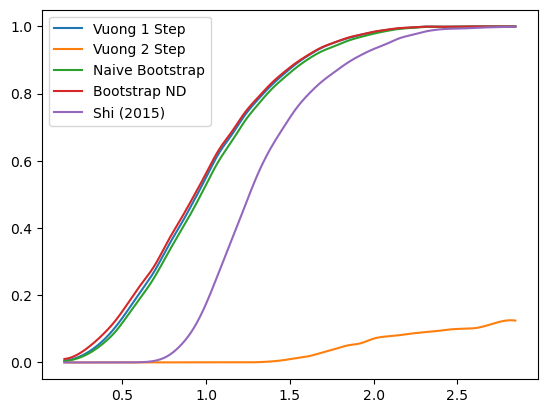

In [6]:
def gen_data3(beta= 1.5, nobs=1000):
    cov = [[25, 0], [0, 1]]
    data = np.random.multivariate_normal([0,beta], [[25,0],[0,1]],  nobs)
    return data[:,0],data[:,1],nobs

betas = np.linspace(0,3,linspace)
nobs = 100
c1,c2 = calc_c(nobs)
results = []


for beta in betas:
    setup_shi_ex  = lambda yn,xn: setup_shi(yn,xn)
    gen_data_ex = lambda : gen_data3(nobs=nobs, beta =beta)
    mc_out = vuong_tests_fast.monte_carlo(nsims,gen_data_ex,setup_shi_ex,trials=trials,
                                          skip_boot=skip_boot,skip_shi=skip_shi,refinement_test=refinement_test,c1=c1,c2=c2)
    reg,twostep, refine_test, boot1,boot2,boot3,shi, llr,std, omega = mc_out
    results.append([reg,twostep,refine_test,shi,boot1,boot2,boot3])

name = 'power_nobs%s_c1%s_c2%s_trials%s.png'%(nobs,c1,c2,trials)
create_fig(betas,results,name=name)

# extra size sims

In [ ]:
betas = np.linspace(0,3,linspace)
nobs =250
c1,c2 = calc_c(nobs)
results = []

for beta in betas:
    setup_shi_ex  = lambda yn,xn: setup_shi(yn,xn,num_params=num_params)
    gen_data_ex = lambda : gen_data(nobs=nobs, beta =beta)
    mc_out = vuong_tests_fast.monte_carlo(nsims,gen_data_ex,setup_shi,trials=trials,
                                          skip_boot=skip_boot,skip_shi=skip_shi,refinement_test=refinement_test,c1=c1,c2=c2)
    reg,twostep, refine_test, boot1,boot2,boot3,shi, llr,std, omega = mc_out
    results.append([reg,twostep,refine_test,shi,boot1,boot2,boot3])
    print(boot3)

name = 'size_nobs%s_c1%s_c2%s_trials%s.png'%(nobs,c1,c2,trials)
create_fig(betas,results,name=name)

0.007956141214279606 -0.012584295527886192 0.02026833028076797
-0.019496914721042053 -0.012584295527886192 -0.007181677019196946
---
-0.015635283875773728 -0.004338914148738673 0.03818000521208767
-0.03902987348723862 -0.004338914148738673 0.014790424904034476
---
-0.007903113683025726 -0.0077607257521263295 0.03086047648245431
-0.03282389730232107 -0.0077607257521263295 0.005949927218725755
---
-0.022255693403780853 0.0004834403091672578 0.04576633531999595
-0.042877030571927446 0.0004834403091672578 0.02512200842081334
---
-0.00935199675717418 -0.006094438421816002 0.028795784577921837
-0.03095299841850867 -0.006094438421816002 0.007174871018924961
---
0.00046487144522363265 -0.007839107207705077 0.0221694380926103
-0.021041592293927797 -0.007839107207705077 0.0006615215878211355
---
-0.0008387289504160454 -0.00809750071917329 0.02521324453003932
-0.02387889568127845 -0.00809750071917329 0.002166425637019943
---
0.0032940434369577356 -0.008688735749043509 0.018919066349338244
-0.0185

-0.016161036936657835 -0.007882682939102562 0.042854409047584294
-0.045602154261096095 -0.007882682939102562 0.013409668726378405
---
-0.018848118370281098 -0.002520828658051507 0.03885170724945522
-0.0406311010333016 -0.002520828658051507 0.01702409979433249
---
-0.028828660572988413 -0.0012148481285790952 0.04852873330125031
-0.05235046119273315 -0.0012148481285790952 0.025026577795201056
---
0.0020601279484903224 -0.0065678639158761 0.01606987340308564
-0.015604460243786335 -0.0065678639158761 -0.0015956814887556781
---
0.013444968978353863 -0.011746640776558251 0.016234706166612843
-0.016173216208414762 -0.011746640776558251 -0.013380515437877674
---
-0.0026289946529798654 -0.009230699813892278 0.02839122175997366
-0.02910735838500481 -0.009230699813892278 0.0018947806747242014
---
-0.05411298722255316 0.016459463746723708 0.07157719992118243
-0.07772551133009667 0.016459463746723708 0.04804214190110539
---
-0.003804604007213514 -0.007614279312636675 0.0252387088118455
-0.026464449

-0.0057040282602539415 -0.007324551144947028 0.031965832244773534
-0.02977884810329543 -0.007324551144947028 0.00787499460855229
---
0.0070794842507482985 -0.011968807396566878 0.02366538804139931
-0.02284234008852175 -0.011968807396566878 -0.006276446172667909
---
0.002668823821067168 -0.010482601481519933 0.02156039076879142
-0.021623667027301566 -0.010482601481519933 -0.002743405439355708
---
-0.024495667008931847 -0.00014131353122609646 0.05022603991690042
-0.04901471823147691 -0.00014131353122609646 0.02567987154385021
---
-0.013734591907536883 -0.005093570099728742 0.037182726989824895
-0.03580020979924421 -0.005093570099728742 0.015083630677044714
---
0.0067062364831114146 -0.007846789402428849 0.013338183640981808
-0.013283748646070336 -0.007846789402428849 -0.006653498020738022
---
-0.03795818137285074 0.00905327408432335 0.06329641531993195
-0.06033640849674754 0.00905327408432335 0.04092603099171311
---
-0.029329514738266907 0.003195484091297274 0.05086452603420791
-0.051652

-0.03253331282134077 0.0019417206864433352 0.05140119640837663
-0.057542605668587266 0.0019417206864433352 0.02643410526670853
---
-0.04636311238432329 0.012949124300786692 0.06716764611525139
-0.0694604315554161 0.012949124300786692 0.04410138929839345
---
-0.046127970532002786 0.016580875009632002 0.0742975874262216
-0.0702281158121148 0.016580875009632002 0.05020951264724622
---
-0.0013634734589732852 -0.009889410529174929 0.02740222348422628
-0.029074523463063825 -0.009889410529174929 -0.0003071542269274749
---
-0.020021191603134633 -0.0016290831736871679 0.04256245648973125
-0.04112363020007908 -0.0016290831736871679 0.02147115041745363
---
-0.005403167951752631 -0.007315608531834455 0.030216426136987228
-0.028795064844131458 -0.007315608531834455 0.00683139452384366
---
-0.03803678379608715 0.007769707567066582 0.0714386703989678
-0.06448877606326596 0.007769707567066582 0.0450033989282201
---
-0.010536063172752276 -0.007981669436605892 0.03906493056856152
-0.039213669688216365 -

-0.05296291922666021 0.01914838952837174 0.07818876383101955
-0.07758332916045904 0.01914838952837174 0.053501078465009816
---
0.009313920408847804 -0.009335190022368746 0.014222111965456849
-0.014138316163362493 -0.009335190022368746 -0.00923065331981739
---
-0.025636828918285497 -0.004557195527537698 0.049637976474924406
-0.05007982396320651 -0.004557195527537698 0.025224926137581344
---
-0.009776446663032996 -0.007311755430782228 0.0334663087556076
-0.03428093802743219 -0.007311755430782228 0.008959647105023723
---
-0.021808989376495773 -0.0029219119030954744 0.0479448535623348
-0.04712641502921216 -0.0029219119030954744 0.022618047024827486
---
0.002989226467876736 -0.008728877905731834 0.022357816616241265
-0.02035327203465845 -0.008728877905731834 -0.0009821799953085542
---
-0.05988122003575391 0.02558101063945263 0.08664388641231426
-0.08639783808511303 0.02558101063945263 0.060168827595867044
---
0.0074070444131958445 -0.008788614786852127 0.01460341517097661
-0.014738310176468

-0.01673336958919047 -0.003883977275228923 0.0392030311041392
-0.03853670306571527 -0.003883977275228923 0.017404577545765403
---
0.005487308410449935 -0.009777049216827677 0.019588758737536915
-0.01978177088368815 -0.009777049216827677 -0.005676295162630624
---
0.0019118471920555448 -0.0081661180493162 0.020737849992152228
-0.02027705905958881 -0.0081661180493162 -0.0014534378693189603
---
-0.0362952318725913 0.0031668509823251194 0.05478676062268328
-0.059126265942496994 0.0031668509823251194 0.031918404462824713
---
-0.016881975114275947 -0.003910447557533232 0.04083077476166245
-0.04048085029459497 -0.003910447557533232 0.017220529842636154
---
-0.017174107860856474 -0.0026957771682847975 0.03960055846832842
-0.039264052373087145 -0.0026957771682847975 0.017502997416971394
---
-0.012104082513267353 -0.004625388727060915 0.02998958156344737
-0.032256175694467974 -0.004625388727060915 0.009841865133458362
---
-0.029131955518893617 0.0034071011436607643 0.05151172736109982
-0.05028910

-0.009483033926510858 -0.005821542730724623 0.0349075443882247
-0.03279537505013971 -0.005821542730724623 0.011588757915094427
---
0.011960117387404337 -0.01077606397317126 0.014993327272041014
-0.015075149724040707 -0.01077606397317126 -0.0120411343067653
---
-0.032564963016694544 0.0027671210065944264 0.0550489594095318
-0.05645166234211901 0.0027671210065944264 0.031153223178297784
---
-0.0386634572117243 0.007143833124993203 0.07099567023010953
-0.06524526269201283 0.007143833124993203 0.04440844158527589
---
-0.009504828945915872 -0.00695927370832856 0.0352238858487272
-0.03478791466251557 -0.00695927370832856 0.009944569993990864
---
-0.01266230812849378 -0.005076840573895866 0.03330271166329077
-0.035167390691329896 -0.005076840573895866 0.010783872900743589
---
-0.031877203077946364 0.0004887105500549092 0.055441514987553786
-0.05603345670725369 0.0004887105500549092 0.03128088643382327
---
-0.03875055749653277 0.009078347977305607 0.06582632035781152
-0.06331673158755138 0.009

0.0006536304419274725 -0.00923950996270488 0.02301547365649987
-0.023839238836941244 -0.00923950996270488 -0.001489105450097883
---
-0.06830256022611851 0.03294218530351574 0.09253204046529001
-0.09273576248635661 0.03294218530351574 0.06802274071622161
---
-0.03336261621746282 0.005100887873940575 0.053361462376794885
-0.05487354030029745 0.005100887873940575 0.03185720786741031
---
0.004654154401319578 -0.009835216707241226 0.020897950907916525
-0.021132066676199098 -0.009835216707241226 -0.0048969180205159024
---
-0.022098490300918868 -0.0019810921695481215 0.04284611722288784
-0.04548618322466647 -0.0019810921695481215 0.019487943232128255
---
0.007429657043395848 -0.010716845001667585 0.01996607799716919
-0.01955131394088537 -0.010716845001667585 -0.007014194829729812
---
0.010851981703596905 -0.01045932728961947 0.014902597873420112
-0.01489689995121877 -0.01045932728961947 -0.010845720005266403
---
-0.003917085890489259 -0.008018743176441377 0.028624996666427628
-0.0281943569678

-0.04057509702012367 0.009119175150363432 0.07055411085859747
-0.06497642802682324 0.009119175150363432 0.04601016347795372
---
-0.010582138055526477 -0.005319131321787264 0.03234375540414056
-0.03161888846090776 -0.005319131321787264 0.011306778215167878
---
-0.009755328062841084 -0.007327873019469607 0.03584412970478496
-0.03554881466802044 -0.007327873019469607 0.010049717842371254
---
-0.026740497326365912 -0.00144874710283941 0.049847618175987256
-0.051273889249629084 -0.00144874710283941 0.02532060349376369
---
-0.053606298205881045 0.02226904343349999 0.07187709982436664
-0.07511335500501547 0.02226904343349999 0.05031621660530358
---
-0.016186239801314943 -0.003783541011517353 0.039441773323517865
-0.03960762043864345 -0.003783541011517353 0.016049000426024612
---
-0.05941663262023168 0.012082209720023671 0.08174278190222443
-0.08839075935398466 0.012082209720023671 0.05287089034334943
---
0.006530401965944664 -0.009592676595498008 0.018262404917884698
-0.01793892380226388 -0.0

-0.025597888671898106 0.00051814807979867 0.046218777704675536
-0.047597776237434705 0.00051814807979867 0.024243589132003755
---
-0.06120124370266954 0.03131709637545365 0.08477185459680883
-0.08254300449263761 0.03131709637545365 0.06344765670097668
---
-0.009097327274883323 -0.007578319573490721 0.03646126762452379
-0.03544083615892767 -0.007578319573490721 0.010125597049487903
---
0.002342774745666172 -0.00892218117003319 0.022211909350583627
-0.02165508649224912 -0.00892218117003319 -0.0017773149136942154
---
0.003125011545791181 -0.011015482125038783 0.021804676505863783
-0.02264478743153303 -0.011015482125038783 -0.0039637181903874425
---
0.007868835405181936 -0.009553319817359025 0.015889903305940024
-0.01639439142126898 -0.009553319817359025 -0.008374810309810962
---
-0.01685042523419345 -0.004627402880047246 0.041524536758567814
-0.04234649381391936 -0.004627402880047246 0.016038895459876464
---
-0.0421059813520925 0.011066668118932402 0.06490989154461253
-0.06477555346737965

-0.04185399932095275 0.009241612545484062 0.06493251779030777
-0.06614881785698251 0.009241612545484062 0.04064408253969262
---
-0.06027868029167817 0.02636887420631807 0.07956569558052587
-0.08309621060738802 0.02636887420631807 0.05674540888981169
---
-0.03236567265456391 0.005143610391510408 0.05304112572474823
-0.05359545089515722 0.005143610391510408 0.0317953676536032
---
0.00412855367944905 -0.010311968157366303 0.01954014567933468
-0.019508764252288043 -0.010311968157366303 -0.004098499618778031
---
-0.07863023897450812 0.04104052659834698 0.11340111782742403
-0.10605347511372706 0.04104052659834698 0.0860746002076826
---
-0.0007008955006337536 -0.008825575277995074 0.025220481850022982
-0.025372302187063645 -0.008825575277995074 0.0005395293867602708
---
-0.016229209808249285 -0.0038971266303807965 0.04032723165817554
-0.03992918449356429 -0.0038971266303807965 0.016656240098625454
---
-0.05276895468460956 0.015606714175618585 0.0777039981591133
-0.07754428100325408 0.01560671

-0.049663528125352775 0.016525798089376067 0.07409439668840885
-0.0723433552425672 0.016525798089376067 0.0513806717035494
---
-0.0182495032752635 -0.0023103854375699615 0.03742561279170257
-0.03902435231133165 -0.0023103854375699615 0.01663878091333281
---
0.00033082121443864823 -0.007026781190838386 0.019261511335846245
-0.019177491069352962 -0.007026781190838386 -0.00024797453675588646
---
-0.07087390445664185 0.03397575674429635 0.08690165920993188
-0.09520883588370228 0.03397575674429635 0.06261912193627962
---
-0.0034583207872953023 -0.0073732225546959546 0.02629815425717643
-0.025471388189008796 -0.0073732225546959546 0.004273587177337532
---
-0.046264156346623786 0.01159026044651702 0.07061749373224599
-0.0710934775023629 0.01159026044651702 0.045786445438649445
---
-0.01622159000974735 -0.004294005963108838 0.03513719548227651
-0.03695944014788695 -0.004294005963108838 0.014371634908889602
---
[1. 0. 0.]
-0.0015376432762469316 -0.012766977630011594 0.026492092997095245
-0.0268

0.00841405705460344 -0.011089784610654418 0.015875669710856355
-0.015703772271572942 -0.011089784610654418 -0.00824057865337697
---
0.009370233949373263 -0.008831958600772984 0.012243750659850028
-0.012318998760409688 -0.008831958600772984 -0.009445011725262006
---
-0.031844656361220906 0.004378958716733397 0.05960614882552543
-0.056017151102019366 0.004378958716733397 0.035417511697410885
---
-0.0570839373144806 0.021457623598912696 0.075708846670105
-0.07880247195656828 0.021457623598912696 0.05396089759380586
---
-0.030888116759938744 0.002636058945947762 0.05234632977023495
-0.05312117075974076 0.002636058945947762 0.030144848445516986
---
-0.05317764399297143 0.022835503235197344 0.07868205321280664
-0.07441024471189472 0.022835503235197344 0.05748883682477037
---
-0.0005125246724331171 -0.010143220324186686 0.02441756910808229
-0.02555954906967552 -0.010143220324186686 -0.0006231377330126686
---
-0.06567486708532785 0.035152217136885225 0.08654317903668092
-0.08715333478518658 0.

-0.0016172670440858187 -0.011811281155985728 0.027838302788557062
-0.027625854150250432 -0.011811281155985728 0.0018185187699588737
---
-0.000316502707673786 -0.008276595830753384 0.02421792703093871
-0.02390865899308123 -0.008276595830753384 0.0006502589000723339
---
0.009540173394281686 -0.0096267823861234 0.01433496456314653
-0.0142356512457284 -0.0096267823861234 -0.0094378315408998
---
-0.008631819588773635 -0.008025339479406696 0.03378639963133767
-0.03333787354358712 -0.008025339479406696 0.00907718775841933
---
0.00922655270850513 -0.00976104736159794 0.014753380198468074
-0.014765605525379455 -0.00976104736159794 -0.009238981053056212
---
-0.0021164833469666856 -0.010686175986129892 0.030401509789581515
-0.028148892618208955 -0.010686175986129892 0.004388597562231694
---
-0.02949533828024135 -0.0010588071589466036 0.058132966434243954
-0.052912931856920184 -0.0010588071589466036 0.03469963680003994
---
-0.02351368904760863 -0.0042472536797419766 0.043724417761973396
-0.0466151

-0.021537367974717295 -0.003266410156880051 0.04442087309375481
-0.04637348095510003 -0.003266410156880051 0.019596921391381476
---
0.0025482560606930596 -0.008729998240888782 0.0181885856273505
-0.018765381000015763 -0.008729998240888782 -0.003127218023964197
---
-0.016791750379155458 -0.011186567392229646 0.04342014657603368
-0.043310025605367855 -0.011186567392229646 0.016910678480800346
---
-0.0028994145110478597 -0.006801294405553424 0.021387061333986587
-0.022239935671540367 -0.006801294405553424 0.0020401927074998084
---
-0.02370912334812104 -0.00038812145803671045 0.04778771692888047
-0.04748403884163085 -0.00038812145803671045 0.023994647401333908
---
-0.023197940753248263 -0.001260159638791379 0.04788838055995627
-0.04594480017386475 -0.001260159638791379 0.025110355534685283
---
-0.07720865484525175 0.029784536263050564 0.1013805315625753
-0.10536841459796341 0.029784536263050564 0.07316831549911107
---
-0.063814043555551 0.027016413006719454 0.08479107312167138
-0.087671854

-0.02748066523735917 -0.001438192124788684 0.05157813716960391
-0.051359538321983346 -0.001438192124788684 0.027693836159802244
---
0.001183747404425167 -0.00966146136866429 0.024996703613703247
-0.02467086703380677 -0.00966146136866429 -0.0008472072277962232
---
-0.0597714614093991 0.01795229091559627 0.082894145656917
-0.0857592190798671 0.01795229091559627 0.05690619731439977
---
0.007327289013344766 -0.009544982326583316 0.016053151065246803
-0.015869742300725638 -0.009544982326583316 -0.007143191769716439
---
-0.0052837615499964725 -0.008155612255407854 0.026478016940118594
-0.026941643774505218 -0.008155612255407854 0.004820359005095895
---
-0.021816753728640555 -0.00539475356603023 0.044616897530420016
-0.04308630371984846 -0.00539475356603023 0.02336546048310877
---
-0.013545911710293585 -0.0085359239707744 0.03699783190483041
-0.03763606429872505 -0.0085359239707744 0.0129466250855191
---
0.011154849969807394 -0.009302998715838973 0.012265524919582351
-0.01222225196731307 -0.0

0.0013470035204175283 -0.008637073978572954 0.02159706515015985
-0.022139294833755895 -0.008637073978572954 -0.0018941698807260995
---
-0.015658053033499948 -0.0075571706725645225 0.0425410613955844
-0.04196020220494367 -0.0075571706725645225 0.016199706735534853
---
0.007711575430692824 -0.012917011059882112 0.016659275058112336
-0.016788607401659515 -0.012917011059882112 -0.007841105484312034
---
-0.019644068574383867 -0.0021189262729268818 0.04861498825811408
-0.043003931395424834 -0.0021189262729268818 0.02526454867770805
---
-0.030213087630054418 0.0046009814314039365 0.056161556062665714
-0.053871211607095834 0.0046009814314039365 0.03253171342586388
---
-0.0064793081401271855 -0.00813444222262201 0.03262619277232106
-0.03312222292522664 -0.00813444222262201 0.005965207629630226
---
-0.03284849045876113 0.004517176904551676 0.05990918995865894
-0.05710973255579112 0.004517176904551676 0.0356205732205094
---
0.0007998246876901873 -0.00718487929268949 0.018334045804142857
-0.018909

-0.006711207160606896 -0.0075897265607569086 0.031573401606368075
-0.031498393981884344 -0.0075897265607569086 0.0068035383583595335
---
-0.017635067945836417 -0.00265882457454678 0.04449509325559592
-0.04185024426428021 -0.00265882457454678 0.020283250127650573
---
-0.011807399138803812 -0.005614397127727229 0.03360331775129561
-0.03457044110762901 -0.005614397127727229 0.010838527070068472
---
-0.030960835200862284 0.002494230657939837 0.05388089471398519
-0.05465918607245697 0.002494230657939837 0.030187605606281802
---
-0.02734280025835486 -0.0038759278275165465 0.050834451438063595
-0.05388491587370677 -0.0038759278275165465 0.024335751486627918
---
-0.0007930998063417258 -0.012384605267619201 0.025904464403782423
-0.02657048682291259 -0.012384605267619201 0.00014087488066252834
---
-0.026411303369537485 -0.004379139940771711 0.05238910623384142
-0.052587984324898106 -0.004379139940771711 0.026205447298168396
---
-0.003737830597644445 -0.01037245174224675 0.03029137485411499
-0.02

-0.013455424606385276 -0.007089230138378682 0.03956626865156847
-0.03960865422367376 -0.007089230138378682 0.01336254712683586
---
-0.038829767708013774 0.008047336390215844 0.0584419575300669
-0.061427215364040506 0.008047336390215844 0.035890646001976285
---
0.007196583773517141 -0.008649597186827847 0.014469246819329486
-0.014622804930318672 -0.008649597186827847 -0.007352446887913655
---
-0.023026911474115844 -0.0023652115274061304 0.04520409874890169
-0.04738195062335813 -0.0023652115274061304 0.020809563665889024
---
-0.011494063387399962 -0.006744624477916304 0.03596259737856123
-0.03406575813381962 -0.006744624477916304 0.013375799888337842
---
-0.08382476149985314 0.0388382422973641 0.11170619227692644
-0.11068871510421292 0.0388382422973641 0.08479261993433863
---
-0.02193088869015758 -0.0010349628914878696 0.0447070917653886
-0.04379826506904509 -0.0010349628914878696 0.022825372310546047
---
-0.06556114771472041 0.028347443593175963 0.09169212192708154
-0.08942491676458934 

0.007410843498265526 -0.00912435579577644 0.015863977319668553
-0.015750322929698288 -0.00912435579577644 -0.007295566596392611
---
-0.012566833022199823 -0.0057945092965258705 0.03370708341143137
-0.035702725182126846 -0.0057945092965258705 0.010586618528318752
---
-0.029258817931287515 0.0024584878650367134 0.05497327708227736
-0.05376451537922566 0.0024584878650367134 0.030461248646627217
---
-0.04104482584967388 0.013528439853379651 0.07189437842113142
-0.06515922639748553 0.013528439853379651 0.047841590146218235
---
-0.01650709832108345 -0.0031265425755531598 0.04351670361163008
-0.04050941284231059 -0.0031265425755531598 0.01949928192425038
---
-0.052997618094080906 0.017011334268608166 0.0787890315386053
-0.07766837137962375 0.017011334268608166 0.05409850745142819
---
9.902756548232672e-06 -0.009413331457601181 0.02484128818345964
-0.025628563766516524 -0.009413331457601181 -0.000814016427538856
---
-0.009785944757278477 -0.009598955184054648 0.03793379245268904
-0.03701303420

0.003680480454963695 -0.009006774820216163 0.0186211496032963
-0.018539067259413608 -0.009006774820216163 -0.0035933444814370066
---
-0.006394795856065344 -0.006580642808359424 0.027413572021205486
-0.028202320112979642 -0.006580642808359424 0.00561389402514499
---
-0.016145121765980385 -0.0047810479398661095 0.03932456043409482
-0.04049900984480579 -0.0047810479398661095 0.014959036514108244
---
-0.030712124523929654 0.0019289280819095537 0.06099029501842014
-0.05530846032255194 0.0019289280819095537 0.03634926117098118
---
-0.09623251193648558 0.05966522222195927 0.12592646473599253
-0.12176248919059988 0.05966522222195927 0.10032066501816145
---
-0.01041124608648129 -0.0076873719578687905 0.03477447313661469
-0.03581510841187336 -0.0076873719578687905 0.009353540441824192
---
-0.005827590815830806 -0.016027560165739876 0.03266872358758213
-0.032676306932664316 -0.016027560165739876 0.005814616509226685
---
-0.06209707545296114 0.02524165578033957 0.0824108212169834
-0.08322814237875

0.008004217782909768 -0.01073517212379641 0.017926876188967135
-0.01817755688211091 -0.01073517212379641 -0.008259954850486468
---
-0.022667705199972035 -0.0024601467370601246 0.048814141994096394
-0.048325177396196656 -0.0024601467370601246 0.023116578319970035
---
0.010009828872503169 -0.011574142187057764 0.017992481005633464
-0.018189627733609232 -0.011574142187057764 -0.010206528607562769
---
0.0039034955697201286 -0.011678702615272395 0.022276788583570798
-0.02093509491562863 -0.011678702615272395 -0.0025610884100146034
---
-0.020000640905643623 -0.00122284425966213 0.03963240897899368
-0.04014863673121632 -0.00122284425966213 0.019497572424077046
---
0.00419110320860221 -0.01112523824252509 0.018441573552915383
-0.01831710920675778 -0.01112523824252509 -0.004070332874528695
---
-0.017677538438947576 -0.00454053597140518 0.037439146717775776
-0.04045635144319407 -0.00454053597140518 0.01464778427892481
---
0.008520682009544155 -0.009265947781160785 0.014064800159716508
-0.0141619

0.007768311469097277 -0.011004395575980085 0.01723940184256563
-0.01767908739667237 -0.011004395575980085 -0.008210321241906038
---
0.008000924190420358 -0.01042018930360674 0.018352284860147332
-0.018144898818991954 -0.01042018930360674 -0.007802596143217417
---
0.00501391781403723 -0.009376874510658677 0.018554955662408276
-0.018426670690558325 -0.009376874510658677 -0.004886339490447052
---
-0.032296294175523946 -0.0024308526311623566 0.052586844808497846
-0.05720137163865242 -0.0024308526311623566 0.027658402145449602
---
0.007075285056343131 -0.011089377961040066 0.016208872712281313
-0.016578226160369837 -0.011089377961040066 -0.0074446675515190824
---
-0.02679434625593753 0.002194975759146905 0.047444381981758384
-0.04837401722885017 0.002194975759146905 0.025879007144432146
---
-0.025807135976745346 -0.001899684103130033 0.048554312968235286
-0.049695431904023285 -0.001899684103130033 0.02471428191920932
---
-0.0071274004460996744 -0.008810328455434939 0.031184598205972226
-0.0

-0.037989949618107866 0.006682254447668156 0.06875263197586684
-0.06284250859972323 0.006682254447668156 0.04389965992353684
---
-0.06810115934082177 0.03138983641862344 0.09866311018538128
-0.09451806013123651 0.03138983641862344 0.072245850384132
---
-0.021395899644694884 -0.006012702893633084 0.04798517705629202
-0.049532148645432636 -0.006012702893633084 0.019839538167883492
---
-0.0013196501601443935 -0.013318840871887961 0.028084753573958617
-0.028658911160334474 -0.013318840871887961 0.0007522465131808897
---
-0.03173361074436679 0.003987446780406007 0.05397135368889814
-0.05330866697107252 0.003987446780406007 0.03236730590566731
---
-0.016807390248510013 -0.004660271210163641 0.039491619016803196
-0.03922396383949778 -0.004660271210163641 0.017067820357987443
---
-0.047248274557140424 0.007270467134256076 0.07081098560515668
-0.07203945406574237 0.007270467134256076 0.04603671979517749
---
-0.015758096493257504 -0.008190433833920997 0.041899414176684635
-0.039268377654675696 -

-0.0015500323362242123 -0.014719694369765226 0.027229444282243942
-0.026742034092672166 -0.014719694369765226 0.0020344349664321616
---
-0.02016377752030194 -0.007399273657932556 0.04397009018915828
-0.04646761078156984 -0.007399273657932556 0.017658688941063438
---
-0.0023577056870673907 -0.011629725438909637 0.026552608971497065
-0.02619529892856029 -0.011629725438909637 0.002702245624083658
---
-0.040348370122123674 0.006367217743795037 0.06499636505428763
-0.06408351484413584 0.006367217743795037 0.04126090788590568
---
0.007689898499908055 -0.01432531165756939 0.01785247002169582
-0.017683536677174597 -0.01432531165756939 -0.007520740679400003
---
0.0007433338110594181 -0.011024871164907546 0.022240528521477475
-0.022932195119371657 -0.011024871164907546 -0.0014306368224547969
---
-0.003453024080812548 -0.009470685044361885 0.026193723223707426
-0.02670364573934961 -0.009470685044361885 0.0029476297310868063
---
0.002654094349560872 -0.00965847507595465 0.02060985679896695
-0.0210

-0.009212951344512332 -0.009333440441836061 0.03183295113722722
-0.031249874167021036 -0.009333440441836061 0.0097673271182517
---
-0.04291853686098809 0.011041463965941198 0.0649791623140603
-0.06298751970148789 0.011041463965941198 0.044902276880971294
---
-0.043939639198402554 0.00807368403442606 0.07540426244046254
-0.07125881140330505 0.00807368403442606 0.0480770290961781
---
-0.011953886791534791 -0.01228793681948897 0.036664223226813134
-0.03573292052612599 -0.01228793681948897 0.012890146089199705
---
-0.008167362369401817 -0.007568794360751103 0.030249847033403762
-0.030576083074798064 -0.007568794360751103 0.0078379272992113
---
-0.004840784213113226 -0.009077712613352894 0.029485813551350593
-0.029758227233999398 -0.009077712613352894 0.004546551280450392
---
-0.0433560958890297 0.01329382800604471 0.06857897761625889
-0.0655527957489195 0.01329382800604471 0.04639962189137836
---
-0.031424065138921854 -0.0028157603408489524 0.05553680847470106
-0.05520325181330334 -0.00281

0.003417863415743657 -0.008998657966040987 0.018384576683693792
-0.017952831875621335 -0.008998657966040987 -0.0029860325660361065
---
-0.025937566096771305 -0.0016568825063934518 0.04621043142803589
-0.046799108267182324 -0.0016568825063934518 0.02533205733690067
---
-0.030450338202128547 0.0034512121137421706 0.0526202226759804
-0.05137912489825137 0.0034512121137421706 0.031666357158253285
---
-0.009291142278897279 -0.015297221837697397 0.0356922096475442
-0.03549829197774048 -0.015297221837697397 0.00949239411263546
---
-0.002248759360891781 -0.01479990555787189 0.026576636234697946
-0.026099612867053198 -0.01479990555787189 0.0027262167268756994
---
-0.02586569966601905 0.0011614701376446341 0.04881941486418972
-0.04705317859401368 0.0011614701376446341 0.027650108068701225
---
0.0067776495584793645 -0.011847878684411792 0.015302019522388159
-0.015324381437816717 -0.011847878684411792 -0.006791065010268977
---
-0.018734185162487867 -0.006500581034245644 0.04288333513640841
-0.0421

-0.053956516211965184 0.015778185727795956 0.07374793800446688
-0.07769522604969288 0.015778185727795956 0.050003261352634255
---
-0.041303822579716896 0.009491919068038323 0.06416831152549884
-0.06444567342027852 0.009491919068038323 0.04103472266039533
---
-0.004689873981333459 -0.009045925199244131 0.025686561153780055
-0.027980221767739944 -0.009045925199244131 0.0024108574678394215
---
-0.02127076398853136 -0.006467256903176003 0.04250580924109561
-0.04381747036537619 -0.006467256903176003 0.019996315751935986
---
-0.022399094441276992 -0.0011583867022844842 0.04767010915166388
-0.0453433575768795 -0.0011583867022844842 0.02474054913448191
---
-0.04099730527967593 0.006952624498483364 0.06360821568229201
-0.06510811618921872 0.006952624498483364 0.03950161500792201
---
-0.003635516629272054 -0.009634110658009142 0.027794262266257648
-0.027786805327139577 -0.009634110658009142 0.0036502573423446687
---
-0.0864943140883757 0.03760141165318141 0.0961878771529531
-0.11044703626487169 

-0.025763606743292096 -0.006723324673201289 0.04844446226956445
-0.050004976085546694 -0.006723324673201289 0.02422928446770631
---
-0.015371528442591962 -0.009554205054335784 0.04351216594621911
-0.042956500481785106 -0.009554205054335784 0.015913505174423814
---
-0.06789397390138513 0.02330377658154632 0.0863735175480896
-0.09203179618832207 0.02330377658154632 0.062259940464729685
---
-0.0792296684263027 0.0424629630414947 0.1008715244855716
-0.10316681845397932 0.0424629630414947 0.07690934466656087
---
-0.014751315274255628 -0.014591243334272 0.039087429620387436
-0.03851681365431875 -0.014591243334272 0.01536823886964694
---
0.00695714612398723 -0.012371833279704026 0.01752139461851814
-0.01717678733249361 -0.012371833279704026 -0.006612239264508136
---
0.010142191534530276 -0.011241378648469379 0.0154156831360325
-0.015611509501843382 -0.011241378648469379 -0.010340123789892294
---
-0.02898221702860458 -0.0017819233899853443 0.05196513293516366
-0.05220917254371778 -0.0017819233

0.0009727423210198523 -0.00837160608530564 0.020436517311550884
-0.02134099454121015 -0.00837160608530564 -0.001864492271607671
---
-0.028359500776309034 -0.0019194625064177892 0.05539135030495916
-0.053297544534545827 -0.0019194625064177892 0.030485357247792794
---
-0.04939164865833787 0.02086274873510171 0.0709263528742646
-0.07136707065753736 0.02086274873510171 0.04894271642768435
---
-0.003074259995426981 -0.0098054974723841 0.025624049499163314
-0.02644048912900849 -0.0098054974723841 0.0022525559465729245
---
0.0004843853736049322 -0.009719584150634824 0.020074568732282368
-0.02006450835057106 -0.009719584150634824 -0.0004815950902504526
---
0.005530243872622053 -0.011300038417444414 0.019183749640986156
-0.018616308837225874 -0.011300038417444414 -0.004967551785821794
---
0.00276994403497126 -0.011838938314691388 0.022154747361795055
-0.02197718790967008 -0.011838938314691388 -0.002598715788375208
---
-0.010404891275656546 -0.008542504358250678 0.033612680875065366
-0.033566176

0.0055970858594639765 -0.010043412618833566 0.019056069985957998
-0.01884092512434038 -0.010043412618833566 -0.005381107299982356
---
-0.012466034460403863 -0.008276343227005187 0.035837756400360986
-0.034739289508829506 -0.008276343227005187 0.01358484599058667
---
-0.008222954627202279 -0.0064197202643099605 0.030980265818206204
-0.030732600261820016 -0.0064197202643099605 0.00846634432113
---
0.0026400215714295736 -0.012098541127447666 0.02091049174008797
-0.0217525194867191 -0.012098541127447666 -0.0034726747995396908
---
-0.01495790925413495 -0.00862985337401907 0.037155867134289075
-0.0375097157531224 -0.00862985337401907 0.01457534596465942
---
-0.025869486912677046 -0.0022250968671584576 0.048734734995107255
-0.049364342219603646 -0.0022250968671584576 0.025312305197581753
---
0.004311226212459615 -0.01057545694522594 0.02058984003718503
-0.020246783439159356 -0.01057545694522594 -0.003971996601394175
---
-0.049214905070774716 0.013286577044350188 0.06920374679500418
-0.0709941

-0.05181859374348782 0.018317875128905092 0.07703525812052289
-0.07430988809003328 0.018317875128905092 0.05454232768575898
---
-0.039601966649677016 0.00727746414019256 0.06449933721987297
-0.06282875914049285 0.00727746414019256 0.041247260924816904
---
-0.038949313079089526 0.0006113662479556724 0.06856682516522444
-0.06488559540937382 0.0006113662479556724 0.042621166987404806
---
-0.0356515953783409 0.0018700240184296574 0.05787663685510392
-0.058967003382287185 0.0018700240184296574 0.03459251188900915
---
-0.007931703152332223 -0.012761393192196224 0.03796932888223472
-0.03581347116629451 -0.012761393192196224 0.010045910376390278
---
-0.008241877554110317 -0.008624533164465747 0.030845475043743374
-0.03114947304382171 -0.008624533164465747 0.007941845847728338
---
-0.0011267483579015043 -0.009830039341541197 0.025058905602332055
-0.025556019707243572 -0.009830039341541197 0.0006272779154049426
---
-0.055593158635047164 0.021851979830040856 0.081062211140655
-0.08013915172912167

0.00555748083541107 -0.0096522372414162 0.016512296757577326
-0.01652257314967774 -0.0096522372414162 -0.005571281235238042
---
-0.018890139308458728 -0.005210122820473964 0.040296662704373785
-0.04149596405154037 -0.005210122820473964 0.01768058353003102
---
-0.0230679102468358 -0.005744343390015128 0.04673323190983502
-0.04724290337282542 -0.005744343390015128 0.022565298333213805
---
-0.08924968878347929 0.0475499402280723 0.11810306975644973
-0.11697060879507613 0.0475499402280723 0.09025610480511093
---
-0.04125913829873461 0.008458233190995436 0.06408649844034729
-0.06582968699672975 0.008458233190995436 0.03952792866065783
---
-0.004326527703715513 -0.009338946066865072 0.027274411074120267
-0.02830211127086784 -0.009338946066865072 0.0033020197110581115
---
-0.022611725791826187 -0.007046870916088271 0.04770716042688685
-0.04770591965560056 -0.007046870916088271 0.022563265062843268
---
-0.027097335691915733 -0.006216961238154523 0.05202937289955694
-0.05272076935540514 -0.0062

-0.05199703617092559 0.017604246591313256 0.0739378829179025
-0.07470095591279348 0.017604246591313256 0.051224714621643234
---
-0.038513768158200644 -0.0016704549423116814 0.06326422216978868
-0.0664068857404445 -0.0016704549423116814 0.035371711929865345
---
-0.030071921282406565 -0.0032356343204358326 0.0551041312986976
-0.05328758307294349 -0.0032356343204358326 0.03197393668852459
---
-0.014508049862815755 -0.005628371179888568 0.04229672481666321
-0.03937164883839609 -0.005628371179888568 0.017446187136361847
---
-0.016278421268563076 -0.013710585254044385 0.039135988744388214
-0.039689426773747066 -0.013710585254044385 0.015729444992169116
---
-0.020084909528161842 -0.006105771103392459 0.04306613987959874
-0.0442318109094279 -0.006105771103392459 0.018923597983843615
---
0.009523174303297618 -0.011283426776173562 0.015401958880279853
-0.015599626571518473 -0.011283426776173562 -0.009721618014531187
---
-0.01695534059306549 -0.00889981853847619 0.04127673501434932
-0.03979869861

-0.053955714100262474 0.019394806167482476 0.07406673676226741
-0.07461430986469833 0.019394806167482476 0.053538440247908374
---
0.0038162976172520925 -0.021021381229420537 0.0207969946651613
-0.021281493812962887 -0.021021381229420537 -0.004306199631243965
---
0.0006917195777763713 -0.016734077446288395 0.02331029892964483
-0.023220705832221005 -0.016734077446288395 -0.0006025846275563623
---
-0.022420280899544575 -0.004941605534337841 0.044201384926420575
-0.044864089300323824 -0.004941605534337841 0.021727275547208134
---
-0.042349724896986476 0.009411512740753896 0.06139856391300754
-0.06285089120015688 0.009411512740753896 0.0408713721076611
---
-0.02151881365249358 -0.0056150087602714095 0.04620491333479848
-0.04565880129748601 -0.0056150087602714095 0.0220524874992912
---
-0.000966674720224809 -0.015228497059073193 0.024293250798568533
-0.023716377593217142 -0.015228497059073193 0.0015292834033931392
---
-0.004984136693218878 -0.0161618418602829 0.030608974792132745
-0.03102778

-0.03710102864639178 -0.0013160236211304688 0.05699734369706644
-0.05958937011807062 -0.0013160236211304688 0.034439767230266746
---
-0.03230896716379099 0.0029031820295461414 0.05490315722739027
-0.05485549480964005 0.0029031820295461414 0.0323654733135821
---
-0.05234281986965513 0.007667902491759425 0.07741256320568553
-0.07718712971139705 0.007667902491759425 0.05259569215710271
---
0.0016302042432358164 -0.014484227133825894 0.020807126822079892
-0.020947606651543233 -0.014484227133825894 -0.0017767797576403006
---
-0.04048034989273213 0.005126422956324252 0.07097118569232648
-0.06665423024007898 0.005126422956324252 0.044772613150821615
---
-0.062090793568939 0.015569635118407922 0.08879679618119025
-0.08652484572220578 0.015569635118407922 0.06426238572944086
---
-0.06587479806322986 0.015097345677426268 0.08471387621093532
-0.09078106819944522 0.015097345677426268 0.05978790439296013
---
-0.037265875511340286 -0.0052505240412478674 0.05941897302058758
-0.06430333235205866 -0.00

-0.01671218371747738 -0.004575524419733465 0.04056452756203069
-0.03670502442818228 -0.004575524419733465 0.0205713532188022
---
-0.05632146581303716 0.015622789553115258 0.08116072845947982
-0.08085957857216582 0.015622789553115258 0.056573123860652635
---
0.007228362828532787 -0.010909129760134023 0.015600048530116917
-0.015380555629150649 -0.010909129760134023 -0.0070118761247173105
---
-0.04919790431956744 0.012245347800321202 0.07478139023625986
-0.07445394707608201 0.012245347800321202 0.049530556327843034
---
-0.006926673944559157 -0.019002599424261794 0.03308621220704925
-0.03360894793809273 -0.019002599424261794 0.0064148628149072
---
-0.05477305745945124 0.003240838834402505 0.07404914684632931
-0.07951309144965008 0.003240838834402505 0.049343068701865604
---
-0.002806434773914471 -0.009719614819904888 0.030322661613086388
-0.028941596984290927 -0.009719614819904888 0.004184560250207165
---
-0.06026863102829366 0.015034471297723484 0.08032121264475864
-0.08530163348103027 0.

-0.03671660376939146 0.0049266829222083305 0.05573923802651794
-0.059258201549338786 0.0049266829222083305 0.03324469732933004
---
-0.022746503530483637 -0.0069995202724647005 0.046545936474086586
-0.04534586317536297 -0.0069995202724647005 0.023908512662403177
---
-0.021924130306325482 -0.004509176488080294 0.05201097220840452
-0.047787758330466445 -0.004509176488080294 0.026115769406519388
---
-0.07191928712794131 0.02386367216824767 0.09505459911930875
-0.0971466668845925 0.02386367216824767 0.06979872288685106
---
0.004478962143445008 -0.01783803179616049 0.017920853198458354
-0.017951321505547117 -0.01783803179616049 -0.004514827337839535
---
-0.057994517025042505 0.01776105363151461 0.0919214506248455
-0.08265248700960753 0.01776105363151461 0.06726279278064684
---
-0.04340503033704053 0.0013962342580892363 0.06501969644268193
-0.0672569971955421 0.0013962342580892363 0.041111212856501364
---
-0.05067575606924062 0.010477245671396336 0.07360583810727812
-0.07284629559702638 0.010

0.003141490893053445 -0.011022151153299142 0.02082768250847065
-0.020314292278304145 -0.011022151153299142 -0.002630099917032273
---
-0.028467135707192653 -0.005530249235046962 0.05237754951756874
-0.053633447035006374 -0.005530249235046962 0.027217295232673473
---
-0.01938852976277468 -0.009099210545304591 0.042785162501262325
-0.04252641024603483 -0.009099210545304591 0.019643622762089735
---
-0.02378400237688889 -0.006529924538233733 0.04560897109339635
-0.04762646993314197 -0.006529924538233733 0.021814774485764184
---
0.00038233053292443695 -0.010592373545024576 0.024702755027847044
-0.024380442766114424 -0.010592373545024576 -4.800612365466571e-05
---
-0.004679685146174695 -0.018535044213867997 0.032659706315628596
-0.03089732218715013 -0.018535044213867997 0.0064327683919249996
---
-0.02725431202290486 -0.0025910109025106677 0.04892277095064105
-0.049224726923609886 -0.0025910109025106677 0.02696614051402436
---
0.006213001949052805 -0.016433063608866875 0.018745736932697907
-0.

-0.008402717657161723 -0.009632077186555257 0.035652465648521724
-0.033700822695368886 -0.009632077186555257 0.010336941752719878
---
-0.08638635599907628 0.07877634366546277 0.12874139150748734
-0.10740935019081434 0.07877634366546277 0.10781022641360062
---
-0.03422170860415428 0.002709228826855867 0.05771638011302767
-0.055799932480998356 0.002709228826855867 0.036085102203645116
---
-0.024275292346226985 -0.006713553795181595 0.051122101429897024
-0.05107916178534671 -0.006713553795181595 0.024309692198174564
---
-0.009057625658330409 -0.011475227842190232 0.03209299524842342
-0.03285520954396818 -0.011475227842190232 0.008308866540366654
---
0.001358425379025033 -0.01061708654970966 0.021461395597291648
-0.022518775554670196 -0.01061708654970966 -0.002421163248859413
---
0.005783276310754099 -0.01693037094113071 0.019218472666728867
-0.019283514848499772 -0.01693037094113071 -0.005839385124657034
---
-0.018044074535511403 -0.007657776773448401 0.04266178427965092
-0.04268567193410

-0.02944314575161914 -0.002219841238195335 0.05270242222248225
-0.054006875558408 -0.002219841238195335 0.028146560378254117
---
-0.004026199644522612 -0.011021463256620586 0.030206817024173827
-0.030110985030017592 -0.011021463256620586 0.004112625415733403
---
-0.02095164655701048 -0.009182663125969395 0.043705779240950496
-0.044105878521677876 -0.009182663125969395 0.0205522747670045
---
-0.0038273173362918045 -0.014240944958466539 0.028493300102723083
-0.026838928563002414 -0.014240944958466539 0.005465772744738644
---
0.004841224233125673 -0.014202335409884434 0.017531289576020487
-0.017400450515563035 -0.014202335409884434 -0.004699059600006578
---
-0.005769264640915125 -0.013378318326710803 0.028991886597271668
-0.02961254738475472 -0.013378318326710803 0.005140196256885512
---
-0.037373301019963105 0.0037540531224236097 0.061716404539069354
-0.05877498391756568 0.0037540531224236097 0.040360943961674334
---
-0.00899026665149578 -0.011377315091599815 0.030996761969713422
-0.0310

-0.024929766349563412 -0.002249711092616708 0.045093555643632384
-0.047949368129414346 -0.002249711092616708 0.02204579172764663
---
-0.029509429043838777 -0.004441094433017686 0.04970567883062522
-0.05231357190595161 -0.004441094433017686 0.026879820898497164
---
-0.05883779563884187 0.014783629347934356 0.09307310907719966
-0.08355586553350086 0.014783629347934356 0.06842151364894007
---
0.005177207223257455 -0.015639924622817568 0.01777101233283546
-0.01779130967548325 -0.015639924622817568 -0.005196284486697598
---
-0.02451780339162972 -0.0016778740662870975 0.04912470282269445
-0.04837215295779382 -0.0016778740662870975 0.025282498583323678
---
-0.034575334056527324 -0.0031468339292362287 0.05837359741861752
-0.05677305080326562 -0.0031468339292362287 0.03613272641824087
---
-0.05427322427277575 0.015428971544133042 0.07849202232105015
-0.07735408053301665 0.015428971544133042 0.055416845049020565
---
-0.037949219980609614 0.005348167278181096 0.06638917681232603
-0.06214071431422

-0.04221451380728167 0.0025907964864456327 0.06405262949537649
-0.06542363223622795 0.0025907964864456327 0.04079984493828293
---
-0.04815827434463914 0.012809373385058177 0.07167360227866297
-0.07058019474962317 0.012809373385058177 0.049286340622059714
---
-0.007067929135726972 -0.01510284166375337 0.030911088224583952
-0.031345324990786544 -0.01510284166375337 0.006632716721013422
---
-0.06405245494452878 0.0063751423202782565 0.08445257307479288
-0.08894751198505635 0.0063751423202782565 0.0595390427292721
---
-0.04701867683823431 0.007912837203253623 0.07229438848364052
-0.0703455105667717 0.007912837203253623 0.048950834524660376
---
0.0033299525300710463 -0.02181144362100062 0.024305426369877002
-0.024908769405239128 -0.02181144362100062 -0.003936187505523339
---
-0.0025922429474501134 -0.013796377322995356 0.025417823696182503
-0.025573855068683853 -0.013796377322995356 0.002456184842842255
---
-0.07101090740408772 0.038579861479788535 0.08522274600667476
-0.09169732961973903 0

-0.00400961440959208 -0.0122036860953195 0.026899506343398234
-0.028461626802943462 -0.0122036860953195 0.002450499480929039
---
-0.00741771321401841 -0.018536853300578988 0.03395855969893468
-0.032604019542250846 -0.018536853300578988 0.008781971295080484
---
-0.017250660982425524 -0.010063137257103415 0.04249379955865713
-0.04256291600097242 -0.010063137257103415 0.017202165825392676
---
-0.07352915304612362 0.0303165563573594 0.0971617363358298
-0.09932946444965914 0.0303165563573594 0.07132856303756452
---
-0.03136670957739571 -0.002431129178449705 0.054964519685367495
-0.055267514786208255 -0.002431129178449705 0.031095286728980594
---
-0.07846558956614333 0.04721700065357527 0.10537939262947292
-0.10188966631278354 0.04721700065357527 0.08186363663953976
---
-0.07214141620664682 0.029556351879647922 0.09418177014594219
-0.09456518694602925 0.029556351879647922 0.07170356168858183
---
-0.027357466183107797 -0.0031033373341097575 0.05300734374022822
-0.05026365474496707 -0.00310333

-0.041160901071533654 0.004842769170287284 0.0683184785851944
-0.06762778545300593 0.004842769170287284 0.04180977169298689
---
-0.0071568688317195026 -0.02116828535935381 0.03446221818968321
-0.03439987724926318 -0.02116828535935381 0.0072538527880830084
---
-0.05833169129500643 0.015742307495231332 0.08506142090260826
-0.08378593050418776 0.015742307495231332 0.05960152941509277
---
-0.04002602921829749 0.00498387270249669 0.06400933702993782
-0.0629825235356843 0.00498387270249669 0.0410593182883064
---
-0.005500369365192014 -0.018700671521946054 0.03299148412838719
-0.03251832576116802 -0.018700671521946054 0.005966666669495478
---
-0.06547796037070856 0.03084438766693468 0.0927918360258802
-0.08706589022329415 0.03084438766693468 0.07121458531168323
---
-0.0016122682260558902 -0.009305933029673334 0.021488300395546577
-0.021577024608735056 -0.009305933029673334 0.001535081773438596
---
0.006143405946869046 -0.016582040256180524 0.020169688700018933
-0.01985981166698273 -0.01658204

0.0006360214179150351 -0.03129281362751318 0.022653850380472032
-0.02368946559582 -0.03129281362751318 -0.0016745100026282615
---
-0.014510185732351416 -0.017321795928932206 0.04075938392349971
-0.03889908943269 -0.017321795928932206 0.016386119791647353
---
-0.054670578017108715 0.011613229365894075 0.07984395971844278
-0.07601344245737902 0.011613229365894075 0.058495212851574156
---
-0.09640081623048022 0.05635137852509266 0.12227928216019898
-0.12274612981415278 0.05635137852509266 0.09601928778865093
---
-0.022724790169831498 -0.01306957764015468 0.042809936451558665
-0.043695763212154674 -0.01306957764015468 0.02180214418847491
---
-0.010155626332169793 -0.008942302049300943 0.03285640327113999
-0.03265268585728814 -0.008942302049300943 0.01034014945634811
---
-0.0675004440775151 0.019029463961417987 0.08650303170422782
-0.09276716626543695 0.019029463961417987 0.06124201483080941
---
-0.011116084420678329 -0.016077234691538742 0.032157877389104396
-0.03227191509638776 -0.0160772

-0.01880259164487327 -0.008590475282627321 0.04588533738142943
-0.04455760939272084 -0.008590475282627321 0.020102022121997406
---
-0.046751228133938005 0.004179807376519853 0.07014071923438382
-0.06916392900291561 0.004179807376519853 0.0477004049044041
---
-0.01612603061299566 -0.016283805636478778 0.04386344398200869
-0.0413988410053356 -0.016283805636478778 0.01860874225060533
---
-0.00940503604019375 -0.018952257856227207 0.0353791566843622
-0.033966958583619616 -0.018952257856227207 0.010833598564757923
---
-0.02653310905013498 -0.0068042649812025775 0.048012712415956414
-0.049161703717233086 -0.0068042649812025775 0.02536407637673842
---
-0.054279777942020456 0.004280771599157594 0.08249697594519573
-0.08011434882514876 0.004280771599157594 0.05664801387738839
---
-0.04276955029891248 -0.005750591152379327 0.0637634889739547
-0.06564189603895008 -0.005750591152379327 0.040840466583812664
---
-0.11127074348972148 0.07084883682710322 0.13047824527837226
-0.13545567201678893 0.0708

-0.005864791613847768 -0.0183050267690373 0.031189812568448896
-0.029854596273894446 -0.0183050267690373 0.007211584887352259
---
-0.030215395241484273 -0.01119414172176389 0.05641407675901237
-0.05556570896446436 -0.01119414172176389 0.031103058240495488
---
-0.001143473284136975 -0.017804675502677392 0.025410951813069352
-0.025349895689303504 -0.017804675502677392 0.0012043249897666353
---
-0.07484615410470713 0.029532969291865527 0.09516739646338405
-0.09691188308205266 0.029532969291865527 0.07307883178637245
---
-0.0638252223277842 0.02653184212488447 0.07539864191219803
-0.08354716755293648 0.02653184212488447 0.055585394835059296
---
-0.04469177015864521 -0.010826076224656556 0.07597571105170711
-0.07005512200989644 -0.010826076224656556 0.050559179222573164
---
-0.03507308080113882 -0.0016460790775221607 0.06343068469582328
-0.0579472801529705 -0.0016460790775221607 0.0405515514551942
---
-0.0007985697240197471 -0.01740674175821517 0.022746774957596857
-0.02365161071298241 -0.0

-0.013042926698969365 -0.013233933527972752 0.03399021704371764
-0.03658581016223729 -0.013233933527972752 0.010422068281132369
---
0.005170311577763916 -0.01900605839798789 0.021340411204920834
-0.02122284890195548 -0.01900605839798789 -0.005053916317907302
---
-0.047316744140461386 -0.004141872109333476 0.06206121598751615
-0.07183107506609607 -0.004141872109333476 0.03753055142134008
---
-0.036349903533917816 -0.00988111075493558 0.063818660433575
-0.059403147142929894 -0.00988111075493558 0.04080127303256841
---
-0.03636089465577415 -0.0026143301695462024 0.06390232277692126
-0.05991819660932929 -0.0026143301695462024 0.040312784157781625
---
-0.07203418574533012 0.03682944241093422 0.09098480752206488
-0.09235125704666511 0.03682944241093422 0.07059681599888769
---
0.0011232610873077998 -0.027531897496001084 0.023188546715544992
-0.02468312466878218 -0.027531897496001084 -0.0026081686993732413
---
-0.04084172259016243 0.005889700065378932 0.06135367643448548
-0.0606968808374036 0.

-0.012200190630336715 -0.010817047786978186 0.03510933474948423
-0.03624925194266552 -0.010817047786978186 0.011069475411951217
---
-0.03924968995934264 -0.006368052881170374 0.05966202862879957
-0.06284327570572754 -0.006368052881170374 0.036032119715547845
---
-0.012195115812255087 -0.016717094874659857 0.03953223594449736
-0.035818625011233646 -0.016717094874659857 0.015914255057803885
---
-0.031885559806679106 0.0016339436532435206 0.05987674138384784
-0.056602005684692626 0.0016339436532435206 0.03515775349526665
---
-0.010578631104587935 -0.021399769078292406 0.039407840047079236
-0.037466465102900554 -0.021399769078292406 0.012492332076489478
---
-0.035382489389887015 -0.016600425532565726 0.05990652135646038
-0.06184029896129562 -0.016600425532565726 0.03347143123776493
---
-0.046751580291678245 0.006353718390997523 0.07364608889859221
-0.06723033097844312 0.006353718390997523 0.05323554723350333
---
-0.06483633717021367 0.020699385849110748 0.08485009029391558
-0.0891459021224

-0.024940243781521064 -0.014804612442273055 0.04710998751706298
-0.05035364863710975 -0.014804612442273055 0.021674615292123715
---
-0.012045374049797804 -0.01620361338271449 0.03508347802626129
-0.03684735226847719 -0.01620361338271449 0.010280463727214422
---
-0.002132916593223877 -0.016868136750105938 0.023206241913431576
-0.02368304839538668 -0.016868136750105938 0.0016575070494898121
---
-0.021517567742896492 -0.007972444632784223 0.043014484707296165
-0.04472521997931644 -0.007972444632784223 0.01981277994427419
---
-0.023687841392561085 -0.0036189071822654018 0.0439558693127156
-0.04356458763035431 -0.0036189071822654018 0.024116125287543658
---
-0.0034704979771197934 -0.031225820401166598 0.029730732960882897
-0.028400293837573413 -0.031225820401166598 0.004800434158893875
---
-0.021186871554240164 -0.014899557822215713 0.04486025520547974
-0.0457108635658593 -0.014899557822215713 0.020353835590832287
---
-0.05935206747019696 0.008513715413617076 0.07321918283311993
-0.08052676

-0.0438651655205741 0.010114742778896766 0.06744366571456521
-0.06514947670907563 0.010114742778896766 0.04620257370039251
---
-0.06397005484648725 0.018147398565549255 0.09287743873869936
-0.08739279459393873 0.018147398565549255 0.06943962406878565
---
-0.0393919130962075 -0.0027951973326734796 0.06612706889479833
-0.061816285305542444 -0.0027951973326734796 0.04376958586791668
---
-0.09882329254465852 0.036685544161426976 0.1293793817118586
-0.1273646495813298 0.036685544161426976 0.10087475038463867
---
-0.0712004932428761 0.04450343518359305 0.09589114142473523
-0.09251871718696038 0.04450343518359305 0.07459731344084149
---
-0.029422523432387614 -0.005163442553080341 0.05767631154689736
-0.052767848577093164 -0.005163442553080341 0.034350146174846635
---
-0.024678900769815562 -0.010070048923774447 0.04689581645003055
-0.04728371764288962 -0.010070048923774447 0.02426433558446592
---
-0.003541920883114446 -0.032951229449017454 0.029527824874190492
-0.02941430425128797 -0.032951229

-0.05197332917790647 0.0048330762771297215 0.07383644104030324
-0.07487551430416642 0.0048330762771297215 0.05091146035969825
---
-0.09116294317722866 0.05700328696506409 0.11818414969652882
-0.11374041040324682 0.05700328696506409 0.0955264673449698
---
-0.01693631730992385 -0.01475274183920639 0.040642104904883194
-0.039984987276434035 -0.01475274183920639 0.017609065938668882
---
-0.037413279772323615 -0.01699083898753295 0.06090670847343667
-0.06233164701915889 -0.01699083898753295 0.03590009044255565
---
-0.0067554355080228605 -0.01786818534475125 0.02962019243084548
-0.030632283012529418 -0.01786818534475125 0.0057349940172704405
---
0.00189996717508752 -0.021618576542631447 0.018812789035629607
-0.019059799640326825 -0.021618576542631447 -0.00215412992822889
---
0.00208288663078145 -0.025786697948665917 0.02314435936065946
-0.022950331736450082 -0.025786697948665917 -0.0018978505581807546
---
-0.07228981369494071 0.0404075952055227 0.09920401259729442
-0.09343463555904918 0.0404

-0.07079141027951483 0.02650089907655876 0.09095905542502068
-0.09371502014537068 0.02650089907655876 0.06808746589005216
---
-0.04008550278149622 -0.0007008897638164781 0.06380416912081668
-0.06208621115278968 -0.0007008897638164781 0.0417568182793163
---
-0.08552203546412142 0.035882199353616494 0.10488986556158114
-0.11078622687524511 0.035882199353616494 0.07972286199854138
---
-0.014387051451497903 -0.016087312932018108 0.037127504133246406
-0.038151508822682915 -0.016087312932018108 0.013356424595870903
---
-0.010634977593402118 -0.016734065461037995 0.036813100360014187
-0.034124205676744714 -0.016734065461037995 0.013307164645679055
---
-0.05207914671894436 0.00643493594475074 0.0778728056392444
-0.07574533844079083 0.00643493594475074 0.054261951405250614
---
-0.020814180020905407 -0.00914918128141925 0.045145214410425565
-0.04513149423457583 -0.00914918128141925 0.02080914059453092
---
0.004126120614531391 -0.018044279784235655 0.020264456608480294
-0.01974918526351729 -0.018

-0.05815028516175935 0.01505072645481353 0.07600528339225554
-0.0802648031079553 0.01505072645481353 0.0539285851788757
---
-0.08649492246364278 0.04287724212815569 0.1118404818926877
-0.11118195412506561 0.04287724212815569 0.08724545055525788
---
-0.014366340865029375 -0.020471791221832118 0.04143502756207984
-0.039939758124654466 -0.020471791221832118 0.015837990867300623
---
-0.06471902631074662 0.0066408063622795215 0.08815001821262936
-0.09236043877459821 0.0066408063622795215 0.06042875875637874
---
-0.057759712307072275 0.026301603139495516 0.08328167268747626
-0.07740637639377544 0.026301603139495516 0.06351854839762723
---
-0.07188135423034767 0.03010299334584776 0.08928737993922875
-0.09578225627311664 0.03010299334584776 0.06547046617886992
---
-0.01597553944359462 -0.0204876042593343 0.04204144233881805
-0.041318191577226826 -0.0204876042593343 0.016733373126285603
---
-0.07512205825641376 0.03545727516575176 0.10211595590662251
-0.09960750523697336 0.03545727516575176 0.0

-0.028640884459007795 -0.003046993211869802 0.052494463769302106
-0.052938145826867934 -0.003046993211869802 0.028188273794859466
---
-0.055387643909824265 0.008738239990929765 0.07309906730728404
-0.07888253704020544 0.008738239990929765 0.04968895829288511
---
-0.08220033296966406 0.0396586430366866 0.11188922892469508
-0.10596573844225543 0.0396586430366866 0.08818549140727858
---
0.00138351534323773 -0.015144308957578624 0.020949270829549692
-0.021290411800056724 -0.015144308957578624 -0.0017270098802004792
---
-0.043679248571071694 0.0003343320630871324 0.0717236209176658
-0.06954915237042676 0.0003343320630871324 0.04580919423364198
---
-0.015295024600287315 -0.011548804690328787 0.041867835984439356
-0.04158231981569979 -0.011548804690328787 0.015598517992697626
---
-0.08526787312635162 0.03974856845109326 0.10664292883775009
-0.10864900405905481 0.03974856845109326 0.08329058869319231
---
-0.043879305386171207 -0.0013284023276911741 0.07201572403844086
-0.06771637370690634 -0.0

-0.018615002989116867 -0.015078576299836608 0.04822697603629716
-0.04456713230114547 -0.015078576299836608 0.02227288229972987
---
-0.031693047300803995 -0.004435890551150888 0.055178897694419596
-0.054445349576350555 -0.004435890551150888 0.03241347680490229
---
-0.1057971332598189 0.07850749785731517 0.12975861016546808
-0.12769034263318574 0.07850749785731517 0.10779583839030217
---
-0.002196372216924694 -0.028743916152490414 0.026446905121616304
-0.027631395536199185 -0.028743916152490414 0.001015233838795022
---
-0.0019472426139665398 -0.019330669447415898 0.02276601576845676
-0.022431269892555745 -0.019330669447415898 0.0022824020019613146
---
-0.03802225756547065 -0.005594070850498171 0.062451526340991104
-0.061450631059828904 -0.005594070850498171 0.039033776531608166
---
-0.046674243828151454 -0.006793219437119219 0.07310205022470795
-0.07237748194268494 -0.006793219437119219 0.04736401329063435
---
-0.0054859386477144 -0.014263761287553108 0.026185546509644317
-0.025591514040

-0.006234252604098428 -0.027445173638923428 0.02682636412842496
-0.027282347542658493 -0.027445173638923428 0.005783368995724044
---
-0.007395343077367891 -0.028286498168406057 0.029922013438347505
-0.032736333471480444 -0.028286498168406057 0.004570071981281837
---
-0.03556620579920865 -0.02349021226737422 0.05912586327252822
-0.0640958120672651 -0.02349021226737422 0.030549325138401404
---
-0.009967333832029851 -0.014780643382377301 0.032952207793236314
-0.03234959272891878 -0.014780643382377301 0.010587258996558177
---
-0.0035609294865421547 -0.02137573550662875 0.0219000449875963
-0.023424956212387587 -0.02137573550662875 0.00203045181892987
---
0.0019424915086684756 -0.025472120660332782 0.020674562129018415
-0.021257285563715977 -0.025472120660332782 -0.0025442007463098984
---
-0.02513931759151988 -0.017088683670345238 0.04777718842927016
-0.04882443156548025 -0.017088683670345238 0.024076371883675247
---
-0.02190631669820139 -0.01563511013308093 0.04356304598551671
-0.0446922666

-0.0697896626311376 0.014548283278848812 0.09677386491366533
-0.09537995551432114 0.014548283278848812 0.07115727968977709
---
-0.07365380483966852 0.02823648351156112 0.11020494534955151
-0.09898665618784115 0.02823648351156112 0.08486891905425599
---
-0.059642727308845914 0.003117315555170271 0.08119727267383366
-0.08450551732273202 0.003117315555170271 0.05625003774614191
---
-0.04205750038148006 0.004750021959824914 0.06556268445249654
-0.06144242053802625 0.004750021959824914 0.04618205125969699
---
-0.06544408695739913 0.015841075440480735 0.09203926418075187
-0.08938050183914324 0.015841075440480735 0.0682238127431272
---
-0.06471882412392946 0.0240612463691088 0.0946030524322039
-0.08762888345487925 0.0240612463691088 0.07178388593603385
---
-0.09094447335184677 0.054080640593753504 0.10863148495013593
-0.11448667298127355 0.054080640593753504 0.08490376451790736
---
-0.02411195409294397 -0.01115062054131753 0.042242072310783044
-0.04593192310353699 -0.01115062054131753 0.02040

-0.08086329843980133 0.03676349901927799 0.10899351199165251
-0.10338469446045173 0.03676349901927799 0.0863743461875727
---
-0.0023142088845201536 -0.0151445667620785 0.02678780828652559
-0.025707637248845956 -0.0151445667620785 0.003388481348671052
---
0.0047432568790916054 -0.017156515932078325 0.018882800831668232
-0.01899186429578122 -0.017156515932078325 -0.004848427431391806
---
-0.18225268509786385 0.2386920419188426 0.19657800214361193
-0.2048774975612305 0.2386920419188426 0.1741175896763752
---
-0.002194401536504197 -0.029777071549144787 0.025859451662462198
-0.02539743420217429 -0.029777071549144787 0.002658716076801192
---
-0.015893181548882383 -0.021231307151226956 0.04059620106958468
-0.04227205577563347 -0.021231307151226956 0.014190881663033417
---
-0.14192299741599804 0.1324320495776187 0.15380165954287928
-0.16565226671278552 0.1324320495776187 0.13012843409944813
---
-0.002330103194795242 -0.027443763851683414 0.026176164719193196
-0.026142941103707167 -0.0274437638

-0.05662906705320078 0.001276916716539418 0.08040311606929056
-0.08000503759644577 0.001276916716539418 0.057013152675699244
---
-0.04233259390604863 -0.00038500402458891493 0.06564302635494136
-0.06774089649782271 -0.00038500402458891493 0.040284316494235764
---
-0.04070604801610713 -0.003618412014781308 0.05973205897831675
-0.06374835780783956 -0.003618412014781308 0.03667177969332455
---
-0.05612895386515237 0.009046845250395957 0.08641336440626445
-0.07949798882237885 0.009046845250395957 0.06308885439448743
---
-0.09682351742471576 0.04138203753782132 0.12598465529939742
-0.12323812535482835 0.04138203753782132 0.09961514330882404
---
-0.03342790536402369 -0.012078155676365547 0.057975461041323596
-0.056445024747193345 -0.012078155676365547 0.0349908412927284
---
-0.029715923034135228 -0.015149276766467767 0.05821477431261982
-0.05480797104101447 -0.015149276766467767 0.03313726130594646
---
-0.055840407332453004 0.020091042361114777 0.07643946627564802
-0.07612294871873887 0.0200

-0.07312669281984473 0.015459492566145617 0.09487769085299184
-0.09821533725020169 0.015459492566145617 0.06975063109895709
---
-0.025500765322894577 -0.03280445545426413 0.04947720583912651
-0.0514048719435004 -0.03280445545426413 0.02361883021460131
---
-0.014514565136364968 -0.016161502023635584 0.039413283579783576
-0.038551821982638956 -0.016161502023635584 0.015401626657387198
---
-0.08723287758081325 0.04024548872905547 0.10737630269687375
-0.1094387411563471 0.04024548872905547 0.08521632863607925
---
-0.10070192641733622 0.07379588162991367 0.1382481848799823
-0.12456418601555794 0.07379588162991367 0.11429934377415468
---
-0.08072867500159006 0.0307371485891838 0.09909378138449411
-0.1049238198000358 0.0307371485891838 0.0748470706097786
---
-0.08235263264395452 0.03699525851018839 0.11133741875676728
-0.10721219237574309 0.03699525851018839 0.0864862255335366
---
-0.02965650024075274 -0.022821303697636897 0.057792382657161495
-0.05680046571224868 -0.022821303697636897 0.0306

-0.07236646074196215 0.016337674786489297 0.09785643550095065
-0.09843239206713914 0.016337674786489297 0.07178333977693013
---
-0.0494948855109959 0.006125629289359187 0.07559696998460859
-0.0717311038477263 0.006125629289359187 0.05340183109432086
---
-0.03202798316049236 -0.034454187646891996 0.06583894717802188
-0.05989839466568491 -0.034454187646891996 0.03801324029657126
---
-0.004326650610191047 -0.02440090748343899 0.030478720032424998
-0.029842605187643905 -0.02440090748343899 0.004941925513782941
---
-0.015201786207284646 -0.01864867169955906 0.03757737292264536
-0.03897300937702154 -0.01864867169955906 0.013809135063240845
---
-0.025162135745562485 -0.027540331138094423 0.05354568016722761
-0.05249915479070192 -0.027540331138094423 0.02625608269797991
---
-0.053078598612736436 0.00247303189235567 0.07291729684324398
-0.07503159020677917 0.00247303189235567 0.05090957717966095
---
-0.03232479903671843 0.001061771402669847 0.05175998497222258
-0.05070870324643943 0.00106177140

-0.07225926161922686 0.017251605234289393 0.10317170260838018
-0.09659873500440905 0.017251605234289393 0.07890213947141655
---
-0.00021546798992554513 -0.01700743578111524 0.023803716444057803
-0.024240690746386906 -0.01700743578111524 -0.00020700316842450553
---
-0.024088812770599016 -0.01679888084078749 0.051176522361392404
-0.04915259687793091 -0.01679888084078749 0.02607872551007739
---
-0.0030582474279522306 -0.019548893878183034 0.026825085011726924
-0.027716894576347052 -0.019548893878183034 0.0021771080832435094
---
-0.04079960586709611 -0.005586298158684636 0.06002620560463362
-0.06521845090287326 -0.005586298158684636 0.03558913275661863
---
-0.08562157550446318 0.014454746451664618 0.09778391822410316
-0.11060115330799392 0.014454746451664618 0.07283167002899879
---
-0.1010866467362774 0.047826641136410566 0.12639382335386723
-0.12436943000306266 0.047826641136410566 0.1031827617304304
---
-0.025448007055559753 -0.01855295253044637 0.051060577442999806
-0.04915321434545423 

-0.006657771156070107 -0.024820414244947006 0.028983975740113504
-0.029187975456588737 -0.024820414244947006 0.006457963079903539
---
0.0029253739027347795 -0.02015254474472353 0.0222726179948735
-0.022380828820315196 -0.02015254474472353 -0.0030413566354314152
---
-0.1463168691424672 0.11476472072294422 0.15001847262377327
-0.170440616120723 0.11476472072294422 0.12594239574968336
---
-0.05418379965945016 0.0005514719035400913 0.07350841382053466
-0.07737881960187593 0.0005514719035400913 0.05036878257381798
---
-0.0610431600589909 0.009532270032770835 0.07957673355014988
-0.08522362729049539 0.009532270032770835 0.05540551320361394
---
-0.017568470379527485 -0.013473110323147942 0.03652110685088178
-0.038053779748040625 -0.013473110323147942 0.016053517986147653
---
-0.060091805896037 0.0056366988155061625 0.08054686520842852
-0.08539758526303856 0.0056366988155061625 0.05527791977089957
---
-0.07030654048798148 0.012769899745956412 0.11160010354772802
-0.09684723852122698 0.01276989

-0.04567537811470579 -0.002155213708075207 0.0692817135082983
-0.06989605913543707 -0.002155213708075207 0.045050745687880575
---
-0.027009586849223142 -0.005535339540942337 0.04827690722100702
-0.048992906621743826 -0.005535339540942337 0.026319265809967022
---
-0.0034327756962966496 -0.02483339824905569 0.026078878978309388
-0.026586944027503147 -0.02483339824905569 0.002912187462224951
---
-0.04857530379473819 0.008553810639255505 0.06758129684369342
-0.07109955660396965 0.008553810639255505 0.04514783244665915
---
-0.03480200812564766 -0.004427626762429919 0.05948205776126861
-0.05727447722895702 -0.004427626762429919 0.03703508316649684
---
-0.0333010119660241 -0.004278731101657045 0.05391398551789989
-0.05582007754188438 -0.004278731101657045 0.031388958377253286
---
-0.039879814266163945 -0.007048656075399877 0.06253412572141785
-0.06189205755530974 -0.007048656075399877 0.04049670215187295
---
-0.010354858992582856 -0.012380569147264906 0.029034592954916373
-0.03080803003980424

-0.01601928407231813 -0.029160652500870913 0.0401293010077838
-0.041022034273334715 -0.029160652500870913 0.015132111075657675
---
-0.021875871719245314 -0.010197916711718928 0.04395939989031409
-0.04364597735008057 -0.010197916711718928 0.02221728869160624
---
-0.03083800707602974 -0.028852152849986174 0.056168343141193344
-0.0549473857372744 -0.028852152849986174 0.0320498453523339
---
-0.0418398839981085 -0.004377826936764317 0.06633111276745188
-0.0670808410229745 -0.004377826936764317 0.0411156467622868
---
-0.03516975216061602 -0.0042125867047855085 0.0647817575635236
-0.059746523393915424 -0.0042125867047855085 0.040159384138931324
---
-0.011207965909820507 -0.01788611736442978 0.03537416965821401
-0.03519653055551648 -0.01788611736442978 0.011379168698429858
---
-0.030347803904829777 -0.010537601048282715 0.05758228226727035
-0.05576703850153605 -0.010537601048282715 0.03217563643535642
---
-0.02333900808602556 -0.009615758932740581 0.04475354796422932
-0.04548420515935921 -0.0

-0.05207411233007495 0.00023663407339388862 0.0733115696531089
-0.0733821870057813 0.00023663407339388862 0.05199222504109004
---
-0.057098245221305334 0.002144236049507598 0.07935544281798508
-0.08105094048914921 0.002144236049507598 0.05538717654544307
---
-0.04127284693984087 -0.007452941724070746 0.06174932343868469
-0.06366331683583473 -0.007452941724070746 0.03935473726362135
---
-0.0996401764561497 0.07919466862415905 0.11912081005292066
-0.1206632155876899 0.07919466862415905 0.09814514914155166
---
-0.0025377066152792163 -0.04784609284562224 0.03231725549821319
-0.028335312018879948 -0.04784609284562224 0.00651992285933208
---
-0.017732439409882464 -0.024027254516374618 0.04176394946750524
-0.04010309308082551 -0.024027254516374618 0.019358998573384044
---
-0.007512590042514555 -0.020388725651163314 0.030603521168319207
-0.030846348359187117 -0.020388725651163314 0.00723025217303867
---
-0.038595159480810035 -0.012870446570836108 0.05966237328080037
-0.062256092740658575 -0.01

-0.10217875106170883 0.07752223587485674 0.12809128912069487
-0.12371357595623049 0.07752223587485674 0.10648774091483673
---
-0.021228740808199052 -0.02389616996993485 0.042889528329708694
-0.043393519690317586 -0.02389616996993485 0.020711244238401844
---
-0.12853302933080527 0.09838518874983185 0.1447542037152278
-0.15019270940744386 0.09838518874983185 0.12309318149643314
---
-0.017091196460721703 -0.017802237652403914 0.03686838677696224
-0.03756073493520899 -0.017802237652403914 0.01639908619033343
---
-0.007398620300898687 -0.022156563128459 0.03138385543466492
-0.03071890695887347 -0.022156563128459 0.00806562835710406
---
-0.024899066342184174 -0.02918791032747256 0.04954414493741755
-0.04673431349611768 -0.02918791032747256 0.027700982656019425
---
-0.016640573066584903 -0.03097486700207493 0.03994505408213441
-0.04220846890790405 -0.03097486700207493 0.014384045208667269
---
-0.04456564759334135 0.0038417895744963515 0.06342824891167952
-0.06379949276462159 0.003841789574496

-0.04623991296222791 -0.010381834053020237 0.06534588968239564
-0.06888741825040082 -0.010381834053020237 0.04265694753151853
---
-0.06964033191935914 0.022427686852780866 0.09621156299777003
-0.09301203116211147 0.022427686852780866 0.07285548009913606
---
-0.003389110353640655 -0.03810268203020779 0.027301607863027284
-0.02734746067119388 -0.03810268203020779 0.003339307874774645
---
-0.0714405854691259 0.023937272021682828 0.09429937949700644
-0.09563331123725143 0.023937272021682828 0.0701091964418017
---
-0.08108695794811654 0.03850149984096957 0.10134601498801424
-0.10254194283044166 0.03850149984096957 0.07985942834211954
---
-0.008717453543850218 -0.028993412139779247 0.034733986567289536
-0.0336064256191654 -0.028993412139779247 0.00984030030219724
---
-0.11517908603301068 0.0660570670015254 0.13693185087494644
-0.14062027826635976 0.0660570670015254 0.11154429745453986
---
-0.03235866267360074 -0.011735773708446796 0.05906563327293916
-0.05719548804997083 -0.01173577370844679

-0.06241109692875508 0.00468364558090817 0.0919143410394121
-0.08846239143864741 0.00468364558090817 0.0659257529784645
---
-0.01602614845540465 -0.02736287086927271 0.04836638317028968
-0.04716763296700627 -0.02736287086927271 0.01721731521947931
---
-0.047989334615791114 -0.01941153529525846 0.0683237208395639
-0.07242561704551809 -0.01941153529525846 0.04391080504603656
---
-0.020245502037235942 -0.019962331539336478 0.044140038644413515
-0.04440989044939266 -0.019962331539336478 0.01996478872300268
---
-0.05533292538184536 0.014578882288290728 0.07150574944192559
-0.07548093935863205 0.014578882288290728 0.05134591469107452
---
-0.022169538506404227 -0.02167489408933008 0.04549019853450479
-0.04565746813999052 -0.02167489408933008 0.021977696982239354
---
-0.07040317550924712 0.024021186119309486 0.09410684814622798
-0.09221197118851898 0.024021186119309486 0.07219850084676652
---
-0.03478679971876458 -0.015311236622352764 0.05725621518695729
-0.05695836353336032 -0.015311236622352

-0.0013561815833863916 -0.035954984655513444 0.024178180682437253
-0.024405792819315934 -0.035954984655513444 0.0011141419356463908
---
-0.046830105867373635 -0.027822036968787545 0.06718178371743608
-0.07069088854993524 -0.027822036968787545 0.043317790792414886
---
-0.02249473568963967 -0.021279426007767638 0.05668378657521938
-0.047869677323121314 -0.021279426007767638 0.031331341617232694
---
-0.10049453186465554 0.060139545664284214 0.1198426389954039
-0.1233148613247966 0.060139545664284214 0.09714101800416697
---
-0.13519766353162488 0.10260923340952019 0.15674979605272538
-0.15877650304489332 0.10260923340952019 0.1332087784134787
---
-0.08848678959921455 0.03478228053308792 0.11577014862951186
-0.11212713234678921 0.03478228053308792 0.09206210131976551
---
-0.1099952475529073 0.053119574594026095 0.13376859313045544
-0.13396444251146256 0.053119574594026095 0.10976618382214995
---
-0.034582329439737165 -0.015858277135525508 0.06020372851341101
-0.059764291557730005 -0.0158582

-0.0995279328743507 0.07318719692924036 0.13065967834000308
-0.12151638922648124 0.07318719692924036 0.1087433413236586
---
-0.09055049964988524 0.011560346878956473 0.11138454535961055
-0.11788157656091929 0.011560346878956473 0.0838184913617845
---
-0.059726578913630916 0.0020389155585178505 0.08743114617501767
-0.08625026812232026 0.0020389155585178505 0.06095087234131134
---
-0.014306866947378387 -0.02191242255390646 0.03720760555334262
-0.03632868811579937 -0.02191242255390646 0.015186046595640266
---
-0.03238037959074697 -0.010812433477242905 0.058326977614507745
-0.05458333491032383 -0.010812433477242905 0.03612422095801026
---
-0.08456876271971649 0.024016579951541977 0.10955301380130592
-0.10832154513944778 0.024016579951541977 0.08576532574478363
---
-0.007764459591589794 -0.06451649351628978 0.03539419057915734
-0.03595081764141846 -0.06451649351628978 0.007218956674116476
---
-0.08671689218929084 0.008742298714333076 0.11089616020816831
-0.11199994364537992 0.00874229871433

-0.042660703197419915 0.0016887467624148048 0.06582261444771674
-0.06613975673219162 0.0016887467624148048 0.042326646910129676
---
-0.07456083762782612 0.030225481934807112 0.09005108467664978
-0.09500169456136284 0.030225481934807112 0.06961569406674147
---
-0.07508132315273698 0.014141531973503187 0.09205459963306839
-0.09910871074987289 0.014141531973503187 0.06814070714633348
---
-0.019433638255923275 -0.02298333012761904 0.04695116167078326
-0.04321950908921677 -0.02298333012761904 0.023167052401211904
---
-0.041984996630465135 -0.034416896089059526 0.07153690450321211
-0.06864256460003475 -0.034416896089059526 0.04487830042898148
---
-0.08398920121588774 0.04272528377751991 0.11103898344370766
-0.10653452987219324 0.04272528377751991 0.08851325823242209
---
-0.007103968302463416 -0.019059830435766128 0.03258925103652052
-0.031909159889526396 -0.019059830435766128 0.007750318707953301
---
0.0003766968360383312 -0.024610050059176467 0.024032278651134213
-0.022597367472376204 -0.02

-0.027125905077694426 -0.010837889632149017 0.048433572412244226
-0.049015902549155936 -0.010837889632149017 0.02655644841951002
---
-0.04179481134042012 -0.011678109365505786 0.06856010198829127
-0.06573765149128329 -0.011678109365505786 0.04458686264491787
---
-0.02969302941332477 -0.02159548911184407 0.05833099314196782
-0.053824745266721555 -0.02159548911184407 0.03417014002747572
---
-0.07996779794716531 0.025862624622014465 0.12047342516885289
-0.1065766420471781 0.025862624622014465 0.09399037958086391
---
-0.005554130648673025 -0.04503960309084705 0.03167560881056457
-0.03188398357797235 -0.04503960309084705 0.005348574251778209
---
-0.08199980369088646 0.03945153354238366 0.10114404769273276
-0.10296212606907727 0.03945153354238366 0.08020367726370978
---
-0.06622657858344225 0.007339372700105452 0.08910485862177028
-0.09086362416627028 0.007339372700105452 0.06451281176898904
---
-0.005517212064025442 -0.03495347477175295 0.03093000807628016
-0.031019608489670062 -0.034953474

-0.07006283741550358 -0.004513136375118007 0.09407389273417
-0.09374002155404444 -0.004513136375118007 0.07027191951399897
---
-0.03522615242594868 -0.01522593800617176 0.061226111415898225
-0.05845157329109591 -0.01522593800617176 0.0379884146091631
---
-0.011052187001028526 -0.020368044725459184 0.03335755640883576
-0.03099514886819192 -0.020368044725459184 0.01340684673238045
---
-0.0228457424104141 -0.011218341764090204 0.041728973941988955
-0.043134013743523957 -0.011218341764090204 0.02145041315937455
---
-0.054057656457451544 -0.008695124542241915 0.07390388446862545
-0.07661300555656085 -0.008695124542241915 0.051372529886401196
---
-0.08798581236031608 0.01987472585704472 0.10779273709462253
-0.11568154728659595 0.01987472585704472 0.08006904374435442
---
-0.09261030516193251 0.053853342871286944 0.11213456077264937
-0.11391391380670986 0.053853342871286944 0.09069602919574314
---
-0.010795488220596137 -0.01160868252042604 0.03378810220588579
-0.03410370109571076 -0.0116086825

-0.10699569880939695 0.06854103526313968 0.13890487779037386
-0.13136318183656923 0.06854103526313968 0.11465718521871078
---
-0.007012713539189266 -0.03365986246346338 0.03397555855775481
-0.03161585927879745 -0.03365986246346338 0.009358042844662195
---
-0.0011329501047835058 -0.03973345310321272 0.026664428814929544
-0.02638664672667314 -0.03973345310321272 0.00139304656410298
---
-0.07382508725953922 0.018075293431931344 0.09819727802987561
-0.09878967850406965 0.018075293431931344 0.07327887854984437
---
-0.0021325882830940104 -0.028984548131419333 0.026713069988887426
-0.02712914344288609 -0.028984548131419333 0.001695901222930508
---
-0.022066156543616558 -0.034691982554695674 0.045412049531417725
-0.04754996759183434 -0.034691982554695674 0.019954529866201637
---
-0.06704746057364232 -0.0011885388311675697 0.09970239019656336
-0.09382806258676296 -0.0011885388311675697 0.07291777577398849
---
-0.05044512184315852 0.0074213323907032025 0.07392276354635802
-0.07039341617130235 0.

-0.05735349518123023 0.006551390173618008 0.0799577691972144
-0.07943758957769233 0.006551390173618008 0.057862479192938965
---
-0.059859413383507656 0.003633382460119221 0.08827073487167668
-0.08466172698085699 0.003633382460119221 0.06356682480541097
---
-0.11819456758037139 0.07487728115198275 0.138046721590555
-0.14231730452519056 0.07487728115198275 0.11397288950317383
---
-0.07132514448954985 0.017901870088114055 0.0980219300824754
-0.09577878598414159 0.017901870088114055 0.0735407169669112
---
-0.015754603113222562 -0.02362625925457935 0.04247246899413029
-0.04106506629573292 -0.02362625925457935 0.017162069841144434
---
-0.021013741136480475 -0.02101849251180488 0.04771630463925959
-0.045785330834754716 -0.02101849251180488 0.022920147614614972
---
-0.035817544028010684 -0.005209648158819663 0.049873432390488706
-0.058121052547526274 -0.005209648158819663 0.027563243657250082
---
-0.011381742499851138 -0.03569898547553296 0.03790511086587444
-0.03667795979481337 -0.03569898547

-0.05422767821172372 0.000177363337548964 0.07501357539229873
-0.07581821909188653 0.000177363337548964 0.053400568057997685
---
-0.08222468173347543 0.018700286687803616 0.10363040356782265
-0.10368955991195428 0.018700286687803616 0.08223077823759478
---
-0.08216238914232074 0.03224897468101173 0.11469616804566932
-0.1045312663078686 0.03224897468101173 0.09236327229799103
---
-0.15108860094610374 0.11214341394878291 0.171838828499287
-0.17626959521507823 0.11214341394878291 0.14665214379778752
---
-0.1224546521003292 0.0820712086607757 0.141586314054514
-0.14636782824259748 0.0820712086607757 0.11775544568147907
---
-0.06554573044800538 0.0036802605883992996 0.09221141706429646
-0.09027729195811632 0.0036802605883992996 0.06741407316702705
---
-0.052262742038881 -0.011437720426669757 0.07289646463959286
-0.07569991979432893 -0.011437720426669757 0.04942735389756282
---
-0.07096110902509495 0.01609848911870799 0.10106518148985827
-0.0950180375783845 0.01609848911870799 0.077039934797

-0.05028855185670144 0.001779828164319283 0.07280927014239508
-0.07040753426921385 0.001779828164319283 0.05268828044496769
---
-0.12616922677513623 0.07498182383710866 0.15405241494754654
-0.15078042502192604 0.07498182383710866 0.12943013532545025
---
-0.06889846100194055 -0.010451231857193315 0.08947272930108705
-0.09315497551501477 -0.010451231857193315 0.06521780660829556
---
-0.07773867788044632 0.024074364086919632 0.1011677472184589
-0.10054812769051732 0.024074364086919632 0.07831500463550392
---
-0.079896662378741 0.02055284916177726 0.09522993467382058
-0.10241966306791402 0.02055284916177726 0.07263744475913733
---
0.000828388647878628 -0.02753878732852202 0.019288516470671806
-0.01942712471220455 -0.02753878732852202 -0.000953872843468665
---
-0.0008622392469363066 -0.03974579745233785 0.030228284601992114
-0.026842802262384627 -0.03974579745233785 0.004240163541565
---
-0.021582376478182622 -0.03201944144181099 0.04758290921605483
-0.04558032192385382 -0.03201944144181099

-0.08894639169892986 0.03952912136839606 0.10692421112423789
-0.11072631055473592 0.03952912136839606 0.08518770217841998
---
-0.05324403817427094 -0.0005945570919573583 0.07709110816316157
-0.07549385850041264 -0.0005945570919573583 0.054823649133326456
---
-0.018490920721148444 -0.03248978077910797 0.038526135417375804
-0.04076163880482901 -0.03248978077910797 0.016236269011316865
---
-0.02139737570614048 -0.026043031575282656 0.0480394804764994
-0.04454728853416497 -0.026043031575282656 0.024889982261115832
---
-0.07098409054284205 0.00222557332201064 0.09681179564816238
-0.09601149096555614 0.00222557332201064 0.07173757433346956
---
-0.06130361058329184 -0.009783129108687987 0.0866010903024893
-0.08745551236394289 -0.009783129108687987 0.06050277091515608
---
-0.07185619257855878 0.014155564852060125 0.10590238951417144
-0.09375379778876049 0.014155564852060125 0.08403866475074068
---
-0.08398771067677534 0.018735299814779657 0.10151625276424932
-0.10716536153056205 0.018735299814

-0.05973473350773435 3.0984328937686585e-05 0.08267933079406768
-0.08234410508389313 3.0984328937686585e-05 0.06005966576451566
---
-0.023518361565330822 -0.01978881542289934 0.04525857183104477
-0.0435753412845586 -0.01978881542289934 0.02522482988229577
---
-0.09554063407147993 0.03677187436912016 0.1166119313638216
-0.11650818178052247 0.03677187436912016 0.0958004210162507
---
-0.0547351382961894 -0.00888019568608625 0.08247389861947035
-0.0788579926959503 -0.00888019568608625 0.05842214539211764
---
-0.06675487115098884 0.006811861003990863 0.09379576662854085
-0.0909063610266948 0.006811861003990863 0.06971733980411962
---
-0.03535006454129013 -0.021000290648969425 0.05821923425976533
-0.05835430121759314 -0.021000290648969425 0.03524569055542522
---
-0.06563827431322032 -0.007333083823421224 0.09340179114525395
-0.09025892049163918 -0.007333083823421224 0.06882001849751113
---
-0.04343130224223987 -0.022154053975739114 0.06902287263612376
-0.07072290591029433 -0.0221540539757391

-0.07205094667360715 0.024553545004512616 0.09828877967155493
-0.09500922999143496 0.024553545004512616 0.0752023423640006
---
-0.06952847807798421 0.028260358619369565 0.09541222822595201
-0.08858000235275312 0.028260358619369565 0.07634330595594375
---
-0.07401411525230478 0.023016472682377838 0.09526132430780199
-0.09645707777137963 0.023016472682377838 0.07279787143788685
---
-0.09921435383290826 0.04791598504607346 0.12345452289197652
-0.12287774513686608 0.04791598504607346 0.0997343945905653
---
-0.050601903776486594 -0.008412792351883497 0.07237058851398959
-0.07246647129901079 -0.008412792351883497 0.05053595105872447
---
-0.05581158981536998 -0.003729150884912384 0.07715566977023756
-0.08055722376428598 -0.003729150884912384 0.05241560672569756
---
-0.028981534879602578 -0.015741969478812783 0.048375444748727264
-0.048999817459641916 -0.015741969478812783 0.02834274900655096
---
-0.02669159147375619 -0.03201800795328754 0.049919086037880915
-0.04934395909370765 -0.03201800795

-0.05602544472880864 -0.020771528454208467 0.08849616711328254
-0.08426608729141205 -0.020771528454208467 0.06031648750116452
---
-0.006620888236790709 -0.043744591156904614 0.028885516032258748
-0.029975091184385967 -0.043744591156904614 0.005537541294702143
---
-0.08238726968669172 0.017999028936186566 0.11627770610826334
-0.10677955338928356 0.017999028936186566 0.09186448896739076
---
-0.06481628366742291 -0.006357893679041121 0.08912599952451386
-0.08901369942419111 -0.006357893679041121 0.06501403017426784
---
-0.058425793344698225 0.006460858081117886 0.0792386098016088
-0.08051161898456606 0.006460858081117886 0.05716962857177892
---
-0.003550425375384032 -0.04218388694737605 0.026971723133334097
-0.026747627483426285 -0.04218388694737605 0.0037795011237460744
---
-0.017445354875937177 -0.025923160857038385 0.04215120092454989
-0.04020383772371056 -0.025923160857038385 0.019430480976048534
---
-0.07677520780248398 0.016191536885909106 0.09862285957833618
-0.09860000007858294 0.

-0.01622927625612344 -0.0302201523582642 0.04269831315939634
-0.03934220737291391 -0.0302201523582642 0.019603876213558382
---
-0.025232035243072853 -0.06333398463132314 0.053719061268772655
-0.05557712210438234 -0.06333398463132314 0.023358065316695775
---
-0.010446507326760147 -0.03476135680874109 0.03398929935042372
-0.03312901658414005 -0.03476135680874109 0.011300768724072877
---
-0.06493194281088213 -0.0008080799061731549 0.09130467968299676
-0.08667805819533982 -0.0008080799061731549 0.06955160946419335
---
-0.07497654575917015 -0.00547969537788772 0.09972962734811136
-0.102418321436543 -0.00547969537788772 0.07239421302794044
---
-0.08059401680996796 0.026390972329235853 0.10609168138110739
-0.10141133249118602 0.026390972329235853 0.08535155668535165
---
-0.03772778446297357 -0.02575653130476606 0.06386551859084924
-0.06238655001779753 -0.02575653130476606 0.03915623723192904
---
-0.09130301702717954 0.0402455025341195 0.10996537150487586
-0.11210310607163501 0.040245502534119

-0.03348235926641765 -0.03288087702288709 0.05596078895345781
-0.05569247751408155 -0.03288087702288709 0.03373027500523799
---
-0.05940431141964307 0.006878638401477785 0.08119186895628358
-0.07982758321942648 0.006878638401477785 0.06088099834206525
---
-0.06527320352211341 0.008572441630878874 0.0910725500274035
-0.08742821762357506 0.008572441630878874 0.06893543397101425
---
-0.09378561922759258 0.02513226422536265 0.11044430335393579
-0.11907584626758858 0.02513226422536265 0.08513511192876023
---
-0.06211868727536567 -0.0014136368649249186 0.08335888304694049
-0.08485196522757728 -0.0014136368649249186 0.060603221622612495
---
-0.005584659014675465 -0.03768798643116643 0.02723977228430104
-0.028645237711402306 -0.03768798643116643 0.0041743334148882085
---
-0.06469447927539711 -0.013078738479557858 0.0798015688720121
-0.08859519427493222 -0.013078738479557858 0.05589323906450563
---
-0.05659585968039573 -0.00922849326287398 0.07112935500313555
-0.08016983146738599 -0.00922849326

-0.08788910458711963 0.014754274343076036 0.11835223600857366
-0.11313633626185181 0.014754274343076036 0.09318638729609854
---
-0.06386029101762128 -0.002685819577123223 0.09039652097398868
-0.08692331389079268 -0.002685819577123223 0.06726324446807812
---
-0.039652264010520695 -0.04628592402153774 0.06527090575134714
-0.06595718954775247 -0.04628592402153774 0.03900216481828023
---
-0.062378275374114264 -0.000898875516052809 0.08914872840619419
-0.08480585657902373 -0.000898875516052809 0.06659019280466426
---
-0.08050993198608446 0.008689857180246442 0.1006381705398389
-0.10485816633063416 0.008689857180246442 0.07618803287838491
---
-0.07120569878286874 0.012606090656358777 0.09683458268785296
-0.09514634375394442 0.012606090656358777 0.07290533848739264
---
-0.021863560213150248 -0.026072044484978654 0.0458581466360548
-0.04682258268861624 -0.026072044484978654 0.020933215871584546
---
-0.03300061322763307 -0.030800318526470697 0.05599301261103894
-0.05703443235798921 -0.030800318

-0.04756499550382431 -0.0039054394057741492 0.0686489191412076
-0.0699939332604064 -0.0039054394057741492 0.04625201428113319
---
-0.0472836554722962 0.0022050011522249924 0.06821422242255758
-0.06786818134135476 0.0022050011522249924 0.047674823735975876
---
-0.07312968309747421 0.02111790479280034 0.09733879819172488
-0.09757012792850836 0.02111790479280034 0.07277962677029036
---
-0.05863502983878341 0.005203885808615933 0.08745217068274719
-0.08103645671615332 0.005203885808615933 0.06510244327219493
---
-0.10373073528852608 0.051255647998235364 0.11440398006126272
-0.12677522809713876 0.051255647998235364 0.09118892472354304
---
-0.04506215677887344 -0.004106761896659139 0.06662848367495519
-0.0651462583242053 -0.004106761896659139 0.04647567481372472
---
-0.01834972490810759 -0.01946510439897281 0.03839281273449758
-0.038979932002551815 -0.01946510439897281 0.017725411781834576
---
-0.04674477943326075 -0.00587274274983207 0.07158824986649093
-0.06856826602372698 -0.0058727427498

-0.073865062753154 -0.015502143128648829 0.09927844772602594
-0.09909574862317297 -0.015502143128648829 0.07399817164948905
---
-0.10658137902030593 0.04702673294971666 0.12485796816857396
-0.13117954165329704 0.04702673294971666 0.10016092536736544
---
-0.024282851530556183 -0.03196066774074511 0.052312203062307744
-0.05008615565836794 -0.03196066774074511 0.026512644499344
---
-0.07081297424443096 -0.01284661460595762 0.0973604848139344
-0.09627888956625909 -0.01284661460595762 0.07196665373296
---
-0.11200411012917484 0.02647652316757746 0.1310423391153514
-0.13826638141985714 0.02647652316757746 0.10465602505323625
---
-0.03241295835948259 -0.04626609140111469 0.05474865197728552
-0.05747500715509863 -0.04626609140111469 0.029702963570224686
---
-0.10563700085808007 0.06664065869860206 0.12380539849645567
-0.12926570498893689 0.06664065869860206 0.100060866725594
---
-0.08162981700853889 0.04432984181194501 0.11086962313211635
-0.10256110947060929 0.04432984181194501 0.089885172413

-0.08831792770046762 0.01933445134397409 0.10853143608784324
-0.1130952463538966 0.01933445134397409 0.08381521747218604
---
-0.05047153614331702 -0.018622614702004544 0.07255820456012707
-0.0724410261764533 -0.018622614702004544 0.05056761567204027
---
-0.05455763126472346 -0.02378176049178945 0.07193104843344746
-0.07754638920331972 -0.02378176049178945 0.04896544766508081
---
-0.041627375937313964 -0.021565272353116935 0.0631345113253964
-0.06277213621049947 -0.021565272353116935 0.041918527823170466
---
-0.06949221984873794 -0.0002578252465529543 0.09333778939599366
-0.0942577275020949 -0.0002578252465529543 0.06852646992379714
---
-0.09974533556535269 0.048795076750592296 0.11592732913227635
-0.12180635945365892 0.048795076750592296 0.09388776103739425
---
-0.0591870386846632 -0.057781606885508284 0.07529536640385583
-0.08318163367585091 -0.057781606885508284 0.051271630114113106
---
-0.09234910729711747 0.03005972441225336 0.11487768071874331
-0.11429361291225217 0.03005972441225

-0.012449968344901221 -0.05417037314921571 0.033900359118467886
-0.035704690709731805 -0.05417037314921571 0.010644980988068506
---
-0.013135917795015889 -0.06129267172227902 0.03661760281082004
-0.0386674452015731 -0.06129267172227902 0.011090237257898067
---
-0.17959762876330904 0.20124443428804892 0.19923394942316183
-0.2020420259947021 0.20124443428804892 0.17662217109118106
---
-0.10524580675772804 0.0477103250254179 0.12003596424902752
-0.12876110927822226 0.0477103250254179 0.09659057937795867
---
-0.0613484907895767 -0.007467319751591236 0.08263206935791832
-0.08496728867655988 -0.007467319751591236 0.05902827498341141
---
-0.09356446589584834 0.041615217503033895 0.11056472678795579
-0.11454745272689175 0.041615217503033895 0.08953593477731664
---
-0.13070628155105224 0.0704615807573383 0.14456309526304448
-0.15345880309605192 0.0704615807573383 0.12179456492414913
---
-0.09523639626258233 0.017845525782578347 0.11174127246733118
-0.11703177445896717 0.017845525782578347 0.089

-0.04226655792269176 -0.014567201926567006 0.06270892717127188
-0.06242343663887124 -0.014567201926567006 0.04253113385099259
---
-0.10389723596738538 0.05341559650635731 0.13980783378961203
-0.1267759336386221 0.05341559650635731 0.11691349061280504
---
-0.07031848286003906 -0.00034714930182190514 0.08703572902086332
-0.09197436420158096 -0.00034714930182190514 0.06531712909655321
---
-0.05998889320359337 -0.012968409062229286 0.08677568932280202
-0.08411209158538846 -0.012968409062229286 0.06264344175099724
---
-0.07803041612129984 -0.005936162227610468 0.0924239797004839
-0.10083944399593506 -0.005936162227610468 0.06953763926576279
---
-0.07883004994058918 0.005208769896404067 0.09838370310626458
-0.10331488040109028 0.005208769896404067 0.07400505978806615
---
-0.004284075647120112 -0.059217490406053334 0.0327471994173126
-0.03153329182303602 -0.059217490406053334 0.005498716731042929
---
-0.08213685112316446 0.015347815116320686 0.10789707482045068
-0.10532464060602786 0.01534781

-0.07468900324346353 0.010003507497741523 0.10347353764509104
-0.09720022592392831 0.010003507497741523 0.08099733334553157
---
-0.15184208159285492 0.10957711948237427 0.1749005643724626
-0.17622218338004897 0.10957711948237427 0.1506383381609601
---
-0.07518401938395732 -0.004480919233783836 0.10083759981288741
-0.10014252488859797 -0.004480919233783836 0.07598592655784744
---
-0.01967362513586928 -0.06389727398699763 0.04562303132202511
-0.046573072251724405 -0.06389727398699763 0.01873153977106971
---
-0.06961831258289268 0.009856740834679311 0.08827823258485465
-0.0910149393393565 0.009856740834679311 0.06691761509739536
---
-0.10612535865192055 0.07049265550924741 0.12134295033911366
-0.12739641703166235 0.07049265550924741 0.10015156851221238
---
-0.026702237730528083 -0.04480851508180044 0.050294794514496304
-0.05201127905622615 -0.04480851508180044 0.025003659791646402
---
-0.016135573254440247 -0.026645701899328834 0.035068211898064694
-0.035042839643622564 -0.026645701899328

-0.08787105376132623 0.008960702089426347 0.10684284869216523
-0.11306231462350654 0.008960702089426347 0.08167895950718468
---
-0.008889565121972736 -0.03866772605915389 0.03684168331298859
-0.03478852550455904 -0.03866772605915389 0.01094553288054948
---
-0.15514184725259025 0.12278078272674772 0.16275523060250077
-0.17941303297464536 0.12278078272674772 0.13840377107474178
---
-0.10371074578605019 0.04740025297324756 0.14267372174959445
-0.12781965365212108 0.04740025297324756 0.11852081769739808
---
-0.04958181539744901 -0.005961637604691613 0.07537153592424486
-0.07022567359491459 -0.005961637604691613 0.054719162445687725
---
-0.08334603993328235 -0.011250767642712201 0.10515481620520879
-0.11053669561896529 -0.011250767642712201 0.07784639347093636
---
-0.09168676121676028 0.011010983226719513 0.11296791258118766
-0.11814487862666008 0.011010983226719513 0.08641749646657668
---
-0.022903991443514397 -0.033075037105318124 0.045295906721707566
-0.04473545964639244 -0.0330750371053

-0.09467910453215547 0.019692309971481185 0.11280473027133137
-0.11630269053147829 0.019692309971481185 0.0911507428161335
---
-0.05190853080225512 -0.031043914260133396 0.07368986319429018
-0.0739136860746508 -0.031043914260133396 0.051650936407012245
---
-0.045330737730037166 -0.04088211632273354 0.07745232566835643
-0.06996861608396542 -0.04088211632273354 0.05282983780028281
---
-0.04857725097714006 0.0038958565673867344 0.0760148035014718
-0.07124512607358911 0.0038958565673867344 0.05333585982355104
---
-0.10103482544116663 0.03871950879476262 0.11507653396297748
-0.12258338442175888 0.03871950879476262 0.09343252492246118
---
-0.06544168554390341 0.014633259798568258 0.08564334784181017
-0.08510739681590677 0.014633259798568258 0.06610976416650725
---
-0.11551058594866072 0.05117261252676285 0.14781570482132986
-0.13856758131528002 0.05117261252676285 0.1247147371582078
---
-0.08523344766326725 0.030738670238214052 0.1016851654832198
-0.10578153030038315 0.030738670238214052 0.0

-0.0761247497009097 0.005800897505510871 0.10091291106102605
-0.09996520755112484 0.005800897505510871 0.07714532152044261
---
-0.03311752323469325 -0.03181719677767697 0.05554328266868644
-0.054937421805736214 -0.03181719677767697 0.03377739788613442
---
-0.059128261532412456 -0.014678647451396682 0.08390766224256808
-0.08272962395425973 -0.014678647451396682 0.060307370378267
---
-0.09005848191165797 0.02014423362311977 0.10744613002034614
-0.11197105942367111 0.02014423362311977 0.08552130251009565
---
-0.13046385215263928 0.07336049996352148 0.14311554033517457
-0.1551396366799794 0.07336049996352148 0.11846898968444229
---
-0.0600291227308439 -0.0016938427421434544 0.08017615351598702
-0.08291845255226003 -0.0016938427421434544 0.057301217988795075
---
-0.06769291724662582 -0.01421270338486467 0.09632748952088843
-0.0920934426746309 -0.01421270338486467 0.07191521273829835
---
-0.08253825362683294 0.008410761625749573 0.09810152853500886
-0.10564486661731134 0.008410761625749573 0

-0.0884573492012807 0.011523865427318964 0.1096026339808635
-0.1103243600423797 0.011523865427318964 0.08776241009201925
---
-0.07629865668427555 0.01651341031997825 0.09587823980682188
-0.09687792147460035 0.01651341031997825 0.07525752909059374
---
-0.05361170942458663 -0.033862557400652936 0.07447674802658355
-0.07846780389949086 -0.033862557400652936 0.049600729401021434
---
-0.028567901599581596 -0.04736089500626005 0.05116381625059717
-0.051807758446198615 -0.04736089500626005 0.02794411498724054
---
-0.045704435541398955 -0.013199713821149895 0.07163031715447425
-0.06904318763878138 -0.013199713821149895 0.048276716948839615
---
-0.06988453181030496 -0.015332015228073344 0.09521752458836259
-0.09241828321230502 -0.015332015228073344 0.07265684713613421
---
-0.03306017780091386 -0.04331885379520262 0.0575239705968305
-0.058114105252103594 -0.04331885379520262 0.032479865039546064
---
-0.10124125996660281 0.028647227162350887 0.12836671022042334
-0.1255053720194154 0.0286472271623

-0.00045098063425578946 -0.034741663034208836 0.023008259942224142
-0.02236206022428046 -0.034741663034208836 0.001093177985275402
---
-0.12968683683376553 0.10877987874404905 0.15336802346863257
-0.15073219135256366 0.10877987874404905 0.13220163532679527
---
-0.06915416537471678 -0.0038585497418368348 0.09443231489003334
-0.09223596007891803 -0.0038585497418368348 0.07129052596559482
---
-0.0003258625278756476 -0.02974713503185005 0.022087232776500404
-0.02272269620335109 -0.02974713503185005 -0.00030440863215787833
---
-0.11140557041265907 0.0577835774639078 0.12849118368368687
-0.13498364706974747 0.0577835774639078 0.10509080155649239
---
-0.06128848807222129 0.0035725166491774886 0.08286563473540419
-0.08095582073470495 0.0035725166491774886 0.06319352837330193
---
-0.11569173538962116 0.049181822808498275 0.14625465545423183
-0.1396410036642066 0.049181822808498275 0.12217395507853335
---
-0.05493145254284784 -0.006360778325431317 0.07786246776939135
-0.07432193378927816 -0.0063

-0.041518384300487834 -0.03572570036427358 0.06593320920654673
-0.06609429886276644 -0.03572570036427358 0.04136425182919633
---
-0.055183679535754704 -0.00921466147772621 0.07322880803060378
-0.07621793291446974 -0.00921466147772621 0.05216238239176344
---
-0.0437198736879448 -0.02342350003708671 0.06713601723830645
-0.06851629460440058 -0.02342350003708671 0.042351666855771596
---
-0.0344430937911058 -0.018927032339840354 0.057587840241335383
-0.05619662516942041 -0.018927032339840354 0.03593982970689982
---
-0.0091942570289425 -0.041709418793991836 0.032415350165243696
-0.030440604545625933 -0.041709418793991836 0.011185307371500938
---
-0.06935921469759508 -0.005598426414297538 0.08799720485408472
-0.09295292402615954 -0.005598426414297538 0.06433561738076833
---
-0.01918629554052842 -0.05374742840272395 0.042770037414935964
-0.04371387135077259 -0.05374742840272395 0.018234688493492714
---
-0.09525001693413825 0.022587903408599473 0.11847231149377128
-0.12060777497616894 0.0225879

-0.06745212407796336 0.000946901564548531 0.08120967060393396
-0.0887707355240366 0.000946901564548531 0.05991012872952965
---
-0.07231678352168672 0.0013841232653011865 0.09470993118113989
-0.09602803625743372 0.0013841232653011865 0.07099941299330405
---
-0.0766503031683849 -0.004087151620916203 0.10252765495105383
-0.10275434565078373 -0.004087151620916203 0.07634319755596115
---
-0.1348508368288518 0.09828473533744532 0.15249646461354127
-0.15785237639905036 0.09828473533744532 0.12962748420219827
---
-0.005701805990850287 -0.050575552592123686 0.029854234507376974
-0.03102029465000466 -0.050575552592123686 0.004551019303722637
---
-0.03338971982019528 -0.02036694688547502 0.055156961767511455
-0.05424554936549724 -0.02036694688547502 0.03431762028604994
---
-0.04531894987603354 -0.05247279256497274 0.06486329232049697
-0.07075947018709082 -0.05247279256497274 0.039460834246448036
---
-0.08806061042710919 0.03015315964428043 0.11978665744663904
-0.11359694197632673 0.03015315964428

-0.029678688547635217 -0.06992710450138216 0.05975370657915212
-0.05829649241896481 -0.06992710450138216 0.03102780438169553
---
-0.10381062250198071 0.02355966584439796 0.13250308413915457
-0.12872093224384878 0.02355966584439796 0.10771958576432954
---
-0.08917705367365353 0.0025118317228651162 0.1088262821737372
-0.11238931186074731 0.0025118317228651162 0.08573320629714988
---
-0.04679618397695154 -0.0170676207405125 0.07082368492952455
-0.07027168155638014 -0.0170676207405125 0.04738897491795566
---
-0.1251733370242581 0.05113449104059191 0.14031109498951722
-0.14903432183232868 0.05113449104059191 0.11660878218003086
---
-0.05844297991842468 -0.04402994101255762 0.08006791620136149
-0.08353290906024344 -0.04402994101255762 0.05506368955174814
---
-0.08548557340972286 0.015910190077809 0.11118539111380699
-0.11001001313270632 0.015910190077809 0.08656165982318414
---
-0.13249714118182565 0.07162960360171808 0.15657234405811332
-0.15612159796832542 0.07162960360171808 0.13296607917

-0.10078891732960452 0.02688392566094969 0.12707711155055615
-0.12424908359275433 0.02688392566094969 0.10372545652660639
---
-0.03195515933086596 -0.03411966124340086 0.05653910163822475
-0.05473080048287528 -0.03411966124340086 0.03376401014693275
---
-0.020574195775013474 -0.07561938933969954 0.047798650389931294
-0.04711782496961793 -0.07561938933969954 0.0212311884559421
---
-0.09647182050991711 -0.008355802754770278 0.12146978119799731
-0.12035754205825246 -0.008355802754770278 0.0977214006263304
---
-0.08735454040402753 0.02879733698049484 0.11067819988795066
-0.10980857089216374 0.02879733698049484 0.08818172907360611
---
-0.049817885075868304 -0.03224480549651397 0.07316416130709937
-0.0735491398177617 -0.03224480549651397 0.04934416641212143
---
-0.05223174523950577 -0.017351542204866625 0.07347079832809636
-0.07311172977976707 -0.017351542204866625 0.05260108655333634
---
-0.06337105426136724 -0.023673002123187084 0.08312236616885453
-0.08631863905175444 -0.02367300212318708

-0.08193974622912001 0.016038076075816428 0.10625561946817097
-0.10376791567809629 0.016038076075816428 0.08437874190963922
---
-0.12422824723190917 0.0920753981359144 0.1444310704848358
-0.1464591519546333 0.0920753981359144 0.12211659742924841
---
-0.12063389937993237 0.03836567006734168 0.15220584779804178
-0.14648086020556064 0.03836567006734168 0.12622617036528055
---
-0.06881831843664224 -0.01627527868911696 0.10159844489957903
-0.0939794553448933 -0.01627527868911696 0.07651068756772952
---
-0.05753234585315503 -0.03254610361170574 0.07736934043531904
-0.07951632669293379 -0.03254610361170574 0.055297825723258115
---
-0.06219230839211494 -0.03172385882059618 0.0860061007549376
-0.0868729851875726 -0.03172385882059618 0.06139024538080685
---
-0.13184562716557274 0.06496141050827856 0.17532601201280715
-0.15524212894235834 0.06496141050827856 0.15189918809420244
---
-0.09060766759936355 -0.008654821583964913 0.11988258872906478
-0.11539693526249022 -0.008654821583964913 0.09505778

-0.013018207017122982 -0.06755302427120957 0.038819004847287494
-0.03814120106643044 -0.06755302427120957 0.013697195158606274
---
-0.15126112478651177 0.14108185086268493 0.19054744514946723
-0.17505574848709377 0.14108185086268493 0.1668074050726806
---
-0.00726707660554536 -0.050624064341102754 0.02615355870385616
-0.02896163654882606 -0.050624064341102754 0.004458281476267045
---
-0.12406108099280344 0.07264529519444965 0.14300326243506664
-0.14491657013786627 0.07264529519444965 0.12208484376186532
---
-0.07850195575801587 -0.01834916571170687 0.10006110633483223
-0.10253520673329103 -0.01834916571170687 0.07594868033151467
---
-0.05250573779488094 -0.03245487147861339 0.07549545470258652
-0.07574784739492896 -0.03245487147861339 0.05229051509234656
---
-0.06923251396977156 -0.009501917245654924 0.09994537193635894
-0.09232130743443905 -0.009501917245654924 0.07675593821826217
---
-0.027017945488579775 -0.03612957139459931 0.049128796392003106
-0.051012800496098396 -0.036129571394

-0.07503736647935791 -0.031113961103063713 0.10272905474544351
-0.10145298333074522 -0.031113961103063713 0.07624742522706056
---
-0.11423693838042477 0.05211604517300031 0.1381210631687197
-0.13847529237317108 0.05211604517300031 0.11379635804121918
---
-0.1558378413274022 0.12765357252550116 0.18474128033838716
-0.18109232656930704 0.12765357252550116 0.15951485958200903
---
-0.01902316517075207 -0.049122703758362536 0.04095956512205444
-0.03968508177236741 -0.049122703758362536 0.020321148797969858
---
-0.07092511719610518 -0.014659145029956133 0.09950445996723632
-0.09474116968917633 -0.014659145029956133 0.07569203235688254
---
-0.03932399146590253 -0.027078196875935292 0.06543288131521362
-0.06223181722031192 -0.027078196875935292 0.042522798420754654
---
-0.011857901827804567 -0.03337973973140495 0.02933161418257932
-0.03077783759083796 -0.03337973973140495 0.010399657363790615
---
-0.09841800622746738 0.049069721717448785 0.11346236150416807
-0.11990044153019172 0.0490697217174

-0.065293573344343 -0.01936556207849086 0.09720207396946084
-0.09078081362590379 -0.01936556207849086 0.07176577283978104
---
-0.1101588111470081 0.05877904669915665 0.13502512380830672
-0.1312181279936197 0.05877904669915665 0.1140059506479396
---
-0.13937659202475502 0.05944561324036517 0.1307260596312978
-0.16381138281261248 0.05944561324036517 0.10623602066285438
---
-0.030443524359584074 -0.02814647325430714 0.05304499638145004
-0.05131848196483871 -0.02814647325430714 0.03220233011647482
---
-0.05621248756578413 -0.0030827373046943838 0.07742959526274079
-0.07662027642734864 -0.0030827373046943838 0.05701262739443771
---
-0.09699965508248323 0.015090705787620395 0.11675275414256024
-0.12206616536183211 0.015090705787620395 0.09157978436706092
---
-0.06155288404167799 -0.010134415075607604 0.08654035425555844
-0.08173699696997379 -0.010134415075607604 0.0663518963922302
---
-0.10155998941876443 0.032693330131138024 0.12229088864892396
-0.12513418991376202 0.032693330131138024 0.09

-0.09108461726650569 0.01534743391253843 0.11707247041770376
-0.11620287274530798 0.01534743391253843 0.09187644596030625
---
-0.16345514376191367 0.13933888845422657 0.19174608778210728
-0.18840640678941853 0.13933888845422657 0.1667883393377743
---
-0.159685187511382 0.09402081828286228 0.17323029186658037
-0.18529522073318197 0.09402081828286228 0.1473320896869694
---
-0.07874233143709149 -0.047901211983919834 0.10147054165117114
-0.10564654918140085 -0.047901211983919834 0.07440120494237923
---
-0.07912136517470961 8.732258270137287e-05 0.10875717279031619
-0.10344516957485209 8.732258270137287e-05 0.08452758619704498
---
-0.07627348949621719 -0.0028090786609915918 0.08831548711683512
-0.09834443964349461 -0.0028090786609915918 0.06617565932959839
---
-0.06345530461176928 -0.03394368351009683 0.08606417698797762
-0.08931904878312973 -0.03394368351009683 0.06026508555550027
---
-0.03532333348623582 -0.030209318927019467 0.059025967198928074
-0.05850512815264214 -0.030209318927019467

-0.038189582615305 -0.07628282839138217 0.06744664989140116
-0.06414295214122268 -0.07628282839138217 0.041520989798140166
---
-0.027583312212888067 -0.028874487306832224 0.04917022261400663
-0.047127728837235185 -0.028874487306832224 0.02962983223550679
---
-0.03561361973629432 -0.036796437474308046 0.05925946259475238
-0.059426363642938955 -0.036796437474308046 0.03541800330140094
---
-0.044404210467191674 -0.025877469229144284 0.06213884725429543
-0.06444416189517675 -0.025877469229144284 0.04205495759117639
---
-0.1270251812678922 0.10179146107544022 0.15160492151218807
-0.1506189531754265 0.10179146107544022 0.1278851507894789
---
-0.14866168710045924 0.12055828556832777 0.1788857606082433
-0.17296088768922893 0.12055828556832777 0.154624541484432
---
-0.052144021266534064 -0.01846771043457066 0.06673853176049654
-0.07469693459729453 -0.01846771043457066 0.04417910356255248
---
-0.06311002195626654 -0.024517130622223292 0.08660473943723364
-0.08719635445600467 -0.02451713062222329

-0.10341653906185667 0.05450351203510996 0.12244008720388813
-0.12457057778480156 0.05450351203510996 0.10130939037105825
---
-0.009579226995495833 -0.05001144062911302 0.032781186990280015
-0.033074233917192324 -0.05001144062911302 0.009261649248074853
---
-0.08150321178107778 -0.013293018222513829 0.11300474949408158
-0.10833228633352006 -0.013293018222513829 0.08631672602909715
---
-0.12019195411883192 0.06913177306314905 0.13971234963348764
-0.14234951666796206 0.06913177306314905 0.11744230628316102
---
-0.09256708104374811 0.03545360222260335 0.11820561681572321
-0.11648180321742077 0.03545360222260335 0.09433964954086112
---
-0.044593469207335576 -0.028910885020900143 0.06566027857741401
-0.06709952220293412 -0.028910885020900143 0.043176028798695885
---
-0.12873724911151338 0.060253892482725314 0.15430460271620963
-0.15373822325213793 0.060253892482725314 0.1293198168542071
---
-0.1345798966953113 0.08712225545340546 0.15489843729004416
-0.15947980270993942 0.08712225545340546 

-0.1124873467640344 0.03693852645759872 0.11985475761633271
-0.13462692225775155 0.03693852645759872 0.09764864484627175
---
-0.12971240004041812 0.02368996916727887 0.14444194451933257
-0.15533457488288288 0.02368996916727887 0.11875419882261447
---
-0.07411591769375789 0.011325381543664085 0.09763151658879657
-0.09398082065831419 0.011325381543664085 0.07775274095559585
---
-0.07976958005953573 -0.02196023933836094 0.09775216792090634
-0.10486640383168692 -0.02196023933836094 0.07265469416239854
---
-0.05804674356058784 -0.014812302293816453 0.08723734642005662
-0.08166465590356647 -0.014812302293816453 0.0636336809172718
---
-0.052873702905732525 -0.054570965595399895 0.07512034873466963
-0.07999817093569249 -0.054570965595399895 0.048016105611840366
---
-0.10482458990538328 0.04130015492515401 0.12669113199246437
-0.12785185083683398 0.04130015492515401 0.10345554053940548
---
-0.0610697486488818 -0.017195037816092627 0.0816977290296872
-0.08353954368997167 -0.017195037816092627 0.

-0.05032421416571234 -0.008396853612822703 0.06752352116247251
-0.07000103481562861 -0.008396853612822703 0.04794050809350973
---
-0.05829898044640881 -0.028824022505277498 0.0842956761836303
-0.08166862791219322 -0.028824022505277498 0.06093975552903263
---
-0.021840580174918432 -0.063311739655074 0.05069210151102355
-0.04985197647382223 -0.063311739655074 0.022700208420396648
---
-0.01987508491663973 -0.05010100133408759 0.03993076372677376
-0.04318082818170749 -0.05010100133408759 0.016622599919929055
---
-0.08566260920282166 0.01681229399766662 0.11210080490158315
-0.10952879669184208 0.01681229399766662 0.08823883809161889
---
-0.10018177519562875 0.036781225644746646 0.13341152452794747
-0.12410738292476763 0.036781225644746646 0.10941010806174427
---
-0.09524096194493288 -0.027469907115710217 0.12019840611648443
-0.12283378959014862 -0.027469907115710217 0.09262017812628422
---
-0.0795204734977068 0.00836268268160113 0.10165155573973336
-0.10032536407798205 0.00836268268160113 0

-0.044839627642651834 -0.04583010039422457 0.06936080696323774
-0.06587143049074985 -0.04583010039422457 0.04841878750494308
---
-0.07103685729975273 0.007447955312847366 0.09027107252689207
-0.09161530648765166 0.007447955312847366 0.06959674389873392
---
-0.10029028408705538 0.022751136403723147 0.12245988983608018
-0.12214495803314837 0.022751136403723147 0.10061743207634179
---
-0.14004774079716628 0.051766938441989506 0.16075130710827729
-0.16499062146291493 0.051766938441989506 0.13569085558979074
---
-0.052367343719658704 -0.03496535911757639 0.07511949151055776
-0.07522687665237397 -0.03496535911757639 0.052278947887923526
---
-0.1295368404249367 0.05731901858726496 0.15640549697417305
-0.15495272124564072 0.05731901858726496 0.13078995095963816
---
-0.0967742571101706 0.014749701831706074 0.1295703409750362
-0.12086854667875 0.014749701831706074 0.10553279596053465
---
-0.049002690752044935 -0.059111040681576424 0.07459254678069878
-0.07419431825548907 -0.059111040681576424 0.

-0.11888728507292565 0.026906868465528238 0.14902834558252653
-0.1427912970735075 0.026906868465528238 0.12507188263988686
---
-0.12238175208435624 0.03653751405975442 0.14702733369718904
-0.14708557798258973 0.03653751405975442 0.12231594571971958
---
-0.03391761495927955 -0.055970129268550564 0.057688198962417434
-0.057247018441514474 -0.055970129268550564 0.03436897758984258
---
-0.11409837677788848 0.029438509955946005 0.1401703548423603
-0.13802273628002956 0.029438509955946005 0.11625611332085063
---
-0.030309688690287374 -0.06802264857352733 0.05618513343415481
-0.05445599024712579 -0.06802264857352733 0.03198575447360087
---
-0.10067668864106388 -0.00680459757553632 0.1295993458502697
-0.12425350722279778 -0.00680459757553632 0.1060939912656762
---
-0.061170486850499965 -0.0421611747234399 0.09269221397425093
-0.08642662953970334 -0.0421611747234399 0.06746186206012171
---
-0.013301731189277884 -0.06689622329628005 0.03650987711347467
-0.03454679829989142 -0.06689622329628005 0

-0.08333256253133411 -0.024948086874376916 0.11808231260548557
-0.1097217814242448 -0.024948086874376916 0.09168754427168216
---
-0.09223960793037737 -0.0010691026463502092 0.1083120637628572
-0.11515173564822444 -0.0010691026463502092 0.08543583295193079
---
-0.07698103425110439 -0.01568194099722312 0.10438220962844895
-0.10255058209073145 -0.01568194099722312 0.07872287834818709
---
-0.016858472443341856 -0.10272631523301985 0.043433584069636814
-0.04492526525314989 -0.10272631523301985 0.01539422358436627
---
-0.059733875000089566 -0.0359328345124624 0.0771498500506915
-0.08092045710970754 -0.0359328345124624 0.055922567770655
---
-0.13072769496116812 0.02565826434537153 0.1443959253543664
-0.1528830612486247 0.02565826434537153 0.12241796105555518
---
-0.08467348075423443 0.025498330638425958 0.09809726820757425
-0.10439059653970503 0.025498330638425958 0.0783459678831259
---
-0.07880290770233252 -0.030317618671731824 0.09640041383055238
-0.10399001965998468 -0.030317618671731824 0

-0.11051147877554493 0.034432353132095965 0.13556464259151163
-0.13340894154211813 0.034432353132095965 0.11265047511402367
---
-0.09725248858528371 0.02006862459181047 0.11541917221806998
-0.11957486871701915 0.02006862459181047 0.09306817932014867
---
-0.05619889896079125 -0.043594914807693265 0.08053884505527191
-0.08010375320958549 -0.043594914807693265 0.05671553214781486
---
-0.027683717703005924 -0.04340825115080909 0.05577530550651242
-0.05175503113186432 -0.04340825115080909 0.031708925194563226
---
-0.1002365835415666 0.015165994815644278 0.1285738660460232
-0.12457656347268535 0.015165994815644278 0.10424590822016684
---
-0.04763393171971887 -0.014849874039398869 0.06947023494385522
-0.06836586084975911 -0.014849874039398869 0.048663227828065085
---
-0.04911607815710592 -0.034550054780270366 0.07280011705610015
-0.07128943161182744 -0.034550054780270366 0.05056766390379639
---
-0.12258580081292496 0.08335514825208191 0.1366021755655974
-0.14399195079463656 0.0833551482520819

-0.07130957351234835 -0.005097549868931023 0.09099740939619581
-0.09396233495328564 -0.005097549868931023 0.0683174894979224
---
-0.10634010641310965 0.0014132748252806628 0.11809956841623384
-0.1314960611727436 0.0014132748252806628 0.09310716567350226
---
-0.04002955699026181 -0.034040996407146404 0.0663084373905703
-0.06374896717075486 -0.034040996407146404 0.04254901905955654
---
-0.04822619981899017 -0.06212422849074233 0.06977830301535128
-0.07229160452050595 -0.06212422849074233 0.0457600632883907
---
-0.05695384380177126 -0.01402708202187779 0.07416034768054978
-0.07890106274950426 -0.01402708202187779 0.05221164179968998
---
-0.02965393459141471 -0.0732942846972683 0.05738209072440124
-0.05267279969725236 -0.0732942846972683 0.034327486607677794
---
-0.06938542891974406 -0.058141686758170226 0.08844118642190159
-0.09596725033943196 -0.058141686758170226 0.06182291885296579
---
-0.0925696593476091 -0.016829496741409693 0.12646663922580792
-0.11733669558167775 -0.016829496741409

-0.0711565640189202 -0.026241325004822773 0.1077617128509607
-0.09476355488725058 -0.026241325004822773 0.08411679249826408
---
-0.029691010515942515 -0.02535271805693305 0.05275772513555007
-0.05009146634599918 -0.02535271805693305 0.03238314310690688
---
-0.015299224265113433 -0.07062343451465522 0.039034322491508705
-0.03976388073963436 -0.07062343451465522 0.01455834214919501
---
-0.08739402051363664 0.010270361413180877 0.10103618453407502
-0.10987165805759751 0.010270361413180877 0.07858620513631528
---
-0.03826473993518556 -0.041161486216843554 0.06247153001746082
-0.0594227353621699 -0.041161486216843554 0.04128541436880799
---
-0.028811549627421818 -0.07457172112818801 0.04957139984091998
-0.053143870353467966 -0.07457172112818801 0.02523768166688589
---
-0.08133288398365925 -0.0195756128669508 0.10551272137036276
-0.10720971018122857 -0.0195756128669508 0.07951470121237182
---
-0.09118693053619029 0.017995449067011556 0.10939918930215382
-0.11325949337706025 0.017995449067011

-0.07589044647224952 0.0035987218861801822 0.09958036706666736
-0.09793664360185306 0.0035987218861801822 0.07755198944552444
---
-0.11201932386171219 0.05378066817564075 0.13061038635946456
-0.1359726296746068 0.05378066817564075 0.10656728685019293
---
-0.05107284192356004 -0.040472853577976545 0.07854596967953166
-0.0757849259202152 -0.040472853577976545 0.053868162433734004
---
-0.055445509126144314 -0.016153392274888375 0.08342586995832266
-0.0793286989445161 -0.016153392274888375 0.0595211024338585
---
-0.11320214447601326 0.047070379204391784 0.14716355186532323
-0.13609799516370483 0.047070379204391784 0.12436688578005353
---
-0.13143958361469085 0.10102090017346271 0.1485298930389546
-0.15266907695101672 0.10102090017346271 0.12725664671590656
---
-0.07501043178045662 -0.006099820976480343 0.08686137997655606
-0.09557252490673317 -0.006099820976480343 0.06628824382713647
---
-0.2115217537995205 0.19886945219121135 0.2181671879239842
-0.23759878466626103 0.19886945219121135 0.1

-0.05051788097558004 -0.03854793378136026 0.0748355596195714
-0.0732782201120107 -0.03854793378136026 0.05205711437220851
---
-0.0968807754338681 0.026261284858113854 0.12676465970667503
-0.11869715375018713 0.026261284858113854 0.1049401486763035
---
-0.12635359495966814 0.049879212162164205 0.15057655254992636
-0.15101453230509276 0.049879212162164205 0.1260186426642186
---
-0.14267498381547997 0.10574043575722153 0.17730003357057839
-0.16560293982922322 0.10574043575722153 0.1541993746130791
---
-0.07032208675938398 -0.004052771216701099 0.09501808180131693
-0.09249501481859966 -0.004052771216701099 0.07276365238811461
---
-0.03879247098848781 -0.06736678029548905 0.059241005828959366
-0.06272310447714634 -0.06736678029548905 0.03525125476185403
---
-0.02396233243778261 -0.09300613234053909 0.05117558555577043
-0.05090557519747783 -0.09300613234053909 0.024253410633046573
---
-0.14854507957314866 0.09430334881482778 0.17213601083064944
-0.17318538441771744 0.09430334881482778 0.1476

-0.0875497185919592 0.012428030265084693 0.1194889961696289
-0.10881502353640815 0.012428030265084693 0.09831276560163844
---
-0.08558256445055927 -0.008799793483535717 0.11454473300963824
-0.10866587173505579 -0.008799793483535717 0.09138250073547127
---
-0.018498669524986584 -0.05502925082372406 0.03980066999820479
-0.0408698176700344 -0.05502925082372406 0.017444313139957854
---
-0.06266655949457292 -0.026217335257279525 0.08519846909426729
-0.08620260721472137 -0.026217335257279525 0.06154776787589752
---
-0.07374213646910521 -0.009017780173103847 0.10217827130244522
-0.09782714262348328 -0.009017780173103847 0.07803887910102225
---
-0.10561711512311141 0.018677695769965783 0.13811865908040555
-0.13013200203363148 0.018677695769965783 0.11357983866370573
---
-0.053209073598657855 -0.011711366333298336 0.07521905378539676
-0.0728853085382605 -0.011711366333298336 0.05554565131985075
---
-0.022652973962557266 -0.04709122109529279 0.04340814364887706
-0.04427157883474236 -0.0470912210

-0.047865671710328926 -0.039965844501533884 0.07243596140062676
-0.07058646410923905 -0.039965844501533884 0.04963744564561678
---
-0.08656453461581157 0.0003848555347554247 0.09637775995697206
-0.10956918435098845 0.0003848555347554247 0.07325817593220621
---
-0.10673552809492845 0.015488591011228651 0.13233998501125976
-0.13221978513080113 0.015488591011228651 0.10681896854618061
---
-0.040149764927452064 -0.030982776551036376 0.061112895516468195
-0.060597298152490424 -0.030982776551036376 0.04066679130230174
---
-0.1706735070434372 0.11619139618499279 0.17949189087821688
-0.1949714922210376 0.11619139618499279 0.15545376116005008
---
-0.04422626763082792 -0.06262267340457466 0.06724082048340843
-0.06744269186441218 -0.06262267340457466 0.04405476050758945
---
-0.11898279632942622 0.004519259239596553 0.14116484823985273
-0.14485804664263163 0.004519259239596553 0.11538953121560824
---
-0.04063103063761586 -0.0673217329032424 0.06228852944314377
-0.06446364288412625 -0.0673217329032

-0.03481396252641697 -0.05883835284215341 0.06293901773213943
-0.06176725432122345 -0.05883835284215341 0.03590972300956682
---
-0.09406523918529414 -0.0304676836278983 0.11404296497759825
-0.1200200871237265 -0.0304676836278983 0.08810892741652453
---
-0.07770512940060244 -0.01102059791889065 0.09573641751747192
-0.10077741544832208 -0.01102059791889065 0.07268491921474891
---
-0.08070343992942741 -0.005450871737180433 0.10123192410263467
-0.10449569392941174 -0.005450871737180433 0.07742721230040603
---
-0.12576647136861258 0.049098833632873665 0.14932702583857857
-0.150885268411565 0.049098833632873665 0.12421732435943672
---
[0.89714286 0.         0.10285714]
-0.08979562026465071 0.006122207037796214 0.12914323563318142
-0.11268102093168723 0.006122207037796214 0.10627020830777108
---
-0.10458421964371335 0.010540121031412756 0.11836847505296924
-0.12712163133304016 0.010540121031412756 0.0957886266735301
---
-0.0911816837661853 -0.013038276587769779 0.1110535120610752
-0.114053049

-0.10653356128777178 0.02975579890342043 0.13153477297871524
-0.12908867586437306 0.02975579890342043 0.10915643060899195
---
-0.06914757676835045 -0.024917391832311904 0.09264668025935857
-0.09139069764751472 -0.024917391832311904 0.07043678001340731
---
-0.10169126952118121 0.014191183354419518 0.12651976561379513
-0.12381023569594428 0.014191183354419518 0.10435817318892941
---
-0.11842718855113507 0.05577245386200568 0.12538990371744785
-0.1383126349765432 0.05577245386200568 0.10554046460225391
---
-0.06534836910890439 -0.022538717934131144 0.09031664543130623
-0.08550687685964062 -0.022538717934131144 0.07017755081151307
---
-0.047836072940850856 -0.07845954515867766 0.0755072198405309
-0.07304425572918596 -0.07845954515867766 0.05029712388142244
---
-0.05284351809704792 -0.046151221635026086 0.07639022086571237
-0.07542832457221545 -0.046151221635026086 0.05383507908809207
---
-0.1054608236338704 0.022945912430269527 0.12688037079959807
-0.1275202457171078 0.022945912430269527 0

-0.09138265208192195 -0.01679120536306337 0.11232380759739188
-0.11410479433843135 -0.01679120536306337 0.08959673400064472
---
-0.13235259523837925 0.05035911482438217 0.14264191370654433
-0.15526170771536268 0.05035911482438217 0.11957128201855773
---
-0.08903769248225286 -0.047830096561100426 0.11457487509482038
-0.11489122950247067 -0.047830096561100426 0.08871979801074867
---
-0.10794235155898937 0.009972445230275915 0.1387740434192398
-0.13131375211202134 0.009972445230275915 0.11538962905269257
---
-0.052465115605812594 -0.06563152718410505 0.07417112838297243
-0.0781652771421033 -0.06563152718410505 0.04856150826225073
---
-0.0688376797299091 -0.03251611646870414 0.08401191609364984
-0.09012605106279487 -0.03251611646870414 0.0627664549836313
---
-0.06307015472437642 -0.06613521035580805 0.08922362151519714
-0.08763865463973723 -0.06613521035580805 0.06469274233593449
---
-0.07753711069813111 -0.047318457822933695 0.09727532348693627
-0.10250751426813594 -0.047318457822933695 0

-0.11599523028274389 0.06108890879209592 0.1481987937297319
-0.13823273969489763 0.06108890879209592 0.12591708943830973
---
-0.050485919727270546 -0.050279686779421094 0.07260357450533057
-0.07281235319221215 -0.050279686779421094 0.05023521007950288
---
-0.043475884521548915 -0.05111573572406398 0.0668980435328562
-0.0667413683242179 -0.05111573572406398 0.04357869794886556
---
-0.13352457551257932 0.031561668592888496 0.1700022539302434
-0.15848117919853894 0.031561668592888496 0.14495846462187095
---
-0.11017959114212683 0.06573383791906949 0.1311082579205356
-0.12941770430264513 0.06573383791906949 0.11188187618356091
---
-0.10627575010707802 0.024482896440121703 0.11219822663505813
-0.12673836510285483 0.024482896440121703 0.09186184224286985
---
-0.16748146571592237 0.0713635888129471 0.18939998818839565
-0.19263825545469043 0.0713635888129471 0.16424443715501008
---
-0.12691733911987035 0.015002320339496979 0.1443550088321221
-0.15225330076828647 0.015002320339496979 0.11888824

-0.08320443686874854 0.007206587627237849 0.11370749422878797
-0.10482528466744194 0.007206587627237849 0.09196313258565139
---
-0.11325146857266469 0.052711197139549866 0.14125255419905114
-0.13599344146611947 0.052711197139549866 0.11868537087973692
---
-0.1388252864676729 0.08894137452690518 0.17730193244520237
-0.16388871236240174 0.08894137452690518 0.152117050488077
---
-0.08857194945068211 -0.01146426885818478 0.10455966072761369
-0.1102678671985684 -0.01146426885818478 0.08279870130984453
---
-0.0869899848635431 -0.07097206471681063 0.11560821570060369
-0.11637142557074293 -0.07097206471681063 0.08618171568050187
---
-0.13789478655390514 -0.023841369369879545 0.1698920073800183
-0.16735043237813235 -0.023841369369879545 0.1404743819790883
---
-0.11947402807690188 0.032689189170314735 0.14126243961656754
-0.14208271053275717 0.032689189170314735 0.1185672150338393
---
-0.1427049529889425 0.06142056621577563 0.15790813826856792
-0.16534613836479006 0.06142056621577563 0.135182727

-0.05656652123435442 -0.03636027847221511 0.09150380477894889
-0.0788480353526233 -0.03636027847221511 0.06922475300960938
---
-0.09664380438586544 -0.009080715585771216 0.1230938687158385
-0.1206562573211115 -0.009080715585771216 0.09900978979201461
---
-0.07237633492705568 -0.038658419051995636 0.0952577538087743
-0.09472429298385593 -0.038658419051995636 0.07280354635215
---
-0.12081460903539515 0.04750535615387972 0.14142607868275472
-0.14376881693392457 0.04750535615387972 0.11864505203285844
---
-0.13291307540830757 0.07190196786151756 0.1467993920028674
-0.15544282842415996 0.07190196786151756 0.1244547881884508
---
-0.11815367057655841 -0.027314032439978916 0.1432054007586159
-0.1448896419135428 -0.027314032439978916 0.11643790626421034
---
-0.088104827367257 0.0011617730789724673 0.0996985129078339
-0.1093564963649294 0.0011617730789724673 0.07834454820894543
---
-0.09599512954514844 -0.010356945832256237 0.11576804179820852
-0.11959770776517323 -0.010356945832256237 0.0920277

-0.06568582490162518 -0.024649415832525345 0.08808238294587716
-0.08777417212557105 -0.024649415832525345 0.06590028862538912
---
-0.1462379712391514 0.08285763749618184 0.18193166243968514
-0.16899172571318113 0.08285763749618184 0.15926279831806214
---
-0.1198475248815744 0.05388727304416089 0.14040082228385573
-0.14132403314272057 0.05388727304416089 0.11907269463765839
---
-0.05458315728660889 -0.08625729969319613 0.08099627107792014
-0.0802223119089515 -0.08625729969319613 0.055403764596738465
---
-0.10250028936788433 0.020469744469177886 0.13164583292085252
-0.1263057968693538 0.020469744469177886 0.10781617758666082
---
-0.08037886812428041 -0.011654955564268935 0.10418366131604258
-0.10156709579472181 -0.011654955564268935 0.08295125369288477
---
-0.16504835734616916 0.1495539529860947 0.19340383265830285
-0.18730270850018285 0.1495539529860947 0.1712779046468085
---
-0.14172915632765928 0.11698267911759691 0.1696470852039985
-0.16382104505553013 0.11698267911759691 0.147645948

-0.11239108457811388 -0.006588754610035087 0.11271340899459958
-0.13716099996653816 -0.006588754610035087 0.08789843111682454
---
-0.12013858260726804 0.02119180684444674 0.14538295058451167
-0.14468904231817675 0.02119180684444674 0.12082618970201416
---
-0.07736747546378384 -0.01586613121307473 0.099870268987837
-0.0998353273986551 -0.01586613121307473 0.07746321015955383
---
-0.0658337040254197 -0.07288110857412824 0.09487986918603351
-0.08955524745490795 -0.07288110857412824 0.07106338207688719
---
-0.1040330671486509 -0.022693123440456025 0.12897389671032625
-0.12950912010403037 -0.022693123440456025 0.10347148281094043
---
-0.14022193473934463 0.06783443148948952 0.16232832785753615
-0.1637707051592244 0.06783443148948952 0.1389298187925383
---
-0.08000966840358206 -0.019669906585278552 0.11183522752063071
-0.1034320436890613 -0.019669906585278552 0.08842753941430942
---
-0.10226953420673175 -0.03780421619126869 0.12764706362671735
-0.12934527101464055 -0.03780421619126869 0.1005

-0.08618286312301911 -0.01741339150528395 0.10193297037445648
-0.107870971712275 -0.01741339150528395 0.08016629727882937
---
-0.11604592548844607 0.05133602509263852 0.130549336726929
-0.13623159192061915 0.05133602509263852 0.11030994710035533
---
-0.08788975171006469 -0.04940583898081273 0.11102564830221841
-0.11322567249088089 -0.04940583898081273 0.0856556676219334
---
-0.1127739716270701 -0.0040014135641576 0.12710602925564182
-0.13817551725213148 -0.0040014135641576 0.10174701918414294
---
-0.15984194073610766 0.13040755544854563 0.17557342830326106
-0.18293211025772904 0.13040755544854563 0.15235433555398334
---
-0.1061753308823501 -0.0029652945966262318 0.13698721870758407
-0.13074569507474218 -0.0029652945966262318 0.11265669087429694
---
-0.041091126262346685 -0.10254778396154962 0.06363105956308689
-0.06904004945377631 -0.10254778396154962 0.035714173928063794
---
-0.07152181003613424 -0.00622172479711532 0.09697037463800781
-0.09149958537034943 -0.00622172479711532 0.07695

-0.07497606004571938 0.010388133573118305 0.10119304116881686
-0.09471023930097201 0.010388133573118305 0.0814448602721847
---
-0.17908387559262093 0.1203242727136631 0.18893641562791272
-0.20229737973550577 0.1203242727136631 0.16585702152627274
---
-0.07363654733443832 -0.018952029937547476 0.09234729889418514
-0.09593145766274228 -0.018952029937547476 0.07009357375076197
---
-0.11312252913505583 0.01825124839727944 0.1293674618276177
-0.13593641766588807 0.01825124839727944 0.10652154393708632
---
-0.07304671005513409 0.006169703131506029 0.0998130791381621
-0.09580233200778397 0.006169703131506029 0.07710077424696206
---
-0.10731335004992762 0.006475300807119724 0.10701548847145519
-0.1303627104057459 0.006475300807119724 0.08375787038682413
---
-0.06364319796868144 -0.04314270948209258 0.09092466054968706
-0.08766701880778091 -0.04314270948209258 0.06693306605455959
---
-0.02925893342122441 -0.07977828924514441 0.05479448305284503
-0.05298119927065327 -0.07977828924514441 0.031065

-0.13490314216961022 0.0728967921206388 0.1652524852337926
-0.1583604314920836 0.0728967921206388 0.14181981778353422
---
-0.037150752775357426 -0.08476064813564642 0.06067565885823908
-0.06323795374445672 -0.08476064813564642 0.034559229660666546
---
-0.18067458188229754 0.033409180527330815 0.19998899553458335
-0.210386349587021 0.033409180527330815 0.1701400844262329
---
-0.1368238398217616 0.025968680544242024 0.15411216279830303
-0.16154509160073238 0.025968680544242024 0.12918605086524418
---
-0.062464333681587665 -0.03032355210201792 0.07365464766637234
-0.08240271141465377 -0.03032355210201792 0.05378576588297895
---
-0.041670983862886195 -0.05830034924065455 0.06621425827998088
-0.06651061164322944 -0.05830034924065455 0.041364782665509185
---
-0.17221756786561926 0.1490467734970435 0.1984377122925226
-0.1959733236171943 0.1490467734970435 0.17452190584397365
---
-0.11062438067811455 0.03645856096505524 0.1365024111202226
-0.13403397013264576 0.03645856096505524 0.113149157168

-0.20247106137264792 0.12162549446129096 0.2066922437475584
-0.22837070115100291 0.12162549446129096 0.18082104272701868
---
-0.11600758170859929 0.026482039682291732 0.14753259319128817
-0.14073977660695516 0.026482039682291732 0.12284591877584816
---
-0.049717755868146044 -0.07714974303191365 0.07074597599297137
-0.07758423067611775 -0.07714974303191365 0.04286225943972941
---
-0.07400880277051826 -0.03268872535853385 0.10227832916367184
-0.09707108686803267 -0.03268872535853385 0.07921088760992503
---
-0.1030407743942144 -0.01826475368266295 0.11560378086018283
-0.12673153889911987 -0.01826475368266295 0.0918755392083994
---
-0.056618536890754884 -0.0780536832350336 0.08184822677439228
-0.08165954017780956 -0.0780536832350336 0.05678627065730522
---
-0.0823156163287454 -0.03435154280935789 0.10317964174569215
-0.10535418645361368 -0.03435154280935789 0.08013453500029241
---
-0.07674843837919705 -0.051531966232315776 0.1096373383813818
-0.10374687297292905 -0.051531966232315776 0.082

-0.12403755733983278 -0.019155135432403686 0.14408642833902813
-0.14977970766384902 -0.019155135432403686 0.11823833460539206
---
-0.10690083092201298 0.0174831648023999 0.12162458025291763
-0.12886321289795513 0.0174831648023999 0.0996351956128652
---
-0.13587696254536843 0.06361590683808196 0.1679341477080816
-0.1575589208061441 0.06361590683808196 0.146154557825374
---
-0.07877067358640066 -0.017707806233624144 0.10364578853903528
-0.10029197937288072 -0.017707806233624144 0.08210824983738164
---
-0.010677499606419534 -0.07052995849856131 0.030496001726220582
-0.0305806874992559 -0.07052995849856131 0.010608694243347115
---
-0.064210381355208 -0.05352190479257443 0.08257996566290696
-0.08698893816763886 -0.05352190479257443 0.05978495788823605
---
-0.08752092292743509 -0.03960643753703111 0.10508460035830207
-0.11167866488582487 -0.03960643753703111 0.08099896453197541
---
-0.1202061760859438 0.07374178861168894 0.15523650195783098
-0.14281542139122294 0.07374178861168894 0.13256751

-0.143568472120782 0.014425632516233194 0.1658312863923441
-0.16879706289871635 0.014425632516233194 0.14065521522373145
---
-0.1280407679234389 0.061917048097012733 0.15538626318892268
-0.14962756377074451 0.061917048097012733 0.13373305197771504
---
-0.145912728121164 0.06091454405240521 0.17711536081772808
-0.1706799121897469 0.06091454405240521 0.152600910326587
---
-0.10274471323259943 -0.004275780581980358 0.11384962358441678
-0.12695768752490638 -0.004275780581980358 0.08973844758701535
---
-0.10379679544961651 -0.014956306201126816 0.12265932082804241
-0.12742412405873912 -0.014956306201126816 0.09886130916157987
---
-0.14998431066494952 0.06665518918290265 0.17050049767740463
-0.17268557995336334 0.06665518918290265 0.1478047605921029
---
-0.10495060884014612 -0.007216808614235466 0.14109811922790239
-0.13055550708617383 -0.007216808614235466 0.11558875552712346
---
-0.0921393888361993 -0.0027609699828060824 0.1143943678240865
-0.11455881846631172 -0.0027609699828060824 0.0919

-0.08109083613208853 -0.0431679454455434 0.09888713673957807
-0.1030711983886964 -0.0431679454455434 0.07694952759326823
---
-0.15652300938217478 0.07825883832049778 0.1824183971887602
-0.17968791341205784 0.07825883832049778 0.15935500912874184
---
-0.07425539604621287 -0.045669454910394834 0.10089114912312733
-0.09630778611906839 -0.045669454910394834 0.07880451745215707
---
-0.053382314766706025 -0.037843051037885836 0.06595952248240951
-0.07278011499142806 -0.037843051037885836 0.04660507388872917
---
-0.10067117164957819 8.869711809750082e-05 0.12140252055056928
-0.12225546199085423 8.869711809750082e-05 0.09981448850634264
---
-0.0933992506995167 -0.0055424149058535144 0.11599734827475656
-0.11650712455248925 -0.0055424149058535144 0.09296645528018024
---
-0.09338658926224888 -0.014272384545457152 0.12038543304181881
-0.11637907998297843 -0.014272384545457152 0.09738681387331063
---
-0.0522727574311579 -0.06763933061461667 0.08033955873474374
-0.0768273824854271 -0.06763933061461

-0.15943738159921278 0.06348263470540805 0.1778988273389794
-0.18568975529174303 0.06348263470540805 0.15150766187309928
---
-0.07520778942928451 -0.02237595788993351 0.11355369728148389
-0.09863142138054955 -0.02237595788993351 0.09021038653233635
---
-0.06548609199853521 -0.06824729208609084 0.08647484060319584
-0.08783669093381606 -0.06824729208609084 0.06408682797494941
---
-0.12670101100953132 0.0024346379197124827 0.14942257868843892
-0.1518472310006074 0.0024346379197124827 0.12396547693086608
---
-0.12138850317822933 -0.006951022921442441 0.13928789446142492
-0.14474224458808932 -0.006951022921442441 0.11593609387590212
---
-0.15690203037824071 0.07563467997702239 0.17080339661313193
-0.17949922034933025 0.07563467997702239 0.14810493697365873
---
-0.05088990481433195 -0.045306495962725506 0.07153034112987303
-0.07182783186955634 -0.045306495962725506 0.050577144949536953
---
-0.11233796717116533 -0.02604923035493156 0.15053642306955647
-0.1389526702948041 -0.02604923035493156 

-0.050761117871675025 -0.040526907406743515 0.06573156598218201
-0.07019914931785215 -0.040526907406743515 0.04626107207901658
---
-0.18182412813296356 0.1351186258502763 0.19947750442575926
-0.20548291332062316 0.1351186258502763 0.17573254631933383
---
-0.09477751514744918 -0.004604791344439279 0.11119756844267664
-0.11629728814487376 -0.004604791344439279 0.08972062601132447
---
-0.10400107740213371 -0.004641803127772715 0.12746400583654577
-0.12579466896965533 -0.004641803127772715 0.10568970821841277
---
-0.07686026225949667 -0.06291519891638929 0.10535515079433322
-0.10278801447907317 -0.06291519891638929 0.0794152042613104
---
-0.06789262455962385 -0.06617654874354988 0.08946389461761746
-0.09133312099321148 -0.06617654874354988 0.06607018891945468
---
-0.17766380424171394 0.14554173814459434 0.21039864870219133
-0.20047994163454824 0.14554173814459434 0.1875375235389462
---
-0.10813762606980444 0.0072863095980621705 0.1276839571345382
-0.13209513472383763 0.0072863095980621705 

-0.08214339167159086 -0.006932607988481006 0.10521731303085824
-0.10389057281754115 -0.006932607988481006 0.08351744224443683
---
-0.06767110153758765 -0.059633349102216 0.10285065052168901
-0.09387200216180303 -0.059633349102216 0.07668102442107837
---
-0.13596177963085676 0.005212788724803219 0.16110823079847492
-0.16140819383822053 0.005212788724803219 0.13583325664552323
---
-0.1279285882087471 -0.02024217976663872 0.1454191268054379
-0.1549777955582217 -0.02024217976663872 0.11829088342656828
---
-0.0503634420886502 -0.053034844558623055 0.07454651454269114
-0.07147237216933647 -0.053034844558623055 0.05341525547499847
---
-0.09973499534640812 -0.020898528368937717 0.12764835336485367
-0.12476695890534471 -0.020898528368937717 0.10273671161687768
---
-0.01030684867514358 -0.09485908072163318 0.03401378265402362
-0.03263902005859914 -0.09485908072163318 0.011689993631646776
---
-0.10888147760751303 -0.005041976709387907 0.1484477570722012
-0.13501814983566524 -0.005041976709387907 

-0.11246111191881951 -0.015734299802961867 0.13213145595222983
-0.13640463070970776 -0.015734299802961867 0.1081584990837378
---
-0.12436222016955703 0.05786138521091079 0.14389197357637615
-0.14583775189661724 0.05786138521091079 0.1225385229529538
---
-0.09774014838526941 -0.04243059525076209 0.11522414532215938
-0.1221906393615553 -0.04243059525076209 0.0908091430226479
---
-0.10040369542138942 -0.08246555662765138 0.14135927880393956
-0.12767695819903963 -0.08246555662765138 0.11413205510583514
---
-0.11022278058052909 0.014745714343270346 0.13123847350677617
-0.13166418319336928 0.014745714343270346 0.10989656285362287
---
-0.08292309571645302 -0.026066090843956224 0.10887453336006667
-0.1066197043823176 -0.026066090843956224 0.08505622063577234
---
-0.022175000032956752 -0.08205980750548363 0.043268228077082915
-0.04303083400032237 -0.08205980750548363 0.022416382721075066
---
-0.0605736463328239 -0.056840394391075154 0.07716860808038065
-0.08233802877610975 -0.056840394391075154

-0.1366396625504336 -0.007216464577403827 0.15261748476964898
-0.16188872704992957 -0.007216464577403827 0.1273462260142531
---
-0.09434832677088038 -0.04074168245261291 0.11197130172545355
-0.11950201877441076 -0.04074168245261291 0.08678044874055414
---
-0.10109133642467166 -0.01889687459187351 0.12854855449853272
-0.12445161797572865 -0.01889687459187351 0.10524218820547392
---
-0.13049440937593879 0.01951709060936714 0.14476570631667277
-0.154567945961211 0.01951709060936714 0.12056980787310843
---
-0.1903673874439152 0.13647139524077798 0.22888773941150323
-0.21586249249557676 0.13647139524077798 0.2031840050985531
---
-0.05748764721220466 -0.10025689619286075 0.0838222971406223
-0.08385546921093846 -0.10025689619286075 0.057507963020356885
---
-0.12279643659534073 0.07281525365072261 0.1462718968062956
-0.14455984327314034 0.07281525365072261 0.12435563294754481
---
-0.05791286286165254 -0.034335489445763055 0.07829554555948197
-0.08037226303020503 -0.034335489445763055 0.0558440

-0.1049436232799975 -0.04675274930195813 0.12343516811750037
-0.1309013682576924 -0.04675274930195813 0.09757702163049303
---
-0.1395816746965108 0.050409527114493514 0.1666606001604268
-0.16343234488717517 0.050409527114493514 0.14281262542406314
---
-0.11088233779423061 0.006652329336583995 0.1348461120900223
-0.13441485882558052 0.006652329336583995 0.11117888682215649
---
-0.13715736216779917 -0.0027757668251028465 0.17734822720420035
-0.16290315061517735 -0.0027757668251028465 0.15149450772233447
---
-0.16739865063600223 0.11813828268283161 0.19170776343955093
-0.191034672867202 0.11813828268283161 0.16822052002364374
---
-0.0836491483915523 -0.002627287034849408 0.1114937371601448
-0.10476416949589476 -0.002627287034849408 0.0903781517334351
---
-0.11013870214262171 0.025713103847516197 0.1254918886991572
-0.1318652722945693 0.025713103847516197 0.10379645789147998
---
-0.058413534881073 -0.05357156862411673 0.09166141803573895
-0.081137095324908 -0.05357156862411673 0.0689760355

-0.11056729027676518 0.003935377230499696 0.13225369984736376
-0.1351027928898115 0.003935377230499696 0.10785386217288236
---
-0.06729677812144924 -0.033504138713624516 0.08758704166622756
-0.08948665460478047 -0.033504138713624516 0.06536410398036596
---
-0.04095034464353423 -0.11401437463639488 0.06829794796879006
-0.06697297387650682 -0.11401437463639488 0.04233313807115637
---
-0.011224939939485956 -0.09377001908904112 0.034966152833679376
-0.03608371398886377 -0.09377001908904112 0.010124855339639234
---
-0.08706838422257931 -0.04333232400872504 0.11196434944192309
-0.11063220960373292 -0.04333232400872504 0.0885396624430867
---
-0.20605519199633948 0.1416481591682921 0.21897812140010514
-0.23164448734570522 0.1416481591682921 0.19307094280545173
---
-0.08723864303824916 -0.04310521778340909 0.11788228520465201
-0.11357189052720792 -0.04310521778340909 0.0914650102870608
---
-0.0657800441130966 -0.04578674792265086 0.08204036960832331
-0.08766735380230986 -0.04578674792265086 0.0

-0.07700503113193863 -0.03256298961914725 0.10131639625198285
-0.09817249622884705 -0.03256298961914725 0.08006965030789515
---
-0.06619685064478556 -0.06574170993567659 0.08889650798071834
-0.08970641109637956 -0.06574170993567659 0.06534831653997511
---
-0.0571730562194123 -0.07356453580658956 0.07653461515186838
-0.07931866389502162 -0.07356453580658956 0.0543846192324513
---
-0.14177094728121373 0.02737661889040332 0.17776599242405816
-0.16498773187238436 0.02737661889040332 0.15451111758465563
---
-0.08981732105006861 -0.014593222041241707 0.09823417705189205
-0.11167942856778747 -0.014593222041241707 0.07636584883532169
---
-0.12082335107692108 -0.016854157751392318 0.14312865156766366
-0.14492125517520252 -0.016854157751392318 0.11897469968925657
---
-0.14083236936540344 0.048797452612621785 0.1684123727486005
-0.16462490351459066 0.048797452612621785 0.1446370677278513
---
-0.11577718968772134 -0.005168286603836166 0.1578563877315509
-0.14186530642638154 -0.005168286603836166 0

-0.1400952420553962 0.07748666236344778 0.1631726227431757
-0.1617488663569769 0.07748666236344778 0.14141928655091626
---
-0.14900665061287874 0.048692623397048454 0.14303943114579348
-0.17113717419985533 0.048692623397048454 0.12088953337494962
---
-0.11999385959972547 0.014007367297370803 0.13883081860727187
-0.14286944680638217 0.014007367297370803 0.1159071958008275
---
-0.12503091117600718 0.032331361968926636 0.16800231048362502
-0.14881558855155777 0.032331361968926636 0.14437723472056718
---
-0.09580466297859071 -0.06503117553197163 0.12475525812449756
-0.12323324844806063 -0.06503117553197163 0.097425208371568
---
-0.18118026765324058 0.1918586229501399 0.20538251577242767
-0.20179699428495526 0.1918586229501399 0.1850643556311701
---
-0.030238716471474525 -0.11308445153517292 0.054341109109483775
-0.054802262466159615 -0.11308445153517292 0.029749815983228046
---
-0.12948479196382653 0.05398381980251394 0.15701363227635654
-0.1503746135758398 0.05398381980251394 0.1360402950

-0.10911972782751461 0.029636345058745395 0.1281943636994049
-0.12844592100775132 0.029636345058745395 0.1088123094085476
---
-0.08141863460250079 -0.03290291608319657 0.09045479616744662
-0.10297425886360147 -0.03290291608319657 0.06888073453789868
---
-0.04596881179909894 -0.0632607024025903 0.07027216214495044
-0.0668116281894376 -0.0632607024025903 0.049429694934180875
---
-0.07981129574422001 -0.021938020109176056 0.10218073254308196
-0.10316989032102553 -0.021938020109176056 0.07887579650981445
---
-0.05103632534044949 -0.08493143404595357 0.06700026933458933
-0.07394858219306082 -0.08493143404595357 0.04408545395496442
---
-0.1949046982130494 0.15134821525703948 0.23816260044437976
-0.21822207713032454 0.15134821525703948 0.2147290411903712
---
-0.02305994298770668 -0.08022596028173445 0.040427178061951355
-0.043351804959677054 -0.08022596028173445 0.020101070326804693
---
-0.10580542822849291 0.0004112437903370893 0.12441623015333737
-0.12877240880171553 0.0004112437903370893 0

-0.09762770464648905 -0.033843860361015866 0.12191226071717538
-0.11958806701023691 -0.033843860361015866 0.09988205428419869
---
-0.07597349631581511 -0.04939765547262447 0.1085825402413707
-0.09935710407340169 -0.04939765547262447 0.08519325226718741
---
-0.09853069134289122 -0.033613133647679844 0.1317779373583147
-0.12340870454109454 -0.033613133647679844 0.10679348279923472
---
-0.15072984361527375 0.034671039176550233 0.17809248589817936
-0.17308428359373093 0.034671039176550233 0.15589313475408942
---
-0.061698975565343935 -0.05169830252739761 0.08720236540473258
-0.08399049659158894 -0.05169830252739761 0.06488981506873141
---
-0.08287630336036135 -0.035546388243096035 0.10678383911935742
-0.10573173614659899 -0.035546388243096035 0.08387375865127522
---
-0.08714564994996453 -0.01661652859068941 0.10637203971934121
-0.10936370342222405 -0.01661652859068941 0.08419657889690993
---
-0.0887888193635654 -0.013676018950942434 0.11028932311036968
-0.11052453306341696 -0.0136760189509

-0.09044907815607067 -0.016045937743424905 0.1100008661913479
-0.11173588976889227 -0.016045937743424905 0.08862709900550486
---
-0.08141527116096442 -0.030763843298003156 0.10743301457525486
-0.10421199225449654 -0.030763843298003156 0.08473739266488159
---
-0.10866029461844777 0.012511135130931708 0.13353192981586864
-0.1308134413394639 0.012511135130931708 0.11138516539637362
---
-0.08576231151578095 -0.013842174822752379 0.10290714214669255
-0.10774223199431666 -0.013842174822752379 0.08106086535344044
---
-0.0950688544990898 -0.02636233627545554 0.11010685048278576
-0.11543387220472301 -0.02636233627545554 0.08969815231344398
---
-0.061622397904053286 -0.036553312926654896 0.08529692917804622
-0.08197339446213144 -0.036553312926654896 0.06488765236458173
---
-0.014051523489539176 -0.08254434203697408 0.034484506922570296
-0.03728665302336173 -0.08254434203697408 0.011273086820139897
---
-0.1276661195898601 0.06795259021759814 0.15994868652913394
-0.14764049238740445 0.067952590217

-0.12717059534864195 -0.022765655286884064 0.1492970211242214
-0.1537584211475356 -0.022765655286884064 0.12271215765610968
---
-0.09782453390281816 -0.019993558744770584 0.12836271939173813
-0.12137666766251395 -0.019993558744770584 0.1047460797222985
---
-0.09657522192238363 -0.04809678842584496 0.12901998255406188
-0.12080861077971765 -0.04809678842584496 0.10475274253876836
---
-0.14979715418815054 0.018884356308604536 0.17814797728753454
-0.17476140746309327 0.018884356308604536 0.15308965099813204
---
-0.11999537459602494 -0.0348327925302005 0.1486677338318106
-0.14467158796595508 -0.0348327925302005 0.12382153274902218
---
-0.11872053336918921 -0.01701601182239922 0.15913946463441778
-0.14472851635221434 -0.01701601182239922 0.13306200477660582
---
-0.09552482089476921 -0.031687111246660946 0.11544530033549996
-0.11886819713436705 -0.031687111246660946 0.09193894104921119
---
-0.07885212734876376 -0.003941868645085455 0.10428969741008193
-0.09825865699781242 -0.00394186864508545

-0.1548876381257399 0.14943773635841334 0.1853789612506037
-0.17661126048804415 0.14943773635841334 0.1638297004722581
---
-0.10725697877139095 -0.03795078524248835 0.1310158568448815
-0.13116330521909886 -0.03795078524248835 0.10712486766808227
---
-0.066233058342368 -0.08076663962161712 0.09198694032936383
-0.08925372750134458 -0.08076663962161712 0.06894735993912703
---
-0.0853142470901 -0.02504837325798427 0.11132451945373766
-0.10703884942481512 -0.02504837325798427 0.08960825489291697
---
-0.17467076313421404 0.06697661262628372 0.18356867608542224
-0.20110855243003795 0.06697661262628372 0.1571697009099031
---
-0.07456111167448348 -0.055180617247203814 0.09360032445578781
-0.0972297177714987 -0.055180617247203814 0.07091533476762327
---
-0.08858280824415089 -0.03186354094237682 0.12742386450864193
-0.11315447880368307 -0.03186354094237682 0.10289364626515951
---
-0.14293614742773436 0.06530615755834009 0.17279550274196195
-0.16665152837232947 0.06530615755834009 0.14908970208349

-0.16147496838908443 0.09213845213347059 0.19041476384195474
-0.18573434158835983 0.09213845213347059 0.16639346956570245
---
-0.2213984785872533 0.22999439516604453 0.2509231204434946
-0.24540812347256238 0.22999439516604453 0.22672525759749199
---
-0.17455317068935128 0.09579042304822154 0.21266595531147395
-0.19927755739300057 0.09579042304822154 0.18808272157464728
---
-0.07315134204970368 -0.09802527864412695 0.0964221197286876
-0.0969557478252421 -0.09802527864412695 0.07251150156736816
---
-0.10800775065165853 0.021168799696129892 0.12747497874382674
-0.12769158112731585 0.021168799696129892 0.10777094237474194
---
-0.06668504176282355 -0.036879749490249684 0.09137590435982665
-0.08668553422956239 -0.036879749490249684 0.07128997908364733
---
-0.057331528282419095 -0.060804210911343165 0.0751586609204629
-0.07932685160234669 -0.060804210911343165 0.05319802522030487
---
-0.1051431706873255 -0.010944104130500513 0.12878681610247575
-0.1281810756011097 -0.010944104130500513 0.1056

-0.15724933792438378 0.07999180749749896 0.16822892643533505
-0.1801223983909581 0.07999180749749896 0.1453000352617539
---
-0.08726838496331703 -0.04737924653790169 0.11772773177145208
-0.11075833710655647 -0.04737924653790169 0.0943076977582847
---
-0.14587625914744873 -0.0002325377386109898 0.15682493688448393
-0.1704042050849357 -0.0002325377386109898 0.1322311286306717
---
-0.05536137417291452 -0.05480472548781985 0.07377480943900051
-0.07440097618940643 -0.05480472548781985 0.05472719996104157
---
-0.11338041901660291 -0.05675269114472943 0.12941627583203844
-0.13798297988615002 -0.05675269114472943 0.10487556380643596
---
-0.01913319475561358 -0.10919891549114678 0.04329589388471597
-0.04315669430921418 -0.10919891549114678 0.019295266973536705
---
-0.11480879274834188 0.03791758714668127 0.12933324943490918
-0.13679530756484842 0.03791758714668127 0.10736817246903198
---
-0.08280161307053123 -0.07430389616242675 0.0985924795982928
-0.10709443543462122 -0.07430389616242675 0.074

-0.1511396990072863 0.15925576117890264 0.18058146688710014
-0.17179443215267284 0.15925576117890264 0.15986226831244238
---
-0.10608525962294674 0.025889470480654195 0.1293373921779594
-0.12638438922620956 0.025889470480654195 0.10907743476236618
---
-0.23606082052059155 0.2223059239080564 0.2235215313970768
-0.2590163818938463 0.2223059239080564 0.20086637083736836
---
-0.1245048496907324 0.03234952933538554 0.16631183339655922
-0.14731852284649294 0.03234952933538554 0.14353254130059645
---
-0.04890769989468893 -0.08089486011413609 0.06582568907278531
-0.06964259121975332 -0.08089486011413609 0.04511151776197903
---
-0.1052282158593902 0.0074014481363413685 0.1204557800276559
-0.12722909209809108 0.0074014481363413685 0.09845779151201972
---
-0.06272262750636225 -0.07010369244224571 0.09269051675964543
-0.08499847111027288 -0.07010369244224571 0.07039917622479704
---
-0.10677762076854037 0.00629172573867062 0.13143036327421756
-0.1298113135871363 0.00629172573867062 0.10840809429478

-0.07541426958824805 -0.03760034715245219 0.09645812748209605
-0.097907809454577 -0.03760034715245219 0.07393597441323511
---
-0.14503296546372113 -0.012991731931281619 0.16860230514847363
-0.17123378467825753 -0.012991731931281619 0.1423654125287497
---
-0.11718973540607042 -0.013324584532953562 0.13139196407925252
-0.14056697311553681 -0.013324584532953562 0.10810722839269599
---
-0.1161750520511445 -0.06457008728692186 0.1357321038853538
-0.14262597246217443 -0.06457008728692186 0.10939761184860662
---
-0.10812748419078284 0.020018801922237244 0.13546560449308956
-0.13034421912295202 0.020018801922237244 0.11315800313953031
---
-0.1549360257198824 0.03787891545298525 0.17729361866939747
-0.18082735076132703 0.03787891545298525 0.15134025942268428
---
-0.044020845553684275 -0.05441653913612524 0.06633297427824206
-0.06490980475744754 -0.05441653913612524 0.04544102399128181
---
-0.20559568268598447 0.1711301288800429 0.2265703571816116
-0.2310434823620875 0.1711301288800429 0.2013257

-0.11146487949092934 -0.027495855739428622 0.13697504535841154
-0.13380884633700196 -0.027495855739428622 0.1144712435911639
---
-0.07021870498801598 -0.0715726193344335 0.08899983606516239
-0.09092502318829003 -0.0715726193344335 0.06825198920066446
---
-0.08589014467415344 -0.03779198082557585 0.1187920962486313
-0.10837993544672934 -0.03779198082557585 0.09625100999136282
---
-0.12682841701417114 -0.011754463801082119 0.16140109646574283
-0.15076207690412446 -0.011754463801082119 0.13757599488292832
---
-0.09358374242191168 -0.08437579797017979 0.1181782391435135
-0.11823817706547317 -0.08437579797017979 0.09356282692077325
---
-0.17093861352727294 0.023149419873678533 0.20597333496177092
-0.1977097216053433 0.023149419873678533 0.17913796628761414
---
-0.13054770679885636 0.06517316970186479 0.16711169429416317
-0.15260503037116954 0.06517316970186479 0.14499744837959896
---
-0.13207369702918828 0.02297710316268711 0.1390781525289823
-0.15292646585105096 0.02297710316268711 0.11822

-0.03662745726827349 -0.09769750256698653 0.060714744788344405
-0.05984834047658051 -0.09769750256698653 0.03750029884299304
---
-0.22893487751347696 0.261006363802187 0.22468918317458866
-0.2508381543378602 0.261006363802187 0.20267069348933617
---
-0.14058511147924907 0.020513124187762445 0.17367762298104766
-0.1649030489643802 0.020513124187762445 0.14942228752878198
---
-0.1548371351431592 0.08361218195376513 0.17363475768685113
-0.17648967453983858 0.08361218195376513 0.15206163509044665
---
-0.07792683249592434 -0.04147308785666457 0.0944927410651794
-0.0988765137982134 -0.04147308785666457 0.07352472971913944
---
-0.11786215411580432 -0.018869023398344884 0.13676079774108518
-0.14074641998251222 -0.018869023398344884 0.11387214800797718
---
-0.13724637415273971 0.007815607261396369 0.17100446766547375
-0.1614431909616349 0.007815607261396369 0.1467708817348527
---
-0.06534516892100592 -0.06928642712141088 0.09580711004115382
-0.08699247497255574 -0.06928642712141088 0.0741593606

-0.07036873724355446 -0.059616493886560123 0.09117553745064264
-0.09081330054958645 -0.059616493886560123 0.07067705455539826
---
-0.05714547750813215 -0.08370106274281801 0.07460904634284418
-0.07994946409656659 -0.08370106274281801 0.051869534270979296
---
-0.09924584722961932 -0.004055114334062065 0.1211677440849097
-0.12046788024931993 -0.004055114334062065 0.09992971234108938
---
-0.08158923017442775 -0.024795398971814188 0.10117977363697174
-0.1014215220232518 -0.024795398971814188 0.08141277391614213
---
-0.15095890021172176 0.062117399213590184 0.1721143335265095
-0.17369590928801174 0.062117399213590184 0.14941809901499298
---
-0.14348917193244254 0.10849498095113569 0.16054379952529385
-0.1624517543244308 0.10849498095113569 0.1414668840182129
---
-0.062127031032053186 -0.09967498999365895 0.08891953449424336
-0.08659564430459192 -0.09967498999365895 0.06442043206651468
---
-0.12122794009658251 -0.05352998231491446 0.14123805712543983
-0.14710543928460762 -0.05352998231491446

-0.08768247429174875 -0.06892400432396675 0.12074630094156666
-0.11258682386194965 -0.06892400432396675 0.09610462276323131
---
-0.13056366604740022 -0.016923741176370157 0.18281459045612616
-0.15526427428423828 -0.016923741176370157 0.15807155107955445
---
-0.08929056972310803 -0.02302923465007562 0.11468808132418018
-0.11144884432348906 -0.02302923465007562 0.0924438803946862
---
-0.12007002401676227 -0.03704472673412152 0.1497370143149984
-0.143572380362596 -0.03704472673412152 0.1260854997506515
---
-0.1470947127557551 0.04351047925934017 0.16882826010603177
-0.17140037940321554 0.04351047925934017 0.1443121598390603
---
-0.13772165194290747 -0.06443933059802162 0.17164802463167078
-0.16440921393779978 -0.06443933059802162 0.14522129023924132
---
-0.09716941773371571 -0.06543129672644848 0.11889052951063289
-0.1198722675430949 -0.06543129672644848 0.09611625379304627
---
-0.046014612215728 -0.0850949819472862 0.07141835119002704
-0.06663786699817789 -0.0850949819472862 0.0508619729

-0.09904107265786011 -0.039744476830353793 0.12730458249296178
-0.12195777242820303 -0.039744476830353793 0.1043295283190603
---
-0.12412078933791179 0.05321106183692829 0.141507029268778
-0.144754961646286 0.05321106183692829 0.12089014174192461
---
-0.07285947260817041 -0.05125316436492806 0.09167962133880744
-0.09445562652744866 -0.05125316436492806 0.07001054197830929
---
-0.06715828253601938 -0.10671624559748336 0.09657772843572814
-0.09110411138675166 -0.10671624559748336 0.0726094470019634
---
-0.21756910472441934 0.1505362108941638 0.22470886666828502
-0.24228813874817456 0.1505362108941638 0.19982390938446196
---
-0.08615525398205123 -0.02016741610462074 0.11251908263988843
-0.10650192871208246 -0.02016741610462074 0.09223642278401732
---
-0.043236885981083696 -0.150931441476191 0.07068807868103345
-0.06787719397568096 -0.150931441476191 0.046054313636839435
---
-0.18155529260421568 0.13742038806205223 0.19302244459639384
-0.20281033504779633 0.13742038806205223 0.171665187331

-0.0853768796043587 -0.09721821247632567 0.10589129693313494
-0.10899061185431168 -0.09721821247632567 0.08220711038306844
---
-0.11441690372382773 0.03171343139417301 0.1387641631486791
-0.13705888539400335 0.03171343139417301 0.11605199490541153
---
-0.08986067281647477 -0.0163306571122577 0.12300333264518833
-0.10996468032463 -0.0163306571122577 0.102940719741278
---
-0.15444626459515126 0.12024220220464961 0.16851509523944155
-0.17426139167871138 0.12024220220464961 0.14875350255991354
---
-0.13757311735848102 0.03902812488329088 0.16617706636354126
-0.1603523305280278 0.03902812488329088 0.14342409445891258
---
-0.11617005719829711 0.018070455980109493 0.13185771966074047
-0.13721532649554358 0.018070455980109493 0.11081480562130311
---
-0.1184558000486661 0.03429363057926358 0.1343954726548193
-0.14096011829889882 0.03429363057926358 0.11187688788318967
---
-0.0700604840237493 -0.07079378333613316 0.09228273989270536
-0.09296341222275714 -0.07079378333613316 0.06938848849373185
-

-0.10912669282515564 0.009706385094240919 0.14498674400131414
-0.13020135067765856 0.009706385094240919 0.12384350408941355
---
-0.0959249221022022 -0.0398297136277463 0.12346681144143583
-0.1170538778971391 -0.0398297136277463 0.10231190855484067
---
-0.16000745354024265 0.10588811534917845 0.18418939087041775
-0.18181933892380484 0.10588811534917845 0.16241789046508162
---
-0.1414785843970109 0.06220073304560928 0.15228688346206581
-0.16234585658477588 0.06220073304560928 0.13132428449718217
---
-0.04986713350960046 -0.05654107285175539 0.07403709473609005
-0.07205549153052909 -0.05654107285175539 0.05178735786219094
---
-0.03456457159407689 -0.18982470413328226 0.06128466738757445
-0.062351657354824536 -0.18982470413328226 0.03346782481035204
---
-0.10851779817596494 -0.01501479124871476 0.12771379931757415
-0.12948511178976707 -0.01501479124871476 0.10684331103799877
---
-0.1548826375334329 0.047982017971154034 0.1939498294124781
-0.17887180721155782 0.047982017971154034 0.16995415

-0.1051383210304937 -0.05035723523807907 0.11962207857609476
-0.1298466226165361 -0.05035723523807907 0.09502624774857522
---
-0.041279359275230784 -0.1272675249071539 0.07442807142114344
-0.06622474829339686 -0.1272675249071539 0.049551713307762514
---
-0.2125482830212402 0.07270928168559347 0.2123838202574469
-0.23972611677013617 0.07270928168559347 0.18500594742361598
---
-0.19331363717757744 0.09794099486546409 0.20921837081466618
-0.21743148915021718 0.09794099486546409 0.18497517289323942
---
-0.16278932986901634 0.02591975872759956 0.17558271781877513
-0.18742488679590505 0.02591975872759956 0.1510095761320817
---
-0.0917574724930129 -0.06855050857051313 0.1202885137271717
-0.11546368191108237 -0.06855050857051313 0.09660495138070296
---
-0.09498771848499121 -0.07466709418783257 0.11405220512764222
-0.1180871160165872 -0.07466709418783257 0.09094085922709844
---
-0.14666326284901823 -0.003249400149653117 0.141798915194943
-0.17041137060168576 -0.003249400149653117 0.118006175242

-0.15462598279486564 0.06589856169004471 0.1708450334084343
-0.17776543495387023 0.06589856169004471 0.14756409828982375
---
-0.08956644975462252 -0.018586096179380784 0.10289133696636026
-0.11101234354665514 -0.018586096179380784 0.08150219770283157
---
-0.11775725131620769 0.006877466030403273 0.14362425502568774
-0.1394151758021075 0.006877466030403273 0.12205243942789924
---
-0.106174704088579 -0.0205871545215798 0.12434595855708007
-0.12832018331173872 -0.0205871545215798 0.10220609663392807
---
-0.1710616442259441 0.09133361069127016 0.18685996786333636
-0.1927261767339536 0.09133361069127016 0.16521015119513283
---
-0.14825303085730832 0.06602702713871643 0.15808362598736161
-0.17014703018264982 0.06602702713871643 0.13635911301084638
---
-0.15391585319119575 0.0006721980068165134 0.17760934782882135
-0.1790519676902909 0.0006721980068165134 0.1525193268935044
---
-0.07267442061473836 -0.042890189806518784 0.09564641465308667
-0.09458900280210841 -0.042890189806518784 0.07381477

-0.10227981114876429 -0.0070231581551032955 0.116072396708286
-0.12305690384242167 -0.0070231581551032955 0.09528438305325639
---
-0.09648717269087906 -0.01429976911987514 0.12557752615166395
-0.11852065188316274 -0.01429976911987514 0.10342664296013701
---
-0.165729287251068 0.11841113216683544 0.19360933934316765
-0.18900064262097035 0.11841113216683544 0.17041857042976283
---
-0.10316026302940107 -0.062459029406048076 0.12632190970544127
-0.12947995806529836 -0.062459029406048076 0.09998490743534312
---
-0.09485321619970598 -0.08343860356809867 0.1264069929542471
-0.12043839520146421 -0.08343860356809867 0.10086822313431801
---
-0.12301993203941175 -0.01864962394756745 0.1474415885338691
-0.14840675208672072 -0.01864962394756745 0.12213912008148534
---
-0.07208956429404291 -0.03631057146458424 0.09644471112043113
-0.09261345384205735 -0.03631057146458424 0.07592712676482917
---
-0.12169979748858116 -0.061050893610263696 0.14520505658994007
-0.14660607696541225 -0.061050893610263696 

-0.08876651503575633 -0.046448860640663094 0.10156318085211842
-0.11090138610293811 -0.046448860640663094 0.07944787230889659
---
-0.05237021924342947 -0.07261968645296336 0.08051549000718781
-0.0738625408071046 -0.07261968645296336 0.059025349447168966
---
-0.1385737093602984 0.025348223402046923 0.15051233955935722
-0.16043598658954195 0.025348223402046923 0.12859788562307997
---
-0.11631176441413305 0.0007402142286559622 0.1386388544630004
-0.13801402570464974 0.0007402142286559622 0.11710206993401609
---
-0.11184713343158181 0.05144687457082996 0.1372369503697574
-0.131491878915627 0.05144687457082996 0.11758142295182654
---
-0.13719518078265078 -0.011043574991826658 0.15838671103187102
-0.16139702048745563 -0.011043574991826658 0.13425161482859718
---
-0.12498087167035186 0.0201876105875429 0.15623795911734287
-0.1512609375406937 0.0201876105875429 0.12998557587478288
---
-0.13492877454571714 0.020897225721036708 0.15268258338073828
-0.15725118341364225 0.020897225721036708 0.1303

-0.1374333099428682 0.013038432242521096 0.1584758410655373
-0.15945593098853186 0.013038432242521096 0.13636757236853875
---
-0.1035769743987755 -0.0204686924840107 0.11798898571194381
-0.12516604867222933 -0.0204686924840107 0.09638923484472461
---
-0.15946985454629248 0.08631729111602025 0.1968862622728829
-0.18282883773746342 0.08631729111602025 0.1735260628809895
---
-0.16006204972589172 0.06902201382967896 0.19348330653105825
-0.18359440687759665 0.06902201382967896 0.1698445429909996
---
-0.11872133067194691 -0.03861584227796057 0.14536431470090794
-0.14325548222664264 -0.03861584227796057 0.1209937092910417
---
-0.1078699750366328 -0.015736708257604017 0.13716840842466488
-0.13053697090766506 -0.015736708257604017 0.11455698546353439
---
-0.13026021199826024 -0.10136652960273487 0.17531828290121348
-0.157184451611149 -0.10136652960273487 0.14838370329344935
---
-0.18120007974545524 0.14485188525216164 0.1942719490568516
-0.20292033749730148 0.14485188525216164 0.172812311897458

-0.09505536566121883 -0.12783309925660713 0.12397449491393468
-0.12132075586939935 -0.12783309925660713 0.09760372996481698
---
-0.10613365019115889 -0.028790225725738187 0.1393080074289802
-0.1278893069241797 -0.028790225725738187 0.11743692359253964
---
-0.17370323960971196 0.14622535679657572 0.20847203156209623
-0.19492032142431137 0.14622535679657572 0.18740408791656202
---
-0.09563178794653351 -0.09566576160334625 0.12272314345166413
-0.12112980005139001 -0.09566576160334625 0.09731617306162657
---
-0.13626441305181838 -0.040882014980728694 0.1641853232077901
-0.16135500429613608 -0.040882014980728694 0.1389335067319789
---
-0.132885452329068 -0.01977149023461907 0.15320174401979963
-0.15612569411126093 -0.01977149023461907 0.12988353593434873
---
-0.1381821087996935 0.05377516386079595 0.1706278044690999
-0.15953621695545556 0.05377516386079595 0.14918118023211616
---
-0.1026267138754641 -0.041983109797982435 0.12134493500599788
-0.12532094940616328 -0.041983109797982435 0.09863

-0.16828669698945029 0.12761658729192196 0.20886562159399719
-0.19049631757857735 0.12761658729192196 0.18681474368565634
---
-0.1816138485481486 0.1086795517058174 0.19840899528411998
-0.205173759959977 0.1086795517058174 0.17476775279086207
---
-0.13131357739583768 -0.029132131015556305 0.1532164924871342
-0.15531981258736302 -0.029132131015556305 0.12918052906218117
---
-0.14630525125286825 0.06496476406708643 0.15783353102727068
-0.1673668660514783 0.06496476406708643 0.13680804139232597
---
-0.16058489885927188 0.051937246236124855 0.1633721063279747
-0.18199152830842766 0.051937246236124855 0.14195462672229753
---
-0.17535360998742325 0.08081845327116702 0.1901804448519869
-0.19958163440210497 0.08081845327116702 0.16592131034673507
---
-0.12397061453890129 -0.018603832287955372 0.1448788643497042
-0.14605692968895004 -0.018603832287955372 0.12279827704750346
---
-0.10406092076058174 -0.17633894741629474 0.13116773354043568
-0.13350165718419726 -0.17633894741629474 0.101765103156

-0.06802651223253943 -0.04604221903265349 0.09218341456363334
-0.08814611255541781 -0.04604221903265349 0.07206596711444987
---
-0.12024169412560076 -0.01688598330453682 0.1438377767104137
-0.1426461632433979 -0.01688598330453682 0.12128753752761902
---
-0.14227680247246446 0.05381132528611681 0.17375843953172043
-0.16407011141030856 0.05381132528611681 0.15220791540049908
---
-0.13786879304420668 -0.016786416834269402 0.14684270273005195
-0.16144615285116184 -0.016786416834269402 0.12336954505455722
---
-0.08068934354150292 -0.058461702388583975 0.10123457213956219
-0.10041590316368663 -0.058461702388583975 0.08149449609953358
---
-0.10769822246986091 -0.03343785878599512 0.14044412076978335
-0.12892306176293575 -0.03343785878599512 0.11902552620888672
---
-0.12702283628478225 0.01624101952199251 0.1515209258445535
-0.14791690241730485 0.01624101952199251 0.13054305213091214
---
-0.10348714664056961 -0.054049406294596924 0.12480256940170002
-0.1277218353222659 -0.054049406294596924 0.

-0.10750377494002514 0.0016917775980235846 0.12904696855068792
-0.12791435813677998 0.0016917775980235846 0.10862909767803468
---
-0.07182368746490043 -0.1039996295734285 0.09262644153433772
-0.09523511118022357 -0.1039996295734285 0.06931542700631971
---
-0.10136806998550006 -0.0753839389920058 0.11032339616973168
-0.12448532700446754 -0.0753839389920058 0.0870799122138486
---
-0.20713866971263445 0.17872254065010076 0.24705567425420794
-0.23084481980474308 0.17872254065010076 0.2233327598119787
---
-0.0817113055194498 -0.09278863438002558 0.10462106966897615
-0.10517182943002822 -0.09278863438002558 0.0811016057258809
---
-0.14931316283566295 0.05475760713955424 0.17173320975436038
-0.17288310580446123 0.05475760713955424 0.1482859252429722
---
-0.16852597488905594 0.11036174055389976 0.1773198156112628
-0.18872947498543718 0.11036174055389976 0.1572193545029751
---
-0.13054253234518434 -0.04246350014140779 0.14490585287013663
-0.15389961637880797 -0.04246350014140779 0.1215775704900

-0.20564478805839737 0.16016574679624732 0.21491431014778442
-0.2283843146367946 0.16016574679624732 0.19196491836437612
---
-0.11855499477835892 0.01676161142505344 0.13846764774900622
-0.13987993723263745 0.01676161142505344 0.11711571375279096
---
-0.1722985980467764 0.05690284110541977 0.18918187267598752
-0.19565988734216927 0.05690284110541977 0.165797635813558
---
-0.09313737159408113 -0.07720194415654479 0.11580958986344546
-0.11513293456495846 -0.07720194415654479 0.09369077936020664
---
-0.08463495910164424 -0.06638084298491635 0.10165490783297519
-0.10708427605527371 -0.06638084298491635 0.07925203424173698
---
-0.11610098698236328 -0.0372834359640116 0.14101067695575076
-0.14043154707733385 -0.0372834359640116 0.11654666420841793
---
-0.06131008173061558 -0.060029191937697936 0.07792425922313717
-0.08131230154643788 -0.060029191937697936 0.05790185920387023
---
-0.11177486708381311 -0.01414324264692453 0.13202553048091137
-0.13433091667834152 -0.01414324264692453 0.10945128

-0.04333360361526139 -0.18660445702311262 0.06934421643626744
-0.06961305783480772 -0.18660445702311262 0.043032589355505434
---
-0.20585960612075452 0.10365664816518955 0.22142060703007604
-0.22945955349702887 0.10365664816518955 0.1978682181688289
---
-0.07475156788389946 -0.07003170648677996 0.09385368244488253
-0.09616447784840655 -0.07003170648677996 0.07237069001880043
---
-0.11525638028016856 -0.023371108023935393 0.14014712944278643
-0.13756942643988448 -0.023371108023935393 0.11781471657420003
---
-0.10704911468199765 -0.03141281768695931 0.12449050090264704
-0.12852960381698014 -0.03141281768695931 0.10301904517557592
---
-0.12443393302454835 0.011370212331166207 0.1565757278549246
-0.1463498374809151 0.011370212331166207 0.13448531206132472
---
-0.10182266752157218 -0.0509667163604728 0.12804843207855196
-0.12577491391773982 -0.0509667163604728 0.10418779467374922
---
-0.13370404597752056 0.008514034547670921 0.13653803809406298
-0.15423909608290562 0.008514034547670921 0.11

-0.14664557270650164 0.07959700777143011 0.16077469863680927
-0.1687856574065521 0.07959700777143011 0.1385606814225663
---
-0.04646195639504222 -0.06915963055928738 0.06513559488205177
-0.06567699238442729 -0.06915963055928738 0.04582197724759347
---
-0.15591014117860996 0.014153132283245674 0.16716565130637515
-0.1803195141806671 0.014153132283245674 0.14247991351854813
---
-0.1581205248013622 -0.02968730745319672 0.18729785635283622
-0.1835118040540455 -0.02968730745319672 0.16221404820737298
---
-0.10194014774802322 -0.005781781800038141 0.12437445279492007
-0.12226060978470858 -0.005781781800038141 0.10400495922497895
---
-0.08375687077734557 -0.09125468327098682 0.10470221408534518
-0.10483321388901955 -0.09125468327098682 0.08351987197580342
---
-0.10914639601545485 -0.04132944707723227 0.13518124991522798
-0.1323365211355372 -0.04132944707723227 0.11207735832612309
---
-0.14838185533301615 0.030611327370053554 0.16881231729894897
-0.17282840549852213 0.030611327370053554 0.1443

-0.13295881163718604 -0.020874536396787616 0.1569296377587912
-0.15507672595459848 -0.020874536396787616 0.13499609253915146
---
-0.21119995104843722 0.20308616121860126 0.2427860796516769
-0.2345140945950448 0.20308616121860126 0.21915583417567422
---
-0.1243570122337935 -0.02573650861005573 0.1528952234229555
-0.14859490547956616 -0.02573650861005573 0.12865628164581117
---
-0.12553084060553935 -0.056546457408072855 0.15412149988315252
-0.14914447973591902 -0.056546457408072855 0.13036220801322645
---
-0.1503577961482057 0.02587238975334956 0.16570825068271705
-0.17399874774867835 0.02587238975334956 0.1419349422754959
---
-0.10332681725374404 -0.05235768233911297 0.12060669504158242
-0.12615481933946246 -0.05235768233911297 0.0978076843307137
---
-0.17823022919164072 0.12220359914090195 0.18411445109957758
-0.19987223010638194 0.12220359914090195 0.16255150830412926
---
-0.0632501023166189 -0.08267977994512495 0.08641746203572033
-0.08760560051467495 -0.08267977994512495 0.062118443

-0.14340697117634907 0.024364101126251442 0.1681203171614021
-0.16512625628602734 0.024364101126251442 0.14652157772378557
---
-0.12097280257504571 0.0013043682603702323 0.14444783764267102
-0.14312560590327703 0.0013043682603702323 0.12211455192986954
---
-0.12024035426223013 -0.03929991200154289 0.14086240631145447
-0.14355824748498106 -0.03929991200154289 0.11771482519025775
---
-0.12959430293558538 0.02574024875710292 0.1479880152589178
-0.15118242035078389 0.02574024875710292 0.12646138286881028
---
-0.12028994272221734 -0.04079954479223163 0.1383545686263579
-0.144820843129373 -0.04079954479223163 0.11383575809172874
---
-0.07373430658683948 -0.06552909195679402 0.10243204605879955
-0.09420534590793421 -0.06552909195679402 0.08200525677269431
---
-0.1488191068681059 0.08124821610906753 0.16817955997055864
-0.1689021147244583 0.08124821610906753 0.14805069129420706
---
-0.1573981856145048 0.05616997684220201 0.18598610454930548
-0.18081364587045637 0.05616997684220201 0.1625982412

-0.14989457671508288 0.047106568141667235 0.16967573207726513
-0.17117881313652306 0.047106568141667235 0.14842215713414905
---
-0.16955461140689482 0.13190887238708973 0.20326601750335316
-0.18986752154508157 0.13190887238708973 0.18283776447218067
---
-0.09015852215636358 -0.1392327790295031 0.11683839084401647
-0.1152784415462565 -0.1392327790295031 0.09178187765437387
---
-0.13430008635848492 0.032291147240832735 0.15367200574952425
-0.1544440665922282 0.032291147240832735 0.13350054835546069
---
-0.0852188237554621 -0.07428847708742983 0.10231280901066785
-0.10720807179631872 -0.07428847708742983 0.0803724364388101
---
-0.11054458070537279 -0.010154799414248131 0.15161282187944203
-0.1315393644923432 -0.010154799414248131 0.13047116039663317
---
-0.09774382682006622 -0.07354877968969657 0.12174578674389777
-0.12220430492636199 -0.07354877968969657 0.09737826395301565
---
-0.1479428461302352 0.02804997005741339 0.16282233601770923
-0.17051417274988614 0.02804997005741339 0.14018304

-0.09964703272664739 -0.05112322895321428 0.11825855754771321
-0.12240301344967906 -0.05112322895321428 0.09545023740855256
---
-0.17799653614839192 0.007326222367046475 0.1980263284933854
-0.2032088872551579 0.007326222367046475 0.17286595743508834
---
-0.12283615055360837 -0.07489778896668889 0.1415566740859395
-0.14728999326369008 -0.07489778896668889 0.11705028746689711
---
-0.12624237582744438 0.021523731948779497 0.15392640885735917
-0.1481319208211624 0.021523731948779497 0.1319890518675136
---
-0.15266933857963869 0.04521086505009392 0.18161616359310012
-0.17521784206275093 0.04521086505009392 0.15915514485125912
---
-0.13786060938247585 0.03852653400244157 0.15440170609328813
-0.15877010064207495 0.03852653400244157 0.1332993074991752
---
-0.06749442293250607 -0.09471799698541548 0.09221388107769188
-0.08837670786841621 -0.09471799698541548 0.07141655557631314
---
-0.13092234472193257 0.013005566315604603 0.1443388886535203
-0.1533384891143361 0.013005566315604603 0.1218383414

-0.15723559087927863 0.020311793700376418 0.15734762099807298
-0.17916072347757617 0.020311793700376418 0.1353503807699263
---
-0.09868557109096059 -0.04015979451053868 0.12966523124735382
-0.12096389230386664 -0.04015979451053868 0.1073449147137115
---
-0.1952306099990037 0.13503002564495495 0.21380307500279475
-0.21663077543499942 0.13503002564495495 0.19225729807025088
---
-0.11759384145244352 -0.050897689216512075 0.1288730243221868
-0.14044912855093356 -0.050897689216512075 0.10605909973183648
---
-0.1676584418466291 0.019465092660665838 0.19456898135438774
-0.19214612352261617 0.019465092660665838 0.17017232156117099
---
-0.08873145923697948 -0.025240718692727045 0.11054124719303479
-0.10875097486400268 -0.025240718692727045 0.0905166398725148
---
-0.1045997434748483 -0.03952263004055719 0.13140027516414754
-0.12515400798824108 -0.03952263004055719 0.11098547554731902
---
-0.1209131640464648 -0.029051203657421875 0.14860271643889722
-0.14284642288058255 -0.029051203657421875 0.12

-0.1600442910725372 0.027710454329733198 0.1783418862051125
-0.18221515382158238 0.027710454329733198 0.15616407033872418
---
-0.12599338172256547 0.009248236151427506 0.13617572581995324
-0.14546491485162089 0.009248236151427506 0.11664268800596388
---
-0.16642438701318013 0.020869127551083735 0.2016973326328588
-0.1910042868287515 0.020869127551083735 0.1770667779097527
---
-0.08038044845764838 -0.08594951905958391 0.10034674259879046
-0.10170466518473917 -0.08594951905958391 0.07901900756257114
---
-0.15397034176963048 0.03336990549295309 0.1798482855907507
-0.17732396168248327 0.03336990549295309 0.15655057797677016
---
-0.14835725008221567 -0.030242587036888913 0.17493068323242333
-0.17409224780427177 -0.030242587036888913 0.1495371822247988
---
-0.2083385476989674 0.10592958225660708 0.2206464449776344
-0.2318223026269525 0.10592958225660708 0.19723482289826366
---
-0.1612204806753248 -0.02162923446977015 0.17962094361239644
-0.18733778576903667 -0.02162923446977015 0.15354430763

-0.14146414179844832 0.047925297832586713 0.15784207259440317
-0.16257183742120287 0.047925297832586713 0.13675658271549035
---
-0.13262034975036457 -0.059325817180468185 0.1658465556780783
-0.15680547158480462 -0.059325817180468185 0.14168713931108484
---
-0.19400013623523066 0.05246507793907482 0.20969784191722735
-0.22030423992424059 0.05246507793907482 0.18348665639708125
---
-0.14699472711579942 -0.03384112558814136 0.18606339179221265
-0.1721351103751181 -0.03384112558814136 0.1608696802293155
---
-0.12592098968157514 -0.04134375687494905 0.13549885401911613
-0.14709118792244033 -0.04134375687494905 0.1143519396089716
---
-0.10395922593608169 -0.04574441116282368 0.12152115914483554
-0.12430691461160417 -0.04574441116282368 0.10122290392505254
---
-0.17680232191815573 0.04696514398468857 0.20554697214597134
-0.2021357234444822 0.04696514398468857 0.18008507150543734
---
-0.09236305300968468 -0.039779870517209936 0.11951473879829999
-0.11270356802721426 -0.039779870517209936 0.099

-0.09528229114129122 -0.06162744217119504 0.1076015519366093
-0.11596006090522572 -0.06162744217119504 0.08689345767905217
---
-0.10160259483452028 -0.050828577406160265 0.12773858234736915
-0.1242283529229304 -0.050828577406160265 0.10509326488217753
---
-0.15411288545359758 0.08162375763102155 0.17889100337389288
-0.17518755287882437 0.08162375763102155 0.1578955105852029
---
-0.13441893940473293 -0.02216679173751881 0.16657784217150806
-0.1573356799339348 -0.02216679173751881 0.14361838556613932
---
-0.20247516415544314 0.18734880399692352 0.21752184351582246
-0.22369570087992405 0.18734880399692352 0.1959673593689923
---
-0.07340704782945684 -0.09951449659834645 0.10098753364095832
-0.09644478248923768 -0.09951449659834645 0.07793219551578005
---
-0.1747067856492846 0.11187653494565573 0.18416913112058766
-0.195937368863336 0.11187653494565573 0.16307505527632077
---
-0.07927192303273399 -0.05989527416604061 0.10136780886900637
-0.10236420298712845 -0.05989527416604061 0.0781859380

-0.1198754770023787 -0.06808824809841221 0.14263334622892979
-0.1440512537681969 -0.06808824809841221 0.1184799378092269
---
-0.14122257206685407 0.002947456065301727 0.15695716971184984
-0.16437710407961645 0.002947456065301727 0.1339999014568372
---
-0.14063707548257445 -0.002774530086409692 0.17140607993882553
-0.16351262272458916 -0.002774530086409692 0.1485414897799392
---
-0.14276239458785214 0.009573756425641029 0.16031494294772836
-0.16452310527080055 0.009573756425641029 0.1385344013654112
---
-0.1947560202994333 0.09008800647256733 0.21971776708202173
-0.21739992050620635 0.09008800647256733 0.19711260640948458
---
-0.15741280466853563 0.007566723884868042 0.1881126357494993
-0.18161541809672455 0.007566723884868042 0.16375823222997452
---
-0.11640037767541404 -0.10089235241026343 0.13747523503460776
-0.14038848895445313 -0.10089235241026343 0.11346070075076985
---
-0.1282555268024232 -0.013261377093151701 0.1544352440804869
-0.15211020282356197 -0.013261377093151701 0.130535

-0.12018832780099782 -0.034352482294370226 0.14086718976755605
-0.1428321557984944 -0.034352482294370226 0.11830289029535564
---
-0.18276922275652646 0.1634425575037467 0.1968428601598701
-0.20434641778389098 0.1634425575037467 0.17525038537085738
---
-0.09352576349333733 -0.07886844465423777 0.11558875550290763
-0.1158559076280261 -0.07886844465423777 0.09323415619253408
---
-0.11261022403328189 -0.021583591084584096 0.12724045829373126
-0.13538961280011458 -0.021583591084584096 0.10452006118016535
---
-0.1721323490249772 0.11847961428112 0.18947895305233498
-0.1931355420903435 0.11847961428112 0.16847336982636454
---
-0.19112941249892956 0.14749100412644245 0.22732810867214548
-0.21405900736251965 0.14749100412644245 0.20455062957678494
---
-0.1540310622030243 0.04732423201028892 0.18388554892312453
-0.17596112681410433 0.04732423201028892 0.16205884311579488
---
-0.06480552114935773 -0.07798859660738305 0.08785845955451144
-0.08729697838630689 -0.07798859660738305 0.0654511007227251

-0.15946674794794347 0.09979846386229564 0.19069374439938871
-0.18153090387521695 0.09979846386229564 0.16855935004434142
---
-0.13502730189182013 -0.025093877729606782 0.14577270742115583
-0.1566790769249195 -0.025093877729606782 0.12424022701026012
---
-0.1308369220111019 -0.034026412939491296 0.1401009188855029
-0.15468636039258096 -0.034026412939491296 0.11621554597181151
---
-0.14131159315812214 0.01528295894772778 0.16126167411063613
-0.16499735536634771 0.01528295894772778 0.13746872857873757
---
-0.05793947020692085 -0.1608084980152774 0.08277350061245466
-0.08489661469100498 -0.1608084980152774 0.055815428257260616
---
-0.19242254613703333 0.10969964682450324 0.19974406623376265
-0.2150853103024001 0.10969964682450324 0.1772590011495592
---
-0.1477068043686151 -0.0027796083269448534 0.16470945049931637
-0.17260432932031577 -0.0027796083269448534 0.13977526895631223
---
-0.12644288623353528 -0.0005131467936260047 0.13582635817928532
-0.1472166300285957 -0.0005131467936260047 0.

-0.2014330782595279 0.08111439679675114 0.21747828064665942
-0.2268601430215189 0.08111439679675114 0.1918712754255919
---
-0.06071726219509861 -0.07008207490679329 0.08519198064137151
-0.08044694792761337 -0.07008207490679329 0.06544746564126641
---
-0.0530576840081373 -0.10563575745029014 0.07820251661023479
-0.07438261591103089 -0.10563575745029014 0.05685638563325133
---
-0.08966829897304153 -0.12132442745791029 0.10750520752644892
-0.11365154656413493 -0.12132442745791029 0.08355171071396328
---
-0.07359898181022037 -0.08950342279951644 0.10745070873876952
-0.09676757012744885 -0.08950342279951644 0.08420522882197913
---
-0.07929551594271159 -0.07489251665836927 0.10940078735488633
-0.1013693347066363 -0.07489251665836927 0.08726262794742262
---
-0.09048494874920983 -0.008119443647640119 0.11485110063820576
-0.11054506478560036 -0.008119443647640119 0.0947690173715123
---
-0.18219201295855086 0.13007846346860685 0.2241295645619363
-0.20560456748645792 0.13007846346860685 0.2010989

-0.2216787208314715 0.21788724852188762 0.2339921752642309
-0.24382093193480817 0.21788724852188762 0.21215633520207045
---
-0.0923971848810943 -0.08227602621672862 0.12292790465025447
-0.1159614475958681 -0.08227602621672862 0.09946373673656081
---
-0.14649220920284844 0.09961327486623776 0.1794122924857672
-0.1667292904088245 0.09961327486623776 0.15924184699922508
---
-0.08487372902430955 -0.14703596818188702 0.10863420086995593
-0.11006682437344979 -0.14703596818188702 0.08337028375205087
---
-0.13788750380514353 -0.07626885935740604 0.16540227478512123
-0.16230385719851892 -0.07626885935740604 0.1409342569781981
---
-0.14695740065993548 0.04304137793905891 0.16067200988333258
-0.16802315434015827 0.04304137793905891 0.13953117397556214
---
-0.12242389679095916 -0.07873438550604725 0.13160024330871278
-0.1462606055304332 -0.07873438550604725 0.10771530072973834
---
-0.16635763750585794 0.057942655238977084 0.193458686518954
-0.18961964198469952 0.057942655238977084 0.17019328268927

-0.1185898156234076 -0.12914762282623468 0.14934842060710785
-0.14465658160430686 -0.12914762282623468 0.12313005381847437
---
-0.13505933757363642 -0.00549562682506864 0.14717911584658258
-0.1572424867232318 -0.00549562682506864 0.12509922454949715
---
-0.10276728035407141 -0.08467923466236911 0.12295610393032771
-0.1254010456148041 -0.08467923466236911 0.10039662489737798
---
-0.07994887855950497 -0.1105147057074179 0.09892257950087745
-0.10202680133229892 -0.1105147057074179 0.07687306820310909
---
-0.09670467553190171 -0.030647871934911457 0.10749931177131813
-0.11733279840374375 -0.030647871934911457 0.08698829981306448
---
-0.16698208027583272 -0.019761238789953058 0.1987731905720926
-0.19156003417264406 -0.019761238789953058 0.1741428270749764
---
-0.1972640353427515 0.1574709756081114 0.2010552691184473
-0.21766572238431992 0.1574709756081114 0.1809289779946882
---
-0.14945877896489232 -0.05991284406345005 0.17491412695800632
-0.17330452857779832 -0.05991284406345005 0.15109783

-0.12378058880417084 -0.04951926429433745 0.1499995826261984
-0.14752969727425944 -0.04951926429433745 0.12611704535785936
---
-0.16536382275761063 0.10257842518042495 0.1931295856806805
-0.1876427318650352 0.10257842518042495 0.17114644951231153
---
-0.15109144346129655 -0.01734844189742265 0.1609002661070432
-0.17426514053021017 -0.01734844189742265 0.13769972761686383
---
-0.15765841383760132 0.020262065302424602 0.18430311788514447
-0.18107709838921657 0.020262065302424602 0.16076897637938212
---
-0.17257614862088713 0.07297732325527541 0.2022904106796606
-0.19431522277823327 0.07297732325527541 0.1806600596952573
---
-0.08041744516074974 -0.07723552218099368 0.10943655940264689
-0.10117553398536329 -0.07723552218099368 0.08859817411180959
---
-0.1916508897241759 0.05877829436203348 0.21895771570137157
-0.21482268749096503 0.05877829436203348 0.1958056549398304
---
-0.1650711044163154 0.02837226600067737 0.18900704385619307
-0.18778286642436146 0.02837226600067737 0.166209554869950

-0.15614354737790434 -0.007461074369155643 0.19296426522007765
-0.1817850078759181 -0.007461074369155643 0.16757707405696337
---
-0.15657456975348547 -0.029133749061356958 0.16727672491546183
-0.1801753642224026 -0.029133749061356958 0.1436970828298821
---
-0.16138397931315843 0.017303804231031526 0.16747222343410476
-0.18431211985908874 0.017303804231031526 0.14475561538761963
---
-0.11325323991475414 -0.07303748542890927 0.14368392571527974
-0.13729516796524366 -0.07303748542890927 0.11965668324359152
---
-0.1333838929335653 0.0031360658157245733 0.15686936542279456
-0.15553189495007413 0.0031360658157245733 0.13466525566533105
---
-0.1549017686985214 -0.07657355932513428 0.16998872559519082
-0.17921016879062054 -0.07657355932513428 0.14586431151133356
---
-0.10171835348713015 -0.11154235925641766 0.1224798993647904
-0.12647719206195 -0.11154235925641766 0.09777342874365068
---
-0.1012014813520215 -0.15411258494949104 0.12500948102617312
-0.12614078119159564 -0.15411258494949104 0.10

-0.13242034191740445 -0.014810080475288834 0.15598691416010413
-0.15425830812758215 -0.014810080475288834 0.13425670147824592
---
-0.09667565861507825 -0.06539661464156242 0.12371302306662298
-0.11921435727165455 -0.06539661464156242 0.10136613180391257
---
-0.17054415167295003 0.0986384047292593 0.20843725542639327
-0.19226848528664106 0.0986384047292593 0.1869551631307125
---
-0.1675067116174047 0.0819981665868891 0.20295676878414576
-0.18931520370315635 0.0819981665868891 0.18119186134245
---
-0.15695030319093126 0.004329531817573589 0.18258037590005646
-0.1803551733029421 0.004329531817573589 0.1590602898515461
---
-0.1341067518306305 0.011210647896753387 0.14128685012256167
-0.1555380107873503 0.011210647896753387 0.11978643039866067
---
-0.13104920790213676 -0.005422885623641078 0.1534129314818671
-0.15256176414836972 -0.005422885623641078 0.13174968221581673
---
-0.17809322235807212 0.01731428525409379 0.1884151779230086
-0.20224658949832186 0.01731428525409379 0.164389490837849

-0.15568684864017632 0.0038912134469325085 0.17340126239508025
-0.1773098520737428 0.0038912134469325085 0.15187293862018705
---
-0.12915719301309134 0.0059946500081874635 0.15036231742485895
-0.15018645057079472 0.0059946500081874635 0.12943488189614175
---
-0.1524584493363461 0.0033756813854488223 0.17830917591626594
-0.17674655540805168 0.0033756813854488223 0.15396441744012396
---
-0.14132590678643003 -0.0655271581572121 0.1563756027172948
-0.1651445669269747 -0.0655271581572121 0.13256756301045214
---
-0.14722891111093486 0.010440670343208771 0.18829470927260544
-0.17188615608884483 0.010440670343208771 0.16374607960854404
---
-0.22018548340496827 0.06784404841884303 0.2315064549669297
-0.24536003186833943 0.06784404841884303 0.20602870675841414
---
-0.08558469771218552 -0.04272248095039325 0.10989156745568245
-0.10583237018770224 -0.04272248095039325 0.089683197742356
---
-0.12962554256703823 0.03256108130777575 0.13440120907610056
-0.1486560217343268 0.03256108130777575 0.115314

-0.136670780090362 -0.014231882969994995 0.16624834465820662
-0.16057338239418065 -0.014231882969994995 0.1423378797489497
---
-0.06886320867862021 -0.16098034074542827 0.09122229060851128
-0.09388280695484687 -0.16098034074542827 0.06620090940510105
---
-0.14633490000242963 0.04557382814175414 0.19094484758675812
-0.16926565056774498 0.04557382814175414 0.16782603770991766
---
-0.22153207091749572 0.23452164462566502 0.2285367239471493
-0.242887686295429 0.23452164462566502 0.20713361590287863
---
-0.13062352695116158 0.0004679618051406506 0.14788322581967656
-0.15221800742621822 0.0004679618051406506 0.12612444921478608
---
-0.129064311301351 -0.0476697764169711 0.1519508938900411
-0.15003583199464807 -0.0476697764169711 0.13089167419318176
---
-0.11746692260232793 -0.0943437913960223 0.1366891205202108
-0.14137915789177416 -0.0943437913960223 0.1126913172055624
---
-0.054767429154591006 -0.11082814068654286 0.08124192390988187
-0.07792389677903826 -0.11082814068654286 0.058095891303

-0.1733262203780958 0.04435935820084972 0.19656750606880286
-0.19614348252455815 0.04435935820084972 0.17375338720289957
---
-0.13716799684580927 -0.017892546702049823 0.15386872745557362
-0.15940112899648995 -0.017892546702049823 0.13151931822898577
---
-0.16644744066934578 0.000822104641498118 0.17434203147765864
-0.1905152463052877 0.000822104641498118 0.15028211374841877
---
-0.12571787601609682 -0.08354007739946172 0.1406405623223529
-0.15031200062012648 -0.08354007739946172 0.11599032452117242
---
-0.1592907297746475 0.05649154318961592 0.18904999304719583
-0.17993249302930356 0.05649154318961592 0.16826555570050572
---
-0.1584334064075627 -0.0497391311515549 0.1854855054418425
-0.18468084706111304 -0.0497391311515549 0.15922817910203546
---
-0.15868616804839836 -0.0264730081763093 0.1486592385325136
-0.18148519770884422 -0.0264730081763093 0.1256823757093652
---
-0.1517047021764617 0.10872986487540773 0.1734603141546692
-0.17123139721083444 0.10872986487540773 0.1540086209339997

-0.1676613664967555 0.04823210808421169 0.17187453310553522
-0.18912095612717936 0.04823210808421169 0.15046059281856444
---
-0.08856910165188765 -0.11207333018327077 0.10913454294220924
-0.11177959542432411 -0.11207333018327077 0.08581616002071724
---
-0.06630654571262624 -0.11051803987087475 0.08627886305954582
-0.08858589173766337 -0.11051803987087475 0.06406043585389384
---
-0.1732240545517513 0.1049872504543304 0.21792142684030458
-0.19490484231383506 0.1049872504543304 0.19605937643777893
---
-0.1287809545923084 -0.02055455938193847 0.1342257539933364
-0.149718524539816 -0.02055455938193847 0.11329447751542343
---
-0.1540822937976856 -0.06767706424642764 0.1635776352244653
-0.1793287154231112 -0.06767706424642764 0.1381856426202809
---
-0.13938148497057243 -0.045032175549547714 0.14651408930554644
-0.16174483151166122 -0.045032175549547714 0.12407870765772812
---
-0.1495194706491109 0.016926621905219714 0.16603476280231752
-0.17199385172920661 0.016926621905219714 0.1437199259896

-0.1063163348832816 -0.08162584861439703 0.12701912416854275
-0.12963046335473516 -0.08162584861439703 0.10363012006075757
---
-0.0783247736833228 -0.05956580503496773 0.0945756449347939
-0.09729300213594197 -0.05956580503496773 0.0755358801385852
---
-0.15964170916572587 0.01666691333527181 0.1775000723514647
-0.1825735303028623 0.01666691333527181 0.15439531331125664
---
-0.12385833767470389 0.031122976309762587 0.15169661631200176
-0.14367850935806023 0.031122976309762587 0.13167434357080038
---
-0.08420239306047657 -0.1118657071872692 0.10470112477108882
-0.1080382202210404 -0.1118657071872692 0.08084253822879538
---
-0.12014534842466985 -0.061985652683302965 0.12877114228983536
-0.1433827581448227 -0.061985652683302965 0.1056210209477666
---
-0.0921129893317928 -0.1133398962764898 0.10317631644600232
-0.11349066629115456 -0.1133398962764898 0.0819019296136649
---
-0.13394336423282058 0.05524113722162884 0.15670451857165008
-0.15425729102093655 0.05524113722162884 0.136527274434760

-0.08581641958593894 -0.0785309903109438 0.1121258410828086
-0.10809530223977425 -0.0785309903109438 0.08988742509846655
---
-0.173454550822866 0.012764479172902922 0.19624851779659575
-0.19606553408820848 0.012764479172902922 0.17358244396459108
---
-0.1451622386237566 -0.014309721543801664 0.1524362423957033
-0.16680239581009215 -0.014309721543801664 0.1307570716574535
---
-0.11003094181846464 -0.0026645269724102443 0.13134075608077211
-0.12956457016009967 -0.0026645269724102443 0.11182017368793229
---
-0.08427772322071925 -0.06440807429286033 0.10068910264894915
-0.10456218989597975 -0.06440807429286033 0.08034164733203342
---
-0.11432401608157011 -0.07454884926792853 0.1347426076137456
-0.13630598323349222 -0.07454884926792853 0.1127882093099921
---
-0.12592367780464403 -0.022611123872221812 0.15480073916267015
-0.1490185390002062 -0.022611123872221812 0.13181127692634764
---
-0.11770989937431557 -0.03716180990974959 0.13259792245741564
-0.1383488671463356 -0.03716180990974959 0.11

-0.11139454914958728 -0.09864633801097905 0.12750108420414366
-0.13663508505628857 -0.09864633801097905 0.10231598422315802
---
-0.19455131649040053 0.12573278042286148 0.21997155059176704
-0.2152566861730384 0.12573278042286148 0.19919188027265364
---
-0.18991040250273966 0.06952414041770597 0.22330361000012938
-0.21289904850400657 0.06952414041770597 0.20057792720298812
---
-0.09543121144227631 -0.0418638588481781 0.12056256576028035
-0.11520631835819248 -0.0418638588481781 0.10079669276923447
---
-0.08800958143039708 -0.15349310658061704 0.09975046521095686
-0.1123203734557717 -0.15349310658061704 0.07553101194976451
---
-0.15214493754995417 0.05159100090175047 0.16841566945835273
-0.17244210665878665 0.05159100090175047 0.14811460364307114
---
-0.15280031055523702 -0.01611735166221031 0.18869117068925723
-0.17626064694042448 -0.01611735166221031 0.1653067474570058
---
-0.1994500310800164 0.11788487175306168 0.2161305068464721
-0.22187641465756539 0.11788487175306168 0.1938207629681

-0.12310478538775146 -0.058825425036550354 0.1382853718768172
-0.14460212800985672 -0.058825425036550354 0.1167929211492397
---
-0.12029028757000275 -0.07413419586666962 0.14225671480358093
-0.14384538151964696 -0.07413419586666962 0.1185923458529123
---
-0.11180108482931073 -0.09304972506707404 0.14414997895823814
-0.13535196221835713 -0.09304972506707404 0.12046644543030627
---
-0.1347124529351022 -0.006442795420205878 0.1584302520234043
-0.15635638041175287 -0.006442795420205878 0.13689878177431375
---
-0.17055728198868408 0.11993755207998141 0.20109851221218253
-0.19206652830909623 0.11993755207998141 0.17962557429642667
---
-0.14314238317528674 0.055376940140695545 0.17623065382637668
-0.16306100230664375 0.055376940140695545 0.15630167721701058
---
-0.18171753910516908 0.08053906338979616 0.19362453313616965
-0.20220915732514655 0.08053906338979616 0.17332221233317827
---
-0.1595049243321418 -0.015587774463916139 0.14721762955399453
-0.18166624745198082 -0.015587774463916139 0.12

-0.13803538067527743 -0.15336383116953353 0.16215012581639093
-0.16469171524183182 -0.15336383116953353 0.13549387725486003
---
-0.14577002631112987 -0.05046938341127967 0.19668015811223155
-0.1693655080161774 -0.05046938341127967 0.1731310860710556
---
-0.1307814153493541 -0.06698451597175838 0.16959606867138374
-0.15402739928599285 -0.06698451597175838 0.14631145295064954
---
-0.10915998348349867 -0.04868706021310461 0.13014447328855847
-0.12906474867456952 -0.04868706021310461 0.11011038976261116
---
-0.08338385465014456 -0.08460964592398418 0.10516912945099409
-0.10380155310073313 -0.08460964592398418 0.08473892303854154
---
-0.2127801471712899 0.1911585505397703 0.2376422721153968
-0.23406011725603976 0.1911585505397703 0.21616920436942558
---
-0.1621331568342102 -0.024241252354720334 0.17544867077444606
-0.1868025253501096 -0.024241252354720334 0.15090089743804327
---
-0.19630328020150706 0.05915296515114509 0.20755883243217615
-0.22087833176113766 0.05915296515114509 0.183100089

-0.15078919392239007 0.003497816459559194 0.18223331325451794
-0.17346627603809736 0.003497816459559194 0.15949780898465968
---
-0.09773128546123619 -0.0692615369203471 0.12368035207700263
-0.11905239861415995 -0.0692615369203471 0.10246268858776895
---
-0.09371472346419261 -0.11054827452771067 0.11481947993583273
-0.11630981523209612 -0.11054827452771067 0.09207022544180758
---
-0.21951669378972957 0.21215407475645542 0.2303847173969023
-0.24042690166803837 0.21215407475645542 0.20937188861425385
---
-0.18595889888446293 -0.012819525198479832 0.22166650082741532
-0.20963611165434531 -0.012819525198479832 0.19795592212915306
---
-0.18663609715247576 0.03891934730104197 0.198319802756368
-0.21120484271683113 0.03891934730104197 0.17369045781616538
---
-0.23386798483305896 0.12548503949494982 0.26255092414257863
-0.2583893568182458 0.12548503949494982 0.23850091257157954
---
-0.11751054605536373 -0.06279354069019422 0.15261192092484946
-0.1399771223933143 -0.06279354069019422 0.130099946

-0.1865812058282764 0.07820463306702549 0.21235431525824242
-0.2100773095456821 0.07820463306702549 0.188760245430936
---
-0.1471420646029714 0.0005521339901125464 0.1808400201422639
-0.1681138925384182 0.0005521339901125464 0.16000917884345375
---
-0.1874649714386225 -0.018732005034658154 0.21043622681572158
-0.2123715530032317 -0.018732005034658154 0.1855260667816662
---
-0.17389360943180726 0.08890510961785858 0.1719447359271644
-0.1942728889971109 0.08890510961785858 0.15150403544889304
---
-0.12345711881068983 -0.04551978115741034 0.1395393140397737
-0.1457328847119978 -0.04551978115741034 0.1173763104091545
---
-0.08978607048003347 -0.10379418968423908 0.12082887195649672
-0.11089965417236598 -0.10379418968423908 0.09967114338997675
---
-0.20346957511546096 0.07929332085181151 0.22242566382987453
-0.2274321375516419 0.07929332085181151 0.19858119305325841
---
-0.1533282688065797 0.02412152899466609 0.17199896414783386
-0.17437729372035385 0.02412152899466609 0.1510731614881586
--

-0.2197024736441792 0.11902315808212541 0.21760461215128668
-0.24357506264322212 0.11902315808212541 0.19359149946606485
---
-0.198925513092969 0.12030312431901426 0.23245772518605848
-0.22010960902979732 0.12030312431901426 0.21116723894352105
---
-0.13406357262956448 -0.032913926183418055 0.17128023637031742
-0.15759616139545515 -0.032913926183418055 0.14760601428674058
---
-0.1332574537067443 0.052755624150178 0.14310519726320353
-0.1518600941443436 0.052755624150178 0.12447337776598137
---
-0.18377264789028422 0.06757001469928822 0.22182544364623072
-0.20651432313895074 0.06757001469928822 0.19921948193936742
---
-0.10164544582912148 -0.10852437321434655 0.11860450510819626
-0.12222389670032024 -0.10852437321434655 0.09800247215239476
---
-0.10818943980449158 -0.13135524606466265 0.12558761024747012
-0.13272474102997764 -0.13135524606466265 0.10094078139741093
---
-0.20203958591492677 0.1382389970354618 0.21970175767558825
-0.22434166029689181 0.1382389970354618 0.1972879564822917


-0.08844503118567203 -0.044688873481056976 0.11664929376464396
-0.10719903876040655 -0.044688873481056976 0.09796875373637795
---
-0.15645718754187993 -0.033577878189157535 0.21448778145546496
-0.1823266230158113 -0.033577878189157535 0.18876758075852212
---
-0.10112919491290526 -0.1568855906000663 0.12902028264889528
-0.12598720729016166 -0.1568855906000663 0.10422720286839798
---
-0.11673637201717035 -0.06602870004443845 0.1291340802843995
-0.13794786593133163 -0.06602870004443845 0.10783107596969711
---
-0.050029464864063726 -0.17827122341793786 0.07239612303347377
-0.07316619334449169 -0.17827122341793786 0.049187389808171784
---
-0.20466798037463077 0.0938422906763721 0.22727127292811775
-0.22796810278544305 0.0938422906763721 0.20409329191932185
---
-0.13104054056183956 0.01942009448684902 0.160566457849615
-0.15132522577127225 0.01942009448684902 0.14028971071488333
---
-0.17927140293025082 0.10014150629057467 0.21007039645259873
-0.20202936166743699 0.10014150629057467 0.187708

-0.1836961177820283 -0.07065103131906697 0.19754826967614564
-0.20904374058066663 -0.07065103131906697 0.17212732388871427
---
-0.13327063698627312 -0.013798509709978483 0.16432140996813566
-0.1542531970052321 -0.013798509709978483 0.14344352338950422
---
-0.17882392261856433 0.018053260469432363 0.2070117523885862
-0.20339699319422921 0.018053260469432363 0.18245048551384693
---
-0.11649599325586509 -0.02754988942340873 0.13056813405906184
-0.13710301373410747 -0.02754988942340873 0.10987372162113383
---
-0.09466596286518347 -0.07077608559323782 0.11345203420292073
-0.11451638255036582 -0.07077608559323782 0.093467557649128
---
-0.0922333749274993 -0.11391049444080917 0.11631196245158525
-0.11679022217470394 -0.11391049444080917 0.091732147771485
---
-0.13218713124925938 0.022950585782794426 0.1721356480140343
-0.1526551840706499 0.022950585782794426 0.15175495358984178
---
-0.11232453989852949 -0.07238062778407445 0.13044499653901206
-0.13338991429317903 -0.07238062778407445 0.109345

-0.12441543563340857 -0.05481944645873985 0.15004464444662022
-0.14583345197277037 -0.05481944645873985 0.1287165422463938
---
-0.15263529544334126 0.008042068647334007 0.158871837898374
-0.17315564575592318 0.008042068647334007 0.13834801603649574
---
-0.13059981239960702 -0.008823414859841418 0.13942460931602074
-0.15087026045856194 -0.008823414859841418 0.11902247508354481
---
-0.14824598153812432 0.008941594673381017 0.187030833924409
-0.17031160446590698 0.008941594673381017 0.16484308677663334
---
-0.11515052926721145 -0.031164239053091323 0.1322038516429792
-0.13705431740650673 -0.031164239053091323 0.11031893447953325
---
-0.13915565851213543 -0.0068679878138435515 0.1437934398666299
-0.1601751159467955 -0.0068679878138435515 0.12281171664636575
---
-0.11308401082986455 -0.02422481506286789 0.1334268083029558
-0.13427557088530825 -0.02422481506286789 0.11209203397814237
---
-0.13056311710525026 -0.09701318068380366 0.1441349483732049
-0.15341275741896604 -0.09701318068380366 0.

-0.16038345344217037 -0.04230149729032543 0.16974602892150956
-0.18387453322795333 -0.04230149729032543 0.14625200483008288
---
-0.10605594587797394 -0.11059039805829399 0.13248865493310366
-0.13010869796300262 -0.11059039805829399 0.10851688252976356
---
-0.16467607223505015 0.006333955864292329 0.1804314810379492
-0.18725367658824424 0.006333955864292329 0.15789025203955223
---
-0.08887481562720183 -0.19495319005347794 0.10635118423795221
-0.11404406488560397 -0.19495319005347794 0.0810768213569056
---
-0.2250322671409158 0.18756836427908652 0.22891528018770954
-0.24714379639095807 0.18756836427908652 0.20701889896463396
---
-0.07924758332934939 -0.11067993610851008 0.10262968532168033
-0.101053760938897 -0.11067993610851008 0.08081967345156717
---
-0.22716307771233854 0.15451335125883403 0.2336000906929586
-0.2500790724673735 0.15451335125883403 0.21078796104639472
---
-0.16822990643937857 0.07759261924663396 0.19424537925075452
-0.18820890850524882 0.07759261924663396 0.17396038115

-0.18745158003658396 0.07385579751176638 0.18875627011746374
-0.2098131915074862 0.07385579751176638 0.16640379801812769
---
-0.16433655216383203 0.057720061045733205 0.20535848577406562
-0.18549931620703308 0.057720061045733205 0.18420635355604364
---
-0.1980596978362954 0.04106330742693069 0.24450337143338566
-0.22249347262836702 0.04106330742693069 0.21978218590256798
---
-0.10458493253828344 -0.12121608534173452 0.12648176593182925
-0.12820851091232163 -0.12121608534173452 0.10295785185264943
---
-0.1775341711932657 0.07042407460048998 0.17434384362591018
-0.19837938234955693 0.07042407460048998 0.15344990434000721
---
-0.13259018813624082 -0.03546800563534242 0.15373184501299977
-0.1548644345678296 -0.03546800563534242 0.1311490627858658
---
-0.14923685379561263 0.05166402779370424 0.17374287042684972
-0.1691053897964036 0.05166402779370424 0.1538195460980973
---
-0.16405512490437268 0.016498967017094232 0.1968797189488854
-0.186486609595088 0.016498967017094232 0.1742905942171596

-0.24177254239680673 0.11169248994165354 0.2645178342505599
-0.26609786591514895 0.11169248994165354 0.24002835280090412
---
-0.18742553297333636 0.07901164757765163 0.20405034253022003
-0.210445138004619 0.07901164757765163 0.18112758220240827
---
-0.1390106745259091 0.032530067783063076 0.157354640343343
-0.15883999288738468 0.032530067783063076 0.13755339533286948
---
-0.10120004359862779 -0.06937800691157946 0.13498651612623788
-0.12324431765625447 -0.06937800691157946 0.11289858416637068
---
-0.18039191369792698 0.01717410662298172 0.2203871795115089
-0.20472993392896982 0.01717410662298172 0.19623362714598327
---
-0.1995535457941368 0.14621990703699814 0.2383607567556397
-0.22231745672356262 0.14621990703699814 0.21563385752392958
---
-0.18840958138204805 -0.04013605587570335 0.19750486373844678
-0.21331784640613036 -0.04013605587570335 0.17282192431105417
---
-0.23292002169279036 0.14765108397857615 0.24706143478290735
-0.2588644923334414 0.14765108397857615 0.22137563257129353


-0.15121885473696767 -0.022948891775104202 0.17283003087238827
-0.17217089614641748 -0.022948891775104202 0.15179644413890944
---
-0.15709312802551662 0.05313005865406115 0.16328067368226548
-0.17712674741194717 0.05313005865406115 0.1433395814099607
---
-0.06668142186658615 -0.1418916082821503 0.09541077858998198
-0.08894413513528308 -0.1418916082821503 0.07320422602440078
---
-0.12329334361578885 -0.056851101520047596 0.1484684569406471
-0.14408063933520726 -0.056851101520047596 0.12772311561492639
---
-0.16523496929871367 0.0063601019492653356 0.17431741371189163
-0.186837766404956 0.0063601019492653356 0.15272941122993983
---
-0.19567269040200638 0.06417202925178869 0.21445944352966378
-0.217992894873931 0.06417202925178869 0.19211422462303626
---
-0.1683812903356975 -0.08884794741599836 0.21695474284006477
-0.1931750960389906 -0.08884794741599836 0.1919850847087968
---
-0.1797985941143933 0.0503921370442412 0.2022096845084312
-0.2018728301033106 0.0503921370442412 0.17993382873860

-0.09345488830686742 -0.11482621225320931 0.1202886081725811
-0.11532447797356278 -0.11482621225320931 0.09847596783011081
---
-0.14739383677313672 0.02888034163476244 0.16717741244622378
-0.166959846496365 0.02888034163476244 0.147642686749597
---
-0.1663748765703744 -0.06941521995484515 0.1837051871966524
-0.18941758985768525 -0.06941521995484515 0.16049163365694002
---
-0.16225766543540232 -0.03875664587468336 0.17667968495068623
-0.1854807325854455 -0.03875664587468336 0.15355395025432977
---
-0.18886283185021902 0.048265802654621374 0.21375613031959997
-0.21336239262211143 0.048265802654621374 0.18910254700521115
---
-0.1508451009134165 -0.00902595975927592 0.16447479330913922
-0.17258996697935974 -0.00902595975927592 0.14298778326475076
---
-0.10297325441224144 -0.043064813638572286 0.10986063074697446
-0.12132075803662715 -0.043064813638572286 0.09155252563148905
---
-0.1568687225769063 -0.10539490427249039 0.20362585810656927
-0.1827884804000075 -0.10539490427249039 0.177847374

-0.16781957418210486 -0.06391825570794156 0.17700210061444466
-0.19171814190235248 -0.06391825570794156 0.1533118115781471
---
-0.16194000586483606 0.043600352792863624 0.18159005789969682
-0.18310931788485493 0.043600352792863624 0.1604005412291185
---
-0.182868765480173 -0.042554491647385895 0.19401608791543173
-0.20709747797308065 -0.042554491647385895 0.1696892883677394
---
-0.15465424761006596 -0.043945934218806826 0.18787304581490546
-0.17910413752749615 -0.043945934218806826 0.16349115397520503
---
-0.13863433644105777 -0.03532171229038638 0.14822088678050668
-0.16022419039703306 -0.03532171229038638 0.12675749823184665
---
-0.1468683316315634 -0.020786449054229137 0.1713065477952022
-0.168439589649113 -0.020786449054229137 0.149756015365953
---
-0.057330462867601885 -0.12294092391527693 0.07707154618204239
-0.07846389812937078 -0.12294092391527693 0.05590598811561403
---
-0.15682063680844066 -0.02180675119372793 0.17300902467369522
-0.18057649057428782 -0.02180675119372793 0.14

-0.1895318114995097 0.0644031027057551 0.20249278351876418
-0.2112327142411934 0.0644031027057551 0.18079947333563431
---
-0.18411237411826123 -0.015790862645503147 0.19644937036509164
-0.2078170044711851 -0.015790862645503147 0.1725373353404166
---
-0.15948429435443465 -0.02657429238693556 0.165502199844418
-0.1817625388201202 -0.02657429238693556 0.14330898612537038
---
-0.19868741990748964 0.12642555358868005 0.2311742774668372
-0.2199323140305936 0.12642555358868005 0.20993316167188036
---
-0.12782578522739707 -0.0918191932647741 0.16286245370715174
-0.15063694162682012 -0.0918191932647741 0.1398946624976854
---
-0.21910752255558413 0.10760812282740383 0.20984797616836237
-0.24064938324344434 0.10760812282740383 0.18808636718428037
---
-0.1460670802231495 -0.038157357548429215 0.1679957443216449
-0.16782168286537757 -0.038157357548429215 0.14617329654680553
---
-0.1675080930859836 -0.00847082896194033 0.20020710613079093
-0.19011783773970461 -0.00847082896194033 0.177452777632318
-

-0.15718167096496644 -0.04063330262983152 0.17365486856096576
-0.18059857168393487 -0.04063330262983152 0.15010568918786266
---
-0.11220296450551218 -0.10827545617269055 0.14213696237920373
-0.136346826535568 -0.10827545617269055 0.1180771335551808
---
-0.17179600356211952 -0.09170523070884082 0.19934277194416816
-0.19781871250230326 -0.09170523070884082 0.17346781554897692
---
-0.19779977525174303 0.13391347044155108 0.2279369913421591
-0.21893054063626793 0.13391347044155108 0.20696485927310826
---
-0.15878687264229996 -0.042122635613364594 0.1704570875890218
-0.18214441563522885 -0.042122635613364594 0.14704558614527333
---
-0.15189265762224377 -0.11609779692816316 0.16442823820179273
-0.1772780580799219 -0.11609779692816316 0.13913913845677164
---
-0.12714091914271228 -0.12130587392628812 0.1479164381079065
-0.1494576879558302 -0.12130587392628812 0.1257852685007746
---
-0.18141958853940487 0.10546936394622654 0.2287111692180368
-0.20341598038090283 0.10546936394622654 0.2068942192

-0.15009112641364564 -0.02236086510663763 0.18558252825428997
-0.17371336983172067 -0.02236086510663763 0.16203483579501676
---
-0.23090408503705678 0.14643384012590133 0.26507900621365116
-0.255379035442167 0.14643384012590133 0.24072000200794938
---
-0.13536714253444512 -0.006954837668258258 0.18365646137742161
-0.15765304072752462 -0.006954837668258258 0.1612878606806144
---
-0.164378922653889 0.07619157510998018 0.20094098640829505
-0.18562551728489793 0.07619157510998018 0.17983768226368335
---
-0.16935915888698436 -0.028912682697449343 0.18319821836877612
-0.19243791227951687 -0.028912682697449343 0.16004638570966698
---
-0.18629768275220046 0.013926219202906 0.21421928590537442
-0.21033865476294836 0.013926219202906 0.19025023641101918
---
-0.1671145250201147 -0.035711115604057424 0.18878188014838804
-0.18996487670030462 -0.035711115604057424 0.16597136794389858
---
-0.19521889829371894 0.08924504588065864 0.21619076986039046
-0.21709118894418244 0.08924504588065864 0.1941171487

-0.16905779173971597 -0.0315110482141564 0.19506462550800968
-0.19321698050570815 -0.0315110482141564 0.17095399487154106
---
-0.16496332351015852 0.08153832073974923 0.20626603784291686
-0.18633084464553892 0.08153832073974923 0.18485386024070427
---
-0.17840494207195712 0.0923717679638478 0.20864792108170627
-0.19970077807911268 0.0923717679638478 0.1871940372843162
---
-0.11476960300210261 -0.11133472685619766 0.13997379029828858
-0.13768027954838624 -0.11133472685619766 0.11712074246873272
---
-0.1363959073133561 -0.009040244863146706 0.15738319167168932
-0.15715033810643747 -0.009040244863146706 0.13667720053541244
---
-0.1892403038265544 0.15681562031889426 0.20096033106564024
-0.20869672112587995 0.15681562031889426 0.18141180557957942
---
-0.15043365916866136 0.03813838556287344 0.17919193713704623
-0.17025557483410172 0.03813838556287344 0.159448226065434
---
-0.13888407187253085 0.027276663116743136 0.1577536102463188
-0.15813828446283246 0.027276663116743136 0.13855200827935

-0.13677472147645744 -0.0077759027302733 0.1622302852292987
-0.1584485398932312 -0.0077759027302733 0.14066551491810364
---
-0.19689758052279965 0.08816694585490015 0.2075984719541855
-0.2179076033748729 0.08816694585490015 0.18663238433062238
---
-0.19344264826888458 0.05814061011443731 0.19842996456311263
-0.21560358353666875 0.05814061011443731 0.17640472901965187
---
-0.15997355036330768 -0.00998925946878094 0.17874739109877058
-0.18188039918374901 -0.00998925946878094 0.15683227096667984
---
-0.1946900588643981 0.04849008361652076 0.22873228214710467
-0.2172255981824313 0.04849008361652076 0.20621928886485294
---
-0.11534772211838167 -0.052453298688577926 0.14657791998383696
-0.13594520715551167 -0.052453298688577926 0.12595332358590863
---
-0.13272602519290225 -0.04390626095415236 0.15536194386822005
-0.1538854988399289 -0.04390626095415236 0.1341574053485077
---
-0.10347005369691153 -0.1138796289528338 0.10718486510451006
-0.12519807083834325 -0.1138796289528338 0.08548118503738

-0.1453491511173552 -0.05602319134493776 0.15675768186815606
-0.16729170473690422 -0.05602319134493776 0.1347205703607154
---
-0.15040543762533298 0.006697118328488341 0.18597526713057586
-0.17223473287907093 0.006697118328488341 0.16406796960587106
---
-0.2450570690791616 0.12876051393664048 0.278636300165658
-0.270045684590881 0.12876051393664048 0.2535967905833955
---
-0.20503365764365233 0.05101276140100791 0.22066810636077286
-0.22801424019157368 0.05101276140100791 0.19771428747870987
---
-0.15738903564682538 -0.006514585919961942 0.16849192941229435
-0.1804279365986566 -0.006514585919961942 0.14545407018220907
---
-0.14600398692969982 0.04301738239814703 0.16236527545957768
-0.16596421386865562 0.04301738239814703 0.14240785859008204
---
-0.22438896444382778 0.046894722165417464 0.24199047450102548
-0.24940541058947388 0.046894722165417464 0.21715886211785843
---
-0.1445786982688291 0.003777787742430279 0.1746280919300539
-0.16603465966626235 0.003777787742430279 0.1533068041820

-0.1827242273822988 -0.00725407512117258 0.20683488627450825
-0.20536328623289335 -0.00725407512117258 0.18405699414788756
---
-0.08879966013429695 -0.1440524587279366 0.10907847021191819
-0.11082838947521147 -0.1440524587279366 0.08699770307621327
---
-0.13945497272382296 0.005475282392634496 0.1444495699521173
-0.15854620760418828 0.005475282392634496 0.12537976899659029
---
-0.15186116227653276 -0.08962339291569366 0.1692957598137837
-0.17600691814493594 -0.08962339291569366 0.145091173735158
---
-0.19808069852268811 0.029467646529196766 0.2225289863081743
-0.2218473498383568 0.029467646529196766 0.19898614978345547
---
-0.13543618159313736 -0.027537373794618004 0.16368997308396913
-0.15601074807768983 -0.027537373794618004 0.14317972770176757
---
-0.12214987006743329 -0.12280778825795985 0.15558454793064233
-0.14556931877784085 -0.12280778825795985 0.13203313038727396
---
-0.10986278090885854 -0.07612261933827975 0.13228745272421422
-0.13096145647063767 -0.07612261933827975 0.11111

-0.1814982142488885 0.05071032895632238 0.21537215538949608
-0.2044629794046915 0.05071032895632238 0.1924484912457886
---
-0.222438992607461 0.20320145351849087 0.25816363284787247
-0.24442332407618714 0.20320145351849087 0.23615454253549345
---
-0.17089518059682238 0.01713823847386592 0.18110671478511595
-0.19158320517742058 0.01713823847386592 0.1603602598375545
---
-0.13685326517850543 -0.08758558097233708 0.15805332304730674
-0.15977159607993763 -0.08758558097233708 0.13521168960394137
---
-0.16633510439940782 -0.09608314397694469 0.19950923482974423
-0.19090870567694623 -0.09608314397694469 0.17486564539056626
---
-0.17209686509591118 -0.10875454422195724 0.2023810395175439
-0.19739381079568008 -0.10875454422195724 0.17715804545708358
---
-0.17012431229595917 0.05899789434173278 0.17841427979458718
-0.19014967276630956 0.05899789434173278 0.158469757781145
---
-0.1100285362817895 -0.11283469416965931 0.1329128816885192
-0.1310758991195858 -0.11283469416965931 0.11196537313172988


-0.12507751271994774 -0.1379230998138122 0.1377241586328841
-0.1474713811022785 -0.1379230998138122 0.11529883292275857
---
-0.14515158310033446 -0.0016842378919314823 0.17552178159718504
-0.16627066461411633 -0.0016842378919314823 0.15449301813242103
---
-0.20137207434570334 0.04410490314930545 0.21964545824694745
-0.2237024358647885 0.04410490314930545 0.19750332862629508
---
-0.16698878377807405 0.08182598266002492 0.17550624942271997
-0.18509055755629028 0.08182598266002492 0.15729071593742486
---
-0.21338771285526384 0.11670417234880805 0.23662047417328985
-0.23546899221267892 0.11670417234880805 0.2147345239726189
---
-0.10224126080755412 -0.08667992942551282 0.12386686485768895
-0.12230792579024283 -0.08667992942551282 0.10381871515241409
---
-0.15171566584770857 -0.09196559064500548 0.17601846691061399
-0.17574446818643538 -0.09196559064500548 0.1519378750605814
---
-0.1638205263574282 0.030252119976029158 0.19617278481959938
-0.18538518151654335 0.030252119976029158 0.17449211

-0.12137943021119312 -0.07383161610465058 0.15504767634554867
-0.14278113595970005 -0.07383161610465058 0.13355828229922617
---
-0.23871115833002413 0.1473704412569331 0.27245820886755023
-0.2622476635963244 0.1473704412569331 0.24871767246669851
---
-0.1270258913760874 -0.058185774018547916 0.14948699431911924
-0.14871589670843693 -0.058185774018547916 0.12786939916772694
---
-0.26872484860120366 0.30234113006491387 0.2889687101395267
-0.29279931426885036 0.30234113006491387 0.2649676566075234
---
-0.17137177255777838 -0.06961334758381635 0.1830511803237117
-0.1953857380962957 -0.06961334758381635 0.15891820160848372
---
-0.16823159439969826 -0.03533004735693217 0.18352917566747362
-0.18976236917312392 -0.03533004735693217 0.1618233789246105
---
-0.17866094030396612 -0.06613913848157695 0.19478940072987178
-0.2027864837871685 -0.06613913848157695 0.17060611349098476
---
-0.17395313434559806 -0.034727216940277826 0.2015106768277907
-0.1981973770882857 -0.034727216940277826 0.1775229070

-0.14176625673884197 -0.14472475621974393 0.15953867152403622
-0.16648224131319755 -0.14472475621974393 0.1347956408765278
---
-0.19071719557498393 0.03383829520284333 0.22580785725522415
-0.21332847854491363 0.03383829520284333 0.2032179607638096
---
-0.16300451256407347 -0.09282629355006686 0.19423486148592203
-0.1870297587558928 -0.09282629355006686 0.17012253614490402
---
-0.17501120536531145 -0.04177887534372198 0.20853141961713154
-0.20020260036395737 -0.04177887534372198 0.1833016154999358
---
-0.17516651142460501 0.07790370426555498 0.1950025920451776
-0.19558546620947526 0.07790370426555498 0.1746712976502597
---
-0.20488772425067125 0.12791358946695666 0.21593526649737035
-0.22657216211394976 0.12791358946695666 0.19424818782463563
---
-0.18897780521464894 0.04017383288584849 0.21406821140966617
-0.21160305676453564 0.04017383288584849 0.19152541497033712
---
-0.1708567809531476 0.008149302938003157 0.19814408304770362
-0.19275021691539526 0.008149302938003157 0.1763728730007

-0.13501378547496762 -0.012421827929629333 0.15664047183622898
-0.15508171055353234 -0.012421827929629333 0.13657897252400228
---
-0.14122505117837997 -0.0016412600824323642 0.14798719477995043
-0.1606019442561387 -0.0016412600824323642 0.1285840390462429
---
-0.25868561852713495 0.10159159927630729 0.26757896329939884
-0.2834796650501872 0.10159159927630729 0.24312830196914667
---
-0.1702627138860159 0.06522552001536325 0.18350309265368353
-0.1904810876476888 0.06522552001536325 0.1633109138661121
---
-0.12567239595495566 -0.1363406695402736 0.16479128317099387
-0.14966069163317333 -0.1363406695402736 0.140668344699412
---
-0.14495485227523996 -0.03138444258048725 0.17395989478347876
-0.16779100343244535 -0.03138444258048725 0.1512911340250725
---
-0.1745570364183572 0.031836011182475935 0.17808506801775428
-0.1955139541966469 0.031836011182475935 0.15720736244123368
---
-0.12714819536687216 -0.08997443152577823 0.15441455645648122
-0.15065649496564582 -0.08997443152577823 0.131059967

-0.13547773179471803 -0.13093625049292631 0.1664974904828136
-0.1604220748683728 -0.13093625049292631 0.1414733111484103
---
-0.12310305604501945 -0.06010893733498293 0.1526860167120316
-0.14477543835372284 -0.06010893733498293 0.13097959055785766
---
-0.20727202515438675 0.07249509732552688 0.22514699860138518
-0.22911420296492185 0.07249509732552688 0.20330748826829725
---
-0.2223251146022098 0.08546328396637382 0.23953105373091332
-0.2464470709830234 0.08546328396637382 0.21543734415457227
---
-0.14119740448818485 -0.040091737878014955 0.1660730234590069
-0.16342270519245702 -0.040091737878014955 0.1439393025008861
---
-0.16392026449800268 -0.0638895150957994 0.18654472157945917
-0.18909408559029062 -0.0638895150957994 0.16127701839473726
---
-0.09319177673199455 -0.05188045409469581 0.11352770791066058
-0.11116673148642936 -0.05188045409469581 0.09553434818760437
---
-0.1536307433370025 -0.04731463815333095 0.18435625587821944
-0.17556407366820945 -0.04731463815333095 0.16247381139

-0.11445506541539573 -0.11827286765249272 0.13474247186189925
-0.13459229975647627 -0.11827286765249272 0.11460146547194819
---
-0.12130531265637391 -0.07940269448834268 0.1420759643093782
-0.14286735719761662 -0.07940269448834268 0.1204835520456537
---
-0.1821944932373583 0.06624702199242699 0.208291064605219
-0.2043555593297877 0.06624702199242699 0.18614594924378478
---
-0.12111864427412897 -0.08050531732391053 0.14155232843396215
-0.14260786869624573 -0.08050531732391053 0.12015182778318964
---
-0.10646736658590059 -0.11505626400756004 0.1206543188818692
-0.12711120484056804 -0.11505626400756004 0.1000303405173615
---
-0.19275824155354548 0.04479018238671878 0.21429251674634284
-0.21580133243615632 0.04479018238671878 0.19105003135160692
---
-0.19455484909544704 0.008999336178976905 0.21476993962713975
-0.21769723764973903 0.008999336178976905 0.19151249381471544
---
-0.13886954721955128 -0.08690736562056833 0.16279165934959877
-0.16153762526732748 -0.08690736562056833 0.1401217107

-0.16518577915951388 0.020064962730043243 0.18909209531868454
-0.18632559857017683 0.020064962730043243 0.16785242617778467
---
-0.14951834949408668 -0.020791382802552962 0.1499393448679982
-0.16947737322819284 -0.020791382802552962 0.13013117389710843
---
-0.16655517144682117 -0.03625012164142942 0.16306734542685028
-0.18758440204011578 -0.03625012164142942 0.14211049864511002
---
-0.17385734320743873 -0.025470256792039306 0.21625629255671097
-0.196822519752764 -0.025470256792039306 0.1934608750866222
---
-0.09452273862376022 -0.143689430656115 0.1007273798782089
-0.11537970973328406 -0.143689430656115 0.07986727788161047
---
-0.12519408588169567 -0.04732526725084089 0.1513781084808073
-0.14631790788339724 -0.04732526725084089 0.1302585040165838
---
-0.14462438958668694 -0.05601080712097592 0.16466764492359884
-0.1669798878499734 -0.05601080712097592 0.14225623070551136
---
-0.11226249700959844 -0.05385211222882922 0.15130214332200523
-0.1320147692871322 -0.05385211222882922 0.1315740

-0.18342307844102565 0.09780967305264031 0.22314330081078276
-0.20489199574549152 0.09780967305264031 0.2015830349276441
---
-0.14089349485760316 0.021934472914305995 0.1434435648734323
-0.1598148239834113 0.021934472914305995 0.12465994286216213
---
-0.1875974186500915 0.021432077178107394 0.1949388645792203
-0.20992395554460078 0.021432077178107394 0.17267074093397367
---
-0.14328074143661235 -0.14210669859436348 0.1892239995370425
-0.16920644811472918 -0.14210669859436348 0.1632746617081142
---
-0.16634682311784488 0.12701100233587587 0.1993504947117942
-0.1856471485014554 0.12701100233587587 0.1800395031588186
---
-0.13527634878493852 -0.003456777939522286 0.16802241149819935
-0.15574286628871287 -0.003456777939522286 0.14764184674633998
---
-0.217696678645337 0.11594075306749511 0.23011981466835188
-0.240422150533488 0.11594075306749511 0.20775385712346828
---
-0.2014346559321938 0.1615160757421436 0.21961684199478995
-0.22145943360053189 0.1615160757421436 0.19940017784525413
---

-0.12850791987048704 -0.04288786293277047 0.1424693225777813
-0.14832892495149583 -0.04288786293277047 0.12257220690236184
---
-0.2065528229952579 -0.01126919150385102 0.23687198304311122
-0.23076606271416417 -0.01126919150385102 0.2127690191747837
---
-0.2450095968022569 0.27925955087025534 0.24529303600857227
-0.26437484437440417 0.27925955087025534 0.22582518960347925
---
-0.1569972290067623 0.008852354906418239 0.19945597520560204
-0.1801350086481576 0.008852354906418239 0.17647689510412531
---
-0.1400249053618354 -0.03515689054444139 0.16262128343030446
-0.16152789516696087 -0.03515689054444139 0.14122322771507248
---
-0.2054963859024284 0.1954432999010953 0.2342194263200902
-0.22612898635225304 0.1954432999010953 0.2136778416130601
---
-0.1907022928911627 0.0861789791239287 0.2040501557360824
-0.2108888609328296 0.0861789791239287 0.18394373214622328
---
-0.11429923685667746 -0.1260562203708915 0.13757361049499897
-0.1367048523125366 -0.1260562203708915 0.11499793569073752
---
-0

-0.17118737926959018 0.09191769163718475 0.18848316518886757
-0.19061281149075437 0.09191769163718475 0.16903605313451786
---
-0.13296149157160803 -0.07588778391821928 0.15064541325378328
-0.15470796860526678 -0.07588778391821928 0.1287858800278201
---
-0.14321009756291983 -0.010852896631656296 0.1768376548294856
-0.1641398049669063 -0.010852896631656296 0.15602617918039033
---
-0.21019488473459816 -0.010623564710665513 0.24238990321006484
-0.2353379804301313 -0.010623564710665513 0.21737163944655322
---
-0.11229996164322972 -0.1228880028468104 0.13930018860958537
-0.13529315086459773 -0.1228880028468104 0.11626239465772428
---
-0.2087691490472893 0.09602831054273901 0.24162528194862834
-0.23210157089386624 0.09602831054273901 0.21824532475785166
---
-0.1763803425051835 0.0878186940170479 0.19672335430094537
-0.19706732962337012 0.0878186940170479 0.17610497952695298
---
-0.18640393045731635 -0.036394591875257336 0.2111053345465008
-0.20966590751426023 -0.036394591875257336 0.187805546

-0.14966458968990523 0.020387516013949013 0.16805120291969042
-0.16952226331947814 0.020387516013949013 0.1482652896261968
---
-0.1801301705629617 0.03636697382076286 0.18402236847943804
-0.20171687463396948 0.03636697382076286 0.16228925821229317
---
-0.14064593922054036 -0.06718648856138885 0.1603803121845257
-0.16130387891941228 -0.06718648856138885 0.13965463336780395
---
-0.1803545765459589 -0.03238791511530221 0.21458075982135352
-0.20455075210982682 -0.03238791511530221 0.1903109917348804
---
-0.22638852146126287 0.06826316856067867 0.2386578918244983
-0.24994219101576748 0.06826316856067867 0.21488373623050216
---
-0.17920307735692892 0.0163440619822437 0.19342846310293277
-0.2014312221489788 0.0163440619822437 0.17138711678073165
---
-0.13223690974176247 -0.09121599490995623 0.1639996330080645
-0.1542160160111013 -0.09121599490995623 0.14208809585212548
---
-0.12157852244768287 -0.20832195930982242 0.13742203122207755
-0.14512080304412003 -0.20832195930982242 0.113546639821977

-0.21434143602757058 0.17311870849932487 0.2284685760577464
-0.23447242024452258 0.17311870849932487 0.20835414960323653
---
-0.16558263422471556 0.017550521600820847 0.19253756079106527
-0.1863093631911534 0.017550521600820847 0.17179485934794686
---
-0.12391698487969025 -0.05265301529542572 0.13637211920798062
-0.14326306977786618 -0.05265301529542572 0.11691621690415105
---
-0.15152657048027685 -0.07754827555897216 0.171457980161408
-0.1727838318627824 -0.07754827555897216 0.15007247834783002
---
-0.1800287442843783 0.00933677548061832 0.19152990931012
-0.20151810930617145 0.00933677548061832 0.1700987208272567
---
-0.19352211024481944 0.049177675157849855 0.19304186260661013
-0.21391611935396176 0.049177675157849855 0.1726988752587834
---
-0.14767040625561845 0.024943131775622008 0.17020886459030762
-0.16818780255407906 0.024943131775622008 0.14959662250701788
---
-0.231903760101911 0.04087069686394082 0.2605291590215703
-0.2557784970041564 0.04087069686394082 0.2367793180864565
--

-0.18533518060411627 -0.14027505911131827 0.1849490636479752
-0.20948378625979833 -0.14027505911131827 0.1608409539636129
---
-0.15148407066256916 -0.08117107874526215 0.1651046791841981
-0.174400901651625 -0.08117107874526215 0.14208139558294464
---
-0.18525410821842173 0.006961884754972766 0.19146449201833574
-0.20631556954798191 0.006961884754972766 0.17044285046448066
---
-0.1257497097486829 -0.08177138046135692 0.15202140470275252
-0.1472373519213768 -0.08177138046135692 0.130632100065191
---
-0.22000016640918055 0.1315163603616329 0.21814280356731963
-0.24080295021669726 0.1315163603616329 0.19735116922895654
---
-0.14961120186459823 -0.11506826612669523 0.17383110132659935
-0.17254456080087188 -0.11506826612669523 0.15100543239172776
---
-0.15500026052737403 -0.1079058994954777 0.17617653331385696
-0.17901052297704903 -0.1079058994954777 0.1522937849862418
---
-0.1722434762160402 0.018376210303392655 0.1929781178485742
-0.19312752135894534 0.018376210303392655 0.1719211498977049

-0.17696038288991814 0.07718519584563953 0.21183734529467185
-0.19815280202930344 0.07718519584563953 0.1904430894163518
---
-0.17137489415217694 -0.11164288139650826 0.2024028439205724
-0.19586710277644476 -0.11164288139650826 0.17796183400752286
---
-0.2072739868643462 0.0628351192460386 0.2404764569071108
-0.22906622247750333 0.0628351192460386 0.21850584023833047
---
-0.1653757332692763 -0.1501760258740926 0.20296129350533576
-0.19031626391639161 -0.1501760258740926 0.17786166354640245
---
-0.1789467903741128 0.04162456393294221 0.20441060757744792
-0.2002901843842209 0.04162456393294221 0.1831343138323885
---
-0.14633909085352492 -0.18884115474355714 0.15508227391582116
-0.17178574982319653 -0.18884115474355714 0.12970968445508468
---
-0.18463537832496849 0.0688764783999628 0.20993807522522268
-0.205911424689126 0.0688764783999628 0.1888897133369331
---
-0.1300413249335053 -0.04753057273845383 0.1552419047451
-0.1511508821207084 -0.04753057273845383 0.1342145024180013
---
-0.16835

In [ ]:
betas = np.linspace(0,3,linspace)
nobs = 100
c1,c2 = calc_c(nobs)
results = []

for beta in betas:
    setup_shi_ex  = lambda yn,xn: setup_shi(yn,xn,num_params=num_params)
    gen_data_ex = lambda : gen_data(nobs=nobs, beta =beta)
    mc_out = vuong_tests_fast.monte_carlo(nsims,gen_data_ex,setup_shi,trials=trials,
                                          skip_boot=skip_boot,skip_shi=skip_shi,refinement_test=refinement_test,c1=c1,c2=c2)
    reg,twostep, refine_test, boot1,boot2,boot3,shi, llr,std, omega = mc_out
    results.append([reg,twostep,refine_test,shi,boot1,boot2,boot3])


name = 'size_nobs%s_c1%s_c2%s_trials%s.png'%(nobs,c1,c2,trials)
create_fig(betas,results,name=name)

# Extra Power Sims

In [ ]:
betas = np.linspace(0,3,linspace)
nobs = 250
c1,c2 = calc_c(nobs)
results = []


for beta in betas:
    setup_shi_ex  = lambda yn,xn: setup_shi(yn,xn)
    gen_data_ex = lambda : gen_data3(nobs=nobs, beta =beta)
    mc_out = vuong_tests_fast.monte_carlo(nsims,gen_data_ex,setup_shi_ex,trials=trials,
                                          skip_boot=skip_boot,skip_shi=skip_shi,refinement_test=refinement_test,c1=c1,c2=c2)
    reg,twostep, refine_test, boot1,boot2,boot3,shi, llr,std, omega = mc_out
    results.append([reg,twostep,refine_test,shi,boot1,boot2,boot3])

name = 'power_nobs%s_c1%s_c2%s_trials%s.png'%(nobs,c1,c2,trials)
create_fig(betas,results,name=name)

In [ ]:

betas = np.linspace(0,3,linspace)
nobs = 500
c1,c2 = calc_c(nobs)
results = []


for beta in betas:
    setup_shi_ex  = lambda yn,xn: setup_shi(yn,xn)
    gen_data_ex = lambda : gen_data3(nobs=nobs, beta =beta)
    mc_out = vuong_tests_fast.monte_carlo(nsims,gen_data_ex,setup_shi_ex,trials=trials,
                                          skip_boot=skip_boot,skip_shi=skip_shi,refinement_test=refinement_test,c1=c1,c2=c2)
    reg,twostep, refine_test, boot1,boot2,boot3,shi, llr,std, omega = mc_out
    results.append([reg,twostep,refine_test,shi,boot1,boot2,boot3])

name = 'power_nobs%s_c1%s_c2%s_trials%s.png'%(nobs,c1,c2,trials)
create_fig(betas,results,name=name)